In [1]:
import pandas as pd

In [2]:
#데이터 로드
df1 = pd.read_csv('C:\catboost\dataset\호흡기전향_라벨.csv',index_col=None)
df2 = pd.read_csv('C:\catboost\dataset\호흡기후향_라벨.csv',index_col=None)
print(df1.info())
print(df2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Columns: 167 entries, Unnamed: 0 to Label
dtypes: float64(91), int64(71), object(5)
memory usage: 26.2+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Columns: 127 entries, Unnamed: 0 to Label
dtypes: float64(101), int64(21), object(5)
memory usage: 223.4+ KB
None


In [3]:
#테이블 조인
df = pd.concat([df1, df2], join='outer',ignore_index=True)
print(df.info())
df.to_csv('total.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245 entries, 0 to 244
Columns: 167 entries, Unnamed: 0 to Label
dtypes: float64(141), int64(21), object(5)
memory usage: 319.8+ KB
None


In [4]:
#데이터 없으면, 리스트에 넣어서 삭제.
list = []
for i in df.columns :
    if df[i].isna().sum() == 245 :
        print(i)
        list.append(i)
# print(len(list))
for i in list :
    df = df.drop([i],axis=1)


QPD_Exercise
QPD_StrengthTraining
QPD_Walking
QPD_IndoorBiking
QPD_BreathingExercises
QPD_Others
QST_Type
QST_Time
QST_NoOfTimesPerDay
QST_NoOfTimesPerWeek
QW_Time
QW_NoOfTimesPerDay
QW_NoOfTimesPerWeek
QW_Location
QIB_Time
QIB_NoOfTimesPerDay
QIB_NoOfTimesPerWeek
QIB_LevelOfExercise
QBE_Time
QBE_NoOfTimesPerDay
QBE_NoOfTimesPerWeek
QO_Time
QO_NoOfTimesPerDay
QO_NoOfTimesPerWeek


In [5]:
df.to_csv('total_1.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245 entries, 0 to 244
Columns: 143 entries, Unnamed: 0 to Label
dtypes: float64(117), int64(21), object(5)
memory usage: 273.8+ KB


In [6]:
df.isna().sum()

Unnamed: 0                 0
DI_Version                 0
DI_Name                    0
DI_Provider                0
DI_Date                    0
                        ... 
FPAV60LL_AverageForce    226
FPAV60LL_MaximumForce    226
FPAV60LL_AverageSpeed    226
FPAV60LL_MaximumSpeed    226
Label                      0
Length: 143, dtype: int64

In [7]:
# grip-strength 관련 컬럼 삭제
d_columes =['PEGS_Rt','PEGS_Lt','PEGS_BestScore','PEE_6MinutesWalkTest']
for i in d_columes:
    df = df.drop([i], axis=1)


In [8]:
#카테고리 컬럼 더미 시키기
category = []
for i in category :
    df[i] = df[i].astype('category')
# df = pd.get_dummies(df)



In [9]:
# 총점 관련 컬럼 삭제
t_columes = ['QE5_TotalScore', 'QC_TotalScore', 'QSF_TotalScore', 'Unnamed: 0']
for i in t_columes:
    df = df.drop([i], axis=1)

In [10]:
#라벨 값 확인하기
df.info()
df['Label'].value_counts()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245 entries, 0 to 244
Columns: 135 entries, DI_Version to Label
dtypes: float64(110), int64(20), object(5)
memory usage: 258.5+ KB


양호    177
허약     68
Name: Label, dtype: int64

In [11]:
#라벨 라벨인코더 하기
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
label = ['Label']
df[label] =  df[label].apply(encoder.fit_transform)
df['Label'].head(10)
encoder.classes_

array(['양호', '허약'], dtype=object)

In [12]:
#데이터 나누기
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df, df['Label'], test_size=0.1, random_state=42)
X_train = X_train.drop(['Label'], axis=1)
X_test = X_test.drop(['Label'], axis=1)
print(X_train.info())
print(X_test.info())
print(y_train.shape)
print(y_test.shape)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 220 entries, 120 to 102
Columns: 134 entries, DI_Version to FPAV60LL_MaximumSpeed
dtypes: float64(110), int64(20), object(4)
memory usage: 232.0+ KB
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 25 entries, 24 to 206
Columns: 134 entries, DI_Version to FPAV60LL_MaximumSpeed
dtypes: float64(110), int64(20), object(4)
memory usage: 26.4+ KB
None
(220,)
(25,)


In [13]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.1, random_state=42)
print(X_train.shape)
print(X_valid.shape)
print(X_test.shape)

(198, 134)
(22, 134)
(25, 134)


In [18]:
import numpy as np
categorical_features_indices = np.where(X_train.dtypes != float)[0]

In [20]:
#cpu로 모델링
from catboost import CatBoostClassifier, Pool, metrics, cv
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

param_cat = {"depth" : [6,4,5,7,8,9,10],
          "iterations" : [250,100,500,1000],
          "learning_rate" : [0.1, 0.001, 0.01, 0.005],
          }

model = CatBoostClassifier()
gscv_cat = GridSearchCV(estimator = model, param_grid = param_cat, scoring ='accuracy', cv = 3, refit=True, n_jobs=1, verbose=2)
gscv_cat.fit(X_train, y_train,cat_features=categorical_features_indices,)

 
print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",gscv_cat.best_estimator_)
print("\n The best score across ALL searched params:\n",gscv_cat.best_score_)
print("\n The best parameters across ALL searched params:\n",gscv_cat.best_params_)




Fitting 3 folds for each of 112 candidates, totalling 336 fits
0:	learn: 0.6712305	total: 173ms	remaining: 43s
1:	learn: 0.6548861	total: 182ms	remaining: 22.6s
2:	learn: 0.6228540	total: 196ms	remaining: 16.1s
3:	learn: 0.6045793	total: 208ms	remaining: 12.8s
4:	learn: 0.5891807	total: 221ms	remaining: 10.8s
5:	learn: 0.5703011	total: 233ms	remaining: 9.49s
6:	learn: 0.5618193	total: 245ms	remaining: 8.49s
7:	learn: 0.5500833	total: 257ms	remaining: 7.78s
8:	learn: 0.5375379	total: 270ms	remaining: 7.22s
9:	learn: 0.5299260	total: 282ms	remaining: 6.77s
10:	learn: 0.5163757	total: 294ms	remaining: 6.4s
11:	learn: 0.5096063	total: 306ms	remaining: 6.08s
12:	learn: 0.4893858	total: 319ms	remaining: 5.81s
13:	learn: 0.4833812	total: 331ms	remaining: 5.58s
14:	learn: 0.4672467	total: 344ms	remaining: 5.39s
15:	learn: 0.4549744	total: 357ms	remaining: 5.22s
16:	learn: 0.4520741	total: 370ms	remaining: 5.07s
17:	learn: 0.4445690	total: 384ms	remaining: 4.95s
18:	learn: 0.4365017	total: 396m

172:	learn: 0.0606421	total: 2.38s	remaining: 1.06s
173:	learn: 0.0597585	total: 2.39s	remaining: 1.04s
174:	learn: 0.0595692	total: 2.4s	remaining: 1.03s
175:	learn: 0.0592454	total: 2.42s	remaining: 1.01s
176:	learn: 0.0579385	total: 2.43s	remaining: 1s
177:	learn: 0.0573350	total: 2.44s	remaining: 988ms
178:	learn: 0.0571638	total: 2.45s	remaining: 974ms
179:	learn: 0.0570393	total: 2.47s	remaining: 959ms
180:	learn: 0.0562273	total: 2.48s	remaining: 945ms
181:	learn: 0.0557833	total: 2.49s	remaining: 931ms
182:	learn: 0.0548156	total: 2.5s	remaining: 917ms
183:	learn: 0.0538613	total: 2.52s	remaining: 903ms
184:	learn: 0.0535158	total: 2.53s	remaining: 889ms
185:	learn: 0.0532531	total: 2.54s	remaining: 875ms
186:	learn: 0.0531375	total: 2.56s	remaining: 861ms
187:	learn: 0.0525735	total: 2.57s	remaining: 847ms
188:	learn: 0.0517511	total: 2.58s	remaining: 834ms
189:	learn: 0.0516418	total: 2.6s	remaining: 820ms
190:	learn: 0.0514963	total: 2.61s	remaining: 806ms
191:	learn: 0.0505

88:	learn: 0.1462950	total: 1.18s	remaining: 2.13s
89:	learn: 0.1459092	total: 1.19s	remaining: 2.11s
90:	learn: 0.1440450	total: 1.2s	remaining: 2.1s
91:	learn: 0.1414082	total: 1.22s	remaining: 2.09s
92:	learn: 0.1358525	total: 1.23s	remaining: 2.08s
93:	learn: 0.1323358	total: 1.24s	remaining: 2.06s
94:	learn: 0.1304234	total: 1.25s	remaining: 2.05s
95:	learn: 0.1301930	total: 1.27s	remaining: 2.03s
96:	learn: 0.1299990	total: 1.28s	remaining: 2.02s
97:	learn: 0.1293706	total: 1.29s	remaining: 2.01s
98:	learn: 0.1265749	total: 1.31s	remaining: 1.99s
99:	learn: 0.1255818	total: 1.32s	remaining: 1.98s
100:	learn: 0.1250253	total: 1.33s	remaining: 1.97s
101:	learn: 0.1228631	total: 1.35s	remaining: 1.95s
102:	learn: 0.1222672	total: 1.36s	remaining: 1.94s
103:	learn: 0.1209506	total: 1.37s	remaining: 1.93s
104:	learn: 0.1157638	total: 1.39s	remaining: 1.91s
105:	learn: 0.1134481	total: 1.4s	remaining: 1.9s
106:	learn: 0.1130121	total: 1.41s	remaining: 1.89s
107:	learn: 0.1101763	total:

1:	learn: 0.6500072	total: 26.2ms	remaining: 3.25s
2:	learn: 0.6323115	total: 37.8ms	remaining: 3.11s
3:	learn: 0.6056455	total: 50.2ms	remaining: 3.09s
4:	learn: 0.5942959	total: 60.6ms	remaining: 2.97s
5:	learn: 0.5817929	total: 74.5ms	remaining: 3.03s
6:	learn: 0.5627717	total: 88ms	remaining: 3.06s
7:	learn: 0.5448305	total: 98.4ms	remaining: 2.98s
8:	learn: 0.5391128	total: 112ms	remaining: 2.99s
9:	learn: 0.5328425	total: 126ms	remaining: 3.01s
10:	learn: 0.5299225	total: 138ms	remaining: 3s
11:	learn: 0.5221092	total: 152ms	remaining: 3.01s
12:	learn: 0.5116940	total: 165ms	remaining: 3s
13:	learn: 0.5022361	total: 177ms	remaining: 2.98s
14:	learn: 0.4914803	total: 190ms	remaining: 2.98s
15:	learn: 0.4796749	total: 204ms	remaining: 2.99s
16:	learn: 0.4684601	total: 218ms	remaining: 2.98s
17:	learn: 0.4589494	total: 231ms	remaining: 2.98s
18:	learn: 0.4567352	total: 244ms	remaining: 2.96s
19:	learn: 0.4488955	total: 256ms	remaining: 2.95s
20:	learn: 0.4377353	total: 269ms	remaini

172:	learn: 0.0441936	total: 2.23s	remaining: 994ms
173:	learn: 0.0441131	total: 2.25s	remaining: 981ms
174:	learn: 0.0439509	total: 2.26s	remaining: 968ms
175:	learn: 0.0433406	total: 2.27s	remaining: 955ms
176:	learn: 0.0426867	total: 2.28s	remaining: 942ms
177:	learn: 0.0423908	total: 2.3s	remaining: 929ms
178:	learn: 0.0423257	total: 2.31s	remaining: 916ms
179:	learn: 0.0422254	total: 2.32s	remaining: 903ms
180:	learn: 0.0420843	total: 2.33s	remaining: 890ms
181:	learn: 0.0414326	total: 2.35s	remaining: 877ms
182:	learn: 0.0412170	total: 2.36s	remaining: 864ms
183:	learn: 0.0408250	total: 2.37s	remaining: 851ms
184:	learn: 0.0406501	total: 2.38s	remaining: 838ms
185:	learn: 0.0405590	total: 2.4s	remaining: 825ms
186:	learn: 0.0404344	total: 2.41s	remaining: 812ms
187:	learn: 0.0400564	total: 2.42s	remaining: 800ms
188:	learn: 0.0399884	total: 2.44s	remaining: 787ms
189:	learn: 0.0398703	total: 2.45s	remaining: 774ms
190:	learn: 0.0397142	total: 2.46s	remaining: 761ms
191:	learn: 0.

93:	learn: 0.6675524	total: 1.14s	remaining: 1.9s
94:	learn: 0.6673513	total: 1.16s	remaining: 1.89s
95:	learn: 0.6671451	total: 1.17s	remaining: 1.88s
96:	learn: 0.6669598	total: 1.18s	remaining: 1.87s
97:	learn: 0.6667528	total: 1.2s	remaining: 1.86s
98:	learn: 0.6665074	total: 1.21s	remaining: 1.85s
99:	learn: 0.6663250	total: 1.22s	remaining: 1.82s
100:	learn: 0.6661025	total: 1.23s	remaining: 1.81s
101:	learn: 0.6658776	total: 1.24s	remaining: 1.8s
102:	learn: 0.6656302	total: 1.25s	remaining: 1.79s
103:	learn: 0.6654012	total: 1.26s	remaining: 1.77s
104:	learn: 0.6649989	total: 1.28s	remaining: 1.76s
105:	learn: 0.6648113	total: 1.29s	remaining: 1.75s
106:	learn: 0.6646044	total: 1.3s	remaining: 1.74s
107:	learn: 0.6643341	total: 1.31s	remaining: 1.73s
108:	learn: 0.6640976	total: 1.33s	remaining: 1.72s
109:	learn: 0.6638933	total: 1.34s	remaining: 1.7s
110:	learn: 0.6636736	total: 1.35s	remaining: 1.69s
111:	learn: 0.6634523	total: 1.36s	remaining: 1.68s
112:	learn: 0.6632212	to

9:	learn: 0.6898632	total: 112ms	remaining: 2.7s
10:	learn: 0.6895523	total: 123ms	remaining: 2.66s
11:	learn: 0.6892068	total: 135ms	remaining: 2.68s
12:	learn: 0.6888609	total: 146ms	remaining: 2.65s
13:	learn: 0.6884895	total: 158ms	remaining: 2.67s
14:	learn: 0.6881689	total: 171ms	remaining: 2.68s
15:	learn: 0.6878032	total: 184ms	remaining: 2.69s
16:	learn: 0.6874721	total: 196ms	remaining: 2.69s
17:	learn: 0.6871944	total: 211ms	remaining: 2.71s
18:	learn: 0.6867508	total: 224ms	remaining: 2.73s
19:	learn: 0.6865017	total: 235ms	remaining: 2.7s
20:	learn: 0.6861639	total: 247ms	remaining: 2.69s
21:	learn: 0.6859125	total: 255ms	remaining: 2.64s
22:	learn: 0.6856293	total: 266ms	remaining: 2.63s
23:	learn: 0.6852992	total: 279ms	remaining: 2.63s
24:	learn: 0.6850807	total: 286ms	remaining: 2.57s
25:	learn: 0.6847966	total: 299ms	remaining: 2.58s
26:	learn: 0.6845099	total: 312ms	remaining: 2.57s
27:	learn: 0.6842016	total: 325ms	remaining: 2.58s
28:	learn: 0.6838399	total: 338ms	

175:	learn: 0.6413946	total: 2.1s	remaining: 885ms
176:	learn: 0.6411988	total: 2.12s	remaining: 873ms
177:	learn: 0.6409775	total: 2.13s	remaining: 862ms
178:	learn: 0.6407989	total: 2.13s	remaining: 847ms
179:	learn: 0.6405268	total: 2.15s	remaining: 835ms
180:	learn: 0.6402122	total: 2.16s	remaining: 824ms
181:	learn: 0.6400335	total: 2.17s	remaining: 812ms
182:	learn: 0.6396616	total: 2.19s	remaining: 800ms
183:	learn: 0.6394089	total: 2.2s	remaining: 789ms
184:	learn: 0.6391960	total: 2.21s	remaining: 777ms
185:	learn: 0.6389880	total: 2.22s	remaining: 766ms
186:	learn: 0.6387032	total: 2.24s	remaining: 754ms
187:	learn: 0.6384592	total: 2.25s	remaining: 743ms
188:	learn: 0.6381778	total: 2.26s	remaining: 731ms
189:	learn: 0.6379687	total: 2.28s	remaining: 719ms
190:	learn: 0.6378161	total: 2.28s	remaining: 705ms
191:	learn: 0.6376314	total: 2.29s	remaining: 691ms
192:	learn: 0.6373854	total: 2.3s	remaining: 680ms
193:	learn: 0.6371732	total: 2.31s	remaining: 668ms
194:	learn: 0.6

90:	learn: 0.6667320	total: 1.1s	remaining: 1.92s
91:	learn: 0.6664736	total: 1.11s	remaining: 1.91s
92:	learn: 0.6662878	total: 1.11s	remaining: 1.88s
93:	learn: 0.6661063	total: 1.12s	remaining: 1.86s
94:	learn: 0.6659172	total: 1.13s	remaining: 1.84s
95:	learn: 0.6656589	total: 1.14s	remaining: 1.82s
96:	learn: 0.6653996	total: 1.15s	remaining: 1.81s
97:	learn: 0.6651065	total: 1.16s	remaining: 1.8s
98:	learn: 0.6648726	total: 1.18s	remaining: 1.79s
99:	learn: 0.6646314	total: 1.19s	remaining: 1.78s
100:	learn: 0.6644242	total: 1.2s	remaining: 1.77s
101:	learn: 0.6642284	total: 1.22s	remaining: 1.76s
102:	learn: 0.6640405	total: 1.23s	remaining: 1.75s
103:	learn: 0.6638235	total: 1.23s	remaining: 1.73s
104:	learn: 0.6635827	total: 1.25s	remaining: 1.72s
105:	learn: 0.6633666	total: 1.26s	remaining: 1.71s
106:	learn: 0.6631489	total: 1.27s	remaining: 1.7s
107:	learn: 0.6629384	total: 1.28s	remaining: 1.69s
108:	learn: 0.6626137	total: 1.29s	remaining: 1.67s
109:	learn: 0.6623989	tota

6:	learn: 0.6735186	total: 80.7ms	remaining: 2.8s
7:	learn: 0.6707513	total: 93.4ms	remaining: 2.82s
8:	learn: 0.6678763	total: 107ms	remaining: 2.87s
9:	learn: 0.6653738	total: 119ms	remaining: 2.86s
10:	learn: 0.6632681	total: 133ms	remaining: 2.88s
11:	learn: 0.6610428	total: 146ms	remaining: 2.9s
12:	learn: 0.6585066	total: 160ms	remaining: 2.91s
13:	learn: 0.6563212	total: 172ms	remaining: 2.9s
14:	learn: 0.6544648	total: 180ms	remaining: 2.83s
15:	learn: 0.6525417	total: 192ms	remaining: 2.81s
16:	learn: 0.6503265	total: 207ms	remaining: 2.83s
17:	learn: 0.6482701	total: 219ms	remaining: 2.82s
18:	learn: 0.6459883	total: 231ms	remaining: 2.81s
19:	learn: 0.6419042	total: 245ms	remaining: 2.82s
20:	learn: 0.6402265	total: 259ms	remaining: 2.82s
21:	learn: 0.6380700	total: 272ms	remaining: 2.82s
22:	learn: 0.6342817	total: 285ms	remaining: 2.81s
23:	learn: 0.6322177	total: 298ms	remaining: 2.8s
24:	learn: 0.6307039	total: 311ms	remaining: 2.8s
25:	learn: 0.6280668	total: 324ms	rema

170:	learn: 0.4702615	total: 2.1s	remaining: 971ms
171:	learn: 0.4686750	total: 2.11s	remaining: 959ms
172:	learn: 0.4681008	total: 2.13s	remaining: 947ms
173:	learn: 0.4676153	total: 2.14s	remaining: 934ms
174:	learn: 0.4671890	total: 2.15s	remaining: 922ms
175:	learn: 0.4667963	total: 2.16s	remaining: 909ms
176:	learn: 0.4659265	total: 2.17s	remaining: 897ms
177:	learn: 0.4653844	total: 2.19s	remaining: 885ms
178:	learn: 0.4649793	total: 2.2s	remaining: 873ms
179:	learn: 0.4645998	total: 2.21s	remaining: 860ms
180:	learn: 0.4618375	total: 2.22s	remaining: 848ms
181:	learn: 0.4602953	total: 2.24s	remaining: 836ms
182:	learn: 0.4599430	total: 2.25s	remaining: 824ms
183:	learn: 0.4591641	total: 2.26s	remaining: 811ms
184:	learn: 0.4578786	total: 2.27s	remaining: 799ms
185:	learn: 0.4572993	total: 2.29s	remaining: 787ms
186:	learn: 0.4567020	total: 2.3s	remaining: 775ms
187:	learn: 0.4562268	total: 2.31s	remaining: 763ms
188:	learn: 0.4555434	total: 2.33s	remaining: 751ms
189:	learn: 0.4

81:	learn: 0.5330956	total: 986ms	remaining: 2.02s
82:	learn: 0.5317496	total: 999ms	remaining: 2.01s
83:	learn: 0.5306704	total: 1.01s	remaining: 2s
84:	learn: 0.5285258	total: 1.02s	remaining: 1.99s
85:	learn: 0.5275815	total: 1.04s	remaining: 1.98s
86:	learn: 0.5266130	total: 1.05s	remaining: 1.97s
87:	learn: 0.5252284	total: 1.06s	remaining: 1.96s
88:	learn: 0.5243191	total: 1.08s	remaining: 1.95s
89:	learn: 0.5211701	total: 1.09s	remaining: 1.94s
90:	learn: 0.5200121	total: 1.1s	remaining: 1.93s
91:	learn: 0.5182984	total: 1.12s	remaining: 1.92s
92:	learn: 0.5172725	total: 1.13s	remaining: 1.91s
93:	learn: 0.5166202	total: 1.14s	remaining: 1.89s
94:	learn: 0.5155444	total: 1.16s	remaining: 1.89s
95:	learn: 0.5140808	total: 1.17s	remaining: 1.88s
96:	learn: 0.5133490	total: 1.18s	remaining: 1.86s
97:	learn: 0.5127172	total: 1.2s	remaining: 1.85s
98:	learn: 0.5116777	total: 1.21s	remaining: 1.84s
99:	learn: 0.5106338	total: 1.22s	remaining: 1.83s
100:	learn: 0.5099097	total: 1.23s	r

2:	learn: 0.6857009	total: 37.8ms	remaining: 3.12s
3:	learn: 0.6818265	total: 49.2ms	remaining: 3.03s
4:	learn: 0.6795580	total: 60.1ms	remaining: 2.94s
5:	learn: 0.6768583	total: 72.3ms	remaining: 2.94s
6:	learn: 0.6733917	total: 84.9ms	remaining: 2.95s
7:	learn: 0.6705168	total: 95.9ms	remaining: 2.9s
8:	learn: 0.6682033	total: 108ms	remaining: 2.9s
9:	learn: 0.6656668	total: 121ms	remaining: 2.91s
10:	learn: 0.6637971	total: 134ms	remaining: 2.92s
11:	learn: 0.6617117	total: 148ms	remaining: 2.94s
12:	learn: 0.6598385	total: 161ms	remaining: 2.94s
13:	learn: 0.6570641	total: 172ms	remaining: 2.89s
14:	learn: 0.6544566	total: 179ms	remaining: 2.8s
15:	learn: 0.6525614	total: 191ms	remaining: 2.79s
16:	learn: 0.6500930	total: 203ms	remaining: 2.79s
17:	learn: 0.6471727	total: 217ms	remaining: 2.8s
18:	learn: 0.6448140	total: 230ms	remaining: 2.79s
19:	learn: 0.6432052	total: 237ms	remaining: 2.72s
20:	learn: 0.6406997	total: 251ms	remaining: 2.73s
21:	learn: 0.6381630	total: 264ms	rem

167:	learn: 0.4523474	total: 2.1s	remaining: 1.03s
168:	learn: 0.4504433	total: 2.12s	remaining: 1.01s
169:	learn: 0.4495636	total: 2.13s	remaining: 1s
170:	learn: 0.4485145	total: 2.14s	remaining: 989ms
171:	learn: 0.4480007	total: 2.15s	remaining: 976ms
172:	learn: 0.4465493	total: 2.17s	remaining: 964ms
173:	learn: 0.4463864	total: 2.17s	remaining: 948ms
174:	learn: 0.4461664	total: 2.18s	remaining: 935ms
175:	learn: 0.4448128	total: 2.19s	remaining: 922ms
176:	learn: 0.4438361	total: 2.21s	remaining: 910ms
177:	learn: 0.4431754	total: 2.22s	remaining: 898ms
178:	learn: 0.4431263	total: 2.23s	remaining: 883ms
179:	learn: 0.4422790	total: 2.24s	remaining: 870ms
180:	learn: 0.4418054	total: 2.25s	remaining: 857ms
181:	learn: 0.4411052	total: 2.26s	remaining: 844ms
182:	learn: 0.4407220	total: 2.27s	remaining: 832ms
183:	learn: 0.4405818	total: 2.28s	remaining: 817ms
184:	learn: 0.4399572	total: 2.29s	remaining: 805ms
185:	learn: 0.4397403	total: 2.3s	remaining: 791ms
186:	learn: 0.438

77:	learn: 0.6058150	total: 981ms	remaining: 2.16s
78:	learn: 0.6052826	total: 993ms	remaining: 2.15s
79:	learn: 0.6046431	total: 1s	remaining: 2.14s
80:	learn: 0.6031612	total: 1.02s	remaining: 2.13s
81:	learn: 0.6023638	total: 1.03s	remaining: 2.11s
82:	learn: 0.6012271	total: 1.04s	remaining: 2.1s
83:	learn: 0.6004212	total: 1.06s	remaining: 2.09s
84:	learn: 0.5997083	total: 1.07s	remaining: 2.08s
85:	learn: 0.5990197	total: 1.08s	remaining: 2.06s
86:	learn: 0.5981378	total: 1.09s	remaining: 2.05s
87:	learn: 0.5973440	total: 1.11s	remaining: 2.04s
88:	learn: 0.5968016	total: 1.12s	remaining: 2.03s
89:	learn: 0.5958041	total: 1.13s	remaining: 2.01s
90:	learn: 0.5950907	total: 1.15s	remaining: 2s
91:	learn: 0.5945488	total: 1.16s	remaining: 1.99s
92:	learn: 0.5939308	total: 1.17s	remaining: 1.98s
93:	learn: 0.5930170	total: 1.18s	remaining: 1.96s
94:	learn: 0.5925170	total: 1.19s	remaining: 1.94s
95:	learn: 0.5919895	total: 1.2s	remaining: 1.93s
96:	learn: 0.5911501	total: 1.22s	remai

238:	learn: 0.5088897	total: 2.98s	remaining: 137ms
239:	learn: 0.5086349	total: 2.99s	remaining: 125ms
240:	learn: 0.5083240	total: 3s	remaining: 112ms
241:	learn: 0.5076197	total: 3.02s	remaining: 99.7ms
242:	learn: 0.5073473	total: 3.03s	remaining: 87.3ms
243:	learn: 0.5068600	total: 3.04s	remaining: 74.8ms
244:	learn: 0.5066038	total: 3.06s	remaining: 62.4ms
245:	learn: 0.5060303	total: 3.07s	remaining: 49.9ms
246:	learn: 0.5055435	total: 3.08s	remaining: 37.4ms
247:	learn: 0.5042683	total: 3.09s	remaining: 25ms
248:	learn: 0.5038579	total: 3.11s	remaining: 12.5ms
249:	learn: 0.5032961	total: 3.12s	remaining: 0us
[CV] END .......depth=6, iterations=250, learning_rate=0.005; total time=   3.2s
0:	learn: 0.6916492	total: 10.9ms	remaining: 2.73s
1:	learn: 0.6900140	total: 24ms	remaining: 2.98s
2:	learn: 0.6885879	total: 29.2ms	remaining: 2.4s
3:	learn: 0.6866199	total: 41.7ms	remaining: 2.56s
4:	learn: 0.6849851	total: 52.8ms	remaining: 2.59s
5:	learn: 0.6835772	total: 63.5ms	remainin

158:	learn: 0.5353111	total: 2.01s	remaining: 1.15s
159:	learn: 0.5349506	total: 2.02s	remaining: 1.14s
160:	learn: 0.5344648	total: 2.03s	remaining: 1.12s
161:	learn: 0.5341101	total: 2.05s	remaining: 1.11s
162:	learn: 0.5333542	total: 2.06s	remaining: 1.1s
163:	learn: 0.5326598	total: 2.07s	remaining: 1.09s
164:	learn: 0.5321266	total: 2.09s	remaining: 1.07s
165:	learn: 0.5316258	total: 2.1s	remaining: 1.06s
166:	learn: 0.5311775	total: 2.11s	remaining: 1.05s
167:	learn: 0.5307098	total: 2.12s	remaining: 1.04s
168:	learn: 0.5300010	total: 2.14s	remaining: 1.02s
169:	learn: 0.5292704	total: 2.15s	remaining: 1.01s
170:	learn: 0.5284605	total: 2.16s	remaining: 999ms
171:	learn: 0.5278470	total: 2.18s	remaining: 987ms
172:	learn: 0.5274067	total: 2.19s	remaining: 974ms
173:	learn: 0.5270408	total: 2.2s	remaining: 959ms
174:	learn: 0.5264868	total: 2.21s	remaining: 947ms
175:	learn: 0.5257010	total: 2.22s	remaining: 934ms
176:	learn: 0.5254383	total: 2.23s	remaining: 920ms
177:	learn: 0.5

80:	learn: 0.5997660	total: 986ms	remaining: 2.06s
81:	learn: 0.5979709	total: 998ms	remaining: 2.04s
82:	learn: 0.5968942	total: 1.01s	remaining: 2.03s
83:	learn: 0.5964287	total: 1.02s	remaining: 2.02s
84:	learn: 0.5953508	total: 1.04s	remaining: 2.01s
85:	learn: 0.5948729	total: 1.05s	remaining: 2s
86:	learn: 0.5936176	total: 1.06s	remaining: 1.98s
87:	learn: 0.5930551	total: 1.07s	remaining: 1.97s
88:	learn: 0.5924434	total: 1.08s	remaining: 1.96s
89:	learn: 0.5916927	total: 1.09s	remaining: 1.95s
90:	learn: 0.5911016	total: 1.11s	remaining: 1.93s
91:	learn: 0.5906500	total: 1.11s	remaining: 1.91s
92:	learn: 0.5900187	total: 1.13s	remaining: 1.9s
93:	learn: 0.5888613	total: 1.14s	remaining: 1.89s
94:	learn: 0.5880510	total: 1.15s	remaining: 1.88s
95:	learn: 0.5872199	total: 1.16s	remaining: 1.86s
96:	learn: 0.5867173	total: 1.17s	remaining: 1.84s
97:	learn: 0.5856257	total: 1.18s	remaining: 1.83s
98:	learn: 0.5850367	total: 1.2s	remaining: 1.82s
99:	learn: 0.5836192	total: 1.21s	re

240:	learn: 0.4973026	total: 2.98s	remaining: 111ms
241:	learn: 0.4970835	total: 3s	remaining: 99ms
242:	learn: 0.4968441	total: 3.01s	remaining: 86.7ms
243:	learn: 0.4966784	total: 3.02s	remaining: 74.3ms
244:	learn: 0.4960084	total: 3.03s	remaining: 61.9ms
245:	learn: 0.4955774	total: 3.04s	remaining: 49.5ms
246:	learn: 0.4952945	total: 3.06s	remaining: 37.2ms
247:	learn: 0.4951249	total: 3.07s	remaining: 24.8ms
248:	learn: 0.4943453	total: 3.08s	remaining: 12.4ms
249:	learn: 0.4935082	total: 3.1s	remaining: 0us
[CV] END .......depth=6, iterations=250, learning_rate=0.005; total time=   3.1s
0:	learn: 0.6691624	total: 10.7ms	remaining: 1.05s
1:	learn: 0.6458168	total: 21.7ms	remaining: 1.06s
2:	learn: 0.6236977	total: 34.1ms	remaining: 1.1s
3:	learn: 0.6015539	total: 46.6ms	remaining: 1.12s
4:	learn: 0.5824401	total: 58.8ms	remaining: 1.12s
5:	learn: 0.5719004	total: 71.3ms	remaining: 1.12s
6:	learn: 0.5613295	total: 81.3ms	remaining: 1.08s
7:	learn: 0.5426793	total: 93.1ms	remaining

50:	learn: 0.3104499	total: 584ms	remaining: 561ms
51:	learn: 0.3022130	total: 597ms	remaining: 551ms
52:	learn: 0.3016283	total: 606ms	remaining: 538ms
53:	learn: 0.2994302	total: 616ms	remaining: 525ms
54:	learn: 0.2824827	total: 628ms	remaining: 514ms
55:	learn: 0.2791980	total: 640ms	remaining: 503ms
56:	learn: 0.2724009	total: 652ms	remaining: 492ms
57:	learn: 0.2678273	total: 664ms	remaining: 481ms
58:	learn: 0.2665681	total: 676ms	remaining: 470ms
59:	learn: 0.2644184	total: 688ms	remaining: 459ms
60:	learn: 0.2599422	total: 700ms	remaining: 448ms
61:	learn: 0.2566227	total: 712ms	remaining: 437ms
62:	learn: 0.2558685	total: 724ms	remaining: 425ms
63:	learn: 0.2431629	total: 737ms	remaining: 415ms
64:	learn: 0.2419849	total: 749ms	remaining: 404ms
65:	learn: 0.2391844	total: 761ms	remaining: 392ms
66:	learn: 0.2363491	total: 774ms	remaining: 381ms
67:	learn: 0.2260588	total: 786ms	remaining: 370ms
68:	learn: 0.2186254	total: 799ms	remaining: 359ms
69:	learn: 0.2062885	total: 811

22:	learn: 0.6865527	total: 277ms	remaining: 927ms
23:	learn: 0.6862536	total: 290ms	remaining: 918ms
24:	learn: 0.6859215	total: 302ms	remaining: 907ms
25:	learn: 0.6856613	total: 315ms	remaining: 895ms
26:	learn: 0.6854562	total: 322ms	remaining: 870ms
27:	learn: 0.6852046	total: 334ms	remaining: 859ms
28:	learn: 0.6849259	total: 346ms	remaining: 848ms
29:	learn: 0.6846918	total: 357ms	remaining: 832ms
30:	learn: 0.6843670	total: 370ms	remaining: 823ms
31:	learn: 0.6840961	total: 382ms	remaining: 813ms
32:	learn: 0.6836813	total: 396ms	remaining: 803ms
33:	learn: 0.6833982	total: 408ms	remaining: 792ms
34:	learn: 0.6831805	total: 417ms	remaining: 774ms
35:	learn: 0.6829648	total: 429ms	remaining: 763ms
36:	learn: 0.6826706	total: 443ms	remaining: 754ms
37:	learn: 0.6823808	total: 457ms	remaining: 746ms
38:	learn: 0.6821344	total: 470ms	remaining: 735ms
39:	learn: 0.6819095	total: 482ms	remaining: 724ms
40:	learn: 0.6816739	total: 495ms	remaining: 712ms
41:	learn: 0.6813945	total: 507

85:	learn: 0.6658876	total: 1.02s	remaining: 166ms
86:	learn: 0.6656200	total: 1.03s	remaining: 155ms
87:	learn: 0.6653619	total: 1.05s	remaining: 143ms
88:	learn: 0.6650208	total: 1.06s	remaining: 131ms
89:	learn: 0.6647352	total: 1.07s	remaining: 119ms
90:	learn: 0.6644298	total: 1.08s	remaining: 107ms
91:	learn: 0.6641782	total: 1.09s	remaining: 95.2ms
92:	learn: 0.6639164	total: 1.1s	remaining: 83.2ms
93:	learn: 0.6637001	total: 1.11s	remaining: 71.2ms
94:	learn: 0.6634064	total: 1.13s	remaining: 59.3ms
95:	learn: 0.6630853	total: 1.14s	remaining: 47.5ms
96:	learn: 0.6628237	total: 1.15s	remaining: 35.5ms
97:	learn: 0.6625145	total: 1.16s	remaining: 23.7ms
98:	learn: 0.6621433	total: 1.17s	remaining: 11.8ms
99:	learn: 0.6618224	total: 1.18s	remaining: 0us
[CV] END .......depth=6, iterations=100, learning_rate=0.001; total time=   1.2s
0:	learn: 0.6928927	total: 6.99ms	remaining: 692ms
1:	learn: 0.6926499	total: 18.2ms	remaining: 891ms
2:	learn: 0.6923813	total: 30.9ms	remaining: 99

57:	learn: 0.5811225	total: 687ms	remaining: 498ms
58:	learn: 0.5786072	total: 699ms	remaining: 486ms
59:	learn: 0.5767837	total: 711ms	remaining: 474ms
60:	learn: 0.5735298	total: 725ms	remaining: 464ms
61:	learn: 0.5722274	total: 738ms	remaining: 452ms
62:	learn: 0.5715921	total: 749ms	remaining: 440ms
63:	learn: 0.5703487	total: 761ms	remaining: 428ms
64:	learn: 0.5688052	total: 772ms	remaining: 415ms
65:	learn: 0.5673280	total: 784ms	remaining: 404ms
66:	learn: 0.5665013	total: 796ms	remaining: 392ms
67:	learn: 0.5649632	total: 808ms	remaining: 380ms
68:	learn: 0.5644086	total: 817ms	remaining: 367ms
69:	learn: 0.5618525	total: 830ms	remaining: 356ms
70:	learn: 0.5606718	total: 843ms	remaining: 344ms
71:	learn: 0.5594832	total: 855ms	remaining: 333ms
72:	learn: 0.5574917	total: 869ms	remaining: 321ms
73:	learn: 0.5564709	total: 881ms	remaining: 310ms
74:	learn: 0.5550046	total: 894ms	remaining: 298ms
75:	learn: 0.5537609	total: 906ms	remaining: 286ms
76:	learn: 0.5526513	total: 917

18:	learn: 0.6428867	total: 237ms	remaining: 1.01s
19:	learn: 0.6400425	total: 250ms	remaining: 999ms
20:	learn: 0.6380082	total: 264ms	remaining: 992ms
21:	learn: 0.6350580	total: 276ms	remaining: 980ms
22:	learn: 0.6335343	total: 289ms	remaining: 969ms
23:	learn: 0.6320009	total: 303ms	remaining: 959ms
24:	learn: 0.6303344	total: 313ms	remaining: 939ms
25:	learn: 0.6281256	total: 326ms	remaining: 928ms
26:	learn: 0.6243645	total: 340ms	remaining: 918ms
27:	learn: 0.6226641	total: 352ms	remaining: 906ms
28:	learn: 0.6203442	total: 365ms	remaining: 893ms
29:	learn: 0.6187482	total: 377ms	remaining: 880ms
30:	learn: 0.6166731	total: 390ms	remaining: 868ms
31:	learn: 0.6146789	total: 403ms	remaining: 856ms
32:	learn: 0.6130571	total: 415ms	remaining: 843ms
33:	learn: 0.6118280	total: 424ms	remaining: 823ms
34:	learn: 0.6094644	total: 437ms	remaining: 811ms
35:	learn: 0.6083587	total: 448ms	remaining: 797ms
36:	learn: 0.6068714	total: 456ms	remaining: 777ms
37:	learn: 0.6043905	total: 469

83:	learn: 0.6009303	total: 1.01s	remaining: 192ms
84:	learn: 0.6000608	total: 1.02s	remaining: 180ms
85:	learn: 0.5992116	total: 1.03s	remaining: 168ms
86:	learn: 0.5986005	total: 1.04s	remaining: 156ms
87:	learn: 0.5978790	total: 1.06s	remaining: 144ms
88:	learn: 0.5974346	total: 1.06s	remaining: 131ms
89:	learn: 0.5965786	total: 1.07s	remaining: 119ms
90:	learn: 0.5959207	total: 1.09s	remaining: 108ms
91:	learn: 0.5953510	total: 1.1s	remaining: 95.7ms
92:	learn: 0.5945814	total: 1.11s	remaining: 83.7ms
93:	learn: 0.5940443	total: 1.12s	remaining: 71.8ms
94:	learn: 0.5935418	total: 1.14s	remaining: 59.9ms
95:	learn: 0.5925153	total: 1.15s	remaining: 47.9ms
96:	learn: 0.5915790	total: 1.16s	remaining: 36ms
97:	learn: 0.5908045	total: 1.17s	remaining: 24ms
98:	learn: 0.5900032	total: 1.19s	remaining: 12ms
99:	learn: 0.5892508	total: 1.2s	remaining: 0us
[CV] END .......depth=6, iterations=100, learning_rate=0.005; total time=   1.2s
0:	learn: 0.6917760	total: 12.4ms	remaining: 1.23s
1:	

45:	learn: 0.6347071	total: 565ms	remaining: 663ms
46:	learn: 0.6336246	total: 578ms	remaining: 652ms
47:	learn: 0.6326436	total: 590ms	remaining: 640ms
48:	learn: 0.6314810	total: 603ms	remaining: 628ms
49:	learn: 0.6303445	total: 616ms	remaining: 616ms
50:	learn: 0.6294873	total: 629ms	remaining: 604ms
51:	learn: 0.6279650	total: 642ms	remaining: 592ms
52:	learn: 0.6268771	total: 654ms	remaining: 580ms
53:	learn: 0.6259925	total: 668ms	remaining: 569ms
54:	learn: 0.6249400	total: 681ms	remaining: 557ms
55:	learn: 0.6231498	total: 694ms	remaining: 545ms
56:	learn: 0.6224115	total: 706ms	remaining: 533ms
57:	learn: 0.6216720	total: 719ms	remaining: 521ms
58:	learn: 0.6209048	total: 732ms	remaining: 509ms
59:	learn: 0.6199543	total: 747ms	remaining: 498ms
60:	learn: 0.6188756	total: 760ms	remaining: 486ms
61:	learn: 0.6174652	total: 773ms	remaining: 474ms
62:	learn: 0.6168441	total: 785ms	remaining: 461ms
63:	learn: 0.6160236	total: 798ms	remaining: 449ms
64:	learn: 0.6151008	total: 811

113:	learn: 0.1176673	total: 1.49s	remaining: 5.05s
114:	learn: 0.1171190	total: 1.5s	remaining: 5.04s
115:	learn: 0.1164680	total: 1.52s	remaining: 5.03s
116:	learn: 0.1146060	total: 1.53s	remaining: 5.01s
117:	learn: 0.1123455	total: 1.54s	remaining: 5s
118:	learn: 0.1094755	total: 1.56s	remaining: 4.98s
119:	learn: 0.1091416	total: 1.57s	remaining: 4.97s
120:	learn: 0.1071435	total: 1.58s	remaining: 4.96s
121:	learn: 0.1066632	total: 1.6s	remaining: 4.95s
122:	learn: 0.1063958	total: 1.61s	remaining: 4.93s
123:	learn: 0.1035865	total: 1.62s	remaining: 4.92s
124:	learn: 0.1029983	total: 1.64s	remaining: 4.91s
125:	learn: 0.1006731	total: 1.65s	remaining: 4.9s
126:	learn: 0.1002566	total: 1.66s	remaining: 4.88s
127:	learn: 0.0979669	total: 1.68s	remaining: 4.87s
128:	learn: 0.0959733	total: 1.69s	remaining: 4.86s
129:	learn: 0.0944583	total: 1.7s	remaining: 4.84s
130:	learn: 0.0942894	total: 1.71s	remaining: 4.83s
131:	learn: 0.0933369	total: 1.73s	remaining: 4.82s
132:	learn: 0.09232

284:	learn: 0.0282634	total: 3.7s	remaining: 2.79s
285:	learn: 0.0282316	total: 3.71s	remaining: 2.78s
286:	learn: 0.0280267	total: 3.73s	remaining: 2.77s
287:	learn: 0.0279309	total: 3.74s	remaining: 2.75s
288:	learn: 0.0275301	total: 3.75s	remaining: 2.74s
289:	learn: 0.0275136	total: 3.76s	remaining: 2.73s
290:	learn: 0.0272928	total: 3.78s	remaining: 2.71s
291:	learn: 0.0272456	total: 3.79s	remaining: 2.7s
292:	learn: 0.0272099	total: 3.8s	remaining: 2.69s
293:	learn: 0.0267547	total: 3.81s	remaining: 2.67s
294:	learn: 0.0265428	total: 3.83s	remaining: 2.66s
295:	learn: 0.0264885	total: 3.84s	remaining: 2.65s
296:	learn: 0.0261676	total: 3.85s	remaining: 2.63s
297:	learn: 0.0259277	total: 3.86s	remaining: 2.62s
298:	learn: 0.0256200	total: 3.88s	remaining: 2.61s
299:	learn: 0.0253373	total: 3.89s	remaining: 2.59s
300:	learn: 0.0250452	total: 3.9s	remaining: 2.58s
301:	learn: 0.0250134	total: 3.92s	remaining: 2.57s
302:	learn: 0.0249703	total: 3.93s	remaining: 2.55s
303:	learn: 0.02

456:	learn: 0.0135318	total: 5.9s	remaining: 555ms
457:	learn: 0.0135156	total: 5.91s	remaining: 542ms
458:	learn: 0.0133855	total: 5.92s	remaining: 529ms
459:	learn: 0.0133494	total: 5.94s	remaining: 516ms
460:	learn: 0.0133399	total: 5.95s	remaining: 503ms
461:	learn: 0.0133153	total: 5.96s	remaining: 490ms
462:	learn: 0.0133064	total: 5.98s	remaining: 478ms
463:	learn: 0.0132894	total: 5.99s	remaining: 465ms
464:	learn: 0.0132725	total: 6s	remaining: 452ms
465:	learn: 0.0132688	total: 6.01s	remaining: 439ms
466:	learn: 0.0132029	total: 6.03s	remaining: 426ms
467:	learn: 0.0131693	total: 6.04s	remaining: 413ms
468:	learn: 0.0131533	total: 6.05s	remaining: 400ms
469:	learn: 0.0130843	total: 6.07s	remaining: 387ms
470:	learn: 0.0130733	total: 6.08s	remaining: 374ms
471:	learn: 0.0130640	total: 6.09s	remaining: 361ms
472:	learn: 0.0130339	total: 6.1s	remaining: 348ms
473:	learn: 0.0130240	total: 6.12s	remaining: 336ms
474:	learn: 0.0130162	total: 6.13s	remaining: 323ms
475:	learn: 0.013

124:	learn: 0.0831497	total: 1.65s	remaining: 4.95s
125:	learn: 0.0805494	total: 1.66s	remaining: 4.93s
126:	learn: 0.0797302	total: 1.67s	remaining: 4.92s
127:	learn: 0.0783905	total: 1.69s	remaining: 4.91s
128:	learn: 0.0779201	total: 1.7s	remaining: 4.89s
129:	learn: 0.0772650	total: 1.71s	remaining: 4.88s
130:	learn: 0.0770280	total: 1.73s	remaining: 4.86s
131:	learn: 0.0751222	total: 1.74s	remaining: 4.85s
132:	learn: 0.0747744	total: 1.75s	remaining: 4.83s
133:	learn: 0.0735080	total: 1.76s	remaining: 4.82s
134:	learn: 0.0726172	total: 1.78s	remaining: 4.81s
135:	learn: 0.0717504	total: 1.79s	remaining: 4.79s
136:	learn: 0.0703797	total: 1.8s	remaining: 4.78s
137:	learn: 0.0685385	total: 1.82s	remaining: 4.76s
138:	learn: 0.0679241	total: 1.83s	remaining: 4.75s
139:	learn: 0.0661941	total: 1.84s	remaining: 4.74s
140:	learn: 0.0659399	total: 1.85s	remaining: 4.72s
141:	learn: 0.0652095	total: 1.87s	remaining: 4.71s
142:	learn: 0.0646220	total: 1.88s	remaining: 4.7s
143:	learn: 0.0

290:	learn: 0.0194338	total: 3.83s	remaining: 2.75s
291:	learn: 0.0191061	total: 3.85s	remaining: 2.74s
292:	learn: 0.0190203	total: 3.86s	remaining: 2.73s
293:	learn: 0.0189458	total: 3.87s	remaining: 2.71s
294:	learn: 0.0188482	total: 3.89s	remaining: 2.7s
295:	learn: 0.0187582	total: 3.9s	remaining: 2.69s
296:	learn: 0.0184478	total: 3.91s	remaining: 2.67s
297:	learn: 0.0183896	total: 3.92s	remaining: 2.66s
298:	learn: 0.0183629	total: 3.94s	remaining: 2.65s
299:	learn: 0.0182929	total: 3.95s	remaining: 2.63s
300:	learn: 0.0181303	total: 3.96s	remaining: 2.62s
301:	learn: 0.0180205	total: 3.98s	remaining: 2.61s
302:	learn: 0.0179501	total: 3.99s	remaining: 2.6s
303:	learn: 0.0178888	total: 4.01s	remaining: 2.58s
304:	learn: 0.0178610	total: 4.02s	remaining: 2.57s
305:	learn: 0.0178343	total: 4.03s	remaining: 2.56s
306:	learn: 0.0177992	total: 4.05s	remaining: 2.54s
307:	learn: 0.0177662	total: 4.06s	remaining: 2.53s
308:	learn: 0.0177480	total: 4.07s	remaining: 2.52s
309:	learn: 0.0

458:	learn: 0.0105105	total: 6.04s	remaining: 540ms
459:	learn: 0.0104980	total: 6.06s	remaining: 527ms
460:	learn: 0.0104837	total: 6.07s	remaining: 514ms
461:	learn: 0.0104602	total: 6.08s	remaining: 501ms
462:	learn: 0.0104384	total: 6.1s	remaining: 487ms
463:	learn: 0.0104131	total: 6.11s	remaining: 474ms
464:	learn: 0.0103785	total: 6.13s	remaining: 461ms
465:	learn: 0.0103729	total: 6.14s	remaining: 448ms
466:	learn: 0.0103670	total: 6.15s	remaining: 435ms
467:	learn: 0.0103571	total: 6.16s	remaining: 422ms
468:	learn: 0.0103526	total: 6.18s	remaining: 408ms
469:	learn: 0.0103284	total: 6.19s	remaining: 395ms
470:	learn: 0.0103214	total: 6.2s	remaining: 382ms
471:	learn: 0.0103086	total: 6.22s	remaining: 369ms
472:	learn: 0.0102588	total: 6.23s	remaining: 356ms
473:	learn: 0.0102485	total: 6.25s	remaining: 343ms
474:	learn: 0.0102416	total: 6.26s	remaining: 329ms
475:	learn: 0.0102217	total: 6.27s	remaining: 316ms
476:	learn: 0.0101787	total: 6.28s	remaining: 303ms
477:	learn: 0.

119:	learn: 0.0733316	total: 1.59s	remaining: 5.04s
120:	learn: 0.0729995	total: 1.6s	remaining: 5.03s
121:	learn: 0.0716450	total: 1.62s	remaining: 5.02s
122:	learn: 0.0714399	total: 1.63s	remaining: 5s
123:	learn: 0.0711797	total: 1.64s	remaining: 4.99s
124:	learn: 0.0707396	total: 1.66s	remaining: 4.97s
125:	learn: 0.0702104	total: 1.67s	remaining: 4.96s
126:	learn: 0.0685352	total: 1.68s	remaining: 4.95s
127:	learn: 0.0682308	total: 1.7s	remaining: 4.93s
128:	learn: 0.0677084	total: 1.71s	remaining: 4.92s
129:	learn: 0.0675494	total: 1.72s	remaining: 4.91s
130:	learn: 0.0660713	total: 1.74s	remaining: 4.89s
131:	learn: 0.0657298	total: 1.75s	remaining: 4.88s
132:	learn: 0.0644381	total: 1.76s	remaining: 4.86s
133:	learn: 0.0633621	total: 1.78s	remaining: 4.85s
134:	learn: 0.0622896	total: 1.79s	remaining: 4.84s
135:	learn: 0.0620881	total: 1.8s	remaining: 4.83s
136:	learn: 0.0617878	total: 1.82s	remaining: 4.82s
137:	learn: 0.0613798	total: 1.83s	remaining: 4.8s
138:	learn: 0.06056

284:	learn: 0.0219757	total: 3.8s	remaining: 2.86s
285:	learn: 0.0219579	total: 3.81s	remaining: 2.85s
286:	learn: 0.0217856	total: 3.82s	remaining: 2.84s
287:	learn: 0.0217646	total: 3.83s	remaining: 2.82s
288:	learn: 0.0215002	total: 3.85s	remaining: 2.81s
289:	learn: 0.0214854	total: 3.86s	remaining: 2.8s
290:	learn: 0.0213494	total: 3.88s	remaining: 2.78s
291:	learn: 0.0212955	total: 3.89s	remaining: 2.77s
292:	learn: 0.0212512	total: 3.9s	remaining: 2.75s
293:	learn: 0.0211943	total: 3.91s	remaining: 2.74s
294:	learn: 0.0209910	total: 3.93s	remaining: 2.73s
295:	learn: 0.0208351	total: 3.94s	remaining: 2.72s
296:	learn: 0.0207813	total: 3.96s	remaining: 2.7s
297:	learn: 0.0207609	total: 3.97s	remaining: 2.69s
298:	learn: 0.0205381	total: 3.98s	remaining: 2.68s
299:	learn: 0.0204141	total: 4s	remaining: 2.67s
300:	learn: 0.0203823	total: 4.01s	remaining: 2.65s
301:	learn: 0.0203712	total: 4.03s	remaining: 2.64s
302:	learn: 0.0201916	total: 4.04s	remaining: 2.63s
303:	learn: 0.02014

450:	learn: 0.0116157	total: 5.98s	remaining: 650ms
451:	learn: 0.0115593	total: 6s	remaining: 637ms
452:	learn: 0.0115535	total: 6.01s	remaining: 623ms
453:	learn: 0.0115222	total: 6.02s	remaining: 610ms
454:	learn: 0.0115176	total: 6.03s	remaining: 597ms
455:	learn: 0.0114994	total: 6.05s	remaining: 584ms
456:	learn: 0.0114680	total: 6.06s	remaining: 570ms
457:	learn: 0.0113754	total: 6.07s	remaining: 557ms
458:	learn: 0.0113665	total: 6.09s	remaining: 544ms
459:	learn: 0.0113638	total: 6.1s	remaining: 530ms
460:	learn: 0.0113612	total: 6.11s	remaining: 517ms
461:	learn: 0.0113574	total: 6.12s	remaining: 504ms
462:	learn: 0.0113330	total: 6.14s	remaining: 490ms
463:	learn: 0.0113281	total: 6.15s	remaining: 477ms
464:	learn: 0.0112843	total: 6.16s	remaining: 464ms
465:	learn: 0.0112386	total: 6.17s	remaining: 451ms
466:	learn: 0.0111957	total: 6.19s	remaining: 437ms
467:	learn: 0.0111925	total: 6.2s	remaining: 424ms
468:	learn: 0.0111099	total: 6.21s	remaining: 411ms
469:	learn: 0.011

121:	learn: 0.6609689	total: 1.48s	remaining: 4.58s
122:	learn: 0.6607645	total: 1.49s	remaining: 4.57s
123:	learn: 0.6603781	total: 1.5s	remaining: 4.56s
124:	learn: 0.6600961	total: 1.52s	remaining: 4.55s
125:	learn: 0.6598354	total: 1.53s	remaining: 4.54s
126:	learn: 0.6596403	total: 1.54s	remaining: 4.53s
127:	learn: 0.6593562	total: 1.55s	remaining: 4.52s
128:	learn: 0.6591208	total: 1.57s	remaining: 4.51s
129:	learn: 0.6589081	total: 1.58s	remaining: 4.49s
130:	learn: 0.6586547	total: 1.59s	remaining: 4.48s
131:	learn: 0.6584238	total: 1.6s	remaining: 4.47s
132:	learn: 0.6581488	total: 1.62s	remaining: 4.46s
133:	learn: 0.6578664	total: 1.63s	remaining: 4.45s
134:	learn: 0.6575505	total: 1.64s	remaining: 4.44s
135:	learn: 0.6573489	total: 1.66s	remaining: 4.43s
136:	learn: 0.6571255	total: 1.67s	remaining: 4.42s
137:	learn: 0.6569099	total: 1.68s	remaining: 4.41s
138:	learn: 0.6565851	total: 1.7s	remaining: 4.4s
139:	learn: 0.6563174	total: 1.71s	remaining: 4.39s
140:	learn: 0.65

284:	learn: 0.6261618	total: 3.52s	remaining: 2.65s
285:	learn: 0.6258597	total: 3.53s	remaining: 2.64s
286:	learn: 0.6256373	total: 3.54s	remaining: 2.63s
287:	learn: 0.6254578	total: 3.56s	remaining: 2.62s
288:	learn: 0.6252997	total: 3.57s	remaining: 2.61s
289:	learn: 0.6250858	total: 3.58s	remaining: 2.59s
290:	learn: 0.6248682	total: 3.6s	remaining: 2.58s
291:	learn: 0.6246610	total: 3.61s	remaining: 2.57s
292:	learn: 0.6245089	total: 3.62s	remaining: 2.56s
293:	learn: 0.6242247	total: 3.64s	remaining: 2.55s
294:	learn: 0.6240112	total: 3.65s	remaining: 2.54s
295:	learn: 0.6238513	total: 3.66s	remaining: 2.52s
296:	learn: 0.6236259	total: 3.67s	remaining: 2.51s
297:	learn: 0.6233922	total: 3.69s	remaining: 2.5s
298:	learn: 0.6231812	total: 3.7s	remaining: 2.49s
299:	learn: 0.6229747	total: 3.71s	remaining: 2.48s
300:	learn: 0.6227751	total: 3.73s	remaining: 2.46s
301:	learn: 0.6226157	total: 3.74s	remaining: 2.45s
302:	learn: 0.6224467	total: 3.75s	remaining: 2.44s
303:	learn: 0.6

454:	learn: 0.5954109	total: 5.72s	remaining: 566ms
455:	learn: 0.5952952	total: 5.73s	remaining: 553ms
456:	learn: 0.5950558	total: 5.75s	remaining: 541ms
457:	learn: 0.5949254	total: 5.76s	remaining: 528ms
458:	learn: 0.5947567	total: 5.77s	remaining: 516ms
459:	learn: 0.5946226	total: 5.78s	remaining: 503ms
460:	learn: 0.5944895	total: 5.8s	remaining: 491ms
461:	learn: 0.5943682	total: 5.81s	remaining: 478ms
462:	learn: 0.5942175	total: 5.83s	remaining: 466ms
463:	learn: 0.5941128	total: 5.83s	remaining: 453ms
464:	learn: 0.5939480	total: 5.85s	remaining: 440ms
465:	learn: 0.5938321	total: 5.86s	remaining: 427ms
466:	learn: 0.5935100	total: 5.87s	remaining: 415ms
467:	learn: 0.5933982	total: 5.88s	remaining: 402ms
468:	learn: 0.5932896	total: 5.89s	remaining: 389ms
469:	learn: 0.5931411	total: 5.9s	remaining: 377ms
470:	learn: 0.5928997	total: 5.92s	remaining: 364ms
471:	learn: 0.5927389	total: 5.93s	remaining: 352ms
472:	learn: 0.5924715	total: 5.94s	remaining: 339ms
473:	learn: 0.

113:	learn: 0.6581545	total: 1.41s	remaining: 4.77s
114:	learn: 0.6577639	total: 1.42s	remaining: 4.76s
115:	learn: 0.6575070	total: 1.44s	remaining: 4.75s
116:	learn: 0.6571785	total: 1.45s	remaining: 4.74s
117:	learn: 0.6569360	total: 1.46s	remaining: 4.73s
118:	learn: 0.6566113	total: 1.48s	remaining: 4.72s
119:	learn: 0.6563622	total: 1.49s	remaining: 4.71s
120:	learn: 0.6560666	total: 1.5s	remaining: 4.71s
121:	learn: 0.6557774	total: 1.52s	remaining: 4.7s
122:	learn: 0.6555509	total: 1.53s	remaining: 4.69s
123:	learn: 0.6552689	total: 1.54s	remaining: 4.68s
124:	learn: 0.6549680	total: 1.56s	remaining: 4.67s
125:	learn: 0.6546907	total: 1.57s	remaining: 4.66s
126:	learn: 0.6544260	total: 1.58s	remaining: 4.66s
127:	learn: 0.6541669	total: 1.6s	remaining: 4.64s
128:	learn: 0.6538650	total: 1.61s	remaining: 4.63s
129:	learn: 0.6535403	total: 1.62s	remaining: 4.62s
130:	learn: 0.6533067	total: 1.63s	remaining: 4.6s
131:	learn: 0.6530029	total: 1.65s	remaining: 4.59s
132:	learn: 0.65

284:	learn: 0.6153472	total: 3.59s	remaining: 2.71s
285:	learn: 0.6151936	total: 3.6s	remaining: 2.7s
286:	learn: 0.6150183	total: 3.61s	remaining: 2.68s
287:	learn: 0.6148577	total: 3.63s	remaining: 2.67s
288:	learn: 0.6146596	total: 3.64s	remaining: 2.66s
289:	learn: 0.6144438	total: 3.65s	remaining: 2.64s
290:	learn: 0.6142962	total: 3.66s	remaining: 2.63s
291:	learn: 0.6140909	total: 3.67s	remaining: 2.62s
292:	learn: 0.6138750	total: 3.69s	remaining: 2.6s
293:	learn: 0.6136562	total: 3.7s	remaining: 2.59s
294:	learn: 0.6134078	total: 3.71s	remaining: 2.58s
295:	learn: 0.6131729	total: 3.73s	remaining: 2.57s
296:	learn: 0.6130073	total: 3.73s	remaining: 2.55s
297:	learn: 0.6128624	total: 3.74s	remaining: 2.54s
298:	learn: 0.6126329	total: 3.76s	remaining: 2.52s
299:	learn: 0.6122258	total: 3.77s	remaining: 2.51s
300:	learn: 0.6120245	total: 3.79s	remaining: 2.5s
301:	learn: 0.6118395	total: 3.8s	remaining: 2.49s
302:	learn: 0.6116492	total: 3.81s	remaining: 2.48s
303:	learn: 0.6114

453:	learn: 0.5817538	total: 5.75s	remaining: 583ms
454:	learn: 0.5815614	total: 5.77s	remaining: 570ms
455:	learn: 0.5813353	total: 5.78s	remaining: 558ms
456:	learn: 0.5811491	total: 5.79s	remaining: 545ms
457:	learn: 0.5810176	total: 5.81s	remaining: 533ms
458:	learn: 0.5808946	total: 5.82s	remaining: 520ms
459:	learn: 0.5807453	total: 5.83s	remaining: 507ms
460:	learn: 0.5806121	total: 5.85s	remaining: 495ms
461:	learn: 0.5804165	total: 5.86s	remaining: 482ms
462:	learn: 0.5802766	total: 5.87s	remaining: 469ms
463:	learn: 0.5801087	total: 5.88s	remaining: 457ms
464:	learn: 0.5799101	total: 5.9s	remaining: 444ms
465:	learn: 0.5796729	total: 5.91s	remaining: 431ms
466:	learn: 0.5794657	total: 5.92s	remaining: 419ms
467:	learn: 0.5792515	total: 5.94s	remaining: 406ms
468:	learn: 0.5790821	total: 5.95s	remaining: 393ms
469:	learn: 0.5788896	total: 5.97s	remaining: 381ms
470:	learn: 0.5787725	total: 5.98s	remaining: 368ms
471:	learn: 0.5785990	total: 5.99s	remaining: 356ms
472:	learn: 0

119:	learn: 0.6601104	total: 1.54s	remaining: 4.89s
120:	learn: 0.6599173	total: 1.56s	remaining: 4.89s
121:	learn: 0.6596216	total: 1.57s	remaining: 4.88s
122:	learn: 0.6593640	total: 1.59s	remaining: 4.87s
123:	learn: 0.6591579	total: 1.6s	remaining: 4.86s
124:	learn: 0.6588347	total: 1.62s	remaining: 4.85s
125:	learn: 0.6584288	total: 1.63s	remaining: 4.84s
126:	learn: 0.6581788	total: 1.65s	remaining: 4.83s
127:	learn: 0.6578941	total: 1.66s	remaining: 4.83s
128:	learn: 0.6575304	total: 1.68s	remaining: 4.82s
129:	learn: 0.6572613	total: 1.68s	remaining: 4.79s
130:	learn: 0.6569304	total: 1.7s	remaining: 4.79s
131:	learn: 0.6566527	total: 1.71s	remaining: 4.77s
132:	learn: 0.6564589	total: 1.73s	remaining: 4.76s
133:	learn: 0.6562103	total: 1.74s	remaining: 4.75s
134:	learn: 0.6560249	total: 1.75s	remaining: 4.74s
135:	learn: 0.6557585	total: 1.76s	remaining: 4.71s
136:	learn: 0.6553852	total: 1.77s	remaining: 4.7s
137:	learn: 0.6551906	total: 1.78s	remaining: 4.68s
138:	learn: 0.6

286:	learn: 0.6219063	total: 3.73s	remaining: 2.77s
287:	learn: 0.6217226	total: 3.74s	remaining: 2.76s
288:	learn: 0.6215559	total: 3.76s	remaining: 2.74s
289:	learn: 0.6213932	total: 3.77s	remaining: 2.73s
290:	learn: 0.6212390	total: 3.78s	remaining: 2.72s
291:	learn: 0.6210406	total: 3.8s	remaining: 2.71s
292:	learn: 0.6207864	total: 3.81s	remaining: 2.69s
293:	learn: 0.6206312	total: 3.82s	remaining: 2.68s
294:	learn: 0.6204005	total: 3.84s	remaining: 2.67s
295:	learn: 0.6201246	total: 3.85s	remaining: 2.65s
296:	learn: 0.6199268	total: 3.86s	remaining: 2.64s
297:	learn: 0.6196821	total: 3.88s	remaining: 2.63s
298:	learn: 0.6194396	total: 3.89s	remaining: 2.61s
299:	learn: 0.6192690	total: 3.9s	remaining: 2.6s
300:	learn: 0.6190935	total: 3.92s	remaining: 2.59s
301:	learn: 0.6188214	total: 3.93s	remaining: 2.58s
302:	learn: 0.6185505	total: 3.94s	remaining: 2.56s
303:	learn: 0.6183887	total: 3.96s	remaining: 2.55s
304:	learn: 0.6182363	total: 3.97s	remaining: 2.54s
305:	learn: 0.6

453:	learn: 0.5917539	total: 5.91s	remaining: 599ms
454:	learn: 0.5916270	total: 5.92s	remaining: 586ms
455:	learn: 0.5913843	total: 5.94s	remaining: 573ms
456:	learn: 0.5911699	total: 5.95s	remaining: 560ms
457:	learn: 0.5909287	total: 5.96s	remaining: 547ms
458:	learn: 0.5908429	total: 5.97s	remaining: 533ms
459:	learn: 0.5905608	total: 5.98s	remaining: 520ms
460:	learn: 0.5903517	total: 6s	remaining: 507ms
461:	learn: 0.5901889	total: 6.01s	remaining: 494ms
462:	learn: 0.5900943	total: 6.02s	remaining: 481ms
463:	learn: 0.5898735	total: 6.04s	remaining: 469ms
464:	learn: 0.5897678	total: 6.05s	remaining: 456ms
465:	learn: 0.5896292	total: 6.07s	remaining: 443ms
466:	learn: 0.5894253	total: 6.08s	remaining: 430ms
467:	learn: 0.5893100	total: 6.09s	remaining: 417ms
468:	learn: 0.5891488	total: 6.11s	remaining: 404ms
469:	learn: 0.5890392	total: 6.12s	remaining: 391ms
470:	learn: 0.5888404	total: 6.13s	remaining: 378ms
471:	learn: 0.5886605	total: 6.15s	remaining: 365ms
472:	learn: 0.5

122:	learn: 0.5092400	total: 1.58s	remaining: 4.84s
123:	learn: 0.5089616	total: 1.59s	remaining: 4.82s
124:	learn: 0.5078827	total: 1.6s	remaining: 4.81s
125:	learn: 0.5067620	total: 1.61s	remaining: 4.8s
126:	learn: 0.5060815	total: 1.63s	remaining: 4.79s
127:	learn: 0.5054910	total: 1.64s	remaining: 4.78s
128:	learn: 0.5042046	total: 1.66s	remaining: 4.76s
129:	learn: 0.5036887	total: 1.67s	remaining: 4.75s
130:	learn: 0.5034459	total: 1.68s	remaining: 4.73s
131:	learn: 0.5027775	total: 1.69s	remaining: 4.72s
132:	learn: 0.5010665	total: 1.71s	remaining: 4.71s
133:	learn: 0.5000825	total: 1.72s	remaining: 4.7s
134:	learn: 0.4993443	total: 1.73s	remaining: 4.69s
135:	learn: 0.4988485	total: 1.75s	remaining: 4.67s
136:	learn: 0.4967687	total: 1.76s	remaining: 4.67s
137:	learn: 0.4958424	total: 1.77s	remaining: 4.65s
138:	learn: 0.4947802	total: 1.79s	remaining: 4.64s
139:	learn: 0.4944651	total: 1.8s	remaining: 4.62s
140:	learn: 0.4941196	total: 1.81s	remaining: 4.61s
141:	learn: 0.49

288:	learn: 0.3920787	total: 3.77s	remaining: 2.75s
289:	learn: 0.3918692	total: 3.79s	remaining: 2.74s
290:	learn: 0.3911194	total: 3.8s	remaining: 2.73s
291:	learn: 0.3907540	total: 3.81s	remaining: 2.71s
292:	learn: 0.3906697	total: 3.82s	remaining: 2.7s
293:	learn: 0.3902797	total: 3.83s	remaining: 2.69s
294:	learn: 0.3898738	total: 3.85s	remaining: 2.67s
295:	learn: 0.3895894	total: 3.86s	remaining: 2.66s
296:	learn: 0.3891664	total: 3.87s	remaining: 2.65s
297:	learn: 0.3881326	total: 3.89s	remaining: 2.63s
298:	learn: 0.3880405	total: 3.9s	remaining: 2.62s
299:	learn: 0.3868816	total: 3.91s	remaining: 2.61s
300:	learn: 0.3866236	total: 3.93s	remaining: 2.6s
301:	learn: 0.3864620	total: 3.94s	remaining: 2.58s
302:	learn: 0.3860452	total: 3.95s	remaining: 2.57s
303:	learn: 0.3848759	total: 3.96s	remaining: 2.56s
304:	learn: 0.3842250	total: 3.98s	remaining: 2.54s
305:	learn: 0.3837496	total: 3.99s	remaining: 2.53s
306:	learn: 0.3833584	total: 4s	remaining: 2.52s
307:	learn: 0.38310

450:	learn: 0.3142449	total: 5.94s	remaining: 646ms
451:	learn: 0.3139213	total: 5.96s	remaining: 633ms
452:	learn: 0.3135494	total: 5.97s	remaining: 619ms
453:	learn: 0.3127899	total: 5.98s	remaining: 606ms
454:	learn: 0.3126759	total: 6s	remaining: 593ms
455:	learn: 0.3124992	total: 6.01s	remaining: 580ms
456:	learn: 0.3119681	total: 6.03s	remaining: 567ms
457:	learn: 0.3115227	total: 6.04s	remaining: 554ms
458:	learn: 0.3110190	total: 6.05s	remaining: 541ms
459:	learn: 0.3106593	total: 6.07s	remaining: 528ms
460:	learn: 0.3102046	total: 6.08s	remaining: 514ms
461:	learn: 0.3093967	total: 6.09s	remaining: 501ms
462:	learn: 0.3093174	total: 6.11s	remaining: 488ms
463:	learn: 0.3085152	total: 6.12s	remaining: 475ms
464:	learn: 0.3082738	total: 6.13s	remaining: 462ms
465:	learn: 0.3072230	total: 6.14s	remaining: 448ms
466:	learn: 0.3068247	total: 6.16s	remaining: 435ms
467:	learn: 0.3066933	total: 6.17s	remaining: 422ms
468:	learn: 0.3064873	total: 6.18s	remaining: 409ms
469:	learn: 0.3

116:	learn: 0.4956176	total: 1.51s	remaining: 4.95s
117:	learn: 0.4951262	total: 1.53s	remaining: 4.94s
118:	learn: 0.4947833	total: 1.53s	remaining: 4.92s
119:	learn: 0.4938869	total: 1.55s	remaining: 4.9s
120:	learn: 0.4933469	total: 1.56s	remaining: 4.89s
121:	learn: 0.4928217	total: 1.57s	remaining: 4.87s
122:	learn: 0.4922836	total: 1.59s	remaining: 4.86s
123:	learn: 0.4915672	total: 1.6s	remaining: 4.85s
124:	learn: 0.4898819	total: 1.61s	remaining: 4.84s
125:	learn: 0.4893716	total: 1.63s	remaining: 4.82s
126:	learn: 0.4862822	total: 1.64s	remaining: 4.81s
127:	learn: 0.4851687	total: 1.65s	remaining: 4.8s
128:	learn: 0.4848870	total: 1.66s	remaining: 4.78s
129:	learn: 0.4838543	total: 1.68s	remaining: 4.77s
130:	learn: 0.4833212	total: 1.69s	remaining: 4.76s
131:	learn: 0.4824296	total: 1.7s	remaining: 4.75s
132:	learn: 0.4818659	total: 1.72s	remaining: 4.74s
133:	learn: 0.4813054	total: 1.73s	remaining: 4.72s
134:	learn: 0.4806693	total: 1.74s	remaining: 4.71s
135:	learn: 0.48

285:	learn: 0.3887059	total: 3.7s	remaining: 2.77s
286:	learn: 0.3885475	total: 3.72s	remaining: 2.76s
287:	learn: 0.3882952	total: 3.73s	remaining: 2.75s
288:	learn: 0.3880427	total: 3.75s	remaining: 2.73s
289:	learn: 0.3878625	total: 3.76s	remaining: 2.72s
290:	learn: 0.3874603	total: 3.77s	remaining: 2.71s
291:	learn: 0.3873664	total: 3.79s	remaining: 2.7s
292:	learn: 0.3872170	total: 3.8s	remaining: 2.69s
293:	learn: 0.3867350	total: 3.81s	remaining: 2.67s
294:	learn: 0.3864286	total: 3.83s	remaining: 2.66s
295:	learn: 0.3863247	total: 3.84s	remaining: 2.65s
296:	learn: 0.3860928	total: 3.85s	remaining: 2.63s
297:	learn: 0.3851080	total: 3.87s	remaining: 2.62s
298:	learn: 0.3849717	total: 3.88s	remaining: 2.61s
299:	learn: 0.3845710	total: 3.89s	remaining: 2.6s
300:	learn: 0.3841185	total: 3.91s	remaining: 2.58s
301:	learn: 0.3837226	total: 3.92s	remaining: 2.57s
302:	learn: 0.3834945	total: 3.94s	remaining: 2.56s
303:	learn: 0.3809558	total: 3.95s	remaining: 2.54s
304:	learn: 0.38

450:	learn: 0.3199558	total: 5.88s	remaining: 639ms
451:	learn: 0.3198603	total: 5.89s	remaining: 626ms
452:	learn: 0.3197785	total: 5.91s	remaining: 613ms
453:	learn: 0.3197387	total: 5.92s	remaining: 600ms
454:	learn: 0.3193277	total: 5.93s	remaining: 587ms
455:	learn: 0.3190124	total: 5.95s	remaining: 574ms
456:	learn: 0.3184282	total: 5.96s	remaining: 561ms
457:	learn: 0.3180774	total: 5.97s	remaining: 548ms
458:	learn: 0.3177630	total: 5.99s	remaining: 535ms
459:	learn: 0.3160703	total: 6s	remaining: 522ms
460:	learn: 0.3154423	total: 6.01s	remaining: 509ms
461:	learn: 0.3150811	total: 6.02s	remaining: 496ms
462:	learn: 0.3147343	total: 6.04s	remaining: 483ms
463:	learn: 0.3145257	total: 6.05s	remaining: 470ms
464:	learn: 0.3142747	total: 6.07s	remaining: 457ms
465:	learn: 0.3138910	total: 6.08s	remaining: 444ms
466:	learn: 0.3135720	total: 6.09s	remaining: 431ms
467:	learn: 0.3134374	total: 6.11s	remaining: 418ms
468:	learn: 0.3132471	total: 6.12s	remaining: 404ms
469:	learn: 0.3

116:	learn: 0.4997410	total: 1.52s	remaining: 4.98s
117:	learn: 0.4987522	total: 1.53s	remaining: 4.97s
118:	learn: 0.4981606	total: 1.55s	remaining: 4.96s
119:	learn: 0.4966903	total: 1.56s	remaining: 4.96s
120:	learn: 0.4953847	total: 1.58s	remaining: 4.95s
121:	learn: 0.4933769	total: 1.59s	remaining: 4.93s
122:	learn: 0.4928153	total: 1.6s	remaining: 4.92s
123:	learn: 0.4923624	total: 1.62s	remaining: 4.91s
124:	learn: 0.4911389	total: 1.63s	remaining: 4.9s
125:	learn: 0.4891209	total: 1.65s	remaining: 4.89s
126:	learn: 0.4883489	total: 1.66s	remaining: 4.87s
127:	learn: 0.4873055	total: 1.67s	remaining: 4.87s
128:	learn: 0.4866528	total: 1.69s	remaining: 4.85s
129:	learn: 0.4859544	total: 1.7s	remaining: 4.84s
130:	learn: 0.4845225	total: 1.72s	remaining: 4.83s
131:	learn: 0.4842526	total: 1.73s	remaining: 4.82s
132:	learn: 0.4834445	total: 1.74s	remaining: 4.81s
133:	learn: 0.4832455	total: 1.75s	remaining: 4.78s
134:	learn: 0.4826753	total: 1.76s	remaining: 4.77s
135:	learn: 0.4

287:	learn: 0.3848338	total: 3.73s	remaining: 2.74s
288:	learn: 0.3845314	total: 3.74s	remaining: 2.73s
289:	learn: 0.3839523	total: 3.75s	remaining: 2.72s
290:	learn: 0.3835925	total: 3.77s	remaining: 2.71s
291:	learn: 0.3835207	total: 3.78s	remaining: 2.69s
292:	learn: 0.3832161	total: 3.79s	remaining: 2.68s
293:	learn: 0.3822447	total: 3.81s	remaining: 2.67s
294:	learn: 0.3819996	total: 3.82s	remaining: 2.66s
295:	learn: 0.3817732	total: 3.84s	remaining: 2.64s
296:	learn: 0.3814576	total: 3.85s	remaining: 2.63s
297:	learn: 0.3809807	total: 3.87s	remaining: 2.62s
298:	learn: 0.3808730	total: 3.88s	remaining: 2.61s
299:	learn: 0.3796795	total: 3.89s	remaining: 2.6s
300:	learn: 0.3789667	total: 3.91s	remaining: 2.58s
301:	learn: 0.3784977	total: 3.92s	remaining: 2.57s
302:	learn: 0.3782474	total: 3.94s	remaining: 2.56s
303:	learn: 0.3779831	total: 3.95s	remaining: 2.55s
304:	learn: 0.3768055	total: 3.96s	remaining: 2.53s
305:	learn: 0.3764571	total: 3.98s	remaining: 2.52s
306:	learn: 0

453:	learn: 0.3071133	total: 5.91s	remaining: 599ms
454:	learn: 0.3064399	total: 5.92s	remaining: 586ms
455:	learn: 0.3063161	total: 5.93s	remaining: 573ms
456:	learn: 0.3061544	total: 5.95s	remaining: 560ms
457:	learn: 0.3061039	total: 5.96s	remaining: 547ms
458:	learn: 0.3057571	total: 5.97s	remaining: 534ms
459:	learn: 0.3054823	total: 5.99s	remaining: 521ms
460:	learn: 0.3051496	total: 6s	remaining: 508ms
461:	learn: 0.3050159	total: 6.01s	remaining: 495ms
462:	learn: 0.3043442	total: 6.03s	remaining: 482ms
463:	learn: 0.3039182	total: 6.04s	remaining: 469ms
464:	learn: 0.3030670	total: 6.05s	remaining: 456ms
465:	learn: 0.3028572	total: 6.07s	remaining: 443ms
466:	learn: 0.3026366	total: 6.08s	remaining: 430ms
467:	learn: 0.3024326	total: 6.09s	remaining: 417ms
468:	learn: 0.3022461	total: 6.11s	remaining: 404ms
469:	learn: 0.3021921	total: 6.12s	remaining: 390ms
470:	learn: 0.3018869	total: 6.13s	remaining: 377ms
471:	learn: 0.3010753	total: 6.14s	remaining: 364ms
472:	learn: 0.3

117:	learn: 0.5770103	total: 1.55s	remaining: 5.04s
118:	learn: 0.5764574	total: 1.57s	remaining: 5.02s
119:	learn: 0.5756269	total: 1.58s	remaining: 5.01s
120:	learn: 0.5751791	total: 1.6s	remaining: 5s
121:	learn: 0.5747180	total: 1.61s	remaining: 4.99s
122:	learn: 0.5741100	total: 1.62s	remaining: 4.97s
123:	learn: 0.5736485	total: 1.63s	remaining: 4.96s
124:	learn: 0.5731081	total: 1.65s	remaining: 4.94s
125:	learn: 0.5725123	total: 1.66s	remaining: 4.92s
126:	learn: 0.5720295	total: 1.67s	remaining: 4.91s
127:	learn: 0.5716434	total: 1.69s	remaining: 4.9s
128:	learn: 0.5711059	total: 1.7s	remaining: 4.89s
129:	learn: 0.5702198	total: 1.71s	remaining: 4.88s
130:	learn: 0.5699648	total: 1.72s	remaining: 4.84s
131:	learn: 0.5693480	total: 1.73s	remaining: 4.83s
132:	learn: 0.5682735	total: 1.74s	remaining: 4.81s
133:	learn: 0.5676796	total: 1.76s	remaining: 4.8s
134:	learn: 0.5673019	total: 1.77s	remaining: 4.78s
135:	learn: 0.5668175	total: 1.78s	remaining: 4.77s
136:	learn: 0.56625

282:	learn: 0.4871937	total: 3.73s	remaining: 2.86s
283:	learn: 0.4866888	total: 3.75s	remaining: 2.85s
284:	learn: 0.4863747	total: 3.76s	remaining: 2.83s
285:	learn: 0.4857291	total: 3.77s	remaining: 2.82s
286:	learn: 0.4853868	total: 3.78s	remaining: 2.81s
287:	learn: 0.4846744	total: 3.8s	remaining: 2.79s
288:	learn: 0.4842917	total: 3.81s	remaining: 2.78s
289:	learn: 0.4841088	total: 3.82s	remaining: 2.77s
290:	learn: 0.4836818	total: 3.84s	remaining: 2.76s
291:	learn: 0.4828451	total: 3.85s	remaining: 2.74s
292:	learn: 0.4824228	total: 3.87s	remaining: 2.73s
293:	learn: 0.4816507	total: 3.88s	remaining: 2.72s
294:	learn: 0.4810521	total: 3.9s	remaining: 2.71s
295:	learn: 0.4805281	total: 3.91s	remaining: 2.69s
296:	learn: 0.4798334	total: 3.92s	remaining: 2.68s
297:	learn: 0.4795338	total: 3.94s	remaining: 2.67s
298:	learn: 0.4791976	total: 3.95s	remaining: 2.65s
299:	learn: 0.4790116	total: 3.96s	remaining: 2.64s
300:	learn: 0.4787820	total: 3.97s	remaining: 2.63s
301:	learn: 0.

444:	learn: 0.4278247	total: 5.95s	remaining: 736ms
445:	learn: 0.4276135	total: 5.96s	remaining: 722ms
446:	learn: 0.4268082	total: 5.98s	remaining: 709ms
447:	learn: 0.4261942	total: 5.99s	remaining: 695ms
448:	learn: 0.4254687	total: 6s	remaining: 682ms
449:	learn: 0.4252875	total: 6.02s	remaining: 669ms
450:	learn: 0.4250006	total: 6.03s	remaining: 655ms
451:	learn: 0.4243273	total: 6.04s	remaining: 642ms
452:	learn: 0.4241321	total: 6.06s	remaining: 628ms
453:	learn: 0.4238100	total: 6.07s	remaining: 615ms
454:	learn: 0.4236171	total: 6.09s	remaining: 602ms
455:	learn: 0.4235120	total: 6.1s	remaining: 589ms
456:	learn: 0.4231346	total: 6.11s	remaining: 575ms
457:	learn: 0.4230324	total: 6.13s	remaining: 562ms
458:	learn: 0.4225799	total: 6.14s	remaining: 549ms
459:	learn: 0.4222148	total: 6.16s	remaining: 535ms
460:	learn: 0.4218329	total: 6.17s	remaining: 522ms
461:	learn: 0.4209499	total: 6.18s	remaining: 509ms
462:	learn: 0.4207387	total: 6.2s	remaining: 495ms
463:	learn: 0.420

109:	learn: 0.5653300	total: 1.42s	remaining: 5.04s
110:	learn: 0.5647961	total: 1.44s	remaining: 5.03s
111:	learn: 0.5643370	total: 1.44s	remaining: 5s
112:	learn: 0.5633210	total: 1.46s	remaining: 4.99s
113:	learn: 0.5626856	total: 1.47s	remaining: 4.97s
114:	learn: 0.5621707	total: 1.48s	remaining: 4.94s
115:	learn: 0.5613124	total: 1.49s	remaining: 4.93s
116:	learn: 0.5602912	total: 1.5s	remaining: 4.92s
117:	learn: 0.5597150	total: 1.52s	remaining: 4.92s
118:	learn: 0.5587886	total: 1.53s	remaining: 4.91s
119:	learn: 0.5582171	total: 1.54s	remaining: 4.88s
120:	learn: 0.5572462	total: 1.55s	remaining: 4.87s
121:	learn: 0.5566128	total: 1.57s	remaining: 4.86s
122:	learn: 0.5562188	total: 1.58s	remaining: 4.85s
123:	learn: 0.5559533	total: 1.59s	remaining: 4.81s
124:	learn: 0.5552997	total: 1.6s	remaining: 4.8s
125:	learn: 0.5545237	total: 1.61s	remaining: 4.79s
126:	learn: 0.5539050	total: 1.63s	remaining: 4.78s
127:	learn: 0.5531253	total: 1.64s	remaining: 4.77s
128:	learn: 0.5523

273:	learn: 0.4836665	total: 3.59s	remaining: 2.96s
274:	learn: 0.4831116	total: 3.6s	remaining: 2.95s
275:	learn: 0.4828463	total: 3.62s	remaining: 2.94s
276:	learn: 0.4825271	total: 3.63s	remaining: 2.92s
277:	learn: 0.4818318	total: 3.64s	remaining: 2.91s
278:	learn: 0.4812460	total: 3.66s	remaining: 2.9s
279:	learn: 0.4808049	total: 3.67s	remaining: 2.88s
280:	learn: 0.4805331	total: 3.68s	remaining: 2.87s
281:	learn: 0.4798370	total: 3.7s	remaining: 2.86s
282:	learn: 0.4796381	total: 3.71s	remaining: 2.85s
283:	learn: 0.4793079	total: 3.73s	remaining: 2.83s
284:	learn: 0.4791370	total: 3.74s	remaining: 2.82s
285:	learn: 0.4787753	total: 3.75s	remaining: 2.81s
286:	learn: 0.4782522	total: 3.77s	remaining: 2.79s
287:	learn: 0.4779141	total: 3.78s	remaining: 2.78s
288:	learn: 0.4776138	total: 3.79s	remaining: 2.77s
289:	learn: 0.4772337	total: 3.81s	remaining: 2.76s
290:	learn: 0.4767114	total: 3.82s	remaining: 2.74s
291:	learn: 0.4764449	total: 3.83s	remaining: 2.73s
292:	learn: 0.4

438:	learn: 0.4280162	total: 5.79s	remaining: 805ms
439:	learn: 0.4279361	total: 5.8s	remaining: 792ms
440:	learn: 0.4278606	total: 5.81s	remaining: 778ms
441:	learn: 0.4277761	total: 5.83s	remaining: 764ms
442:	learn: 0.4273666	total: 5.84s	remaining: 751ms
443:	learn: 0.4265927	total: 5.85s	remaining: 738ms
444:	learn: 0.4262564	total: 5.87s	remaining: 725ms
445:	learn: 0.4260974	total: 5.88s	remaining: 712ms
446:	learn: 0.4257165	total: 5.9s	remaining: 699ms
447:	learn: 0.4253120	total: 5.91s	remaining: 686ms
448:	learn: 0.4249933	total: 5.92s	remaining: 673ms
449:	learn: 0.4244689	total: 5.94s	remaining: 660ms
450:	learn: 0.4241434	total: 5.95s	remaining: 647ms
451:	learn: 0.4236922	total: 5.96s	remaining: 634ms
452:	learn: 0.4235812	total: 5.98s	remaining: 620ms
453:	learn: 0.4234226	total: 5.99s	remaining: 607ms
454:	learn: 0.4232619	total: 6s	remaining: 594ms
455:	learn: 0.4231404	total: 6.02s	remaining: 580ms
456:	learn: 0.4228606	total: 6.03s	remaining: 567ms
457:	learn: 0.422

102:	learn: 0.5814140	total: 1.33s	remaining: 5.13s
103:	learn: 0.5800363	total: 1.34s	remaining: 5.12s
104:	learn: 0.5794497	total: 1.36s	remaining: 5.11s
105:	learn: 0.5784097	total: 1.37s	remaining: 5.1s
106:	learn: 0.5778335	total: 1.39s	remaining: 5.09s
107:	learn: 0.5770794	total: 1.4s	remaining: 5.08s
108:	learn: 0.5757635	total: 1.41s	remaining: 5.07s
109:	learn: 0.5750440	total: 1.43s	remaining: 5.06s
110:	learn: 0.5744588	total: 1.44s	remaining: 5.04s
111:	learn: 0.5741220	total: 1.45s	remaining: 5.03s
112:	learn: 0.5732945	total: 1.46s	remaining: 5.01s
113:	learn: 0.5725076	total: 1.47s	remaining: 4.99s
114:	learn: 0.5720656	total: 1.49s	remaining: 4.98s
115:	learn: 0.5714311	total: 1.5s	remaining: 4.97s
116:	learn: 0.5708490	total: 1.52s	remaining: 4.96s
117:	learn: 0.5699511	total: 1.53s	remaining: 4.95s
118:	learn: 0.5695225	total: 1.54s	remaining: 4.94s
119:	learn: 0.5689587	total: 1.55s	remaining: 4.93s
120:	learn: 0.5681366	total: 1.57s	remaining: 4.91s
121:	learn: 0.5

262:	learn: 0.4865286	total: 3.5s	remaining: 3.16s
263:	learn: 0.4860641	total: 3.52s	remaining: 3.14s
264:	learn: 0.4854015	total: 3.53s	remaining: 3.13s
265:	learn: 0.4851313	total: 3.54s	remaining: 3.12s
266:	learn: 0.4846865	total: 3.56s	remaining: 3.1s
267:	learn: 0.4845099	total: 3.57s	remaining: 3.09s
268:	learn: 0.4842058	total: 3.58s	remaining: 3.07s
269:	learn: 0.4840189	total: 3.59s	remaining: 3.06s
270:	learn: 0.4836109	total: 3.61s	remaining: 3.05s
271:	learn: 0.4835516	total: 3.62s	remaining: 3.03s
272:	learn: 0.4830261	total: 3.63s	remaining: 3.02s
273:	learn: 0.4828801	total: 3.64s	remaining: 3.01s
274:	learn: 0.4823808	total: 3.66s	remaining: 2.99s
275:	learn: 0.4821151	total: 3.67s	remaining: 2.98s
276:	learn: 0.4820282	total: 3.69s	remaining: 2.97s
277:	learn: 0.4815074	total: 3.7s	remaining: 2.96s
278:	learn: 0.4807154	total: 3.71s	remaining: 2.94s
279:	learn: 0.4803261	total: 3.73s	remaining: 2.93s
280:	learn: 0.4800982	total: 3.74s	remaining: 2.92s
281:	learn: 0.4

421:	learn: 0.4256666	total: 5.68s	remaining: 1.05s
422:	learn: 0.4256162	total: 5.7s	remaining: 1.04s
423:	learn: 0.4254243	total: 5.71s	remaining: 1.02s
424:	learn: 0.4250747	total: 5.72s	remaining: 1.01s
425:	learn: 0.4247985	total: 5.74s	remaining: 996ms
426:	learn: 0.4241601	total: 5.75s	remaining: 983ms
427:	learn: 0.4235859	total: 5.76s	remaining: 970ms
428:	learn: 0.4233549	total: 5.78s	remaining: 956ms
429:	learn: 0.4229310	total: 5.79s	remaining: 943ms
430:	learn: 0.4225088	total: 5.8s	remaining: 929ms
431:	learn: 0.4221783	total: 5.82s	remaining: 916ms
432:	learn: 0.4218297	total: 5.83s	remaining: 903ms
433:	learn: 0.4213158	total: 5.85s	remaining: 889ms
434:	learn: 0.4209416	total: 5.86s	remaining: 875ms
435:	learn: 0.4203668	total: 5.87s	remaining: 862ms
436:	learn: 0.4202953	total: 5.88s	remaining: 848ms
437:	learn: 0.4192409	total: 5.9s	remaining: 835ms
438:	learn: 0.4190597	total: 5.91s	remaining: 821ms
439:	learn: 0.4187562	total: 5.92s	remaining: 808ms
440:	learn: 0.4

92:	learn: 0.1454490	total: 1.33s	remaining: 13s
93:	learn: 0.1451391	total: 1.35s	remaining: 13s
94:	learn: 0.1420005	total: 1.36s	remaining: 13s
95:	learn: 0.1385687	total: 1.38s	remaining: 13s
96:	learn: 0.1375045	total: 1.39s	remaining: 12.9s
97:	learn: 0.1355925	total: 1.4s	remaining: 12.9s
98:	learn: 0.1347471	total: 1.42s	remaining: 12.9s
99:	learn: 0.1342283	total: 1.43s	remaining: 12.9s
100:	learn: 0.1304246	total: 1.45s	remaining: 12.9s
101:	learn: 0.1279009	total: 1.46s	remaining: 12.9s
102:	learn: 0.1274752	total: 1.47s	remaining: 12.8s
103:	learn: 0.1271678	total: 1.49s	remaining: 12.8s
104:	learn: 0.1253578	total: 1.5s	remaining: 12.8s
105:	learn: 0.1250508	total: 1.52s	remaining: 12.8s
106:	learn: 0.1246111	total: 1.54s	remaining: 12.8s
107:	learn: 0.1243157	total: 1.56s	remaining: 12.9s
108:	learn: 0.1241008	total: 1.58s	remaining: 12.9s
109:	learn: 0.1239011	total: 1.59s	remaining: 12.9s
110:	learn: 0.1222328	total: 1.6s	remaining: 12.9s
111:	learn: 0.1218056	total: 1.

263:	learn: 0.0310511	total: 3.74s	remaining: 10.4s
264:	learn: 0.0310030	total: 3.75s	remaining: 10.4s
265:	learn: 0.0307204	total: 3.76s	remaining: 10.4s
266:	learn: 0.0306770	total: 3.78s	remaining: 10.4s
267:	learn: 0.0306416	total: 3.79s	remaining: 10.4s
268:	learn: 0.0306038	total: 3.8s	remaining: 10.3s
269:	learn: 0.0302849	total: 3.82s	remaining: 10.3s
270:	learn: 0.0301772	total: 3.83s	remaining: 10.3s
271:	learn: 0.0300430	total: 3.85s	remaining: 10.3s
272:	learn: 0.0299938	total: 3.86s	remaining: 10.3s
273:	learn: 0.0295966	total: 3.87s	remaining: 10.3s
274:	learn: 0.0295166	total: 3.89s	remaining: 10.3s
275:	learn: 0.0294622	total: 3.9s	remaining: 10.2s
276:	learn: 0.0293439	total: 3.92s	remaining: 10.2s
277:	learn: 0.0292837	total: 3.93s	remaining: 10.2s
278:	learn: 0.0289790	total: 3.94s	remaining: 10.2s
279:	learn: 0.0287405	total: 3.96s	remaining: 10.2s
280:	learn: 0.0285309	total: 3.97s	remaining: 10.2s
281:	learn: 0.0285021	total: 3.98s	remaining: 10.1s
282:	learn: 0.

434:	learn: 0.0148774	total: 6.11s	remaining: 7.93s
435:	learn: 0.0148282	total: 6.12s	remaining: 7.92s
436:	learn: 0.0148111	total: 6.14s	remaining: 7.91s
437:	learn: 0.0147999	total: 6.15s	remaining: 7.89s
438:	learn: 0.0147938	total: 6.16s	remaining: 7.88s
439:	learn: 0.0147175	total: 6.18s	remaining: 7.86s
440:	learn: 0.0146546	total: 6.19s	remaining: 7.85s
441:	learn: 0.0145974	total: 6.2s	remaining: 7.83s
442:	learn: 0.0145052	total: 6.21s	remaining: 7.82s
443:	learn: 0.0144876	total: 6.23s	remaining: 7.8s
444:	learn: 0.0144760	total: 6.24s	remaining: 7.79s
445:	learn: 0.0144042	total: 6.26s	remaining: 7.77s
446:	learn: 0.0142723	total: 6.27s	remaining: 7.76s
447:	learn: 0.0141955	total: 6.28s	remaining: 7.74s
448:	learn: 0.0141695	total: 6.3s	remaining: 7.73s
449:	learn: 0.0140493	total: 6.31s	remaining: 7.71s
450:	learn: 0.0140397	total: 6.32s	remaining: 7.7s
451:	learn: 0.0139741	total: 6.34s	remaining: 7.68s
452:	learn: 0.0138554	total: 6.35s	remaining: 7.67s
453:	learn: 0.01

595:	learn: 0.0100256	total: 8.3s	remaining: 5.63s
596:	learn: 0.0100236	total: 8.31s	remaining: 5.61s
597:	learn: 0.0100193	total: 8.32s	remaining: 5.6s
598:	learn: 0.0100137	total: 8.34s	remaining: 5.58s
599:	learn: 0.0099805	total: 8.35s	remaining: 5.57s
600:	learn: 0.0099752	total: 8.36s	remaining: 5.55s
601:	learn: 0.0099683	total: 8.38s	remaining: 5.54s
602:	learn: 0.0099641	total: 8.39s	remaining: 5.52s
603:	learn: 0.0099577	total: 8.4s	remaining: 5.51s
604:	learn: 0.0099157	total: 8.42s	remaining: 5.49s
605:	learn: 0.0098981	total: 8.43s	remaining: 5.48s
606:	learn: 0.0098766	total: 8.44s	remaining: 5.47s
607:	learn: 0.0098574	total: 8.46s	remaining: 5.45s
608:	learn: 0.0098502	total: 8.47s	remaining: 5.44s
609:	learn: 0.0098443	total: 8.48s	remaining: 5.42s
610:	learn: 0.0098243	total: 8.5s	remaining: 5.41s
611:	learn: 0.0098150	total: 8.51s	remaining: 5.39s
612:	learn: 0.0098092	total: 8.52s	remaining: 5.38s
613:	learn: 0.0097066	total: 8.54s	remaining: 5.37s
614:	learn: 0.00

754:	learn: 0.0075480	total: 10.5s	remaining: 3.4s
755:	learn: 0.0075457	total: 10.5s	remaining: 3.39s
756:	learn: 0.0075254	total: 10.5s	remaining: 3.38s
757:	learn: 0.0075183	total: 10.5s	remaining: 3.36s
758:	learn: 0.0074857	total: 10.6s	remaining: 3.35s
759:	learn: 0.0074807	total: 10.6s	remaining: 3.34s
760:	learn: 0.0074740	total: 10.6s	remaining: 3.33s
761:	learn: 0.0074727	total: 10.6s	remaining: 3.31s
762:	learn: 0.0074609	total: 10.6s	remaining: 3.3s
763:	learn: 0.0074458	total: 10.6s	remaining: 3.28s
764:	learn: 0.0074428	total: 10.6s	remaining: 3.27s
765:	learn: 0.0074428	total: 10.7s	remaining: 3.25s
766:	learn: 0.0074374	total: 10.7s	remaining: 3.24s
767:	learn: 0.0074134	total: 10.7s	remaining: 3.23s
768:	learn: 0.0073994	total: 10.7s	remaining: 3.21s
769:	learn: 0.0073765	total: 10.7s	remaining: 3.2s
770:	learn: 0.0073765	total: 10.7s	remaining: 3.19s
771:	learn: 0.0073612	total: 10.7s	remaining: 3.17s
772:	learn: 0.0073553	total: 10.8s	remaining: 3.16s
773:	learn: 0.0

916:	learn: 0.0061699	total: 13.1s	remaining: 1.19s
917:	learn: 0.0061643	total: 13.1s	remaining: 1.17s
918:	learn: 0.0061634	total: 13.1s	remaining: 1.16s
919:	learn: 0.0061589	total: 13.2s	remaining: 1.14s
920:	learn: 0.0061270	total: 13.2s	remaining: 1.13s
921:	learn: 0.0061213	total: 13.2s	remaining: 1.11s
922:	learn: 0.0061207	total: 13.2s	remaining: 1.1s
923:	learn: 0.0061088	total: 13.2s	remaining: 1.09s
924:	learn: 0.0061062	total: 13.2s	remaining: 1.07s
925:	learn: 0.0061052	total: 13.2s	remaining: 1.06s
926:	learn: 0.0060878	total: 13.3s	remaining: 1.04s
927:	learn: 0.0060839	total: 13.3s	remaining: 1.03s
928:	learn: 0.0060753	total: 13.3s	remaining: 1.01s
929:	learn: 0.0060611	total: 13.3s	remaining: 1s
930:	learn: 0.0060603	total: 13.3s	remaining: 987ms
931:	learn: 0.0060593	total: 13.3s	remaining: 973ms
932:	learn: 0.0060582	total: 13.3s	remaining: 958ms
933:	learn: 0.0060582	total: 13.4s	remaining: 944ms
934:	learn: 0.0060443	total: 13.4s	remaining: 930ms
935:	learn: 0.00

81:	learn: 0.1708932	total: 1.19s	remaining: 13.4s
82:	learn: 0.1693140	total: 1.21s	remaining: 13.4s
83:	learn: 0.1647509	total: 1.22s	remaining: 13.3s
84:	learn: 0.1629477	total: 1.24s	remaining: 13.3s
85:	learn: 0.1587519	total: 1.25s	remaining: 13.3s
86:	learn: 0.1517907	total: 1.27s	remaining: 13.3s
87:	learn: 0.1473742	total: 1.28s	remaining: 13.3s
88:	learn: 0.1462950	total: 1.3s	remaining: 13.3s
89:	learn: 0.1459092	total: 1.31s	remaining: 13.3s
90:	learn: 0.1440450	total: 1.33s	remaining: 13.3s
91:	learn: 0.1414082	total: 1.34s	remaining: 13.3s
92:	learn: 0.1358525	total: 1.36s	remaining: 13.3s
93:	learn: 0.1323358	total: 1.38s	remaining: 13.3s
94:	learn: 0.1304234	total: 1.39s	remaining: 13.2s
95:	learn: 0.1301930	total: 1.4s	remaining: 13.2s
96:	learn: 0.1299990	total: 1.42s	remaining: 13.2s
97:	learn: 0.1293706	total: 1.43s	remaining: 13.2s
98:	learn: 0.1265749	total: 1.45s	remaining: 13.2s
99:	learn: 0.1255818	total: 1.46s	remaining: 13.1s
100:	learn: 0.1250253	total: 1.47

246:	learn: 0.0265320	total: 3.6s	remaining: 11s
247:	learn: 0.0261587	total: 3.62s	remaining: 11s
248:	learn: 0.0260933	total: 3.63s	remaining: 11s
249:	learn: 0.0260557	total: 3.65s	remaining: 10.9s
250:	learn: 0.0260120	total: 3.66s	remaining: 10.9s
251:	learn: 0.0258577	total: 3.67s	remaining: 10.9s
252:	learn: 0.0256635	total: 3.69s	remaining: 10.9s
253:	learn: 0.0256340	total: 3.7s	remaining: 10.9s
254:	learn: 0.0253384	total: 3.71s	remaining: 10.9s
255:	learn: 0.0250358	total: 3.73s	remaining: 10.8s
256:	learn: 0.0249754	total: 3.74s	remaining: 10.8s
257:	learn: 0.0246824	total: 3.76s	remaining: 10.8s
258:	learn: 0.0245924	total: 3.77s	remaining: 10.8s
259:	learn: 0.0243491	total: 3.79s	remaining: 10.8s
260:	learn: 0.0242483	total: 3.8s	remaining: 10.8s
261:	learn: 0.0240178	total: 3.81s	remaining: 10.7s
262:	learn: 0.0238506	total: 3.83s	remaining: 10.7s
263:	learn: 0.0235925	total: 3.84s	remaining: 10.7s
264:	learn: 0.0233305	total: 3.85s	remaining: 10.7s
265:	learn: 0.0232419

410:	learn: 0.0119558	total: 5.95s	remaining: 8.53s
411:	learn: 0.0119026	total: 5.96s	remaining: 8.51s
412:	learn: 0.0118609	total: 5.98s	remaining: 8.5s
413:	learn: 0.0118272	total: 5.99s	remaining: 8.48s
414:	learn: 0.0118061	total: 6.01s	remaining: 8.47s
415:	learn: 0.0117708	total: 6.02s	remaining: 8.45s
416:	learn: 0.0117545	total: 6.03s	remaining: 8.44s
417:	learn: 0.0117355	total: 6.05s	remaining: 8.42s
418:	learn: 0.0116920	total: 6.06s	remaining: 8.41s
419:	learn: 0.0116474	total: 6.08s	remaining: 8.39s
420:	learn: 0.0116367	total: 6.09s	remaining: 8.38s
421:	learn: 0.0116215	total: 6.1s	remaining: 8.36s
422:	learn: 0.0116120	total: 6.12s	remaining: 8.35s
423:	learn: 0.0115246	total: 6.13s	remaining: 8.33s
424:	learn: 0.0114880	total: 6.15s	remaining: 8.32s
425:	learn: 0.0114682	total: 6.16s	remaining: 8.3s
426:	learn: 0.0114519	total: 6.18s	remaining: 8.29s
427:	learn: 0.0114346	total: 6.19s	remaining: 8.27s
428:	learn: 0.0113891	total: 6.21s	remaining: 8.26s
429:	learn: 0.0

573:	learn: 0.0081685	total: 8.32s	remaining: 6.17s
574:	learn: 0.0081298	total: 8.33s	remaining: 6.16s
575:	learn: 0.0080934	total: 8.35s	remaining: 6.14s
576:	learn: 0.0080531	total: 8.36s	remaining: 6.13s
577:	learn: 0.0080449	total: 8.38s	remaining: 6.12s
578:	learn: 0.0080364	total: 8.39s	remaining: 6.1s
579:	learn: 0.0080307	total: 8.41s	remaining: 6.09s
580:	learn: 0.0080182	total: 8.42s	remaining: 6.07s
581:	learn: 0.0080001	total: 8.44s	remaining: 6.06s
582:	learn: 0.0079589	total: 8.45s	remaining: 6.04s
583:	learn: 0.0079133	total: 8.46s	remaining: 6.03s
584:	learn: 0.0079085	total: 8.48s	remaining: 6.01s
585:	learn: 0.0078700	total: 8.49s	remaining: 6s
586:	learn: 0.0078322	total: 8.51s	remaining: 5.99s
587:	learn: 0.0078043	total: 8.53s	remaining: 5.97s
588:	learn: 0.0077867	total: 8.54s	remaining: 5.96s
589:	learn: 0.0077817	total: 8.55s	remaining: 5.94s
590:	learn: 0.0077758	total: 8.57s	remaining: 5.93s
591:	learn: 0.0077680	total: 8.58s	remaining: 5.91s
592:	learn: 0.00

743:	learn: 0.0058426	total: 10.9s	remaining: 3.74s
744:	learn: 0.0058206	total: 10.9s	remaining: 3.73s
745:	learn: 0.0058031	total: 10.9s	remaining: 3.71s
746:	learn: 0.0057965	total: 10.9s	remaining: 3.7s
747:	learn: 0.0057826	total: 10.9s	remaining: 3.68s
748:	learn: 0.0057716	total: 10.9s	remaining: 3.67s
749:	learn: 0.0057695	total: 11s	remaining: 3.65s
750:	learn: 0.0057661	total: 11s	remaining: 3.64s
751:	learn: 0.0057655	total: 11s	remaining: 3.63s
752:	learn: 0.0057567	total: 11s	remaining: 3.61s
753:	learn: 0.0057523	total: 11s	remaining: 3.6s
754:	learn: 0.0057481	total: 11s	remaining: 3.58s
755:	learn: 0.0057257	total: 11.1s	remaining: 3.57s
756:	learn: 0.0057045	total: 11.1s	remaining: 3.55s
757:	learn: 0.0056943	total: 11.1s	remaining: 3.54s
758:	learn: 0.0056888	total: 11.1s	remaining: 3.52s
759:	learn: 0.0056770	total: 11.1s	remaining: 3.51s
760:	learn: 0.0056698	total: 11.1s	remaining: 3.5s
761:	learn: 0.0056681	total: 11.1s	remaining: 3.48s
762:	learn: 0.0056665	total

907:	learn: 0.0045531	total: 13.3s	remaining: 1.34s
908:	learn: 0.0045507	total: 13.3s	remaining: 1.33s
909:	learn: 0.0045494	total: 13.3s	remaining: 1.31s
910:	learn: 0.0045469	total: 13.3s	remaining: 1.3s
911:	learn: 0.0045446	total: 13.3s	remaining: 1.28s
912:	learn: 0.0045340	total: 13.3s	remaining: 1.27s
913:	learn: 0.0045311	total: 13.3s	remaining: 1.25s
914:	learn: 0.0045270	total: 13.4s	remaining: 1.24s
915:	learn: 0.0045258	total: 13.4s	remaining: 1.23s
916:	learn: 0.0045156	total: 13.4s	remaining: 1.21s
917:	learn: 0.0045123	total: 13.4s	remaining: 1.2s
918:	learn: 0.0045018	total: 13.4s	remaining: 1.18s
919:	learn: 0.0044971	total: 13.4s	remaining: 1.17s
920:	learn: 0.0044955	total: 13.4s	remaining: 1.15s
921:	learn: 0.0044941	total: 13.5s	remaining: 1.14s
922:	learn: 0.0044893	total: 13.5s	remaining: 1.12s
923:	learn: 0.0044868	total: 13.5s	remaining: 1.11s
924:	learn: 0.0044837	total: 13.5s	remaining: 1.09s
925:	learn: 0.0044808	total: 13.5s	remaining: 1.08s
926:	learn: 0.

66:	learn: 0.1799380	total: 986ms	remaining: 13.7s
67:	learn: 0.1790863	total: 1s	remaining: 13.7s
68:	learn: 0.1763811	total: 1.01s	remaining: 13.7s
69:	learn: 0.1688203	total: 1.03s	remaining: 13.7s
70:	learn: 0.1651149	total: 1.04s	remaining: 13.6s
71:	learn: 0.1601379	total: 1.06s	remaining: 13.6s
72:	learn: 0.1524057	total: 1.07s	remaining: 13.6s
73:	learn: 0.1491237	total: 1.08s	remaining: 13.6s
74:	learn: 0.1455032	total: 1.1s	remaining: 13.5s
75:	learn: 0.1441981	total: 1.11s	remaining: 13.5s
76:	learn: 0.1409345	total: 1.13s	remaining: 13.5s
77:	learn: 0.1367880	total: 1.14s	remaining: 13.5s
78:	learn: 0.1342580	total: 1.15s	remaining: 13.5s
79:	learn: 0.1299239	total: 1.17s	remaining: 13.5s
80:	learn: 0.1268106	total: 1.18s	remaining: 13.4s
81:	learn: 0.1263052	total: 1.2s	remaining: 13.4s
82:	learn: 0.1217830	total: 1.21s	remaining: 13.4s
83:	learn: 0.1209519	total: 1.23s	remaining: 13.4s
84:	learn: 0.1178394	total: 1.24s	remaining: 13.4s
85:	learn: 0.1173593	total: 1.26s	re

227:	learn: 0.0303142	total: 3.38s	remaining: 11.5s
228:	learn: 0.0300716	total: 3.4s	remaining: 11.4s
229:	learn: 0.0297002	total: 3.41s	remaining: 11.4s
230:	learn: 0.0296323	total: 3.42s	remaining: 11.4s
231:	learn: 0.0295946	total: 3.44s	remaining: 11.4s
232:	learn: 0.0295745	total: 3.45s	remaining: 11.4s
233:	learn: 0.0291623	total: 3.47s	remaining: 11.3s
234:	learn: 0.0290362	total: 3.48s	remaining: 11.3s
235:	learn: 0.0285546	total: 3.5s	remaining: 11.3s
236:	learn: 0.0283882	total: 3.51s	remaining: 11.3s
237:	learn: 0.0283054	total: 3.53s	remaining: 11.3s
238:	learn: 0.0279335	total: 3.54s	remaining: 11.3s
239:	learn: 0.0278375	total: 3.56s	remaining: 11.3s
240:	learn: 0.0277305	total: 3.57s	remaining: 11.3s
241:	learn: 0.0276712	total: 3.59s	remaining: 11.2s
242:	learn: 0.0276412	total: 3.6s	remaining: 11.2s
243:	learn: 0.0276075	total: 3.62s	remaining: 11.2s
244:	learn: 0.0275461	total: 3.63s	remaining: 11.2s
245:	learn: 0.0273158	total: 3.64s	remaining: 11.2s
246:	learn: 0.0

387:	learn: 0.0144010	total: 5.77s	remaining: 9.1s
388:	learn: 0.0143085	total: 5.78s	remaining: 9.08s
389:	learn: 0.0142711	total: 5.8s	remaining: 9.07s
390:	learn: 0.0141691	total: 5.81s	remaining: 9.05s
391:	learn: 0.0141138	total: 5.83s	remaining: 9.04s
392:	learn: 0.0140884	total: 5.84s	remaining: 9.02s
393:	learn: 0.0139875	total: 5.86s	remaining: 9.01s
394:	learn: 0.0138925	total: 5.87s	remaining: 8.99s
395:	learn: 0.0138180	total: 5.88s	remaining: 8.97s
396:	learn: 0.0138087	total: 5.9s	remaining: 8.96s
397:	learn: 0.0137941	total: 5.92s	remaining: 8.95s
398:	learn: 0.0137867	total: 5.93s	remaining: 8.93s
399:	learn: 0.0137273	total: 5.95s	remaining: 8.92s
400:	learn: 0.0136617	total: 5.96s	remaining: 8.9s
401:	learn: 0.0136533	total: 5.97s	remaining: 8.89s
402:	learn: 0.0136229	total: 5.99s	remaining: 8.87s
403:	learn: 0.0135534	total: 6s	remaining: 8.86s
404:	learn: 0.0134777	total: 6.02s	remaining: 8.84s
405:	learn: 0.0134059	total: 6.03s	remaining: 8.83s
406:	learn: 0.01333

546:	learn: 0.0090881	total: 8.13s	remaining: 6.74s
547:	learn: 0.0090652	total: 8.15s	remaining: 6.72s
548:	learn: 0.0090479	total: 8.16s	remaining: 6.71s
549:	learn: 0.0090431	total: 8.18s	remaining: 6.69s
550:	learn: 0.0090394	total: 8.2s	remaining: 6.68s
551:	learn: 0.0089869	total: 8.21s	remaining: 6.67s
552:	learn: 0.0089449	total: 8.23s	remaining: 6.65s
553:	learn: 0.0089211	total: 8.24s	remaining: 6.63s
554:	learn: 0.0088974	total: 8.25s	remaining: 6.62s
555:	learn: 0.0088941	total: 8.27s	remaining: 6.6s
556:	learn: 0.0088891	total: 8.28s	remaining: 6.59s
557:	learn: 0.0088856	total: 8.3s	remaining: 6.57s
558:	learn: 0.0088715	total: 8.31s	remaining: 6.56s
559:	learn: 0.0088669	total: 8.33s	remaining: 6.54s
560:	learn: 0.0088196	total: 8.34s	remaining: 6.53s
561:	learn: 0.0088141	total: 8.36s	remaining: 6.51s
562:	learn: 0.0087916	total: 8.37s	remaining: 6.5s
563:	learn: 0.0087879	total: 8.39s	remaining: 6.48s
564:	learn: 0.0087782	total: 8.4s	remaining: 6.47s
565:	learn: 0.008

708:	learn: 0.0067605	total: 10.5s	remaining: 4.33s
709:	learn: 0.0067605	total: 10.6s	remaining: 4.31s
710:	learn: 0.0067496	total: 10.6s	remaining: 4.3s
711:	learn: 0.0067350	total: 10.6s	remaining: 4.28s
712:	learn: 0.0067291	total: 10.6s	remaining: 4.27s
713:	learn: 0.0067224	total: 10.6s	remaining: 4.25s
714:	learn: 0.0066920	total: 10.6s	remaining: 4.24s
715:	learn: 0.0066706	total: 10.6s	remaining: 4.22s
716:	learn: 0.0066644	total: 10.7s	remaining: 4.21s
717:	learn: 0.0066578	total: 10.7s	remaining: 4.19s
718:	learn: 0.0066419	total: 10.7s	remaining: 4.18s
719:	learn: 0.0066385	total: 10.7s	remaining: 4.16s
720:	learn: 0.0066092	total: 10.7s	remaining: 4.15s
721:	learn: 0.0065894	total: 10.7s	remaining: 4.13s
722:	learn: 0.0065829	total: 10.7s	remaining: 4.12s
723:	learn: 0.0065829	total: 10.8s	remaining: 4.1s
724:	learn: 0.0065811	total: 10.8s	remaining: 4.09s
725:	learn: 0.0065795	total: 10.8s	remaining: 4.07s
726:	learn: 0.0065475	total: 10.8s	remaining: 4.06s
727:	learn: 0.

871:	learn: 0.0052209	total: 13s	remaining: 1.9s
872:	learn: 0.0052107	total: 13s	remaining: 1.89s
873:	learn: 0.0051954	total: 13s	remaining: 1.87s
874:	learn: 0.0051915	total: 13s	remaining: 1.86s
875:	learn: 0.0051889	total: 13s	remaining: 1.84s
876:	learn: 0.0051857	total: 13s	remaining: 1.83s
877:	learn: 0.0051733	total: 13.1s	remaining: 1.81s
878:	learn: 0.0051732	total: 13.1s	remaining: 1.8s
879:	learn: 0.0051649	total: 13.1s	remaining: 1.78s
880:	learn: 0.0051622	total: 13.1s	remaining: 1.77s
881:	learn: 0.0051481	total: 13.1s	remaining: 1.75s
882:	learn: 0.0051429	total: 13.1s	remaining: 1.74s
883:	learn: 0.0051225	total: 13.2s	remaining: 1.73s
884:	learn: 0.0051100	total: 13.2s	remaining: 1.71s
885:	learn: 0.0051068	total: 13.2s	remaining: 1.7s
886:	learn: 0.0051067	total: 13.2s	remaining: 1.68s
887:	learn: 0.0051031	total: 13.2s	remaining: 1.67s
888:	learn: 0.0051031	total: 13.2s	remaining: 1.65s
889:	learn: 0.0051031	total: 13.2s	remaining: 1.64s
890:	learn: 0.0050968	total

36:	learn: 0.6828740	total: 549ms	remaining: 14.3s
37:	learn: 0.6826523	total: 565ms	remaining: 14.3s
38:	learn: 0.6823783	total: 582ms	remaining: 14.3s
39:	learn: 0.6821390	total: 599ms	remaining: 14.4s
40:	learn: 0.6819150	total: 616ms	remaining: 14.4s
41:	learn: 0.6816754	total: 632ms	remaining: 14.4s
42:	learn: 0.6811514	total: 648ms	remaining: 14.4s
43:	learn: 0.6808269	total: 662ms	remaining: 14.4s
44:	learn: 0.6805273	total: 678ms	remaining: 14.4s
45:	learn: 0.6802552	total: 694ms	remaining: 14.4s
46:	learn: 0.6800289	total: 709ms	remaining: 14.4s
47:	learn: 0.6797254	total: 725ms	remaining: 14.4s
48:	learn: 0.6794319	total: 741ms	remaining: 14.4s
49:	learn: 0.6791758	total: 757ms	remaining: 14.4s
50:	learn: 0.6789108	total: 767ms	remaining: 14.3s
51:	learn: 0.6786792	total: 782ms	remaining: 14.3s
52:	learn: 0.6782922	total: 798ms	remaining: 14.3s
53:	learn: 0.6780613	total: 814ms	remaining: 14.3s
54:	learn: 0.6777725	total: 830ms	remaining: 14.3s
55:	learn: 0.6775256	total: 845

196:	learn: 0.6440128	total: 2.94s	remaining: 12s
197:	learn: 0.6437663	total: 2.95s	remaining: 12s
198:	learn: 0.6434786	total: 2.97s	remaining: 12s
199:	learn: 0.6432242	total: 2.98s	remaining: 11.9s
200:	learn: 0.6430055	total: 3s	remaining: 11.9s
201:	learn: 0.6427955	total: 3.01s	remaining: 11.9s
202:	learn: 0.6426197	total: 3.03s	remaining: 11.9s
203:	learn: 0.6423172	total: 3.04s	remaining: 11.9s
204:	learn: 0.6420372	total: 3.06s	remaining: 11.9s
205:	learn: 0.6418463	total: 3.08s	remaining: 11.9s
206:	learn: 0.6416289	total: 3.09s	remaining: 11.8s
207:	learn: 0.6414124	total: 3.11s	remaining: 11.8s
208:	learn: 0.6412734	total: 3.12s	remaining: 11.8s
209:	learn: 0.6411005	total: 3.12s	remaining: 11.8s
210:	learn: 0.6408458	total: 3.14s	remaining: 11.7s
211:	learn: 0.6405487	total: 3.15s	remaining: 11.7s
212:	learn: 0.6403696	total: 3.17s	remaining: 11.7s
213:	learn: 0.6402238	total: 3.18s	remaining: 11.7s
214:	learn: 0.6400256	total: 3.19s	remaining: 11.7s
215:	learn: 0.6398186

357:	learn: 0.6126853	total: 5.36s	remaining: 9.61s
358:	learn: 0.6124493	total: 5.37s	remaining: 9.59s
359:	learn: 0.6122730	total: 5.39s	remaining: 9.58s
360:	learn: 0.6119663	total: 5.4s	remaining: 9.56s
361:	learn: 0.6118388	total: 5.41s	remaining: 9.54s
362:	learn: 0.6116454	total: 5.43s	remaining: 9.53s
363:	learn: 0.6114431	total: 5.44s	remaining: 9.51s
364:	learn: 0.6112250	total: 5.46s	remaining: 9.49s
365:	learn: 0.6110266	total: 5.47s	remaining: 9.48s
366:	learn: 0.6108603	total: 5.48s	remaining: 9.46s
367:	learn: 0.6105774	total: 5.5s	remaining: 9.45s
368:	learn: 0.6104405	total: 5.51s	remaining: 9.43s
369:	learn: 0.6103104	total: 5.53s	remaining: 9.42s
370:	learn: 0.6100955	total: 5.54s	remaining: 9.4s
371:	learn: 0.6098458	total: 5.56s	remaining: 9.38s
372:	learn: 0.6095918	total: 5.57s	remaining: 9.37s
373:	learn: 0.6094373	total: 5.58s	remaining: 9.34s
374:	learn: 0.6092201	total: 5.59s	remaining: 9.33s
375:	learn: 0.6090225	total: 5.61s	remaining: 9.31s
376:	learn: 0.6

526:	learn: 0.5845497	total: 7.92s	remaining: 7.11s
527:	learn: 0.5844311	total: 7.93s	remaining: 7.09s
528:	learn: 0.5842265	total: 7.95s	remaining: 7.08s
529:	learn: 0.5841098	total: 7.97s	remaining: 7.06s
530:	learn: 0.5839548	total: 7.98s	remaining: 7.05s
531:	learn: 0.5837698	total: 8s	remaining: 7.04s
532:	learn: 0.5836612	total: 8.01s	remaining: 7.02s
533:	learn: 0.5835511	total: 8.03s	remaining: 7s
534:	learn: 0.5832766	total: 8.04s	remaining: 6.99s
535:	learn: 0.5831645	total: 8.06s	remaining: 6.97s
536:	learn: 0.5830140	total: 8.07s	remaining: 6.96s
537:	learn: 0.5828594	total: 8.09s	remaining: 6.95s
538:	learn: 0.5827683	total: 8.11s	remaining: 6.93s
539:	learn: 0.5826252	total: 8.12s	remaining: 6.92s
540:	learn: 0.5825300	total: 8.13s	remaining: 6.9s
541:	learn: 0.5823995	total: 8.15s	remaining: 6.88s
542:	learn: 0.5822939	total: 8.16s	remaining: 6.87s
543:	learn: 0.5821284	total: 8.18s	remaining: 6.85s
544:	learn: 0.5819628	total: 8.19s	remaining: 6.84s
545:	learn: 0.58179

692:	learn: 0.5616788	total: 10.5s	remaining: 4.65s
693:	learn: 0.5615981	total: 10.5s	remaining: 4.64s
694:	learn: 0.5613668	total: 10.5s	remaining: 4.62s
695:	learn: 0.5612563	total: 10.5s	remaining: 4.61s
696:	learn: 0.5608282	total: 10.6s	remaining: 4.59s
697:	learn: 0.5606550	total: 10.6s	remaining: 4.58s
698:	learn: 0.5605344	total: 10.6s	remaining: 4.56s
699:	learn: 0.5604077	total: 10.6s	remaining: 4.55s
700:	learn: 0.5602567	total: 10.6s	remaining: 4.53s
701:	learn: 0.5602114	total: 10.6s	remaining: 4.51s
702:	learn: 0.5601398	total: 10.6s	remaining: 4.5s
703:	learn: 0.5600167	total: 10.7s	remaining: 4.48s
704:	learn: 0.5599386	total: 10.7s	remaining: 4.47s
705:	learn: 0.5597304	total: 10.7s	remaining: 4.45s
706:	learn: 0.5595075	total: 10.7s	remaining: 4.44s
707:	learn: 0.5593872	total: 10.7s	remaining: 4.43s
708:	learn: 0.5592401	total: 10.8s	remaining: 4.41s
709:	learn: 0.5591191	total: 10.8s	remaining: 4.4s
710:	learn: 0.5589346	total: 10.8s	remaining: 4.38s
711:	learn: 0.

862:	learn: 0.5409493	total: 13.1s	remaining: 2.08s
863:	learn: 0.5408971	total: 13.1s	remaining: 2.07s
864:	learn: 0.5407747	total: 13.2s	remaining: 2.05s
865:	learn: 0.5405627	total: 13.2s	remaining: 2.04s
866:	learn: 0.5404295	total: 13.2s	remaining: 2.02s
867:	learn: 0.5403504	total: 13.2s	remaining: 2.01s
868:	learn: 0.5402219	total: 13.2s	remaining: 1.99s
869:	learn: 0.5401472	total: 13.2s	remaining: 1.98s
870:	learn: 0.5400313	total: 13.3s	remaining: 1.96s
871:	learn: 0.5399019	total: 13.3s	remaining: 1.95s
872:	learn: 0.5397674	total: 13.3s	remaining: 1.93s
873:	learn: 0.5396245	total: 13.3s	remaining: 1.92s
874:	learn: 0.5395648	total: 13.3s	remaining: 1.9s
875:	learn: 0.5394632	total: 13.3s	remaining: 1.89s
876:	learn: 0.5393935	total: 13.3s	remaining: 1.87s
877:	learn: 0.5393063	total: 13.4s	remaining: 1.86s
878:	learn: 0.5392238	total: 13.4s	remaining: 1.84s
879:	learn: 0.5391521	total: 13.4s	remaining: 1.83s
880:	learn: 0.5390429	total: 13.4s	remaining: 1.81s
881:	learn: 0

32:	learn: 0.6823652	total: 473ms	remaining: 13.9s
33:	learn: 0.6820023	total: 489ms	remaining: 13.9s
34:	learn: 0.6816522	total: 505ms	remaining: 13.9s
35:	learn: 0.6814279	total: 518ms	remaining: 13.9s
36:	learn: 0.6811343	total: 534ms	remaining: 13.9s
37:	learn: 0.6808829	total: 550ms	remaining: 13.9s
38:	learn: 0.6806660	total: 560ms	remaining: 13.8s
39:	learn: 0.6803049	total: 578ms	remaining: 13.9s
40:	learn: 0.6800492	total: 594ms	remaining: 13.9s
41:	learn: 0.6797544	total: 607ms	remaining: 13.9s
42:	learn: 0.6794582	total: 623ms	remaining: 13.9s
43:	learn: 0.6791898	total: 639ms	remaining: 13.9s
44:	learn: 0.6788836	total: 655ms	remaining: 13.9s
45:	learn: 0.6784114	total: 671ms	remaining: 13.9s
46:	learn: 0.6781402	total: 686ms	remaining: 13.9s
47:	learn: 0.6778336	total: 702ms	remaining: 13.9s
48:	learn: 0.6773859	total: 718ms	remaining: 13.9s
49:	learn: 0.6770921	total: 734ms	remaining: 13.9s
50:	learn: 0.6767414	total: 751ms	remaining: 14s
51:	learn: 0.6765352	total: 757ms

202:	learn: 0.6349895	total: 3.04s	remaining: 12s
203:	learn: 0.6347303	total: 3.06s	remaining: 12s
204:	learn: 0.6344594	total: 3.08s	remaining: 11.9s
205:	learn: 0.6342544	total: 3.09s	remaining: 11.9s
206:	learn: 0.6338533	total: 3.11s	remaining: 11.9s
207:	learn: 0.6336581	total: 3.13s	remaining: 11.9s
208:	learn: 0.6333962	total: 3.14s	remaining: 11.9s
209:	learn: 0.6331737	total: 3.16s	remaining: 11.9s
210:	learn: 0.6329104	total: 3.18s	remaining: 11.9s
211:	learn: 0.6326943	total: 3.19s	remaining: 11.9s
212:	learn: 0.6323918	total: 3.21s	remaining: 11.9s
213:	learn: 0.6321299	total: 3.23s	remaining: 11.9s
214:	learn: 0.6319725	total: 3.24s	remaining: 11.8s
215:	learn: 0.6317496	total: 3.26s	remaining: 11.8s
216:	learn: 0.6314897	total: 3.27s	remaining: 11.8s
217:	learn: 0.6312906	total: 3.29s	remaining: 11.8s
218:	learn: 0.6310533	total: 3.31s	remaining: 11.8s
219:	learn: 0.6308091	total: 3.32s	remaining: 11.8s
220:	learn: 0.6305369	total: 3.34s	remaining: 11.8s
221:	learn: 0.63

369:	learn: 0.5977645	total: 5.63s	remaining: 9.58s
370:	learn: 0.5976177	total: 5.64s	remaining: 9.56s
371:	learn: 0.5975274	total: 5.65s	remaining: 9.54s
372:	learn: 0.5973652	total: 5.66s	remaining: 9.52s
373:	learn: 0.5972189	total: 5.67s	remaining: 9.5s
374:	learn: 0.5970444	total: 5.69s	remaining: 9.48s
375:	learn: 0.5967985	total: 5.71s	remaining: 9.47s
376:	learn: 0.5965234	total: 5.72s	remaining: 9.46s
377:	learn: 0.5963839	total: 5.73s	remaining: 9.43s
378:	learn: 0.5962467	total: 5.75s	remaining: 9.41s
379:	learn: 0.5958678	total: 5.76s	remaining: 9.4s
380:	learn: 0.5956135	total: 5.78s	remaining: 9.39s
381:	learn: 0.5954126	total: 5.79s	remaining: 9.37s
382:	learn: 0.5952920	total: 5.81s	remaining: 9.36s
383:	learn: 0.5950668	total: 5.82s	remaining: 9.34s
384:	learn: 0.5949160	total: 5.83s	remaining: 9.31s
385:	learn: 0.5946789	total: 5.85s	remaining: 9.3s
386:	learn: 0.5944702	total: 5.86s	remaining: 9.28s
387:	learn: 0.5942369	total: 5.88s	remaining: 9.27s
388:	learn: 0.5

540:	learn: 0.5675012	total: 8.24s	remaining: 6.99s
541:	learn: 0.5672603	total: 8.26s	remaining: 6.97s
542:	learn: 0.5671452	total: 8.27s	remaining: 6.96s
543:	learn: 0.5669390	total: 8.29s	remaining: 6.95s
544:	learn: 0.5667444	total: 8.3s	remaining: 6.93s
545:	learn: 0.5666726	total: 8.31s	remaining: 6.91s
546:	learn: 0.5665378	total: 8.32s	remaining: 6.89s
547:	learn: 0.5664652	total: 8.34s	remaining: 6.88s
548:	learn: 0.5662962	total: 8.35s	remaining: 6.86s
549:	learn: 0.5661369	total: 8.37s	remaining: 6.85s
550:	learn: 0.5659605	total: 8.39s	remaining: 6.83s
551:	learn: 0.5656116	total: 8.4s	remaining: 6.82s
552:	learn: 0.5654445	total: 8.41s	remaining: 6.8s
553:	learn: 0.5653189	total: 8.43s	remaining: 6.79s
554:	learn: 0.5651031	total: 8.45s	remaining: 6.77s
555:	learn: 0.5649816	total: 8.46s	remaining: 6.76s
556:	learn: 0.5648098	total: 8.48s	remaining: 6.74s
557:	learn: 0.5647041	total: 8.5s	remaining: 6.73s
558:	learn: 0.5645461	total: 8.51s	remaining: 6.72s
559:	learn: 0.56

699:	learn: 0.5442228	total: 10.7s	remaining: 4.58s
700:	learn: 0.5440229	total: 10.7s	remaining: 4.57s
701:	learn: 0.5438999	total: 10.7s	remaining: 4.55s
702:	learn: 0.5435328	total: 10.8s	remaining: 4.54s
703:	learn: 0.5433811	total: 10.8s	remaining: 4.53s
704:	learn: 0.5432501	total: 10.8s	remaining: 4.51s
705:	learn: 0.5431220	total: 10.8s	remaining: 4.5s
706:	learn: 0.5429944	total: 10.8s	remaining: 4.48s
707:	learn: 0.5429140	total: 10.8s	remaining: 4.47s
708:	learn: 0.5427253	total: 10.9s	remaining: 4.45s
709:	learn: 0.5425256	total: 10.9s	remaining: 4.44s
710:	learn: 0.5423678	total: 10.9s	remaining: 4.42s
711:	learn: 0.5422443	total: 10.9s	remaining: 4.41s
712:	learn: 0.5421049	total: 10.9s	remaining: 4.39s
713:	learn: 0.5419407	total: 10.9s	remaining: 4.38s
714:	learn: 0.5418336	total: 11s	remaining: 4.37s
715:	learn: 0.5416721	total: 11s	remaining: 4.35s
716:	learn: 0.5414402	total: 11s	remaining: 4.34s
717:	learn: 0.5412825	total: 11s	remaining: 4.32s
718:	learn: 0.5411285

862:	learn: 0.5235102	total: 13.3s	remaining: 2.11s
863:	learn: 0.5233725	total: 13.3s	remaining: 2.09s
864:	learn: 0.5232946	total: 13.3s	remaining: 2.08s
865:	learn: 0.5231354	total: 13.3s	remaining: 2.06s
866:	learn: 0.5230304	total: 13.3s	remaining: 2.05s
867:	learn: 0.5229400	total: 13.4s	remaining: 2.03s
868:	learn: 0.5227841	total: 13.4s	remaining: 2.02s
869:	learn: 0.5227002	total: 13.4s	remaining: 2s
870:	learn: 0.5226572	total: 13.4s	remaining: 1.99s
871:	learn: 0.5225563	total: 13.4s	remaining: 1.97s
872:	learn: 0.5224566	total: 13.4s	remaining: 1.96s
873:	learn: 0.5223164	total: 13.5s	remaining: 1.94s
874:	learn: 0.5222331	total: 13.5s	remaining: 1.92s
875:	learn: 0.5221289	total: 13.5s	remaining: 1.91s
876:	learn: 0.5220259	total: 13.5s	remaining: 1.89s
877:	learn: 0.5219023	total: 13.5s	remaining: 1.88s
878:	learn: 0.5218360	total: 13.5s	remaining: 1.86s
879:	learn: 0.5216872	total: 13.6s	remaining: 1.85s
880:	learn: 0.5215519	total: 13.6s	remaining: 1.83s
881:	learn: 0.5

23:	learn: 0.6862664	total: 350ms	remaining: 14.2s
24:	learn: 0.6859457	total: 365ms	remaining: 14.2s
25:	learn: 0.6855044	total: 380ms	remaining: 14.2s
26:	learn: 0.6851732	total: 395ms	remaining: 14.2s
27:	learn: 0.6849470	total: 408ms	remaining: 14.2s
28:	learn: 0.6846671	total: 422ms	remaining: 14.1s
29:	learn: 0.6843917	total: 438ms	remaining: 14.2s
30:	learn: 0.6841257	total: 453ms	remaining: 14.2s
31:	learn: 0.6838548	total: 469ms	remaining: 14.2s
32:	learn: 0.6835475	total: 484ms	remaining: 14.2s
33:	learn: 0.6833209	total: 499ms	remaining: 14.2s
34:	learn: 0.6830455	total: 515ms	remaining: 14.2s
35:	learn: 0.6827523	total: 531ms	remaining: 14.2s
36:	learn: 0.6824871	total: 546ms	remaining: 14.2s
37:	learn: 0.6821859	total: 562ms	remaining: 14.2s
38:	learn: 0.6818691	total: 577ms	remaining: 14.2s
39:	learn: 0.6814622	total: 593ms	remaining: 14.2s
40:	learn: 0.6811623	total: 609ms	remaining: 14.2s
41:	learn: 0.6808750	total: 625ms	remaining: 14.3s
42:	learn: 0.6805962	total: 642

189:	learn: 0.6432406	total: 2.91s	remaining: 12.4s
190:	learn: 0.6429813	total: 2.92s	remaining: 12.4s
191:	learn: 0.6426692	total: 2.94s	remaining: 12.4s
192:	learn: 0.6423910	total: 2.96s	remaining: 12.4s
193:	learn: 0.6422204	total: 2.97s	remaining: 12.3s
194:	learn: 0.6418320	total: 2.98s	remaining: 12.3s
195:	learn: 0.6415866	total: 3s	remaining: 12.3s
196:	learn: 0.6413455	total: 3.02s	remaining: 12.3s
197:	learn: 0.6409567	total: 3.03s	remaining: 12.3s
198:	learn: 0.6407484	total: 3.05s	remaining: 12.3s
199:	learn: 0.6405180	total: 3.07s	remaining: 12.3s
200:	learn: 0.6403464	total: 3.08s	remaining: 12.3s
201:	learn: 0.6401484	total: 3.1s	remaining: 12.3s
202:	learn: 0.6399245	total: 3.11s	remaining: 12.2s
203:	learn: 0.6397334	total: 3.13s	remaining: 12.2s
204:	learn: 0.6395539	total: 3.14s	remaining: 12.2s
205:	learn: 0.6393318	total: 3.16s	remaining: 12.2s
206:	learn: 0.6391857	total: 3.17s	remaining: 12.2s
207:	learn: 0.6389908	total: 3.19s	remaining: 12.2s
208:	learn: 0.63

358:	learn: 0.6077194	total: 5.53s	remaining: 9.87s
359:	learn: 0.6075661	total: 5.54s	remaining: 9.86s
360:	learn: 0.6073699	total: 5.56s	remaining: 9.84s
361:	learn: 0.6071581	total: 5.57s	remaining: 9.82s
362:	learn: 0.6069991	total: 5.59s	remaining: 9.81s
363:	learn: 0.6068868	total: 5.61s	remaining: 9.79s
364:	learn: 0.6066076	total: 5.62s	remaining: 9.78s
365:	learn: 0.6063852	total: 5.64s	remaining: 9.77s
366:	learn: 0.6060319	total: 5.65s	remaining: 9.75s
367:	learn: 0.6058230	total: 5.67s	remaining: 9.74s
368:	learn: 0.6056178	total: 5.69s	remaining: 9.73s
369:	learn: 0.6054777	total: 5.7s	remaining: 9.71s
370:	learn: 0.6053056	total: 5.72s	remaining: 9.7s
371:	learn: 0.6051186	total: 5.74s	remaining: 9.68s
372:	learn: 0.6049873	total: 5.75s	remaining: 9.67s
373:	learn: 0.6048690	total: 5.77s	remaining: 9.65s
374:	learn: 0.6047106	total: 5.78s	remaining: 9.64s
375:	learn: 0.6045985	total: 5.79s	remaining: 9.62s
376:	learn: 0.6044025	total: 5.81s	remaining: 9.6s
377:	learn: 0.6

522:	learn: 0.5807140	total: 8.1s	remaining: 7.38s
523:	learn: 0.5805836	total: 8.11s	remaining: 7.37s
524:	learn: 0.5804809	total: 8.13s	remaining: 7.35s
525:	learn: 0.5803973	total: 8.14s	remaining: 7.34s
526:	learn: 0.5802592	total: 8.16s	remaining: 7.32s
527:	learn: 0.5800511	total: 8.18s	remaining: 7.31s
528:	learn: 0.5799774	total: 8.18s	remaining: 7.28s
529:	learn: 0.5798596	total: 8.2s	remaining: 7.27s
530:	learn: 0.5797658	total: 8.21s	remaining: 7.25s
531:	learn: 0.5795531	total: 8.23s	remaining: 7.24s
532:	learn: 0.5794339	total: 8.25s	remaining: 7.22s
533:	learn: 0.5792387	total: 8.26s	remaining: 7.21s
534:	learn: 0.5791252	total: 8.28s	remaining: 7.2s
535:	learn: 0.5790084	total: 8.29s	remaining: 7.18s
536:	learn: 0.5789202	total: 8.31s	remaining: 7.16s
537:	learn: 0.5787761	total: 8.32s	remaining: 7.15s
538:	learn: 0.5785311	total: 8.34s	remaining: 7.13s
539:	learn: 0.5783576	total: 8.36s	remaining: 7.12s
540:	learn: 0.5780823	total: 8.37s	remaining: 7.11s
541:	learn: 0.5

688:	learn: 0.5566560	total: 10.8s	remaining: 4.86s
689:	learn: 0.5565905	total: 10.8s	remaining: 4.84s
690:	learn: 0.5564186	total: 10.8s	remaining: 4.83s
691:	learn: 0.5562791	total: 10.8s	remaining: 4.81s
692:	learn: 0.5561316	total: 10.8s	remaining: 4.8s
693:	learn: 0.5560285	total: 10.8s	remaining: 4.78s
694:	learn: 0.5558727	total: 10.9s	remaining: 4.77s
695:	learn: 0.5557427	total: 10.9s	remaining: 4.75s
696:	learn: 0.5555952	total: 10.9s	remaining: 4.74s
697:	learn: 0.5553253	total: 10.9s	remaining: 4.72s
698:	learn: 0.5551498	total: 10.9s	remaining: 4.71s
699:	learn: 0.5550837	total: 10.9s	remaining: 4.69s
700:	learn: 0.5549570	total: 11s	remaining: 4.68s
701:	learn: 0.5548853	total: 11s	remaining: 4.67s
702:	learn: 0.5547221	total: 11s	remaining: 4.65s
703:	learn: 0.5546302	total: 11s	remaining: 4.64s
704:	learn: 0.5544827	total: 11s	remaining: 4.62s
705:	learn: 0.5543888	total: 11.1s	remaining: 4.61s
706:	learn: 0.5542402	total: 11.1s	remaining: 4.59s
707:	learn: 0.5541016	t

849:	learn: 0.5349917	total: 13.4s	remaining: 2.36s
850:	learn: 0.5348506	total: 13.4s	remaining: 2.35s
851:	learn: 0.5348026	total: 13.4s	remaining: 2.33s
852:	learn: 0.5347229	total: 13.4s	remaining: 2.32s
853:	learn: 0.5346330	total: 13.5s	remaining: 2.3s
854:	learn: 0.5345150	total: 13.5s	remaining: 2.29s
855:	learn: 0.5343801	total: 13.5s	remaining: 2.27s
856:	learn: 0.5343360	total: 13.5s	remaining: 2.25s
857:	learn: 0.5342828	total: 13.5s	remaining: 2.24s
858:	learn: 0.5342429	total: 13.5s	remaining: 2.22s
859:	learn: 0.5341391	total: 13.6s	remaining: 2.21s
860:	learn: 0.5340421	total: 13.6s	remaining: 2.19s
861:	learn: 0.5339272	total: 13.6s	remaining: 2.18s
862:	learn: 0.5338198	total: 13.6s	remaining: 2.16s
863:	learn: 0.5337061	total: 13.6s	remaining: 2.15s
864:	learn: 0.5335039	total: 13.6s	remaining: 2.13s
865:	learn: 0.5333906	total: 13.7s	remaining: 2.11s
866:	learn: 0.5332909	total: 13.7s	remaining: 2.1s
867:	learn: 0.5331563	total: 13.7s	remaining: 2.08s
868:	learn: 0.

13:	learn: 0.6563212	total: 228ms	remaining: 16.1s
14:	learn: 0.6544648	total: 240ms	remaining: 15.7s
15:	learn: 0.6525417	total: 256ms	remaining: 15.7s
16:	learn: 0.6503265	total: 272ms	remaining: 15.7s
17:	learn: 0.6482701	total: 288ms	remaining: 15.7s
18:	learn: 0.6459883	total: 305ms	remaining: 15.8s
19:	learn: 0.6419042	total: 322ms	remaining: 15.8s
20:	learn: 0.6402265	total: 338ms	remaining: 15.8s
21:	learn: 0.6380700	total: 355ms	remaining: 15.8s
22:	learn: 0.6342817	total: 372ms	remaining: 15.8s
23:	learn: 0.6322177	total: 389ms	remaining: 15.8s
24:	learn: 0.6307039	total: 409ms	remaining: 15.9s
25:	learn: 0.6280668	total: 426ms	remaining: 15.9s
26:	learn: 0.6256119	total: 442ms	remaining: 15.9s
27:	learn: 0.6241509	total: 459ms	remaining: 15.9s
28:	learn: 0.6218907	total: 476ms	remaining: 15.9s
29:	learn: 0.6203317	total: 493ms	remaining: 15.9s
30:	learn: 0.6174792	total: 510ms	remaining: 16s
31:	learn: 0.6155249	total: 525ms	remaining: 15.9s
32:	learn: 0.6140642	total: 541ms

181:	learn: 0.4602953	total: 2.99s	remaining: 13.4s
182:	learn: 0.4599430	total: 3.01s	remaining: 13.4s
183:	learn: 0.4591641	total: 3.02s	remaining: 13.4s
184:	learn: 0.4578786	total: 3.04s	remaining: 13.4s
185:	learn: 0.4572993	total: 3.06s	remaining: 13.4s
186:	learn: 0.4567020	total: 3.07s	remaining: 13.4s
187:	learn: 0.4562268	total: 3.09s	remaining: 13.3s
188:	learn: 0.4555434	total: 3.11s	remaining: 13.3s
189:	learn: 0.4538285	total: 3.12s	remaining: 13.3s
190:	learn: 0.4526975	total: 3.14s	remaining: 13.3s
191:	learn: 0.4525951	total: 3.16s	remaining: 13.3s
192:	learn: 0.4521348	total: 3.18s	remaining: 13.3s
193:	learn: 0.4513597	total: 3.19s	remaining: 13.3s
194:	learn: 0.4504471	total: 3.21s	remaining: 13.3s
195:	learn: 0.4501568	total: 3.22s	remaining: 13.2s
196:	learn: 0.4501204	total: 3.23s	remaining: 13.2s
197:	learn: 0.4498801	total: 3.25s	remaining: 13.2s
198:	learn: 0.4494426	total: 3.27s	remaining: 13.2s
199:	learn: 0.4487443	total: 3.28s	remaining: 13.1s
200:	learn: 

346:	learn: 0.3636550	total: 5.75s	remaining: 10.8s
347:	learn: 0.3634130	total: 5.77s	remaining: 10.8s
348:	learn: 0.3631879	total: 5.79s	remaining: 10.8s
349:	learn: 0.3623961	total: 5.81s	remaining: 10.8s
350:	learn: 0.3621565	total: 5.82s	remaining: 10.8s
351:	learn: 0.3620185	total: 5.84s	remaining: 10.8s
352:	learn: 0.3618244	total: 5.86s	remaining: 10.7s
353:	learn: 0.3613027	total: 5.87s	remaining: 10.7s
354:	learn: 0.3603758	total: 5.89s	remaining: 10.7s
355:	learn: 0.3591656	total: 5.9s	remaining: 10.7s
356:	learn: 0.3588302	total: 5.92s	remaining: 10.7s
357:	learn: 0.3587488	total: 5.94s	remaining: 10.6s
358:	learn: 0.3586835	total: 5.96s	remaining: 10.6s
359:	learn: 0.3585688	total: 5.97s	remaining: 10.6s
360:	learn: 0.3583144	total: 5.99s	remaining: 10.6s
361:	learn: 0.3570575	total: 6.01s	remaining: 10.6s
362:	learn: 0.3557723	total: 6.02s	remaining: 10.6s
363:	learn: 0.3553410	total: 6.04s	remaining: 10.6s
364:	learn: 0.3550850	total: 6.06s	remaining: 10.5s
365:	learn: 0

513:	learn: 0.2862746	total: 8.56s	remaining: 8.1s
514:	learn: 0.2861440	total: 8.58s	remaining: 8.08s
515:	learn: 0.2859217	total: 8.6s	remaining: 8.06s
516:	learn: 0.2856785	total: 8.62s	remaining: 8.05s
517:	learn: 0.2849257	total: 8.63s	remaining: 8.03s
518:	learn: 0.2848546	total: 8.65s	remaining: 8.02s
519:	learn: 0.2838864	total: 8.67s	remaining: 8s
520:	learn: 0.2832690	total: 8.68s	remaining: 7.98s
521:	learn: 0.2824240	total: 8.7s	remaining: 7.97s
522:	learn: 0.2814574	total: 8.72s	remaining: 7.95s
523:	learn: 0.2812158	total: 8.73s	remaining: 7.93s
524:	learn: 0.2806552	total: 8.75s	remaining: 7.92s
525:	learn: 0.2795531	total: 8.77s	remaining: 7.9s
526:	learn: 0.2793703	total: 8.79s	remaining: 7.89s
527:	learn: 0.2787466	total: 8.8s	remaining: 7.87s
528:	learn: 0.2782507	total: 8.82s	remaining: 7.85s
529:	learn: 0.2782181	total: 8.84s	remaining: 7.84s
530:	learn: 0.2773042	total: 8.85s	remaining: 7.82s
531:	learn: 0.2772802	total: 8.86s	remaining: 7.8s
532:	learn: 0.2765904

682:	learn: 0.2101482	total: 11.3s	remaining: 5.26s
683:	learn: 0.2101001	total: 11.4s	remaining: 5.25s
684:	learn: 0.2094291	total: 11.4s	remaining: 5.23s
685:	learn: 0.2093288	total: 11.4s	remaining: 5.22s
686:	learn: 0.2087209	total: 11.4s	remaining: 5.2s
687:	learn: 0.2084805	total: 11.4s	remaining: 5.18s
688:	learn: 0.2083421	total: 11.5s	remaining: 5.17s
689:	learn: 0.2081218	total: 11.5s	remaining: 5.15s
690:	learn: 0.2080372	total: 11.5s	remaining: 5.14s
691:	learn: 0.2078323	total: 11.5s	remaining: 5.12s
692:	learn: 0.2076527	total: 11.5s	remaining: 5.11s
693:	learn: 0.2068986	total: 11.5s	remaining: 5.09s
694:	learn: 0.2061005	total: 11.6s	remaining: 5.07s
695:	learn: 0.2060155	total: 11.6s	remaining: 5.06s
696:	learn: 0.2053417	total: 11.6s	remaining: 5.04s
697:	learn: 0.2050542	total: 11.6s	remaining: 5.02s
698:	learn: 0.2049503	total: 11.6s	remaining: 5.01s
699:	learn: 0.2043522	total: 11.6s	remaining: 4.99s
700:	learn: 0.2041784	total: 11.7s	remaining: 4.97s
701:	learn: 0

843:	learn: 0.1629255	total: 14s	remaining: 2.58s
844:	learn: 0.1628075	total: 14s	remaining: 2.56s
845:	learn: 0.1626602	total: 14s	remaining: 2.55s
846:	learn: 0.1625435	total: 14s	remaining: 2.53s
847:	learn: 0.1621484	total: 14s	remaining: 2.51s
848:	learn: 0.1620763	total: 14s	remaining: 2.5s
849:	learn: 0.1619907	total: 14.1s	remaining: 2.48s
850:	learn: 0.1619214	total: 14.1s	remaining: 2.46s
851:	learn: 0.1618863	total: 14.1s	remaining: 2.45s
852:	learn: 0.1616359	total: 14.1s	remaining: 2.43s
853:	learn: 0.1613128	total: 14.1s	remaining: 2.41s
854:	learn: 0.1612488	total: 14.2s	remaining: 2.4s
855:	learn: 0.1610197	total: 14.2s	remaining: 2.38s
856:	learn: 0.1608159	total: 14.2s	remaining: 2.37s
857:	learn: 0.1605869	total: 14.2s	remaining: 2.35s
858:	learn: 0.1605307	total: 14.2s	remaining: 2.33s
859:	learn: 0.1602938	total: 14.2s	remaining: 2.32s
860:	learn: 0.1599330	total: 14.3s	remaining: 2.3s
861:	learn: 0.1598483	total: 14.3s	remaining: 2.29s
862:	learn: 0.1597398	total

1:	learn: 0.6869257	total: 29.2ms	remaining: 14.6s
2:	learn: 0.6841370	total: 36.1ms	remaining: 12s
3:	learn: 0.6802998	total: 51.2ms	remaining: 12.8s
4:	learn: 0.6771501	total: 63.6ms	remaining: 12.6s
5:	learn: 0.6744788	total: 76.1ms	remaining: 12.6s
6:	learn: 0.6721254	total: 88.9ms	remaining: 12.6s
7:	learn: 0.6699418	total: 97.3ms	remaining: 12.1s
8:	learn: 0.6680814	total: 108ms	remaining: 11.9s
9:	learn: 0.6654751	total: 121ms	remaining: 12s
10:	learn: 0.6630635	total: 134ms	remaining: 12.1s
11:	learn: 0.6604763	total: 151ms	remaining: 12.4s
12:	learn: 0.6580067	total: 167ms	remaining: 12.7s
13:	learn: 0.6554963	total: 182ms	remaining: 12.8s
14:	learn: 0.6523300	total: 198ms	remaining: 13s
15:	learn: 0.6500597	total: 211ms	remaining: 13s
16:	learn: 0.6471079	total: 226ms	remaining: 13.1s
17:	learn: 0.6448965	total: 241ms	remaining: 13.1s
18:	learn: 0.6425834	total: 255ms	remaining: 13.2s
19:	learn: 0.6396044	total: 270ms	remaining: 13.2s
20:	learn: 0.6376983	total: 282ms	remaini

172:	learn: 0.4525470	total: 2.62s	remaining: 12.5s
173:	learn: 0.4512096	total: 2.63s	remaining: 12.5s
174:	learn: 0.4506155	total: 2.65s	remaining: 12.5s
175:	learn: 0.4498642	total: 2.66s	remaining: 12.5s
176:	learn: 0.4496466	total: 2.68s	remaining: 12.5s
177:	learn: 0.4492274	total: 2.7s	remaining: 12.4s
178:	learn: 0.4485127	total: 2.71s	remaining: 12.4s
179:	learn: 0.4479359	total: 2.73s	remaining: 12.4s
180:	learn: 0.4476187	total: 2.74s	remaining: 12.4s
181:	learn: 0.4470012	total: 2.75s	remaining: 12.4s
182:	learn: 0.4460546	total: 2.77s	remaining: 12.4s
183:	learn: 0.4454042	total: 2.78s	remaining: 12.3s
184:	learn: 0.4452290	total: 2.8s	remaining: 12.3s
185:	learn: 0.4439608	total: 2.81s	remaining: 12.3s
186:	learn: 0.4435595	total: 2.83s	remaining: 12.3s
187:	learn: 0.4426746	total: 2.84s	remaining: 12.3s
188:	learn: 0.4418664	total: 2.85s	remaining: 12.3s
189:	learn: 0.4415254	total: 2.87s	remaining: 12.2s
190:	learn: 0.4409827	total: 2.89s	remaining: 12.2s
191:	learn: 0.

343:	learn: 0.3622120	total: 5.24s	remaining: 9.98s
344:	learn: 0.3619394	total: 5.25s	remaining: 9.97s
345:	learn: 0.3610913	total: 5.27s	remaining: 9.95s
346:	learn: 0.3610284	total: 5.28s	remaining: 9.94s
347:	learn: 0.3606492	total: 5.3s	remaining: 9.92s
348:	learn: 0.3584107	total: 5.31s	remaining: 9.91s
349:	learn: 0.3583125	total: 5.33s	remaining: 9.9s
350:	learn: 0.3580531	total: 5.34s	remaining: 9.88s
351:	learn: 0.3578146	total: 5.36s	remaining: 9.87s
352:	learn: 0.3574876	total: 5.38s	remaining: 9.85s
353:	learn: 0.3571709	total: 5.39s	remaining: 9.84s
354:	learn: 0.3553104	total: 5.41s	remaining: 9.82s
355:	learn: 0.3551774	total: 5.42s	remaining: 9.81s
356:	learn: 0.3540056	total: 5.44s	remaining: 9.8s
357:	learn: 0.3538042	total: 5.46s	remaining: 9.79s
358:	learn: 0.3536376	total: 5.48s	remaining: 9.78s
359:	learn: 0.3534025	total: 5.49s	remaining: 9.76s
360:	learn: 0.3532594	total: 5.51s	remaining: 9.75s
361:	learn: 0.3525459	total: 5.52s	remaining: 9.73s
362:	learn: 0.3

502:	learn: 0.2958150	total: 7.64s	remaining: 7.55s
503:	learn: 0.2956922	total: 7.66s	remaining: 7.54s
504:	learn: 0.2955993	total: 7.67s	remaining: 7.52s
505:	learn: 0.2947649	total: 7.69s	remaining: 7.5s
506:	learn: 0.2943462	total: 7.7s	remaining: 7.49s
507:	learn: 0.2939451	total: 7.72s	remaining: 7.48s
508:	learn: 0.2930089	total: 7.73s	remaining: 7.46s
509:	learn: 0.2923610	total: 7.75s	remaining: 7.45s
510:	learn: 0.2920997	total: 7.76s	remaining: 7.43s
511:	learn: 0.2916527	total: 7.78s	remaining: 7.42s
512:	learn: 0.2913914	total: 7.8s	remaining: 7.4s
513:	learn: 0.2907776	total: 7.81s	remaining: 7.39s
514:	learn: 0.2905739	total: 7.83s	remaining: 7.37s
515:	learn: 0.2899374	total: 7.84s	remaining: 7.36s
516:	learn: 0.2897702	total: 7.86s	remaining: 7.34s
517:	learn: 0.2895824	total: 7.87s	remaining: 7.32s
518:	learn: 0.2887934	total: 7.88s	remaining: 7.31s
519:	learn: 0.2883656	total: 7.9s	remaining: 7.29s
520:	learn: 0.2881373	total: 7.92s	remaining: 7.28s
521:	learn: 0.287

673:	learn: 0.2174100	total: 10.2s	remaining: 4.95s
674:	learn: 0.2171725	total: 10.2s	remaining: 4.93s
675:	learn: 0.2168287	total: 10.3s	remaining: 4.91s
676:	learn: 0.2166832	total: 10.3s	remaining: 4.9s
677:	learn: 0.2165359	total: 10.3s	remaining: 4.88s
678:	learn: 0.2157340	total: 10.3s	remaining: 4.87s
679:	learn: 0.2156073	total: 10.3s	remaining: 4.85s
680:	learn: 0.2146619	total: 10.3s	remaining: 4.84s
681:	learn: 0.2144700	total: 10.3s	remaining: 4.82s
682:	learn: 0.2135617	total: 10.4s	remaining: 4.81s
683:	learn: 0.2129047	total: 10.4s	remaining: 4.79s
684:	learn: 0.2119969	total: 10.4s	remaining: 4.78s
685:	learn: 0.2115713	total: 10.4s	remaining: 4.76s
686:	learn: 0.2104125	total: 10.4s	remaining: 4.75s
687:	learn: 0.2098292	total: 10.4s	remaining: 4.73s
688:	learn: 0.2096799	total: 10.4s	remaining: 4.71s
689:	learn: 0.2093896	total: 10.5s	remaining: 4.7s
690:	learn: 0.2093062	total: 10.5s	remaining: 4.68s
691:	learn: 0.2090891	total: 10.5s	remaining: 4.67s
692:	learn: 0.

834:	learn: 0.1548320	total: 12.7s	remaining: 2.5s
835:	learn: 0.1546812	total: 12.7s	remaining: 2.49s
836:	learn: 0.1543356	total: 12.7s	remaining: 2.48s
837:	learn: 0.1542407	total: 12.7s	remaining: 2.46s
838:	learn: 0.1536550	total: 12.7s	remaining: 2.44s
839:	learn: 0.1535504	total: 12.8s	remaining: 2.43s
840:	learn: 0.1533494	total: 12.8s	remaining: 2.41s
841:	learn: 0.1532744	total: 12.8s	remaining: 2.4s
842:	learn: 0.1528490	total: 12.8s	remaining: 2.38s
843:	learn: 0.1526743	total: 12.8s	remaining: 2.37s
844:	learn: 0.1526007	total: 12.8s	remaining: 2.35s
845:	learn: 0.1524267	total: 12.8s	remaining: 2.34s
846:	learn: 0.1520026	total: 12.9s	remaining: 2.32s
847:	learn: 0.1517862	total: 12.9s	remaining: 2.31s
848:	learn: 0.1516166	total: 12.9s	remaining: 2.29s
849:	learn: 0.1512771	total: 12.9s	remaining: 2.28s
850:	learn: 0.1507850	total: 12.9s	remaining: 2.26s
851:	learn: 0.1506910	total: 12.9s	remaining: 2.25s
852:	learn: 0.1503286	total: 13s	remaining: 2.23s
853:	learn: 0.14

995:	learn: 0.1159172	total: 15.1s	remaining: 60.6ms
996:	learn: 0.1154285	total: 15.1s	remaining: 45.5ms
997:	learn: 0.1153323	total: 15.1s	remaining: 30.3ms
998:	learn: 0.1152363	total: 15.1s	remaining: 15.2ms
999:	learn: 0.1150598	total: 15.2s	remaining: 0us
[CV] END .......depth=6, iterations=1000, learning_rate=0.01; total time=  15.5s
0:	learn: 0.6906856	total: 13.4ms	remaining: 13.3s
1:	learn: 0.6882488	total: 29ms	remaining: 14.5s
2:	learn: 0.6857009	total: 42.5ms	remaining: 14.1s
3:	learn: 0.6818265	total: 56.2ms	remaining: 14s
4:	learn: 0.6795580	total: 68.6ms	remaining: 13.7s
5:	learn: 0.6768583	total: 83.6ms	remaining: 13.8s
6:	learn: 0.6733917	total: 99ms	remaining: 14s
7:	learn: 0.6705168	total: 111ms	remaining: 13.8s
8:	learn: 0.6682033	total: 127ms	remaining: 14s
9:	learn: 0.6656668	total: 142ms	remaining: 14s
10:	learn: 0.6637971	total: 157ms	remaining: 14.1s
11:	learn: 0.6617117	total: 172ms	remaining: 14.2s
12:	learn: 0.6598385	total: 187ms	remaining: 14.2s
13:	learn

156:	learn: 0.4611908	total: 2.27s	remaining: 12.2s
157:	learn: 0.4607334	total: 2.29s	remaining: 12.2s
158:	learn: 0.4599284	total: 2.3s	remaining: 12.2s
159:	learn: 0.4596363	total: 2.32s	remaining: 12.2s
160:	learn: 0.4591806	total: 2.33s	remaining: 12.2s
161:	learn: 0.4574262	total: 2.35s	remaining: 12.1s
162:	learn: 0.4565478	total: 2.36s	remaining: 12.1s
163:	learn: 0.4553550	total: 2.38s	remaining: 12.1s
164:	learn: 0.4539012	total: 2.39s	remaining: 12.1s
165:	learn: 0.4535037	total: 2.41s	remaining: 12.1s
166:	learn: 0.4532116	total: 2.42s	remaining: 12.1s
167:	learn: 0.4523474	total: 2.44s	remaining: 12.1s
168:	learn: 0.4504433	total: 2.45s	remaining: 12.1s
169:	learn: 0.4495636	total: 2.47s	remaining: 12.1s
170:	learn: 0.4485145	total: 2.48s	remaining: 12s
171:	learn: 0.4480007	total: 2.5s	remaining: 12s
172:	learn: 0.4465493	total: 2.51s	remaining: 12s
173:	learn: 0.4463864	total: 2.52s	remaining: 12s
174:	learn: 0.4461664	total: 2.53s	remaining: 11.9s
175:	learn: 0.4448128	

328:	learn: 0.3666807	total: 4.69s	remaining: 9.57s
329:	learn: 0.3662547	total: 4.71s	remaining: 9.55s
330:	learn: 0.3654184	total: 4.72s	remaining: 9.54s
331:	learn: 0.3646740	total: 4.73s	remaining: 9.53s
332:	learn: 0.3631922	total: 4.75s	remaining: 9.51s
333:	learn: 0.3631057	total: 4.76s	remaining: 9.5s
334:	learn: 0.3625263	total: 4.78s	remaining: 9.48s
335:	learn: 0.3623502	total: 4.79s	remaining: 9.46s
336:	learn: 0.3610471	total: 4.8s	remaining: 9.45s
337:	learn: 0.3609033	total: 4.82s	remaining: 9.43s
338:	learn: 0.3605903	total: 4.83s	remaining: 9.42s
339:	learn: 0.3597519	total: 4.84s	remaining: 9.4s
340:	learn: 0.3593876	total: 4.86s	remaining: 9.39s
341:	learn: 0.3592566	total: 4.87s	remaining: 9.38s
342:	learn: 0.3591736	total: 4.89s	remaining: 9.36s
343:	learn: 0.3590586	total: 4.9s	remaining: 9.35s
344:	learn: 0.3585657	total: 4.92s	remaining: 9.33s
345:	learn: 0.3570022	total: 4.93s	remaining: 9.32s
346:	learn: 0.3569880	total: 4.94s	remaining: 9.29s
347:	learn: 0.35

494:	learn: 0.2883319	total: 7.06s	remaining: 7.21s
495:	learn: 0.2881865	total: 7.08s	remaining: 7.19s
496:	learn: 0.2880049	total: 7.09s	remaining: 7.18s
497:	learn: 0.2879481	total: 7.1s	remaining: 7.16s
498:	learn: 0.2870708	total: 7.12s	remaining: 7.14s
499:	learn: 0.2863235	total: 7.13s	remaining: 7.13s
500:	learn: 0.2861768	total: 7.14s	remaining: 7.11s
501:	learn: 0.2846232	total: 7.16s	remaining: 7.1s
502:	learn: 0.2836720	total: 7.17s	remaining: 7.08s
503:	learn: 0.2828971	total: 7.18s	remaining: 7.07s
504:	learn: 0.2818012	total: 7.2s	remaining: 7.05s
505:	learn: 0.2815764	total: 7.21s	remaining: 7.04s
506:	learn: 0.2806089	total: 7.22s	remaining: 7.02s
507:	learn: 0.2803806	total: 7.24s	remaining: 7.01s
508:	learn: 0.2801184	total: 7.25s	remaining: 6.99s
509:	learn: 0.2791529	total: 7.26s	remaining: 6.98s
510:	learn: 0.2782970	total: 7.28s	remaining: 6.97s
511:	learn: 0.2774441	total: 7.29s	remaining: 6.95s
512:	learn: 0.2773546	total: 7.31s	remaining: 6.94s
513:	learn: 0.2

662:	learn: 0.2055256	total: 9.46s	remaining: 4.81s
663:	learn: 0.2047325	total: 9.48s	remaining: 4.8s
664:	learn: 0.2041338	total: 9.49s	remaining: 4.78s
665:	learn: 0.2036681	total: 9.51s	remaining: 4.77s
666:	learn: 0.2034308	total: 9.52s	remaining: 4.75s
667:	learn: 0.2027472	total: 9.54s	remaining: 4.74s
668:	learn: 0.2026839	total: 9.55s	remaining: 4.73s
669:	learn: 0.2025668	total: 9.57s	remaining: 4.71s
670:	learn: 0.2018859	total: 9.58s	remaining: 4.7s
671:	learn: 0.2013170	total: 9.59s	remaining: 4.68s
672:	learn: 0.2004264	total: 9.61s	remaining: 4.67s
673:	learn: 0.2001937	total: 9.62s	remaining: 4.65s
674:	learn: 0.2001192	total: 9.64s	remaining: 4.64s
675:	learn: 0.1994687	total: 9.65s	remaining: 4.63s
676:	learn: 0.1992643	total: 9.67s	remaining: 4.61s
677:	learn: 0.1982788	total: 9.68s	remaining: 4.6s
678:	learn: 0.1979195	total: 9.7s	remaining: 4.58s
679:	learn: 0.1972590	total: 9.71s	remaining: 4.57s
680:	learn: 0.1966204	total: 9.73s	remaining: 4.56s
681:	learn: 0.19

826:	learn: 0.1431160	total: 11.8s	remaining: 2.48s
827:	learn: 0.1430336	total: 11.8s	remaining: 2.46s
828:	learn: 0.1428520	total: 11.9s	remaining: 2.45s
829:	learn: 0.1425048	total: 11.9s	remaining: 2.43s
830:	learn: 0.1422739	total: 11.9s	remaining: 2.42s
831:	learn: 0.1421990	total: 11.9s	remaining: 2.4s
832:	learn: 0.1418004	total: 11.9s	remaining: 2.39s
833:	learn: 0.1417118	total: 11.9s	remaining: 2.38s
834:	learn: 0.1413169	total: 12s	remaining: 2.36s
835:	learn: 0.1408988	total: 12s	remaining: 2.35s
836:	learn: 0.1403946	total: 12s	remaining: 2.33s
837:	learn: 0.1403300	total: 12s	remaining: 2.32s
838:	learn: 0.1399125	total: 12s	remaining: 2.31s
839:	learn: 0.1398647	total: 12s	remaining: 2.29s
840:	learn: 0.1396599	total: 12s	remaining: 2.28s
841:	learn: 0.1395075	total: 12.1s	remaining: 2.26s
842:	learn: 0.1389909	total: 12.1s	remaining: 2.25s
843:	learn: 0.1387648	total: 12.1s	remaining: 2.23s
844:	learn: 0.1386307	total: 12.1s	remaining: 2.22s
845:	learn: 0.1381127	total

992:	learn: 0.1068169	total: 14.2s	remaining: 100ms
993:	learn: 0.1064661	total: 14.2s	remaining: 86ms
994:	learn: 0.1063759	total: 14.3s	remaining: 71.6ms
995:	learn: 0.1062049	total: 14.3s	remaining: 57.3ms
996:	learn: 0.1059934	total: 14.3s	remaining: 43ms
997:	learn: 0.1059551	total: 14.3s	remaining: 28.7ms
998:	learn: 0.1055937	total: 14.3s	remaining: 14.3ms
999:	learn: 0.1054506	total: 14.3s	remaining: 0us
[CV] END .......depth=6, iterations=1000, learning_rate=0.01; total time=  14.7s
0:	learn: 0.6919950	total: 12ms	remaining: 12s
1:	learn: 0.6909547	total: 19.5ms	remaining: 9.71s
2:	learn: 0.6888915	total: 34.6ms	remaining: 11.5s
3:	learn: 0.6874297	total: 48ms	remaining: 12s
4:	learn: 0.6861179	total: 61.4ms	remaining: 12.2s
5:	learn: 0.6843024	total: 74.8ms	remaining: 12.4s
6:	learn: 0.6831026	total: 86.3ms	remaining: 12.2s
7:	learn: 0.6816420	total: 99.4ms	remaining: 12.3s
8:	learn: 0.6801092	total: 113ms	remaining: 12.5s
9:	learn: 0.6787537	total: 127ms	remaining: 12.6s
10:

155:	learn: 0.5547143	total: 2.07s	remaining: 11.2s
156:	learn: 0.5540473	total: 2.09s	remaining: 11.2s
157:	learn: 0.5532255	total: 2.1s	remaining: 11.2s
158:	learn: 0.5527909	total: 2.11s	remaining: 11.2s
159:	learn: 0.5523473	total: 2.13s	remaining: 11.2s
160:	learn: 0.5514624	total: 2.14s	remaining: 11.2s
161:	learn: 0.5501015	total: 2.15s	remaining: 11.1s
162:	learn: 0.5496641	total: 2.17s	remaining: 11.1s
163:	learn: 0.5490265	total: 2.18s	remaining: 11.1s
164:	learn: 0.5479186	total: 2.19s	remaining: 11.1s
165:	learn: 0.5474401	total: 2.21s	remaining: 11.1s
166:	learn: 0.5467380	total: 2.22s	remaining: 11.1s
167:	learn: 0.5462181	total: 2.23s	remaining: 11.1s
168:	learn: 0.5458628	total: 2.25s	remaining: 11s
169:	learn: 0.5452730	total: 2.26s	remaining: 11s
170:	learn: 0.5443424	total: 2.27s	remaining: 11s
171:	learn: 0.5438677	total: 2.29s	remaining: 11s
172:	learn: 0.5429756	total: 2.3s	remaining: 11s
173:	learn: 0.5425663	total: 2.31s	remaining: 11s
174:	learn: 0.5423299	tota

314:	learn: 0.4733576	total: 4.27s	remaining: 9.29s
315:	learn: 0.4731823	total: 4.28s	remaining: 9.27s
316:	learn: 0.4726867	total: 4.3s	remaining: 9.26s
317:	learn: 0.4723096	total: 4.31s	remaining: 9.24s
318:	learn: 0.4717748	total: 4.32s	remaining: 9.23s
319:	learn: 0.4716262	total: 4.33s	remaining: 9.21s
320:	learn: 0.4714226	total: 4.34s	remaining: 9.19s
321:	learn: 0.4711237	total: 4.36s	remaining: 9.18s
322:	learn: 0.4703546	total: 4.37s	remaining: 9.16s
323:	learn: 0.4700801	total: 4.39s	remaining: 9.15s
324:	learn: 0.4698186	total: 4.4s	remaining: 9.14s
325:	learn: 0.4695767	total: 4.42s	remaining: 9.13s
326:	learn: 0.4687594	total: 4.43s	remaining: 9.12s
327:	learn: 0.4685966	total: 4.44s	remaining: 9.11s
328:	learn: 0.4679364	total: 4.46s	remaining: 9.1s
329:	learn: 0.4671485	total: 4.47s	remaining: 9.08s
330:	learn: 0.4666909	total: 4.49s	remaining: 9.07s
331:	learn: 0.4664414	total: 4.5s	remaining: 9.05s
332:	learn: 0.4659793	total: 4.51s	remaining: 9.04s
333:	learn: 0.46

473:	learn: 0.4176138	total: 6.45s	remaining: 7.16s
474:	learn: 0.4173022	total: 6.46s	remaining: 7.15s
475:	learn: 0.4170732	total: 6.48s	remaining: 7.13s
476:	learn: 0.4168385	total: 6.49s	remaining: 7.12s
477:	learn: 0.4165694	total: 6.5s	remaining: 7.1s
478:	learn: 0.4160049	total: 6.52s	remaining: 7.09s
479:	learn: 0.4155633	total: 6.53s	remaining: 7.08s
480:	learn: 0.4154705	total: 6.54s	remaining: 7.06s
481:	learn: 0.4153761	total: 6.56s	remaining: 7.05s
482:	learn: 0.4150495	total: 6.57s	remaining: 7.03s
483:	learn: 0.4148659	total: 6.58s	remaining: 7.02s
484:	learn: 0.4147836	total: 6.6s	remaining: 7.01s
485:	learn: 0.4143151	total: 6.61s	remaining: 6.99s
486:	learn: 0.4141265	total: 6.63s	remaining: 6.98s
487:	learn: 0.4135605	total: 6.64s	remaining: 6.97s
488:	learn: 0.4134096	total: 6.65s	remaining: 6.95s
489:	learn: 0.4128615	total: 6.67s	remaining: 6.94s
490:	learn: 0.4124856	total: 6.68s	remaining: 6.92s
491:	learn: 0.4123026	total: 6.69s	remaining: 6.91s
492:	learn: 0.4

639:	learn: 0.3723626	total: 8.66s	remaining: 4.87s
640:	learn: 0.3721586	total: 8.67s	remaining: 4.86s
641:	learn: 0.3721044	total: 8.68s	remaining: 4.84s
642:	learn: 0.3717763	total: 8.7s	remaining: 4.83s
643:	learn: 0.3716590	total: 8.71s	remaining: 4.81s
644:	learn: 0.3712254	total: 8.72s	remaining: 4.8s
645:	learn: 0.3709305	total: 8.74s	remaining: 4.79s
646:	learn: 0.3708606	total: 8.75s	remaining: 4.77s
647:	learn: 0.3701393	total: 8.77s	remaining: 4.76s
648:	learn: 0.3700737	total: 8.78s	remaining: 4.75s
649:	learn: 0.3699033	total: 8.79s	remaining: 4.74s
650:	learn: 0.3692095	total: 8.81s	remaining: 4.72s
651:	learn: 0.3690004	total: 8.82s	remaining: 4.71s
652:	learn: 0.3689836	total: 8.83s	remaining: 4.69s
653:	learn: 0.3688994	total: 8.85s	remaining: 4.68s
654:	learn: 0.3685630	total: 8.86s	remaining: 4.67s
655:	learn: 0.3684206	total: 8.87s	remaining: 4.65s
656:	learn: 0.3682295	total: 8.89s	remaining: 4.64s
657:	learn: 0.3679232	total: 8.9s	remaining: 4.63s
658:	learn: 0.3

798:	learn: 0.3344308	total: 10.9s	remaining: 2.73s
799:	learn: 0.3342664	total: 10.9s	remaining: 2.72s
800:	learn: 0.3341755	total: 10.9s	remaining: 2.7s
801:	learn: 0.3340871	total: 10.9s	remaining: 2.69s
802:	learn: 0.3335037	total: 10.9s	remaining: 2.68s
803:	learn: 0.3334395	total: 10.9s	remaining: 2.66s
804:	learn: 0.3329708	total: 10.9s	remaining: 2.65s
805:	learn: 0.3327885	total: 11s	remaining: 2.64s
806:	learn: 0.3326958	total: 11s	remaining: 2.62s
807:	learn: 0.3326290	total: 11s	remaining: 2.61s
808:	learn: 0.3325624	total: 11s	remaining: 2.6s
809:	learn: 0.3320004	total: 11s	remaining: 2.58s
810:	learn: 0.3318207	total: 11s	remaining: 2.57s
811:	learn: 0.3313255	total: 11s	remaining: 2.56s
812:	learn: 0.3312645	total: 11.1s	remaining: 2.54s
813:	learn: 0.3308863	total: 11.1s	remaining: 2.53s
814:	learn: 0.3306925	total: 11.1s	remaining: 2.52s
815:	learn: 0.3306659	total: 11.1s	remaining: 2.5s
816:	learn: 0.3304064	total: 11.1s	remaining: 2.49s
817:	learn: 0.3302329	total: 

963:	learn: 0.2966976	total: 13.1s	remaining: 488ms
964:	learn: 0.2966296	total: 13.1s	remaining: 475ms
965:	learn: 0.2963876	total: 13.1s	remaining: 461ms
966:	learn: 0.2963397	total: 13.1s	remaining: 448ms
967:	learn: 0.2960379	total: 13.1s	remaining: 434ms
968:	learn: 0.2956054	total: 13.1s	remaining: 421ms
969:	learn: 0.2949184	total: 13.2s	remaining: 407ms
970:	learn: 0.2943607	total: 13.2s	remaining: 393ms
971:	learn: 0.2937881	total: 13.2s	remaining: 380ms
972:	learn: 0.2937363	total: 13.2s	remaining: 366ms
973:	learn: 0.2936734	total: 13.2s	remaining: 353ms
974:	learn: 0.2933696	total: 13.2s	remaining: 339ms
975:	learn: 0.2933504	total: 13.2s	remaining: 326ms
976:	learn: 0.2933084	total: 13.3s	remaining: 312ms
977:	learn: 0.2931718	total: 13.3s	remaining: 299ms
978:	learn: 0.2930828	total: 13.3s	remaining: 285ms
979:	learn: 0.2928215	total: 13.3s	remaining: 271ms
980:	learn: 0.2927700	total: 13.3s	remaining: 258ms
981:	learn: 0.2925711	total: 13.3s	remaining: 244ms
982:	learn: 

137:	learn: 0.5466608	total: 1.82s	remaining: 11.4s
138:	learn: 0.5462479	total: 1.83s	remaining: 11.4s
139:	learn: 0.5454867	total: 1.85s	remaining: 11.4s
140:	learn: 0.5452184	total: 1.86s	remaining: 11.3s
141:	learn: 0.5448606	total: 1.87s	remaining: 11.3s
142:	learn: 0.5442685	total: 1.88s	remaining: 11.3s
143:	learn: 0.5438113	total: 1.9s	remaining: 11.3s
144:	learn: 0.5432453	total: 1.91s	remaining: 11.3s
145:	learn: 0.5426466	total: 1.92s	remaining: 11.3s
146:	learn: 0.5421466	total: 1.94s	remaining: 11.2s
147:	learn: 0.5415679	total: 1.95s	remaining: 11.2s
148:	learn: 0.5410574	total: 1.96s	remaining: 11.2s
149:	learn: 0.5405985	total: 1.98s	remaining: 11.2s
150:	learn: 0.5398768	total: 1.99s	remaining: 11.2s
151:	learn: 0.5392812	total: 2s	remaining: 11.2s
152:	learn: 0.5388008	total: 2.02s	remaining: 11.2s
153:	learn: 0.5381559	total: 2.03s	remaining: 11.2s
154:	learn: 0.5374036	total: 2.04s	remaining: 11.1s
155:	learn: 0.5368777	total: 2.06s	remaining: 11.1s
156:	learn: 0.53

296:	learn: 0.4751153	total: 4.01s	remaining: 9.5s
297:	learn: 0.4745551	total: 4.03s	remaining: 9.49s
298:	learn: 0.4743695	total: 4.04s	remaining: 9.47s
299:	learn: 0.4739282	total: 4.05s	remaining: 9.46s
300:	learn: 0.4724185	total: 4.07s	remaining: 9.45s
301:	learn: 0.4722751	total: 4.08s	remaining: 9.44s
302:	learn: 0.4716713	total: 4.1s	remaining: 9.43s
303:	learn: 0.4714230	total: 4.11s	remaining: 9.41s
304:	learn: 0.4710766	total: 4.12s	remaining: 9.4s
305:	learn: 0.4708499	total: 4.14s	remaining: 9.38s
306:	learn: 0.4706016	total: 4.15s	remaining: 9.37s
307:	learn: 0.4699631	total: 4.16s	remaining: 9.36s
308:	learn: 0.4696374	total: 4.18s	remaining: 9.34s
309:	learn: 0.4694765	total: 4.19s	remaining: 9.33s
310:	learn: 0.4691088	total: 4.21s	remaining: 9.32s
311:	learn: 0.4680578	total: 4.21s	remaining: 9.3s
312:	learn: 0.4671720	total: 4.23s	remaining: 9.28s
313:	learn: 0.4668011	total: 4.24s	remaining: 9.27s
314:	learn: 0.4665816	total: 4.26s	remaining: 9.26s
315:	learn: 0.46

457:	learn: 0.4227488	total: 6.25s	remaining: 7.39s
458:	learn: 0.4225182	total: 6.26s	remaining: 7.38s
459:	learn: 0.4223013	total: 6.28s	remaining: 7.37s
460:	learn: 0.4220237	total: 6.29s	remaining: 7.36s
461:	learn: 0.4216202	total: 6.3s	remaining: 7.34s
462:	learn: 0.4214721	total: 6.32s	remaining: 7.33s
463:	learn: 0.4210128	total: 6.33s	remaining: 7.32s
464:	learn: 0.4207231	total: 6.35s	remaining: 7.3s
465:	learn: 0.4204932	total: 6.36s	remaining: 7.29s
466:	learn: 0.4202521	total: 6.38s	remaining: 7.28s
467:	learn: 0.4201365	total: 6.39s	remaining: 7.26s
468:	learn: 0.4199970	total: 6.4s	remaining: 7.25s
469:	learn: 0.4198855	total: 6.42s	remaining: 7.24s
470:	learn: 0.4198114	total: 6.43s	remaining: 7.22s
471:	learn: 0.4195709	total: 6.45s	remaining: 7.21s
472:	learn: 0.4193764	total: 6.46s	remaining: 7.2s
473:	learn: 0.4190840	total: 6.47s	remaining: 7.19s
474:	learn: 0.4188567	total: 6.49s	remaining: 7.17s
475:	learn: 0.4187208	total: 6.5s	remaining: 7.16s
476:	learn: 0.418

624:	learn: 0.3774174	total: 8.62s	remaining: 5.17s
625:	learn: 0.3773793	total: 8.63s	remaining: 5.16s
626:	learn: 0.3772367	total: 8.64s	remaining: 5.14s
627:	learn: 0.3768194	total: 8.66s	remaining: 5.13s
628:	learn: 0.3766624	total: 8.67s	remaining: 5.11s
629:	learn: 0.3765897	total: 8.68s	remaining: 5.1s
630:	learn: 0.3765054	total: 8.7s	remaining: 5.09s
631:	learn: 0.3759975	total: 8.71s	remaining: 5.07s
632:	learn: 0.3757528	total: 8.73s	remaining: 5.06s
633:	learn: 0.3755225	total: 8.74s	remaining: 5.04s
634:	learn: 0.3751493	total: 8.75s	remaining: 5.03s
635:	learn: 0.3749846	total: 8.77s	remaining: 5.02s
636:	learn: 0.3740923	total: 8.78s	remaining: 5s
637:	learn: 0.3737745	total: 8.8s	remaining: 4.99s
638:	learn: 0.3736426	total: 8.81s	remaining: 4.98s
639:	learn: 0.3735383	total: 8.83s	remaining: 4.96s
640:	learn: 0.3734742	total: 8.84s	remaining: 4.95s
641:	learn: 0.3733030	total: 8.86s	remaining: 4.94s
642:	learn: 0.3732221	total: 8.87s	remaining: 4.92s
643:	learn: 0.3731

785:	learn: 0.3435977	total: 10.8s	remaining: 2.95s
786:	learn: 0.3434309	total: 10.8s	remaining: 2.94s
787:	learn: 0.3431213	total: 10.9s	remaining: 2.92s
788:	learn: 0.3428043	total: 10.9s	remaining: 2.91s
789:	learn: 0.3421354	total: 10.9s	remaining: 2.89s
790:	learn: 0.3420435	total: 10.9s	remaining: 2.88s
791:	learn: 0.3418738	total: 10.9s	remaining: 2.87s
792:	learn: 0.3416456	total: 10.9s	remaining: 2.85s
793:	learn: 0.3413993	total: 10.9s	remaining: 2.84s
794:	learn: 0.3412895	total: 11s	remaining: 2.82s
795:	learn: 0.3412459	total: 11s	remaining: 2.81s
796:	learn: 0.3407799	total: 11s	remaining: 2.8s
797:	learn: 0.3406809	total: 11s	remaining: 2.78s
798:	learn: 0.3406611	total: 11s	remaining: 2.77s
799:	learn: 0.3405961	total: 11s	remaining: 2.75s
800:	learn: 0.3404498	total: 11s	remaining: 2.74s
801:	learn: 0.3403684	total: 11.1s	remaining: 2.73s
802:	learn: 0.3403100	total: 11.1s	remaining: 2.71s
803:	learn: 0.3401669	total: 11.1s	remaining: 2.7s
804:	learn: 0.3401090	total:

944:	learn: 0.3128435	total: 13s	remaining: 759ms
945:	learn: 0.3124737	total: 13.1s	remaining: 745ms
946:	learn: 0.3121352	total: 13.1s	remaining: 732ms
947:	learn: 0.3121010	total: 13.1s	remaining: 718ms
948:	learn: 0.3119748	total: 13.1s	remaining: 704ms
949:	learn: 0.3116177	total: 13.1s	remaining: 690ms
950:	learn: 0.3112509	total: 13.1s	remaining: 677ms
951:	learn: 0.3112139	total: 13.1s	remaining: 663ms
952:	learn: 0.3111767	total: 13.2s	remaining: 649ms
953:	learn: 0.3108998	total: 13.2s	remaining: 635ms
954:	learn: 0.3105419	total: 13.2s	remaining: 622ms
955:	learn: 0.3104764	total: 13.2s	remaining: 608ms
956:	learn: 0.3103131	total: 13.2s	remaining: 594ms
957:	learn: 0.3100585	total: 13.2s	remaining: 580ms
958:	learn: 0.3098776	total: 13.3s	remaining: 567ms
959:	learn: 0.3098076	total: 13.3s	remaining: 553ms
960:	learn: 0.3096537	total: 13.3s	remaining: 539ms
961:	learn: 0.3095897	total: 13.3s	remaining: 525ms
962:	learn: 0.3093898	total: 13.3s	remaining: 511ms
963:	learn: 0.

111:	learn: 0.5741220	total: 1.52s	remaining: 12.1s
112:	learn: 0.5732945	total: 1.53s	remaining: 12s
113:	learn: 0.5725076	total: 1.55s	remaining: 12s
114:	learn: 0.5720656	total: 1.56s	remaining: 12s
115:	learn: 0.5714311	total: 1.58s	remaining: 12s
116:	learn: 0.5708490	total: 1.59s	remaining: 12s
117:	learn: 0.5699511	total: 1.61s	remaining: 12s
118:	learn: 0.5695225	total: 1.62s	remaining: 12s
119:	learn: 0.5689587	total: 1.64s	remaining: 12s
120:	learn: 0.5681366	total: 1.65s	remaining: 12s
121:	learn: 0.5671777	total: 1.66s	remaining: 12s
122:	learn: 0.5665421	total: 1.68s	remaining: 12s
123:	learn: 0.5661127	total: 1.69s	remaining: 12s
124:	learn: 0.5657966	total: 1.7s	remaining: 11.9s
125:	learn: 0.5650384	total: 1.72s	remaining: 11.9s
126:	learn: 0.5638917	total: 1.73s	remaining: 11.9s
127:	learn: 0.5630381	total: 1.74s	remaining: 11.9s
128:	learn: 0.5626362	total: 1.76s	remaining: 11.9s
129:	learn: 0.5619795	total: 1.77s	remaining: 11.9s
130:	learn: 0.5615165	total: 1.78s	re

282:	learn: 0.4792908	total: 3.9s	remaining: 9.89s
283:	learn: 0.4788988	total: 3.92s	remaining: 9.88s
284:	learn: 0.4785207	total: 3.93s	remaining: 9.86s
285:	learn: 0.4779497	total: 3.94s	remaining: 9.85s
286:	learn: 0.4771824	total: 3.96s	remaining: 9.83s
287:	learn: 0.4762073	total: 3.97s	remaining: 9.82s
288:	learn: 0.4757093	total: 3.98s	remaining: 9.8s
289:	learn: 0.4749908	total: 4s	remaining: 9.79s
290:	learn: 0.4747903	total: 4.01s	remaining: 9.78s
291:	learn: 0.4743705	total: 4.03s	remaining: 9.76s
292:	learn: 0.4742608	total: 4.04s	remaining: 9.74s
293:	learn: 0.4739340	total: 4.05s	remaining: 9.73s
294:	learn: 0.4736997	total: 4.07s	remaining: 9.72s
295:	learn: 0.4734257	total: 4.08s	remaining: 9.71s
296:	learn: 0.4726502	total: 4.09s	remaining: 9.69s
297:	learn: 0.4722654	total: 4.11s	remaining: 9.68s
298:	learn: 0.4716367	total: 4.12s	remaining: 9.66s
299:	learn: 0.4715473	total: 4.13s	remaining: 9.65s
300:	learn: 0.4710822	total: 4.15s	remaining: 9.63s
301:	learn: 0.470

452:	learn: 0.4138263	total: 6.27s	remaining: 7.58s
453:	learn: 0.4135992	total: 6.29s	remaining: 7.56s
454:	learn: 0.4133550	total: 6.3s	remaining: 7.55s
455:	learn: 0.4127484	total: 6.32s	remaining: 7.54s
456:	learn: 0.4123647	total: 6.33s	remaining: 7.52s
457:	learn: 0.4120877	total: 6.34s	remaining: 7.51s
458:	learn: 0.4118790	total: 6.36s	remaining: 7.5s
459:	learn: 0.4117252	total: 6.37s	remaining: 7.48s
460:	learn: 0.4115779	total: 6.39s	remaining: 7.47s
461:	learn: 0.4113179	total: 6.4s	remaining: 7.46s
462:	learn: 0.4112282	total: 6.42s	remaining: 7.44s
463:	learn: 0.4107120	total: 6.43s	remaining: 7.43s
464:	learn: 0.4106581	total: 6.45s	remaining: 7.42s
465:	learn: 0.4102568	total: 6.46s	remaining: 7.4s
466:	learn: 0.4101285	total: 6.47s	remaining: 7.39s
467:	learn: 0.4099570	total: 6.49s	remaining: 7.38s
468:	learn: 0.4098913	total: 6.5s	remaining: 7.36s
469:	learn: 0.4097952	total: 6.52s	remaining: 7.35s
470:	learn: 0.4093799	total: 6.53s	remaining: 7.33s
471:	learn: 0.408

621:	learn: 0.3666870	total: 8.65s	remaining: 5.26s
622:	learn: 0.3659643	total: 8.66s	remaining: 5.24s
623:	learn: 0.3658300	total: 8.68s	remaining: 5.23s
624:	learn: 0.3656938	total: 8.69s	remaining: 5.21s
625:	learn: 0.3655950	total: 8.7s	remaining: 5.2s
626:	learn: 0.3655342	total: 8.72s	remaining: 5.19s
627:	learn: 0.3653402	total: 8.73s	remaining: 5.17s
628:	learn: 0.3650573	total: 8.74s	remaining: 5.16s
629:	learn: 0.3650228	total: 8.75s	remaining: 5.14s
630:	learn: 0.3648134	total: 8.77s	remaining: 5.13s
631:	learn: 0.3647720	total: 8.78s	remaining: 5.11s
632:	learn: 0.3646821	total: 8.79s	remaining: 5.1s
633:	learn: 0.3644105	total: 8.81s	remaining: 5.08s
634:	learn: 0.3639415	total: 8.82s	remaining: 5.07s
635:	learn: 0.3638586	total: 8.84s	remaining: 5.06s
636:	learn: 0.3637830	total: 8.85s	remaining: 5.04s
637:	learn: 0.3633133	total: 8.87s	remaining: 5.03s
638:	learn: 0.3630300	total: 8.88s	remaining: 5.02s
639:	learn: 0.3627827	total: 8.9s	remaining: 5s
640:	learn: 0.36241

792:	learn: 0.3307004	total: 11.1s	remaining: 2.89s
793:	learn: 0.3303747	total: 11.1s	remaining: 2.88s
794:	learn: 0.3298228	total: 11.1s	remaining: 2.86s
795:	learn: 0.3297807	total: 11.1s	remaining: 2.85s
796:	learn: 0.3291945	total: 11.1s	remaining: 2.83s
797:	learn: 0.3291394	total: 11.1s	remaining: 2.82s
798:	learn: 0.3289072	total: 11.2s	remaining: 2.81s
799:	learn: 0.3285131	total: 11.2s	remaining: 2.79s
800:	learn: 0.3283158	total: 11.2s	remaining: 2.78s
801:	learn: 0.3282330	total: 11.2s	remaining: 2.76s
802:	learn: 0.3281528	total: 11.2s	remaining: 2.75s
803:	learn: 0.3278473	total: 11.2s	remaining: 2.74s
804:	learn: 0.3277634	total: 11.2s	remaining: 2.72s
805:	learn: 0.3277197	total: 11.3s	remaining: 2.71s
806:	learn: 0.3276934	total: 11.3s	remaining: 2.69s
807:	learn: 0.3272714	total: 11.3s	remaining: 2.68s
808:	learn: 0.3270395	total: 11.3s	remaining: 2.67s
809:	learn: 0.3268348	total: 11.3s	remaining: 2.65s
810:	learn: 0.3265682	total: 11.3s	remaining: 2.64s
811:	learn: 

961:	learn: 0.2884374	total: 13.5s	remaining: 532ms
962:	learn: 0.2881181	total: 13.5s	remaining: 518ms
963:	learn: 0.2880911	total: 13.5s	remaining: 504ms
964:	learn: 0.2880186	total: 13.5s	remaining: 490ms
965:	learn: 0.2875535	total: 13.5s	remaining: 476ms
966:	learn: 0.2874633	total: 13.5s	remaining: 462ms
967:	learn: 0.2871077	total: 13.5s	remaining: 448ms
968:	learn: 0.2868454	total: 13.6s	remaining: 434ms
969:	learn: 0.2865031	total: 13.6s	remaining: 420ms
970:	learn: 0.2860114	total: 13.6s	remaining: 406ms
971:	learn: 0.2858219	total: 13.6s	remaining: 392ms
972:	learn: 0.2857672	total: 13.6s	remaining: 378ms
973:	learn: 0.2857189	total: 13.6s	remaining: 364ms
974:	learn: 0.2856485	total: 13.6s	remaining: 350ms
975:	learn: 0.2852637	total: 13.6s	remaining: 336ms
976:	learn: 0.2851528	total: 13.7s	remaining: 322ms
977:	learn: 0.2848885	total: 13.7s	remaining: 308ms
978:	learn: 0.2847097	total: 13.7s	remaining: 294ms
979:	learn: 0.2843027	total: 13.7s	remaining: 280ms
980:	learn: 

129:	learn: 0.1590289	total: 1.25s	remaining: 1.16s
130:	learn: 0.1583053	total: 1.26s	remaining: 1.15s
131:	learn: 0.1581556	total: 1.27s	remaining: 1.14s
132:	learn: 0.1566004	total: 1.28s	remaining: 1.13s
133:	learn: 0.1563967	total: 1.29s	remaining: 1.12s
134:	learn: 0.1519620	total: 1.3s	remaining: 1.11s
135:	learn: 0.1511774	total: 1.31s	remaining: 1.1s
136:	learn: 0.1476064	total: 1.32s	remaining: 1.09s
137:	learn: 0.1469693	total: 1.33s	remaining: 1.08s
138:	learn: 0.1467653	total: 1.34s	remaining: 1.07s
139:	learn: 0.1456612	total: 1.35s	remaining: 1.06s
140:	learn: 0.1449798	total: 1.36s	remaining: 1.05s
141:	learn: 0.1443509	total: 1.36s	remaining: 1.04s
142:	learn: 0.1428608	total: 1.37s	remaining: 1.03s
143:	learn: 0.1420681	total: 1.38s	remaining: 1.02s
144:	learn: 0.1379341	total: 1.39s	remaining: 1.01s
145:	learn: 0.1364788	total: 1.4s	remaining: 999ms
146:	learn: 0.1357131	total: 1.41s	remaining: 990ms
147:	learn: 0.1344150	total: 1.42s	remaining: 981ms
148:	learn: 0.1

44:	learn: 0.3799532	total: 429ms	remaining: 1.96s
45:	learn: 0.3787997	total: 440ms	remaining: 1.95s
46:	learn: 0.3778450	total: 449ms	remaining: 1.94s
47:	learn: 0.3755282	total: 458ms	remaining: 1.93s
48:	learn: 0.3704376	total: 467ms	remaining: 1.92s
49:	learn: 0.3678285	total: 476ms	remaining: 1.9s
50:	learn: 0.3674087	total: 485ms	remaining: 1.89s
51:	learn: 0.3530989	total: 493ms	remaining: 1.88s
52:	learn: 0.3520381	total: 503ms	remaining: 1.87s
53:	learn: 0.3405704	total: 513ms	remaining: 1.86s
54:	learn: 0.3258956	total: 523ms	remaining: 1.85s
55:	learn: 0.3248820	total: 532ms	remaining: 1.84s
56:	learn: 0.3229844	total: 542ms	remaining: 1.83s
57:	learn: 0.3213392	total: 550ms	remaining: 1.82s
58:	learn: 0.3111445	total: 559ms	remaining: 1.81s
59:	learn: 0.3088348	total: 568ms	remaining: 1.8s
60:	learn: 0.3080859	total: 577ms	remaining: 1.79s
61:	learn: 0.3072512	total: 586ms	remaining: 1.77s
62:	learn: 0.2948776	total: 594ms	remaining: 1.76s
63:	learn: 0.2925352	total: 605ms

218:	learn: 0.0600698	total: 2.07s	remaining: 293ms
219:	learn: 0.0599939	total: 2.08s	remaining: 284ms
220:	learn: 0.0584308	total: 2.09s	remaining: 275ms
221:	learn: 0.0583513	total: 2.1s	remaining: 265ms
222:	learn: 0.0578139	total: 2.11s	remaining: 256ms
223:	learn: 0.0575442	total: 2.12s	remaining: 246ms
224:	learn: 0.0574794	total: 2.13s	remaining: 237ms
225:	learn: 0.0565064	total: 2.14s	remaining: 227ms
226:	learn: 0.0564526	total: 2.15s	remaining: 218ms
227:	learn: 0.0561916	total: 2.16s	remaining: 208ms
228:	learn: 0.0551159	total: 2.17s	remaining: 199ms
229:	learn: 0.0546915	total: 2.18s	remaining: 189ms
230:	learn: 0.0543767	total: 2.19s	remaining: 180ms
231:	learn: 0.0542952	total: 2.19s	remaining: 170ms
232:	learn: 0.0536438	total: 2.2s	remaining: 161ms
233:	learn: 0.0535236	total: 2.21s	remaining: 151ms
234:	learn: 0.0529085	total: 2.22s	remaining: 142ms
235:	learn: 0.0526179	total: 2.23s	remaining: 132ms
236:	learn: 0.0523787	total: 2.24s	remaining: 123ms
237:	learn: 0.

138:	learn: 0.1223448	total: 1.32s	remaining: 1.05s
139:	learn: 0.1205380	total: 1.34s	remaining: 1.05s
140:	learn: 0.1168379	total: 1.35s	remaining: 1.04s
141:	learn: 0.1164673	total: 1.36s	remaining: 1.03s
142:	learn: 0.1158416	total: 1.37s	remaining: 1.02s
143:	learn: 0.1156413	total: 1.38s	remaining: 1.01s
144:	learn: 0.1140433	total: 1.39s	remaining: 1s
145:	learn: 0.1119429	total: 1.4s	remaining: 996ms
146:	learn: 0.1105948	total: 1.41s	remaining: 987ms
147:	learn: 0.1085500	total: 1.42s	remaining: 978ms
148:	learn: 0.1079619	total: 1.43s	remaining: 968ms
149:	learn: 0.1071564	total: 1.44s	remaining: 958ms
150:	learn: 0.1068448	total: 1.45s	remaining: 948ms
151:	learn: 0.1065666	total: 1.46s	remaining: 939ms
152:	learn: 0.1050253	total: 1.47s	remaining: 929ms
153:	learn: 0.1032827	total: 1.48s	remaining: 920ms
154:	learn: 0.1026620	total: 1.48s	remaining: 910ms
155:	learn: 0.1022925	total: 1.49s	remaining: 901ms
156:	learn: 0.1014100	total: 1.5s	remaining: 891ms
157:	learn: 0.099

57:	learn: 0.6784300	total: 532ms	remaining: 1.76s
58:	learn: 0.6782459	total: 543ms	remaining: 1.76s
59:	learn: 0.6780172	total: 552ms	remaining: 1.75s
60:	learn: 0.6778033	total: 561ms	remaining: 1.74s
61:	learn: 0.6774844	total: 571ms	remaining: 1.73s
62:	learn: 0.6772726	total: 581ms	remaining: 1.72s
63:	learn: 0.6770467	total: 590ms	remaining: 1.71s
64:	learn: 0.6767793	total: 599ms	remaining: 1.7s
65:	learn: 0.6765647	total: 608ms	remaining: 1.69s
66:	learn: 0.6762662	total: 618ms	remaining: 1.69s
67:	learn: 0.6760370	total: 627ms	remaining: 1.68s
68:	learn: 0.6757710	total: 637ms	remaining: 1.67s
69:	learn: 0.6755342	total: 646ms	remaining: 1.66s
70:	learn: 0.6753389	total: 656ms	remaining: 1.65s
71:	learn: 0.6751150	total: 666ms	remaining: 1.65s
72:	learn: 0.6748164	total: 675ms	remaining: 1.64s
73:	learn: 0.6746205	total: 684ms	remaining: 1.63s
74:	learn: 0.6744015	total: 693ms	remaining: 1.62s
75:	learn: 0.6742219	total: 698ms	remaining: 1.6s
76:	learn: 0.6740168	total: 706ms

231:	learn: 0.6419860	total: 2.19s	remaining: 170ms
232:	learn: 0.6418293	total: 2.2s	remaining: 160ms
233:	learn: 0.6416182	total: 2.21s	remaining: 151ms
234:	learn: 0.6414363	total: 2.22s	remaining: 142ms
235:	learn: 0.6412952	total: 2.23s	remaining: 132ms
236:	learn: 0.6411226	total: 2.24s	remaining: 123ms
237:	learn: 0.6409509	total: 2.25s	remaining: 113ms
238:	learn: 0.6407940	total: 2.26s	remaining: 104ms
239:	learn: 0.6405969	total: 2.27s	remaining: 94.4ms
240:	learn: 0.6404583	total: 2.27s	remaining: 85ms
241:	learn: 0.6402819	total: 2.28s	remaining: 75.5ms
242:	learn: 0.6400805	total: 2.29s	remaining: 66.1ms
243:	learn: 0.6399260	total: 2.3s	remaining: 56.6ms
244:	learn: 0.6396005	total: 2.31s	remaining: 47.2ms
245:	learn: 0.6394229	total: 2.32s	remaining: 37.8ms
246:	learn: 0.6392597	total: 2.33s	remaining: 28.3ms
247:	learn: 0.6390792	total: 2.34s	remaining: 18.9ms
248:	learn: 0.6389380	total: 2.35s	remaining: 9.44ms
249:	learn: 0.6388148	total: 2.36s	remaining: 0us
[CV] END

147:	learn: 0.6530630	total: 1.4s	remaining: 968ms
148:	learn: 0.6528501	total: 1.41s	remaining: 958ms
149:	learn: 0.6526136	total: 1.42s	remaining: 949ms
150:	learn: 0.6523749	total: 1.43s	remaining: 940ms
151:	learn: 0.6521020	total: 1.44s	remaining: 931ms
152:	learn: 0.6518320	total: 1.45s	remaining: 921ms
153:	learn: 0.6515954	total: 1.46s	remaining: 912ms
154:	learn: 0.6514194	total: 1.47s	remaining: 902ms
155:	learn: 0.6512030	total: 1.48s	remaining: 892ms
156:	learn: 0.6509346	total: 1.49s	remaining: 882ms
157:	learn: 0.6507178	total: 1.5s	remaining: 872ms
158:	learn: 0.6504979	total: 1.51s	remaining: 863ms
159:	learn: 0.6502260	total: 1.52s	remaining: 853ms
160:	learn: 0.6500243	total: 1.53s	remaining: 844ms
161:	learn: 0.6498099	total: 1.53s	remaining: 834ms
162:	learn: 0.6496172	total: 1.54s	remaining: 825ms
163:	learn: 0.6494102	total: 1.55s	remaining: 815ms
164:	learn: 0.6491599	total: 1.56s	remaining: 806ms
165:	learn: 0.6488893	total: 1.57s	remaining: 797ms
166:	learn: 0.

72:	learn: 0.6743868	total: 686ms	remaining: 1.66s
73:	learn: 0.6741794	total: 697ms	remaining: 1.66s
74:	learn: 0.6738953	total: 707ms	remaining: 1.65s
75:	learn: 0.6736764	total: 716ms	remaining: 1.64s
76:	learn: 0.6734585	total: 726ms	remaining: 1.63s
77:	learn: 0.6732266	total: 736ms	remaining: 1.62s
78:	learn: 0.6728831	total: 746ms	remaining: 1.61s
79:	learn: 0.6726774	total: 755ms	remaining: 1.6s
80:	learn: 0.6724699	total: 765ms	remaining: 1.6s
81:	learn: 0.6721291	total: 775ms	remaining: 1.59s
82:	learn: 0.6719135	total: 785ms	remaining: 1.58s
83:	learn: 0.6717237	total: 793ms	remaining: 1.57s
84:	learn: 0.6714476	total: 803ms	remaining: 1.56s
85:	learn: 0.6712585	total: 813ms	remaining: 1.55s
86:	learn: 0.6710085	total: 823ms	remaining: 1.54s
87:	learn: 0.6707773	total: 833ms	remaining: 1.53s
88:	learn: 0.6705849	total: 843ms	remaining: 1.52s
89:	learn: 0.6702185	total: 853ms	remaining: 1.52s
90:	learn: 0.6700263	total: 863ms	remaining: 1.51s
91:	learn: 0.6698385	total: 873ms

238:	learn: 0.6390382	total: 2.3s	remaining: 106ms
239:	learn: 0.6388104	total: 2.31s	remaining: 96.4ms
240:	learn: 0.6385293	total: 2.32s	remaining: 86.8ms
241:	learn: 0.6383907	total: 2.33s	remaining: 77.2ms
242:	learn: 0.6382078	total: 2.34s	remaining: 67.5ms
243:	learn: 0.6380350	total: 2.35s	remaining: 57.9ms
244:	learn: 0.6378601	total: 2.36s	remaining: 48.3ms
245:	learn: 0.6377183	total: 2.37s	remaining: 38.6ms
246:	learn: 0.6375437	total: 2.38s	remaining: 28.9ms
247:	learn: 0.6373122	total: 2.39s	remaining: 19.3ms
248:	learn: 0.6371801	total: 2.4s	remaining: 9.65ms
249:	learn: 0.6369829	total: 2.41s	remaining: 0us
[CV] END .......depth=4, iterations=250, learning_rate=0.001; total time=   2.5s
0:	learn: 0.6908999	total: 8.33ms	remaining: 2.07s
1:	learn: 0.6888063	total: 16.7ms	remaining: 2.07s
2:	learn: 0.6866822	total: 27ms	remaining: 2.22s
3:	learn: 0.6842953	total: 37ms	remaining: 2.28s
4:	learn: 0.6818150	total: 47.2ms	remaining: 2.31s
5:	learn: 0.6794165	total: 55.4ms	rema

150:	learn: 0.5163607	total: 1.46s	remaining: 959ms
151:	learn: 0.5156303	total: 1.47s	remaining: 949ms
152:	learn: 0.5148865	total: 1.48s	remaining: 940ms
153:	learn: 0.5143444	total: 1.49s	remaining: 930ms
154:	learn: 0.5137857	total: 1.5s	remaining: 921ms
155:	learn: 0.5133939	total: 1.51s	remaining: 911ms
156:	learn: 0.5127510	total: 1.52s	remaining: 901ms
157:	learn: 0.5122271	total: 1.53s	remaining: 891ms
158:	learn: 0.5116652	total: 1.54s	remaining: 882ms
159:	learn: 0.5113164	total: 1.55s	remaining: 872ms
160:	learn: 0.5101692	total: 1.56s	remaining: 863ms
161:	learn: 0.5100240	total: 1.57s	remaining: 852ms
162:	learn: 0.5095511	total: 1.58s	remaining: 843ms
163:	learn: 0.5087547	total: 1.59s	remaining: 833ms
164:	learn: 0.5078575	total: 1.6s	remaining: 823ms
165:	learn: 0.5067714	total: 1.61s	remaining: 814ms
166:	learn: 0.5062551	total: 1.62s	remaining: 804ms
167:	learn: 0.5060990	total: 1.63s	remaining: 795ms
168:	learn: 0.5056608	total: 1.64s	remaining: 785ms
169:	learn: 0.

66:	learn: 0.5694135	total: 635ms	remaining: 1.74s
67:	learn: 0.5685192	total: 645ms	remaining: 1.73s
68:	learn: 0.5673878	total: 655ms	remaining: 1.72s
69:	learn: 0.5665759	total: 664ms	remaining: 1.71s
70:	learn: 0.5650039	total: 674ms	remaining: 1.7s
71:	learn: 0.5637533	total: 683ms	remaining: 1.69s
72:	learn: 0.5628270	total: 693ms	remaining: 1.68s
73:	learn: 0.5616420	total: 702ms	remaining: 1.67s
74:	learn: 0.5605026	total: 712ms	remaining: 1.66s
75:	learn: 0.5587594	total: 722ms	remaining: 1.65s
76:	learn: 0.5574826	total: 731ms	remaining: 1.64s
77:	learn: 0.5559465	total: 741ms	remaining: 1.63s
78:	learn: 0.5550003	total: 751ms	remaining: 1.62s
79:	learn: 0.5539096	total: 760ms	remaining: 1.61s
80:	learn: 0.5533952	total: 770ms	remaining: 1.61s
81:	learn: 0.5528261	total: 780ms	remaining: 1.6s
82:	learn: 0.5519201	total: 789ms	remaining: 1.59s
83:	learn: 0.5507949	total: 798ms	remaining: 1.58s
84:	learn: 0.5492806	total: 807ms	remaining: 1.57s
85:	learn: 0.5484356	total: 818ms

236:	learn: 0.4602081	total: 2.25s	remaining: 124ms
237:	learn: 0.4598660	total: 2.26s	remaining: 114ms
238:	learn: 0.4595651	total: 2.27s	remaining: 105ms
239:	learn: 0.4591127	total: 2.28s	remaining: 95.1ms
240:	learn: 0.4588432	total: 2.29s	remaining: 85.6ms
241:	learn: 0.4585066	total: 2.3s	remaining: 76.1ms
242:	learn: 0.4581870	total: 2.31s	remaining: 66.6ms
243:	learn: 0.4579649	total: 2.32s	remaining: 57.1ms
244:	learn: 0.4567696	total: 2.33s	remaining: 47.6ms
245:	learn: 0.4563304	total: 2.34s	remaining: 38.1ms
246:	learn: 0.4560975	total: 2.35s	remaining: 28.5ms
247:	learn: 0.4557953	total: 2.36s	remaining: 19ms
248:	learn: 0.4554422	total: 2.37s	remaining: 9.51ms
249:	learn: 0.4540574	total: 2.38s	remaining: 0us
[CV] END ........depth=4, iterations=250, learning_rate=0.01; total time=   2.4s
0:	learn: 0.6908844	total: 7.93ms	remaining: 1.98s
1:	learn: 0.6885118	total: 18.4ms	remaining: 2.28s
2:	learn: 0.6849642	total: 27.8ms	remaining: 2.29s
3:	learn: 0.6824799	total: 35.4ms

154:	learn: 0.4891783	total: 1.47s	remaining: 898ms
155:	learn: 0.4889948	total: 1.48s	remaining: 889ms
156:	learn: 0.4876991	total: 1.49s	remaining: 881ms
157:	learn: 0.4863463	total: 1.5s	remaining: 872ms
158:	learn: 0.4855680	total: 1.51s	remaining: 862ms
159:	learn: 0.4846316	total: 1.52s	remaining: 853ms
160:	learn: 0.4838781	total: 1.52s	remaining: 843ms
161:	learn: 0.4831911	total: 1.53s	remaining: 834ms
162:	learn: 0.4827980	total: 1.54s	remaining: 824ms
163:	learn: 0.4820175	total: 1.55s	remaining: 815ms
164:	learn: 0.4815623	total: 1.56s	remaining: 805ms
165:	learn: 0.4810005	total: 1.57s	remaining: 796ms
166:	learn: 0.4802561	total: 1.58s	remaining: 786ms
167:	learn: 0.4801790	total: 1.59s	remaining: 776ms
168:	learn: 0.4797565	total: 1.6s	remaining: 767ms
169:	learn: 0.4793639	total: 1.61s	remaining: 757ms
170:	learn: 0.4784860	total: 1.62s	remaining: 748ms
171:	learn: 0.4780628	total: 1.63s	remaining: 738ms
172:	learn: 0.4773325	total: 1.64s	remaining: 729ms
173:	learn: 0.

70:	learn: 0.6198835	total: 662ms	remaining: 1.67s
71:	learn: 0.6192144	total: 673ms	remaining: 1.66s
72:	learn: 0.6183917	total: 682ms	remaining: 1.65s
73:	learn: 0.6174095	total: 692ms	remaining: 1.65s
74:	learn: 0.6168311	total: 701ms	remaining: 1.64s
75:	learn: 0.6161649	total: 710ms	remaining: 1.63s
76:	learn: 0.6153658	total: 719ms	remaining: 1.62s
77:	learn: 0.6143260	total: 729ms	remaining: 1.61s
78:	learn: 0.6137133	total: 739ms	remaining: 1.6s
79:	learn: 0.6132695	total: 748ms	remaining: 1.59s
80:	learn: 0.6122413	total: 758ms	remaining: 1.58s
81:	learn: 0.6114615	total: 767ms	remaining: 1.57s
82:	learn: 0.6107247	total: 776ms	remaining: 1.56s
83:	learn: 0.6100723	total: 785ms	remaining: 1.55s
84:	learn: 0.6094486	total: 794ms	remaining: 1.54s
85:	learn: 0.6088075	total: 804ms	remaining: 1.53s
86:	learn: 0.6079914	total: 813ms	remaining: 1.52s
87:	learn: 0.6072761	total: 823ms	remaining: 1.51s
88:	learn: 0.6066021	total: 833ms	remaining: 1.51s
89:	learn: 0.6061087	total: 843m

239:	learn: 0.5353477	total: 2.29s	remaining: 95.2ms
240:	learn: 0.5351107	total: 2.29s	remaining: 85.7ms
241:	learn: 0.5348075	total: 2.31s	remaining: 76.2ms
242:	learn: 0.5344722	total: 2.31s	remaining: 66.7ms
243:	learn: 0.5341964	total: 2.32s	remaining: 57.1ms
244:	learn: 0.5337266	total: 2.33s	remaining: 47.6ms
245:	learn: 0.5331602	total: 2.34s	remaining: 38.1ms
246:	learn: 0.5325290	total: 2.35s	remaining: 28.6ms
247:	learn: 0.5322929	total: 2.36s	remaining: 19ms
248:	learn: 0.5319319	total: 2.37s	remaining: 9.52ms
249:	learn: 0.5315729	total: 2.38s	remaining: 0us
[CV] END .......depth=4, iterations=250, learning_rate=0.005; total time=   2.4s
0:	learn: 0.6916697	total: 8.21ms	remaining: 2.04s
1:	learn: 0.6903644	total: 16.3ms	remaining: 2.02s
2:	learn: 0.6891412	total: 25.7ms	remaining: 2.12s
3:	learn: 0.6876112	total: 33.8ms	remaining: 2.08s
4:	learn: 0.6861957	total: 43.8ms	remaining: 2.15s
5:	learn: 0.6848105	total: 54.9ms	remaining: 2.23s
6:	learn: 0.6834901	total: 65ms	rem

161:	learn: 0.5504222	total: 1.52s	remaining: 824ms
162:	learn: 0.5500702	total: 1.53s	remaining: 815ms
163:	learn: 0.5494254	total: 1.54s	remaining: 806ms
164:	learn: 0.5489627	total: 1.55s	remaining: 797ms
165:	learn: 0.5485701	total: 1.56s	remaining: 788ms
166:	learn: 0.5478204	total: 1.57s	remaining: 779ms
167:	learn: 0.5471767	total: 1.58s	remaining: 769ms
168:	learn: 0.5468431	total: 1.58s	remaining: 760ms
169:	learn: 0.5464894	total: 1.59s	remaining: 751ms
170:	learn: 0.5459598	total: 1.6s	remaining: 741ms
171:	learn: 0.5454899	total: 1.61s	remaining: 732ms
172:	learn: 0.5447292	total: 1.62s	remaining: 723ms
173:	learn: 0.5437639	total: 1.63s	remaining: 713ms
174:	learn: 0.5433098	total: 1.64s	remaining: 704ms
175:	learn: 0.5428257	total: 1.65s	remaining: 695ms
176:	learn: 0.5425317	total: 1.66s	remaining: 686ms
177:	learn: 0.5422158	total: 1.67s	remaining: 676ms
178:	learn: 0.5417074	total: 1.68s	remaining: 667ms
179:	learn: 0.5413771	total: 1.69s	remaining: 658ms
180:	learn: 0

78:	learn: 0.6100222	total: 750ms	remaining: 1.62s
79:	learn: 0.6090074	total: 759ms	remaining: 1.61s
80:	learn: 0.6081064	total: 771ms	remaining: 1.61s
81:	learn: 0.6074385	total: 782ms	remaining: 1.6s
82:	learn: 0.6065304	total: 792ms	remaining: 1.59s
83:	learn: 0.6057069	total: 802ms	remaining: 1.58s
84:	learn: 0.6050518	total: 812ms	remaining: 1.58s
85:	learn: 0.6040708	total: 822ms	remaining: 1.57s
86:	learn: 0.6033593	total: 832ms	remaining: 1.56s
87:	learn: 0.6026251	total: 841ms	remaining: 1.55s
88:	learn: 0.6020025	total: 851ms	remaining: 1.54s
89:	learn: 0.6008571	total: 860ms	remaining: 1.53s
90:	learn: 0.5996226	total: 869ms	remaining: 1.52s
91:	learn: 0.5988849	total: 879ms	remaining: 1.51s
92:	learn: 0.5982670	total: 888ms	remaining: 1.5s
93:	learn: 0.5972577	total: 897ms	remaining: 1.49s
94:	learn: 0.5966194	total: 907ms	remaining: 1.48s
95:	learn: 0.5961397	total: 918ms	remaining: 1.47s
96:	learn: 0.5951941	total: 929ms	remaining: 1.46s
97:	learn: 0.5946656	total: 939ms

[CV] END .......depth=4, iterations=250, learning_rate=0.005; total time=   2.4s
0:	learn: 0.6720005	total: 7.86ms	remaining: 779ms
1:	learn: 0.6546518	total: 15.4ms	remaining: 756ms
2:	learn: 0.6331281	total: 23.3ms	remaining: 753ms
3:	learn: 0.6217082	total: 32.6ms	remaining: 783ms
4:	learn: 0.6117867	total: 41.2ms	remaining: 782ms
5:	learn: 0.5988963	total: 49.7ms	remaining: 779ms
6:	learn: 0.5912671	total: 58.8ms	remaining: 781ms
7:	learn: 0.5837630	total: 67.7ms	remaining: 779ms
8:	learn: 0.5774655	total: 76.6ms	remaining: 775ms
9:	learn: 0.5684160	total: 85.4ms	remaining: 768ms
10:	learn: 0.5561266	total: 94.1ms	remaining: 761ms
11:	learn: 0.5504324	total: 105ms	remaining: 768ms
12:	learn: 0.5418191	total: 114ms	remaining: 766ms
13:	learn: 0.5388330	total: 123ms	remaining: 758ms
14:	learn: 0.5190284	total: 132ms	remaining: 751ms
15:	learn: 0.5113772	total: 141ms	remaining: 741ms
16:	learn: 0.5020363	total: 150ms	remaining: 732ms
17:	learn: 0.4922175	total: 160ms	remaining: 729ms


68:	learn: 0.3080172	total: 621ms	remaining: 279ms
69:	learn: 0.3028372	total: 630ms	remaining: 270ms
70:	learn: 0.3018073	total: 640ms	remaining: 262ms
71:	learn: 0.2951148	total: 650ms	remaining: 253ms
72:	learn: 0.2804929	total: 660ms	remaining: 244ms
73:	learn: 0.2792365	total: 669ms	remaining: 235ms
74:	learn: 0.2765035	total: 679ms	remaining: 226ms
75:	learn: 0.2760032	total: 688ms	remaining: 217ms
76:	learn: 0.2713203	total: 698ms	remaining: 208ms
77:	learn: 0.2630016	total: 707ms	remaining: 199ms
78:	learn: 0.2620419	total: 716ms	remaining: 190ms
79:	learn: 0.2595049	total: 726ms	remaining: 181ms
80:	learn: 0.2560443	total: 735ms	remaining: 172ms
81:	learn: 0.2478652	total: 744ms	remaining: 163ms
82:	learn: 0.2456140	total: 754ms	remaining: 154ms
83:	learn: 0.2435062	total: 765ms	remaining: 146ms
84:	learn: 0.2377406	total: 775ms	remaining: 137ms
85:	learn: 0.2361105	total: 784ms	remaining: 128ms
86:	learn: 0.2291514	total: 794ms	remaining: 119ms
87:	learn: 0.2282649	total: 804

29:	learn: 0.6854756	total: 282ms	remaining: 658ms
30:	learn: 0.6852282	total: 292ms	remaining: 649ms
31:	learn: 0.6849357	total: 302ms	remaining: 641ms
32:	learn: 0.6846631	total: 312ms	remaining: 632ms
33:	learn: 0.6844239	total: 321ms	remaining: 624ms
34:	learn: 0.6841848	total: 331ms	remaining: 615ms
35:	learn: 0.6839622	total: 341ms	remaining: 606ms
36:	learn: 0.6837253	total: 367ms	remaining: 625ms
37:	learn: 0.6833512	total: 377ms	remaining: 615ms
38:	learn: 0.6831018	total: 385ms	remaining: 603ms
39:	learn: 0.6828667	total: 395ms	remaining: 593ms
40:	learn: 0.6826510	total: 404ms	remaining: 581ms
41:	learn: 0.6823744	total: 414ms	remaining: 572ms
42:	learn: 0.6821271	total: 423ms	remaining: 561ms
43:	learn: 0.6818880	total: 433ms	remaining: 551ms
44:	learn: 0.6817006	total: 441ms	remaining: 539ms
45:	learn: 0.6814113	total: 451ms	remaining: 529ms
46:	learn: 0.6811860	total: 460ms	remaining: 519ms
47:	learn: 0.6809178	total: 470ms	remaining: 509ms
48:	learn: 0.6806857	total: 479

96:	learn: 0.6658370	total: 904ms	remaining: 28ms
97:	learn: 0.6655956	total: 918ms	remaining: 18.7ms
98:	learn: 0.6653041	total: 928ms	remaining: 9.37ms
99:	learn: 0.6650429	total: 938ms	remaining: 0us
[CV] END .......depth=4, iterations=100, learning_rate=0.001; total time=   0.9s
0:	learn: 0.6928927	total: 8.27ms	remaining: 819ms
1:	learn: 0.6926611	total: 15.7ms	remaining: 767ms
2:	learn: 0.6924040	total: 24.8ms	remaining: 803ms
3:	learn: 0.6921331	total: 33.7ms	remaining: 809ms
4:	learn: 0.6919012	total: 41ms	remaining: 779ms
5:	learn: 0.6916490	total: 49.6ms	remaining: 776ms
6:	learn: 0.6914090	total: 58.1ms	remaining: 772ms
7:	learn: 0.6911884	total: 66.9ms	remaining: 769ms
8:	learn: 0.6909312	total: 75.4ms	remaining: 762ms
9:	learn: 0.6906150	total: 84.2ms	remaining: 758ms
10:	learn: 0.6903197	total: 93.2ms	remaining: 754ms
11:	learn: 0.6900684	total: 103ms	remaining: 758ms
12:	learn: 0.6898541	total: 113ms	remaining: 758ms
13:	learn: 0.6895142	total: 123ms	remaining: 753ms
14:

59:	learn: 0.5887933	total: 564ms	remaining: 376ms
60:	learn: 0.5870094	total: 573ms	remaining: 367ms
61:	learn: 0.5855121	total: 582ms	remaining: 357ms
62:	learn: 0.5843149	total: 592ms	remaining: 348ms
63:	learn: 0.5835845	total: 601ms	remaining: 338ms
64:	learn: 0.5826293	total: 610ms	remaining: 328ms
65:	learn: 0.5815717	total: 618ms	remaining: 318ms
66:	learn: 0.5806740	total: 627ms	remaining: 309ms
67:	learn: 0.5793022	total: 637ms	remaining: 300ms
68:	learn: 0.5784092	total: 646ms	remaining: 290ms
69:	learn: 0.5773988	total: 655ms	remaining: 281ms
70:	learn: 0.5767188	total: 665ms	remaining: 271ms
71:	learn: 0.5758551	total: 674ms	remaining: 262ms
72:	learn: 0.5750397	total: 683ms	remaining: 253ms
73:	learn: 0.5740227	total: 694ms	remaining: 244ms
74:	learn: 0.5726146	total: 703ms	remaining: 234ms
75:	learn: 0.5719984	total: 713ms	remaining: 225ms
76:	learn: 0.5714947	total: 722ms	remaining: 216ms
77:	learn: 0.5705222	total: 732ms	remaining: 206ms
78:	learn: 0.5691987	total: 741

34:	learn: 0.6217080	total: 323ms	remaining: 599ms
35:	learn: 0.6193375	total: 333ms	remaining: 592ms
36:	learn: 0.6167675	total: 343ms	remaining: 584ms
37:	learn: 0.6153468	total: 352ms	remaining: 575ms
38:	learn: 0.6122134	total: 362ms	remaining: 566ms
39:	learn: 0.6105550	total: 371ms	remaining: 556ms
40:	learn: 0.6095104	total: 380ms	remaining: 546ms
41:	learn: 0.6082397	total: 390ms	remaining: 538ms
42:	learn: 0.6070214	total: 400ms	remaining: 530ms
43:	learn: 0.6055073	total: 410ms	remaining: 522ms
44:	learn: 0.6046606	total: 419ms	remaining: 512ms
45:	learn: 0.6034960	total: 428ms	remaining: 503ms
46:	learn: 0.6024352	total: 438ms	remaining: 494ms
47:	learn: 0.6011223	total: 448ms	remaining: 485ms
48:	learn: 0.5992069	total: 458ms	remaining: 477ms
49:	learn: 0.5981047	total: 468ms	remaining: 468ms
50:	learn: 0.5961693	total: 477ms	remaining: 459ms
51:	learn: 0.5952401	total: 486ms	remaining: 449ms
52:	learn: 0.5940011	total: 496ms	remaining: 440ms
53:	learn: 0.5928535	total: 507

0:	learn: 0.6919481	total: 7.75ms	remaining: 767ms
1:	learn: 0.6903221	total: 16.2ms	remaining: 794ms
2:	learn: 0.6885641	total: 26.8ms	remaining: 866ms
3:	learn: 0.6871224	total: 34.6ms	remaining: 830ms
4:	learn: 0.6858869	total: 43.7ms	remaining: 831ms
5:	learn: 0.6844436	total: 52.2ms	remaining: 818ms
6:	learn: 0.6829699	total: 61ms	remaining: 810ms
7:	learn: 0.6812726	total: 69.8ms	remaining: 803ms
8:	learn: 0.6800811	total: 76.6ms	remaining: 774ms
9:	learn: 0.6788119	total: 85.7ms	remaining: 771ms
10:	learn: 0.6773152	total: 95ms	remaining: 769ms
11:	learn: 0.6758857	total: 105ms	remaining: 767ms
12:	learn: 0.6744588	total: 114ms	remaining: 761ms
13:	learn: 0.6733992	total: 123ms	remaining: 756ms
14:	learn: 0.6723473	total: 132ms	remaining: 749ms
15:	learn: 0.6709091	total: 141ms	remaining: 742ms
16:	learn: 0.6698777	total: 150ms	remaining: 734ms
17:	learn: 0.6686417	total: 159ms	remaining: 724ms
18:	learn: 0.6673964	total: 168ms	remaining: 716ms
19:	learn: 0.6656856	total: 178ms	

75:	learn: 0.6142579	total: 693ms	remaining: 219ms
76:	learn: 0.6135858	total: 704ms	remaining: 210ms
77:	learn: 0.6128565	total: 714ms	remaining: 201ms
78:	learn: 0.6123257	total: 724ms	remaining: 192ms
79:	learn: 0.6111592	total: 733ms	remaining: 183ms
80:	learn: 0.6105243	total: 742ms	remaining: 174ms
81:	learn: 0.6100352	total: 753ms	remaining: 165ms
82:	learn: 0.6094875	total: 763ms	remaining: 156ms
83:	learn: 0.6089624	total: 772ms	remaining: 147ms
84:	learn: 0.6083780	total: 781ms	remaining: 138ms
85:	learn: 0.6076829	total: 791ms	remaining: 129ms
86:	learn: 0.6066546	total: 800ms	remaining: 120ms
87:	learn: 0.6054177	total: 810ms	remaining: 110ms
88:	learn: 0.6042492	total: 820ms	remaining: 101ms
89:	learn: 0.6035516	total: 830ms	remaining: 92.2ms
90:	learn: 0.6029584	total: 839ms	remaining: 83ms
91:	learn: 0.6019090	total: 849ms	remaining: 73.8ms
92:	learn: 0.6011836	total: 859ms	remaining: 64.7ms
93:	learn: 0.6003235	total: 869ms	remaining: 55.5ms
94:	learn: 0.5996661	total: 

139:	learn: 0.1456612	total: 1.34s	remaining: 3.46s
140:	learn: 0.1449798	total: 1.35s	remaining: 3.45s
141:	learn: 0.1443509	total: 1.36s	remaining: 3.44s
142:	learn: 0.1428608	total: 1.38s	remaining: 3.43s
143:	learn: 0.1420681	total: 1.39s	remaining: 3.43s
144:	learn: 0.1379341	total: 1.4s	remaining: 3.42s
145:	learn: 0.1364788	total: 1.41s	remaining: 3.41s
146:	learn: 0.1357131	total: 1.42s	remaining: 3.4s
147:	learn: 0.1344150	total: 1.42s	remaining: 3.39s
148:	learn: 0.1343533	total: 1.43s	remaining: 3.38s
149:	learn: 0.1337500	total: 1.44s	remaining: 3.37s
150:	learn: 0.1329343	total: 1.45s	remaining: 3.36s
151:	learn: 0.1292088	total: 1.46s	remaining: 3.35s
152:	learn: 0.1287443	total: 1.47s	remaining: 3.34s
153:	learn: 0.1260213	total: 1.48s	remaining: 3.33s
154:	learn: 0.1252641	total: 1.49s	remaining: 3.32s
155:	learn: 0.1246656	total: 1.5s	remaining: 3.31s
156:	learn: 0.1244206	total: 1.51s	remaining: 3.31s
157:	learn: 0.1225938	total: 1.52s	remaining: 3.3s
158:	learn: 0.12

308:	learn: 0.0433986	total: 2.99s	remaining: 1.85s
309:	learn: 0.0433386	total: 3s	remaining: 1.84s
310:	learn: 0.0430300	total: 3.01s	remaining: 1.83s
311:	learn: 0.0424156	total: 3.02s	remaining: 1.82s
312:	learn: 0.0420891	total: 3.03s	remaining: 1.81s
313:	learn: 0.0420391	total: 3.04s	remaining: 1.8s
314:	learn: 0.0417318	total: 3.04s	remaining: 1.79s
315:	learn: 0.0416726	total: 3.05s	remaining: 1.78s
316:	learn: 0.0412043	total: 3.06s	remaining: 1.77s
317:	learn: 0.0409348	total: 3.07s	remaining: 1.76s
318:	learn: 0.0407675	total: 3.08s	remaining: 1.75s
319:	learn: 0.0407064	total: 3.09s	remaining: 1.74s
320:	learn: 0.0406336	total: 3.1s	remaining: 1.73s
321:	learn: 0.0402387	total: 3.11s	remaining: 1.72s
322:	learn: 0.0402240	total: 3.12s	remaining: 1.71s
323:	learn: 0.0397049	total: 3.13s	remaining: 1.7s
324:	learn: 0.0394063	total: 3.14s	remaining: 1.69s
325:	learn: 0.0393008	total: 3.15s	remaining: 1.68s
326:	learn: 0.0390362	total: 3.16s	remaining: 1.67s
327:	learn: 0.0390

478:	learn: 0.0222709	total: 4.62s	remaining: 202ms
479:	learn: 0.0221893	total: 4.63s	remaining: 193ms
480:	learn: 0.0220026	total: 4.64s	remaining: 183ms
481:	learn: 0.0219967	total: 4.65s	remaining: 174ms
482:	learn: 0.0219751	total: 4.66s	remaining: 164ms
483:	learn: 0.0218896	total: 4.67s	remaining: 154ms
484:	learn: 0.0218443	total: 4.68s	remaining: 145ms
485:	learn: 0.0218371	total: 4.69s	remaining: 135ms
486:	learn: 0.0217980	total: 4.7s	remaining: 125ms
487:	learn: 0.0217908	total: 4.71s	remaining: 116ms
488:	learn: 0.0217801	total: 4.72s	remaining: 106ms
489:	learn: 0.0217556	total: 4.73s	remaining: 96.5ms
490:	learn: 0.0217397	total: 4.74s	remaining: 86.9ms
491:	learn: 0.0217314	total: 4.75s	remaining: 77.2ms
492:	learn: 0.0216953	total: 4.76s	remaining: 67.6ms
493:	learn: 0.0215948	total: 4.77s	remaining: 57.9ms
494:	learn: 0.0215862	total: 4.78s	remaining: 48.2ms
495:	learn: 0.0214518	total: 4.79s	remaining: 38.6ms
496:	learn: 0.0213126	total: 4.8s	remaining: 29ms
497:	lea

140:	learn: 0.1077562	total: 1.36s	remaining: 3.47s
141:	learn: 0.1041760	total: 1.37s	remaining: 3.46s
142:	learn: 0.1039988	total: 1.38s	remaining: 3.45s
143:	learn: 0.1031964	total: 1.39s	remaining: 3.44s
144:	learn: 0.1030762	total: 1.4s	remaining: 3.43s
145:	learn: 0.1019404	total: 1.41s	remaining: 3.42s
146:	learn: 0.1017171	total: 1.42s	remaining: 3.41s
147:	learn: 0.1014098	total: 1.43s	remaining: 3.4s
148:	learn: 0.1004006	total: 1.44s	remaining: 3.4s
149:	learn: 0.1001451	total: 1.45s	remaining: 3.39s
150:	learn: 0.0986013	total: 1.46s	remaining: 3.38s
151:	learn: 0.0981066	total: 1.47s	remaining: 3.37s
152:	learn: 0.0954638	total: 1.48s	remaining: 3.36s
153:	learn: 0.0949970	total: 1.49s	remaining: 3.35s
154:	learn: 0.0941385	total: 1.5s	remaining: 3.34s
155:	learn: 0.0935383	total: 1.51s	remaining: 3.33s
156:	learn: 0.0923649	total: 1.52s	remaining: 3.32s
157:	learn: 0.0917983	total: 1.53s	remaining: 3.31s
158:	learn: 0.0910552	total: 1.54s	remaining: 3.29s
159:	learn: 0.09

313:	learn: 0.0357127	total: 3.02s	remaining: 1.79s
314:	learn: 0.0356906	total: 3.03s	remaining: 1.78s
315:	learn: 0.0353664	total: 3.04s	remaining: 1.77s
316:	learn: 0.0353319	total: 3.05s	remaining: 1.76s
317:	learn: 0.0351610	total: 3.06s	remaining: 1.75s
318:	learn: 0.0345456	total: 3.07s	remaining: 1.74s
319:	learn: 0.0341742	total: 3.08s	remaining: 1.73s
320:	learn: 0.0337888	total: 3.09s	remaining: 1.72s
321:	learn: 0.0335198	total: 3.1s	remaining: 1.71s
322:	learn: 0.0333867	total: 3.11s	remaining: 1.7s
323:	learn: 0.0333502	total: 3.12s	remaining: 1.69s
324:	learn: 0.0332812	total: 3.13s	remaining: 1.68s
325:	learn: 0.0331553	total: 3.13s	remaining: 1.67s
326:	learn: 0.0329121	total: 3.15s	remaining: 1.66s
327:	learn: 0.0326532	total: 3.15s	remaining: 1.65s
328:	learn: 0.0326055	total: 3.16s	remaining: 1.64s
329:	learn: 0.0325614	total: 3.17s	remaining: 1.63s
330:	learn: 0.0323713	total: 3.18s	remaining: 1.62s
331:	learn: 0.0323149	total: 3.19s	remaining: 1.61s
332:	learn: 0.

479:	learn: 0.0186791	total: 4.64s	remaining: 193ms
480:	learn: 0.0186587	total: 4.65s	remaining: 184ms
481:	learn: 0.0186127	total: 4.66s	remaining: 174ms
482:	learn: 0.0186027	total: 4.67s	remaining: 165ms
483:	learn: 0.0185580	total: 4.68s	remaining: 155ms
484:	learn: 0.0185339	total: 4.69s	remaining: 145ms
485:	learn: 0.0185232	total: 4.7s	remaining: 135ms
486:	learn: 0.0184231	total: 4.71s	remaining: 126ms
487:	learn: 0.0183727	total: 4.72s	remaining: 116ms
488:	learn: 0.0183658	total: 4.73s	remaining: 106ms
489:	learn: 0.0182445	total: 4.74s	remaining: 96.7ms
490:	learn: 0.0181418	total: 4.75s	remaining: 87.1ms
491:	learn: 0.0180758	total: 4.76s	remaining: 77.4ms
492:	learn: 0.0180692	total: 4.77s	remaining: 67.7ms
493:	learn: 0.0180282	total: 4.78s	remaining: 58ms
494:	learn: 0.0179835	total: 4.79s	remaining: 48.4ms
495:	learn: 0.0179110	total: 4.8s	remaining: 38.7ms
496:	learn: 0.0178707	total: 4.8s	remaining: 29ms
497:	learn: 0.0177560	total: 4.82s	remaining: 19.3ms
498:	learn

146:	learn: 0.1105948	total: 1.42s	remaining: 3.41s
147:	learn: 0.1085500	total: 1.43s	remaining: 3.41s
148:	learn: 0.1079619	total: 1.44s	remaining: 3.4s
149:	learn: 0.1071564	total: 1.45s	remaining: 3.39s
150:	learn: 0.1068448	total: 1.46s	remaining: 3.38s
151:	learn: 0.1065666	total: 1.47s	remaining: 3.37s
152:	learn: 0.1050253	total: 1.48s	remaining: 3.36s
153:	learn: 0.1032827	total: 1.49s	remaining: 3.35s
154:	learn: 0.1026620	total: 1.5s	remaining: 3.34s
155:	learn: 0.1022925	total: 1.51s	remaining: 3.33s
156:	learn: 0.1014100	total: 1.52s	remaining: 3.32s
157:	learn: 0.0993705	total: 1.53s	remaining: 3.31s
158:	learn: 0.0981645	total: 1.54s	remaining: 3.3s
159:	learn: 0.0966174	total: 1.55s	remaining: 3.29s
160:	learn: 0.0962156	total: 1.56s	remaining: 3.28s
161:	learn: 0.0954642	total: 1.57s	remaining: 3.27s
162:	learn: 0.0950814	total: 1.58s	remaining: 3.26s
163:	learn: 0.0946044	total: 1.59s	remaining: 3.25s
164:	learn: 0.0941434	total: 1.6s	remaining: 3.25s
165:	learn: 0.09

310:	learn: 0.0408344	total: 3.03s	remaining: 1.84s
311:	learn: 0.0406869	total: 3.04s	remaining: 1.83s
312:	learn: 0.0406426	total: 3.05s	remaining: 1.82s
313:	learn: 0.0405702	total: 3.06s	remaining: 1.81s
314:	learn: 0.0404473	total: 3.07s	remaining: 1.8s
315:	learn: 0.0402993	total: 3.08s	remaining: 1.79s
316:	learn: 0.0399256	total: 3.09s	remaining: 1.78s
317:	learn: 0.0398836	total: 3.1s	remaining: 1.78s
318:	learn: 0.0396228	total: 3.11s	remaining: 1.77s
319:	learn: 0.0394013	total: 3.12s	remaining: 1.76s
320:	learn: 0.0390653	total: 3.13s	remaining: 1.75s
321:	learn: 0.0390478	total: 3.14s	remaining: 1.74s
322:	learn: 0.0387981	total: 3.15s	remaining: 1.73s
323:	learn: 0.0386965	total: 3.16s	remaining: 1.72s
324:	learn: 0.0385882	total: 3.17s	remaining: 1.71s
325:	learn: 0.0385278	total: 3.18s	remaining: 1.7s
326:	learn: 0.0382836	total: 3.19s	remaining: 1.69s
327:	learn: 0.0381883	total: 3.2s	remaining: 1.68s
328:	learn: 0.0380400	total: 3.21s	remaining: 1.67s
329:	learn: 0.03

471:	learn: 0.0232657	total: 4.67s	remaining: 277ms
472:	learn: 0.0232191	total: 4.68s	remaining: 267ms
473:	learn: 0.0231688	total: 4.69s	remaining: 257ms
474:	learn: 0.0229336	total: 4.7s	remaining: 247ms
475:	learn: 0.0227845	total: 4.71s	remaining: 238ms
476:	learn: 0.0225517	total: 4.72s	remaining: 228ms
477:	learn: 0.0223965	total: 4.73s	remaining: 218ms
478:	learn: 0.0223750	total: 4.74s	remaining: 208ms
479:	learn: 0.0222971	total: 4.75s	remaining: 198ms
480:	learn: 0.0222732	total: 4.76s	remaining: 188ms
481:	learn: 0.0222196	total: 4.78s	remaining: 178ms
482:	learn: 0.0220593	total: 4.79s	remaining: 168ms
483:	learn: 0.0219329	total: 4.8s	remaining: 159ms
484:	learn: 0.0218596	total: 4.81s	remaining: 149ms
485:	learn: 0.0217808	total: 4.82s	remaining: 139ms
486:	learn: 0.0217686	total: 4.83s	remaining: 129ms
487:	learn: 0.0215741	total: 4.84s	remaining: 119ms
488:	learn: 0.0215642	total: 4.85s	remaining: 109ms
489:	learn: 0.0215439	total: 4.86s	remaining: 99.2ms
490:	learn: 0

145:	learn: 0.6588346	total: 1.48s	remaining: 3.6s
146:	learn: 0.6586448	total: 1.5s	remaining: 3.59s
147:	learn: 0.6584538	total: 1.51s	remaining: 3.58s
148:	learn: 0.6581323	total: 1.52s	remaining: 3.57s
149:	learn: 0.6579309	total: 1.53s	remaining: 3.56s
150:	learn: 0.6577598	total: 1.54s	remaining: 3.55s
151:	learn: 0.6575895	total: 1.55s	remaining: 3.54s
152:	learn: 0.6574334	total: 1.56s	remaining: 3.53s
153:	learn: 0.6572464	total: 1.57s	remaining: 3.52s
154:	learn: 0.6569595	total: 1.58s	remaining: 3.51s
155:	learn: 0.6566856	total: 1.59s	remaining: 3.5s
156:	learn: 0.6564291	total: 1.6s	remaining: 3.49s
157:	learn: 0.6561985	total: 1.61s	remaining: 3.48s
158:	learn: 0.6560094	total: 1.62s	remaining: 3.47s
159:	learn: 0.6557729	total: 1.63s	remaining: 3.46s
160:	learn: 0.6556125	total: 1.64s	remaining: 3.45s
161:	learn: 0.6553536	total: 1.65s	remaining: 3.44s
162:	learn: 0.6551832	total: 1.66s	remaining: 3.43s
163:	learn: 0.6550259	total: 1.67s	remaining: 3.42s
164:	learn: 0.65

308:	learn: 0.6284102	total: 3.1s	remaining: 1.92s
309:	learn: 0.6282292	total: 3.11s	remaining: 1.91s
310:	learn: 0.6280688	total: 3.12s	remaining: 1.9s
311:	learn: 0.6279142	total: 3.13s	remaining: 1.89s
312:	learn: 0.6277518	total: 3.14s	remaining: 1.88s
313:	learn: 0.6276142	total: 3.15s	remaining: 1.87s
314:	learn: 0.6274943	total: 3.16s	remaining: 1.86s
315:	learn: 0.6273136	total: 3.17s	remaining: 1.85s
316:	learn: 0.6271976	total: 3.18s	remaining: 1.84s
317:	learn: 0.6270398	total: 3.19s	remaining: 1.83s
318:	learn: 0.6268868	total: 3.2s	remaining: 1.82s
319:	learn: 0.6267542	total: 3.21s	remaining: 1.81s
320:	learn: 0.6265801	total: 3.22s	remaining: 1.8s
321:	learn: 0.6264170	total: 3.23s	remaining: 1.79s
322:	learn: 0.6262263	total: 3.24s	remaining: 1.78s
323:	learn: 0.6260711	total: 3.25s	remaining: 1.77s
324:	learn: 0.6258975	total: 3.26s	remaining: 1.75s
325:	learn: 0.6257688	total: 3.27s	remaining: 1.75s
326:	learn: 0.6256386	total: 3.28s	remaining: 1.74s
327:	learn: 0.62

468:	learn: 0.6047474	total: 4.72s	remaining: 312ms
469:	learn: 0.6045988	total: 4.73s	remaining: 302ms
470:	learn: 0.6044546	total: 4.74s	remaining: 292ms
471:	learn: 0.6043474	total: 4.75s	remaining: 282ms
472:	learn: 0.6041925	total: 4.76s	remaining: 272ms
473:	learn: 0.6039728	total: 4.78s	remaining: 262ms
474:	learn: 0.6038554	total: 4.79s	remaining: 252ms
475:	learn: 0.6037323	total: 4.8s	remaining: 242ms
476:	learn: 0.6036405	total: 4.81s	remaining: 232ms
477:	learn: 0.6035404	total: 4.82s	remaining: 222ms
478:	learn: 0.6034134	total: 4.83s	remaining: 212ms
479:	learn: 0.6031298	total: 4.84s	remaining: 202ms
480:	learn: 0.6030062	total: 4.85s	remaining: 191ms
481:	learn: 0.6028367	total: 4.86s	remaining: 181ms
482:	learn: 0.6026972	total: 4.87s	remaining: 171ms
483:	learn: 0.6025428	total: 4.88s	remaining: 161ms
484:	learn: 0.6024200	total: 4.89s	remaining: 151ms
485:	learn: 0.6022781	total: 4.9s	remaining: 141ms
486:	learn: 0.6021735	total: 4.91s	remaining: 131ms
487:	learn: 0.

131:	learn: 0.6568979	total: 1.29s	remaining: 3.6s
132:	learn: 0.6566978	total: 1.3s	remaining: 3.6s
133:	learn: 0.6564782	total: 1.32s	remaining: 3.6s
134:	learn: 0.6562694	total: 1.33s	remaining: 3.59s
135:	learn: 0.6560494	total: 1.34s	remaining: 3.58s
136:	learn: 0.6557823	total: 1.35s	remaining: 3.58s
137:	learn: 0.6555014	total: 1.36s	remaining: 3.57s
138:	learn: 0.6552588	total: 1.37s	remaining: 3.56s
139:	learn: 0.6549571	total: 1.38s	remaining: 3.56s
140:	learn: 0.6546946	total: 1.4s	remaining: 3.56s
141:	learn: 0.6544937	total: 1.41s	remaining: 3.55s
142:	learn: 0.6542675	total: 1.42s	remaining: 3.54s
143:	learn: 0.6540478	total: 1.43s	remaining: 3.54s
144:	learn: 0.6537994	total: 1.44s	remaining: 3.53s
145:	learn: 0.6535373	total: 1.45s	remaining: 3.52s
146:	learn: 0.6532881	total: 1.47s	remaining: 3.52s
147:	learn: 0.6530630	total: 1.48s	remaining: 3.51s
148:	learn: 0.6528501	total: 1.49s	remaining: 3.5s
149:	learn: 0.6526136	total: 1.5s	remaining: 3.49s
150:	learn: 0.65237

292:	learn: 0.6221460	total: 2.92s	remaining: 2.06s
293:	learn: 0.6219707	total: 2.93s	remaining: 2.05s
294:	learn: 0.6217889	total: 2.94s	remaining: 2.04s
295:	learn: 0.6216073	total: 2.95s	remaining: 2.03s
296:	learn: 0.6214369	total: 2.96s	remaining: 2.02s
297:	learn: 0.6212214	total: 2.97s	remaining: 2.01s
298:	learn: 0.6210114	total: 2.98s	remaining: 2s
299:	learn: 0.6208432	total: 2.99s	remaining: 1.99s
300:	learn: 0.6207220	total: 3s	remaining: 1.98s
301:	learn: 0.6205246	total: 3.01s	remaining: 1.97s
302:	learn: 0.6203567	total: 3.02s	remaining: 1.96s
303:	learn: 0.6201394	total: 3.03s	remaining: 1.95s
304:	learn: 0.6199212	total: 3.04s	remaining: 1.94s
305:	learn: 0.6197381	total: 3.05s	remaining: 1.93s
306:	learn: 0.6195929	total: 3.06s	remaining: 1.92s
307:	learn: 0.6194007	total: 3.07s	remaining: 1.91s
308:	learn: 0.6191706	total: 3.08s	remaining: 1.9s
309:	learn: 0.6190120	total: 3.09s	remaining: 1.89s
310:	learn: 0.6188656	total: 3.1s	remaining: 1.88s
311:	learn: 0.618670

451:	learn: 0.5943272	total: 4.56s	remaining: 484ms
452:	learn: 0.5941502	total: 4.57s	remaining: 474ms
453:	learn: 0.5939868	total: 4.58s	remaining: 464ms
454:	learn: 0.5938234	total: 4.58s	remaining: 454ms
455:	learn: 0.5936552	total: 4.59s	remaining: 443ms
456:	learn: 0.5935496	total: 4.61s	remaining: 433ms
457:	learn: 0.5933944	total: 4.62s	remaining: 423ms
458:	learn: 0.5932451	total: 4.63s	remaining: 413ms
459:	learn: 0.5930960	total: 4.63s	remaining: 403ms
460:	learn: 0.5929638	total: 4.64s	remaining: 393ms
461:	learn: 0.5928282	total: 4.66s	remaining: 383ms
462:	learn: 0.5927317	total: 4.67s	remaining: 373ms
463:	learn: 0.5926193	total: 4.67s	remaining: 363ms
464:	learn: 0.5924011	total: 4.68s	remaining: 353ms
465:	learn: 0.5921984	total: 4.69s	remaining: 343ms
466:	learn: 0.5920438	total: 4.7s	remaining: 332ms
467:	learn: 0.5918910	total: 4.71s	remaining: 322ms
468:	learn: 0.5917942	total: 4.72s	remaining: 312ms
469:	learn: 0.5916769	total: 4.73s	remaining: 302ms
470:	learn: 0

126:	learn: 0.6623271	total: 1.29s	remaining: 3.79s
127:	learn: 0.6620798	total: 1.3s	remaining: 3.79s
128:	learn: 0.6618467	total: 1.31s	remaining: 3.78s
129:	learn: 0.6614839	total: 1.32s	remaining: 3.77s
130:	learn: 0.6612508	total: 1.33s	remaining: 3.76s
131:	learn: 0.6610725	total: 1.34s	remaining: 3.75s
132:	learn: 0.6608822	total: 1.35s	remaining: 3.73s
133:	learn: 0.6607080	total: 1.36s	remaining: 3.72s
134:	learn: 0.6604253	total: 1.37s	remaining: 3.71s
135:	learn: 0.6601496	total: 1.38s	remaining: 3.7s
136:	learn: 0.6599319	total: 1.39s	remaining: 3.69s
137:	learn: 0.6597246	total: 1.4s	remaining: 3.68s
138:	learn: 0.6595496	total: 1.41s	remaining: 3.67s
139:	learn: 0.6593749	total: 1.42s	remaining: 3.66s
140:	learn: 0.6591471	total: 1.43s	remaining: 3.65s
141:	learn: 0.6589251	total: 1.44s	remaining: 3.64s
142:	learn: 0.6587514	total: 1.45s	remaining: 3.62s
143:	learn: 0.6585787	total: 1.46s	remaining: 3.61s
144:	learn: 0.6582746	total: 1.47s	remaining: 3.6s
145:	learn: 0.65

286:	learn: 0.6299374	total: 2.92s	remaining: 2.17s
287:	learn: 0.6298136	total: 2.94s	remaining: 2.16s
288:	learn: 0.6296371	total: 2.95s	remaining: 2.15s
289:	learn: 0.6294951	total: 2.96s	remaining: 2.14s
290:	learn: 0.6292865	total: 2.97s	remaining: 2.13s
291:	learn: 0.6291116	total: 2.98s	remaining: 2.12s
292:	learn: 0.6288892	total: 2.99s	remaining: 2.11s
293:	learn: 0.6286487	total: 3s	remaining: 2.1s
294:	learn: 0.6284923	total: 3s	remaining: 2.09s
295:	learn: 0.6283246	total: 3.02s	remaining: 2.08s
296:	learn: 0.6281637	total: 3.02s	remaining: 2.07s
297:	learn: 0.6279159	total: 3.04s	remaining: 2.06s
298:	learn: 0.6277649	total: 3.04s	remaining: 2.05s
299:	learn: 0.6274942	total: 3.06s	remaining: 2.04s
300:	learn: 0.6273607	total: 3.06s	remaining: 2.03s
301:	learn: 0.6271375	total: 3.08s	remaining: 2.02s
302:	learn: 0.6269787	total: 3.08s	remaining: 2s
303:	learn: 0.6267465	total: 3.1s	remaining: 2s
304:	learn: 0.6266090	total: 3.11s	remaining: 1.99s
305:	learn: 0.6264698	tota

447:	learn: 0.6049060	total: 4.57s	remaining: 530ms
448:	learn: 0.6046667	total: 4.58s	remaining: 520ms
449:	learn: 0.6045408	total: 4.59s	remaining: 510ms
450:	learn: 0.6043036	total: 4.6s	remaining: 499ms
451:	learn: 0.6041965	total: 4.61s	remaining: 489ms
452:	learn: 0.6041068	total: 4.61s	remaining: 479ms
453:	learn: 0.6040176	total: 4.62s	remaining: 469ms
454:	learn: 0.6038595	total: 4.63s	remaining: 458ms
455:	learn: 0.6037242	total: 4.64s	remaining: 448ms
456:	learn: 0.6036054	total: 4.65s	remaining: 438ms
457:	learn: 0.6034167	total: 4.66s	remaining: 428ms
458:	learn: 0.6032880	total: 4.67s	remaining: 418ms
459:	learn: 0.6031254	total: 4.68s	remaining: 407ms
460:	learn: 0.6029855	total: 4.69s	remaining: 397ms
461:	learn: 0.6027973	total: 4.71s	remaining: 387ms
462:	learn: 0.6027094	total: 4.71s	remaining: 377ms
463:	learn: 0.6024912	total: 4.72s	remaining: 367ms
464:	learn: 0.6023816	total: 4.74s	remaining: 356ms
465:	learn: 0.6022626	total: 4.75s	remaining: 346ms
466:	learn: 0

121:	learn: 0.5355353	total: 1.27s	remaining: 3.92s
122:	learn: 0.5352119	total: 1.28s	remaining: 3.92s
123:	learn: 0.5339665	total: 1.29s	remaining: 3.9s
124:	learn: 0.5331477	total: 1.3s	remaining: 3.89s
125:	learn: 0.5312574	total: 1.31s	remaining: 3.88s
126:	learn: 0.5303791	total: 1.32s	remaining: 3.87s
127:	learn: 0.5301430	total: 1.33s	remaining: 3.86s
128:	learn: 0.5296368	total: 1.34s	remaining: 3.85s
129:	learn: 0.5293532	total: 1.35s	remaining: 3.83s
130:	learn: 0.5288681	total: 1.36s	remaining: 3.82s
131:	learn: 0.5284945	total: 1.37s	remaining: 3.81s
132:	learn: 0.5280212	total: 1.38s	remaining: 3.8s
133:	learn: 0.5278402	total: 1.39s	remaining: 3.79s
134:	learn: 0.5270108	total: 1.4s	remaining: 3.78s
135:	learn: 0.5267832	total: 1.41s	remaining: 3.77s
136:	learn: 0.5265756	total: 1.42s	remaining: 3.76s
137:	learn: 0.5257238	total: 1.43s	remaining: 3.75s
138:	learn: 0.5249797	total: 1.44s	remaining: 3.74s
139:	learn: 0.5245036	total: 1.45s	remaining: 3.73s
140:	learn: 0.52

295:	learn: 0.4461528	total: 3.07s	remaining: 2.11s
296:	learn: 0.4453091	total: 3.08s	remaining: 2.1s
297:	learn: 0.4450203	total: 3.09s	remaining: 2.09s
298:	learn: 0.4444438	total: 3.1s	remaining: 2.08s
299:	learn: 0.4439184	total: 3.11s	remaining: 2.07s
300:	learn: 0.4438473	total: 3.12s	remaining: 2.06s
301:	learn: 0.4437332	total: 3.13s	remaining: 2.05s
302:	learn: 0.4434577	total: 3.14s	remaining: 2.04s
303:	learn: 0.4430013	total: 3.15s	remaining: 2.03s
304:	learn: 0.4427636	total: 3.16s	remaining: 2.02s
305:	learn: 0.4426860	total: 3.17s	remaining: 2.01s
306:	learn: 0.4421517	total: 3.18s	remaining: 2s
307:	learn: 0.4415913	total: 3.19s	remaining: 1.99s
308:	learn: 0.4414401	total: 3.2s	remaining: 1.98s
309:	learn: 0.4412563	total: 3.21s	remaining: 1.97s
310:	learn: 0.4410669	total: 3.22s	remaining: 1.96s
311:	learn: 0.4408521	total: 3.23s	remaining: 1.95s
312:	learn: 0.4401247	total: 3.24s	remaining: 1.94s
313:	learn: 0.4398659	total: 3.25s	remaining: 1.93s
314:	learn: 0.4391

469:	learn: 0.3797444	total: 4.87s	remaining: 311ms
470:	learn: 0.3796472	total: 4.88s	remaining: 301ms
471:	learn: 0.3794459	total: 4.89s	remaining: 290ms
472:	learn: 0.3791162	total: 4.9s	remaining: 280ms
473:	learn: 0.3786095	total: 4.91s	remaining: 269ms
474:	learn: 0.3780468	total: 4.92s	remaining: 259ms
475:	learn: 0.3777557	total: 4.93s	remaining: 249ms
476:	learn: 0.3772689	total: 4.95s	remaining: 238ms
477:	learn: 0.3769220	total: 4.96s	remaining: 228ms
478:	learn: 0.3759192	total: 4.97s	remaining: 218ms
479:	learn: 0.3757283	total: 4.98s	remaining: 207ms
480:	learn: 0.3755091	total: 4.99s	remaining: 197ms
481:	learn: 0.3748721	total: 5s	remaining: 187ms
482:	learn: 0.3739568	total: 5.01s	remaining: 176ms
483:	learn: 0.3737030	total: 5.02s	remaining: 166ms
484:	learn: 0.3732827	total: 5.03s	remaining: 156ms
485:	learn: 0.3725915	total: 5.04s	remaining: 145ms
486:	learn: 0.3721325	total: 5.05s	remaining: 135ms
487:	learn: 0.3718395	total: 5.06s	remaining: 124ms
488:	learn: 0.37

141:	learn: 0.5073821	total: 1.46s	remaining: 3.67s
142:	learn: 0.5059114	total: 1.47s	remaining: 3.66s
143:	learn: 0.5053607	total: 1.48s	remaining: 3.65s
144:	learn: 0.5041582	total: 1.49s	remaining: 3.65s
145:	learn: 0.5037835	total: 1.5s	remaining: 3.63s
146:	learn: 0.5032487	total: 1.51s	remaining: 3.62s
147:	learn: 0.5029097	total: 1.52s	remaining: 3.61s
148:	learn: 0.5022575	total: 1.53s	remaining: 3.6s
149:	learn: 0.5015688	total: 1.54s	remaining: 3.6s
150:	learn: 0.5008472	total: 1.55s	remaining: 3.59s
151:	learn: 0.5004250	total: 1.56s	remaining: 3.58s
152:	learn: 0.4999874	total: 1.57s	remaining: 3.57s
153:	learn: 0.4990880	total: 1.58s	remaining: 3.56s
154:	learn: 0.4983663	total: 1.59s	remaining: 3.55s
155:	learn: 0.4979690	total: 1.6s	remaining: 3.54s
156:	learn: 0.4972652	total: 1.61s	remaining: 3.53s
157:	learn: 0.4967081	total: 1.62s	remaining: 3.52s
158:	learn: 0.4965147	total: 1.64s	remaining: 3.51s
159:	learn: 0.4961084	total: 1.65s	remaining: 3.5s
160:	learn: 0.495

315:	learn: 0.4295716	total: 3.26s	remaining: 1.9s
316:	learn: 0.4292807	total: 3.27s	remaining: 1.89s
317:	learn: 0.4287420	total: 3.29s	remaining: 1.88s
318:	learn: 0.4285628	total: 3.3s	remaining: 1.87s
319:	learn: 0.4281622	total: 3.31s	remaining: 1.86s
320:	learn: 0.4279577	total: 3.32s	remaining: 1.85s
321:	learn: 0.4278281	total: 3.33s	remaining: 1.84s
322:	learn: 0.4275487	total: 3.34s	remaining: 1.83s
323:	learn: 0.4274627	total: 3.34s	remaining: 1.82s
324:	learn: 0.4272588	total: 3.35s	remaining: 1.81s
325:	learn: 0.4269447	total: 3.37s	remaining: 1.8s
326:	learn: 0.4263810	total: 3.38s	remaining: 1.78s
327:	learn: 0.4261622	total: 3.39s	remaining: 1.77s
328:	learn: 0.4258244	total: 3.4s	remaining: 1.76s
329:	learn: 0.4256537	total: 3.41s	remaining: 1.75s
330:	learn: 0.4254013	total: 3.42s	remaining: 1.75s
331:	learn: 0.4252913	total: 3.43s	remaining: 1.74s
332:	learn: 0.4249735	total: 3.44s	remaining: 1.73s
333:	learn: 0.4249000	total: 3.45s	remaining: 1.72s
334:	learn: 0.42

486:	learn: 0.3681794	total: 5.06s	remaining: 135ms
487:	learn: 0.3678659	total: 5.08s	remaining: 125ms
488:	learn: 0.3676203	total: 5.09s	remaining: 114ms
489:	learn: 0.3675147	total: 5.1s	remaining: 104ms
490:	learn: 0.3672735	total: 5.11s	remaining: 93.7ms
491:	learn: 0.3669324	total: 5.12s	remaining: 83.3ms
492:	learn: 0.3668551	total: 5.13s	remaining: 72.9ms
493:	learn: 0.3665025	total: 5.14s	remaining: 62.5ms
494:	learn: 0.3660064	total: 5.15s	remaining: 52.1ms
495:	learn: 0.3659595	total: 5.17s	remaining: 41.7ms
496:	learn: 0.3649598	total: 5.18s	remaining: 31.3ms
497:	learn: 0.3648379	total: 5.19s	remaining: 20.8ms
498:	learn: 0.3643263	total: 5.2s	remaining: 10.4ms
499:	learn: 0.3639029	total: 5.21s	remaining: 0us
[CV] END ........depth=4, iterations=500, learning_rate=0.01; total time=   5.4s
0:	learn: 0.6908844	total: 8.95ms	remaining: 4.46s
1:	learn: 0.6885118	total: 19.8ms	remaining: 4.93s
2:	learn: 0.6849642	total: 30.3ms	remaining: 5.03s
3:	learn: 0.6824799	total: 39.5ms

150:	learn: 0.4929020	total: 1.65s	remaining: 3.82s
151:	learn: 0.4904490	total: 1.66s	remaining: 3.81s
152:	learn: 0.4901648	total: 1.68s	remaining: 3.8s
153:	learn: 0.4898994	total: 1.69s	remaining: 3.79s
154:	learn: 0.4891783	total: 1.7s	remaining: 3.79s
155:	learn: 0.4889948	total: 1.71s	remaining: 3.78s
156:	learn: 0.4876991	total: 1.73s	remaining: 3.77s
157:	learn: 0.4863463	total: 1.74s	remaining: 3.76s
158:	learn: 0.4855680	total: 1.75s	remaining: 3.75s
159:	learn: 0.4846316	total: 1.76s	remaining: 3.75s
160:	learn: 0.4838781	total: 1.77s	remaining: 3.74s
161:	learn: 0.4831911	total: 1.79s	remaining: 3.73s
162:	learn: 0.4827980	total: 1.8s	remaining: 3.72s
163:	learn: 0.4820175	total: 1.81s	remaining: 3.71s
164:	learn: 0.4815623	total: 1.82s	remaining: 3.7s
165:	learn: 0.4810005	total: 1.84s	remaining: 3.69s
166:	learn: 0.4802561	total: 1.85s	remaining: 3.68s
167:	learn: 0.4801790	total: 1.86s	remaining: 3.67s
168:	learn: 0.4797565	total: 1.87s	remaining: 3.67s
169:	learn: 0.47

313:	learn: 0.4125162	total: 3.47s	remaining: 2.05s
314:	learn: 0.4123525	total: 3.48s	remaining: 2.04s
315:	learn: 0.4120761	total: 3.49s	remaining: 2.03s
316:	learn: 0.4114879	total: 3.5s	remaining: 2.02s
317:	learn: 0.4109975	total: 3.51s	remaining: 2.01s
318:	learn: 0.4105412	total: 3.52s	remaining: 2s
319:	learn: 0.4102944	total: 3.54s	remaining: 1.99s
320:	learn: 0.4100506	total: 3.55s	remaining: 1.98s
321:	learn: 0.4098634	total: 3.56s	remaining: 1.97s
322:	learn: 0.4094261	total: 3.57s	remaining: 1.96s
323:	learn: 0.4091130	total: 3.58s	remaining: 1.95s
324:	learn: 0.4089641	total: 3.59s	remaining: 1.94s
325:	learn: 0.4082312	total: 3.6s	remaining: 1.92s
326:	learn: 0.4080950	total: 3.62s	remaining: 1.91s
327:	learn: 0.4076820	total: 3.63s	remaining: 1.9s
328:	learn: 0.4075447	total: 3.64s	remaining: 1.89s
329:	learn: 0.4067108	total: 3.65s	remaining: 1.88s
330:	learn: 0.4065252	total: 3.66s	remaining: 1.87s
331:	learn: 0.4062585	total: 3.68s	remaining: 1.86s
332:	learn: 0.4057

472:	learn: 0.3534601	total: 5.27s	remaining: 301ms
473:	learn: 0.3532703	total: 5.28s	remaining: 290ms
474:	learn: 0.3532143	total: 5.29s	remaining: 278ms
475:	learn: 0.3528297	total: 5.3s	remaining: 267ms
476:	learn: 0.3525513	total: 5.31s	remaining: 256ms
477:	learn: 0.3522020	total: 5.33s	remaining: 245ms
478:	learn: 0.3521247	total: 5.33s	remaining: 234ms
479:	learn: 0.3513653	total: 5.35s	remaining: 223ms
480:	learn: 0.3512769	total: 5.36s	remaining: 212ms
481:	learn: 0.3505693	total: 5.37s	remaining: 201ms
482:	learn: 0.3492331	total: 5.38s	remaining: 189ms
483:	learn: 0.3491835	total: 5.39s	remaining: 178ms
484:	learn: 0.3488252	total: 5.4s	remaining: 167ms
485:	learn: 0.3485342	total: 5.42s	remaining: 156ms
486:	learn: 0.3477785	total: 5.43s	remaining: 145ms
487:	learn: 0.3476558	total: 5.44s	remaining: 134ms
488:	learn: 0.3470443	total: 5.45s	remaining: 123ms
489:	learn: 0.3467316	total: 5.46s	remaining: 111ms
490:	learn: 0.3465368	total: 5.47s	remaining: 100ms
491:	learn: 0.

145:	learn: 0.5729357	total: 1.65s	remaining: 3.99s
146:	learn: 0.5722234	total: 1.66s	remaining: 3.98s
147:	learn: 0.5718956	total: 1.67s	remaining: 3.96s
148:	learn: 0.5713790	total: 1.68s	remaining: 3.95s
149:	learn: 0.5707037	total: 1.69s	remaining: 3.94s
150:	learn: 0.5702528	total: 1.7s	remaining: 3.93s
151:	learn: 0.5699036	total: 1.71s	remaining: 3.92s
152:	learn: 0.5695312	total: 1.72s	remaining: 3.91s
153:	learn: 0.5690557	total: 1.74s	remaining: 3.9s
154:	learn: 0.5687852	total: 1.74s	remaining: 3.88s
155:	learn: 0.5683949	total: 1.76s	remaining: 3.87s
156:	learn: 0.5680209	total: 1.77s	remaining: 3.86s
157:	learn: 0.5677364	total: 1.78s	remaining: 3.85s
158:	learn: 0.5674118	total: 1.79s	remaining: 3.84s
159:	learn: 0.5670373	total: 1.8s	remaining: 3.83s
160:	learn: 0.5666387	total: 1.81s	remaining: 3.82s
161:	learn: 0.5658604	total: 1.82s	remaining: 3.81s
162:	learn: 0.5654469	total: 1.84s	remaining: 3.8s
163:	learn: 0.5648452	total: 1.85s	remaining: 3.79s
164:	learn: 0.56

311:	learn: 0.5094389	total: 3.52s	remaining: 2.12s
312:	learn: 0.5092758	total: 3.53s	remaining: 2.11s
313:	learn: 0.5091117	total: 3.54s	remaining: 2.1s
314:	learn: 0.5088525	total: 3.55s	remaining: 2.09s
315:	learn: 0.5086610	total: 3.57s	remaining: 2.08s
316:	learn: 0.5082166	total: 3.58s	remaining: 2.06s
317:	learn: 0.5078725	total: 3.59s	remaining: 2.05s
318:	learn: 0.5075935	total: 3.6s	remaining: 2.04s
319:	learn: 0.5072990	total: 3.61s	remaining: 2.03s
320:	learn: 0.5063761	total: 3.62s	remaining: 2.02s
321:	learn: 0.5060499	total: 3.63s	remaining: 2.01s
322:	learn: 0.5057471	total: 3.65s	remaining: 2s
323:	learn: 0.5055076	total: 3.66s	remaining: 1.99s
324:	learn: 0.5051551	total: 3.67s	remaining: 1.98s
325:	learn: 0.5048271	total: 3.69s	remaining: 1.97s
326:	learn: 0.5046127	total: 3.7s	remaining: 1.96s
327:	learn: 0.5042165	total: 3.71s	remaining: 1.95s
328:	learn: 0.5039392	total: 3.73s	remaining: 1.94s
329:	learn: 0.5038243	total: 3.74s	remaining: 1.92s
330:	learn: 0.5035

471:	learn: 0.4641811	total: 5.34s	remaining: 317ms
472:	learn: 0.4640473	total: 5.35s	remaining: 306ms
473:	learn: 0.4637951	total: 5.36s	remaining: 294ms
474:	learn: 0.4636222	total: 5.38s	remaining: 283ms
475:	learn: 0.4634892	total: 5.39s	remaining: 272ms
476:	learn: 0.4633569	total: 5.4s	remaining: 261ms
477:	learn: 0.4630565	total: 5.42s	remaining: 249ms
478:	learn: 0.4622649	total: 5.43s	remaining: 238ms
479:	learn: 0.4621729	total: 5.44s	remaining: 227ms
480:	learn: 0.4616549	total: 5.45s	remaining: 215ms
481:	learn: 0.4615805	total: 5.46s	remaining: 204ms
482:	learn: 0.4614135	total: 5.48s	remaining: 193ms
483:	learn: 0.4611916	total: 5.49s	remaining: 181ms
484:	learn: 0.4611121	total: 5.5s	remaining: 170ms
485:	learn: 0.4603894	total: 5.51s	remaining: 159ms
486:	learn: 0.4602512	total: 5.53s	remaining: 148ms
487:	learn: 0.4601729	total: 5.54s	remaining: 136ms
488:	learn: 0.4600809	total: 5.55s	remaining: 125ms
489:	learn: 0.4594173	total: 5.56s	remaining: 113ms
490:	learn: 0.

137:	learn: 0.5628855	total: 1.45s	remaining: 3.81s
138:	learn: 0.5623496	total: 1.47s	remaining: 3.81s
139:	learn: 0.5619143	total: 1.48s	remaining: 3.8s
140:	learn: 0.5614420	total: 1.49s	remaining: 3.79s
141:	learn: 0.5607714	total: 1.5s	remaining: 3.79s
142:	learn: 0.5598557	total: 1.51s	remaining: 3.78s
143:	learn: 0.5594776	total: 1.53s	remaining: 3.77s
144:	learn: 0.5587968	total: 1.54s	remaining: 3.77s
145:	learn: 0.5584278	total: 1.55s	remaining: 3.76s
146:	learn: 0.5580335	total: 1.56s	remaining: 3.75s
147:	learn: 0.5574739	total: 1.57s	remaining: 3.74s
148:	learn: 0.5570499	total: 1.58s	remaining: 3.73s
149:	learn: 0.5566614	total: 1.59s	remaining: 3.72s
150:	learn: 0.5559749	total: 1.61s	remaining: 3.71s
151:	learn: 0.5555985	total: 1.62s	remaining: 3.7s
152:	learn: 0.5551062	total: 1.63s	remaining: 3.7s
153:	learn: 0.5546326	total: 1.64s	remaining: 3.69s
154:	learn: 0.5538508	total: 1.65s	remaining: 3.68s
155:	learn: 0.5533065	total: 1.67s	remaining: 3.67s
156:	learn: 0.55

296:	learn: 0.4970250	total: 3.26s	remaining: 2.23s
297:	learn: 0.4968032	total: 3.27s	remaining: 2.22s
298:	learn: 0.4967233	total: 3.28s	remaining: 2.21s
299:	learn: 0.4963045	total: 3.29s	remaining: 2.19s
300:	learn: 0.4960307	total: 3.3s	remaining: 2.18s
301:	learn: 0.4957799	total: 3.32s	remaining: 2.17s
302:	learn: 0.4955235	total: 3.33s	remaining: 2.16s
303:	learn: 0.4953030	total: 3.34s	remaining: 2.15s
304:	learn: 0.4945348	total: 3.35s	remaining: 2.14s
305:	learn: 0.4941169	total: 3.36s	remaining: 2.13s
306:	learn: 0.4939933	total: 3.37s	remaining: 2.12s
307:	learn: 0.4936067	total: 3.38s	remaining: 2.11s
308:	learn: 0.4932681	total: 3.39s	remaining: 2.09s
309:	learn: 0.4925982	total: 3.4s	remaining: 2.08s
310:	learn: 0.4923169	total: 3.41s	remaining: 2.07s
311:	learn: 0.4920973	total: 3.42s	remaining: 2.06s
312:	learn: 0.4918762	total: 3.44s	remaining: 2.05s
313:	learn: 0.4916787	total: 3.45s	remaining: 2.04s
314:	learn: 0.4914865	total: 3.46s	remaining: 2.03s
315:	learn: 0.

470:	learn: 0.4529395	total: 5.24s	remaining: 323ms
471:	learn: 0.4528326	total: 5.25s	remaining: 312ms
472:	learn: 0.4526378	total: 5.26s	remaining: 300ms
473:	learn: 0.4522599	total: 5.27s	remaining: 289ms
474:	learn: 0.4520149	total: 5.29s	remaining: 278ms
475:	learn: 0.4516829	total: 5.29s	remaining: 267ms
476:	learn: 0.4515940	total: 5.3s	remaining: 256ms
477:	learn: 0.4514552	total: 5.31s	remaining: 245ms
478:	learn: 0.4513207	total: 5.33s	remaining: 233ms
479:	learn: 0.4512213	total: 5.34s	remaining: 222ms
480:	learn: 0.4507209	total: 5.35s	remaining: 211ms
481:	learn: 0.4505539	total: 5.36s	remaining: 200ms
482:	learn: 0.4504867	total: 5.37s	remaining: 189ms
483:	learn: 0.4501922	total: 5.38s	remaining: 178ms
484:	learn: 0.4501087	total: 5.39s	remaining: 167ms
485:	learn: 0.4499411	total: 5.4s	remaining: 156ms
486:	learn: 0.4496503	total: 5.41s	remaining: 145ms
487:	learn: 0.4494883	total: 5.42s	remaining: 133ms
488:	learn: 0.4492204	total: 5.44s	remaining: 122ms
489:	learn: 0.

129:	learn: 0.5768772	total: 1.46s	remaining: 4.14s
130:	learn: 0.5758222	total: 1.47s	remaining: 4.13s
131:	learn: 0.5754614	total: 1.48s	remaining: 4.13s
132:	learn: 0.5750949	total: 1.49s	remaining: 4.12s
133:	learn: 0.5741278	total: 1.5s	remaining: 4.11s
134:	learn: 0.5738638	total: 1.51s	remaining: 4.08s
135:	learn: 0.5734474	total: 1.52s	remaining: 4.07s
136:	learn: 0.5728090	total: 1.53s	remaining: 4.06s
137:	learn: 0.5724554	total: 1.54s	remaining: 4.05s
138:	learn: 0.5714685	total: 1.55s	remaining: 4.04s
139:	learn: 0.5711504	total: 1.56s	remaining: 4.02s
140:	learn: 0.5708505	total: 1.58s	remaining: 4.01s
141:	learn: 0.5703685	total: 1.59s	remaining: 4s
142:	learn: 0.5699017	total: 1.6s	remaining: 3.99s
143:	learn: 0.5696422	total: 1.61s	remaining: 3.97s
144:	learn: 0.5693091	total: 1.62s	remaining: 3.96s
145:	learn: 0.5684483	total: 1.63s	remaining: 3.95s
146:	learn: 0.5679062	total: 1.64s	remaining: 3.94s
147:	learn: 0.5675825	total: 1.65s	remaining: 3.93s
148:	learn: 0.567

301:	learn: 0.5040072	total: 3.46s	remaining: 2.27s
302:	learn: 0.5035445	total: 3.47s	remaining: 2.26s
303:	learn: 0.5031508	total: 3.48s	remaining: 2.24s
304:	learn: 0.5029936	total: 3.49s	remaining: 2.23s
305:	learn: 0.5027419	total: 3.5s	remaining: 2.22s
306:	learn: 0.5025336	total: 3.51s	remaining: 2.21s
307:	learn: 0.5020224	total: 3.52s	remaining: 2.2s
308:	learn: 0.5018567	total: 3.54s	remaining: 2.19s
309:	learn: 0.5015662	total: 3.55s	remaining: 2.17s
310:	learn: 0.5013788	total: 3.56s	remaining: 2.16s
311:	learn: 0.5012443	total: 3.57s	remaining: 2.15s
312:	learn: 0.5006828	total: 3.58s	remaining: 2.14s
313:	learn: 0.5003857	total: 3.59s	remaining: 2.13s
314:	learn: 0.4998992	total: 3.6s	remaining: 2.12s
315:	learn: 0.4997157	total: 3.61s	remaining: 2.1s
316:	learn: 0.4994760	total: 3.62s	remaining: 2.09s
317:	learn: 0.4994121	total: 3.63s	remaining: 2.08s
318:	learn: 0.4989126	total: 3.65s	remaining: 2.07s
319:	learn: 0.4986617	total: 3.66s	remaining: 2.06s
320:	learn: 0.49

463:	learn: 0.4571313	total: 5.28s	remaining: 409ms
464:	learn: 0.4568036	total: 5.29s	remaining: 398ms
465:	learn: 0.4567336	total: 5.3s	remaining: 387ms
466:	learn: 0.4564469	total: 5.31s	remaining: 375ms
467:	learn: 0.4563438	total: 5.32s	remaining: 364ms
468:	learn: 0.4561071	total: 5.33s	remaining: 352ms
469:	learn: 0.4557266	total: 5.34s	remaining: 341ms
470:	learn: 0.4551267	total: 5.35s	remaining: 330ms
471:	learn: 0.4550696	total: 5.37s	remaining: 318ms
472:	learn: 0.4547775	total: 5.38s	remaining: 307ms
473:	learn: 0.4546003	total: 5.39s	remaining: 296ms
474:	learn: 0.4543751	total: 5.4s	remaining: 284ms
475:	learn: 0.4541570	total: 5.41s	remaining: 273ms
476:	learn: 0.4538675	total: 5.42s	remaining: 261ms
477:	learn: 0.4534453	total: 5.43s	remaining: 250ms
478:	learn: 0.4532015	total: 5.44s	remaining: 239ms
479:	learn: 0.4530303	total: 5.46s	remaining: 227ms
480:	learn: 0.4529225	total: 5.47s	remaining: 216ms
481:	learn: 0.4527650	total: 5.48s	remaining: 205ms
482:	learn: 0.

123:	learn: 0.1696961	total: 1.52s	remaining: 10.8s
124:	learn: 0.1664216	total: 1.54s	remaining: 10.8s
125:	learn: 0.1658432	total: 1.55s	remaining: 10.7s
126:	learn: 0.1634868	total: 1.56s	remaining: 10.7s
127:	learn: 0.1597813	total: 1.57s	remaining: 10.7s
128:	learn: 0.1595031	total: 1.58s	remaining: 10.7s
129:	learn: 0.1590289	total: 1.59s	remaining: 10.7s
130:	learn: 0.1583053	total: 1.6s	remaining: 10.6s
131:	learn: 0.1581556	total: 1.61s	remaining: 10.6s
132:	learn: 0.1566004	total: 1.62s	remaining: 10.6s
133:	learn: 0.1563967	total: 1.63s	remaining: 10.6s
134:	learn: 0.1519620	total: 1.64s	remaining: 10.5s
135:	learn: 0.1511774	total: 1.66s	remaining: 10.5s
136:	learn: 0.1476064	total: 1.67s	remaining: 10.5s
137:	learn: 0.1469693	total: 1.68s	remaining: 10.5s
138:	learn: 0.1467653	total: 1.69s	remaining: 10.5s
139:	learn: 0.1456612	total: 1.7s	remaining: 10.4s
140:	learn: 0.1449798	total: 1.71s	remaining: 10.4s
141:	learn: 0.1443509	total: 1.72s	remaining: 10.4s
142:	learn: 0.

283:	learn: 0.0487117	total: 3.35s	remaining: 8.43s
284:	learn: 0.0485603	total: 3.36s	remaining: 8.42s
285:	learn: 0.0482166	total: 3.37s	remaining: 8.41s
286:	learn: 0.0481732	total: 3.38s	remaining: 8.4s
287:	learn: 0.0478116	total: 3.39s	remaining: 8.38s
288:	learn: 0.0475205	total: 3.4s	remaining: 8.37s
289:	learn: 0.0474651	total: 3.41s	remaining: 8.36s
290:	learn: 0.0467447	total: 3.42s	remaining: 8.35s
291:	learn: 0.0466703	total: 3.44s	remaining: 8.33s
292:	learn: 0.0465328	total: 3.45s	remaining: 8.32s
293:	learn: 0.0461653	total: 3.46s	remaining: 8.31s
294:	learn: 0.0461441	total: 3.47s	remaining: 8.29s
295:	learn: 0.0460082	total: 3.48s	remaining: 8.28s
296:	learn: 0.0459479	total: 3.49s	remaining: 8.27s
297:	learn: 0.0457198	total: 3.5s	remaining: 8.25s
298:	learn: 0.0457077	total: 3.52s	remaining: 8.24s
299:	learn: 0.0452202	total: 3.53s	remaining: 8.23s
300:	learn: 0.0448997	total: 3.54s	remaining: 8.22s
301:	learn: 0.0444746	total: 3.55s	remaining: 8.2s
302:	learn: 0.04

454:	learn: 0.0239234	total: 5.32s	remaining: 6.38s
455:	learn: 0.0237969	total: 5.34s	remaining: 6.37s
456:	learn: 0.0237704	total: 5.35s	remaining: 6.36s
457:	learn: 0.0235641	total: 5.36s	remaining: 6.35s
458:	learn: 0.0234655	total: 5.38s	remaining: 6.34s
459:	learn: 0.0234582	total: 5.39s	remaining: 6.33s
460:	learn: 0.0234482	total: 5.4s	remaining: 6.32s
461:	learn: 0.0234322	total: 5.41s	remaining: 6.3s
462:	learn: 0.0233738	total: 5.43s	remaining: 6.29s
463:	learn: 0.0232138	total: 5.44s	remaining: 6.28s
464:	learn: 0.0231631	total: 5.45s	remaining: 6.27s
465:	learn: 0.0230493	total: 5.46s	remaining: 6.26s
466:	learn: 0.0230317	total: 5.48s	remaining: 6.25s
467:	learn: 0.0227857	total: 5.49s	remaining: 6.24s
468:	learn: 0.0226576	total: 5.5s	remaining: 6.23s
469:	learn: 0.0225863	total: 5.51s	remaining: 6.22s
470:	learn: 0.0225680	total: 5.53s	remaining: 6.21s
471:	learn: 0.0225436	total: 5.54s	remaining: 6.2s
472:	learn: 0.0225383	total: 5.55s	remaining: 6.18s
473:	learn: 0.02

616:	learn: 0.0166512	total: 7.29s	remaining: 4.53s
617:	learn: 0.0166477	total: 7.3s	remaining: 4.51s
618:	learn: 0.0166398	total: 7.31s	remaining: 4.5s
619:	learn: 0.0166239	total: 7.33s	remaining: 4.49s
620:	learn: 0.0166014	total: 7.34s	remaining: 4.48s
621:	learn: 0.0165938	total: 7.35s	remaining: 4.47s
622:	learn: 0.0164255	total: 7.36s	remaining: 4.45s
623:	learn: 0.0164139	total: 7.37s	remaining: 4.44s
624:	learn: 0.0163901	total: 7.38s	remaining: 4.43s
625:	learn: 0.0163603	total: 7.4s	remaining: 4.42s
626:	learn: 0.0163412	total: 7.41s	remaining: 4.41s
627:	learn: 0.0163377	total: 7.42s	remaining: 4.39s
628:	learn: 0.0162401	total: 7.43s	remaining: 4.38s
629:	learn: 0.0162365	total: 7.44s	remaining: 4.37s
630:	learn: 0.0162326	total: 7.46s	remaining: 4.36s
631:	learn: 0.0162231	total: 7.47s	remaining: 4.35s
632:	learn: 0.0162148	total: 7.48s	remaining: 4.34s
633:	learn: 0.0161878	total: 7.49s	remaining: 4.33s
634:	learn: 0.0161855	total: 7.5s	remaining: 4.31s
635:	learn: 0.01

780:	learn: 0.0127937	total: 9.27s	remaining: 2.6s
781:	learn: 0.0127534	total: 9.28s	remaining: 2.59s
782:	learn: 0.0126734	total: 9.29s	remaining: 2.58s
783:	learn: 0.0126085	total: 9.31s	remaining: 2.56s
784:	learn: 0.0124938	total: 9.32s	remaining: 2.55s
785:	learn: 0.0124868	total: 9.33s	remaining: 2.54s
786:	learn: 0.0124756	total: 9.34s	remaining: 2.53s
787:	learn: 0.0124565	total: 9.36s	remaining: 2.52s
788:	learn: 0.0124439	total: 9.37s	remaining: 2.5s
789:	learn: 0.0124126	total: 9.38s	remaining: 2.49s
790:	learn: 0.0124110	total: 9.39s	remaining: 2.48s
791:	learn: 0.0124069	total: 9.4s	remaining: 2.47s
792:	learn: 0.0123918	total: 9.41s	remaining: 2.46s
793:	learn: 0.0123613	total: 9.43s	remaining: 2.44s
794:	learn: 0.0123387	total: 9.44s	remaining: 2.43s
795:	learn: 0.0123377	total: 9.45s	remaining: 2.42s
796:	learn: 0.0123087	total: 9.46s	remaining: 2.41s
797:	learn: 0.0123041	total: 9.47s	remaining: 2.4s
798:	learn: 0.0122731	total: 9.49s	remaining: 2.39s
799:	learn: 0.01

943:	learn: 0.0101231	total: 11.3s	remaining: 668ms
944:	learn: 0.0101195	total: 11.3s	remaining: 656ms
945:	learn: 0.0101156	total: 11.3s	remaining: 644ms
946:	learn: 0.0101054	total: 11.3s	remaining: 632ms
947:	learn: 0.0100731	total: 11.3s	remaining: 620ms
948:	learn: 0.0100259	total: 11.3s	remaining: 608ms
949:	learn: 0.0099850	total: 11.3s	remaining: 596ms
950:	learn: 0.0099335	total: 11.3s	remaining: 584ms
951:	learn: 0.0098675	total: 11.4s	remaining: 572ms
952:	learn: 0.0098619	total: 11.4s	remaining: 561ms
953:	learn: 0.0098539	total: 11.4s	remaining: 549ms
954:	learn: 0.0098451	total: 11.4s	remaining: 537ms
955:	learn: 0.0098437	total: 11.4s	remaining: 525ms
956:	learn: 0.0098411	total: 11.4s	remaining: 513ms
957:	learn: 0.0098111	total: 11.4s	remaining: 501ms
958:	learn: 0.0098025	total: 11.4s	remaining: 489ms
959:	learn: 0.0097847	total: 11.4s	remaining: 477ms
960:	learn: 0.0097808	total: 11.5s	remaining: 465ms
961:	learn: 0.0097696	total: 11.5s	remaining: 453ms
962:	learn: 

106:	learn: 0.1672249	total: 1.28s	remaining: 10.7s
107:	learn: 0.1663295	total: 1.29s	remaining: 10.7s
108:	learn: 0.1634241	total: 1.31s	remaining: 10.7s
109:	learn: 0.1606379	total: 1.32s	remaining: 10.7s
110:	learn: 0.1591160	total: 1.33s	remaining: 10.7s
111:	learn: 0.1570860	total: 1.34s	remaining: 10.6s
112:	learn: 0.1559854	total: 1.35s	remaining: 10.6s
113:	learn: 0.1541797	total: 1.36s	remaining: 10.6s
114:	learn: 0.1536651	total: 1.38s	remaining: 10.6s
115:	learn: 0.1528210	total: 1.39s	remaining: 10.6s
116:	learn: 0.1502553	total: 1.4s	remaining: 10.6s
117:	learn: 0.1456844	total: 1.41s	remaining: 10.6s
118:	learn: 0.1429988	total: 1.43s	remaining: 10.6s
119:	learn: 0.1420115	total: 1.44s	remaining: 10.5s
120:	learn: 0.1380097	total: 1.45s	remaining: 10.5s
121:	learn: 0.1376157	total: 1.46s	remaining: 10.5s
122:	learn: 0.1359909	total: 1.47s	remaining: 10.5s
123:	learn: 0.1344698	total: 1.49s	remaining: 10.5s
124:	learn: 0.1336528	total: 1.5s	remaining: 10.5s
125:	learn: 0.

269:	learn: 0.0430655	total: 3.27s	remaining: 8.85s
270:	learn: 0.0430222	total: 3.28s	remaining: 8.83s
271:	learn: 0.0428867	total: 3.29s	remaining: 8.82s
272:	learn: 0.0422170	total: 3.31s	remaining: 8.81s
273:	learn: 0.0418675	total: 3.32s	remaining: 8.79s
274:	learn: 0.0418100	total: 3.33s	remaining: 8.78s
275:	learn: 0.0416519	total: 3.34s	remaining: 8.77s
276:	learn: 0.0415715	total: 3.35s	remaining: 8.75s
277:	learn: 0.0409255	total: 3.36s	remaining: 8.74s
278:	learn: 0.0408334	total: 3.38s	remaining: 8.72s
279:	learn: 0.0405833	total: 3.39s	remaining: 8.71s
280:	learn: 0.0405045	total: 3.4s	remaining: 8.7s
281:	learn: 0.0400403	total: 3.41s	remaining: 8.68s
282:	learn: 0.0400125	total: 3.42s	remaining: 8.67s
283:	learn: 0.0398759	total: 3.43s	remaining: 8.66s
284:	learn: 0.0396471	total: 3.45s	remaining: 8.65s
285:	learn: 0.0395575	total: 3.46s	remaining: 8.64s
286:	learn: 0.0392165	total: 3.47s	remaining: 8.63s
287:	learn: 0.0390796	total: 3.48s	remaining: 8.62s
288:	learn: 0.

431:	learn: 0.0217881	total: 5.27s	remaining: 6.93s
432:	learn: 0.0215228	total: 5.29s	remaining: 6.93s
433:	learn: 0.0214603	total: 5.31s	remaining: 6.92s
434:	learn: 0.0213887	total: 5.32s	remaining: 6.91s
435:	learn: 0.0213549	total: 5.34s	remaining: 6.91s
436:	learn: 0.0212899	total: 5.36s	remaining: 6.9s
437:	learn: 0.0212526	total: 5.37s	remaining: 6.89s
438:	learn: 0.0210915	total: 5.39s	remaining: 6.89s
439:	learn: 0.0210651	total: 5.41s	remaining: 6.88s
440:	learn: 0.0210531	total: 5.42s	remaining: 6.87s
441:	learn: 0.0209169	total: 5.44s	remaining: 6.87s
442:	learn: 0.0207871	total: 5.46s	remaining: 6.86s
443:	learn: 0.0207342	total: 5.47s	remaining: 6.85s
444:	learn: 0.0207224	total: 5.49s	remaining: 6.84s
445:	learn: 0.0206972	total: 5.51s	remaining: 6.84s
446:	learn: 0.0205541	total: 5.53s	remaining: 6.84s
447:	learn: 0.0205156	total: 5.54s	remaining: 6.83s
448:	learn: 0.0203805	total: 5.56s	remaining: 6.83s
449:	learn: 0.0203078	total: 5.59s	remaining: 6.83s
450:	learn: 0

591:	learn: 0.0146212	total: 8.02s	remaining: 5.53s
592:	learn: 0.0145817	total: 8.04s	remaining: 5.52s
593:	learn: 0.0145733	total: 8.06s	remaining: 5.51s
594:	learn: 0.0145339	total: 8.08s	remaining: 5.5s
595:	learn: 0.0145259	total: 8.1s	remaining: 5.49s
596:	learn: 0.0144924	total: 8.11s	remaining: 5.48s
597:	learn: 0.0144812	total: 8.13s	remaining: 5.46s
598:	learn: 0.0144522	total: 8.14s	remaining: 5.45s
599:	learn: 0.0144466	total: 8.16s	remaining: 5.44s
600:	learn: 0.0144392	total: 8.18s	remaining: 5.43s
601:	learn: 0.0144207	total: 8.19s	remaining: 5.42s
602:	learn: 0.0144114	total: 8.21s	remaining: 5.4s
603:	learn: 0.0144012	total: 8.22s	remaining: 5.39s
604:	learn: 0.0143592	total: 8.24s	remaining: 5.38s
605:	learn: 0.0142361	total: 8.25s	remaining: 5.37s
606:	learn: 0.0142208	total: 8.27s	remaining: 5.35s
607:	learn: 0.0141907	total: 8.28s	remaining: 5.34s
608:	learn: 0.0141587	total: 8.3s	remaining: 5.33s
609:	learn: 0.0141250	total: 8.31s	remaining: 5.32s
610:	learn: 0.01

761:	learn: 0.0101417	total: 10.2s	remaining: 3.19s
762:	learn: 0.0101398	total: 10.2s	remaining: 3.18s
763:	learn: 0.0101358	total: 10.2s	remaining: 3.16s
764:	learn: 0.0101207	total: 10.3s	remaining: 3.15s
765:	learn: 0.0101154	total: 10.3s	remaining: 3.14s
766:	learn: 0.0101050	total: 10.3s	remaining: 3.12s
767:	learn: 0.0100288	total: 10.3s	remaining: 3.11s
768:	learn: 0.0100231	total: 10.3s	remaining: 3.1s
769:	learn: 0.0100024	total: 10.3s	remaining: 3.08s
770:	learn: 0.0099933	total: 10.3s	remaining: 3.07s
771:	learn: 0.0099105	total: 10.3s	remaining: 3.06s
772:	learn: 0.0098933	total: 10.4s	remaining: 3.04s
773:	learn: 0.0098296	total: 10.4s	remaining: 3.03s
774:	learn: 0.0098224	total: 10.4s	remaining: 3.01s
775:	learn: 0.0097655	total: 10.4s	remaining: 3s
776:	learn: 0.0097534	total: 10.4s	remaining: 2.99s
777:	learn: 0.0097458	total: 10.4s	remaining: 2.97s
778:	learn: 0.0097309	total: 10.4s	remaining: 2.96s
779:	learn: 0.0097243	total: 10.4s	remaining: 2.94s
780:	learn: 0.00

931:	learn: 0.0075515	total: 12.2s	remaining: 893ms
932:	learn: 0.0075261	total: 12.2s	remaining: 880ms
933:	learn: 0.0075261	total: 12.3s	remaining: 866ms
934:	learn: 0.0075177	total: 12.3s	remaining: 853ms
935:	learn: 0.0075029	total: 12.3s	remaining: 840ms
936:	learn: 0.0074970	total: 12.3s	remaining: 827ms
937:	learn: 0.0074858	total: 12.3s	remaining: 814ms
938:	learn: 0.0074745	total: 12.3s	remaining: 801ms
939:	learn: 0.0074711	total: 12.3s	remaining: 788ms
940:	learn: 0.0074437	total: 12.4s	remaining: 775ms
941:	learn: 0.0074336	total: 12.4s	remaining: 761ms
942:	learn: 0.0074297	total: 12.4s	remaining: 748ms
943:	learn: 0.0074274	total: 12.4s	remaining: 735ms
944:	learn: 0.0074179	total: 12.4s	remaining: 722ms
945:	learn: 0.0074073	total: 12.4s	remaining: 709ms
946:	learn: 0.0074035	total: 12.4s	remaining: 695ms
947:	learn: 0.0073957	total: 12.4s	remaining: 682ms
948:	learn: 0.0073865	total: 12.4s	remaining: 669ms
949:	learn: 0.0073735	total: 12.5s	remaining: 656ms
950:	learn: 

99:	learn: 0.1791818	total: 1.67s	remaining: 15.1s
100:	learn: 0.1783804	total: 1.69s	remaining: 15s
101:	learn: 0.1769935	total: 1.7s	remaining: 15s
102:	learn: 0.1750460	total: 1.71s	remaining: 14.9s
103:	learn: 0.1741619	total: 1.73s	remaining: 14.9s
104:	learn: 0.1728354	total: 1.74s	remaining: 14.8s
105:	learn: 0.1714868	total: 1.75s	remaining: 14.8s
106:	learn: 0.1672405	total: 1.77s	remaining: 14.8s
107:	learn: 0.1658943	total: 1.78s	remaining: 14.7s
108:	learn: 0.1630752	total: 1.79s	remaining: 14.7s
109:	learn: 0.1620585	total: 1.81s	remaining: 14.6s
110:	learn: 0.1608631	total: 1.82s	remaining: 14.6s
111:	learn: 0.1590119	total: 1.83s	remaining: 14.5s
112:	learn: 0.1586473	total: 1.85s	remaining: 14.5s
113:	learn: 0.1581142	total: 1.86s	remaining: 14.5s
114:	learn: 0.1572069	total: 1.88s	remaining: 14.4s
115:	learn: 0.1549766	total: 1.89s	remaining: 14.4s
116:	learn: 0.1535314	total: 1.9s	remaining: 14.3s
117:	learn: 0.1531118	total: 1.91s	remaining: 14.3s
118:	learn: 0.15185

270:	learn: 0.0491108	total: 3.65s	remaining: 9.82s
271:	learn: 0.0490606	total: 3.66s	remaining: 9.8s
272:	learn: 0.0486236	total: 3.67s	remaining: 9.79s
273:	learn: 0.0484770	total: 3.69s	remaining: 9.77s
274:	learn: 0.0482120	total: 3.7s	remaining: 9.75s
275:	learn: 0.0478530	total: 3.71s	remaining: 9.73s
276:	learn: 0.0477221	total: 3.72s	remaining: 9.71s
277:	learn: 0.0476749	total: 3.73s	remaining: 9.69s
278:	learn: 0.0475785	total: 3.74s	remaining: 9.67s
279:	learn: 0.0475545	total: 3.75s	remaining: 9.65s
280:	learn: 0.0469822	total: 3.77s	remaining: 9.64s
281:	learn: 0.0469171	total: 3.78s	remaining: 9.62s
282:	learn: 0.0468562	total: 3.79s	remaining: 9.6s
283:	learn: 0.0466924	total: 3.8s	remaining: 9.58s
284:	learn: 0.0466337	total: 3.81s	remaining: 9.56s
285:	learn: 0.0461297	total: 3.82s	remaining: 9.54s
286:	learn: 0.0460855	total: 3.83s	remaining: 9.53s
287:	learn: 0.0454942	total: 3.85s	remaining: 9.51s
288:	learn: 0.0454698	total: 3.86s	remaining: 9.49s
289:	learn: 0.04

432:	learn: 0.0254859	total: 5.46s	remaining: 7.15s
433:	learn: 0.0254759	total: 5.47s	remaining: 7.13s
434:	learn: 0.0254342	total: 5.48s	remaining: 7.12s
435:	learn: 0.0254060	total: 5.49s	remaining: 7.11s
436:	learn: 0.0253915	total: 5.5s	remaining: 7.09s
437:	learn: 0.0253638	total: 5.51s	remaining: 7.08s
438:	learn: 0.0253523	total: 5.53s	remaining: 7.06s
439:	learn: 0.0251787	total: 5.54s	remaining: 7.04s
440:	learn: 0.0251615	total: 5.55s	remaining: 7.03s
441:	learn: 0.0251341	total: 5.56s	remaining: 7.01s
442:	learn: 0.0250339	total: 5.57s	remaining: 7s
443:	learn: 0.0249872	total: 5.58s	remaining: 6.99s
444:	learn: 0.0249709	total: 5.59s	remaining: 6.97s
445:	learn: 0.0249631	total: 5.6s	remaining: 6.96s
446:	learn: 0.0249345	total: 5.61s	remaining: 6.94s
447:	learn: 0.0249161	total: 5.62s	remaining: 6.93s
448:	learn: 0.0248624	total: 5.63s	remaining: 6.92s
449:	learn: 0.0246187	total: 5.64s	remaining: 6.9s
450:	learn: 0.0245945	total: 5.66s	remaining: 6.88s
451:	learn: 0.0243

597:	learn: 0.0174487	total: 7.28s	remaining: 4.89s
598:	learn: 0.0174448	total: 7.29s	remaining: 4.88s
599:	learn: 0.0174284	total: 7.3s	remaining: 4.87s
600:	learn: 0.0173754	total: 7.31s	remaining: 4.85s
601:	learn: 0.0173698	total: 7.32s	remaining: 4.84s
602:	learn: 0.0173648	total: 7.33s	remaining: 4.83s
603:	learn: 0.0173304	total: 7.34s	remaining: 4.81s
604:	learn: 0.0172516	total: 7.35s	remaining: 4.8s
605:	learn: 0.0172453	total: 7.36s	remaining: 4.79s
606:	learn: 0.0172207	total: 7.37s	remaining: 4.77s
607:	learn: 0.0171879	total: 7.38s	remaining: 4.76s
608:	learn: 0.0171830	total: 7.39s	remaining: 4.75s
609:	learn: 0.0171199	total: 7.41s	remaining: 4.73s
610:	learn: 0.0171140	total: 7.42s	remaining: 4.72s
611:	learn: 0.0169585	total: 7.43s	remaining: 4.71s
612:	learn: 0.0168216	total: 7.44s	remaining: 4.7s
613:	learn: 0.0167980	total: 7.45s	remaining: 4.68s
614:	learn: 0.0166919	total: 7.46s	remaining: 4.67s
615:	learn: 0.0166364	total: 7.47s	remaining: 4.66s
616:	learn: 0.0

768:	learn: 0.0126054	total: 9.09s	remaining: 2.73s
769:	learn: 0.0126030	total: 9.1s	remaining: 2.72s
770:	learn: 0.0125950	total: 9.11s	remaining: 2.71s
771:	learn: 0.0125898	total: 9.12s	remaining: 2.69s
772:	learn: 0.0125820	total: 9.13s	remaining: 2.68s
773:	learn: 0.0125755	total: 9.14s	remaining: 2.67s
774:	learn: 0.0125729	total: 9.15s	remaining: 2.66s
775:	learn: 0.0125669	total: 9.16s	remaining: 2.65s
776:	learn: 0.0125128	total: 9.18s	remaining: 2.63s
777:	learn: 0.0125090	total: 9.19s	remaining: 2.62s
778:	learn: 0.0124501	total: 9.2s	remaining: 2.61s
779:	learn: 0.0124462	total: 9.21s	remaining: 2.6s
780:	learn: 0.0123821	total: 9.22s	remaining: 2.58s
781:	learn: 0.0123733	total: 9.23s	remaining: 2.57s
782:	learn: 0.0123640	total: 9.24s	remaining: 2.56s
783:	learn: 0.0123614	total: 9.25s	remaining: 2.55s
784:	learn: 0.0123360	total: 9.26s	remaining: 2.54s
785:	learn: 0.0122993	total: 9.27s	remaining: 2.52s
786:	learn: 0.0122436	total: 9.28s	remaining: 2.51s
787:	learn: 0.0

928:	learn: 0.0097889	total: 10.9s	remaining: 832ms
929:	learn: 0.0097832	total: 10.9s	remaining: 820ms
930:	learn: 0.0097797	total: 10.9s	remaining: 808ms
931:	learn: 0.0097754	total: 10.9s	remaining: 796ms
932:	learn: 0.0097751	total: 10.9s	remaining: 784ms
933:	learn: 0.0097739	total: 10.9s	remaining: 773ms
934:	learn: 0.0097713	total: 10.9s	remaining: 761ms
935:	learn: 0.0097340	total: 11s	remaining: 749ms
936:	learn: 0.0097312	total: 11s	remaining: 737ms
937:	learn: 0.0097273	total: 11s	remaining: 726ms
938:	learn: 0.0097167	total: 11s	remaining: 714ms
939:	learn: 0.0097111	total: 11s	remaining: 702ms
940:	learn: 0.0096965	total: 11s	remaining: 690ms
941:	learn: 0.0096846	total: 11s	remaining: 679ms
942:	learn: 0.0096767	total: 11s	remaining: 667ms
943:	learn: 0.0096749	total: 11s	remaining: 655ms
944:	learn: 0.0096454	total: 11.1s	remaining: 644ms
945:	learn: 0.0096408	total: 11.1s	remaining: 632ms
946:	learn: 0.0096255	total: 11.1s	remaining: 620ms
947:	learn: 0.0096196	total: 1

97:	learn: 0.6690512	total: 1.13s	remaining: 10.4s
98:	learn: 0.6688662	total: 1.14s	remaining: 10.4s
99:	learn: 0.6686622	total: 1.15s	remaining: 10.4s
100:	learn: 0.6683847	total: 1.17s	remaining: 10.4s
101:	learn: 0.6681775	total: 1.18s	remaining: 10.4s
102:	learn: 0.6678525	total: 1.19s	remaining: 10.3s
103:	learn: 0.6676369	total: 1.2s	remaining: 10.3s
104:	learn: 0.6673788	total: 1.21s	remaining: 10.3s
105:	learn: 0.6672040	total: 1.22s	remaining: 10.3s
106:	learn: 0.6670067	total: 1.23s	remaining: 10.3s
107:	learn: 0.6667678	total: 1.25s	remaining: 10.3s
108:	learn: 0.6665599	total: 1.26s	remaining: 10.3s
109:	learn: 0.6663256	total: 1.27s	remaining: 10.3s
110:	learn: 0.6661281	total: 1.28s	remaining: 10.2s
111:	learn: 0.6659354	total: 1.29s	remaining: 10.2s
112:	learn: 0.6657418	total: 1.3s	remaining: 10.2s
113:	learn: 0.6655097	total: 1.31s	remaining: 10.2s
114:	learn: 0.6652806	total: 1.32s	remaining: 10.2s
115:	learn: 0.6651071	total: 1.33s	remaining: 10.2s
116:	learn: 0.664

270:	learn: 0.6347912	total: 3.17s	remaining: 8.54s
271:	learn: 0.6346202	total: 3.19s	remaining: 8.54s
272:	learn: 0.6344809	total: 3.2s	remaining: 8.53s
273:	learn: 0.6343015	total: 3.21s	remaining: 8.52s
274:	learn: 0.6340936	total: 3.23s	remaining: 8.51s
275:	learn: 0.6339380	total: 3.24s	remaining: 8.49s
276:	learn: 0.6337921	total: 3.25s	remaining: 8.47s
277:	learn: 0.6335700	total: 3.26s	remaining: 8.46s
278:	learn: 0.6334159	total: 3.27s	remaining: 8.45s
279:	learn: 0.6332720	total: 3.28s	remaining: 8.44s
280:	learn: 0.6331001	total: 3.29s	remaining: 8.42s
281:	learn: 0.6329385	total: 3.3s	remaining: 8.41s
282:	learn: 0.6327697	total: 3.32s	remaining: 8.4s
283:	learn: 0.6326288	total: 3.33s	remaining: 8.39s
284:	learn: 0.6325162	total: 3.33s	remaining: 8.36s
285:	learn: 0.6323765	total: 3.34s	remaining: 8.34s
286:	learn: 0.6322002	total: 3.35s	remaining: 8.33s
287:	learn: 0.6320263	total: 3.37s	remaining: 8.32s
288:	learn: 0.6318687	total: 3.38s	remaining: 8.31s
289:	learn: 0.6

436:	learn: 0.6090168	total: 4.98s	remaining: 6.42s
437:	learn: 0.6089189	total: 4.99s	remaining: 6.4s
438:	learn: 0.6088167	total: 5s	remaining: 6.39s
439:	learn: 0.6087011	total: 5.01s	remaining: 6.38s
440:	learn: 0.6085528	total: 5.02s	remaining: 6.37s
441:	learn: 0.6082877	total: 5.03s	remaining: 6.35s
442:	learn: 0.6081309	total: 5.04s	remaining: 6.34s
443:	learn: 0.6080267	total: 5.05s	remaining: 6.33s
444:	learn: 0.6079137	total: 5.06s	remaining: 6.31s
445:	learn: 0.6077469	total: 5.07s	remaining: 6.3s
446:	learn: 0.6076460	total: 5.08s	remaining: 6.29s
447:	learn: 0.6075168	total: 5.09s	remaining: 6.28s
448:	learn: 0.6073735	total: 5.11s	remaining: 6.26s
449:	learn: 0.6072764	total: 5.12s	remaining: 6.25s
450:	learn: 0.6071619	total: 5.13s	remaining: 6.24s
451:	learn: 0.6070138	total: 5.13s	remaining: 6.22s
452:	learn: 0.6069305	total: 5.14s	remaining: 6.21s
453:	learn: 0.6068343	total: 5.16s	remaining: 6.2s
454:	learn: 0.6067196	total: 5.17s	remaining: 6.19s
455:	learn: 0.6065

613:	learn: 0.5871692	total: 6.8s	remaining: 4.27s
614:	learn: 0.5870785	total: 6.81s	remaining: 4.26s
615:	learn: 0.5869593	total: 6.82s	remaining: 4.25s
616:	learn: 0.5868812	total: 6.83s	remaining: 4.24s
617:	learn: 0.5868097	total: 6.84s	remaining: 4.23s
618:	learn: 0.5867311	total: 6.85s	remaining: 4.21s
619:	learn: 0.5866024	total: 6.86s	remaining: 4.2s
620:	learn: 0.5865378	total: 6.87s	remaining: 4.19s
621:	learn: 0.5864458	total: 6.88s	remaining: 4.18s
622:	learn: 0.5863319	total: 6.89s	remaining: 4.17s
623:	learn: 0.5862483	total: 6.9s	remaining: 4.16s
624:	learn: 0.5861039	total: 6.91s	remaining: 4.14s
625:	learn: 0.5860502	total: 6.91s	remaining: 4.13s
626:	learn: 0.5858758	total: 6.92s	remaining: 4.12s
627:	learn: 0.5857762	total: 6.93s	remaining: 4.11s
628:	learn: 0.5856842	total: 6.94s	remaining: 4.09s
629:	learn: 0.5854886	total: 6.95s	remaining: 4.08s
630:	learn: 0.5853138	total: 6.96s	remaining: 4.07s
631:	learn: 0.5851470	total: 6.97s	remaining: 4.06s
632:	learn: 0.5

775:	learn: 0.5704419	total: 8.43s	remaining: 2.43s
776:	learn: 0.5703712	total: 8.44s	remaining: 2.42s
777:	learn: 0.5703184	total: 8.45s	remaining: 2.41s
778:	learn: 0.5702003	total: 8.46s	remaining: 2.4s
779:	learn: 0.5701435	total: 8.47s	remaining: 2.39s
780:	learn: 0.5700401	total: 8.48s	remaining: 2.38s
781:	learn: 0.5699483	total: 8.49s	remaining: 2.37s
782:	learn: 0.5698337	total: 8.51s	remaining: 2.36s
783:	learn: 0.5696960	total: 8.52s	remaining: 2.35s
784:	learn: 0.5695938	total: 8.53s	remaining: 2.33s
785:	learn: 0.5695141	total: 8.54s	remaining: 2.33s
786:	learn: 0.5694110	total: 8.55s	remaining: 2.31s
787:	learn: 0.5693413	total: 8.56s	remaining: 2.3s
788:	learn: 0.5692470	total: 8.57s	remaining: 2.29s
789:	learn: 0.5691544	total: 8.59s	remaining: 2.28s
790:	learn: 0.5690774	total: 8.6s	remaining: 2.27s
791:	learn: 0.5690316	total: 8.61s	remaining: 2.26s
792:	learn: 0.5689515	total: 8.62s	remaining: 2.25s
793:	learn: 0.5688507	total: 8.63s	remaining: 2.24s
794:	learn: 0.5

935:	learn: 0.5569167	total: 10.1s	remaining: 687ms
936:	learn: 0.5568862	total: 10.1s	remaining: 677ms
937:	learn: 0.5566483	total: 10.1s	remaining: 666ms
938:	learn: 0.5565330	total: 10.1s	remaining: 655ms
939:	learn: 0.5564927	total: 10.1s	remaining: 644ms
940:	learn: 0.5564580	total: 10.1s	remaining: 633ms
941:	learn: 0.5564215	total: 10.1s	remaining: 622ms
942:	learn: 0.5563208	total: 10.1s	remaining: 612ms
943:	learn: 0.5562556	total: 10.1s	remaining: 601ms
944:	learn: 0.5561198	total: 10.1s	remaining: 590ms
945:	learn: 0.5560400	total: 10.2s	remaining: 579ms
946:	learn: 0.5559276	total: 10.2s	remaining: 569ms
947:	learn: 0.5558560	total: 10.2s	remaining: 558ms
948:	learn: 0.5557880	total: 10.2s	remaining: 547ms
949:	learn: 0.5556713	total: 10.2s	remaining: 536ms
950:	learn: 0.5555599	total: 10.2s	remaining: 526ms
951:	learn: 0.5554999	total: 10.2s	remaining: 515ms
952:	learn: 0.5552777	total: 10.2s	remaining: 504ms
953:	learn: 0.5552238	total: 10.2s	remaining: 493ms
954:	learn: 

94:	learn: 0.6668208	total: 923ms	remaining: 8.79s
95:	learn: 0.6665455	total: 934ms	remaining: 8.79s
96:	learn: 0.6663321	total: 941ms	remaining: 8.76s
97:	learn: 0.6660942	total: 951ms	remaining: 8.75s
98:	learn: 0.6658780	total: 961ms	remaining: 8.74s
99:	learn: 0.6655996	total: 971ms	remaining: 8.74s
100:	learn: 0.6653535	total: 981ms	remaining: 8.73s
101:	learn: 0.6651226	total: 992ms	remaining: 8.73s
102:	learn: 0.6648437	total: 1s	remaining: 8.73s
103:	learn: 0.6645867	total: 1.01s	remaining: 8.73s
104:	learn: 0.6642913	total: 1.02s	remaining: 8.72s
105:	learn: 0.6640635	total: 1.03s	remaining: 8.72s
106:	learn: 0.6638389	total: 1.04s	remaining: 8.71s
107:	learn: 0.6635684	total: 1.05s	remaining: 8.71s
108:	learn: 0.6632887	total: 1.06s	remaining: 8.7s
109:	learn: 0.6628682	total: 1.07s	remaining: 8.69s
110:	learn: 0.6625276	total: 1.08s	remaining: 8.69s
111:	learn: 0.6622786	total: 1.09s	remaining: 8.68s
112:	learn: 0.6620538	total: 1.11s	remaining: 8.68s
113:	learn: 0.6618053	

258:	learn: 0.6289369	total: 2.55s	remaining: 7.29s
259:	learn: 0.6287074	total: 2.56s	remaining: 7.29s
260:	learn: 0.6285119	total: 2.57s	remaining: 7.28s
261:	learn: 0.6283272	total: 2.58s	remaining: 7.26s
262:	learn: 0.6281666	total: 2.59s	remaining: 7.25s
263:	learn: 0.6280232	total: 2.6s	remaining: 7.24s
264:	learn: 0.6277737	total: 2.61s	remaining: 7.23s
265:	learn: 0.6275788	total: 2.62s	remaining: 7.22s
266:	learn: 0.6273562	total: 2.63s	remaining: 7.21s
267:	learn: 0.6271848	total: 2.64s	remaining: 7.2s
268:	learn: 0.6269825	total: 2.65s	remaining: 7.19s
269:	learn: 0.6267932	total: 2.66s	remaining: 7.18s
270:	learn: 0.6266142	total: 2.67s	remaining: 7.18s
271:	learn: 0.6264366	total: 2.68s	remaining: 7.17s
272:	learn: 0.6262340	total: 2.69s	remaining: 7.16s
273:	learn: 0.6259846	total: 2.7s	remaining: 7.14s
274:	learn: 0.6257455	total: 2.71s	remaining: 7.13s
275:	learn: 0.6255687	total: 2.72s	remaining: 7.13s
276:	learn: 0.6253563	total: 2.73s	remaining: 7.12s
277:	learn: 0.6

426:	learn: 0.5987327	total: 4.23s	remaining: 5.67s
427:	learn: 0.5985640	total: 4.24s	remaining: 5.67s
428:	learn: 0.5983619	total: 4.25s	remaining: 5.66s
429:	learn: 0.5981978	total: 4.26s	remaining: 5.65s
430:	learn: 0.5980927	total: 4.27s	remaining: 5.64s
431:	learn: 0.5979540	total: 4.28s	remaining: 5.63s
432:	learn: 0.5977685	total: 4.29s	remaining: 5.62s
433:	learn: 0.5975952	total: 4.3s	remaining: 5.61s
434:	learn: 0.5974770	total: 4.31s	remaining: 5.6s
435:	learn: 0.5973402	total: 4.33s	remaining: 5.59s
436:	learn: 0.5971744	total: 4.33s	remaining: 5.59s
437:	learn: 0.5970055	total: 4.35s	remaining: 5.58s
438:	learn: 0.5967223	total: 4.36s	remaining: 5.57s
439:	learn: 0.5965223	total: 4.37s	remaining: 5.56s
440:	learn: 0.5963376	total: 4.38s	remaining: 5.55s
441:	learn: 0.5961840	total: 4.39s	remaining: 5.54s
442:	learn: 0.5959477	total: 4.4s	remaining: 5.53s
443:	learn: 0.5956992	total: 4.41s	remaining: 5.52s
444:	learn: 0.5955293	total: 4.42s	remaining: 5.51s
445:	learn: 0.5

589:	learn: 0.5751661	total: 5.85s	remaining: 4.07s
590:	learn: 0.5750398	total: 5.86s	remaining: 4.06s
591:	learn: 0.5748550	total: 5.87s	remaining: 4.05s
592:	learn: 0.5747432	total: 5.88s	remaining: 4.04s
593:	learn: 0.5745710	total: 5.89s	remaining: 4.03s
594:	learn: 0.5744578	total: 5.9s	remaining: 4.02s
595:	learn: 0.5743073	total: 5.91s	remaining: 4.01s
596:	learn: 0.5741570	total: 5.92s	remaining: 4s
597:	learn: 0.5740500	total: 5.93s	remaining: 3.99s
598:	learn: 0.5739189	total: 5.94s	remaining: 3.98s
599:	learn: 0.5737732	total: 5.95s	remaining: 3.97s
600:	learn: 0.5736792	total: 5.96s	remaining: 3.96s
601:	learn: 0.5736139	total: 5.97s	remaining: 3.95s
602:	learn: 0.5734686	total: 5.98s	remaining: 3.94s
603:	learn: 0.5731744	total: 5.99s	remaining: 3.93s
604:	learn: 0.5730996	total: 6s	remaining: 3.92s
605:	learn: 0.5730169	total: 6.01s	remaining: 3.91s
606:	learn: 0.5729140	total: 6.02s	remaining: 3.9s
607:	learn: 0.5727459	total: 6.03s	remaining: 3.89s
608:	learn: 0.572595

752:	learn: 0.5555414	total: 7.49s	remaining: 2.46s
753:	learn: 0.5554634	total: 7.5s	remaining: 2.45s
754:	learn: 0.5553766	total: 7.51s	remaining: 2.44s
755:	learn: 0.5553022	total: 7.52s	remaining: 2.43s
756:	learn: 0.5551741	total: 7.53s	remaining: 2.42s
757:	learn: 0.5550880	total: 7.54s	remaining: 2.41s
758:	learn: 0.5549829	total: 7.55s	remaining: 2.4s
759:	learn: 0.5549107	total: 7.56s	remaining: 2.39s
760:	learn: 0.5548443	total: 7.57s	remaining: 2.38s
761:	learn: 0.5547540	total: 7.58s	remaining: 2.37s
762:	learn: 0.5547149	total: 7.58s	remaining: 2.35s
763:	learn: 0.5546592	total: 7.59s	remaining: 2.35s
764:	learn: 0.5545493	total: 7.6s	remaining: 2.33s
765:	learn: 0.5544716	total: 7.61s	remaining: 2.33s
766:	learn: 0.5544227	total: 7.62s	remaining: 2.31s
767:	learn: 0.5543730	total: 7.63s	remaining: 2.3s
768:	learn: 0.5542220	total: 7.64s	remaining: 2.29s
769:	learn: 0.5541330	total: 7.65s	remaining: 2.28s
770:	learn: 0.5540288	total: 7.66s	remaining: 2.27s
771:	learn: 0.55

919:	learn: 0.5404945	total: 9.11s	remaining: 792ms
920:	learn: 0.5404256	total: 9.12s	remaining: 782ms
921:	learn: 0.5403498	total: 9.13s	remaining: 772ms
922:	learn: 0.5402417	total: 9.14s	remaining: 762ms
923:	learn: 0.5401026	total: 9.15s	remaining: 753ms
924:	learn: 0.5400318	total: 9.16s	remaining: 743ms
925:	learn: 0.5399886	total: 9.17s	remaining: 733ms
926:	learn: 0.5399033	total: 9.18s	remaining: 723ms
927:	learn: 0.5398429	total: 9.19s	remaining: 713ms
928:	learn: 0.5397474	total: 9.2s	remaining: 703ms
929:	learn: 0.5396441	total: 9.21s	remaining: 693ms
930:	learn: 0.5395555	total: 9.22s	remaining: 684ms
931:	learn: 0.5394990	total: 9.23s	remaining: 674ms
932:	learn: 0.5394646	total: 9.24s	remaining: 664ms
933:	learn: 0.5393511	total: 9.25s	remaining: 654ms
934:	learn: 0.5392735	total: 9.26s	remaining: 644ms
935:	learn: 0.5391553	total: 9.27s	remaining: 634ms
936:	learn: 0.5390652	total: 9.28s	remaining: 624ms
937:	learn: 0.5390126	total: 9.29s	remaining: 614ms
938:	learn: 0

82:	learn: 0.6719135	total: 816ms	remaining: 9.01s
83:	learn: 0.6717237	total: 824ms	remaining: 8.99s
84:	learn: 0.6714476	total: 835ms	remaining: 8.99s
85:	learn: 0.6712585	total: 845ms	remaining: 8.98s
86:	learn: 0.6710085	total: 855ms	remaining: 8.97s
87:	learn: 0.6707773	total: 865ms	remaining: 8.96s
88:	learn: 0.6705849	total: 875ms	remaining: 8.95s
89:	learn: 0.6702185	total: 885ms	remaining: 8.94s
90:	learn: 0.6700263	total: 894ms	remaining: 8.93s
91:	learn: 0.6698385	total: 904ms	remaining: 8.92s
92:	learn: 0.6696362	total: 914ms	remaining: 8.91s
93:	learn: 0.6694430	total: 924ms	remaining: 8.9s
94:	learn: 0.6692472	total: 934ms	remaining: 8.89s
95:	learn: 0.6690575	total: 944ms	remaining: 8.88s
96:	learn: 0.6687762	total: 954ms	remaining: 8.88s
97:	learn: 0.6685510	total: 964ms	remaining: 8.87s
98:	learn: 0.6683318	total: 974ms	remaining: 8.86s
99:	learn: 0.6681108	total: 984ms	remaining: 8.85s
100:	learn: 0.6678504	total: 994ms	remaining: 8.85s
101:	learn: 0.6676447	total: 1s

249:	learn: 0.6369829	total: 2.43s	remaining: 7.3s
250:	learn: 0.6368367	total: 2.44s	remaining: 7.3s
251:	learn: 0.6366658	total: 2.46s	remaining: 7.29s
252:	learn: 0.6365150	total: 2.46s	remaining: 7.28s
253:	learn: 0.6362844	total: 2.48s	remaining: 7.28s
254:	learn: 0.6360508	total: 2.49s	remaining: 7.27s
255:	learn: 0.6358093	total: 2.5s	remaining: 7.26s
256:	learn: 0.6356703	total: 2.51s	remaining: 7.26s
257:	learn: 0.6354690	total: 2.52s	remaining: 7.25s
258:	learn: 0.6353043	total: 2.53s	remaining: 7.24s
259:	learn: 0.6349399	total: 2.54s	remaining: 7.23s
260:	learn: 0.6346958	total: 2.55s	remaining: 7.22s
261:	learn: 0.6345036	total: 2.56s	remaining: 7.21s
262:	learn: 0.6343551	total: 2.57s	remaining: 7.2s
263:	learn: 0.6341328	total: 2.58s	remaining: 7.19s
264:	learn: 0.6338857	total: 2.59s	remaining: 7.18s
265:	learn: 0.6337575	total: 2.6s	remaining: 7.18s
266:	learn: 0.6335182	total: 2.61s	remaining: 7.17s
267:	learn: 0.6333492	total: 2.62s	remaining: 7.16s
268:	learn: 0.633

415:	learn: 0.6094539	total: 4.08s	remaining: 5.73s
416:	learn: 0.6092485	total: 4.09s	remaining: 5.72s
417:	learn: 0.6091470	total: 4.1s	remaining: 5.71s
418:	learn: 0.6090215	total: 4.11s	remaining: 5.7s
419:	learn: 0.6089089	total: 4.12s	remaining: 5.69s
420:	learn: 0.6086564	total: 4.13s	remaining: 5.68s
421:	learn: 0.6085261	total: 4.14s	remaining: 5.67s
422:	learn: 0.6083531	total: 4.15s	remaining: 5.66s
423:	learn: 0.6082493	total: 4.16s	remaining: 5.65s
424:	learn: 0.6081491	total: 4.17s	remaining: 5.64s
425:	learn: 0.6080432	total: 4.18s	remaining: 5.63s
426:	learn: 0.6078524	total: 4.19s	remaining: 5.62s
427:	learn: 0.6077374	total: 4.2s	remaining: 5.61s
428:	learn: 0.6076361	total: 4.21s	remaining: 5.6s
429:	learn: 0.6074650	total: 4.22s	remaining: 5.59s
430:	learn: 0.6073371	total: 4.23s	remaining: 5.58s
431:	learn: 0.6072327	total: 4.24s	remaining: 5.57s
432:	learn: 0.6070728	total: 4.25s	remaining: 5.56s
433:	learn: 0.6069743	total: 4.26s	remaining: 5.56s
434:	learn: 0.60

583:	learn: 0.5864685	total: 5.7s	remaining: 4.06s
584:	learn: 0.5863863	total: 5.71s	remaining: 4.05s
585:	learn: 0.5863011	total: 5.72s	remaining: 4.04s
586:	learn: 0.5861677	total: 5.73s	remaining: 4.03s
587:	learn: 0.5860830	total: 5.74s	remaining: 4.02s
588:	learn: 0.5859226	total: 5.75s	remaining: 4.01s
589:	learn: 0.5857943	total: 5.76s	remaining: 4s
590:	learn: 0.5856636	total: 5.77s	remaining: 3.99s
591:	learn: 0.5855652	total: 5.78s	remaining: 3.98s
592:	learn: 0.5853424	total: 5.79s	remaining: 3.97s
593:	learn: 0.5852106	total: 5.79s	remaining: 3.96s
594:	learn: 0.5851390	total: 5.8s	remaining: 3.95s
595:	learn: 0.5850640	total: 5.81s	remaining: 3.94s
596:	learn: 0.5849872	total: 5.82s	remaining: 3.93s
597:	learn: 0.5848983	total: 5.83s	remaining: 3.92s
598:	learn: 0.5847853	total: 5.84s	remaining: 3.91s
599:	learn: 0.5846621	total: 5.85s	remaining: 3.9s
600:	learn: 0.5845645	total: 5.86s	remaining: 3.89s
601:	learn: 0.5844378	total: 5.87s	remaining: 3.88s
602:	learn: 0.5843

752:	learn: 0.5658929	total: 7.33s	remaining: 2.41s
753:	learn: 0.5658179	total: 7.35s	remaining: 2.4s
754:	learn: 0.5657472	total: 7.36s	remaining: 2.39s
755:	learn: 0.5656510	total: 7.36s	remaining: 2.38s
756:	learn: 0.5655935	total: 7.37s	remaining: 2.37s
757:	learn: 0.5655459	total: 7.38s	remaining: 2.36s
758:	learn: 0.5654667	total: 7.39s	remaining: 2.35s
759:	learn: 0.5653618	total: 7.4s	remaining: 2.34s
760:	learn: 0.5652730	total: 7.41s	remaining: 2.33s
761:	learn: 0.5651651	total: 7.42s	remaining: 2.32s
762:	learn: 0.5650271	total: 7.43s	remaining: 2.31s
763:	learn: 0.5648896	total: 7.44s	remaining: 2.3s
764:	learn: 0.5648116	total: 7.45s	remaining: 2.29s
765:	learn: 0.5647277	total: 7.46s	remaining: 2.28s
766:	learn: 0.5645257	total: 7.46s	remaining: 2.27s
767:	learn: 0.5644835	total: 7.47s	remaining: 2.26s
768:	learn: 0.5644366	total: 7.48s	remaining: 2.25s
769:	learn: 0.5642747	total: 7.49s	remaining: 2.24s
770:	learn: 0.5641915	total: 7.5s	remaining: 2.23s
771:	learn: 0.56

922:	learn: 0.5477873	total: 8.97s	remaining: 748ms
923:	learn: 0.5476748	total: 8.98s	remaining: 738ms
924:	learn: 0.5475222	total: 8.98s	remaining: 729ms
925:	learn: 0.5474207	total: 8.99s	remaining: 719ms
926:	learn: 0.5473399	total: 9s	remaining: 709ms
927:	learn: 0.5472982	total: 9.01s	remaining: 699ms
928:	learn: 0.5472691	total: 9.02s	remaining: 689ms
929:	learn: 0.5471151	total: 9.03s	remaining: 679ms
930:	learn: 0.5470453	total: 9.03s	remaining: 670ms
931:	learn: 0.5469822	total: 9.04s	remaining: 660ms
932:	learn: 0.5469438	total: 9.05s	remaining: 650ms
933:	learn: 0.5469003	total: 9.06s	remaining: 640ms
934:	learn: 0.5466956	total: 9.07s	remaining: 631ms
935:	learn: 0.5465737	total: 9.08s	remaining: 621ms
936:	learn: 0.5465161	total: 9.09s	remaining: 611ms
937:	learn: 0.5463908	total: 9.1s	remaining: 602ms
938:	learn: 0.5463290	total: 9.11s	remaining: 592ms
939:	learn: 0.5462437	total: 9.12s	remaining: 582ms
940:	learn: 0.5461027	total: 9.13s	remaining: 572ms
941:	learn: 0.54

81:	learn: 0.5637925	total: 813ms	remaining: 9.1s
82:	learn: 0.5629501	total: 823ms	remaining: 9.09s
83:	learn: 0.5620621	total: 833ms	remaining: 9.08s
84:	learn: 0.5612863	total: 843ms	remaining: 9.07s
85:	learn: 0.5605541	total: 853ms	remaining: 9.06s
86:	learn: 0.5600224	total: 862ms	remaining: 9.05s
87:	learn: 0.5589971	total: 872ms	remaining: 9.03s
88:	learn: 0.5579297	total: 881ms	remaining: 9.02s
89:	learn: 0.5570981	total: 891ms	remaining: 9s
90:	learn: 0.5556291	total: 900ms	remaining: 8.99s
91:	learn: 0.5551410	total: 911ms	remaining: 8.99s
92:	learn: 0.5546994	total: 921ms	remaining: 8.98s
93:	learn: 0.5540677	total: 930ms	remaining: 8.96s
94:	learn: 0.5532044	total: 940ms	remaining: 8.95s
95:	learn: 0.5526276	total: 949ms	remaining: 8.94s
96:	learn: 0.5521156	total: 959ms	remaining: 8.93s
97:	learn: 0.5514107	total: 968ms	remaining: 8.91s
98:	learn: 0.5507108	total: 977ms	remaining: 8.89s
99:	learn: 0.5500629	total: 987ms	remaining: 8.88s
100:	learn: 0.5489987	total: 998ms	

256:	learn: 0.4657497	total: 2.47s	remaining: 7.15s
257:	learn: 0.4646671	total: 2.49s	remaining: 7.15s
258:	learn: 0.4631356	total: 2.5s	remaining: 7.14s
259:	learn: 0.4616776	total: 2.51s	remaining: 7.14s
260:	learn: 0.4614297	total: 2.52s	remaining: 7.13s
261:	learn: 0.4611215	total: 2.53s	remaining: 7.13s
262:	learn: 0.4607112	total: 2.54s	remaining: 7.12s
263:	learn: 0.4595978	total: 2.55s	remaining: 7.11s
264:	learn: 0.4593723	total: 2.56s	remaining: 7.11s
265:	learn: 0.4592218	total: 2.57s	remaining: 7.1s
266:	learn: 0.4584564	total: 2.58s	remaining: 7.09s
267:	learn: 0.4572912	total: 2.59s	remaining: 7.08s
268:	learn: 0.4565932	total: 2.6s	remaining: 7.08s
269:	learn: 0.4562620	total: 2.61s	remaining: 7.07s
270:	learn: 0.4559258	total: 2.62s	remaining: 7.06s
271:	learn: 0.4557211	total: 2.63s	remaining: 7.05s
272:	learn: 0.4547336	total: 2.65s	remaining: 7.05s
273:	learn: 0.4545597	total: 2.66s	remaining: 7.04s
274:	learn: 0.4541230	total: 2.67s	remaining: 7.04s
275:	learn: 0.4

430:	learn: 0.3953191	total: 4.12s	remaining: 5.44s
431:	learn: 0.3943944	total: 4.13s	remaining: 5.43s
432:	learn: 0.3933314	total: 4.14s	remaining: 5.42s
433:	learn: 0.3932735	total: 4.15s	remaining: 5.42s
434:	learn: 0.3930777	total: 4.16s	remaining: 5.41s
435:	learn: 0.3924626	total: 4.17s	remaining: 5.4s
436:	learn: 0.3923917	total: 4.18s	remaining: 5.39s
437:	learn: 0.3919481	total: 4.19s	remaining: 5.38s
438:	learn: 0.3912248	total: 4.2s	remaining: 5.37s
439:	learn: 0.3908040	total: 4.21s	remaining: 5.36s
440:	learn: 0.3906732	total: 4.22s	remaining: 5.35s
441:	learn: 0.3905479	total: 4.23s	remaining: 5.34s
442:	learn: 0.3903900	total: 4.24s	remaining: 5.33s
443:	learn: 0.3902589	total: 4.25s	remaining: 5.32s
444:	learn: 0.3896076	total: 4.25s	remaining: 5.31s
445:	learn: 0.3889664	total: 4.26s	remaining: 5.3s
446:	learn: 0.3888710	total: 4.27s	remaining: 5.29s
447:	learn: 0.3887396	total: 4.28s	remaining: 5.28s
448:	learn: 0.3884139	total: 4.29s	remaining: 5.27s
449:	learn: 0.3

597:	learn: 0.3215845	total: 5.74s	remaining: 3.86s
598:	learn: 0.3213991	total: 5.75s	remaining: 3.85s
599:	learn: 0.3211311	total: 5.76s	remaining: 3.84s
600:	learn: 0.3210136	total: 5.77s	remaining: 3.83s
601:	learn: 0.3204111	total: 5.78s	remaining: 3.82s
602:	learn: 0.3201750	total: 5.79s	remaining: 3.81s
603:	learn: 0.3200221	total: 5.8s	remaining: 3.8s
604:	learn: 0.3193810	total: 5.81s	remaining: 3.79s
605:	learn: 0.3185731	total: 5.82s	remaining: 3.79s
606:	learn: 0.3178283	total: 5.83s	remaining: 3.77s
607:	learn: 0.3177450	total: 5.84s	remaining: 3.77s
608:	learn: 0.3168602	total: 5.85s	remaining: 3.76s
609:	learn: 0.3167369	total: 5.86s	remaining: 3.75s
610:	learn: 0.3161677	total: 5.87s	remaining: 3.74s
611:	learn: 0.3157540	total: 5.88s	remaining: 3.73s
612:	learn: 0.3148857	total: 5.89s	remaining: 3.72s
613:	learn: 0.3136788	total: 5.9s	remaining: 3.71s
614:	learn: 0.3135988	total: 5.91s	remaining: 3.7s
615:	learn: 0.3132547	total: 5.92s	remaining: 3.69s
616:	learn: 0.31

769:	learn: 0.2587808	total: 7.38s	remaining: 2.2s
770:	learn: 0.2586743	total: 7.39s	remaining: 2.19s
771:	learn: 0.2585519	total: 7.4s	remaining: 2.18s
772:	learn: 0.2582974	total: 7.41s	remaining: 2.17s
773:	learn: 0.2580628	total: 7.42s	remaining: 2.17s
774:	learn: 0.2578758	total: 7.42s	remaining: 2.15s
775:	learn: 0.2576393	total: 7.43s	remaining: 2.15s
776:	learn: 0.2573202	total: 7.44s	remaining: 2.14s
777:	learn: 0.2571181	total: 7.45s	remaining: 2.13s
778:	learn: 0.2564973	total: 7.46s	remaining: 2.12s
779:	learn: 0.2560787	total: 7.47s	remaining: 2.11s
780:	learn: 0.2557808	total: 7.48s	remaining: 2.1s
781:	learn: 0.2554831	total: 7.49s	remaining: 2.09s
782:	learn: 0.2550633	total: 7.5s	remaining: 2.08s
783:	learn: 0.2547696	total: 7.51s	remaining: 2.07s
784:	learn: 0.2543395	total: 7.51s	remaining: 2.06s
785:	learn: 0.2538292	total: 7.53s	remaining: 2.05s
786:	learn: 0.2535188	total: 7.53s	remaining: 2.04s
787:	learn: 0.2534779	total: 7.54s	remaining: 2.03s
788:	learn: 0.25

941:	learn: 0.2155388	total: 9.02s	remaining: 555ms
942:	learn: 0.2154964	total: 9.03s	remaining: 546ms
943:	learn: 0.2153608	total: 9.03s	remaining: 536ms
944:	learn: 0.2152725	total: 9.04s	remaining: 526ms
945:	learn: 0.2146473	total: 9.05s	remaining: 517ms
946:	learn: 0.2145054	total: 9.06s	remaining: 507ms
947:	learn: 0.2142483	total: 9.07s	remaining: 497ms
948:	learn: 0.2141842	total: 9.08s	remaining: 488ms
949:	learn: 0.2141569	total: 9.09s	remaining: 478ms
950:	learn: 0.2140907	total: 9.1s	remaining: 469ms
951:	learn: 0.2139759	total: 9.11s	remaining: 459ms
952:	learn: 0.2138500	total: 9.12s	remaining: 450ms
953:	learn: 0.2131736	total: 9.13s	remaining: 440ms
954:	learn: 0.2131042	total: 9.13s	remaining: 430ms
955:	learn: 0.2127640	total: 9.14s	remaining: 421ms
956:	learn: 0.2125966	total: 9.15s	remaining: 411ms
957:	learn: 0.2121105	total: 9.16s	remaining: 402ms
958:	learn: 0.2119757	total: 9.17s	remaining: 392ms
959:	learn: 0.2118903	total: 9.18s	remaining: 382ms
960:	learn: 0

111:	learn: 0.5274436	total: 1.06s	remaining: 8.44s
112:	learn: 0.5268221	total: 1.07s	remaining: 8.43s
113:	learn: 0.5257218	total: 1.08s	remaining: 8.42s
114:	learn: 0.5248759	total: 1.09s	remaining: 8.4s
115:	learn: 0.5242121	total: 1.1s	remaining: 8.39s
116:	learn: 0.5237800	total: 1.11s	remaining: 8.38s
117:	learn: 0.5229325	total: 1.12s	remaining: 8.36s
118:	learn: 0.5223484	total: 1.13s	remaining: 8.35s
119:	learn: 0.5219482	total: 1.14s	remaining: 8.34s
120:	learn: 0.5215082	total: 1.15s	remaining: 8.32s
121:	learn: 0.5204872	total: 1.16s	remaining: 8.31s
122:	learn: 0.5198583	total: 1.16s	remaining: 8.3s
123:	learn: 0.5190035	total: 1.17s	remaining: 8.29s
124:	learn: 0.5180032	total: 1.18s	remaining: 8.29s
125:	learn: 0.5173345	total: 1.19s	remaining: 8.28s
126:	learn: 0.5169941	total: 1.2s	remaining: 8.26s
127:	learn: 0.5163111	total: 1.21s	remaining: 8.25s
128:	learn: 0.5154691	total: 1.22s	remaining: 8.24s
129:	learn: 0.5146496	total: 1.23s	remaining: 8.22s
130:	learn: 0.51

288:	learn: 0.4360706	total: 2.69s	remaining: 6.63s
289:	learn: 0.4358937	total: 2.7s	remaining: 6.62s
290:	learn: 0.4356753	total: 2.71s	remaining: 6.61s
291:	learn: 0.4355457	total: 2.72s	remaining: 6.6s
292:	learn: 0.4352748	total: 2.73s	remaining: 6.59s
293:	learn: 0.4351185	total: 2.74s	remaining: 6.58s
294:	learn: 0.4348020	total: 2.75s	remaining: 6.57s
295:	learn: 0.4345652	total: 2.76s	remaining: 6.56s
296:	learn: 0.4344796	total: 2.77s	remaining: 6.55s
297:	learn: 0.4342926	total: 2.77s	remaining: 6.54s
298:	learn: 0.4340975	total: 2.79s	remaining: 6.53s
299:	learn: 0.4338193	total: 2.79s	remaining: 6.52s
300:	learn: 0.4335591	total: 2.8s	remaining: 6.51s
301:	learn: 0.4330084	total: 2.81s	remaining: 6.5s
302:	learn: 0.4326873	total: 2.82s	remaining: 6.49s
303:	learn: 0.4326046	total: 2.83s	remaining: 6.49s
304:	learn: 0.4321611	total: 2.84s	remaining: 6.47s
305:	learn: 0.4318625	total: 2.85s	remaining: 6.46s
306:	learn: 0.4315327	total: 2.86s	remaining: 6.45s
307:	learn: 0.43

463:	learn: 0.3774406	total: 4.31s	remaining: 4.98s
464:	learn: 0.3771962	total: 4.32s	remaining: 4.97s
465:	learn: 0.3765886	total: 4.33s	remaining: 4.96s
466:	learn: 0.3756861	total: 4.34s	remaining: 4.95s
467:	learn: 0.3750109	total: 4.35s	remaining: 4.94s
468:	learn: 0.3747778	total: 4.36s	remaining: 4.93s
469:	learn: 0.3746363	total: 4.37s	remaining: 4.92s
470:	learn: 0.3745425	total: 4.38s	remaining: 4.92s
471:	learn: 0.3743058	total: 4.38s	remaining: 4.91s
472:	learn: 0.3741045	total: 4.39s	remaining: 4.9s
473:	learn: 0.3736033	total: 4.4s	remaining: 4.89s
474:	learn: 0.3719891	total: 4.41s	remaining: 4.88s
475:	learn: 0.3718001	total: 4.42s	remaining: 4.87s
476:	learn: 0.3716676	total: 4.43s	remaining: 4.86s
477:	learn: 0.3715173	total: 4.44s	remaining: 4.85s
478:	learn: 0.3711002	total: 4.45s	remaining: 4.84s
479:	learn: 0.3706468	total: 4.46s	remaining: 4.83s
480:	learn: 0.3697048	total: 4.47s	remaining: 4.83s
481:	learn: 0.3696269	total: 4.48s	remaining: 4.82s
482:	learn: 0.

635:	learn: 0.3057657	total: 5.92s	remaining: 3.39s
636:	learn: 0.3051872	total: 5.93s	remaining: 3.38s
637:	learn: 0.3049326	total: 5.94s	remaining: 3.37s
638:	learn: 0.3043167	total: 5.95s	remaining: 3.36s
639:	learn: 0.3042571	total: 5.96s	remaining: 3.35s
640:	learn: 0.3041624	total: 5.97s	remaining: 3.34s
641:	learn: 0.3041195	total: 5.97s	remaining: 3.33s
642:	learn: 0.3036516	total: 5.98s	remaining: 3.32s
643:	learn: 0.3032345	total: 5.99s	remaining: 3.31s
644:	learn: 0.3028569	total: 6s	remaining: 3.3s
645:	learn: 0.3027923	total: 6.01s	remaining: 3.29s
646:	learn: 0.3022242	total: 6.02s	remaining: 3.28s
647:	learn: 0.3018193	total: 6.03s	remaining: 3.27s
648:	learn: 0.3015437	total: 6.04s	remaining: 3.27s
649:	learn: 0.3013327	total: 6.05s	remaining: 3.26s
650:	learn: 0.3007427	total: 6.06s	remaining: 3.25s
651:	learn: 0.3006287	total: 6.07s	remaining: 3.24s
652:	learn: 0.3004164	total: 6.08s	remaining: 3.23s
653:	learn: 0.3002801	total: 6.09s	remaining: 3.22s
654:	learn: 0.30

810:	learn: 0.2453669	total: 7.54s	remaining: 1.76s
811:	learn: 0.2447355	total: 7.55s	remaining: 1.75s
812:	learn: 0.2437015	total: 7.56s	remaining: 1.74s
813:	learn: 0.2427814	total: 7.57s	remaining: 1.73s
814:	learn: 0.2425767	total: 7.58s	remaining: 1.72s
815:	learn: 0.2423114	total: 7.59s	remaining: 1.71s
816:	learn: 0.2422049	total: 7.6s	remaining: 1.7s
817:	learn: 0.2415047	total: 7.61s	remaining: 1.69s
818:	learn: 0.2414203	total: 7.62s	remaining: 1.68s
819:	learn: 0.2410342	total: 7.62s	remaining: 1.67s
820:	learn: 0.2401108	total: 7.63s	remaining: 1.66s
821:	learn: 0.2397011	total: 7.64s	remaining: 1.66s
822:	learn: 0.2388064	total: 7.65s	remaining: 1.65s
823:	learn: 0.2385098	total: 7.66s	remaining: 1.64s
824:	learn: 0.2381011	total: 7.67s	remaining: 1.63s
825:	learn: 0.2379640	total: 7.68s	remaining: 1.62s
826:	learn: 0.2377472	total: 7.69s	remaining: 1.61s
827:	learn: 0.2376379	total: 7.7s	remaining: 1.6s
828:	learn: 0.2374906	total: 7.71s	remaining: 1.59s
829:	learn: 0.23

985:	learn: 0.1903568	total: 9.17s	remaining: 130ms
986:	learn: 0.1902016	total: 9.18s	remaining: 121ms
987:	learn: 0.1899765	total: 9.19s	remaining: 112ms
988:	learn: 0.1899205	total: 9.2s	remaining: 102ms
989:	learn: 0.1897054	total: 9.21s	remaining: 93.1ms
990:	learn: 0.1894049	total: 9.22s	remaining: 83.8ms
991:	learn: 0.1890494	total: 9.23s	remaining: 74.4ms
992:	learn: 0.1886444	total: 9.24s	remaining: 65.1ms
993:	learn: 0.1883493	total: 9.25s	remaining: 55.8ms
994:	learn: 0.1881119	total: 9.26s	remaining: 46.5ms
995:	learn: 0.1880177	total: 9.27s	remaining: 37.2ms
996:	learn: 0.1879199	total: 9.28s	remaining: 27.9ms
997:	learn: 0.1875251	total: 9.29s	remaining: 18.6ms
998:	learn: 0.1870260	total: 9.29s	remaining: 9.3ms
999:	learn: 0.1867459	total: 9.3s	remaining: 0us
[CV] END .......depth=4, iterations=1000, learning_rate=0.01; total time=   9.7s
0:	learn: 0.6908844	total: 8ms	remaining: 7.99s
1:	learn: 0.6885118	total: 17.9ms	remaining: 8.92s
2:	learn: 0.6849642	total: 27.8ms	r

150:	learn: 0.4929020	total: 1.45s	remaining: 8.17s
151:	learn: 0.4904490	total: 1.46s	remaining: 8.16s
152:	learn: 0.4901648	total: 1.47s	remaining: 8.15s
153:	learn: 0.4898994	total: 1.48s	remaining: 8.14s
154:	learn: 0.4891783	total: 1.49s	remaining: 8.13s
155:	learn: 0.4889948	total: 1.5s	remaining: 8.12s
156:	learn: 0.4876991	total: 1.51s	remaining: 8.1s
157:	learn: 0.4863463	total: 1.52s	remaining: 8.09s
158:	learn: 0.4855680	total: 1.53s	remaining: 8.08s
159:	learn: 0.4846316	total: 1.54s	remaining: 8.06s
160:	learn: 0.4838781	total: 1.54s	remaining: 8.05s
161:	learn: 0.4831911	total: 1.55s	remaining: 8.04s
162:	learn: 0.4827980	total: 1.56s	remaining: 8.02s
163:	learn: 0.4820175	total: 1.57s	remaining: 8.01s
164:	learn: 0.4815623	total: 1.58s	remaining: 8s
165:	learn: 0.4810005	total: 1.59s	remaining: 7.99s
166:	learn: 0.4802561	total: 1.6s	remaining: 7.98s
167:	learn: 0.4801790	total: 1.61s	remaining: 7.97s
168:	learn: 0.4797565	total: 1.62s	remaining: 7.97s
169:	learn: 0.4793

324:	learn: 0.4089641	total: 3.07s	remaining: 6.38s
325:	learn: 0.4082312	total: 3.08s	remaining: 6.37s
326:	learn: 0.4080950	total: 3.09s	remaining: 6.36s
327:	learn: 0.4076820	total: 3.1s	remaining: 6.35s
328:	learn: 0.4075447	total: 3.11s	remaining: 6.34s
329:	learn: 0.4067108	total: 3.12s	remaining: 6.33s
330:	learn: 0.4065252	total: 3.13s	remaining: 6.32s
331:	learn: 0.4062585	total: 3.13s	remaining: 6.31s
332:	learn: 0.4057349	total: 3.14s	remaining: 6.3s
333:	learn: 0.4056602	total: 3.15s	remaining: 6.29s
334:	learn: 0.4051743	total: 3.16s	remaining: 6.28s
335:	learn: 0.4045598	total: 3.17s	remaining: 6.26s
336:	learn: 0.4043751	total: 3.18s	remaining: 6.25s
337:	learn: 0.4039980	total: 3.19s	remaining: 6.24s
338:	learn: 0.4029052	total: 3.2s	remaining: 6.23s
339:	learn: 0.4023844	total: 3.21s	remaining: 6.22s
340:	learn: 0.4023436	total: 3.22s	remaining: 6.21s
341:	learn: 0.4022772	total: 3.23s	remaining: 6.21s
342:	learn: 0.4013752	total: 3.23s	remaining: 6.2s
343:	learn: 0.40

497:	learn: 0.3441540	total: 4.7s	remaining: 4.74s
498:	learn: 0.3439313	total: 4.71s	remaining: 4.73s
499:	learn: 0.3430630	total: 4.72s	remaining: 4.72s
500:	learn: 0.3427936	total: 4.73s	remaining: 4.71s
501:	learn: 0.3426566	total: 4.74s	remaining: 4.7s
502:	learn: 0.3425854	total: 4.75s	remaining: 4.69s
503:	learn: 0.3425520	total: 4.75s	remaining: 4.68s
504:	learn: 0.3423387	total: 4.76s	remaining: 4.67s
505:	learn: 0.3420979	total: 4.77s	remaining: 4.66s
506:	learn: 0.3411339	total: 4.78s	remaining: 4.65s
507:	learn: 0.3409549	total: 4.79s	remaining: 4.64s
508:	learn: 0.3407788	total: 4.8s	remaining: 4.63s
509:	learn: 0.3397660	total: 4.81s	remaining: 4.62s
510:	learn: 0.3396282	total: 4.82s	remaining: 4.61s
511:	learn: 0.3394568	total: 4.83s	remaining: 4.6s
512:	learn: 0.3392360	total: 4.84s	remaining: 4.59s
513:	learn: 0.3390204	total: 4.85s	remaining: 4.58s
514:	learn: 0.3388562	total: 4.86s	remaining: 4.57s
515:	learn: 0.3386562	total: 4.87s	remaining: 4.56s
516:	learn: 0.33

671:	learn: 0.2749612	total: 6.31s	remaining: 3.08s
672:	learn: 0.2747420	total: 6.32s	remaining: 3.07s
673:	learn: 0.2746492	total: 6.33s	remaining: 3.06s
674:	learn: 0.2742453	total: 6.34s	remaining: 3.05s
675:	learn: 0.2739356	total: 6.35s	remaining: 3.04s
676:	learn: 0.2737239	total: 6.36s	remaining: 3.03s
677:	learn: 0.2736019	total: 6.37s	remaining: 3.02s
678:	learn: 0.2734977	total: 6.38s	remaining: 3.02s
679:	learn: 0.2733147	total: 6.39s	remaining: 3s
680:	learn: 0.2732937	total: 6.4s	remaining: 3s
681:	learn: 0.2730432	total: 6.41s	remaining: 2.99s
682:	learn: 0.2728992	total: 6.41s	remaining: 2.98s
683:	learn: 0.2721527	total: 6.42s	remaining: 2.97s
684:	learn: 0.2719794	total: 6.43s	remaining: 2.96s
685:	learn: 0.2717277	total: 6.44s	remaining: 2.95s
686:	learn: 0.2713571	total: 6.45s	remaining: 2.94s
687:	learn: 0.2709423	total: 6.46s	remaining: 2.93s
688:	learn: 0.2708653	total: 6.47s	remaining: 2.92s
689:	learn: 0.2705007	total: 6.48s	remaining: 2.91s
690:	learn: 0.27040

844:	learn: 0.2137176	total: 7.92s	remaining: 1.45s
845:	learn: 0.2135663	total: 7.93s	remaining: 1.44s
846:	learn: 0.2134783	total: 7.94s	remaining: 1.43s
847:	learn: 0.2132975	total: 7.95s	remaining: 1.43s
848:	learn: 0.2130436	total: 7.96s	remaining: 1.42s
849:	learn: 0.2129432	total: 7.97s	remaining: 1.41s
850:	learn: 0.2125626	total: 7.98s	remaining: 1.4s
851:	learn: 0.2120126	total: 7.99s	remaining: 1.39s
852:	learn: 0.2118899	total: 8s	remaining: 1.38s
853:	learn: 0.2117966	total: 8.01s	remaining: 1.37s
854:	learn: 0.2117375	total: 8.02s	remaining: 1.36s
855:	learn: 0.2115982	total: 8.03s	remaining: 1.35s
856:	learn: 0.2112798	total: 8.04s	remaining: 1.34s
857:	learn: 0.2107427	total: 8.04s	remaining: 1.33s
858:	learn: 0.2102158	total: 8.05s	remaining: 1.32s
859:	learn: 0.2100972	total: 8.06s	remaining: 1.31s
860:	learn: 0.2096910	total: 8.07s	remaining: 1.3s
861:	learn: 0.2093588	total: 8.09s	remaining: 1.29s
862:	learn: 0.2088388	total: 8.1s	remaining: 1.28s
863:	learn: 0.2081

12:	learn: 0.6776676	total: 114ms	remaining: 8.69s
13:	learn: 0.6766158	total: 125ms	remaining: 8.81s
14:	learn: 0.6756521	total: 134ms	remaining: 8.81s
15:	learn: 0.6745096	total: 143ms	remaining: 8.8s
16:	learn: 0.6733905	total: 152ms	remaining: 8.79s
17:	learn: 0.6721793	total: 161ms	remaining: 8.79s
18:	learn: 0.6710195	total: 171ms	remaining: 8.81s
19:	learn: 0.6699341	total: 180ms	remaining: 8.8s
20:	learn: 0.6689546	total: 189ms	remaining: 8.82s
21:	learn: 0.6678811	total: 198ms	remaining: 8.81s
22:	learn: 0.6664039	total: 207ms	remaining: 8.81s
23:	learn: 0.6654752	total: 214ms	remaining: 8.71s
24:	learn: 0.6645976	total: 223ms	remaining: 8.71s
25:	learn: 0.6634298	total: 232ms	remaining: 8.7s
26:	learn: 0.6622077	total: 241ms	remaining: 8.7s
27:	learn: 0.6602566	total: 250ms	remaining: 8.69s
28:	learn: 0.6592464	total: 259ms	remaining: 8.68s
29:	learn: 0.6580092	total: 269ms	remaining: 8.69s
30:	learn: 0.6570119	total: 278ms	remaining: 8.7s
31:	learn: 0.6560405	total: 288ms	re

182:	learn: 0.5555049	total: 1.74s	remaining: 7.75s
183:	learn: 0.5552482	total: 1.75s	remaining: 7.75s
184:	learn: 0.5549281	total: 1.76s	remaining: 7.74s
185:	learn: 0.5544382	total: 1.76s	remaining: 7.72s
186:	learn: 0.5540977	total: 1.77s	remaining: 7.71s
187:	learn: 0.5533863	total: 1.78s	remaining: 7.7s
188:	learn: 0.5530435	total: 1.79s	remaining: 7.69s
189:	learn: 0.5526392	total: 1.8s	remaining: 7.68s
190:	learn: 0.5521561	total: 1.81s	remaining: 7.67s
191:	learn: 0.5518669	total: 1.82s	remaining: 7.67s
192:	learn: 0.5515516	total: 1.83s	remaining: 7.66s
193:	learn: 0.5513329	total: 1.84s	remaining: 7.65s
194:	learn: 0.5507068	total: 1.85s	remaining: 7.63s
195:	learn: 0.5503321	total: 1.86s	remaining: 7.62s
196:	learn: 0.5498735	total: 1.87s	remaining: 7.61s
197:	learn: 0.5494806	total: 1.88s	remaining: 7.61s
198:	learn: 0.5490929	total: 1.89s	remaining: 7.6s
199:	learn: 0.5487171	total: 1.9s	remaining: 7.59s
200:	learn: 0.5483977	total: 1.91s	remaining: 7.58s
201:	learn: 0.54

354:	learn: 0.4976683	total: 3.35s	remaining: 6.1s
355:	learn: 0.4974424	total: 3.37s	remaining: 6.09s
356:	learn: 0.4972067	total: 3.38s	remaining: 6.08s
357:	learn: 0.4969886	total: 3.39s	remaining: 6.07s
358:	learn: 0.4968705	total: 3.4s	remaining: 6.07s
359:	learn: 0.4959573	total: 3.41s	remaining: 6.06s
360:	learn: 0.4957423	total: 3.42s	remaining: 6.05s
361:	learn: 0.4954656	total: 3.43s	remaining: 6.04s
362:	learn: 0.4951167	total: 3.44s	remaining: 6.03s
363:	learn: 0.4947845	total: 3.45s	remaining: 6.02s
364:	learn: 0.4945071	total: 3.46s	remaining: 6.01s
365:	learn: 0.4939930	total: 3.47s	remaining: 6s
366:	learn: 0.4937524	total: 3.48s	remaining: 5.99s
367:	learn: 0.4936031	total: 3.48s	remaining: 5.98s
368:	learn: 0.4933304	total: 3.49s	remaining: 5.97s
369:	learn: 0.4930589	total: 3.5s	remaining: 5.96s
370:	learn: 0.4929645	total: 3.51s	remaining: 5.96s
371:	learn: 0.4925417	total: 3.52s	remaining: 5.95s
372:	learn: 0.4924193	total: 3.53s	remaining: 5.93s
373:	learn: 0.4923

519:	learn: 0.4526718	total: 4.97s	remaining: 4.59s
520:	learn: 0.4525876	total: 4.98s	remaining: 4.58s
521:	learn: 0.4525450	total: 4.99s	remaining: 4.57s
522:	learn: 0.4523946	total: 5s	remaining: 4.56s
523:	learn: 0.4522157	total: 5.01s	remaining: 4.55s
524:	learn: 0.4521829	total: 5.02s	remaining: 4.54s
525:	learn: 0.4521005	total: 5.03s	remaining: 4.53s
526:	learn: 0.4517852	total: 5.04s	remaining: 4.52s
527:	learn: 0.4515032	total: 5.05s	remaining: 4.51s
528:	learn: 0.4512015	total: 5.06s	remaining: 4.5s
529:	learn: 0.4506886	total: 5.07s	remaining: 4.49s
530:	learn: 0.4500905	total: 5.08s	remaining: 4.49s
531:	learn: 0.4499837	total: 5.09s	remaining: 4.48s
532:	learn: 0.4498077	total: 5.1s	remaining: 4.47s
533:	learn: 0.4496810	total: 5.11s	remaining: 4.46s
534:	learn: 0.4494601	total: 5.12s	remaining: 4.45s
535:	learn: 0.4491624	total: 5.13s	remaining: 4.44s
536:	learn: 0.4490618	total: 5.14s	remaining: 4.43s
537:	learn: 0.4489910	total: 5.15s	remaining: 4.42s
538:	learn: 0.448

686:	learn: 0.4207423	total: 6.59s	remaining: 3s
687:	learn: 0.4207002	total: 6.6s	remaining: 2.99s
688:	learn: 0.4203668	total: 6.61s	remaining: 2.98s
689:	learn: 0.4201579	total: 6.62s	remaining: 2.97s
690:	learn: 0.4197252	total: 6.63s	remaining: 2.96s
691:	learn: 0.4196286	total: 6.64s	remaining: 2.95s
692:	learn: 0.4193450	total: 6.65s	remaining: 2.94s
693:	learn: 0.4193037	total: 6.66s	remaining: 2.94s
694:	learn: 0.4192383	total: 6.67s	remaining: 2.93s
695:	learn: 0.4191529	total: 6.68s	remaining: 2.92s
696:	learn: 0.4188394	total: 6.69s	remaining: 2.91s
697:	learn: 0.4184555	total: 6.7s	remaining: 2.9s
698:	learn: 0.4183955	total: 6.71s	remaining: 2.89s
699:	learn: 0.4182477	total: 6.72s	remaining: 2.88s
700:	learn: 0.4180892	total: 6.73s	remaining: 2.87s
701:	learn: 0.4179873	total: 6.74s	remaining: 2.86s
702:	learn: 0.4179058	total: 6.75s	remaining: 2.85s
703:	learn: 0.4178508	total: 6.76s	remaining: 2.84s
704:	learn: 0.4176315	total: 6.77s	remaining: 2.83s
705:	learn: 0.4175

855:	learn: 0.3900001	total: 8.22s	remaining: 1.38s
856:	learn: 0.3899071	total: 8.23s	remaining: 1.37s
857:	learn: 0.3898389	total: 8.24s	remaining: 1.36s
858:	learn: 0.3898075	total: 8.26s	remaining: 1.35s
859:	learn: 0.3897685	total: 8.27s	remaining: 1.34s
860:	learn: 0.3897010	total: 8.28s	remaining: 1.34s
861:	learn: 0.3896377	total: 8.29s	remaining: 1.33s
862:	learn: 0.3893517	total: 8.3s	remaining: 1.32s
863:	learn: 0.3889930	total: 8.31s	remaining: 1.31s
864:	learn: 0.3887516	total: 8.31s	remaining: 1.3s
865:	learn: 0.3886674	total: 8.32s	remaining: 1.29s
866:	learn: 0.3885337	total: 8.33s	remaining: 1.28s
867:	learn: 0.3883886	total: 8.34s	remaining: 1.27s
868:	learn: 0.3883410	total: 8.35s	remaining: 1.26s
869:	learn: 0.3882674	total: 8.36s	remaining: 1.25s
870:	learn: 0.3880491	total: 8.37s	remaining: 1.24s
871:	learn: 0.3876363	total: 8.38s	remaining: 1.23s
872:	learn: 0.3875976	total: 8.39s	remaining: 1.22s
873:	learn: 0.3875099	total: 8.4s	remaining: 1.21s
874:	learn: 0.3

22:	learn: 0.6634832	total: 211ms	remaining: 8.98s
23:	learn: 0.6623225	total: 222ms	remaining: 9.05s
24:	learn: 0.6614550	total: 230ms	remaining: 8.96s
25:	learn: 0.6603308	total: 240ms	remaining: 8.98s
26:	learn: 0.6590408	total: 249ms	remaining: 8.98s
27:	learn: 0.6577721	total: 259ms	remaining: 8.98s
28:	learn: 0.6565502	total: 268ms	remaining: 8.96s
29:	learn: 0.6552583	total: 277ms	remaining: 8.95s
30:	learn: 0.6544081	total: 287ms	remaining: 8.96s
31:	learn: 0.6531021	total: 296ms	remaining: 8.97s
32:	learn: 0.6519901	total: 306ms	remaining: 8.96s
33:	learn: 0.6505811	total: 315ms	remaining: 8.95s
34:	learn: 0.6495449	total: 324ms	remaining: 8.93s
35:	learn: 0.6486535	total: 334ms	remaining: 8.94s
36:	learn: 0.6473904	total: 343ms	remaining: 8.93s
37:	learn: 0.6461334	total: 353ms	remaining: 8.93s
38:	learn: 0.6449782	total: 362ms	remaining: 8.93s
39:	learn: 0.6440703	total: 372ms	remaining: 8.94s
40:	learn: 0.6429175	total: 383ms	remaining: 8.95s
41:	learn: 0.6416110	total: 393

191:	learn: 0.5366628	total: 1.84s	remaining: 7.75s
192:	learn: 0.5363438	total: 1.85s	remaining: 7.75s
193:	learn: 0.5360098	total: 1.86s	remaining: 7.73s
194:	learn: 0.5354728	total: 1.87s	remaining: 7.72s
195:	learn: 0.5349514	total: 1.88s	remaining: 7.71s
196:	learn: 0.5345668	total: 1.89s	remaining: 7.7s
197:	learn: 0.5342175	total: 1.9s	remaining: 7.68s
198:	learn: 0.5339409	total: 1.91s	remaining: 7.67s
199:	learn: 0.5335873	total: 1.92s	remaining: 7.66s
200:	learn: 0.5332644	total: 1.93s	remaining: 7.66s
201:	learn: 0.5331502	total: 1.93s	remaining: 7.62s
202:	learn: 0.5325706	total: 1.94s	remaining: 7.61s
203:	learn: 0.5320793	total: 1.95s	remaining: 7.6s
204:	learn: 0.5315513	total: 1.96s	remaining: 7.59s
205:	learn: 0.5312546	total: 1.97s	remaining: 7.58s
206:	learn: 0.5310264	total: 1.97s	remaining: 7.56s
207:	learn: 0.5307304	total: 1.98s	remaining: 7.54s
208:	learn: 0.5303951	total: 1.99s	remaining: 7.53s
209:	learn: 0.5299983	total: 2s	remaining: 7.52s
210:	learn: 0.5297

360:	learn: 0.4789329	total: 3.46s	remaining: 6.13s
361:	learn: 0.4780955	total: 3.47s	remaining: 6.12s
362:	learn: 0.4779862	total: 3.48s	remaining: 6.11s
363:	learn: 0.4777944	total: 3.49s	remaining: 6.1s
364:	learn: 0.4775195	total: 3.5s	remaining: 6.09s
365:	learn: 0.4772772	total: 3.51s	remaining: 6.08s
366:	learn: 0.4771407	total: 3.52s	remaining: 6.07s
367:	learn: 0.4767835	total: 3.53s	remaining: 6.06s
368:	learn: 0.4765173	total: 3.54s	remaining: 6.05s
369:	learn: 0.4761961	total: 3.55s	remaining: 6.04s
370:	learn: 0.4761031	total: 3.56s	remaining: 6.03s
371:	learn: 0.4759998	total: 3.57s	remaining: 6.02s
372:	learn: 0.4758334	total: 3.58s	remaining: 6.01s
373:	learn: 0.4756773	total: 3.58s	remaining: 6s
374:	learn: 0.4754910	total: 3.59s	remaining: 5.99s
375:	learn: 0.4752857	total: 3.6s	remaining: 5.98s
376:	learn: 0.4751718	total: 3.61s	remaining: 5.97s
377:	learn: 0.4748318	total: 3.62s	remaining: 5.96s
378:	learn: 0.4746556	total: 3.63s	remaining: 5.95s
379:	learn: 0.4743

529:	learn: 0.4407722	total: 5.09s	remaining: 4.51s
530:	learn: 0.4406360	total: 5.1s	remaining: 4.5s
531:	learn: 0.4402301	total: 5.11s	remaining: 4.49s
532:	learn: 0.4397611	total: 5.12s	remaining: 4.48s
533:	learn: 0.4395527	total: 5.13s	remaining: 4.47s
534:	learn: 0.4394682	total: 5.14s	remaining: 4.46s
535:	learn: 0.4393338	total: 5.15s	remaining: 4.46s
536:	learn: 0.4390414	total: 5.16s	remaining: 4.45s
537:	learn: 0.4386884	total: 5.17s	remaining: 4.43s
538:	learn: 0.4385920	total: 5.17s	remaining: 4.42s
539:	learn: 0.4383926	total: 5.18s	remaining: 4.42s
540:	learn: 0.4377731	total: 5.19s	remaining: 4.41s
541:	learn: 0.4376917	total: 5.2s	remaining: 4.39s
542:	learn: 0.4374474	total: 5.21s	remaining: 4.38s
543:	learn: 0.4371445	total: 5.22s	remaining: 4.38s
544:	learn: 0.4369751	total: 5.23s	remaining: 4.37s
545:	learn: 0.4368799	total: 5.24s	remaining: 4.36s
546:	learn: 0.4366143	total: 5.25s	remaining: 4.34s
547:	learn: 0.4364867	total: 5.26s	remaining: 4.33s
548:	learn: 0.4

700:	learn: 0.4109383	total: 6.7s	remaining: 2.86s
701:	learn: 0.4108516	total: 6.71s	remaining: 2.85s
702:	learn: 0.4107567	total: 6.72s	remaining: 2.84s
703:	learn: 0.4102803	total: 6.73s	remaining: 2.83s
704:	learn: 0.4102119	total: 6.74s	remaining: 2.82s
705:	learn: 0.4100979	total: 6.75s	remaining: 2.81s
706:	learn: 0.4099540	total: 6.75s	remaining: 2.8s
707:	learn: 0.4095358	total: 6.76s	remaining: 2.79s
708:	learn: 0.4094099	total: 6.77s	remaining: 2.78s
709:	learn: 0.4089690	total: 6.78s	remaining: 2.77s
710:	learn: 0.4087304	total: 6.79s	remaining: 2.76s
711:	learn: 0.4086590	total: 6.8s	remaining: 2.75s
712:	learn: 0.4083531	total: 6.81s	remaining: 2.74s
713:	learn: 0.4082203	total: 6.82s	remaining: 2.73s
714:	learn: 0.4079871	total: 6.83s	remaining: 2.72s
715:	learn: 0.4077149	total: 6.84s	remaining: 2.71s
716:	learn: 0.4076361	total: 6.85s	remaining: 2.7s
717:	learn: 0.4074427	total: 6.86s	remaining: 2.69s
718:	learn: 0.4074187	total: 6.87s	remaining: 2.68s
719:	learn: 0.40

872:	learn: 0.3802789	total: 8.32s	remaining: 1.21s
873:	learn: 0.3802101	total: 8.34s	remaining: 1.2s
874:	learn: 0.3800716	total: 8.35s	remaining: 1.19s
875:	learn: 0.3799278	total: 8.36s	remaining: 1.18s
876:	learn: 0.3797255	total: 8.37s	remaining: 1.17s
877:	learn: 0.3795956	total: 8.38s	remaining: 1.16s
878:	learn: 0.3795025	total: 8.39s	remaining: 1.15s
879:	learn: 0.3794757	total: 8.4s	remaining: 1.15s
880:	learn: 0.3793814	total: 8.41s	remaining: 1.14s
881:	learn: 0.3792805	total: 8.42s	remaining: 1.13s
882:	learn: 0.3789344	total: 8.43s	remaining: 1.12s
883:	learn: 0.3786633	total: 8.43s	remaining: 1.11s
884:	learn: 0.3784881	total: 8.44s	remaining: 1.1s
885:	learn: 0.3784458	total: 8.45s	remaining: 1.09s
886:	learn: 0.3782777	total: 8.46s	remaining: 1.08s
887:	learn: 0.3780164	total: 8.47s	remaining: 1.07s
888:	learn: 0.3779740	total: 8.48s	remaining: 1.06s
889:	learn: 0.3779184	total: 8.49s	remaining: 1.05s
890:	learn: 0.3778309	total: 8.5s	remaining: 1.04s
891:	learn: 0.37

37:	learn: 0.6470109	total: 387ms	remaining: 9.79s
38:	learn: 0.6457794	total: 400ms	remaining: 9.85s
39:	learn: 0.6448705	total: 413ms	remaining: 9.91s
40:	learn: 0.6439545	total: 427ms	remaining: 9.98s
41:	learn: 0.6431053	total: 437ms	remaining: 9.96s
42:	learn: 0.6418965	total: 450ms	remaining: 10s
43:	learn: 0.6410633	total: 461ms	remaining: 10s
44:	learn: 0.6401840	total: 472ms	remaining: 10s
45:	learn: 0.6394468	total: 483ms	remaining: 10s
46:	learn: 0.6382759	total: 496ms	remaining: 10s
47:	learn: 0.6371456	total: 509ms	remaining: 10.1s
48:	learn: 0.6362743	total: 520ms	remaining: 10.1s
49:	learn: 0.6355535	total: 533ms	remaining: 10.1s
50:	learn: 0.6348241	total: 545ms	remaining: 10.2s
51:	learn: 0.6341201	total: 557ms	remaining: 10.1s
52:	learn: 0.6332957	total: 568ms	remaining: 10.1s
53:	learn: 0.6324554	total: 579ms	remaining: 10.1s
54:	learn: 0.6314692	total: 591ms	remaining: 10.2s
55:	learn: 0.6307387	total: 604ms	remaining: 10.2s
56:	learn: 0.6298306	total: 616ms	remaini

202:	learn: 0.5440918	total: 2.01s	remaining: 7.88s
203:	learn: 0.5433709	total: 2.02s	remaining: 7.87s
204:	learn: 0.5426718	total: 2.03s	remaining: 7.86s
205:	learn: 0.5422785	total: 2.04s	remaining: 7.85s
206:	learn: 0.5418330	total: 2.05s	remaining: 7.84s
207:	learn: 0.5412844	total: 2.06s	remaining: 7.83s
208:	learn: 0.5406470	total: 2.07s	remaining: 7.82s
209:	learn: 0.5404408	total: 2.08s	remaining: 7.81s
210:	learn: 0.5402623	total: 2.09s	remaining: 7.8s
211:	learn: 0.5400574	total: 2.1s	remaining: 7.79s
212:	learn: 0.5397103	total: 2.1s	remaining: 7.77s
213:	learn: 0.5389535	total: 2.11s	remaining: 7.76s
214:	learn: 0.5386667	total: 2.12s	remaining: 7.75s
215:	learn: 0.5380990	total: 2.13s	remaining: 7.74s
216:	learn: 0.5377018	total: 2.14s	remaining: 7.73s
217:	learn: 0.5372999	total: 2.15s	remaining: 7.72s
218:	learn: 0.5366950	total: 2.16s	remaining: 7.71s
219:	learn: 0.5364627	total: 2.17s	remaining: 7.7s
220:	learn: 0.5362806	total: 2.18s	remaining: 7.7s
221:	learn: 0.535

373:	learn: 0.4814404	total: 3.64s	remaining: 6.09s
374:	learn: 0.4811540	total: 3.65s	remaining: 6.08s
375:	learn: 0.4801731	total: 3.65s	remaining: 6.07s
376:	learn: 0.4797986	total: 3.67s	remaining: 6.06s
377:	learn: 0.4795450	total: 3.67s	remaining: 6.05s
378:	learn: 0.4792407	total: 3.68s	remaining: 6.04s
379:	learn: 0.4787351	total: 3.69s	remaining: 6.02s
380:	learn: 0.4778251	total: 3.7s	remaining: 6.01s
381:	learn: 0.4776457	total: 3.71s	remaining: 6s
382:	learn: 0.4774252	total: 3.72s	remaining: 5.99s
383:	learn: 0.4770252	total: 3.73s	remaining: 5.98s
384:	learn: 0.4768249	total: 3.74s	remaining: 5.97s
385:	learn: 0.4764847	total: 3.75s	remaining: 5.96s
386:	learn: 0.4763564	total: 3.76s	remaining: 5.95s
387:	learn: 0.4763076	total: 3.77s	remaining: 5.94s
388:	learn: 0.4758789	total: 3.77s	remaining: 5.93s
389:	learn: 0.4756203	total: 3.78s	remaining: 5.92s
390:	learn: 0.4753982	total: 3.79s	remaining: 5.91s
391:	learn: 0.4751723	total: 3.8s	remaining: 5.9s
392:	learn: 0.4751

539:	learn: 0.4406439	total: 5.25s	remaining: 4.47s
540:	learn: 0.4404784	total: 5.26s	remaining: 4.46s
541:	learn: 0.4401045	total: 5.27s	remaining: 4.45s
542:	learn: 0.4399136	total: 5.28s	remaining: 4.44s
543:	learn: 0.4397631	total: 5.29s	remaining: 4.43s
544:	learn: 0.4394290	total: 5.3s	remaining: 4.42s
545:	learn: 0.4392367	total: 5.31s	remaining: 4.41s
546:	learn: 0.4390791	total: 5.32s	remaining: 4.4s
547:	learn: 0.4389725	total: 5.33s	remaining: 4.39s
548:	learn: 0.4388349	total: 5.34s	remaining: 4.38s
549:	learn: 0.4383687	total: 5.35s	remaining: 4.38s
550:	learn: 0.4383042	total: 5.35s	remaining: 4.36s
551:	learn: 0.4380790	total: 5.36s	remaining: 4.35s
552:	learn: 0.4376756	total: 5.37s	remaining: 4.34s
553:	learn: 0.4372885	total: 5.38s	remaining: 4.33s
554:	learn: 0.4367250	total: 5.39s	remaining: 4.32s
555:	learn: 0.4363517	total: 5.4s	remaining: 4.31s
556:	learn: 0.4360844	total: 5.41s	remaining: 4.3s
557:	learn: 0.4360099	total: 5.42s	remaining: 4.29s
558:	learn: 0.43

709:	learn: 0.4080822	total: 6.88s	remaining: 2.81s
710:	learn: 0.4078128	total: 6.89s	remaining: 2.8s
711:	learn: 0.4076824	total: 6.9s	remaining: 2.79s
712:	learn: 0.4074452	total: 6.91s	remaining: 2.78s
713:	learn: 0.4072523	total: 6.92s	remaining: 2.77s
714:	learn: 0.4071067	total: 6.93s	remaining: 2.76s
715:	learn: 0.4070078	total: 6.94s	remaining: 2.75s
716:	learn: 0.4067857	total: 6.95s	remaining: 2.74s
717:	learn: 0.4065383	total: 6.96s	remaining: 2.73s
718:	learn: 0.4063836	total: 6.97s	remaining: 2.72s
719:	learn: 0.4063216	total: 6.98s	remaining: 2.71s
720:	learn: 0.4062630	total: 6.99s	remaining: 2.71s
721:	learn: 0.4060911	total: 7s	remaining: 2.69s
722:	learn: 0.4060515	total: 7.01s	remaining: 2.69s
723:	learn: 0.4059284	total: 7.02s	remaining: 2.68s
724:	learn: 0.4056909	total: 7.03s	remaining: 2.67s
725:	learn: 0.4055632	total: 7.04s	remaining: 2.66s
726:	learn: 0.4052784	total: 7.05s	remaining: 2.65s
727:	learn: 0.4051480	total: 7.06s	remaining: 2.64s
728:	learn: 0.404

877:	learn: 0.3749992	total: 8.5s	remaining: 1.18s
878:	learn: 0.3747814	total: 8.52s	remaining: 1.17s
879:	learn: 0.3745358	total: 8.52s	remaining: 1.16s
880:	learn: 0.3745070	total: 8.53s	remaining: 1.15s
881:	learn: 0.3740234	total: 8.54s	remaining: 1.14s
882:	learn: 0.3738074	total: 8.55s	remaining: 1.13s
883:	learn: 0.3736641	total: 8.56s	remaining: 1.12s
884:	learn: 0.3735619	total: 8.57s	remaining: 1.11s
885:	learn: 0.3734631	total: 8.58s	remaining: 1.1s
886:	learn: 0.3733230	total: 8.59s	remaining: 1.09s
887:	learn: 0.3731064	total: 8.6s	remaining: 1.08s
888:	learn: 0.3730496	total: 8.61s	remaining: 1.07s
889:	learn: 0.3729454	total: 8.62s	remaining: 1.06s
890:	learn: 0.3727214	total: 8.63s	remaining: 1.05s
891:	learn: 0.3726185	total: 8.63s	remaining: 1.04s
892:	learn: 0.3724282	total: 8.65s	remaining: 1.03s
893:	learn: 0.3723525	total: 8.66s	remaining: 1.03s
894:	learn: 0.3718745	total: 8.67s	remaining: 1.02s
895:	learn: 0.3713423	total: 8.68s	remaining: 1.01s
896:	learn: 0.3

34:	learn: 0.3928223	total: 414ms	remaining: 2.54s
35:	learn: 0.3908152	total: 427ms	remaining: 2.54s
36:	learn: 0.3892272	total: 440ms	remaining: 2.53s
37:	learn: 0.3793748	total: 452ms	remaining: 2.52s
38:	learn: 0.3747620	total: 464ms	remaining: 2.51s
39:	learn: 0.3717263	total: 476ms	remaining: 2.5s
40:	learn: 0.3669087	total: 490ms	remaining: 2.5s
41:	learn: 0.3585976	total: 502ms	remaining: 2.49s
42:	learn: 0.3486545	total: 515ms	remaining: 2.48s
43:	learn: 0.3438819	total: 527ms	remaining: 2.47s
44:	learn: 0.3406532	total: 540ms	remaining: 2.46s
45:	learn: 0.3306386	total: 553ms	remaining: 2.45s
46:	learn: 0.3277607	total: 565ms	remaining: 2.44s
47:	learn: 0.3262039	total: 577ms	remaining: 2.43s
48:	learn: 0.3221751	total: 591ms	remaining: 2.42s
49:	learn: 0.3164928	total: 603ms	remaining: 2.41s
50:	learn: 0.3142722	total: 615ms	remaining: 2.4s
51:	learn: 0.3074357	total: 627ms	remaining: 2.38s
52:	learn: 0.2980292	total: 638ms	remaining: 2.37s
53:	learn: 0.2969929	total: 649ms	

201:	learn: 0.0608132	total: 2.4s	remaining: 571ms
202:	learn: 0.0604019	total: 2.42s	remaining: 559ms
203:	learn: 0.0603050	total: 2.43s	remaining: 547ms
204:	learn: 0.0592189	total: 2.44s	remaining: 536ms
205:	learn: 0.0589617	total: 2.45s	remaining: 524ms
206:	learn: 0.0587887	total: 2.46s	remaining: 512ms
207:	learn: 0.0587279	total: 2.48s	remaining: 500ms
208:	learn: 0.0580043	total: 2.49s	remaining: 488ms
209:	learn: 0.0565515	total: 2.5s	remaining: 477ms
210:	learn: 0.0564186	total: 2.51s	remaining: 465ms
211:	learn: 0.0561065	total: 2.53s	remaining: 453ms
212:	learn: 0.0560728	total: 2.54s	remaining: 441ms
213:	learn: 0.0550930	total: 2.55s	remaining: 429ms
214:	learn: 0.0542339	total: 2.56s	remaining: 417ms
215:	learn: 0.0534196	total: 2.58s	remaining: 406ms
216:	learn: 0.0532203	total: 2.59s	remaining: 394ms
217:	learn: 0.0529645	total: 2.6s	remaining: 382ms
218:	learn: 0.0528042	total: 2.61s	remaining: 370ms
219:	learn: 0.0525345	total: 2.63s	remaining: 358ms
220:	learn: 0.0

123:	learn: 0.0995941	total: 1.51s	remaining: 1.54s
124:	learn: 0.0987306	total: 1.53s	remaining: 1.53s
125:	learn: 0.0984675	total: 1.54s	remaining: 1.52s
126:	learn: 0.0968492	total: 1.55s	remaining: 1.5s
127:	learn: 0.0965290	total: 1.57s	remaining: 1.49s
128:	learn: 0.0958913	total: 1.58s	remaining: 1.48s
129:	learn: 0.0956230	total: 1.59s	remaining: 1.47s
130:	learn: 0.0941231	total: 1.6s	remaining: 1.46s
131:	learn: 0.0918946	total: 1.61s	remaining: 1.44s
132:	learn: 0.0914541	total: 1.63s	remaining: 1.43s
133:	learn: 0.0910967	total: 1.64s	remaining: 1.42s
134:	learn: 0.0903719	total: 1.65s	remaining: 1.41s
135:	learn: 0.0897288	total: 1.67s	remaining: 1.4s
136:	learn: 0.0887214	total: 1.68s	remaining: 1.38s
137:	learn: 0.0884764	total: 1.69s	remaining: 1.37s
138:	learn: 0.0881356	total: 1.71s	remaining: 1.36s
139:	learn: 0.0855527	total: 1.72s	remaining: 1.35s
140:	learn: 0.0852439	total: 1.73s	remaining: 1.34s
141:	learn: 0.0841398	total: 1.74s	remaining: 1.32s
142:	learn: 0.0

33:	learn: 0.3817646	total: 419ms	remaining: 2.66s
34:	learn: 0.3811438	total: 432ms	remaining: 2.66s
35:	learn: 0.3784123	total: 444ms	remaining: 2.64s
36:	learn: 0.3691954	total: 457ms	remaining: 2.63s
37:	learn: 0.3644497	total: 469ms	remaining: 2.62s
38:	learn: 0.3627141	total: 482ms	remaining: 2.61s
39:	learn: 0.3622545	total: 497ms	remaining: 2.61s
40:	learn: 0.3587394	total: 510ms	remaining: 2.6s
41:	learn: 0.3564975	total: 522ms	remaining: 2.59s
42:	learn: 0.3554520	total: 537ms	remaining: 2.58s
43:	learn: 0.3528448	total: 549ms	remaining: 2.57s
44:	learn: 0.3478302	total: 562ms	remaining: 2.56s
45:	learn: 0.3450804	total: 574ms	remaining: 2.54s
46:	learn: 0.3431310	total: 586ms	remaining: 2.53s
47:	learn: 0.3384692	total: 598ms	remaining: 2.52s
48:	learn: 0.3371545	total: 611ms	remaining: 2.51s
49:	learn: 0.3357935	total: 624ms	remaining: 2.5s
50:	learn: 0.3331351	total: 637ms	remaining: 2.48s
51:	learn: 0.3309865	total: 650ms	remaining: 2.47s
52:	learn: 0.3251050	total: 661ms

194:	learn: 0.0489182	total: 2.42s	remaining: 684ms
195:	learn: 0.0481759	total: 2.44s	remaining: 672ms
196:	learn: 0.0474405	total: 2.45s	remaining: 659ms
197:	learn: 0.0470591	total: 2.46s	remaining: 647ms
198:	learn: 0.0468906	total: 2.48s	remaining: 634ms
199:	learn: 0.0465597	total: 2.49s	remaining: 622ms
200:	learn: 0.0463935	total: 2.5s	remaining: 610ms
201:	learn: 0.0458381	total: 2.51s	remaining: 597ms
202:	learn: 0.0451052	total: 2.53s	remaining: 585ms
203:	learn: 0.0445806	total: 2.54s	remaining: 573ms
204:	learn: 0.0443181	total: 2.55s	remaining: 560ms
205:	learn: 0.0440453	total: 2.56s	remaining: 548ms
206:	learn: 0.0438375	total: 2.58s	remaining: 535ms
207:	learn: 0.0437429	total: 2.59s	remaining: 523ms
208:	learn: 0.0432961	total: 2.6s	remaining: 511ms
209:	learn: 0.0431390	total: 2.62s	remaining: 498ms
210:	learn: 0.0424115	total: 2.63s	remaining: 486ms
211:	learn: 0.0417351	total: 2.64s	remaining: 473ms
212:	learn: 0.0415681	total: 2.65s	remaining: 461ms
213:	learn: 0.

116:	learn: 0.6634738	total: 1.45s	remaining: 1.65s
117:	learn: 0.6632770	total: 1.46s	remaining: 1.64s
118:	learn: 0.6630713	total: 1.48s	remaining: 1.63s
119:	learn: 0.6628254	total: 1.49s	remaining: 1.61s
120:	learn: 0.6626051	total: 1.5s	remaining: 1.6s
121:	learn: 0.6623576	total: 1.51s	remaining: 1.59s
122:	learn: 0.6620381	total: 1.53s	remaining: 1.58s
123:	learn: 0.6618576	total: 1.54s	remaining: 1.56s
124:	learn: 0.6615363	total: 1.55s	remaining: 1.55s
125:	learn: 0.6613064	total: 1.56s	remaining: 1.54s
126:	learn: 0.6611311	total: 1.57s	remaining: 1.52s
127:	learn: 0.6609059	total: 1.58s	remaining: 1.51s
128:	learn: 0.6606338	total: 1.6s	remaining: 1.5s
129:	learn: 0.6604302	total: 1.61s	remaining: 1.49s
130:	learn: 0.6602326	total: 1.62s	remaining: 1.47s
131:	learn: 0.6600296	total: 1.63s	remaining: 1.46s
132:	learn: 0.6598143	total: 1.65s	remaining: 1.45s
133:	learn: 0.6595276	total: 1.66s	remaining: 1.44s
134:	learn: 0.6592990	total: 1.67s	remaining: 1.42s
135:	learn: 0.65

27:	learn: 0.6844985	total: 338ms	remaining: 2.68s
28:	learn: 0.6842026	total: 350ms	remaining: 2.67s
29:	learn: 0.6838727	total: 363ms	remaining: 2.66s
30:	learn: 0.6835868	total: 375ms	remaining: 2.65s
31:	learn: 0.6833080	total: 387ms	remaining: 2.64s
32:	learn: 0.6829918	total: 400ms	remaining: 2.63s
33:	learn: 0.6826669	total: 412ms	remaining: 2.62s
34:	learn: 0.6824246	total: 424ms	remaining: 2.61s
35:	learn: 0.6821305	total: 436ms	remaining: 2.59s
36:	learn: 0.6818347	total: 449ms	remaining: 2.58s
37:	learn: 0.6815470	total: 461ms	remaining: 2.57s
38:	learn: 0.6812283	total: 473ms	remaining: 2.56s
39:	learn: 0.6809445	total: 486ms	remaining: 2.55s
40:	learn: 0.6805958	total: 498ms	remaining: 2.54s
41:	learn: 0.6803019	total: 511ms	remaining: 2.53s
42:	learn: 0.6798852	total: 524ms	remaining: 2.52s
43:	learn: 0.6795610	total: 537ms	remaining: 2.51s
44:	learn: 0.6792235	total: 549ms	remaining: 2.5s
45:	learn: 0.6788958	total: 561ms	remaining: 2.49s
46:	learn: 0.6785712	total: 574m

190:	learn: 0.6397860	total: 2.35s	remaining: 725ms
191:	learn: 0.6396504	total: 2.35s	remaining: 711ms
192:	learn: 0.6394375	total: 2.37s	remaining: 699ms
193:	learn: 0.6392337	total: 2.38s	remaining: 687ms
194:	learn: 0.6389043	total: 2.39s	remaining: 674ms
195:	learn: 0.6386462	total: 2.4s	remaining: 662ms
196:	learn: 0.6384111	total: 2.42s	remaining: 650ms
197:	learn: 0.6381812	total: 2.43s	remaining: 638ms
198:	learn: 0.6379379	total: 2.44s	remaining: 625ms
199:	learn: 0.6377447	total: 2.45s	remaining: 613ms
200:	learn: 0.6374110	total: 2.46s	remaining: 601ms
201:	learn: 0.6371245	total: 2.48s	remaining: 589ms
202:	learn: 0.6369117	total: 2.49s	remaining: 576ms
203:	learn: 0.6366807	total: 2.5s	remaining: 564ms
204:	learn: 0.6365007	total: 2.51s	remaining: 551ms
205:	learn: 0.6362857	total: 2.52s	remaining: 539ms
206:	learn: 0.6360638	total: 2.53s	remaining: 527ms
207:	learn: 0.6358970	total: 2.54s	remaining: 514ms
208:	learn: 0.6356899	total: 2.56s	remaining: 501ms
209:	learn: 0.

107:	learn: 0.6642446	total: 1.31s	remaining: 1.72s
108:	learn: 0.6640262	total: 1.32s	remaining: 1.71s
109:	learn: 0.6638412	total: 1.34s	remaining: 1.7s
110:	learn: 0.6636278	total: 1.35s	remaining: 1.69s
111:	learn: 0.6634310	total: 1.36s	remaining: 1.68s
112:	learn: 0.6631346	total: 1.37s	remaining: 1.66s
113:	learn: 0.6628337	total: 1.38s	remaining: 1.65s
114:	learn: 0.6626221	total: 1.4s	remaining: 1.64s
115:	learn: 0.6624118	total: 1.41s	remaining: 1.63s
116:	learn: 0.6621814	total: 1.42s	remaining: 1.61s
117:	learn: 0.6619352	total: 1.43s	remaining: 1.6s
118:	learn: 0.6616691	total: 1.45s	remaining: 1.59s
119:	learn: 0.6614380	total: 1.46s	remaining: 1.58s
120:	learn: 0.6611348	total: 1.47s	remaining: 1.57s
121:	learn: 0.6609035	total: 1.48s	remaining: 1.55s
122:	learn: 0.6607253	total: 1.5s	remaining: 1.54s
123:	learn: 0.6605143	total: 1.51s	remaining: 1.53s
124:	learn: 0.6601235	total: 1.52s	remaining: 1.52s
125:	learn: 0.6598504	total: 1.53s	remaining: 1.51s
126:	learn: 0.65

17:	learn: 0.6504208	total: 214ms	remaining: 2.76s
18:	learn: 0.6486833	total: 228ms	remaining: 2.77s
19:	learn: 0.6456377	total: 240ms	remaining: 2.76s
20:	learn: 0.6441661	total: 252ms	remaining: 2.75s
21:	learn: 0.6421698	total: 265ms	remaining: 2.75s
22:	learn: 0.6394668	total: 277ms	remaining: 2.73s
23:	learn: 0.6373221	total: 289ms	remaining: 2.72s
24:	learn: 0.6354277	total: 301ms	remaining: 2.71s
25:	learn: 0.6335863	total: 313ms	remaining: 2.7s
26:	learn: 0.6311909	total: 325ms	remaining: 2.69s
27:	learn: 0.6290693	total: 338ms	remaining: 2.68s
28:	learn: 0.6271966	total: 349ms	remaining: 2.66s
29:	learn: 0.6247977	total: 362ms	remaining: 2.65s
30:	learn: 0.6214402	total: 374ms	remaining: 2.64s
31:	learn: 0.6198249	total: 387ms	remaining: 2.63s
32:	learn: 0.6178061	total: 400ms	remaining: 2.63s
33:	learn: 0.6159498	total: 413ms	remaining: 2.63s
34:	learn: 0.6145006	total: 425ms	remaining: 2.61s
35:	learn: 0.6131528	total: 438ms	remaining: 2.6s
36:	learn: 0.6112083	total: 451ms

187:	learn: 0.4759783	total: 2.39s	remaining: 788ms
188:	learn: 0.4750909	total: 2.4s	remaining: 775ms
189:	learn: 0.4741383	total: 2.42s	remaining: 763ms
190:	learn: 0.4731061	total: 2.43s	remaining: 750ms
191:	learn: 0.4725023	total: 2.44s	remaining: 737ms
192:	learn: 0.4720701	total: 2.45s	remaining: 724ms
193:	learn: 0.4711144	total: 2.46s	remaining: 712ms
194:	learn: 0.4707405	total: 2.48s	remaining: 699ms
195:	learn: 0.4703841	total: 2.49s	remaining: 686ms
196:	learn: 0.4701315	total: 2.5s	remaining: 674ms
197:	learn: 0.4700188	total: 2.51s	remaining: 660ms
198:	learn: 0.4693073	total: 2.53s	remaining: 647ms
199:	learn: 0.4686385	total: 2.54s	remaining: 635ms
200:	learn: 0.4684143	total: 2.55s	remaining: 622ms
201:	learn: 0.4666207	total: 2.56s	remaining: 609ms
202:	learn: 0.4656593	total: 2.58s	remaining: 597ms
203:	learn: 0.4653916	total: 2.59s	remaining: 584ms
204:	learn: 0.4642155	total: 2.6s	remaining: 571ms
205:	learn: 0.4639811	total: 2.61s	remaining: 558ms
206:	learn: 0.4

107:	learn: 0.5118145	total: 1.36s	remaining: 1.78s
108:	learn: 0.5109600	total: 1.37s	remaining: 1.77s
109:	learn: 0.5105347	total: 1.38s	remaining: 1.76s
110:	learn: 0.5097030	total: 1.39s	remaining: 1.75s
111:	learn: 0.5092926	total: 1.41s	remaining: 1.73s
112:	learn: 0.5079919	total: 1.42s	remaining: 1.72s
113:	learn: 0.5075253	total: 1.43s	remaining: 1.71s
114:	learn: 0.5064969	total: 1.44s	remaining: 1.69s
115:	learn: 0.5051938	total: 1.46s	remaining: 1.68s
116:	learn: 0.5047223	total: 1.47s	remaining: 1.67s
117:	learn: 0.5041856	total: 1.48s	remaining: 1.66s
118:	learn: 0.5038157	total: 1.5s	remaining: 1.65s
119:	learn: 0.5032401	total: 1.51s	remaining: 1.64s
120:	learn: 0.5026390	total: 1.53s	remaining: 1.63s
121:	learn: 0.5019139	total: 1.54s	remaining: 1.62s
122:	learn: 0.5014820	total: 1.55s	remaining: 1.61s
123:	learn: 0.5009790	total: 1.57s	remaining: 1.59s
124:	learn: 0.4982668	total: 1.58s	remaining: 1.58s
125:	learn: 0.4979615	total: 1.59s	remaining: 1.57s
126:	learn: 0

28:	learn: 0.6232519	total: 343ms	remaining: 2.62s
29:	learn: 0.6203436	total: 356ms	remaining: 2.61s
30:	learn: 0.6183707	total: 369ms	remaining: 2.61s
31:	learn: 0.6167926	total: 382ms	remaining: 2.6s
32:	learn: 0.6140414	total: 394ms	remaining: 2.59s
33:	learn: 0.6124635	total: 407ms	remaining: 2.58s
34:	learn: 0.6107812	total: 420ms	remaining: 2.58s
35:	learn: 0.6085470	total: 432ms	remaining: 2.57s
36:	learn: 0.6062893	total: 445ms	remaining: 2.56s
37:	learn: 0.6051822	total: 451ms	remaining: 2.52s
38:	learn: 0.6032086	total: 464ms	remaining: 2.51s
39:	learn: 0.6019497	total: 476ms	remaining: 2.5s
40:	learn: 0.6007133	total: 488ms	remaining: 2.49s
41:	learn: 0.5983621	total: 501ms	remaining: 2.48s
42:	learn: 0.5966224	total: 513ms	remaining: 2.47s
43:	learn: 0.5955038	total: 527ms	remaining: 2.47s
44:	learn: 0.5942811	total: 540ms	remaining: 2.46s
45:	learn: 0.5920587	total: 552ms	remaining: 2.45s
46:	learn: 0.5908359	total: 565ms	remaining: 2.44s
47:	learn: 0.5888437	total: 578ms

199:	learn: 0.4457167	total: 2.53s	remaining: 634ms
200:	learn: 0.4453207	total: 2.55s	remaining: 621ms
201:	learn: 0.4448345	total: 2.56s	remaining: 609ms
202:	learn: 0.4443555	total: 2.57s	remaining: 596ms
203:	learn: 0.4434295	total: 2.59s	remaining: 583ms
204:	learn: 0.4429265	total: 2.6s	remaining: 570ms
205:	learn: 0.4425026	total: 2.61s	remaining: 558ms
206:	learn: 0.4423753	total: 2.62s	remaining: 545ms
207:	learn: 0.4415269	total: 2.64s	remaining: 533ms
208:	learn: 0.4407303	total: 2.65s	remaining: 520ms
209:	learn: 0.4403539	total: 2.66s	remaining: 507ms
210:	learn: 0.4399716	total: 2.68s	remaining: 495ms
211:	learn: 0.4390527	total: 2.69s	remaining: 482ms
212:	learn: 0.4387931	total: 2.7s	remaining: 469ms
213:	learn: 0.4378249	total: 2.71s	remaining: 457ms
214:	learn: 0.4376307	total: 2.73s	remaining: 444ms
215:	learn: 0.4373852	total: 2.74s	remaining: 431ms
216:	learn: 0.4363169	total: 2.75s	remaining: 419ms
217:	learn: 0.4356280	total: 2.77s	remaining: 406ms
218:	learn: 0.

119:	learn: 0.5832050	total: 1.55s	remaining: 1.68s
120:	learn: 0.5820617	total: 1.57s	remaining: 1.67s
121:	learn: 0.5814009	total: 1.58s	remaining: 1.66s
122:	learn: 0.5808041	total: 1.59s	remaining: 1.65s
123:	learn: 0.5799948	total: 1.61s	remaining: 1.63s
124:	learn: 0.5796139	total: 1.62s	remaining: 1.62s
125:	learn: 0.5790639	total: 1.63s	remaining: 1.6s
126:	learn: 0.5786088	total: 1.65s	remaining: 1.59s
127:	learn: 0.5781135	total: 1.66s	remaining: 1.58s
128:	learn: 0.5775769	total: 1.67s	remaining: 1.57s
129:	learn: 0.5771806	total: 1.69s	remaining: 1.56s
130:	learn: 0.5765365	total: 1.7s	remaining: 1.55s
131:	learn: 0.5762296	total: 1.71s	remaining: 1.53s
132:	learn: 0.5756490	total: 1.73s	remaining: 1.52s
133:	learn: 0.5752307	total: 1.74s	remaining: 1.51s
134:	learn: 0.5748237	total: 1.76s	remaining: 1.5s
135:	learn: 0.5742781	total: 1.77s	remaining: 1.48s
136:	learn: 0.5729390	total: 1.78s	remaining: 1.47s
137:	learn: 0.5726044	total: 1.8s	remaining: 1.46s
138:	learn: 0.57

37:	learn: 0.6414658	total: 487ms	remaining: 2.72s
38:	learn: 0.6403157	total: 501ms	remaining: 2.71s
39:	learn: 0.6389137	total: 514ms	remaining: 2.7s
40:	learn: 0.6377014	total: 523ms	remaining: 2.67s
41:	learn: 0.6363801	total: 536ms	remaining: 2.65s
42:	learn: 0.6352515	total: 549ms	remaining: 2.64s
43:	learn: 0.6340332	total: 562ms	remaining: 2.63s
44:	learn: 0.6330333	total: 575ms	remaining: 2.62s
45:	learn: 0.6323301	total: 586ms	remaining: 2.6s
46:	learn: 0.6311967	total: 599ms	remaining: 2.59s
47:	learn: 0.6299297	total: 612ms	remaining: 2.58s
48:	learn: 0.6285976	total: 625ms	remaining: 2.56s
49:	learn: 0.6273610	total: 638ms	remaining: 2.55s
50:	learn: 0.6264349	total: 648ms	remaining: 2.53s
51:	learn: 0.6253747	total: 661ms	remaining: 2.52s
52:	learn: 0.6240107	total: 675ms	remaining: 2.51s
53:	learn: 0.6231172	total: 688ms	remaining: 2.5s
54:	learn: 0.6216217	total: 701ms	remaining: 2.48s
55:	learn: 0.6204768	total: 714ms	remaining: 2.47s
56:	learn: 0.6196154	total: 727ms	

203:	learn: 0.5151885	total: 2.65s	remaining: 598ms
204:	learn: 0.5144960	total: 2.67s	remaining: 585ms
205:	learn: 0.5142521	total: 2.68s	remaining: 572ms
206:	learn: 0.5139273	total: 2.69s	remaining: 559ms
207:	learn: 0.5132450	total: 2.71s	remaining: 546ms
208:	learn: 0.5129292	total: 2.72s	remaining: 533ms
209:	learn: 0.5125735	total: 2.73s	remaining: 520ms
210:	learn: 0.5121663	total: 2.74s	remaining: 507ms
211:	learn: 0.5116150	total: 2.76s	remaining: 494ms
212:	learn: 0.5112343	total: 2.77s	remaining: 481ms
213:	learn: 0.5104968	total: 2.78s	remaining: 468ms
214:	learn: 0.5099842	total: 2.79s	remaining: 455ms
215:	learn: 0.5096236	total: 2.81s	remaining: 442ms
216:	learn: 0.5090992	total: 2.82s	remaining: 429ms
217:	learn: 0.5087542	total: 2.83s	remaining: 416ms
218:	learn: 0.5080912	total: 2.85s	remaining: 403ms
219:	learn: 0.5077075	total: 2.86s	remaining: 390ms
220:	learn: 0.5071910	total: 2.87s	remaining: 377ms
221:	learn: 0.5068196	total: 2.89s	remaining: 364ms
222:	learn: 

115:	learn: 0.5794431	total: 1.55s	remaining: 1.79s
116:	learn: 0.5788126	total: 1.56s	remaining: 1.77s
117:	learn: 0.5781394	total: 1.57s	remaining: 1.76s
118:	learn: 0.5773614	total: 1.58s	remaining: 1.74s
119:	learn: 0.5770002	total: 1.6s	remaining: 1.73s
120:	learn: 0.5762914	total: 1.61s	remaining: 1.72s
121:	learn: 0.5758283	total: 1.62s	remaining: 1.7s
122:	learn: 0.5749466	total: 1.63s	remaining: 1.69s
123:	learn: 0.5743221	total: 1.65s	remaining: 1.67s
124:	learn: 0.5735525	total: 1.66s	remaining: 1.66s
125:	learn: 0.5729924	total: 1.67s	remaining: 1.65s
126:	learn: 0.5722841	total: 1.68s	remaining: 1.63s
127:	learn: 0.5718588	total: 1.7s	remaining: 1.62s
128:	learn: 0.5712311	total: 1.71s	remaining: 1.6s
129:	learn: 0.5697708	total: 1.72s	remaining: 1.59s
130:	learn: 0.5691095	total: 1.73s	remaining: 1.57s
131:	learn: 0.5685227	total: 1.75s	remaining: 1.56s
132:	learn: 0.5667101	total: 1.76s	remaining: 1.55s
133:	learn: 0.5661753	total: 1.77s	remaining: 1.53s
134:	learn: 0.56

31:	learn: 0.4026328	total: 389ms	remaining: 826ms
32:	learn: 0.3976786	total: 402ms	remaining: 816ms
33:	learn: 0.3923524	total: 415ms	remaining: 805ms
34:	learn: 0.3900810	total: 427ms	remaining: 794ms
35:	learn: 0.3880613	total: 440ms	remaining: 782ms
36:	learn: 0.3844722	total: 452ms	remaining: 770ms
37:	learn: 0.3836521	total: 465ms	remaining: 758ms
38:	learn: 0.3712161	total: 477ms	remaining: 746ms
39:	learn: 0.3690472	total: 489ms	remaining: 734ms
40:	learn: 0.3671821	total: 502ms	remaining: 722ms
41:	learn: 0.3644475	total: 514ms	remaining: 710ms
42:	learn: 0.3597311	total: 526ms	remaining: 698ms
43:	learn: 0.3557254	total: 539ms	remaining: 686ms
44:	learn: 0.3473627	total: 551ms	remaining: 674ms
45:	learn: 0.3434399	total: 565ms	remaining: 663ms
46:	learn: 0.3421668	total: 578ms	remaining: 651ms
47:	learn: 0.3414643	total: 590ms	remaining: 639ms
48:	learn: 0.3382080	total: 602ms	remaining: 627ms
49:	learn: 0.3343261	total: 615ms	remaining: 615ms
50:	learn: 0.3338258	total: 628

98:	learn: 0.1465957	total: 1.27s	remaining: 12.8ms
99:	learn: 0.1457458	total: 1.28s	remaining: 0us
[CV] END .........depth=5, iterations=100, learning_rate=0.1; total time=   1.3s
0:	learn: 0.6690147	total: 8.42ms	remaining: 834ms
1:	learn: 0.6487076	total: 19.2ms	remaining: 941ms
2:	learn: 0.6305827	total: 31.6ms	remaining: 1.02s
3:	learn: 0.6102845	total: 45ms	remaining: 1.08s
4:	learn: 0.5882880	total: 58ms	remaining: 1.1s
5:	learn: 0.5722439	total: 70.4ms	remaining: 1.1s
6:	learn: 0.5659543	total: 76.6ms	remaining: 1.02s
7:	learn: 0.5560816	total: 88.5ms	remaining: 1.02s
8:	learn: 0.5526793	total: 94.5ms	remaining: 956ms
9:	learn: 0.5404514	total: 108ms	remaining: 971ms
10:	learn: 0.5323250	total: 121ms	remaining: 981ms
11:	learn: 0.5226502	total: 134ms	remaining: 985ms
12:	learn: 0.5179822	total: 148ms	remaining: 988ms
13:	learn: 0.5161065	total: 161ms	remaining: 990ms
14:	learn: 0.5114813	total: 174ms	remaining: 987ms
15:	learn: 0.5032647	total: 187ms	remaining: 982ms
16:	learn

60:	learn: 0.6765481	total: 747ms	remaining: 478ms
61:	learn: 0.6763110	total: 760ms	remaining: 466ms
62:	learn: 0.6760693	total: 773ms	remaining: 454ms
63:	learn: 0.6758305	total: 785ms	remaining: 442ms
64:	learn: 0.6755948	total: 797ms	remaining: 429ms
65:	learn: 0.6753764	total: 810ms	remaining: 417ms
66:	learn: 0.6750942	total: 825ms	remaining: 406ms
67:	learn: 0.6748125	total: 838ms	remaining: 394ms
68:	learn: 0.6745558	total: 850ms	remaining: 382ms
69:	learn: 0.6742812	total: 863ms	remaining: 370ms
70:	learn: 0.6739910	total: 877ms	remaining: 358ms
71:	learn: 0.6736529	total: 890ms	remaining: 346ms
72:	learn: 0.6734420	total: 903ms	remaining: 334ms
73:	learn: 0.6732056	total: 916ms	remaining: 322ms
74:	learn: 0.6729855	total: 930ms	remaining: 310ms
75:	learn: 0.6727895	total: 943ms	remaining: 298ms
76:	learn: 0.6725726	total: 955ms	remaining: 285ms
77:	learn: 0.6723300	total: 968ms	remaining: 273ms
78:	learn: 0.6720264	total: 981ms	remaining: 261ms
79:	learn: 0.6718147	total: 993

24:	learn: 0.6864170	total: 297ms	remaining: 891ms
25:	learn: 0.6861924	total: 311ms	remaining: 885ms
26:	learn: 0.6859405	total: 323ms	remaining: 875ms
27:	learn: 0.6856414	total: 336ms	remaining: 864ms
28:	learn: 0.6853640	total: 349ms	remaining: 854ms
29:	learn: 0.6851394	total: 361ms	remaining: 843ms
30:	learn: 0.6849058	total: 372ms	remaining: 828ms
31:	learn: 0.6846470	total: 383ms	remaining: 813ms
32:	learn: 0.6842885	total: 396ms	remaining: 804ms
33:	learn: 0.6839087	total: 410ms	remaining: 795ms
34:	learn: 0.6836717	total: 423ms	remaining: 786ms
35:	learn: 0.6834056	total: 437ms	remaining: 776ms
36:	learn: 0.6831737	total: 445ms	remaining: 757ms
37:	learn: 0.6829304	total: 458ms	remaining: 747ms
38:	learn: 0.6827051	total: 472ms	remaining: 738ms
39:	learn: 0.6824187	total: 485ms	remaining: 727ms
40:	learn: 0.6820798	total: 499ms	remaining: 718ms
41:	learn: 0.6816873	total: 513ms	remaining: 708ms
42:	learn: 0.6814769	total: 526ms	remaining: 697ms
43:	learn: 0.6812553	total: 538

97:	learn: 0.5386164	total: 1.24s	remaining: 25.2ms
98:	learn: 0.5371287	total: 1.25s	remaining: 12.6ms
99:	learn: 0.5363565	total: 1.27s	remaining: 0us
[CV] END ........depth=5, iterations=100, learning_rate=0.01; total time=   1.3s
0:	learn: 0.6904637	total: 13.6ms	remaining: 1.34s
1:	learn: 0.6873517	total: 28.7ms	remaining: 1.41s
2:	learn: 0.6844712	total: 43.9ms	remaining: 1.42s
3:	learn: 0.6815152	total: 56.4ms	remaining: 1.35s
4:	learn: 0.6786099	total: 71.2ms	remaining: 1.35s
5:	learn: 0.6756688	total: 85.6ms	remaining: 1.34s
6:	learn: 0.6724106	total: 101ms	remaining: 1.34s
7:	learn: 0.6691278	total: 116ms	remaining: 1.33s
8:	learn: 0.6660942	total: 130ms	remaining: 1.31s
9:	learn: 0.6633011	total: 144ms	remaining: 1.3s
10:	learn: 0.6608676	total: 158ms	remaining: 1.27s
11:	learn: 0.6584003	total: 171ms	remaining: 1.25s
12:	learn: 0.6560169	total: 184ms	remaining: 1.23s
13:	learn: 0.6527982	total: 198ms	remaining: 1.21s
14:	learn: 0.6498873	total: 211ms	remaining: 1.2s
15:	lea

57:	learn: 0.5812961	total: 784ms	remaining: 568ms
58:	learn: 0.5795253	total: 798ms	remaining: 555ms
59:	learn: 0.5784633	total: 811ms	remaining: 541ms
60:	learn: 0.5775264	total: 824ms	remaining: 527ms
61:	learn: 0.5749001	total: 837ms	remaining: 513ms
62:	learn: 0.5742169	total: 847ms	remaining: 498ms
63:	learn: 0.5733075	total: 861ms	remaining: 484ms
64:	learn: 0.5712607	total: 874ms	remaining: 470ms
65:	learn: 0.5699707	total: 887ms	remaining: 457ms
66:	learn: 0.5693364	total: 901ms	remaining: 444ms
67:	learn: 0.5675825	total: 914ms	remaining: 430ms
68:	learn: 0.5648468	total: 927ms	remaining: 416ms
69:	learn: 0.5635024	total: 941ms	remaining: 403ms
70:	learn: 0.5626594	total: 954ms	remaining: 390ms
71:	learn: 0.5621141	total: 968ms	remaining: 376ms
72:	learn: 0.5614729	total: 981ms	remaining: 363ms
73:	learn: 0.5607564	total: 993ms	remaining: 349ms
74:	learn: 0.5588978	total: 1.01s	remaining: 335ms
75:	learn: 0.5578931	total: 1.02s	remaining: 322ms
76:	learn: 0.5558677	total: 1.0

23:	learn: 0.6574748	total: 310ms	remaining: 983ms
24:	learn: 0.6563735	total: 324ms	remaining: 972ms
25:	learn: 0.6548975	total: 337ms	remaining: 958ms
26:	learn: 0.6535221	total: 350ms	remaining: 945ms
27:	learn: 0.6523287	total: 362ms	remaining: 932ms
28:	learn: 0.6509118	total: 375ms	remaining: 919ms
29:	learn: 0.6499349	total: 388ms	remaining: 906ms
30:	learn: 0.6487920	total: 401ms	remaining: 893ms
31:	learn: 0.6478090	total: 414ms	remaining: 881ms
32:	learn: 0.6462113	total: 429ms	remaining: 870ms
33:	learn: 0.6452593	total: 442ms	remaining: 857ms
34:	learn: 0.6440783	total: 455ms	remaining: 845ms
35:	learn: 0.6425450	total: 468ms	remaining: 831ms
36:	learn: 0.6412409	total: 487ms	remaining: 830ms
37:	learn: 0.6400748	total: 503ms	remaining: 820ms
38:	learn: 0.6391315	total: 517ms	remaining: 809ms
39:	learn: 0.6382629	total: 532ms	remaining: 798ms
40:	learn: 0.6373064	total: 547ms	remaining: 787ms
41:	learn: 0.6363263	total: 562ms	remaining: 775ms
42:	learn: 0.6352309	total: 576

85:	learn: 0.6031291	total: 1.11s	remaining: 181ms
86:	learn: 0.6023680	total: 1.13s	remaining: 169ms
87:	learn: 0.6017181	total: 1.14s	remaining: 156ms
88:	learn: 0.6008625	total: 1.16s	remaining: 143ms
89:	learn: 0.5994871	total: 1.17s	remaining: 130ms
90:	learn: 0.5988335	total: 1.18s	remaining: 117ms
91:	learn: 0.5975677	total: 1.2s	remaining: 104ms
92:	learn: 0.5967868	total: 1.21s	remaining: 91.2ms
93:	learn: 0.5959254	total: 1.22s	remaining: 78.2ms
94:	learn: 0.5942158	total: 1.24s	remaining: 65.2ms
95:	learn: 0.5932036	total: 1.25s	remaining: 52.1ms
96:	learn: 0.5926613	total: 1.26s	remaining: 39.1ms
97:	learn: 0.5921819	total: 1.28s	remaining: 26.1ms
98:	learn: 0.5914013	total: 1.29s	remaining: 13ms
99:	learn: 0.5905856	total: 1.3s	remaining: 0us
[CV] END .......depth=5, iterations=100, learning_rate=0.005; total time=   1.3s
0:	learn: 0.6708178	total: 11.1ms	remaining: 5.55s
1:	learn: 0.6531623	total: 24.5ms	remaining: 6.1s
2:	learn: 0.6325079	total: 35.9ms	remaining: 5.96s
3

156:	learn: 0.0873385	total: 2.17s	remaining: 4.74s
157:	learn: 0.0858850	total: 2.19s	remaining: 4.73s
158:	learn: 0.0854480	total: 2.2s	remaining: 4.72s
159:	learn: 0.0847666	total: 2.21s	remaining: 4.71s
160:	learn: 0.0839564	total: 2.23s	remaining: 4.69s
161:	learn: 0.0836499	total: 2.24s	remaining: 4.68s
162:	learn: 0.0835357	total: 2.26s	remaining: 4.66s
163:	learn: 0.0818113	total: 2.27s	remaining: 4.65s
164:	learn: 0.0816427	total: 2.29s	remaining: 4.64s
165:	learn: 0.0795372	total: 2.3s	remaining: 4.63s
166:	learn: 0.0793601	total: 2.31s	remaining: 4.61s
167:	learn: 0.0791334	total: 2.33s	remaining: 4.6s
168:	learn: 0.0779919	total: 2.34s	remaining: 4.59s
169:	learn: 0.0766603	total: 2.36s	remaining: 4.58s
170:	learn: 0.0764490	total: 2.37s	remaining: 4.56s
171:	learn: 0.0758352	total: 2.38s	remaining: 4.55s
172:	learn: 0.0755028	total: 2.4s	remaining: 4.53s
173:	learn: 0.0754212	total: 2.41s	remaining: 4.52s
174:	learn: 0.0743579	total: 2.43s	remaining: 4.51s
175:	learn: 0.07

315:	learn: 0.0306771	total: 4.42s	remaining: 2.58s
316:	learn: 0.0306638	total: 4.44s	remaining: 2.56s
317:	learn: 0.0304304	total: 4.45s	remaining: 2.55s
318:	learn: 0.0302977	total: 4.47s	remaining: 2.54s
319:	learn: 0.0302678	total: 4.48s	remaining: 2.52s
320:	learn: 0.0300943	total: 4.5s	remaining: 2.51s
321:	learn: 0.0299736	total: 4.51s	remaining: 2.49s
322:	learn: 0.0299526	total: 4.53s	remaining: 2.48s
323:	learn: 0.0298964	total: 4.54s	remaining: 2.47s
324:	learn: 0.0297671	total: 4.55s	remaining: 2.45s
325:	learn: 0.0296593	total: 4.57s	remaining: 2.44s
326:	learn: 0.0296236	total: 4.58s	remaining: 2.42s
327:	learn: 0.0295512	total: 4.6s	remaining: 2.41s
328:	learn: 0.0295262	total: 4.61s	remaining: 2.4s
329:	learn: 0.0295038	total: 4.63s	remaining: 2.38s
330:	learn: 0.0294257	total: 4.64s	remaining: 2.37s
331:	learn: 0.0293898	total: 4.66s	remaining: 2.36s
332:	learn: 0.0293363	total: 4.68s	remaining: 2.35s
333:	learn: 0.0292323	total: 4.69s	remaining: 2.33s
334:	learn: 0.0

476:	learn: 0.0168862	total: 6.81s	remaining: 329ms
477:	learn: 0.0168331	total: 6.83s	remaining: 314ms
478:	learn: 0.0167110	total: 6.84s	remaining: 300ms
479:	learn: 0.0166228	total: 6.86s	remaining: 286ms
480:	learn: 0.0166043	total: 6.87s	remaining: 271ms
481:	learn: 0.0165097	total: 6.89s	remaining: 257ms
482:	learn: 0.0163934	total: 6.9s	remaining: 243ms
483:	learn: 0.0163878	total: 6.92s	remaining: 229ms
484:	learn: 0.0163835	total: 6.93s	remaining: 214ms
485:	learn: 0.0163610	total: 6.94s	remaining: 200ms
486:	learn: 0.0163565	total: 6.96s	remaining: 186ms
487:	learn: 0.0163472	total: 6.97s	remaining: 171ms
488:	learn: 0.0162099	total: 6.99s	remaining: 157ms
489:	learn: 0.0161207	total: 7s	remaining: 143ms
490:	learn: 0.0161163	total: 7.01s	remaining: 129ms
491:	learn: 0.0160646	total: 7.03s	remaining: 114ms
492:	learn: 0.0159150	total: 7.04s	remaining: 100ms
493:	learn: 0.0157738	total: 7.05s	remaining: 85.7ms
494:	learn: 0.0157663	total: 7.07s	remaining: 71.4ms
495:	learn: 0.

144:	learn: 0.0813938	total: 2.06s	remaining: 5.03s
145:	learn: 0.0797355	total: 2.07s	remaining: 5.02s
146:	learn: 0.0795806	total: 2.08s	remaining: 5s
147:	learn: 0.0785042	total: 2.1s	remaining: 4.99s
148:	learn: 0.0783738	total: 2.11s	remaining: 4.97s
149:	learn: 0.0776859	total: 2.13s	remaining: 4.96s
150:	learn: 0.0771099	total: 2.14s	remaining: 4.95s
151:	learn: 0.0769830	total: 2.15s	remaining: 4.93s
152:	learn: 0.0755612	total: 2.17s	remaining: 4.92s
153:	learn: 0.0752897	total: 2.18s	remaining: 4.9s
154:	learn: 0.0749211	total: 2.19s	remaining: 4.89s
155:	learn: 0.0744587	total: 2.21s	remaining: 4.87s
156:	learn: 0.0729404	total: 2.22s	remaining: 4.86s
157:	learn: 0.0714730	total: 2.24s	remaining: 4.85s
158:	learn: 0.0692250	total: 2.26s	remaining: 4.84s
159:	learn: 0.0690414	total: 2.27s	remaining: 4.83s
160:	learn: 0.0688036	total: 2.29s	remaining: 4.82s
161:	learn: 0.0673147	total: 2.3s	remaining: 4.81s
162:	learn: 0.0667981	total: 2.32s	remaining: 4.79s
163:	learn: 0.0662

309:	learn: 0.0245706	total: 4.44s	remaining: 2.72s
310:	learn: 0.0245495	total: 4.46s	remaining: 2.71s
311:	learn: 0.0243003	total: 4.47s	remaining: 2.69s
312:	learn: 0.0242063	total: 4.48s	remaining: 2.68s
313:	learn: 0.0241648	total: 4.5s	remaining: 2.66s
314:	learn: 0.0239851	total: 4.51s	remaining: 2.65s
315:	learn: 0.0238594	total: 4.53s	remaining: 2.63s
316:	learn: 0.0234425	total: 4.54s	remaining: 2.62s
317:	learn: 0.0233403	total: 4.55s	remaining: 2.61s
318:	learn: 0.0233011	total: 4.57s	remaining: 2.59s
319:	learn: 0.0232092	total: 4.58s	remaining: 2.58s
320:	learn: 0.0231840	total: 4.6s	remaining: 2.56s
321:	learn: 0.0230328	total: 4.61s	remaining: 2.55s
322:	learn: 0.0226748	total: 4.63s	remaining: 2.54s
323:	learn: 0.0224317	total: 4.64s	remaining: 2.52s
324:	learn: 0.0223846	total: 4.66s	remaining: 2.51s
325:	learn: 0.0221950	total: 4.67s	remaining: 2.49s
326:	learn: 0.0220861	total: 4.69s	remaining: 2.48s
327:	learn: 0.0220469	total: 4.7s	remaining: 2.46s
328:	learn: 0.0

471:	learn: 0.0132516	total: 6.8s	remaining: 404ms
472:	learn: 0.0132439	total: 6.82s	remaining: 389ms
473:	learn: 0.0132180	total: 6.83s	remaining: 375ms
474:	learn: 0.0132111	total: 6.85s	remaining: 360ms
475:	learn: 0.0131393	total: 6.86s	remaining: 346ms
476:	learn: 0.0131348	total: 6.88s	remaining: 332ms
477:	learn: 0.0131284	total: 6.89s	remaining: 317ms
478:	learn: 0.0130402	total: 6.91s	remaining: 303ms
479:	learn: 0.0130218	total: 6.92s	remaining: 288ms
480:	learn: 0.0129202	total: 6.94s	remaining: 274ms
481:	learn: 0.0128987	total: 6.95s	remaining: 260ms
482:	learn: 0.0128633	total: 6.97s	remaining: 245ms
483:	learn: 0.0128427	total: 6.98s	remaining: 231ms
484:	learn: 0.0128311	total: 7s	remaining: 217ms
485:	learn: 0.0127913	total: 7.01s	remaining: 202ms
486:	learn: 0.0127421	total: 7.03s	remaining: 188ms
487:	learn: 0.0127311	total: 7.04s	remaining: 173ms
488:	learn: 0.0127257	total: 7.06s	remaining: 159ms
489:	learn: 0.0126524	total: 7.07s	remaining: 144ms
490:	learn: 0.01

135:	learn: 0.0897032	total: 1.97s	remaining: 5.28s
136:	learn: 0.0881404	total: 1.99s	remaining: 5.26s
137:	learn: 0.0879139	total: 2s	remaining: 5.25s
138:	learn: 0.0876404	total: 2.02s	remaining: 5.24s
139:	learn: 0.0862134	total: 2.03s	remaining: 5.22s
140:	learn: 0.0844687	total: 2.05s	remaining: 5.21s
141:	learn: 0.0828131	total: 2.06s	remaining: 5.2s
142:	learn: 0.0822283	total: 2.08s	remaining: 5.18s
143:	learn: 0.0820935	total: 2.09s	remaining: 5.17s
144:	learn: 0.0803139	total: 2.1s	remaining: 5.15s
145:	learn: 0.0789308	total: 2.12s	remaining: 5.14s
146:	learn: 0.0787232	total: 2.13s	remaining: 5.12s
147:	learn: 0.0771936	total: 2.15s	remaining: 5.12s
148:	learn: 0.0749603	total: 2.17s	remaining: 5.1s
149:	learn: 0.0745004	total: 2.18s	remaining: 5.09s
150:	learn: 0.0740513	total: 2.19s	remaining: 5.07s
151:	learn: 0.0737331	total: 2.21s	remaining: 5.06s
152:	learn: 0.0732368	total: 2.22s	remaining: 5.04s
153:	learn: 0.0728909	total: 2.24s	remaining: 5.03s
154:	learn: 0.0715

298:	learn: 0.0242419	total: 4.34s	remaining: 2.92s
299:	learn: 0.0241697	total: 4.36s	remaining: 2.9s
300:	learn: 0.0240730	total: 4.37s	remaining: 2.89s
301:	learn: 0.0236886	total: 4.39s	remaining: 2.88s
302:	learn: 0.0235059	total: 4.4s	remaining: 2.86s
303:	learn: 0.0234676	total: 4.42s	remaining: 2.85s
304:	learn: 0.0234500	total: 4.43s	remaining: 2.83s
305:	learn: 0.0231124	total: 4.44s	remaining: 2.82s
306:	learn: 0.0229777	total: 4.46s	remaining: 2.8s
307:	learn: 0.0227877	total: 4.47s	remaining: 2.79s
308:	learn: 0.0227399	total: 4.49s	remaining: 2.77s
309:	learn: 0.0227275	total: 4.5s	remaining: 2.76s
310:	learn: 0.0226402	total: 4.51s	remaining: 2.74s
311:	learn: 0.0224535	total: 4.53s	remaining: 2.73s
312:	learn: 0.0223705	total: 4.54s	remaining: 2.71s
313:	learn: 0.0223551	total: 4.56s	remaining: 2.7s
314:	learn: 0.0223142	total: 4.57s	remaining: 2.69s
315:	learn: 0.0221314	total: 4.59s	remaining: 2.67s
316:	learn: 0.0220060	total: 4.6s	remaining: 2.66s
317:	learn: 0.0218

462:	learn: 0.0141522	total: 6.71s	remaining: 536ms
463:	learn: 0.0140872	total: 6.73s	remaining: 522ms
464:	learn: 0.0139824	total: 6.74s	remaining: 507ms
465:	learn: 0.0139609	total: 6.75s	remaining: 493ms
466:	learn: 0.0139184	total: 6.77s	remaining: 478ms
467:	learn: 0.0138724	total: 6.78s	remaining: 464ms
468:	learn: 0.0138691	total: 6.8s	remaining: 449ms
469:	learn: 0.0138659	total: 6.81s	remaining: 435ms
470:	learn: 0.0138547	total: 6.83s	remaining: 420ms
471:	learn: 0.0138425	total: 6.84s	remaining: 406ms
472:	learn: 0.0137980	total: 6.85s	remaining: 391ms
473:	learn: 0.0137926	total: 6.87s	remaining: 377ms
474:	learn: 0.0137771	total: 6.88s	remaining: 362ms
475:	learn: 0.0137526	total: 6.9s	remaining: 348ms
476:	learn: 0.0137282	total: 6.91s	remaining: 333ms
477:	learn: 0.0137201	total: 6.92s	remaining: 319ms
478:	learn: 0.0137132	total: 6.94s	remaining: 304ms
479:	learn: 0.0136740	total: 6.96s	remaining: 290ms
480:	learn: 0.0136346	total: 6.97s	remaining: 275ms
481:	learn: 0.

124:	learn: 0.6615363	total: 1.81s	remaining: 5.43s
125:	learn: 0.6613064	total: 1.83s	remaining: 5.42s
126:	learn: 0.6611311	total: 1.84s	remaining: 5.39s
127:	learn: 0.6609059	total: 1.85s	remaining: 5.38s
128:	learn: 0.6606338	total: 1.87s	remaining: 5.37s
129:	learn: 0.6604302	total: 1.88s	remaining: 5.35s
130:	learn: 0.6602326	total: 1.9s	remaining: 5.34s
131:	learn: 0.6600296	total: 1.91s	remaining: 5.33s
132:	learn: 0.6598143	total: 1.92s	remaining: 5.31s
133:	learn: 0.6595276	total: 1.94s	remaining: 5.29s
134:	learn: 0.6592990	total: 1.95s	remaining: 5.28s
135:	learn: 0.6591443	total: 1.96s	remaining: 5.25s
136:	learn: 0.6588681	total: 1.98s	remaining: 5.24s
137:	learn: 0.6586442	total: 1.99s	remaining: 5.22s
138:	learn: 0.6584429	total: 2.01s	remaining: 5.21s
139:	learn: 0.6581272	total: 2.02s	remaining: 5.2s
140:	learn: 0.6578647	total: 2.04s	remaining: 5.19s
141:	learn: 0.6575304	total: 2.05s	remaining: 5.17s
142:	learn: 0.6572650	total: 2.07s	remaining: 5.16s
143:	learn: 0.

289:	learn: 0.6270649	total: 4.17s	remaining: 3.02s
290:	learn: 0.6268793	total: 4.19s	remaining: 3.01s
291:	learn: 0.6266350	total: 4.21s	remaining: 3s
292:	learn: 0.6264946	total: 4.22s	remaining: 2.98s
293:	learn: 0.6263423	total: 4.23s	remaining: 2.97s
294:	learn: 0.6260608	total: 4.25s	remaining: 2.95s
295:	learn: 0.6259295	total: 4.26s	remaining: 2.94s
296:	learn: 0.6257439	total: 4.28s	remaining: 2.92s
297:	learn: 0.6255886	total: 4.29s	remaining: 2.91s
298:	learn: 0.6254487	total: 4.3s	remaining: 2.89s
299:	learn: 0.6253098	total: 4.32s	remaining: 2.88s
300:	learn: 0.6251107	total: 4.33s	remaining: 2.87s
301:	learn: 0.6249415	total: 4.35s	remaining: 2.85s
302:	learn: 0.6247615	total: 4.37s	remaining: 2.84s
303:	learn: 0.6245668	total: 4.38s	remaining: 2.82s
304:	learn: 0.6243314	total: 4.39s	remaining: 2.81s
305:	learn: 0.6241937	total: 4.41s	remaining: 2.79s
306:	learn: 0.6239914	total: 4.42s	remaining: 2.78s
307:	learn: 0.6238437	total: 4.44s	remaining: 2.77s
308:	learn: 0.62

455:	learn: 0.5989688	total: 6.54s	remaining: 631ms
456:	learn: 0.5988069	total: 6.55s	remaining: 617ms
457:	learn: 0.5986941	total: 6.57s	remaining: 602ms
458:	learn: 0.5984770	total: 6.58s	remaining: 588ms
459:	learn: 0.5983752	total: 6.6s	remaining: 574ms
460:	learn: 0.5982910	total: 6.61s	remaining: 559ms
461:	learn: 0.5981465	total: 6.62s	remaining: 545ms
462:	learn: 0.5979372	total: 6.64s	remaining: 530ms
463:	learn: 0.5978211	total: 6.65s	remaining: 516ms
464:	learn: 0.5976818	total: 6.67s	remaining: 502ms
465:	learn: 0.5975191	total: 6.68s	remaining: 487ms
466:	learn: 0.5973607	total: 6.69s	remaining: 473ms
467:	learn: 0.5972112	total: 6.71s	remaining: 459ms
468:	learn: 0.5971043	total: 6.72s	remaining: 444ms
469:	learn: 0.5970083	total: 6.74s	remaining: 430ms
470:	learn: 0.5968028	total: 6.75s	remaining: 416ms
471:	learn: 0.5966818	total: 6.77s	remaining: 401ms
472:	learn: 0.5965436	total: 6.78s	remaining: 387ms
473:	learn: 0.5964138	total: 6.79s	remaining: 373ms
474:	learn: 0

119:	learn: 0.6576645	total: 1.69s	remaining: 5.33s
120:	learn: 0.6573546	total: 1.7s	remaining: 5.33s
121:	learn: 0.6570444	total: 1.71s	remaining: 5.31s
122:	learn: 0.6567965	total: 1.73s	remaining: 5.29s
123:	learn: 0.6565379	total: 1.74s	remaining: 5.28s
124:	learn: 0.6562822	total: 1.75s	remaining: 5.27s
125:	learn: 0.6560104	total: 1.77s	remaining: 5.25s
126:	learn: 0.6556816	total: 1.78s	remaining: 5.24s
127:	learn: 0.6552510	total: 1.8s	remaining: 5.22s
128:	learn: 0.6550429	total: 1.81s	remaining: 5.21s
129:	learn: 0.6547977	total: 1.82s	remaining: 5.19s
130:	learn: 0.6545670	total: 1.84s	remaining: 5.18s
131:	learn: 0.6543283	total: 1.85s	remaining: 5.17s
132:	learn: 0.6540972	total: 1.87s	remaining: 5.15s
133:	learn: 0.6538260	total: 1.88s	remaining: 5.14s
134:	learn: 0.6535730	total: 1.9s	remaining: 5.13s
135:	learn: 0.6532526	total: 1.91s	remaining: 5.11s
136:	learn: 0.6530517	total: 1.92s	remaining: 5.1s
137:	learn: 0.6528361	total: 1.94s	remaining: 5.08s
138:	learn: 0.65

290:	learn: 0.6173763	total: 4.05s	remaining: 2.91s
291:	learn: 0.6171955	total: 4.07s	remaining: 2.9s
292:	learn: 0.6170030	total: 4.08s	remaining: 2.88s
293:	learn: 0.6167857	total: 4.09s	remaining: 2.87s
294:	learn: 0.6166124	total: 4.11s	remaining: 2.85s
295:	learn: 0.6163719	total: 4.12s	remaining: 2.84s
296:	learn: 0.6160798	total: 4.13s	remaining: 2.83s
297:	learn: 0.6158139	total: 4.15s	remaining: 2.81s
298:	learn: 0.6156169	total: 4.16s	remaining: 2.8s
299:	learn: 0.6154583	total: 4.18s	remaining: 2.79s
300:	learn: 0.6152708	total: 4.19s	remaining: 2.77s
301:	learn: 0.6151136	total: 4.2s	remaining: 2.75s
302:	learn: 0.6149659	total: 4.21s	remaining: 2.74s
303:	learn: 0.6148059	total: 4.22s	remaining: 2.72s
304:	learn: 0.6146209	total: 4.24s	remaining: 2.71s
305:	learn: 0.6143977	total: 4.25s	remaining: 2.69s
306:	learn: 0.6142423	total: 4.26s	remaining: 2.68s
307:	learn: 0.6139310	total: 4.28s	remaining: 2.67s
308:	learn: 0.6137639	total: 4.29s	remaining: 2.65s
309:	learn: 0.6

451:	learn: 0.5871441	total: 6.23s	remaining: 662ms
452:	learn: 0.5869500	total: 6.25s	remaining: 648ms
453:	learn: 0.5868007	total: 6.26s	remaining: 635ms
454:	learn: 0.5865200	total: 6.28s	remaining: 621ms
455:	learn: 0.5863465	total: 6.29s	remaining: 607ms
456:	learn: 0.5861195	total: 6.3s	remaining: 593ms
457:	learn: 0.5859755	total: 6.32s	remaining: 579ms
458:	learn: 0.5858233	total: 6.33s	remaining: 565ms
459:	learn: 0.5857021	total: 6.34s	remaining: 552ms
460:	learn: 0.5855346	total: 6.36s	remaining: 538ms
461:	learn: 0.5853953	total: 6.37s	remaining: 524ms
462:	learn: 0.5851363	total: 6.38s	remaining: 510ms
463:	learn: 0.5849671	total: 6.4s	remaining: 497ms
464:	learn: 0.5848489	total: 6.41s	remaining: 483ms
465:	learn: 0.5847002	total: 6.43s	remaining: 469ms
466:	learn: 0.5845873	total: 6.44s	remaining: 455ms
467:	learn: 0.5844324	total: 6.46s	remaining: 441ms
468:	learn: 0.5841584	total: 6.47s	remaining: 428ms
469:	learn: 0.5840133	total: 6.48s	remaining: 414ms
470:	learn: 0.

112:	learn: 0.6631346	total: 1.5s	remaining: 5.13s
113:	learn: 0.6628337	total: 1.51s	remaining: 5.11s
114:	learn: 0.6626221	total: 1.52s	remaining: 5.1s
115:	learn: 0.6624118	total: 1.53s	remaining: 5.08s
116:	learn: 0.6621814	total: 1.55s	remaining: 5.07s
117:	learn: 0.6619352	total: 1.56s	remaining: 5.06s
118:	learn: 0.6616691	total: 1.58s	remaining: 5.05s
119:	learn: 0.6614380	total: 1.59s	remaining: 5.04s
120:	learn: 0.6611348	total: 1.6s	remaining: 5.03s
121:	learn: 0.6609035	total: 1.62s	remaining: 5.01s
122:	learn: 0.6607253	total: 1.63s	remaining: 5s
123:	learn: 0.6605143	total: 1.65s	remaining: 4.99s
124:	learn: 0.6601235	total: 1.66s	remaining: 4.98s
125:	learn: 0.6598504	total: 1.67s	remaining: 4.96s
126:	learn: 0.6596002	total: 1.69s	remaining: 4.95s
127:	learn: 0.6593598	total: 1.7s	remaining: 4.94s
128:	learn: 0.6590789	total: 1.71s	remaining: 4.93s
129:	learn: 0.6588180	total: 1.72s	remaining: 4.9s
130:	learn: 0.6585681	total: 1.74s	remaining: 4.89s
131:	learn: 0.658265

274:	learn: 0.6273188	total: 3.7s	remaining: 3.03s
275:	learn: 0.6270676	total: 3.72s	remaining: 3.02s
276:	learn: 0.6268901	total: 3.73s	remaining: 3s
277:	learn: 0.6266853	total: 3.74s	remaining: 2.99s
278:	learn: 0.6265539	total: 3.75s	remaining: 2.97s
279:	learn: 0.6262729	total: 3.77s	remaining: 2.96s
280:	learn: 0.6260460	total: 3.78s	remaining: 2.95s
281:	learn: 0.6258180	total: 3.8s	remaining: 2.94s
282:	learn: 0.6256884	total: 3.8s	remaining: 2.92s
283:	learn: 0.6255372	total: 3.82s	remaining: 2.9s
284:	learn: 0.6253881	total: 3.83s	remaining: 2.89s
285:	learn: 0.6252371	total: 3.85s	remaining: 2.88s
286:	learn: 0.6250806	total: 3.86s	remaining: 2.86s
287:	learn: 0.6248774	total: 3.87s	remaining: 2.85s
288:	learn: 0.6247020	total: 3.89s	remaining: 2.84s
289:	learn: 0.6242361	total: 3.9s	remaining: 2.83s
290:	learn: 0.6239943	total: 3.92s	remaining: 2.81s
291:	learn: 0.6238717	total: 3.93s	remaining: 2.8s
292:	learn: 0.6236750	total: 3.94s	remaining: 2.79s
293:	learn: 0.6234082

439:	learn: 0.5987676	total: 5.88s	remaining: 802ms
440:	learn: 0.5986697	total: 5.88s	remaining: 787ms
441:	learn: 0.5984890	total: 5.9s	remaining: 774ms
442:	learn: 0.5983101	total: 5.91s	remaining: 761ms
443:	learn: 0.5981346	total: 5.93s	remaining: 748ms
444:	learn: 0.5979451	total: 5.94s	remaining: 734ms
445:	learn: 0.5977612	total: 5.95s	remaining: 721ms
446:	learn: 0.5976554	total: 5.97s	remaining: 708ms
447:	learn: 0.5975325	total: 5.98s	remaining: 694ms
448:	learn: 0.5973673	total: 5.99s	remaining: 681ms
449:	learn: 0.5972509	total: 6.01s	remaining: 668ms
450:	learn: 0.5971077	total: 6.02s	remaining: 654ms
451:	learn: 0.5969496	total: 6.04s	remaining: 641ms
452:	learn: 0.5968383	total: 6.05s	remaining: 628ms
453:	learn: 0.5966311	total: 6.06s	remaining: 614ms
454:	learn: 0.5965171	total: 6.08s	remaining: 601ms
455:	learn: 0.5963977	total: 6.09s	remaining: 588ms
456:	learn: 0.5962030	total: 6.1s	remaining: 574ms
457:	learn: 0.5961098	total: 6.12s	remaining: 561ms
458:	learn: 0.

108:	learn: 0.5278181	total: 1.41s	remaining: 5.07s
109:	learn: 0.5272855	total: 1.43s	remaining: 5.06s
110:	learn: 0.5264155	total: 1.44s	remaining: 5.05s
111:	learn: 0.5258624	total: 1.45s	remaining: 5.04s
112:	learn: 0.5249469	total: 1.47s	remaining: 5.03s
113:	learn: 0.5239426	total: 1.48s	remaining: 5.02s
114:	learn: 0.5229947	total: 1.5s	remaining: 5.01s
115:	learn: 0.5219778	total: 1.51s	remaining: 5s
116:	learn: 0.5213169	total: 1.52s	remaining: 4.99s
117:	learn: 0.5201160	total: 1.54s	remaining: 4.98s
118:	learn: 0.5194035	total: 1.55s	remaining: 4.98s
119:	learn: 0.5188054	total: 1.57s	remaining: 4.97s
120:	learn: 0.5176006	total: 1.58s	remaining: 4.96s
121:	learn: 0.5169593	total: 1.6s	remaining: 4.95s
122:	learn: 0.5162877	total: 1.61s	remaining: 4.94s
123:	learn: 0.5150512	total: 1.63s	remaining: 4.93s
124:	learn: 0.5145968	total: 1.64s	remaining: 4.92s
125:	learn: 0.5139206	total: 1.65s	remaining: 4.9s
126:	learn: 0.5131986	total: 1.67s	remaining: 4.89s
127:	learn: 0.5124

273:	learn: 0.4328379	total: 3.6s	remaining: 2.97s
274:	learn: 0.4325255	total: 3.62s	remaining: 2.96s
275:	learn: 0.4320342	total: 3.63s	remaining: 2.95s
276:	learn: 0.4316262	total: 3.64s	remaining: 2.93s
277:	learn: 0.4300559	total: 3.66s	remaining: 2.92s
278:	learn: 0.4299412	total: 3.67s	remaining: 2.91s
279:	learn: 0.4298035	total: 3.68s	remaining: 2.89s
280:	learn: 0.4294725	total: 3.7s	remaining: 2.88s
281:	learn: 0.4292565	total: 3.71s	remaining: 2.87s
282:	learn: 0.4288516	total: 3.72s	remaining: 2.85s
283:	learn: 0.4285715	total: 3.73s	remaining: 2.84s
284:	learn: 0.4281296	total: 3.75s	remaining: 2.83s
285:	learn: 0.4279763	total: 3.76s	remaining: 2.81s
286:	learn: 0.4271342	total: 3.77s	remaining: 2.8s
287:	learn: 0.4268243	total: 3.79s	remaining: 2.79s
288:	learn: 0.4264648	total: 3.8s	remaining: 2.78s
289:	learn: 0.4263065	total: 3.82s	remaining: 2.76s
290:	learn: 0.4260755	total: 3.83s	remaining: 2.75s
291:	learn: 0.4258627	total: 3.84s	remaining: 2.74s
292:	learn: 0.42

436:	learn: 0.3583694	total: 5.8s	remaining: 836ms
437:	learn: 0.3583094	total: 5.81s	remaining: 823ms
438:	learn: 0.3577894	total: 5.83s	remaining: 810ms
439:	learn: 0.3576395	total: 5.84s	remaining: 796ms
440:	learn: 0.3569234	total: 5.85s	remaining: 783ms
441:	learn: 0.3559229	total: 5.86s	remaining: 770ms
442:	learn: 0.3557275	total: 5.88s	remaining: 756ms
443:	learn: 0.3556721	total: 5.89s	remaining: 743ms
444:	learn: 0.3551270	total: 5.9s	remaining: 730ms
445:	learn: 0.3549432	total: 5.92s	remaining: 716ms
446:	learn: 0.3540257	total: 5.93s	remaining: 703ms
447:	learn: 0.3528482	total: 5.94s	remaining: 690ms
448:	learn: 0.3526598	total: 5.96s	remaining: 676ms
449:	learn: 0.3525536	total: 5.97s	remaining: 663ms
450:	learn: 0.3521147	total: 5.98s	remaining: 650ms
451:	learn: 0.3515375	total: 6s	remaining: 637ms
452:	learn: 0.3511978	total: 6.01s	remaining: 623ms
453:	learn: 0.3510144	total: 6.02s	remaining: 610ms
454:	learn: 0.3506690	total: 6.03s	remaining: 597ms
455:	learn: 0.350

103:	learn: 0.5176618	total: 1.33s	remaining: 5.07s
104:	learn: 0.5169661	total: 1.34s	remaining: 5.06s
105:	learn: 0.5161236	total: 1.36s	remaining: 5.05s
106:	learn: 0.5148545	total: 1.37s	remaining: 5.04s
107:	learn: 0.5118145	total: 1.38s	remaining: 5.03s
108:	learn: 0.5109600	total: 1.4s	remaining: 5.01s
109:	learn: 0.5105347	total: 1.41s	remaining: 5s
110:	learn: 0.5097030	total: 1.42s	remaining: 4.99s
111:	learn: 0.5092926	total: 1.44s	remaining: 4.97s
112:	learn: 0.5079919	total: 1.45s	remaining: 4.96s
113:	learn: 0.5075253	total: 1.46s	remaining: 4.95s
114:	learn: 0.5064969	total: 1.48s	remaining: 4.94s
115:	learn: 0.5051938	total: 1.49s	remaining: 4.93s
116:	learn: 0.5047223	total: 1.5s	remaining: 4.91s
117:	learn: 0.5041856	total: 1.51s	remaining: 4.91s
118:	learn: 0.5038157	total: 1.53s	remaining: 4.9s
119:	learn: 0.5032401	total: 1.54s	remaining: 4.88s
120:	learn: 0.5026390	total: 1.55s	remaining: 4.87s
121:	learn: 0.5019139	total: 1.57s	remaining: 4.86s
122:	learn: 0.5014

271:	learn: 0.4108779	total: 3.54s	remaining: 2.97s
272:	learn: 0.4106648	total: 3.55s	remaining: 2.96s
273:	learn: 0.4102205	total: 3.57s	remaining: 2.94s
274:	learn: 0.4098174	total: 3.58s	remaining: 2.93s
275:	learn: 0.4093475	total: 3.59s	remaining: 2.92s
276:	learn: 0.4091741	total: 3.61s	remaining: 2.9s
277:	learn: 0.4088625	total: 3.62s	remaining: 2.89s
278:	learn: 0.4086387	total: 3.63s	remaining: 2.88s
279:	learn: 0.4058167	total: 3.65s	remaining: 2.87s
280:	learn: 0.4051728	total: 3.66s	remaining: 2.85s
281:	learn: 0.4050365	total: 3.67s	remaining: 2.84s
282:	learn: 0.4043188	total: 3.69s	remaining: 2.83s
283:	learn: 0.4041025	total: 3.7s	remaining: 2.81s
284:	learn: 0.4037795	total: 3.71s	remaining: 2.8s
285:	learn: 0.4034494	total: 3.73s	remaining: 2.79s
286:	learn: 0.4033127	total: 3.74s	remaining: 2.78s
287:	learn: 0.4025840	total: 3.75s	remaining: 2.76s
288:	learn: 0.4023542	total: 3.77s	remaining: 2.75s
289:	learn: 0.4019783	total: 3.78s	remaining: 2.74s
290:	learn: 0.4

443:	learn: 0.3450978	total: 5.73s	remaining: 723ms
444:	learn: 0.3446653	total: 5.75s	remaining: 710ms
445:	learn: 0.3443584	total: 5.76s	remaining: 697ms
446:	learn: 0.3443031	total: 5.77s	remaining: 684ms
447:	learn: 0.3441651	total: 5.79s	remaining: 672ms
448:	learn: 0.3440591	total: 5.8s	remaining: 658ms
449:	learn: 0.3436289	total: 5.81s	remaining: 646ms
450:	learn: 0.3428771	total: 5.82s	remaining: 633ms
451:	learn: 0.3425514	total: 5.83s	remaining: 620ms
452:	learn: 0.3424103	total: 5.85s	remaining: 607ms
453:	learn: 0.3421782	total: 5.86s	remaining: 594ms
454:	learn: 0.3420612	total: 5.87s	remaining: 581ms
455:	learn: 0.3419533	total: 5.88s	remaining: 568ms
456:	learn: 0.3417670	total: 5.89s	remaining: 555ms
457:	learn: 0.3415675	total: 5.91s	remaining: 542ms
458:	learn: 0.3413757	total: 5.92s	remaining: 529ms
459:	learn: 0.3412457	total: 5.93s	remaining: 516ms
460:	learn: 0.3408920	total: 5.95s	remaining: 503ms
461:	learn: 0.3405855	total: 5.96s	remaining: 490ms
462:	learn: 0

113:	learn: 0.5070073	total: 1.44s	remaining: 4.88s
114:	learn: 0.5060402	total: 1.46s	remaining: 4.88s
115:	learn: 0.5044381	total: 1.47s	remaining: 4.86s
116:	learn: 0.5032870	total: 1.48s	remaining: 4.86s
117:	learn: 0.5027936	total: 1.5s	remaining: 4.85s
118:	learn: 0.5014105	total: 1.51s	remaining: 4.84s
119:	learn: 0.5010502	total: 1.52s	remaining: 4.83s
120:	learn: 0.5003886	total: 1.54s	remaining: 4.82s
121:	learn: 0.5001477	total: 1.55s	remaining: 4.8s
122:	learn: 0.4988244	total: 1.56s	remaining: 4.79s
123:	learn: 0.4978076	total: 1.58s	remaining: 4.78s
124:	learn: 0.4965214	total: 1.59s	remaining: 4.77s
125:	learn: 0.4954514	total: 1.6s	remaining: 4.76s
126:	learn: 0.4948561	total: 1.62s	remaining: 4.75s
127:	learn: 0.4943468	total: 1.63s	remaining: 4.74s
128:	learn: 0.4939552	total: 1.64s	remaining: 4.73s
129:	learn: 0.4929492	total: 1.66s	remaining: 4.71s
130:	learn: 0.4903007	total: 1.67s	remaining: 4.7s
131:	learn: 0.4893441	total: 1.68s	remaining: 4.69s
132:	learn: 0.48

280:	learn: 0.4039778	total: 3.65s	remaining: 2.84s
281:	learn: 0.4031351	total: 3.66s	remaining: 2.83s
282:	learn: 0.4025836	total: 3.67s	remaining: 2.82s
283:	learn: 0.4023142	total: 3.69s	remaining: 2.8s
284:	learn: 0.4012750	total: 3.7s	remaining: 2.79s
285:	learn: 0.4010468	total: 3.71s	remaining: 2.78s
286:	learn: 0.4003777	total: 3.72s	remaining: 2.76s
287:	learn: 0.3998402	total: 3.73s	remaining: 2.75s
288:	learn: 0.3994427	total: 3.75s	remaining: 2.74s
289:	learn: 0.3988288	total: 3.76s	remaining: 2.72s
290:	learn: 0.3985881	total: 3.77s	remaining: 2.71s
291:	learn: 0.3979866	total: 3.78s	remaining: 2.7s
292:	learn: 0.3978893	total: 3.8s	remaining: 2.68s
293:	learn: 0.3972967	total: 3.81s	remaining: 2.67s
294:	learn: 0.3962205	total: 3.83s	remaining: 2.66s
295:	learn: 0.3958956	total: 3.84s	remaining: 2.65s
296:	learn: 0.3956184	total: 3.85s	remaining: 2.63s
297:	learn: 0.3949340	total: 3.87s	remaining: 2.62s
298:	learn: 0.3947090	total: 3.88s	remaining: 2.61s
299:	learn: 0.39

444:	learn: 0.3343294	total: 5.83s	remaining: 721ms
445:	learn: 0.3338946	total: 5.85s	remaining: 708ms
446:	learn: 0.3337692	total: 5.86s	remaining: 695ms
447:	learn: 0.3333696	total: 5.87s	remaining: 681ms
448:	learn: 0.3332683	total: 5.88s	remaining: 668ms
449:	learn: 0.3325583	total: 5.89s	remaining: 655ms
450:	learn: 0.3321190	total: 5.91s	remaining: 642ms
451:	learn: 0.3320019	total: 5.92s	remaining: 629ms
452:	learn: 0.3315870	total: 5.93s	remaining: 616ms
453:	learn: 0.3305749	total: 5.95s	remaining: 602ms
454:	learn: 0.3303686	total: 5.96s	remaining: 589ms
455:	learn: 0.3301813	total: 5.97s	remaining: 576ms
456:	learn: 0.3299757	total: 5.98s	remaining: 563ms
457:	learn: 0.3295808	total: 6s	remaining: 550ms
458:	learn: 0.3294046	total: 6.01s	remaining: 537ms
459:	learn: 0.3293187	total: 6.02s	remaining: 524ms
460:	learn: 0.3291016	total: 6.03s	remaining: 511ms
461:	learn: 0.3286661	total: 6.05s	remaining: 497ms
462:	learn: 0.3281440	total: 6.06s	remaining: 484ms
463:	learn: 0.3

114:	learn: 0.5864509	total: 1.47s	remaining: 4.94s
115:	learn: 0.5858121	total: 1.49s	remaining: 4.92s
116:	learn: 0.5848765	total: 1.5s	remaining: 4.91s
117:	learn: 0.5842480	total: 1.51s	remaining: 4.89s
118:	learn: 0.5837000	total: 1.52s	remaining: 4.88s
119:	learn: 0.5832050	total: 1.54s	remaining: 4.86s
120:	learn: 0.5820617	total: 1.55s	remaining: 4.85s
121:	learn: 0.5814009	total: 1.56s	remaining: 4.83s
122:	learn: 0.5808041	total: 1.57s	remaining: 4.82s
123:	learn: 0.5799948	total: 1.58s	remaining: 4.8s
124:	learn: 0.5796139	total: 1.59s	remaining: 4.78s
125:	learn: 0.5790639	total: 1.6s	remaining: 4.76s
126:	learn: 0.5786088	total: 1.62s	remaining: 4.75s
127:	learn: 0.5781135	total: 1.63s	remaining: 4.74s
128:	learn: 0.5775769	total: 1.64s	remaining: 4.72s
129:	learn: 0.5771806	total: 1.65s	remaining: 4.71s
130:	learn: 0.5765365	total: 1.67s	remaining: 4.69s
131:	learn: 0.5762296	total: 1.67s	remaining: 4.66s
132:	learn: 0.5756490	total: 1.68s	remaining: 4.65s
133:	learn: 0.5

284:	learn: 0.5060401	total: 3.65s	remaining: 2.76s
285:	learn: 0.5056131	total: 3.67s	remaining: 2.74s
286:	learn: 0.5054088	total: 3.68s	remaining: 2.73s
287:	learn: 0.5052056	total: 3.69s	remaining: 2.72s
288:	learn: 0.5048138	total: 3.7s	remaining: 2.7s
289:	learn: 0.5043849	total: 3.72s	remaining: 2.69s
290:	learn: 0.5038786	total: 3.73s	remaining: 2.68s
291:	learn: 0.5034954	total: 3.74s	remaining: 2.66s
292:	learn: 0.5027254	total: 3.75s	remaining: 2.65s
293:	learn: 0.5025294	total: 3.77s	remaining: 2.64s
294:	learn: 0.5023290	total: 3.78s	remaining: 2.63s
295:	learn: 0.5020968	total: 3.79s	remaining: 2.61s
296:	learn: 0.5010783	total: 3.81s	remaining: 2.6s
297:	learn: 0.5009283	total: 3.82s	remaining: 2.59s
298:	learn: 0.5003653	total: 3.83s	remaining: 2.58s
299:	learn: 0.4998992	total: 3.85s	remaining: 2.56s
300:	learn: 0.4997776	total: 3.86s	remaining: 2.55s
301:	learn: 0.4993071	total: 3.87s	remaining: 2.54s
302:	learn: 0.4990285	total: 3.89s	remaining: 2.53s
303:	learn: 0.4

454:	learn: 0.4522902	total: 5.83s	remaining: 577ms
455:	learn: 0.4520780	total: 5.84s	remaining: 564ms
456:	learn: 0.4520091	total: 5.86s	remaining: 551ms
457:	learn: 0.4515282	total: 5.87s	remaining: 539ms
458:	learn: 0.4511837	total: 5.89s	remaining: 526ms
459:	learn: 0.4510438	total: 5.9s	remaining: 513ms
460:	learn: 0.4508161	total: 5.92s	remaining: 500ms
461:	learn: 0.4502033	total: 5.93s	remaining: 488ms
462:	learn: 0.4497942	total: 5.94s	remaining: 475ms
463:	learn: 0.4495730	total: 5.96s	remaining: 462ms
464:	learn: 0.4494202	total: 5.97s	remaining: 450ms
465:	learn: 0.4493351	total: 5.99s	remaining: 437ms
466:	learn: 0.4492797	total: 6.01s	remaining: 425ms
467:	learn: 0.4486650	total: 6.03s	remaining: 412ms
468:	learn: 0.4483519	total: 6.04s	remaining: 399ms
469:	learn: 0.4482189	total: 6.06s	remaining: 387ms
470:	learn: 0.4478040	total: 6.07s	remaining: 374ms
471:	learn: 0.4476969	total: 6.08s	remaining: 361ms
472:	learn: 0.4476058	total: 6.1s	remaining: 348ms
473:	learn: 0.

125:	learn: 0.5593636	total: 1.53s	remaining: 4.56s
126:	learn: 0.5588495	total: 1.55s	remaining: 4.55s
127:	learn: 0.5583468	total: 1.56s	remaining: 4.54s
128:	learn: 0.5574715	total: 1.57s	remaining: 4.53s
129:	learn: 0.5568751	total: 1.59s	remaining: 4.51s
130:	learn: 0.5560727	total: 1.6s	remaining: 4.5s
131:	learn: 0.5550689	total: 1.61s	remaining: 4.49s
132:	learn: 0.5547163	total: 1.62s	remaining: 4.48s
133:	learn: 0.5539219	total: 1.63s	remaining: 4.46s
134:	learn: 0.5535516	total: 1.65s	remaining: 4.45s
135:	learn: 0.5529596	total: 1.66s	remaining: 4.44s
136:	learn: 0.5521379	total: 1.67s	remaining: 4.43s
137:	learn: 0.5516380	total: 1.69s	remaining: 4.42s
138:	learn: 0.5511325	total: 1.7s	remaining: 4.41s
139:	learn: 0.5503817	total: 1.71s	remaining: 4.39s
140:	learn: 0.5495535	total: 1.72s	remaining: 4.38s
141:	learn: 0.5489635	total: 1.73s	remaining: 4.37s
142:	learn: 0.5485735	total: 1.75s	remaining: 4.36s
143:	learn: 0.5477387	total: 1.76s	remaining: 4.35s
144:	learn: 0.5

287:	learn: 0.4838158	total: 3.54s	remaining: 2.61s
288:	learn: 0.4835053	total: 3.56s	remaining: 2.6s
289:	learn: 0.4833758	total: 3.57s	remaining: 2.58s
290:	learn: 0.4831931	total: 3.58s	remaining: 2.57s
291:	learn: 0.4830127	total: 3.59s	remaining: 2.56s
292:	learn: 0.4826115	total: 3.6s	remaining: 2.55s
293:	learn: 0.4823048	total: 3.62s	remaining: 2.53s
294:	learn: 0.4822216	total: 3.63s	remaining: 2.52s
295:	learn: 0.4819688	total: 3.64s	remaining: 2.51s
296:	learn: 0.4815470	total: 3.65s	remaining: 2.5s
297:	learn: 0.4812629	total: 3.67s	remaining: 2.48s
298:	learn: 0.4809074	total: 3.68s	remaining: 2.47s
299:	learn: 0.4806077	total: 3.69s	remaining: 2.46s
300:	learn: 0.4801531	total: 3.7s	remaining: 2.45s
301:	learn: 0.4799215	total: 3.71s	remaining: 2.44s
302:	learn: 0.4794656	total: 3.73s	remaining: 2.42s
303:	learn: 0.4789787	total: 3.74s	remaining: 2.41s
304:	learn: 0.4787631	total: 3.75s	remaining: 2.4s
305:	learn: 0.4784105	total: 3.76s	remaining: 2.39s
306:	learn: 0.478

455:	learn: 0.4381208	total: 5.57s	remaining: 537ms
456:	learn: 0.4378695	total: 5.58s	remaining: 525ms
457:	learn: 0.4375811	total: 5.59s	remaining: 513ms
458:	learn: 0.4374929	total: 5.61s	remaining: 501ms
459:	learn: 0.4374365	total: 5.62s	remaining: 489ms
460:	learn: 0.4373820	total: 5.63s	remaining: 476ms
461:	learn: 0.4371918	total: 5.64s	remaining: 464ms
462:	learn: 0.4370282	total: 5.65s	remaining: 452ms
463:	learn: 0.4368194	total: 5.67s	remaining: 440ms
464:	learn: 0.4367468	total: 5.68s	remaining: 427ms
465:	learn: 0.4361367	total: 5.69s	remaining: 415ms
466:	learn: 0.4358712	total: 5.7s	remaining: 403ms
467:	learn: 0.4357672	total: 5.71s	remaining: 391ms
468:	learn: 0.4356820	total: 5.72s	remaining: 378ms
469:	learn: 0.4355129	total: 5.74s	remaining: 366ms
470:	learn: 0.4352428	total: 5.74s	remaining: 354ms
471:	learn: 0.4347817	total: 5.76s	remaining: 342ms
472:	learn: 0.4344836	total: 5.77s	remaining: 329ms
473:	learn: 0.4343929	total: 5.78s	remaining: 317ms
474:	learn: 0

129:	learn: 0.5697708	total: 1.45s	remaining: 4.14s
130:	learn: 0.5691095	total: 1.46s	remaining: 4.12s
131:	learn: 0.5685227	total: 1.48s	remaining: 4.11s
132:	learn: 0.5667101	total: 1.49s	remaining: 4.1s
133:	learn: 0.5661753	total: 1.5s	remaining: 4.09s
134:	learn: 0.5654151	total: 1.51s	remaining: 4.08s
135:	learn: 0.5649718	total: 1.52s	remaining: 4.08s
136:	learn: 0.5633009	total: 1.53s	remaining: 4.07s
137:	learn: 0.5627919	total: 1.54s	remaining: 4.05s
138:	learn: 0.5621634	total: 1.56s	remaining: 4.04s
139:	learn: 0.5614111	total: 1.57s	remaining: 4.03s
140:	learn: 0.5604879	total: 1.58s	remaining: 4.02s
141:	learn: 0.5600566	total: 1.59s	remaining: 4.01s
142:	learn: 0.5593921	total: 1.6s	remaining: 4.01s
143:	learn: 0.5587441	total: 1.62s	remaining: 4s
144:	learn: 0.5584139	total: 1.63s	remaining: 3.99s
145:	learn: 0.5573954	total: 1.64s	remaining: 3.98s
146:	learn: 0.5571068	total: 1.65s	remaining: 3.96s
147:	learn: 0.5563052	total: 1.66s	remaining: 3.95s
148:	learn: 0.5556

295:	learn: 0.4842698	total: 3.45s	remaining: 2.38s
296:	learn: 0.4841197	total: 3.46s	remaining: 2.37s
297:	learn: 0.4840383	total: 3.48s	remaining: 2.36s
298:	learn: 0.4838312	total: 3.49s	remaining: 2.35s
299:	learn: 0.4836416	total: 3.5s	remaining: 2.33s
300:	learn: 0.4831257	total: 3.51s	remaining: 2.32s
301:	learn: 0.4828123	total: 3.52s	remaining: 2.31s
302:	learn: 0.4821550	total: 3.54s	remaining: 2.3s
303:	learn: 0.4816181	total: 3.55s	remaining: 2.29s
304:	learn: 0.4813913	total: 3.56s	remaining: 2.28s
305:	learn: 0.4808148	total: 3.58s	remaining: 2.27s
306:	learn: 0.4801505	total: 3.59s	remaining: 2.26s
307:	learn: 0.4797467	total: 3.6s	remaining: 2.25s
308:	learn: 0.4793887	total: 3.61s	remaining: 2.23s
309:	learn: 0.4792495	total: 3.63s	remaining: 2.22s
310:	learn: 0.4782454	total: 3.64s	remaining: 2.21s
311:	learn: 0.4780258	total: 3.65s	remaining: 2.2s
312:	learn: 0.4774819	total: 3.66s	remaining: 2.19s
313:	learn: 0.4770527	total: 3.67s	remaining: 2.17s
314:	learn: 0.47

463:	learn: 0.4290571	total: 5.46s	remaining: 423ms
464:	learn: 0.4287661	total: 5.47s	remaining: 412ms
465:	learn: 0.4286731	total: 5.48s	remaining: 400ms
466:	learn: 0.4285410	total: 5.49s	remaining: 388ms
467:	learn: 0.4280672	total: 5.5s	remaining: 376ms
468:	learn: 0.4279724	total: 5.51s	remaining: 365ms
469:	learn: 0.4275786	total: 5.53s	remaining: 353ms
470:	learn: 0.4275615	total: 5.54s	remaining: 341ms
471:	learn: 0.4271656	total: 5.55s	remaining: 329ms
472:	learn: 0.4270181	total: 5.56s	remaining: 317ms
473:	learn: 0.4267723	total: 5.57s	remaining: 306ms
474:	learn: 0.4265207	total: 5.58s	remaining: 294ms
475:	learn: 0.4263139	total: 5.59s	remaining: 282ms
476:	learn: 0.4255619	total: 5.61s	remaining: 270ms
477:	learn: 0.4252314	total: 5.62s	remaining: 259ms
478:	learn: 0.4250113	total: 5.63s	remaining: 247ms
479:	learn: 0.4249382	total: 5.64s	remaining: 235ms
480:	learn: 0.4245911	total: 5.65s	remaining: 223ms
481:	learn: 0.4243229	total: 5.66s	remaining: 211ms
482:	learn: 0

130:	learn: 0.1101458	total: 1.56s	remaining: 10.3s
131:	learn: 0.1079978	total: 1.57s	remaining: 10.3s
132:	learn: 0.1078529	total: 1.58s	remaining: 10.3s
133:	learn: 0.1070078	total: 1.59s	remaining: 10.3s
134:	learn: 0.1063896	total: 1.61s	remaining: 10.3s
135:	learn: 0.1045434	total: 1.62s	remaining: 10.3s
136:	learn: 0.1037060	total: 1.63s	remaining: 10.3s
137:	learn: 0.1018463	total: 1.64s	remaining: 10.3s
138:	learn: 0.1014668	total: 1.65s	remaining: 10.2s
139:	learn: 0.1004598	total: 1.67s	remaining: 10.2s
140:	learn: 0.0999931	total: 1.68s	remaining: 10.2s
141:	learn: 0.0990422	total: 1.69s	remaining: 10.2s
142:	learn: 0.0962392	total: 1.7s	remaining: 10.2s
143:	learn: 0.0961043	total: 1.71s	remaining: 10.2s
144:	learn: 0.0942435	total: 1.72s	remaining: 10.2s
145:	learn: 0.0936222	total: 1.74s	remaining: 10.2s
146:	learn: 0.0925232	total: 1.75s	remaining: 10.1s
147:	learn: 0.0906679	total: 1.76s	remaining: 10.1s
148:	learn: 0.0905400	total: 1.77s	remaining: 10.1s
149:	learn: 0

296:	learn: 0.0328121	total: 3.57s	remaining: 8.45s
297:	learn: 0.0327480	total: 3.58s	remaining: 8.43s
298:	learn: 0.0326653	total: 3.59s	remaining: 8.42s
299:	learn: 0.0325745	total: 3.6s	remaining: 8.41s
300:	learn: 0.0321903	total: 3.61s	remaining: 8.39s
301:	learn: 0.0320408	total: 3.63s	remaining: 8.38s
302:	learn: 0.0320017	total: 3.64s	remaining: 8.37s
303:	learn: 0.0317304	total: 3.65s	remaining: 8.36s
304:	learn: 0.0315564	total: 3.66s	remaining: 8.34s
305:	learn: 0.0315206	total: 3.67s	remaining: 8.33s
306:	learn: 0.0311263	total: 3.68s	remaining: 8.32s
307:	learn: 0.0310840	total: 3.69s	remaining: 8.3s
308:	learn: 0.0310496	total: 3.71s	remaining: 8.29s
309:	learn: 0.0310324	total: 3.72s	remaining: 8.28s
310:	learn: 0.0310166	total: 3.73s	remaining: 8.27s
311:	learn: 0.0309965	total: 3.75s	remaining: 8.26s
312:	learn: 0.0309648	total: 3.76s	remaining: 8.25s
313:	learn: 0.0309281	total: 3.77s	remaining: 8.23s
314:	learn: 0.0306937	total: 3.78s	remaining: 8.22s
315:	learn: 0.

460:	learn: 0.0179999	total: 5.55s	remaining: 6.49s
461:	learn: 0.0179909	total: 5.57s	remaining: 6.48s
462:	learn: 0.0179771	total: 5.58s	remaining: 6.47s
463:	learn: 0.0179315	total: 5.59s	remaining: 6.46s
464:	learn: 0.0179149	total: 5.6s	remaining: 6.45s
465:	learn: 0.0177751	total: 5.62s	remaining: 6.43s
466:	learn: 0.0177661	total: 5.63s	remaining: 6.42s
467:	learn: 0.0177596	total: 5.64s	remaining: 6.41s
468:	learn: 0.0177458	total: 5.65s	remaining: 6.4s
469:	learn: 0.0177367	total: 5.66s	remaining: 6.39s
470:	learn: 0.0177302	total: 5.68s	remaining: 6.38s
471:	learn: 0.0175229	total: 5.69s	remaining: 6.36s
472:	learn: 0.0173251	total: 5.7s	remaining: 6.35s
473:	learn: 0.0170851	total: 5.71s	remaining: 6.34s
474:	learn: 0.0169452	total: 5.72s	remaining: 6.33s
475:	learn: 0.0168908	total: 5.74s	remaining: 6.32s
476:	learn: 0.0168862	total: 5.75s	remaining: 6.3s
477:	learn: 0.0168331	total: 5.76s	remaining: 6.29s
478:	learn: 0.0167110	total: 5.77s	remaining: 6.28s
479:	learn: 0.01

621:	learn: 0.0115973	total: 7.56s	remaining: 4.6s
622:	learn: 0.0115917	total: 7.58s	remaining: 4.58s
623:	learn: 0.0115899	total: 7.59s	remaining: 4.57s
624:	learn: 0.0115752	total: 7.6s	remaining: 4.56s
625:	learn: 0.0115556	total: 7.61s	remaining: 4.55s
626:	learn: 0.0115340	total: 7.62s	remaining: 4.54s
627:	learn: 0.0114951	total: 7.63s	remaining: 4.52s
628:	learn: 0.0114547	total: 7.65s	remaining: 4.51s
629:	learn: 0.0114523	total: 7.66s	remaining: 4.5s
630:	learn: 0.0114462	total: 7.67s	remaining: 4.49s
631:	learn: 0.0114153	total: 7.68s	remaining: 4.47s
632:	learn: 0.0113544	total: 7.7s	remaining: 4.46s
633:	learn: 0.0113137	total: 7.71s	remaining: 4.45s
634:	learn: 0.0113103	total: 7.72s	remaining: 4.44s
635:	learn: 0.0112856	total: 7.73s	remaining: 4.42s
636:	learn: 0.0112665	total: 7.74s	remaining: 4.41s
637:	learn: 0.0112639	total: 7.76s	remaining: 4.4s
638:	learn: 0.0112546	total: 7.77s	remaining: 4.39s
639:	learn: 0.0112370	total: 7.78s	remaining: 4.38s
640:	learn: 0.011

788:	learn: 0.0087597	total: 9.57s	remaining: 2.56s
789:	learn: 0.0087505	total: 9.59s	remaining: 2.55s
790:	learn: 0.0087176	total: 9.6s	remaining: 2.54s
791:	learn: 0.0087157	total: 9.61s	remaining: 2.52s
792:	learn: 0.0087105	total: 9.62s	remaining: 2.51s
793:	learn: 0.0087082	total: 9.63s	remaining: 2.5s
794:	learn: 0.0086954	total: 9.64s	remaining: 2.49s
795:	learn: 0.0086849	total: 9.66s	remaining: 2.48s
796:	learn: 0.0086696	total: 9.67s	remaining: 2.46s
797:	learn: 0.0086478	total: 9.68s	remaining: 2.45s
798:	learn: 0.0086442	total: 9.69s	remaining: 2.44s
799:	learn: 0.0086429	total: 9.71s	remaining: 2.43s
800:	learn: 0.0086399	total: 9.72s	remaining: 2.41s
801:	learn: 0.0086386	total: 9.73s	remaining: 2.4s
802:	learn: 0.0086369	total: 9.74s	remaining: 2.39s
803:	learn: 0.0086321	total: 9.76s	remaining: 2.38s
804:	learn: 0.0085721	total: 9.77s	remaining: 2.37s
805:	learn: 0.0085648	total: 9.78s	remaining: 2.35s
806:	learn: 0.0085103	total: 9.79s	remaining: 2.34s
807:	learn: 0.0

950:	learn: 0.0070698	total: 11.6s	remaining: 597ms
951:	learn: 0.0070697	total: 11.6s	remaining: 585ms
952:	learn: 0.0070679	total: 11.6s	remaining: 573ms
953:	learn: 0.0070679	total: 11.6s	remaining: 561ms
954:	learn: 0.0070654	total: 11.6s	remaining: 549ms
955:	learn: 0.0070654	total: 11.7s	remaining: 536ms
956:	learn: 0.0070457	total: 11.7s	remaining: 524ms
957:	learn: 0.0070190	total: 11.7s	remaining: 512ms
958:	learn: 0.0070083	total: 11.7s	remaining: 500ms
959:	learn: 0.0070083	total: 11.7s	remaining: 488ms
960:	learn: 0.0069884	total: 11.7s	remaining: 476ms
961:	learn: 0.0069879	total: 11.7s	remaining: 463ms
962:	learn: 0.0069871	total: 11.7s	remaining: 451ms
963:	learn: 0.0069814	total: 11.8s	remaining: 439ms
964:	learn: 0.0069705	total: 11.8s	remaining: 427ms
965:	learn: 0.0069664	total: 11.8s	remaining: 415ms
966:	learn: 0.0069654	total: 11.8s	remaining: 403ms
967:	learn: 0.0069484	total: 11.8s	remaining: 390ms
968:	learn: 0.0069462	total: 11.8s	remaining: 378ms
969:	learn: 

119:	learn: 0.1056131	total: 1.5s	remaining: 11s
120:	learn: 0.1024854	total: 1.51s	remaining: 11s
121:	learn: 0.1004776	total: 1.52s	remaining: 11s
122:	learn: 0.1000252	total: 1.54s	remaining: 11s
123:	learn: 0.0995941	total: 1.55s	remaining: 10.9s
124:	learn: 0.0987306	total: 1.56s	remaining: 10.9s
125:	learn: 0.0984675	total: 1.57s	remaining: 10.9s
126:	learn: 0.0968492	total: 1.58s	remaining: 10.9s
127:	learn: 0.0965290	total: 1.6s	remaining: 10.9s
128:	learn: 0.0958913	total: 1.61s	remaining: 10.9s
129:	learn: 0.0956230	total: 1.62s	remaining: 10.9s
130:	learn: 0.0941231	total: 1.63s	remaining: 10.8s
131:	learn: 0.0918946	total: 1.65s	remaining: 10.8s
132:	learn: 0.0914541	total: 1.66s	remaining: 10.8s
133:	learn: 0.0910967	total: 1.67s	remaining: 10.8s
134:	learn: 0.0903719	total: 1.68s	remaining: 10.8s
135:	learn: 0.0897288	total: 1.7s	remaining: 10.8s
136:	learn: 0.0887214	total: 1.71s	remaining: 10.8s
137:	learn: 0.0884764	total: 1.72s	remaining: 10.7s
138:	learn: 0.0881356	t

279:	learn: 0.0286891	total: 3.51s	remaining: 9.02s
280:	learn: 0.0286042	total: 3.53s	remaining: 9.03s
281:	learn: 0.0285524	total: 3.54s	remaining: 9.01s
282:	learn: 0.0282965	total: 3.55s	remaining: 9s
283:	learn: 0.0282514	total: 3.56s	remaining: 8.99s
284:	learn: 0.0281302	total: 3.58s	remaining: 8.97s
285:	learn: 0.0280756	total: 3.59s	remaining: 8.96s
286:	learn: 0.0280439	total: 3.6s	remaining: 8.95s
287:	learn: 0.0278320	total: 3.61s	remaining: 8.94s
288:	learn: 0.0277863	total: 3.63s	remaining: 8.92s
289:	learn: 0.0274956	total: 3.64s	remaining: 8.91s
290:	learn: 0.0272102	total: 3.65s	remaining: 8.9s
291:	learn: 0.0268006	total: 3.66s	remaining: 8.89s
292:	learn: 0.0266576	total: 3.68s	remaining: 8.87s
293:	learn: 0.0266165	total: 3.69s	remaining: 8.86s
294:	learn: 0.0264669	total: 3.7s	remaining: 8.85s
295:	learn: 0.0262430	total: 3.72s	remaining: 8.84s
296:	learn: 0.0260319	total: 3.73s	remaining: 8.83s
297:	learn: 0.0258074	total: 3.74s	remaining: 8.82s
298:	learn: 0.0256

451:	learn: 0.0139821	total: 5.7s	remaining: 6.9s
452:	learn: 0.0139742	total: 5.71s	remaining: 6.89s
453:	learn: 0.0139470	total: 5.72s	remaining: 6.88s
454:	learn: 0.0139377	total: 5.73s	remaining: 6.87s
455:	learn: 0.0139312	total: 5.74s	remaining: 6.85s
456:	learn: 0.0138832	total: 5.75s	remaining: 6.84s
457:	learn: 0.0138256	total: 5.77s	remaining: 6.83s
458:	learn: 0.0136953	total: 5.78s	remaining: 6.81s
459:	learn: 0.0135851	total: 5.79s	remaining: 6.8s
460:	learn: 0.0135107	total: 5.8s	remaining: 6.78s
461:	learn: 0.0134807	total: 5.82s	remaining: 6.77s
462:	learn: 0.0134741	total: 5.83s	remaining: 6.76s
463:	learn: 0.0134635	total: 5.84s	remaining: 6.75s
464:	learn: 0.0134411	total: 5.85s	remaining: 6.73s
465:	learn: 0.0134319	total: 5.86s	remaining: 6.72s
466:	learn: 0.0133554	total: 5.88s	remaining: 6.71s
467:	learn: 0.0133208	total: 5.89s	remaining: 6.69s
468:	learn: 0.0132880	total: 5.9s	remaining: 6.68s
469:	learn: 0.0132749	total: 5.91s	remaining: 6.67s
470:	learn: 0.013

613:	learn: 0.0094694	total: 7.69s	remaining: 4.84s
614:	learn: 0.0094648	total: 7.71s	remaining: 4.82s
615:	learn: 0.0094621	total: 7.72s	remaining: 4.81s
616:	learn: 0.0094562	total: 7.73s	remaining: 4.8s
617:	learn: 0.0094454	total: 7.74s	remaining: 4.79s
618:	learn: 0.0094178	total: 7.75s	remaining: 4.77s
619:	learn: 0.0093879	total: 7.76s	remaining: 4.76s
620:	learn: 0.0093685	total: 7.78s	remaining: 4.75s
621:	learn: 0.0093659	total: 7.79s	remaining: 4.73s
622:	learn: 0.0093618	total: 7.8s	remaining: 4.72s
623:	learn: 0.0093468	total: 7.81s	remaining: 4.71s
624:	learn: 0.0093258	total: 7.83s	remaining: 4.7s
625:	learn: 0.0093213	total: 7.84s	remaining: 4.68s
626:	learn: 0.0093179	total: 7.85s	remaining: 4.67s
627:	learn: 0.0093100	total: 7.86s	remaining: 4.66s
628:	learn: 0.0092993	total: 7.88s	remaining: 4.65s
629:	learn: 0.0092930	total: 7.89s	remaining: 4.63s
630:	learn: 0.0092868	total: 7.9s	remaining: 4.62s
631:	learn: 0.0092844	total: 7.92s	remaining: 4.61s
632:	learn: 0.00

775:	learn: 0.0069929	total: 9.72s	remaining: 2.8s
776:	learn: 0.0069832	total: 9.73s	remaining: 2.79s
777:	learn: 0.0069701	total: 9.74s	remaining: 2.78s
778:	learn: 0.0069510	total: 9.76s	remaining: 2.77s
779:	learn: 0.0069399	total: 9.77s	remaining: 2.75s
780:	learn: 0.0069107	total: 9.78s	remaining: 2.74s
781:	learn: 0.0069036	total: 9.79s	remaining: 2.73s
782:	learn: 0.0069010	total: 9.8s	remaining: 2.72s
783:	learn: 0.0068961	total: 9.81s	remaining: 2.7s
784:	learn: 0.0068752	total: 9.83s	remaining: 2.69s
785:	learn: 0.0068434	total: 9.84s	remaining: 2.68s
786:	learn: 0.0068063	total: 9.85s	remaining: 2.67s
787:	learn: 0.0067963	total: 9.86s	remaining: 2.65s
788:	learn: 0.0067920	total: 9.88s	remaining: 2.64s
789:	learn: 0.0067693	total: 9.89s	remaining: 2.63s
790:	learn: 0.0067486	total: 9.9s	remaining: 2.62s
791:	learn: 0.0067398	total: 9.91s	remaining: 2.6s
792:	learn: 0.0067350	total: 9.93s	remaining: 2.59s
793:	learn: 0.0067257	total: 9.94s	remaining: 2.58s
794:	learn: 0.006

940:	learn: 0.0054750	total: 11.8s	remaining: 737ms
941:	learn: 0.0054721	total: 11.8s	remaining: 724ms
942:	learn: 0.0054692	total: 11.8s	remaining: 712ms
943:	learn: 0.0054684	total: 11.8s	remaining: 699ms
944:	learn: 0.0054648	total: 11.8s	remaining: 687ms
945:	learn: 0.0054642	total: 11.8s	remaining: 674ms
946:	learn: 0.0054314	total: 11.8s	remaining: 662ms
947:	learn: 0.0054273	total: 11.8s	remaining: 649ms
948:	learn: 0.0054260	total: 11.8s	remaining: 637ms
949:	learn: 0.0054203	total: 11.9s	remaining: 624ms
950:	learn: 0.0054185	total: 11.9s	remaining: 612ms
951:	learn: 0.0054185	total: 11.9s	remaining: 599ms
952:	learn: 0.0054135	total: 11.9s	remaining: 587ms
953:	learn: 0.0054110	total: 11.9s	remaining: 574ms
954:	learn: 0.0054056	total: 11.9s	remaining: 562ms
955:	learn: 0.0053896	total: 11.9s	remaining: 549ms
956:	learn: 0.0053896	total: 11.9s	remaining: 537ms
957:	learn: 0.0053697	total: 12s	remaining: 524ms
958:	learn: 0.0053408	total: 12s	remaining: 512ms
959:	learn: 0.00

113:	learn: 0.1153827	total: 1.39s	remaining: 10.8s
114:	learn: 0.1127767	total: 1.4s	remaining: 10.8s
115:	learn: 0.1118977	total: 1.41s	remaining: 10.8s
116:	learn: 0.1112570	total: 1.42s	remaining: 10.8s
117:	learn: 0.1086120	total: 1.44s	remaining: 10.7s
118:	learn: 0.1068857	total: 1.45s	remaining: 10.7s
119:	learn: 0.1065930	total: 1.46s	remaining: 10.7s
120:	learn: 0.1063211	total: 1.47s	remaining: 10.7s
121:	learn: 0.1056937	total: 1.49s	remaining: 10.7s
122:	learn: 0.1044592	total: 1.5s	remaining: 10.7s
123:	learn: 0.1040017	total: 1.51s	remaining: 10.7s
124:	learn: 0.1034460	total: 1.52s	remaining: 10.6s
125:	learn: 0.1028521	total: 1.53s	remaining: 10.6s
126:	learn: 0.1019578	total: 1.55s	remaining: 10.6s
127:	learn: 0.1014903	total: 1.56s	remaining: 10.6s
128:	learn: 0.0995957	total: 1.57s	remaining: 10.6s
129:	learn: 0.0989667	total: 1.58s	remaining: 10.6s
130:	learn: 0.0983231	total: 1.59s	remaining: 10.6s
131:	learn: 0.0979484	total: 1.61s	remaining: 10.6s
132:	learn: 0.

276:	learn: 0.0266974	total: 3.39s	remaining: 8.85s
277:	learn: 0.0266307	total: 3.4s	remaining: 8.84s
278:	learn: 0.0262982	total: 3.42s	remaining: 8.83s
279:	learn: 0.0261422	total: 3.43s	remaining: 8.82s
280:	learn: 0.0260857	total: 3.44s	remaining: 8.8s
281:	learn: 0.0256347	total: 3.45s	remaining: 8.79s
282:	learn: 0.0255409	total: 3.46s	remaining: 8.78s
283:	learn: 0.0254839	total: 3.48s	remaining: 8.77s
284:	learn: 0.0254048	total: 3.49s	remaining: 8.76s
285:	learn: 0.0253882	total: 3.5s	remaining: 8.75s
286:	learn: 0.0253673	total: 3.52s	remaining: 8.73s
287:	learn: 0.0252883	total: 3.53s	remaining: 8.72s
288:	learn: 0.0252625	total: 3.54s	remaining: 8.71s
289:	learn: 0.0252125	total: 3.55s	remaining: 8.7s
290:	learn: 0.0251918	total: 3.56s	remaining: 8.69s
291:	learn: 0.0251557	total: 3.58s	remaining: 8.68s
292:	learn: 0.0251305	total: 3.59s	remaining: 8.67s
293:	learn: 0.0251022	total: 3.6s	remaining: 8.65s
294:	learn: 0.0250830	total: 3.62s	remaining: 8.64s
295:	learn: 0.024

438:	learn: 0.0150290	total: 5.39s	remaining: 6.89s
439:	learn: 0.0149754	total: 5.41s	remaining: 6.88s
440:	learn: 0.0149400	total: 5.42s	remaining: 6.87s
441:	learn: 0.0149140	total: 5.43s	remaining: 6.86s
442:	learn: 0.0147984	total: 5.44s	remaining: 6.84s
443:	learn: 0.0147935	total: 5.45s	remaining: 6.83s
444:	learn: 0.0147541	total: 5.47s	remaining: 6.82s
445:	learn: 0.0146827	total: 5.48s	remaining: 6.81s
446:	learn: 0.0146719	total: 5.49s	remaining: 6.79s
447:	learn: 0.0146535	total: 5.5s	remaining: 6.78s
448:	learn: 0.0146495	total: 5.52s	remaining: 6.77s
449:	learn: 0.0146463	total: 5.53s	remaining: 6.76s
450:	learn: 0.0146384	total: 5.54s	remaining: 6.75s
451:	learn: 0.0146109	total: 5.55s	remaining: 6.73s
452:	learn: 0.0145905	total: 5.57s	remaining: 6.72s
453:	learn: 0.0145699	total: 5.58s	remaining: 6.71s
454:	learn: 0.0144759	total: 5.59s	remaining: 6.7s
455:	learn: 0.0143859	total: 5.61s	remaining: 6.69s
456:	learn: 0.0143197	total: 5.62s	remaining: 6.67s
457:	learn: 0.

600:	learn: 0.0105474	total: 7.4s	remaining: 4.91s
601:	learn: 0.0105428	total: 7.41s	remaining: 4.9s
602:	learn: 0.0105223	total: 7.42s	remaining: 4.89s
603:	learn: 0.0105207	total: 7.43s	remaining: 4.87s
604:	learn: 0.0105170	total: 7.45s	remaining: 4.86s
605:	learn: 0.0105087	total: 7.46s	remaining: 4.85s
606:	learn: 0.0104438	total: 7.47s	remaining: 4.84s
607:	learn: 0.0104397	total: 7.49s	remaining: 4.83s
608:	learn: 0.0104255	total: 7.5s	remaining: 4.81s
609:	learn: 0.0103902	total: 7.51s	remaining: 4.8s
610:	learn: 0.0103742	total: 7.52s	remaining: 4.79s
611:	learn: 0.0103397	total: 7.53s	remaining: 4.78s
612:	learn: 0.0103128	total: 7.55s	remaining: 4.76s
613:	learn: 0.0103107	total: 7.56s	remaining: 4.75s
614:	learn: 0.0102787	total: 7.57s	remaining: 4.74s
615:	learn: 0.0102530	total: 7.59s	remaining: 4.73s
616:	learn: 0.0101866	total: 7.6s	remaining: 4.72s
617:	learn: 0.0101724	total: 7.61s	remaining: 4.7s
618:	learn: 0.0101252	total: 7.62s	remaining: 4.69s
619:	learn: 0.0101

763:	learn: 0.0076587	total: 9.41s	remaining: 2.91s
764:	learn: 0.0076549	total: 9.43s	remaining: 2.9s
765:	learn: 0.0076452	total: 9.44s	remaining: 2.88s
766:	learn: 0.0076157	total: 9.45s	remaining: 2.87s
767:	learn: 0.0076139	total: 9.47s	remaining: 2.86s
768:	learn: 0.0076108	total: 9.48s	remaining: 2.85s
769:	learn: 0.0075821	total: 9.49s	remaining: 2.83s
770:	learn: 0.0075729	total: 9.5s	remaining: 2.82s
771:	learn: 0.0075615	total: 9.52s	remaining: 2.81s
772:	learn: 0.0075558	total: 9.53s	remaining: 2.8s
773:	learn: 0.0075313	total: 9.54s	remaining: 2.79s
774:	learn: 0.0075296	total: 9.55s	remaining: 2.77s
775:	learn: 0.0075100	total: 9.56s	remaining: 2.76s
776:	learn: 0.0075025	total: 9.58s	remaining: 2.75s
777:	learn: 0.0074984	total: 9.59s	remaining: 2.74s
778:	learn: 0.0074885	total: 9.6s	remaining: 2.72s
779:	learn: 0.0074778	total: 9.62s	remaining: 2.71s
780:	learn: 0.0074585	total: 9.63s	remaining: 2.7s
781:	learn: 0.0074539	total: 9.64s	remaining: 2.69s
782:	learn: 0.007

925:	learn: 0.0063041	total: 11.4s	remaining: 913ms
926:	learn: 0.0063033	total: 11.4s	remaining: 901ms
927:	learn: 0.0062916	total: 11.5s	remaining: 889ms
928:	learn: 0.0062915	total: 11.5s	remaining: 876ms
929:	learn: 0.0062846	total: 11.5s	remaining: 864ms
930:	learn: 0.0062749	total: 11.5s	remaining: 852ms
931:	learn: 0.0062741	total: 11.5s	remaining: 839ms
932:	learn: 0.0062700	total: 11.5s	remaining: 827ms
933:	learn: 0.0062640	total: 11.5s	remaining: 815ms
934:	learn: 0.0062589	total: 11.5s	remaining: 802ms
935:	learn: 0.0062533	total: 11.6s	remaining: 790ms
936:	learn: 0.0062494	total: 11.6s	remaining: 778ms
937:	learn: 0.0062431	total: 11.6s	remaining: 765ms
938:	learn: 0.0062223	total: 11.6s	remaining: 753ms
939:	learn: 0.0062207	total: 11.6s	remaining: 741ms
940:	learn: 0.0062201	total: 11.6s	remaining: 728ms
941:	learn: 0.0062187	total: 11.6s	remaining: 716ms
942:	learn: 0.0062187	total: 11.6s	remaining: 704ms
943:	learn: 0.0062013	total: 11.7s	remaining: 691ms
944:	learn: 

96:	learn: 0.6680810	total: 1.2s	remaining: 11.2s
97:	learn: 0.6678771	total: 1.21s	remaining: 11.2s
98:	learn: 0.6676656	total: 1.23s	remaining: 11.1s
99:	learn: 0.6674512	total: 1.24s	remaining: 11.1s
100:	learn: 0.6670723	total: 1.25s	remaining: 11.1s
101:	learn: 0.6668243	total: 1.26s	remaining: 11.1s
102:	learn: 0.6666119	total: 1.27s	remaining: 11.1s
103:	learn: 0.6663402	total: 1.29s	remaining: 11.1s
104:	learn: 0.6661103	total: 1.3s	remaining: 11.1s
105:	learn: 0.6658057	total: 1.31s	remaining: 11s
106:	learn: 0.6655949	total: 1.32s	remaining: 11s
107:	learn: 0.6653776	total: 1.33s	remaining: 11s
108:	learn: 0.6652129	total: 1.35s	remaining: 11s
109:	learn: 0.6649800	total: 1.36s	remaining: 11s
110:	learn: 0.6647471	total: 1.37s	remaining: 11s
111:	learn: 0.6645560	total: 1.38s	remaining: 11s
112:	learn: 0.6643304	total: 1.4s	remaining: 11s
113:	learn: 0.6641008	total: 1.41s	remaining: 11s
114:	learn: 0.6638792	total: 1.42s	remaining: 10.9s
115:	learn: 0.6636680	total: 1.44s	re

255:	learn: 0.6337190	total: 3.19s	remaining: 9.27s
256:	learn: 0.6335265	total: 3.2s	remaining: 9.26s
257:	learn: 0.6333271	total: 3.21s	remaining: 9.25s
258:	learn: 0.6332067	total: 3.23s	remaining: 9.23s
259:	learn: 0.6330590	total: 3.24s	remaining: 9.21s
260:	learn: 0.6329191	total: 3.25s	remaining: 9.2s
261:	learn: 0.6327257	total: 3.26s	remaining: 9.18s
262:	learn: 0.6325199	total: 3.27s	remaining: 9.17s
263:	learn: 0.6323336	total: 3.28s	remaining: 9.15s
264:	learn: 0.6321248	total: 3.29s	remaining: 9.14s
265:	learn: 0.6318997	total: 3.31s	remaining: 9.13s
266:	learn: 0.6317046	total: 3.32s	remaining: 9.11s
267:	learn: 0.6314538	total: 3.33s	remaining: 9.1s
268:	learn: 0.6312025	total: 3.34s	remaining: 9.08s
269:	learn: 0.6310276	total: 3.35s	remaining: 9.07s
270:	learn: 0.6308513	total: 3.37s	remaining: 9.05s
271:	learn: 0.6307031	total: 3.38s	remaining: 9.04s
272:	learn: 0.6305392	total: 3.39s	remaining: 9.03s
273:	learn: 0.6303596	total: 3.4s	remaining: 9.02s
274:	learn: 0.63

415:	learn: 0.6048670	total: 5.19s	remaining: 7.29s
416:	learn: 0.6047450	total: 5.2s	remaining: 7.28s
417:	learn: 0.6046608	total: 5.21s	remaining: 7.25s
418:	learn: 0.6045382	total: 5.22s	remaining: 7.24s
419:	learn: 0.6044047	total: 5.23s	remaining: 7.23s
420:	learn: 0.6043015	total: 5.25s	remaining: 7.21s
421:	learn: 0.6041559	total: 5.26s	remaining: 7.2s
422:	learn: 0.6040196	total: 5.27s	remaining: 7.19s
423:	learn: 0.6038649	total: 5.28s	remaining: 7.17s
424:	learn: 0.6037212	total: 5.29s	remaining: 7.16s
425:	learn: 0.6036340	total: 5.3s	remaining: 7.14s
426:	learn: 0.6034663	total: 5.31s	remaining: 7.13s
427:	learn: 0.6033215	total: 5.32s	remaining: 7.12s
428:	learn: 0.6032227	total: 5.33s	remaining: 7.1s
429:	learn: 0.6030026	total: 5.35s	remaining: 7.09s
430:	learn: 0.6028336	total: 5.36s	remaining: 7.07s
431:	learn: 0.6026426	total: 5.37s	remaining: 7.06s
432:	learn: 0.6024994	total: 5.38s	remaining: 7.05s
433:	learn: 0.6023910	total: 5.39s	remaining: 7.04s
434:	learn: 0.60

580:	learn: 0.5811497	total: 7.22s	remaining: 5.21s
581:	learn: 0.5810555	total: 7.23s	remaining: 5.2s
582:	learn: 0.5809662	total: 7.25s	remaining: 5.18s
583:	learn: 0.5808377	total: 7.26s	remaining: 5.17s
584:	learn: 0.5807486	total: 7.27s	remaining: 5.16s
585:	learn: 0.5806485	total: 7.28s	remaining: 5.14s
586:	learn: 0.5805028	total: 7.29s	remaining: 5.13s
587:	learn: 0.5803055	total: 7.31s	remaining: 5.12s
588:	learn: 0.5802187	total: 7.32s	remaining: 5.11s
589:	learn: 0.5801308	total: 7.33s	remaining: 5.09s
590:	learn: 0.5800100	total: 7.34s	remaining: 5.08s
591:	learn: 0.5798935	total: 7.35s	remaining: 5.07s
592:	learn: 0.5798107	total: 7.36s	remaining: 5.05s
593:	learn: 0.5797048	total: 7.38s	remaining: 5.04s
594:	learn: 0.5795886	total: 7.39s	remaining: 5.03s
595:	learn: 0.5793861	total: 7.4s	remaining: 5.02s
596:	learn: 0.5792514	total: 7.42s	remaining: 5s
597:	learn: 0.5791143	total: 7.43s	remaining: 4.99s
598:	learn: 0.5788356	total: 7.44s	remaining: 4.98s
599:	learn: 0.578

739:	learn: 0.5616958	total: 9.21s	remaining: 3.24s
740:	learn: 0.5615526	total: 9.23s	remaining: 3.22s
741:	learn: 0.5614722	total: 9.24s	remaining: 3.21s
742:	learn: 0.5613830	total: 9.25s	remaining: 3.2s
743:	learn: 0.5613234	total: 9.26s	remaining: 3.19s
744:	learn: 0.5612296	total: 9.28s	remaining: 3.17s
745:	learn: 0.5611228	total: 9.29s	remaining: 3.16s
746:	learn: 0.5610461	total: 9.3s	remaining: 3.15s
747:	learn: 0.5607726	total: 9.31s	remaining: 3.14s
748:	learn: 0.5606535	total: 9.32s	remaining: 3.13s
749:	learn: 0.5605397	total: 9.34s	remaining: 3.11s
750:	learn: 0.5603885	total: 9.35s	remaining: 3.1s
751:	learn: 0.5602764	total: 9.36s	remaining: 3.09s
752:	learn: 0.5602038	total: 9.37s	remaining: 3.08s
753:	learn: 0.5601121	total: 9.39s	remaining: 3.06s
754:	learn: 0.5600287	total: 9.4s	remaining: 3.05s
755:	learn: 0.5598995	total: 9.41s	remaining: 3.04s
756:	learn: 0.5596507	total: 9.42s	remaining: 3.02s
757:	learn: 0.5594599	total: 9.44s	remaining: 3.01s
758:	learn: 0.55

901:	learn: 0.5447620	total: 11.2s	remaining: 1.22s
902:	learn: 0.5446778	total: 11.2s	remaining: 1.21s
903:	learn: 0.5444911	total: 11.2s	remaining: 1.19s
904:	learn: 0.5444240	total: 11.2s	remaining: 1.18s
905:	learn: 0.5443404	total: 11.3s	remaining: 1.17s
906:	learn: 0.5441594	total: 11.3s	remaining: 1.16s
907:	learn: 0.5441100	total: 11.3s	remaining: 1.14s
908:	learn: 0.5440414	total: 11.3s	remaining: 1.13s
909:	learn: 0.5438979	total: 11.3s	remaining: 1.12s
910:	learn: 0.5438049	total: 11.3s	remaining: 1.1s
911:	learn: 0.5437106	total: 11.3s	remaining: 1.09s
912:	learn: 0.5436310	total: 11.3s	remaining: 1.08s
913:	learn: 0.5435187	total: 11.4s	remaining: 1.07s
914:	learn: 0.5433660	total: 11.4s	remaining: 1.05s
915:	learn: 0.5433020	total: 11.4s	remaining: 1.04s
916:	learn: 0.5432506	total: 11.4s	remaining: 1.03s
917:	learn: 0.5431131	total: 11.4s	remaining: 1.02s
918:	learn: 0.5430662	total: 11.4s	remaining: 1.01s
919:	learn: 0.5429824	total: 11.4s	remaining: 994ms
920:	learn: 0

72:	learn: 0.6706359	total: 899ms	remaining: 11.4s
73:	learn: 0.6703240	total: 913ms	remaining: 11.4s
74:	learn: 0.6699875	total: 926ms	remaining: 11.4s
75:	learn: 0.6697147	total: 938ms	remaining: 11.4s
76:	learn: 0.6693983	total: 951ms	remaining: 11.4s
77:	learn: 0.6691039	total: 963ms	remaining: 11.4s
78:	learn: 0.6688314	total: 975ms	remaining: 11.4s
79:	learn: 0.6685613	total: 988ms	remaining: 11.4s
80:	learn: 0.6682829	total: 1s	remaining: 11.3s
81:	learn: 0.6680409	total: 1.01s	remaining: 11.3s
82:	learn: 0.6677370	total: 1.02s	remaining: 11.3s
83:	learn: 0.6675204	total: 1.04s	remaining: 11.3s
84:	learn: 0.6672852	total: 1.05s	remaining: 11.3s
85:	learn: 0.6668577	total: 1.06s	remaining: 11.3s
86:	learn: 0.6665913	total: 1.07s	remaining: 11.3s
87:	learn: 0.6663622	total: 1.08s	remaining: 11.2s
88:	learn: 0.6660293	total: 1.1s	remaining: 11.2s
89:	learn: 0.6656970	total: 1.11s	remaining: 11.2s
90:	learn: 0.6654483	total: 1.12s	remaining: 11.2s
91:	learn: 0.6652219	total: 1.14s	r

233:	learn: 0.6299477	total: 2.93s	remaining: 9.59s
234:	learn: 0.6297484	total: 2.94s	remaining: 9.58s
235:	learn: 0.6294815	total: 2.96s	remaining: 9.57s
236:	learn: 0.6292460	total: 2.97s	remaining: 9.55s
237:	learn: 0.6290044	total: 2.98s	remaining: 9.54s
238:	learn: 0.6287920	total: 2.99s	remaining: 9.53s
239:	learn: 0.6285779	total: 3s	remaining: 9.52s
240:	learn: 0.6283502	total: 3.02s	remaining: 9.5s
241:	learn: 0.6281179	total: 3.03s	remaining: 9.49s
242:	learn: 0.6279161	total: 3.04s	remaining: 9.47s
243:	learn: 0.6277218	total: 3.05s	remaining: 9.46s
244:	learn: 0.6275221	total: 3.07s	remaining: 9.45s
245:	learn: 0.6273099	total: 3.08s	remaining: 9.43s
246:	learn: 0.6270648	total: 3.09s	remaining: 9.41s
247:	learn: 0.6268344	total: 3.1s	remaining: 9.4s
248:	learn: 0.6266300	total: 3.11s	remaining: 9.39s
249:	learn: 0.6265014	total: 3.12s	remaining: 9.37s
250:	learn: 0.6262885	total: 3.13s	remaining: 9.35s
251:	learn: 0.6260530	total: 3.15s	remaining: 9.34s
252:	learn: 0.6257

397:	learn: 0.5965688	total: 4.98s	remaining: 7.54s
398:	learn: 0.5963470	total: 5s	remaining: 7.53s
399:	learn: 0.5961822	total: 5.01s	remaining: 7.51s
400:	learn: 0.5960145	total: 5.02s	remaining: 7.5s
401:	learn: 0.5957852	total: 5.04s	remaining: 7.49s
402:	learn: 0.5956284	total: 5.05s	remaining: 7.48s
403:	learn: 0.5953879	total: 5.06s	remaining: 7.46s
404:	learn: 0.5952765	total: 5.07s	remaining: 7.45s
405:	learn: 0.5951028	total: 5.08s	remaining: 7.44s
406:	learn: 0.5949716	total: 5.1s	remaining: 7.42s
407:	learn: 0.5948261	total: 5.11s	remaining: 7.41s
408:	learn: 0.5945881	total: 5.12s	remaining: 7.4s
409:	learn: 0.5944082	total: 5.13s	remaining: 7.38s
410:	learn: 0.5943120	total: 5.14s	remaining: 7.37s
411:	learn: 0.5941389	total: 5.15s	remaining: 7.35s
412:	learn: 0.5939772	total: 5.17s	remaining: 7.34s
413:	learn: 0.5938290	total: 5.18s	remaining: 7.33s
414:	learn: 0.5936817	total: 5.19s	remaining: 7.31s
415:	learn: 0.5934515	total: 5.2s	remaining: 7.3s
416:	learn: 0.593284

567:	learn: 0.5684388	total: 7.14s	remaining: 5.43s
568:	learn: 0.5683152	total: 7.16s	remaining: 5.42s
569:	learn: 0.5681365	total: 7.17s	remaining: 5.41s
570:	learn: 0.5679621	total: 7.18s	remaining: 5.4s
571:	learn: 0.5678384	total: 7.2s	remaining: 5.39s
572:	learn: 0.5677081	total: 7.21s	remaining: 5.37s
573:	learn: 0.5675228	total: 7.22s	remaining: 5.36s
574:	learn: 0.5673476	total: 7.24s	remaining: 5.35s
575:	learn: 0.5672304	total: 7.25s	remaining: 5.34s
576:	learn: 0.5669959	total: 7.26s	remaining: 5.32s
577:	learn: 0.5668422	total: 7.28s	remaining: 5.31s
578:	learn: 0.5667479	total: 7.29s	remaining: 5.3s
579:	learn: 0.5665559	total: 7.3s	remaining: 5.29s
580:	learn: 0.5664544	total: 7.31s	remaining: 5.27s
581:	learn: 0.5662825	total: 7.33s	remaining: 5.26s
582:	learn: 0.5661426	total: 7.34s	remaining: 5.25s
583:	learn: 0.5660041	total: 7.35s	remaining: 5.24s
584:	learn: 0.5658800	total: 7.37s	remaining: 5.23s
585:	learn: 0.5657598	total: 7.38s	remaining: 5.21s
586:	learn: 0.56

726:	learn: 0.5476884	total: 9.16s	remaining: 3.44s
727:	learn: 0.5475927	total: 9.18s	remaining: 3.43s
728:	learn: 0.5475042	total: 9.19s	remaining: 3.42s
729:	learn: 0.5474192	total: 9.21s	remaining: 3.4s
730:	learn: 0.5473044	total: 9.22s	remaining: 3.39s
731:	learn: 0.5472188	total: 9.23s	remaining: 3.38s
732:	learn: 0.5471270	total: 9.25s	remaining: 3.37s
733:	learn: 0.5470428	total: 9.26s	remaining: 3.35s
734:	learn: 0.5469292	total: 9.27s	remaining: 3.34s
735:	learn: 0.5467801	total: 9.29s	remaining: 3.33s
736:	learn: 0.5467245	total: 9.29s	remaining: 3.32s
737:	learn: 0.5466339	total: 9.31s	remaining: 3.3s
738:	learn: 0.5464037	total: 9.32s	remaining: 3.29s
739:	learn: 0.5463176	total: 9.33s	remaining: 3.28s
740:	learn: 0.5461825	total: 9.35s	remaining: 3.27s
741:	learn: 0.5460179	total: 9.36s	remaining: 3.25s
742:	learn: 0.5459119	total: 9.37s	remaining: 3.24s
743:	learn: 0.5458069	total: 9.39s	remaining: 3.23s
744:	learn: 0.5457621	total: 9.4s	remaining: 3.22s
745:	learn: 0.5

891:	learn: 0.5291496	total: 11.3s	remaining: 1.37s
892:	learn: 0.5290648	total: 11.3s	remaining: 1.36s
893:	learn: 0.5289560	total: 11.4s	remaining: 1.35s
894:	learn: 0.5289034	total: 11.4s	remaining: 1.33s
895:	learn: 0.5288064	total: 11.4s	remaining: 1.32s
896:	learn: 0.5286117	total: 11.4s	remaining: 1.31s
897:	learn: 0.5285076	total: 11.4s	remaining: 1.3s
898:	learn: 0.5284395	total: 11.4s	remaining: 1.28s
899:	learn: 0.5283771	total: 11.4s	remaining: 1.27s
900:	learn: 0.5282842	total: 11.5s	remaining: 1.26s
901:	learn: 0.5281547	total: 11.5s	remaining: 1.25s
902:	learn: 0.5281100	total: 11.5s	remaining: 1.23s
903:	learn: 0.5279145	total: 11.5s	remaining: 1.22s
904:	learn: 0.5278392	total: 11.5s	remaining: 1.21s
905:	learn: 0.5277614	total: 11.5s	remaining: 1.2s
906:	learn: 0.5277279	total: 11.5s	remaining: 1.18s
907:	learn: 0.5276639	total: 11.5s	remaining: 1.17s
908:	learn: 0.5275965	total: 11.6s	remaining: 1.16s
909:	learn: 0.5275314	total: 11.6s	remaining: 1.15s
910:	learn: 0.

51:	learn: 0.6786943	total: 663ms	remaining: 12.1s
52:	learn: 0.6784715	total: 677ms	remaining: 12.1s
53:	learn: 0.6782639	total: 688ms	remaining: 12.1s
54:	learn: 0.6780308	total: 702ms	remaining: 12.1s
55:	learn: 0.6777247	total: 716ms	remaining: 12.1s
56:	learn: 0.6774994	total: 730ms	remaining: 12.1s
57:	learn: 0.6772993	total: 743ms	remaining: 12.1s
58:	learn: 0.6770468	total: 757ms	remaining: 12.1s
59:	learn: 0.6768100	total: 771ms	remaining: 12.1s
60:	learn: 0.6765368	total: 784ms	remaining: 12.1s
61:	learn: 0.6761718	total: 797ms	remaining: 12.1s
62:	learn: 0.6759668	total: 806ms	remaining: 12s
63:	learn: 0.6755368	total: 820ms	remaining: 12s
64:	learn: 0.6753074	total: 835ms	remaining: 12s
65:	learn: 0.6750937	total: 850ms	remaining: 12s
66:	learn: 0.6748789	total: 859ms	remaining: 12s
67:	learn: 0.6746733	total: 872ms	remaining: 12s
68:	learn: 0.6744375	total: 885ms	remaining: 11.9s
69:	learn: 0.6742465	total: 899ms	remaining: 11.9s
70:	learn: 0.6740236	total: 913ms	remaining

217:	learn: 0.6395809	total: 2.83s	remaining: 10.2s
218:	learn: 0.6392939	total: 2.85s	remaining: 10.2s
219:	learn: 0.6391205	total: 2.86s	remaining: 10.1s
220:	learn: 0.6388390	total: 2.87s	remaining: 10.1s
221:	learn: 0.6385885	total: 2.88s	remaining: 10.1s
222:	learn: 0.6382268	total: 2.9s	remaining: 10.1s
223:	learn: 0.6378819	total: 2.91s	remaining: 10.1s
224:	learn: 0.6375542	total: 2.92s	remaining: 10.1s
225:	learn: 0.6373857	total: 2.94s	remaining: 10.1s
226:	learn: 0.6371509	total: 2.95s	remaining: 10s
227:	learn: 0.6369898	total: 2.96s	remaining: 10s
228:	learn: 0.6367227	total: 2.98s	remaining: 10s
229:	learn: 0.6365547	total: 2.99s	remaining: 10s
230:	learn: 0.6364063	total: 3s	remaining: 10s
231:	learn: 0.6362297	total: 3.02s	remaining: 9.99s
232:	learn: 0.6359019	total: 3.03s	remaining: 9.98s
233:	learn: 0.6356789	total: 3.04s	remaining: 9.96s
234:	learn: 0.6354986	total: 3.05s	remaining: 9.94s
235:	learn: 0.6352055	total: 3.07s	remaining: 9.93s
236:	learn: 0.6349780	tota

383:	learn: 0.6071507	total: 5.01s	remaining: 8.04s
384:	learn: 0.6070387	total: 5.03s	remaining: 8.03s
385:	learn: 0.6069282	total: 5.04s	remaining: 8.02s
386:	learn: 0.6068306	total: 5.06s	remaining: 8.01s
387:	learn: 0.6067221	total: 5.06s	remaining: 7.99s
388:	learn: 0.6066081	total: 5.08s	remaining: 7.97s
389:	learn: 0.6065034	total: 5.08s	remaining: 7.95s
390:	learn: 0.6063015	total: 5.1s	remaining: 7.94s
391:	learn: 0.6061943	total: 5.11s	remaining: 7.92s
392:	learn: 0.6060522	total: 5.12s	remaining: 7.91s
393:	learn: 0.6058643	total: 5.13s	remaining: 7.89s
394:	learn: 0.6056595	total: 5.15s	remaining: 7.88s
395:	learn: 0.6055587	total: 5.16s	remaining: 7.87s
396:	learn: 0.6054084	total: 5.17s	remaining: 7.86s
397:	learn: 0.6052236	total: 5.19s	remaining: 7.85s
398:	learn: 0.6050758	total: 5.2s	remaining: 7.84s
399:	learn: 0.6048395	total: 5.22s	remaining: 7.83s
400:	learn: 0.6047004	total: 5.23s	remaining: 7.81s
401:	learn: 0.6045715	total: 5.25s	remaining: 7.8s
402:	learn: 0.6

544:	learn: 0.5819436	total: 7.09s	remaining: 5.92s
545:	learn: 0.5818288	total: 7.1s	remaining: 5.9s
546:	learn: 0.5817318	total: 7.11s	remaining: 5.89s
547:	learn: 0.5815741	total: 7.13s	remaining: 5.88s
548:	learn: 0.5814880	total: 7.14s	remaining: 5.86s
549:	learn: 0.5814026	total: 7.15s	remaining: 5.85s
550:	learn: 0.5812281	total: 7.16s	remaining: 5.84s
551:	learn: 0.5809586	total: 7.18s	remaining: 5.82s
552:	learn: 0.5807877	total: 7.19s	remaining: 5.81s
553:	learn: 0.5806776	total: 7.2s	remaining: 5.8s
554:	learn: 0.5805404	total: 7.22s	remaining: 5.79s
555:	learn: 0.5804396	total: 7.23s	remaining: 5.77s
556:	learn: 0.5803518	total: 7.24s	remaining: 5.76s
557:	learn: 0.5801738	total: 7.25s	remaining: 5.75s
558:	learn: 0.5800530	total: 7.27s	remaining: 5.73s
559:	learn: 0.5799769	total: 7.28s	remaining: 5.72s
560:	learn: 0.5798723	total: 7.3s	remaining: 5.71s
561:	learn: 0.5796617	total: 7.31s	remaining: 5.7s
562:	learn: 0.5794999	total: 7.32s	remaining: 5.68s
563:	learn: 0.5793

709:	learn: 0.5596593	total: 9.27s	remaining: 3.79s
710:	learn: 0.5594750	total: 9.29s	remaining: 3.77s
711:	learn: 0.5593799	total: 9.3s	remaining: 3.76s
712:	learn: 0.5592587	total: 9.31s	remaining: 3.75s
713:	learn: 0.5590432	total: 9.32s	remaining: 3.73s
714:	learn: 0.5589390	total: 9.34s	remaining: 3.72s
715:	learn: 0.5587732	total: 9.35s	remaining: 3.71s
716:	learn: 0.5586813	total: 9.36s	remaining: 3.7s
717:	learn: 0.5585794	total: 9.38s	remaining: 3.68s
718:	learn: 0.5584383	total: 9.39s	remaining: 3.67s
719:	learn: 0.5583834	total: 9.4s	remaining: 3.65s
720:	learn: 0.5583182	total: 9.41s	remaining: 3.64s
721:	learn: 0.5582671	total: 9.42s	remaining: 3.63s
722:	learn: 0.5581002	total: 9.43s	remaining: 3.61s
723:	learn: 0.5578101	total: 9.45s	remaining: 3.6s
724:	learn: 0.5576610	total: 9.46s	remaining: 3.59s
725:	learn: 0.5575420	total: 9.47s	remaining: 3.58s
726:	learn: 0.5574210	total: 9.49s	remaining: 3.56s
727:	learn: 0.5573197	total: 9.5s	remaining: 3.55s
728:	learn: 0.557

873:	learn: 0.5414483	total: 11.4s	remaining: 1.65s
874:	learn: 0.5413546	total: 11.5s	remaining: 1.64s
875:	learn: 0.5412928	total: 11.5s	remaining: 1.63s
876:	learn: 0.5412202	total: 11.5s	remaining: 1.61s
877:	learn: 0.5411520	total: 11.5s	remaining: 1.6s
878:	learn: 0.5410626	total: 11.5s	remaining: 1.58s
879:	learn: 0.5409824	total: 11.5s	remaining: 1.57s
880:	learn: 0.5409056	total: 11.5s	remaining: 1.56s
881:	learn: 0.5408456	total: 11.6s	remaining: 1.55s
882:	learn: 0.5407464	total: 11.6s	remaining: 1.53s
883:	learn: 0.5406329	total: 11.6s	remaining: 1.52s
884:	learn: 0.5404964	total: 11.6s	remaining: 1.51s
885:	learn: 0.5404183	total: 11.6s	remaining: 1.49s
886:	learn: 0.5403266	total: 11.6s	remaining: 1.48s
887:	learn: 0.5400989	total: 11.6s	remaining: 1.47s
888:	learn: 0.5399559	total: 11.7s	remaining: 1.46s
889:	learn: 0.5397706	total: 11.7s	remaining: 1.44s
890:	learn: 0.5396506	total: 11.7s	remaining: 1.43s
891:	learn: 0.5396149	total: 11.7s	remaining: 1.42s
892:	learn: 0

31:	learn: 0.6198249	total: 424ms	remaining: 12.8s
32:	learn: 0.6178061	total: 439ms	remaining: 12.9s
33:	learn: 0.6159498	total: 453ms	remaining: 12.9s
34:	learn: 0.6145006	total: 466ms	remaining: 12.8s
35:	learn: 0.6131528	total: 479ms	remaining: 12.8s
36:	learn: 0.6112083	total: 492ms	remaining: 12.8s
37:	learn: 0.6099878	total: 506ms	remaining: 12.8s
38:	learn: 0.6087820	total: 520ms	remaining: 12.8s
39:	learn: 0.6073958	total: 534ms	remaining: 12.8s
40:	learn: 0.6054899	total: 548ms	remaining: 12.8s
41:	learn: 0.6044591	total: 559ms	remaining: 12.7s
42:	learn: 0.6035227	total: 572ms	remaining: 12.7s
43:	learn: 0.6021348	total: 585ms	remaining: 12.7s
44:	learn: 0.6004649	total: 601ms	remaining: 12.8s
45:	learn: 0.5983977	total: 615ms	remaining: 12.7s
46:	learn: 0.5968432	total: 628ms	remaining: 12.7s
47:	learn: 0.5947184	total: 642ms	remaining: 12.7s
48:	learn: 0.5935766	total: 655ms	remaining: 12.7s
49:	learn: 0.5920070	total: 668ms	remaining: 12.7s
50:	learn: 0.5911261	total: 680

193:	learn: 0.4711144	total: 2.63s	remaining: 10.9s
194:	learn: 0.4707405	total: 2.65s	remaining: 10.9s
195:	learn: 0.4703841	total: 2.66s	remaining: 10.9s
196:	learn: 0.4701315	total: 2.67s	remaining: 10.9s
197:	learn: 0.4700188	total: 2.69s	remaining: 10.9s
198:	learn: 0.4693073	total: 2.7s	remaining: 10.9s
199:	learn: 0.4686385	total: 2.71s	remaining: 10.9s
200:	learn: 0.4684143	total: 2.73s	remaining: 10.8s
201:	learn: 0.4666207	total: 2.74s	remaining: 10.8s
202:	learn: 0.4656593	total: 2.75s	remaining: 10.8s
203:	learn: 0.4653916	total: 2.77s	remaining: 10.8s
204:	learn: 0.4642155	total: 2.78s	remaining: 10.8s
205:	learn: 0.4639811	total: 2.8s	remaining: 10.8s
206:	learn: 0.4637678	total: 2.81s	remaining: 10.8s
207:	learn: 0.4619258	total: 2.83s	remaining: 10.8s
208:	learn: 0.4615492	total: 2.84s	remaining: 10.8s
209:	learn: 0.4608165	total: 2.85s	remaining: 10.7s
210:	learn: 0.4604940	total: 2.87s	remaining: 10.7s
211:	learn: 0.4600880	total: 2.88s	remaining: 10.7s
212:	learn: 0.

352:	learn: 0.3961822	total: 4.81s	remaining: 8.81s
353:	learn: 0.3958514	total: 4.83s	remaining: 8.8s
354:	learn: 0.3957106	total: 4.84s	remaining: 8.79s
355:	learn: 0.3956100	total: 4.85s	remaining: 8.78s
356:	learn: 0.3949331	total: 4.87s	remaining: 8.77s
357:	learn: 0.3947546	total: 4.88s	remaining: 8.75s
358:	learn: 0.3942322	total: 4.89s	remaining: 8.74s
359:	learn: 0.3940413	total: 4.91s	remaining: 8.72s
360:	learn: 0.3935575	total: 4.92s	remaining: 8.71s
361:	learn: 0.3932360	total: 4.93s	remaining: 8.7s
362:	learn: 0.3915561	total: 4.95s	remaining: 8.69s
363:	learn: 0.3914385	total: 4.96s	remaining: 8.67s
364:	learn: 0.3911997	total: 4.98s	remaining: 8.66s
365:	learn: 0.3910674	total: 4.99s	remaining: 8.65s
366:	learn: 0.3907090	total: 5.01s	remaining: 8.63s
367:	learn: 0.3904788	total: 5.02s	remaining: 8.62s
368:	learn: 0.3900900	total: 5.04s	remaining: 8.61s
369:	learn: 0.3897965	total: 5.05s	remaining: 8.6s
370:	learn: 0.3890226	total: 5.06s	remaining: 8.58s
371:	learn: 0.3

511:	learn: 0.3207878	total: 7.04s	remaining: 6.71s
512:	learn: 0.3203372	total: 7.06s	remaining: 6.7s
513:	learn: 0.3202010	total: 7.07s	remaining: 6.69s
514:	learn: 0.3200304	total: 7.09s	remaining: 6.67s
515:	learn: 0.3191593	total: 7.1s	remaining: 6.66s
516:	learn: 0.3190398	total: 7.12s	remaining: 6.65s
517:	learn: 0.3189792	total: 7.13s	remaining: 6.63s
518:	learn: 0.3185302	total: 7.14s	remaining: 6.62s
519:	learn: 0.3179123	total: 7.16s	remaining: 6.61s
520:	learn: 0.3177636	total: 7.17s	remaining: 6.59s
521:	learn: 0.3168192	total: 7.18s	remaining: 6.58s
522:	learn: 0.3159734	total: 7.2s	remaining: 6.56s
523:	learn: 0.3150960	total: 7.21s	remaining: 6.55s
524:	learn: 0.3144944	total: 7.23s	remaining: 6.54s
525:	learn: 0.3144377	total: 7.24s	remaining: 6.52s
526:	learn: 0.3138526	total: 7.25s	remaining: 6.51s
527:	learn: 0.3134925	total: 7.27s	remaining: 6.5s
528:	learn: 0.3132850	total: 7.28s	remaining: 6.48s
529:	learn: 0.3119653	total: 7.3s	remaining: 6.47s
530:	learn: 0.311

681:	learn: 0.2468947	total: 9.46s	remaining: 4.41s
682:	learn: 0.2464511	total: 9.48s	remaining: 4.4s
683:	learn: 0.2462864	total: 9.49s	remaining: 4.38s
684:	learn: 0.2461551	total: 9.51s	remaining: 4.37s
685:	learn: 0.2460267	total: 9.52s	remaining: 4.36s
686:	learn: 0.2458256	total: 9.53s	remaining: 4.34s
687:	learn: 0.2457035	total: 9.55s	remaining: 4.33s
688:	learn: 0.2452950	total: 9.56s	remaining: 4.32s
689:	learn: 0.2452273	total: 9.57s	remaining: 4.3s
690:	learn: 0.2445557	total: 9.59s	remaining: 4.29s
691:	learn: 0.2443506	total: 9.6s	remaining: 4.27s
692:	learn: 0.2441171	total: 9.61s	remaining: 4.26s
693:	learn: 0.2440591	total: 9.63s	remaining: 4.25s
694:	learn: 0.2438288	total: 9.64s	remaining: 4.23s
695:	learn: 0.2430772	total: 9.65s	remaining: 4.22s
696:	learn: 0.2424790	total: 9.67s	remaining: 4.2s
697:	learn: 0.2418785	total: 9.68s	remaining: 4.19s
698:	learn: 0.2417997	total: 9.69s	remaining: 4.17s
699:	learn: 0.2416527	total: 9.71s	remaining: 4.16s
700:	learn: 0.24

848:	learn: 0.1973242	total: 11.9s	remaining: 2.11s
849:	learn: 0.1971839	total: 11.9s	remaining: 2.1s
850:	learn: 0.1970975	total: 11.9s	remaining: 2.08s
851:	learn: 0.1970185	total: 11.9s	remaining: 2.07s
852:	learn: 0.1966998	total: 11.9s	remaining: 2.06s
853:	learn: 0.1966578	total: 11.9s	remaining: 2.04s
854:	learn: 0.1962626	total: 12s	remaining: 2.03s
855:	learn: 0.1959410	total: 12s	remaining: 2.02s
856:	learn: 0.1958337	total: 12s	remaining: 2s
857:	learn: 0.1956322	total: 12s	remaining: 1.99s
858:	learn: 0.1953975	total: 12s	remaining: 1.98s
859:	learn: 0.1953061	total: 12.1s	remaining: 1.96s
860:	learn: 0.1947329	total: 12.1s	remaining: 1.95s
861:	learn: 0.1946239	total: 12.1s	remaining: 1.94s
862:	learn: 0.1945456	total: 12.1s	remaining: 1.92s
863:	learn: 0.1944034	total: 12.1s	remaining: 1.91s
864:	learn: 0.1942971	total: 12.1s	remaining: 1.9s
865:	learn: 0.1938997	total: 12.2s	remaining: 1.88s
866:	learn: 0.1936489	total: 12.2s	remaining: 1.87s
867:	learn: 0.1932204	total

13:	learn: 0.6555352	total: 212ms	remaining: 14.9s
14:	learn: 0.6524884	total: 230ms	remaining: 15.1s
15:	learn: 0.6500160	total: 246ms	remaining: 15.1s
16:	learn: 0.6478904	total: 260ms	remaining: 15s
17:	learn: 0.6459996	total: 275ms	remaining: 15s
18:	learn: 0.6437333	total: 290ms	remaining: 15s
19:	learn: 0.6412528	total: 306ms	remaining: 15s
20:	learn: 0.6388373	total: 320ms	remaining: 14.9s
21:	learn: 0.6367007	total: 335ms	remaining: 14.9s
22:	learn: 0.6351780	total: 348ms	remaining: 14.8s
23:	learn: 0.6330082	total: 363ms	remaining: 14.8s
24:	learn: 0.6310045	total: 377ms	remaining: 14.7s
25:	learn: 0.6288216	total: 392ms	remaining: 14.7s
26:	learn: 0.6271768	total: 408ms	remaining: 14.7s
27:	learn: 0.6249013	total: 424ms	remaining: 14.7s
28:	learn: 0.6226173	total: 439ms	remaining: 14.7s
29:	learn: 0.6192195	total: 454ms	remaining: 14.7s
30:	learn: 0.6171084	total: 469ms	remaining: 14.7s
31:	learn: 0.6150911	total: 484ms	remaining: 14.6s
32:	learn: 0.6130541	total: 498ms	remai

179:	learn: 0.4612593	total: 2.76s	remaining: 12.6s
180:	learn: 0.4605426	total: 2.78s	remaining: 12.6s
181:	learn: 0.4597829	total: 2.8s	remaining: 12.6s
182:	learn: 0.4593914	total: 2.81s	remaining: 12.6s
183:	learn: 0.4585689	total: 2.83s	remaining: 12.5s
184:	learn: 0.4581303	total: 2.84s	remaining: 12.5s
185:	learn: 0.4580154	total: 2.86s	remaining: 12.5s
186:	learn: 0.4575556	total: 2.87s	remaining: 12.5s
187:	learn: 0.4571548	total: 2.89s	remaining: 12.5s
188:	learn: 0.4558470	total: 2.9s	remaining: 12.5s
189:	learn: 0.4546603	total: 2.92s	remaining: 12.5s
190:	learn: 0.4543323	total: 2.94s	remaining: 12.4s
191:	learn: 0.4541760	total: 2.96s	remaining: 12.4s
192:	learn: 0.4534736	total: 2.97s	remaining: 12.4s
193:	learn: 0.4529019	total: 2.98s	remaining: 12.4s
194:	learn: 0.4526381	total: 3s	remaining: 12.4s
195:	learn: 0.4524258	total: 3.01s	remaining: 12.4s
196:	learn: 0.4523473	total: 3.02s	remaining: 12.3s
197:	learn: 0.4516560	total: 3.04s	remaining: 12.3s
198:	learn: 0.451

342:	learn: 0.3829677	total: 5.15s	remaining: 9.86s
343:	learn: 0.3826327	total: 5.16s	remaining: 9.85s
344:	learn: 0.3821169	total: 5.18s	remaining: 9.83s
345:	learn: 0.3817406	total: 5.19s	remaining: 9.81s
346:	learn: 0.3811131	total: 5.21s	remaining: 9.8s
347:	learn: 0.3809384	total: 5.22s	remaining: 9.78s
348:	learn: 0.3805837	total: 5.24s	remaining: 9.77s
349:	learn: 0.3801647	total: 5.25s	remaining: 9.75s
350:	learn: 0.3797416	total: 5.26s	remaining: 9.73s
351:	learn: 0.3794407	total: 5.28s	remaining: 9.71s
352:	learn: 0.3793570	total: 5.29s	remaining: 9.7s
353:	learn: 0.3786267	total: 5.3s	remaining: 9.68s
354:	learn: 0.3779111	total: 5.32s	remaining: 9.66s
355:	learn: 0.3776769	total: 5.33s	remaining: 9.65s
356:	learn: 0.3773696	total: 5.35s	remaining: 9.63s
357:	learn: 0.3767007	total: 5.36s	remaining: 9.61s
358:	learn: 0.3762863	total: 5.37s	remaining: 9.6s
359:	learn: 0.3759646	total: 5.39s	remaining: 9.58s
360:	learn: 0.3758211	total: 5.4s	remaining: 9.56s
361:	learn: 0.375

504:	learn: 0.3292077	total: 7.53s	remaining: 7.38s
505:	learn: 0.3286192	total: 7.55s	remaining: 7.37s
506:	learn: 0.3284463	total: 7.57s	remaining: 7.36s
507:	learn: 0.3283798	total: 7.58s	remaining: 7.34s
508:	learn: 0.3281748	total: 7.6s	remaining: 7.33s
509:	learn: 0.3274932	total: 7.61s	remaining: 7.31s
510:	learn: 0.3274042	total: 7.63s	remaining: 7.3s
511:	learn: 0.3272887	total: 7.64s	remaining: 7.28s
512:	learn: 0.3266694	total: 7.66s	remaining: 7.27s
513:	learn: 0.3252845	total: 7.67s	remaining: 7.25s
514:	learn: 0.3252226	total: 7.69s	remaining: 7.24s
515:	learn: 0.3245910	total: 7.7s	remaining: 7.22s
516:	learn: 0.3245108	total: 7.72s	remaining: 7.21s
517:	learn: 0.3243695	total: 7.73s	remaining: 7.2s
518:	learn: 0.3238317	total: 7.75s	remaining: 7.18s
519:	learn: 0.3234951	total: 7.77s	remaining: 7.17s
520:	learn: 0.3233593	total: 7.79s	remaining: 7.16s
521:	learn: 0.3230917	total: 7.8s	remaining: 7.15s
522:	learn: 0.3228796	total: 7.82s	remaining: 7.13s
523:	learn: 0.322

668:	learn: 0.2642591	total: 10.1s	remaining: 5.01s
669:	learn: 0.2640408	total: 10.2s	remaining: 5s
670:	learn: 0.2635481	total: 10.2s	remaining: 4.99s
671:	learn: 0.2624825	total: 10.2s	remaining: 4.97s
672:	learn: 0.2610765	total: 10.2s	remaining: 4.95s
673:	learn: 0.2609043	total: 10.2s	remaining: 4.94s
674:	learn: 0.2608615	total: 10.2s	remaining: 4.92s
675:	learn: 0.2607047	total: 10.2s	remaining: 4.91s
676:	learn: 0.2600242	total: 10.3s	remaining: 4.89s
677:	learn: 0.2596028	total: 10.3s	remaining: 4.88s
678:	learn: 0.2591765	total: 10.3s	remaining: 4.86s
679:	learn: 0.2587659	total: 10.3s	remaining: 4.85s
680:	learn: 0.2581171	total: 10.3s	remaining: 4.83s
681:	learn: 0.2577861	total: 10.3s	remaining: 4.82s
682:	learn: 0.2575598	total: 10.3s	remaining: 4.8s
683:	learn: 0.2571279	total: 10.4s	remaining: 4.79s
684:	learn: 0.2558287	total: 10.4s	remaining: 4.77s
685:	learn: 0.2557245	total: 10.4s	remaining: 4.75s
686:	learn: 0.2556522	total: 10.4s	remaining: 4.74s
687:	learn: 0.25

827:	learn: 0.1982044	total: 12.5s	remaining: 2.6s
828:	learn: 0.1977080	total: 12.5s	remaining: 2.59s
829:	learn: 0.1975435	total: 12.6s	remaining: 2.57s
830:	learn: 0.1972006	total: 12.6s	remaining: 2.56s
831:	learn: 0.1965372	total: 12.6s	remaining: 2.54s
832:	learn: 0.1961535	total: 12.6s	remaining: 2.53s
833:	learn: 0.1959228	total: 12.6s	remaining: 2.51s
834:	learn: 0.1953027	total: 12.6s	remaining: 2.5s
835:	learn: 0.1950683	total: 12.6s	remaining: 2.48s
836:	learn: 0.1948001	total: 12.7s	remaining: 2.46s
837:	learn: 0.1941782	total: 12.7s	remaining: 2.45s
838:	learn: 0.1938202	total: 12.7s	remaining: 2.43s
839:	learn: 0.1935311	total: 12.7s	remaining: 2.42s
840:	learn: 0.1933385	total: 12.7s	remaining: 2.4s
841:	learn: 0.1931714	total: 12.7s	remaining: 2.39s
842:	learn: 0.1928811	total: 12.8s	remaining: 2.38s
843:	learn: 0.1922968	total: 12.8s	remaining: 2.36s
844:	learn: 0.1921561	total: 12.8s	remaining: 2.35s
845:	learn: 0.1919259	total: 12.8s	remaining: 2.33s
846:	learn: 0.1

986:	learn: 0.1540953	total: 14.9s	remaining: 197ms
987:	learn: 0.1540227	total: 15s	remaining: 182ms
988:	learn: 0.1536138	total: 15s	remaining: 167ms
989:	learn: 0.1534504	total: 15s	remaining: 151ms
990:	learn: 0.1533637	total: 15s	remaining: 136ms
991:	learn: 0.1532460	total: 15s	remaining: 121ms
992:	learn: 0.1529304	total: 15s	remaining: 106ms
993:	learn: 0.1527985	total: 15s	remaining: 90.8ms
994:	learn: 0.1525895	total: 15.1s	remaining: 75.7ms
995:	learn: 0.1525094	total: 15.1s	remaining: 60.5ms
996:	learn: 0.1519389	total: 15.1s	remaining: 45.4ms
997:	learn: 0.1517481	total: 15.1s	remaining: 30.3ms
998:	learn: 0.1516692	total: 15.1s	remaining: 15.1ms
999:	learn: 0.1513718	total: 15.1s	remaining: 0us
[CV] END .......depth=5, iterations=1000, learning_rate=0.01; total time=  15.6s
0:	learn: 0.6907772	total: 14.6ms	remaining: 14.6s
1:	learn: 0.6883305	total: 29.9ms	remaining: 14.9s
2:	learn: 0.6854192	total: 45.1ms	remaining: 15s
3:	learn: 0.6806932	total: 62.1ms	remaining: 15.5s

153:	learn: 0.4738478	total: 2.3s	remaining: 12.6s
154:	learn: 0.4730955	total: 2.31s	remaining: 12.6s
155:	learn: 0.4725894	total: 2.33s	remaining: 12.6s
156:	learn: 0.4724746	total: 2.34s	remaining: 12.5s
157:	learn: 0.4720078	total: 2.35s	remaining: 12.5s
158:	learn: 0.4713949	total: 2.37s	remaining: 12.5s
159:	learn: 0.4707875	total: 2.38s	remaining: 12.5s
160:	learn: 0.4703842	total: 2.39s	remaining: 12.5s
161:	learn: 0.4698826	total: 2.41s	remaining: 12.5s
162:	learn: 0.4692618	total: 2.42s	remaining: 12.4s
163:	learn: 0.4688045	total: 2.44s	remaining: 12.4s
164:	learn: 0.4686084	total: 2.45s	remaining: 12.4s
165:	learn: 0.4683802	total: 2.46s	remaining: 12.4s
166:	learn: 0.4678540	total: 2.48s	remaining: 12.4s
167:	learn: 0.4674741	total: 2.5s	remaining: 12.4s
168:	learn: 0.4669216	total: 2.51s	remaining: 12.4s
169:	learn: 0.4660784	total: 2.53s	remaining: 12.3s
170:	learn: 0.4657363	total: 2.54s	remaining: 12.3s
171:	learn: 0.4647910	total: 2.55s	remaining: 12.3s
172:	learn: 0.

316:	learn: 0.3835475	total: 4.68s	remaining: 10.1s
317:	learn: 0.3827457	total: 4.69s	remaining: 10.1s
318:	learn: 0.3822180	total: 4.71s	remaining: 10s
319:	learn: 0.3818991	total: 4.72s	remaining: 10s
320:	learn: 0.3816798	total: 4.73s	remaining: 10s
321:	learn: 0.3815047	total: 4.75s	remaining: 10s
322:	learn: 0.3813424	total: 4.76s	remaining: 9.98s
323:	learn: 0.3803113	total: 4.78s	remaining: 9.96s
324:	learn: 0.3800138	total: 4.79s	remaining: 9.95s
325:	learn: 0.3799028	total: 4.8s	remaining: 9.93s
326:	learn: 0.3789071	total: 4.81s	remaining: 9.91s
327:	learn: 0.3785562	total: 4.83s	remaining: 9.89s
328:	learn: 0.3784704	total: 4.84s	remaining: 9.88s
329:	learn: 0.3783310	total: 4.86s	remaining: 9.86s
330:	learn: 0.3780705	total: 4.87s	remaining: 9.84s
331:	learn: 0.3774899	total: 4.88s	remaining: 9.83s
332:	learn: 0.3770466	total: 4.9s	remaining: 9.81s
333:	learn: 0.3769535	total: 4.91s	remaining: 9.8s
334:	learn: 0.3765513	total: 4.93s	remaining: 9.78s
335:	learn: 0.3764631	t

483:	learn: 0.3197567	total: 7.06s	remaining: 7.52s
484:	learn: 0.3189692	total: 7.07s	remaining: 7.51s
485:	learn: 0.3186832	total: 7.09s	remaining: 7.5s
486:	learn: 0.3178846	total: 7.1s	remaining: 7.48s
487:	learn: 0.3169665	total: 7.12s	remaining: 7.46s
488:	learn: 0.3168252	total: 7.13s	remaining: 7.45s
489:	learn: 0.3164308	total: 7.14s	remaining: 7.43s
490:	learn: 0.3162860	total: 7.16s	remaining: 7.42s
491:	learn: 0.3154491	total: 7.17s	remaining: 7.4s
492:	learn: 0.3149556	total: 7.18s	remaining: 7.39s
493:	learn: 0.3148109	total: 7.2s	remaining: 7.37s
494:	learn: 0.3146069	total: 7.21s	remaining: 7.36s
495:	learn: 0.3144688	total: 7.23s	remaining: 7.34s
496:	learn: 0.3141434	total: 7.24s	remaining: 7.33s
497:	learn: 0.3138145	total: 7.26s	remaining: 7.32s
498:	learn: 0.3136678	total: 7.27s	remaining: 7.3s
499:	learn: 0.3126950	total: 7.28s	remaining: 7.28s
500:	learn: 0.3111727	total: 7.3s	remaining: 7.27s
501:	learn: 0.3108838	total: 7.31s	remaining: 7.25s
502:	learn: 0.3106

653:	learn: 0.2440741	total: 9.44s	remaining: 5s
654:	learn: 0.2430845	total: 9.46s	remaining: 4.98s
655:	learn: 0.2424350	total: 9.47s	remaining: 4.97s
656:	learn: 0.2418665	total: 9.48s	remaining: 4.95s
657:	learn: 0.2414348	total: 9.5s	remaining: 4.94s
658:	learn: 0.2413655	total: 9.51s	remaining: 4.92s
659:	learn: 0.2410893	total: 9.53s	remaining: 4.91s
660:	learn: 0.2405943	total: 9.54s	remaining: 4.89s
661:	learn: 0.2399948	total: 9.55s	remaining: 4.88s
662:	learn: 0.2396186	total: 9.57s	remaining: 4.86s
663:	learn: 0.2386934	total: 9.58s	remaining: 4.85s
664:	learn: 0.2383992	total: 9.6s	remaining: 4.83s
665:	learn: 0.2378177	total: 9.61s	remaining: 4.82s
666:	learn: 0.2369384	total: 9.62s	remaining: 4.8s
667:	learn: 0.2364025	total: 9.64s	remaining: 4.79s
668:	learn: 0.2361826	total: 9.65s	remaining: 4.78s
669:	learn: 0.2358663	total: 9.67s	remaining: 4.76s
670:	learn: 0.2354727	total: 9.68s	remaining: 4.75s
671:	learn: 0.2349235	total: 9.69s	remaining: 4.73s
672:	learn: 0.2347

824:	learn: 0.1781191	total: 11.8s	remaining: 2.51s
825:	learn: 0.1777336	total: 11.9s	remaining: 2.5s
826:	learn: 0.1776594	total: 11.9s	remaining: 2.48s
827:	learn: 0.1776103	total: 11.9s	remaining: 2.47s
828:	learn: 0.1770915	total: 11.9s	remaining: 2.45s
829:	learn: 0.1768144	total: 11.9s	remaining: 2.44s
830:	learn: 0.1764123	total: 11.9s	remaining: 2.42s
831:	learn: 0.1761068	total: 11.9s	remaining: 2.41s
832:	learn: 0.1757452	total: 11.9s	remaining: 2.4s
833:	learn: 0.1756141	total: 12s	remaining: 2.38s
834:	learn: 0.1755646	total: 12s	remaining: 2.37s
835:	learn: 0.1752660	total: 12s	remaining: 2.35s
836:	learn: 0.1748327	total: 12s	remaining: 2.34s
837:	learn: 0.1746664	total: 12s	remaining: 2.32s
838:	learn: 0.1745490	total: 12s	remaining: 2.31s
839:	learn: 0.1744188	total: 12s	remaining: 2.29s
840:	learn: 0.1741545	total: 12.1s	remaining: 2.28s
841:	learn: 0.1740723	total: 12.1s	remaining: 2.27s
842:	learn: 0.1740017	total: 12.1s	remaining: 2.25s
843:	learn: 0.1736707	total:

997:	learn: 0.1353760	total: 14.2s	remaining: 28.5ms
998:	learn: 0.1352676	total: 14.2s	remaining: 14.2ms
999:	learn: 0.1352158	total: 14.2s	remaining: 0us
[CV] END .......depth=5, iterations=1000, learning_rate=0.01; total time=  14.7s
0:	learn: 0.6919729	total: 11.7ms	remaining: 11.7s
1:	learn: 0.6908510	total: 24.7ms	remaining: 12.3s
2:	learn: 0.6893896	total: 36ms	remaining: 12s
3:	learn: 0.6881858	total: 47.1ms	remaining: 11.7s
4:	learn: 0.6870838	total: 60.8ms	remaining: 12.1s
5:	learn: 0.6860263	total: 74.5ms	remaining: 12.3s
6:	learn: 0.6849754	total: 87.8ms	remaining: 12.5s
7:	learn: 0.6833372	total: 103ms	remaining: 12.7s
8:	learn: 0.6815080	total: 117ms	remaining: 12.9s
9:	learn: 0.6801635	total: 130ms	remaining: 12.9s
10:	learn: 0.6788813	total: 143ms	remaining: 12.9s
11:	learn: 0.6774248	total: 156ms	remaining: 12.8s
12:	learn: 0.6762480	total: 169ms	remaining: 12.9s
13:	learn: 0.6749666	total: 183ms	remaining: 12.9s
14:	learn: 0.6735713	total: 196ms	remaining: 12.9s
15:	l

160:	learn: 0.5599026	total: 2.15s	remaining: 11.2s
161:	learn: 0.5593650	total: 2.17s	remaining: 11.2s
162:	learn: 0.5586886	total: 2.18s	remaining: 11.2s
163:	learn: 0.5579004	total: 2.19s	remaining: 11.2s
164:	learn: 0.5574748	total: 2.21s	remaining: 11.2s
165:	learn: 0.5572524	total: 2.22s	remaining: 11.2s
166:	learn: 0.5567175	total: 2.23s	remaining: 11.2s
167:	learn: 0.5560777	total: 2.25s	remaining: 11.1s
168:	learn: 0.5554930	total: 2.26s	remaining: 11.1s
169:	learn: 0.5551920	total: 2.27s	remaining: 11.1s
170:	learn: 0.5545082	total: 2.29s	remaining: 11.1s
171:	learn: 0.5540383	total: 2.3s	remaining: 11.1s
172:	learn: 0.5536095	total: 2.31s	remaining: 11.1s
173:	learn: 0.5532292	total: 2.33s	remaining: 11.1s
174:	learn: 0.5528003	total: 2.34s	remaining: 11s
175:	learn: 0.5520558	total: 2.35s	remaining: 11s
176:	learn: 0.5516987	total: 2.37s	remaining: 11s
177:	learn: 0.5502852	total: 2.38s	remaining: 11s
178:	learn: 0.5499479	total: 2.39s	remaining: 11s
179:	learn: 0.5495293	t

324:	learn: 0.4922135	total: 4.34s	remaining: 9.03s
325:	learn: 0.4917272	total: 4.36s	remaining: 9.01s
326:	learn: 0.4915667	total: 4.37s	remaining: 9s
327:	learn: 0.4913778	total: 4.39s	remaining: 8.99s
328:	learn: 0.4905667	total: 4.4s	remaining: 8.98s
329:	learn: 0.4897282	total: 4.42s	remaining: 8.96s
330:	learn: 0.4894612	total: 4.43s	remaining: 8.95s
331:	learn: 0.4892308	total: 4.44s	remaining: 8.94s
332:	learn: 0.4888560	total: 4.45s	remaining: 8.92s
333:	learn: 0.4883263	total: 4.47s	remaining: 8.91s
334:	learn: 0.4879594	total: 4.48s	remaining: 8.9s
335:	learn: 0.4877175	total: 4.5s	remaining: 8.88s
336:	learn: 0.4873345	total: 4.51s	remaining: 8.87s
337:	learn: 0.4870573	total: 4.52s	remaining: 8.86s
338:	learn: 0.4865416	total: 4.54s	remaining: 8.85s
339:	learn: 0.4862601	total: 4.55s	remaining: 8.83s
340:	learn: 0.4859680	total: 4.56s	remaining: 8.82s
341:	learn: 0.4855519	total: 4.58s	remaining: 8.81s
342:	learn: 0.4854501	total: 4.59s	remaining: 8.79s
343:	learn: 0.4849

495:	learn: 0.4421616	total: 6.72s	remaining: 6.83s
496:	learn: 0.4418514	total: 6.73s	remaining: 6.82s
497:	learn: 0.4415845	total: 6.75s	remaining: 6.8s
498:	learn: 0.4414818	total: 6.76s	remaining: 6.79s
499:	learn: 0.4411318	total: 6.78s	remaining: 6.78s
500:	learn: 0.4408239	total: 6.79s	remaining: 6.76s
501:	learn: 0.4406964	total: 6.81s	remaining: 6.75s
502:	learn: 0.4405016	total: 6.82s	remaining: 6.74s
503:	learn: 0.4403577	total: 6.83s	remaining: 6.73s
504:	learn: 0.4403367	total: 6.85s	remaining: 6.71s
505:	learn: 0.4402432	total: 6.86s	remaining: 6.7s
506:	learn: 0.4401806	total: 6.88s	remaining: 6.69s
507:	learn: 0.4399106	total: 6.89s	remaining: 6.67s
508:	learn: 0.4397922	total: 6.9s	remaining: 6.66s
509:	learn: 0.4395417	total: 6.92s	remaining: 6.64s
510:	learn: 0.4393695	total: 6.93s	remaining: 6.63s
511:	learn: 0.4392222	total: 6.95s	remaining: 6.62s
512:	learn: 0.4390944	total: 6.96s	remaining: 6.61s
513:	learn: 0.4386585	total: 6.97s	remaining: 6.59s
514:	learn: 0.4

660:	learn: 0.4027921	total: 8.93s	remaining: 4.58s
661:	learn: 0.4024779	total: 8.94s	remaining: 4.57s
662:	learn: 0.4016584	total: 8.95s	remaining: 4.55s
663:	learn: 0.4012368	total: 8.97s	remaining: 4.54s
664:	learn: 0.4009458	total: 8.98s	remaining: 4.52s
665:	learn: 0.4008242	total: 8.99s	remaining: 4.51s
666:	learn: 0.4006548	total: 9.01s	remaining: 4.5s
667:	learn: 0.4004603	total: 9.02s	remaining: 4.48s
668:	learn: 0.4003921	total: 9.03s	remaining: 4.47s
669:	learn: 0.4000236	total: 9.05s	remaining: 4.46s
670:	learn: 0.3994739	total: 9.06s	remaining: 4.44s
671:	learn: 0.3993512	total: 9.07s	remaining: 4.43s
672:	learn: 0.3988094	total: 9.09s	remaining: 4.41s
673:	learn: 0.3986525	total: 9.1s	remaining: 4.4s
674:	learn: 0.3984610	total: 9.11s	remaining: 4.39s
675:	learn: 0.3981178	total: 9.13s	remaining: 4.38s
676:	learn: 0.3980623	total: 9.14s	remaining: 4.36s
677:	learn: 0.3979080	total: 9.15s	remaining: 4.35s
678:	learn: 0.3972824	total: 9.17s	remaining: 4.33s
679:	learn: 0.3

830:	learn: 0.3616355	total: 11.1s	remaining: 2.26s
831:	learn: 0.3611434	total: 11.1s	remaining: 2.25s
832:	learn: 0.3609930	total: 11.1s	remaining: 2.23s
833:	learn: 0.3601974	total: 11.2s	remaining: 2.22s
834:	learn: 0.3598746	total: 11.2s	remaining: 2.21s
835:	learn: 0.3596841	total: 11.2s	remaining: 2.19s
836:	learn: 0.3596432	total: 11.2s	remaining: 2.18s
837:	learn: 0.3593210	total: 11.2s	remaining: 2.17s
838:	learn: 0.3592195	total: 11.2s	remaining: 2.15s
839:	learn: 0.3590501	total: 11.2s	remaining: 2.14s
840:	learn: 0.3585511	total: 11.3s	remaining: 2.13s
841:	learn: 0.3580615	total: 11.3s	remaining: 2.11s
842:	learn: 0.3579857	total: 11.3s	remaining: 2.1s
843:	learn: 0.3577165	total: 11.3s	remaining: 2.09s
844:	learn: 0.3575401	total: 11.3s	remaining: 2.07s
845:	learn: 0.3574279	total: 11.3s	remaining: 2.06s
846:	learn: 0.3571374	total: 11.3s	remaining: 2.05s
847:	learn: 0.3569093	total: 11.3s	remaining: 2.03s
848:	learn: 0.3566010	total: 11.4s	remaining: 2.02s
849:	learn: 0

[CV] END ......depth=5, iterations=1000, learning_rate=0.005; total time=  13.7s
0:	learn: 0.6916271	total: 10.9ms	remaining: 10.9s
1:	learn: 0.6898531	total: 23.4ms	remaining: 11.7s
2:	learn: 0.6883294	total: 34.3ms	remaining: 11.4s
3:	learn: 0.6868513	total: 44.7ms	remaining: 11.1s
4:	learn: 0.6851482	total: 56.8ms	remaining: 11.3s
5:	learn: 0.6839002	total: 68.8ms	remaining: 11.4s
6:	learn: 0.6826478	total: 81.3ms	remaining: 11.5s
7:	learn: 0.6814696	total: 89ms	remaining: 11s
8:	learn: 0.6800813	total: 101ms	remaining: 11.1s
9:	learn: 0.6787744	total: 113ms	remaining: 11.2s
10:	learn: 0.6773085	total: 126ms	remaining: 11.3s
11:	learn: 0.6759298	total: 139ms	remaining: 11.4s
12:	learn: 0.6746131	total: 152ms	remaining: 11.5s
13:	learn: 0.6731825	total: 165ms	remaining: 11.6s
14:	learn: 0.6710885	total: 177ms	remaining: 11.6s
15:	learn: 0.6696778	total: 190ms	remaining: 11.7s
16:	learn: 0.6684398	total: 203ms	remaining: 11.7s
17:	learn: 0.6673217	total: 215ms	remaining: 11.7s
18:	lea

160:	learn: 0.5369743	total: 1.97s	remaining: 10.3s
161:	learn: 0.5363295	total: 1.98s	remaining: 10.2s
162:	learn: 0.5358186	total: 1.99s	remaining: 10.2s
163:	learn: 0.5353189	total: 2.01s	remaining: 10.2s
164:	learn: 0.5347514	total: 2.02s	remaining: 10.2s
165:	learn: 0.5342063	total: 2.03s	remaining: 10.2s
166:	learn: 0.5339289	total: 2.04s	remaining: 10.2s
167:	learn: 0.5320469	total: 2.06s	remaining: 10.2s
168:	learn: 0.5315158	total: 2.07s	remaining: 10.2s
169:	learn: 0.5305954	total: 2.08s	remaining: 10.2s
170:	learn: 0.5302383	total: 2.09s	remaining: 10.1s
171:	learn: 0.5294574	total: 2.11s	remaining: 10.1s
172:	learn: 0.5289008	total: 2.12s	remaining: 10.1s
173:	learn: 0.5281065	total: 2.13s	remaining: 10.1s
174:	learn: 0.5275920	total: 2.14s	remaining: 10.1s
175:	learn: 0.5271341	total: 2.16s	remaining: 10.1s
176:	learn: 0.5267695	total: 2.17s	remaining: 10.1s
177:	learn: 0.5264755	total: 2.19s	remaining: 10.1s
178:	learn: 0.5258049	total: 2.2s	remaining: 10.1s
179:	learn: 0

333:	learn: 0.4689768	total: 4.16s	remaining: 8.3s
334:	learn: 0.4687958	total: 4.17s	remaining: 8.29s
335:	learn: 0.4686739	total: 4.18s	remaining: 8.27s
336:	learn: 0.4684430	total: 4.2s	remaining: 8.26s
337:	learn: 0.4681828	total: 4.21s	remaining: 8.24s
338:	learn: 0.4678474	total: 4.22s	remaining: 8.23s
339:	learn: 0.4676834	total: 4.23s	remaining: 8.22s
340:	learn: 0.4673155	total: 4.25s	remaining: 8.21s
341:	learn: 0.4670999	total: 4.26s	remaining: 8.2s
342:	learn: 0.4667901	total: 4.27s	remaining: 8.18s
343:	learn: 0.4666187	total: 4.28s	remaining: 8.17s
344:	learn: 0.4657539	total: 4.3s	remaining: 8.16s
345:	learn: 0.4654970	total: 4.31s	remaining: 8.14s
346:	learn: 0.4652655	total: 4.32s	remaining: 8.13s
347:	learn: 0.4646528	total: 4.33s	remaining: 8.12s
348:	learn: 0.4644444	total: 4.35s	remaining: 8.11s
349:	learn: 0.4640656	total: 4.36s	remaining: 8.1s
350:	learn: 0.4635103	total: 4.38s	remaining: 8.09s
351:	learn: 0.4631708	total: 4.39s	remaining: 8.08s
352:	learn: 0.462

505:	learn: 0.4268904	total: 6.33s	remaining: 6.18s
506:	learn: 0.4266594	total: 6.35s	remaining: 6.17s
507:	learn: 0.4263117	total: 6.36s	remaining: 6.16s
508:	learn: 0.4261545	total: 6.37s	remaining: 6.15s
509:	learn: 0.4260640	total: 6.38s	remaining: 6.13s
510:	learn: 0.4259048	total: 6.4s	remaining: 6.12s
511:	learn: 0.4257673	total: 6.41s	remaining: 6.11s
512:	learn: 0.4257091	total: 6.42s	remaining: 6.09s
513:	learn: 0.4255427	total: 6.43s	remaining: 6.08s
514:	learn: 0.4254031	total: 6.44s	remaining: 6.07s
515:	learn: 0.4252662	total: 6.46s	remaining: 6.05s
516:	learn: 0.4249461	total: 6.47s	remaining: 6.04s
517:	learn: 0.4246784	total: 6.48s	remaining: 6.03s
518:	learn: 0.4244390	total: 6.49s	remaining: 6.02s
519:	learn: 0.4243641	total: 6.5s	remaining: 6s
520:	learn: 0.4241738	total: 6.51s	remaining: 5.99s
521:	learn: 0.4239692	total: 6.53s	remaining: 5.98s
522:	learn: 0.4238726	total: 6.54s	remaining: 5.97s
523:	learn: 0.4237060	total: 6.55s	remaining: 5.95s
524:	learn: 0.423

670:	learn: 0.3926423	total: 8.36s	remaining: 4.1s
671:	learn: 0.3922070	total: 8.37s	remaining: 4.08s
672:	learn: 0.3920702	total: 8.38s	remaining: 4.07s
673:	learn: 0.3919833	total: 8.39s	remaining: 4.06s
674:	learn: 0.3918567	total: 8.4s	remaining: 4.05s
675:	learn: 0.3918102	total: 8.42s	remaining: 4.03s
676:	learn: 0.3917430	total: 8.43s	remaining: 4.02s
677:	learn: 0.3911075	total: 8.44s	remaining: 4.01s
678:	learn: 0.3909160	total: 8.45s	remaining: 4s
679:	learn: 0.3908415	total: 8.47s	remaining: 3.98s
680:	learn: 0.3908141	total: 8.47s	remaining: 3.97s
681:	learn: 0.3907783	total: 8.49s	remaining: 3.96s
682:	learn: 0.3906333	total: 8.5s	remaining: 3.94s
683:	learn: 0.3898362	total: 8.51s	remaining: 3.93s
684:	learn: 0.3897910	total: 8.52s	remaining: 3.92s
685:	learn: 0.3896585	total: 8.54s	remaining: 3.91s
686:	learn: 0.3894901	total: 8.55s	remaining: 3.89s
687:	learn: 0.3893786	total: 8.56s	remaining: 3.88s
688:	learn: 0.3893316	total: 8.57s	remaining: 3.87s
689:	learn: 0.3890

833:	learn: 0.3597775	total: 10.4s	remaining: 2.06s
834:	learn: 0.3596839	total: 10.4s	remaining: 2.05s
835:	learn: 0.3595447	total: 10.4s	remaining: 2.04s
836:	learn: 0.3590703	total: 10.4s	remaining: 2.02s
837:	learn: 0.3589946	total: 10.4s	remaining: 2.01s
838:	learn: 0.3589202	total: 10.4s	remaining: 2s
839:	learn: 0.3588531	total: 10.4s	remaining: 1.99s
840:	learn: 0.3588035	total: 10.4s	remaining: 1.97s
841:	learn: 0.3584584	total: 10.5s	remaining: 1.96s
842:	learn: 0.3584180	total: 10.5s	remaining: 1.95s
843:	learn: 0.3579695	total: 10.5s	remaining: 1.94s
844:	learn: 0.3577635	total: 10.5s	remaining: 1.92s
845:	learn: 0.3577299	total: 10.5s	remaining: 1.91s
846:	learn: 0.3576158	total: 10.5s	remaining: 1.9s
847:	learn: 0.3574149	total: 10.5s	remaining: 1.89s
848:	learn: 0.3573294	total: 10.5s	remaining: 1.87s
849:	learn: 0.3572910	total: 10.6s	remaining: 1.86s
850:	learn: 0.3570000	total: 10.6s	remaining: 1.85s
851:	learn: 0.3569582	total: 10.6s	remaining: 1.84s
852:	learn: 0.35

997:	learn: 0.3301086	total: 12.4s	remaining: 24.8ms
998:	learn: 0.3300127	total: 12.4s	remaining: 12.4ms
999:	learn: 0.3299365	total: 12.4s	remaining: 0us
[CV] END ......depth=5, iterations=1000, learning_rate=0.005; total time=  12.8s
0:	learn: 0.6919591	total: 10ms	remaining: 10s
1:	learn: 0.6907215	total: 20.4ms	remaining: 10.2s
2:	learn: 0.6892377	total: 30.4ms	remaining: 10.1s
3:	learn: 0.6868319	total: 41.7ms	remaining: 10.4s
4:	learn: 0.6852250	total: 53.1ms	remaining: 10.6s
5:	learn: 0.6840939	total: 65ms	remaining: 10.8s
6:	learn: 0.6829978	total: 76.7ms	remaining: 10.9s
7:	learn: 0.6814606	total: 88.2ms	remaining: 10.9s
8:	learn: 0.6801626	total: 101ms	remaining: 11.1s
9:	learn: 0.6790437	total: 114ms	remaining: 11.3s
10:	learn: 0.6776605	total: 126ms	remaining: 11.3s
11:	learn: 0.6763245	total: 137ms	remaining: 11.3s
12:	learn: 0.6752733	total: 149ms	remaining: 11.3s
13:	learn: 0.6742306	total: 157ms	remaining: 11s
14:	learn: 0.6729237	total: 168ms	remaining: 11.1s
15:	lear

160:	learn: 0.5484213	total: 1.93s	remaining: 10s
161:	learn: 0.5477828	total: 1.94s	remaining: 10s
162:	learn: 0.5468297	total: 1.95s	remaining: 10s
163:	learn: 0.5462545	total: 1.96s	remaining: 9.99s
164:	learn: 0.5457016	total: 1.97s	remaining: 9.98s
165:	learn: 0.5450840	total: 1.98s	remaining: 9.96s
166:	learn: 0.5442499	total: 2s	remaining: 9.95s
167:	learn: 0.5436282	total: 2.01s	remaining: 9.94s
168:	learn: 0.5433027	total: 2.02s	remaining: 9.93s
169:	learn: 0.5429358	total: 2.03s	remaining: 9.92s
170:	learn: 0.5425796	total: 2.04s	remaining: 9.9s
171:	learn: 0.5420527	total: 2.05s	remaining: 9.89s
172:	learn: 0.5414500	total: 2.07s	remaining: 9.88s
173:	learn: 0.5410811	total: 2.08s	remaining: 9.87s
174:	learn: 0.5405452	total: 2.09s	remaining: 9.86s
175:	learn: 0.5401611	total: 2.1s	remaining: 9.85s
176:	learn: 0.5395320	total: 2.12s	remaining: 9.84s
177:	learn: 0.5389495	total: 2.13s	remaining: 9.82s
178:	learn: 0.5385522	total: 2.14s	remaining: 9.81s
179:	learn: 0.5380213	t

326:	learn: 0.4720685	total: 3.94s	remaining: 8.11s
327:	learn: 0.4719210	total: 3.96s	remaining: 8.11s
328:	learn: 0.4717608	total: 3.97s	remaining: 8.09s
329:	learn: 0.4714176	total: 3.98s	remaining: 8.08s
330:	learn: 0.4709685	total: 3.99s	remaining: 8.07s
331:	learn: 0.4707954	total: 4s	remaining: 8.05s
332:	learn: 0.4704824	total: 4.01s	remaining: 8.04s
333:	learn: 0.4700274	total: 4.03s	remaining: 8.03s
334:	learn: 0.4695151	total: 4.04s	remaining: 8.01s
335:	learn: 0.4692620	total: 4.05s	remaining: 8s
336:	learn: 0.4687840	total: 4.06s	remaining: 7.99s
337:	learn: 0.4683740	total: 4.08s	remaining: 7.98s
338:	learn: 0.4681149	total: 4.09s	remaining: 7.97s
339:	learn: 0.4676325	total: 4.1s	remaining: 7.96s
340:	learn: 0.4670591	total: 4.11s	remaining: 7.94s
341:	learn: 0.4668813	total: 4.12s	remaining: 7.93s
342:	learn: 0.4664720	total: 4.14s	remaining: 7.92s
343:	learn: 0.4661569	total: 4.15s	remaining: 7.91s
344:	learn: 0.4657249	total: 4.16s	remaining: 7.9s
345:	learn: 0.465379

489:	learn: 0.4215563	total: 5.94s	remaining: 6.18s
490:	learn: 0.4211892	total: 5.95s	remaining: 6.17s
491:	learn: 0.4210769	total: 5.97s	remaining: 6.16s
492:	learn: 0.4208186	total: 5.98s	remaining: 6.15s
493:	learn: 0.4204694	total: 5.99s	remaining: 6.14s
494:	learn: 0.4202256	total: 6s	remaining: 6.12s
495:	learn: 0.4201766	total: 6.01s	remaining: 6.11s
496:	learn: 0.4199857	total: 6.03s	remaining: 6.1s
497:	learn: 0.4196387	total: 6.04s	remaining: 6.09s
498:	learn: 0.4192354	total: 6.05s	remaining: 6.08s
499:	learn: 0.4189095	total: 6.07s	remaining: 6.07s
500:	learn: 0.4179938	total: 6.08s	remaining: 6.05s
501:	learn: 0.4177023	total: 6.09s	remaining: 6.04s
502:	learn: 0.4176445	total: 6.1s	remaining: 6.03s
503:	learn: 0.4174364	total: 6.12s	remaining: 6.02s
504:	learn: 0.4170106	total: 6.13s	remaining: 6.01s
505:	learn: 0.4165807	total: 6.14s	remaining: 6s
506:	learn: 0.4164545	total: 6.16s	remaining: 5.99s
507:	learn: 0.4163631	total: 6.17s	remaining: 5.97s
508:	learn: 0.416204

655:	learn: 0.3832107	total: 7.96s	remaining: 4.17s
656:	learn: 0.3830332	total: 7.97s	remaining: 4.16s
657:	learn: 0.3829438	total: 7.98s	remaining: 4.15s
658:	learn: 0.3828700	total: 7.99s	remaining: 4.14s
659:	learn: 0.3827462	total: 8s	remaining: 4.12s
660:	learn: 0.3825619	total: 8.02s	remaining: 4.11s
661:	learn: 0.3819628	total: 8.03s	remaining: 4.1s
662:	learn: 0.3817964	total: 8.04s	remaining: 4.08s
663:	learn: 0.3815377	total: 8.05s	remaining: 4.07s
664:	learn: 0.3812322	total: 8.06s	remaining: 4.06s
665:	learn: 0.3811123	total: 8.07s	remaining: 4.05s
666:	learn: 0.3798344	total: 8.08s	remaining: 4.03s
667:	learn: 0.3795979	total: 8.09s	remaining: 4.02s
668:	learn: 0.3794648	total: 8.1s	remaining: 4.01s
669:	learn: 0.3792247	total: 8.11s	remaining: 4s
670:	learn: 0.3791650	total: 8.13s	remaining: 3.98s
671:	learn: 0.3789655	total: 8.14s	remaining: 3.97s
672:	learn: 0.3788042	total: 8.15s	remaining: 3.96s
673:	learn: 0.3786118	total: 8.16s	remaining: 3.95s
674:	learn: 0.378120

823:	learn: 0.3462018	total: 9.94s	remaining: 2.12s
824:	learn: 0.3461047	total: 9.95s	remaining: 2.11s
825:	learn: 0.3455624	total: 9.96s	remaining: 2.1s
826:	learn: 0.3454359	total: 9.98s	remaining: 2.09s
827:	learn: 0.3452655	total: 9.99s	remaining: 2.08s
828:	learn: 0.3452034	total: 10s	remaining: 2.06s
829:	learn: 0.3444826	total: 10s	remaining: 2.05s
830:	learn: 0.3440688	total: 10s	remaining: 2.04s
831:	learn: 0.3439841	total: 10s	remaining: 2.02s
832:	learn: 0.3439330	total: 10s	remaining: 2.01s
833:	learn: 0.3438937	total: 10.1s	remaining: 2s
834:	learn: 0.3438325	total: 10.1s	remaining: 1.99s
835:	learn: 0.3437503	total: 10.1s	remaining: 1.98s
836:	learn: 0.3436770	total: 10.1s	remaining: 1.96s
837:	learn: 0.3432793	total: 10.1s	remaining: 1.95s
838:	learn: 0.3430231	total: 10.1s	remaining: 1.94s
839:	learn: 0.3427769	total: 10.1s	remaining: 1.93s
840:	learn: 0.3426857	total: 10.1s	remaining: 1.92s
841:	learn: 0.3426209	total: 10.1s	remaining: 1.9s
842:	learn: 0.3422018	total

995:	learn: 0.3112686	total: 11.9s	remaining: 47.9ms
996:	learn: 0.3109881	total: 11.9s	remaining: 35.9ms
997:	learn: 0.3106114	total: 11.9s	remaining: 23.9ms
998:	learn: 0.3103763	total: 12s	remaining: 12ms
999:	learn: 0.3101214	total: 12s	remaining: 0us
[CV] END ......depth=5, iterations=1000, learning_rate=0.005; total time=  12.3s
0:	learn: 0.6695955	total: 15ms	remaining: 3.73s
1:	learn: 0.6471976	total: 32ms	remaining: 3.96s
2:	learn: 0.6239580	total: 47.4ms	remaining: 3.9s
3:	learn: 0.6028141	total: 61.6ms	remaining: 3.79s
4:	learn: 0.5883860	total: 72.6ms	remaining: 3.56s
5:	learn: 0.5804800	total: 87.9ms	remaining: 3.58s
6:	learn: 0.5666070	total: 107ms	remaining: 3.7s
7:	learn: 0.5544681	total: 124ms	remaining: 3.76s
8:	learn: 0.5419815	total: 142ms	remaining: 3.79s
9:	learn: 0.5246811	total: 159ms	remaining: 3.81s
10:	learn: 0.5074932	total: 175ms	remaining: 3.8s
11:	learn: 0.4981813	total: 192ms	remaining: 3.81s
12:	learn: 0.4939548	total: 210ms	remaining: 3.83s
13:	learn: 

157:	learn: 0.0485776	total: 2.69s	remaining: 1.56s
158:	learn: 0.0479578	total: 2.71s	remaining: 1.55s
159:	learn: 0.0476829	total: 2.72s	remaining: 1.53s
160:	learn: 0.0474530	total: 2.74s	remaining: 1.51s
161:	learn: 0.0469273	total: 2.76s	remaining: 1.5s
162:	learn: 0.0461391	total: 2.78s	remaining: 1.48s
163:	learn: 0.0460536	total: 2.79s	remaining: 1.46s
164:	learn: 0.0451975	total: 2.81s	remaining: 1.45s
165:	learn: 0.0448605	total: 2.82s	remaining: 1.43s
166:	learn: 0.0444791	total: 2.84s	remaining: 1.41s
167:	learn: 0.0443284	total: 2.86s	remaining: 1.4s
168:	learn: 0.0440387	total: 2.88s	remaining: 1.38s
169:	learn: 0.0437645	total: 2.89s	remaining: 1.36s
170:	learn: 0.0436711	total: 2.91s	remaining: 1.34s
171:	learn: 0.0435822	total: 2.93s	remaining: 1.33s
172:	learn: 0.0432404	total: 2.95s	remaining: 1.31s
173:	learn: 0.0431283	total: 2.96s	remaining: 1.29s
174:	learn: 0.0429024	total: 2.98s	remaining: 1.28s
175:	learn: 0.0419462	total: 3s	remaining: 1.26s
176:	learn: 0.041

73:	learn: 0.1644143	total: 1.25s	remaining: 2.97s
74:	learn: 0.1615791	total: 1.27s	remaining: 2.96s
75:	learn: 0.1583203	total: 1.28s	remaining: 2.94s
76:	learn: 0.1571513	total: 1.3s	remaining: 2.92s
77:	learn: 0.1541124	total: 1.32s	remaining: 2.91s
78:	learn: 0.1525895	total: 1.33s	remaining: 2.89s
79:	learn: 0.1501063	total: 1.35s	remaining: 2.87s
80:	learn: 0.1444517	total: 1.37s	remaining: 2.86s
81:	learn: 0.1385433	total: 1.39s	remaining: 2.84s
82:	learn: 0.1372394	total: 1.4s	remaining: 2.82s
83:	learn: 0.1356028	total: 1.42s	remaining: 2.81s
84:	learn: 0.1332964	total: 1.44s	remaining: 2.79s
85:	learn: 0.1295888	total: 1.46s	remaining: 2.78s
86:	learn: 0.1250493	total: 1.48s	remaining: 2.77s
87:	learn: 0.1210836	total: 1.5s	remaining: 2.75s
88:	learn: 0.1198317	total: 1.51s	remaining: 2.74s
89:	learn: 0.1179185	total: 1.53s	remaining: 2.72s
90:	learn: 0.1168084	total: 1.55s	remaining: 2.71s
91:	learn: 0.1163915	total: 1.57s	remaining: 2.7s
92:	learn: 0.1138945	total: 1.59s	r

235:	learn: 0.0213758	total: 4.1s	remaining: 243ms
236:	learn: 0.0212928	total: 4.12s	remaining: 226ms
237:	learn: 0.0212664	total: 4.13s	remaining: 208ms
238:	learn: 0.0211350	total: 4.15s	remaining: 191ms
239:	learn: 0.0210532	total: 4.17s	remaining: 174ms
240:	learn: 0.0210177	total: 4.18s	remaining: 156ms
241:	learn: 0.0209844	total: 4.2s	remaining: 139ms
242:	learn: 0.0209530	total: 4.22s	remaining: 122ms
243:	learn: 0.0208909	total: 4.24s	remaining: 104ms
244:	learn: 0.0208133	total: 4.25s	remaining: 86.8ms
245:	learn: 0.0206890	total: 4.27s	remaining: 69.5ms
246:	learn: 0.0205501	total: 4.29s	remaining: 52.1ms
247:	learn: 0.0205155	total: 4.31s	remaining: 34.7ms
248:	learn: 0.0203685	total: 4.33s	remaining: 17.4ms
249:	learn: 0.0203261	total: 4.34s	remaining: 0us
[CV] END .........depth=7, iterations=250, learning_rate=0.1; total time=   4.4s
0:	learn: 0.6696773	total: 12.1ms	remaining: 3.02s
1:	learn: 0.6500072	total: 26.2ms	remaining: 3.24s
2:	learn: 0.6207269	total: 41.9ms	re

146:	learn: 0.0455288	total: 2.56s	remaining: 1.79s
147:	learn: 0.0449445	total: 2.58s	remaining: 1.78s
148:	learn: 0.0446434	total: 2.6s	remaining: 1.76s
149:	learn: 0.0444710	total: 2.62s	remaining: 1.74s
150:	learn: 0.0441970	total: 2.63s	remaining: 1.73s
151:	learn: 0.0434217	total: 2.65s	remaining: 1.71s
152:	learn: 0.0423988	total: 2.67s	remaining: 1.69s
153:	learn: 0.0420846	total: 2.69s	remaining: 1.67s
154:	learn: 0.0418224	total: 2.7s	remaining: 1.66s
155:	learn: 0.0417416	total: 2.72s	remaining: 1.64s
156:	learn: 0.0412248	total: 2.74s	remaining: 1.62s
157:	learn: 0.0408318	total: 2.75s	remaining: 1.6s
158:	learn: 0.0402535	total: 2.77s	remaining: 1.59s
159:	learn: 0.0400806	total: 2.79s	remaining: 1.57s
160:	learn: 0.0399450	total: 2.81s	remaining: 1.55s
161:	learn: 0.0398586	total: 2.82s	remaining: 1.53s
162:	learn: 0.0393973	total: 2.84s	remaining: 1.51s
163:	learn: 0.0390604	total: 2.86s	remaining: 1.5s
164:	learn: 0.0386278	total: 2.87s	remaining: 1.48s
165:	learn: 0.03

57:	learn: 0.6765979	total: 926ms	remaining: 3.06s
58:	learn: 0.6763868	total: 942ms	remaining: 3.05s
59:	learn: 0.6760548	total: 959ms	remaining: 3.04s
60:	learn: 0.6757830	total: 976ms	remaining: 3.02s
61:	learn: 0.6755832	total: 984ms	remaining: 2.98s
62:	learn: 0.6752578	total: 1000ms	remaining: 2.97s
63:	learn: 0.6749173	total: 1.02s	remaining: 2.96s
64:	learn: 0.6746292	total: 1.03s	remaining: 2.94s
65:	learn: 0.6742838	total: 1.05s	remaining: 2.92s
66:	learn: 0.6740362	total: 1.06s	remaining: 2.9s
67:	learn: 0.6737848	total: 1.08s	remaining: 2.89s
68:	learn: 0.6734969	total: 1.1s	remaining: 2.88s
69:	learn: 0.6731943	total: 1.11s	remaining: 2.87s
70:	learn: 0.6729751	total: 1.13s	remaining: 2.85s
71:	learn: 0.6725643	total: 1.15s	remaining: 2.83s
72:	learn: 0.6723182	total: 1.16s	remaining: 2.82s
73:	learn: 0.6720454	total: 1.18s	remaining: 2.8s
74:	learn: 0.6717431	total: 1.19s	remaining: 2.79s
75:	learn: 0.6714696	total: 1.21s	remaining: 2.77s
76:	learn: 0.6712758	total: 1.23s

217:	learn: 0.6371663	total: 3.51s	remaining: 516ms
218:	learn: 0.6369594	total: 3.53s	remaining: 500ms
219:	learn: 0.6367578	total: 3.55s	remaining: 484ms
220:	learn: 0.6365753	total: 3.57s	remaining: 468ms
221:	learn: 0.6363316	total: 3.59s	remaining: 453ms
222:	learn: 0.6361498	total: 3.6s	remaining: 436ms
223:	learn: 0.6359115	total: 3.61s	remaining: 419ms
224:	learn: 0.6356101	total: 3.63s	remaining: 403ms
225:	learn: 0.6354695	total: 3.64s	remaining: 386ms
226:	learn: 0.6353073	total: 3.65s	remaining: 370ms
227:	learn: 0.6351248	total: 3.66s	remaining: 353ms
228:	learn: 0.6349223	total: 3.67s	remaining: 337ms
229:	learn: 0.6347540	total: 3.69s	remaining: 321ms
230:	learn: 0.6344662	total: 3.71s	remaining: 305ms
231:	learn: 0.6342586	total: 3.73s	remaining: 289ms
232:	learn: 0.6340682	total: 3.74s	remaining: 273ms
233:	learn: 0.6338634	total: 3.76s	remaining: 257ms
234:	learn: 0.6336726	total: 3.78s	remaining: 241ms
235:	learn: 0.6334862	total: 3.79s	remaining: 225ms
236:	learn: 0

130:	learn: 0.6515644	total: 2.02s	remaining: 1.84s
131:	learn: 0.6512286	total: 2.04s	remaining: 1.82s
132:	learn: 0.6508936	total: 2.05s	remaining: 1.81s
133:	learn: 0.6506775	total: 2.06s	remaining: 1.79s
134:	learn: 0.6503008	total: 2.08s	remaining: 1.77s
135:	learn: 0.6500453	total: 2.1s	remaining: 1.76s
136:	learn: 0.6497659	total: 2.12s	remaining: 1.75s
137:	learn: 0.6494546	total: 2.13s	remaining: 1.73s
138:	learn: 0.6491443	total: 2.15s	remaining: 1.72s
139:	learn: 0.6488755	total: 2.17s	remaining: 1.7s
140:	learn: 0.6486344	total: 2.18s	remaining: 1.69s
141:	learn: 0.6482579	total: 2.2s	remaining: 1.67s
142:	learn: 0.6478437	total: 2.22s	remaining: 1.66s
143:	learn: 0.6475104	total: 2.23s	remaining: 1.65s
144:	learn: 0.6472661	total: 2.25s	remaining: 1.63s
145:	learn: 0.6469806	total: 2.27s	remaining: 1.61s
146:	learn: 0.6467294	total: 2.28s	remaining: 1.6s
147:	learn: 0.6465180	total: 2.29s	remaining: 1.58s
148:	learn: 0.6462976	total: 2.3s	remaining: 1.56s
149:	learn: 0.645

42:	learn: 0.6801538	total: 646ms	remaining: 3.11s
43:	learn: 0.6797689	total: 665ms	remaining: 3.11s
44:	learn: 0.6795258	total: 683ms	remaining: 3.11s
45:	learn: 0.6792066	total: 699ms	remaining: 3.1s
46:	learn: 0.6789543	total: 710ms	remaining: 3.06s
47:	learn: 0.6786975	total: 727ms	remaining: 3.06s
48:	learn: 0.6784635	total: 745ms	remaining: 3.05s
49:	learn: 0.6780312	total: 763ms	remaining: 3.05s
50:	learn: 0.6777348	total: 781ms	remaining: 3.05s
51:	learn: 0.6774556	total: 799ms	remaining: 3.04s
52:	learn: 0.6772038	total: 810ms	remaining: 3.01s
53:	learn: 0.6769481	total: 830ms	remaining: 3.01s
54:	learn: 0.6765824	total: 847ms	remaining: 3s
55:	learn: 0.6761409	total: 864ms	remaining: 2.99s
56:	learn: 0.6759404	total: 871ms	remaining: 2.95s
57:	learn: 0.6755117	total: 887ms	remaining: 2.94s
58:	learn: 0.6752299	total: 902ms	remaining: 2.92s
59:	learn: 0.6748615	total: 919ms	remaining: 2.91s
60:	learn: 0.6744589	total: 937ms	remaining: 2.9s
61:	learn: 0.6741909	total: 955ms	re

212:	learn: 0.6346563	total: 3.4s	remaining: 591ms
213:	learn: 0.6345061	total: 3.42s	remaining: 575ms
214:	learn: 0.6343206	total: 3.43s	remaining: 559ms
215:	learn: 0.6341686	total: 3.44s	remaining: 541ms
216:	learn: 0.6340154	total: 3.45s	remaining: 525ms
217:	learn: 0.6337366	total: 3.47s	remaining: 509ms
218:	learn: 0.6334040	total: 3.48s	remaining: 493ms
219:	learn: 0.6331995	total: 3.5s	remaining: 477ms
220:	learn: 0.6330111	total: 3.52s	remaining: 462ms
221:	learn: 0.6327664	total: 3.54s	remaining: 446ms
222:	learn: 0.6325722	total: 3.55s	remaining: 430ms
223:	learn: 0.6323720	total: 3.56s	remaining: 414ms
224:	learn: 0.6321869	total: 3.58s	remaining: 398ms
225:	learn: 0.6320415	total: 3.6s	remaining: 382ms
226:	learn: 0.6317796	total: 3.61s	remaining: 366ms
227:	learn: 0.6314483	total: 3.63s	remaining: 350ms
228:	learn: 0.6313040	total: 3.64s	remaining: 334ms
229:	learn: 0.6309895	total: 3.66s	remaining: 318ms
230:	learn: 0.6307306	total: 3.68s	remaining: 302ms
231:	learn: 0.6

130:	learn: 0.4863764	total: 2.12s	remaining: 1.92s
131:	learn: 0.4858433	total: 2.13s	remaining: 1.91s
132:	learn: 0.4828767	total: 2.15s	remaining: 1.89s
133:	learn: 0.4815196	total: 2.17s	remaining: 1.88s
134:	learn: 0.4808053	total: 2.19s	remaining: 1.86s
135:	learn: 0.4791809	total: 2.2s	remaining: 1.85s
136:	learn: 0.4784823	total: 2.22s	remaining: 1.83s
137:	learn: 0.4780159	total: 2.24s	remaining: 1.81s
138:	learn: 0.4775543	total: 2.25s	remaining: 1.8s
139:	learn: 0.4760334	total: 2.27s	remaining: 1.78s
140:	learn: 0.4755632	total: 2.28s	remaining: 1.76s
141:	learn: 0.4743999	total: 2.29s	remaining: 1.74s
142:	learn: 0.4739191	total: 2.31s	remaining: 1.73s
143:	learn: 0.4732103	total: 2.33s	remaining: 1.72s
144:	learn: 0.4723225	total: 2.34s	remaining: 1.7s
145:	learn: 0.4714377	total: 2.36s	remaining: 1.68s
146:	learn: 0.4711290	total: 2.37s	remaining: 1.66s
147:	learn: 0.4698195	total: 2.39s	remaining: 1.65s
148:	learn: 0.4693794	total: 2.41s	remaining: 1.63s
149:	learn: 0.4

38:	learn: 0.5940387	total: 625ms	remaining: 3.38s
39:	learn: 0.5926994	total: 636ms	remaining: 3.34s
40:	learn: 0.5906547	total: 653ms	remaining: 3.33s
41:	learn: 0.5889110	total: 670ms	remaining: 3.32s
42:	learn: 0.5874772	total: 685ms	remaining: 3.3s
43:	learn: 0.5848780	total: 702ms	remaining: 3.29s
44:	learn: 0.5827365	total: 716ms	remaining: 3.26s
45:	learn: 0.5809370	total: 731ms	remaining: 3.24s
46:	learn: 0.5790717	total: 749ms	remaining: 3.24s
47:	learn: 0.5775313	total: 768ms	remaining: 3.23s
48:	learn: 0.5756099	total: 782ms	remaining: 3.21s
49:	learn: 0.5740577	total: 796ms	remaining: 3.18s
50:	learn: 0.5714469	total: 813ms	remaining: 3.17s
51:	learn: 0.5705867	total: 822ms	remaining: 3.13s
52:	learn: 0.5695873	total: 832ms	remaining: 3.09s
53:	learn: 0.5680452	total: 849ms	remaining: 3.08s
54:	learn: 0.5667704	total: 866ms	remaining: 3.07s
55:	learn: 0.5652585	total: 885ms	remaining: 3.06s
56:	learn: 0.5639589	total: 903ms	remaining: 3.06s
57:	learn: 0.5629520	total: 918m

209:	learn: 0.4279793	total: 3.43s	remaining: 653ms
210:	learn: 0.4275286	total: 3.44s	remaining: 637ms
211:	learn: 0.4268694	total: 3.46s	remaining: 620ms
212:	learn: 0.4261492	total: 3.48s	remaining: 604ms
213:	learn: 0.4255234	total: 3.5s	remaining: 588ms
214:	learn: 0.4249201	total: 3.51s	remaining: 572ms
215:	learn: 0.4243413	total: 3.53s	remaining: 556ms
216:	learn: 0.4235696	total: 3.55s	remaining: 540ms
217:	learn: 0.4228910	total: 3.57s	remaining: 523ms
218:	learn: 0.4224612	total: 3.58s	remaining: 507ms
219:	learn: 0.4221480	total: 3.6s	remaining: 491ms
220:	learn: 0.4220121	total: 3.61s	remaining: 474ms
221:	learn: 0.4216050	total: 3.62s	remaining: 457ms
222:	learn: 0.4207283	total: 3.64s	remaining: 441ms
223:	learn: 0.4202090	total: 3.66s	remaining: 425ms
224:	learn: 0.4198571	total: 3.67s	remaining: 408ms
225:	learn: 0.4189482	total: 3.69s	remaining: 392ms
226:	learn: 0.4184052	total: 3.71s	remaining: 376ms
227:	learn: 0.4180387	total: 3.73s	remaining: 359ms
228:	learn: 0.

118:	learn: 0.4875181	total: 1.95s	remaining: 2.15s
119:	learn: 0.4872475	total: 1.97s	remaining: 2.13s
120:	learn: 0.4866592	total: 1.99s	remaining: 2.12s
121:	learn: 0.4864982	total: 1.99s	remaining: 2.09s
122:	learn: 0.4855906	total: 2.01s	remaining: 2.07s
123:	learn: 0.4847961	total: 2.03s	remaining: 2.06s
124:	learn: 0.4841149	total: 2.04s	remaining: 2.04s
125:	learn: 0.4834785	total: 2.06s	remaining: 2.03s
126:	learn: 0.4827487	total: 2.08s	remaining: 2.02s
127:	learn: 0.4816076	total: 2.1s	remaining: 2s
128:	learn: 0.4811425	total: 2.11s	remaining: 1.98s
129:	learn: 0.4801372	total: 2.13s	remaining: 1.97s
130:	learn: 0.4795688	total: 2.14s	remaining: 1.95s
131:	learn: 0.4783592	total: 2.16s	remaining: 1.93s
132:	learn: 0.4771186	total: 2.18s	remaining: 1.92s
133:	learn: 0.4764597	total: 2.2s	remaining: 1.91s
134:	learn: 0.4756273	total: 2.22s	remaining: 1.89s
135:	learn: 0.4730778	total: 2.24s	remaining: 1.88s
136:	learn: 0.4724066	total: 2.25s	remaining: 1.86s
137:	learn: 0.472

30:	learn: 0.6520473	total: 533ms	remaining: 3.77s
31:	learn: 0.6512079	total: 543ms	remaining: 3.7s
32:	learn: 0.6500011	total: 561ms	remaining: 3.69s
33:	learn: 0.6489528	total: 574ms	remaining: 3.65s
34:	learn: 0.6477530	total: 589ms	remaining: 3.62s
35:	learn: 0.6465767	total: 602ms	remaining: 3.58s
36:	learn: 0.6454171	total: 619ms	remaining: 3.57s
37:	learn: 0.6442189	total: 637ms	remaining: 3.56s
38:	learn: 0.6431107	total: 657ms	remaining: 3.55s
39:	learn: 0.6419580	total: 675ms	remaining: 3.54s
40:	learn: 0.6410342	total: 692ms	remaining: 3.53s
41:	learn: 0.6399205	total: 710ms	remaining: 3.52s
42:	learn: 0.6390650	total: 728ms	remaining: 3.5s
43:	learn: 0.6380686	total: 748ms	remaining: 3.5s
44:	learn: 0.6366466	total: 765ms	remaining: 3.48s
45:	learn: 0.6356435	total: 781ms	remaining: 3.46s
46:	learn: 0.6347827	total: 798ms	remaining: 3.45s
47:	learn: 0.6337554	total: 815ms	remaining: 3.43s
48:	learn: 0.6329943	total: 833ms	remaining: 3.42s
49:	learn: 0.6317927	total: 850ms	

199:	learn: 0.5188098	total: 3.33s	remaining: 833ms
200:	learn: 0.5181849	total: 3.35s	remaining: 817ms
201:	learn: 0.5175768	total: 3.37s	remaining: 801ms
202:	learn: 0.5168929	total: 3.39s	remaining: 784ms
203:	learn: 0.5162139	total: 3.4s	remaining: 768ms
204:	learn: 0.5159595	total: 3.42s	remaining: 751ms
205:	learn: 0.5158288	total: 3.44s	remaining: 734ms
206:	learn: 0.5152619	total: 3.45s	remaining: 717ms
207:	learn: 0.5147449	total: 3.47s	remaining: 701ms
208:	learn: 0.5140421	total: 3.49s	remaining: 684ms
209:	learn: 0.5136687	total: 3.51s	remaining: 668ms
210:	learn: 0.5132471	total: 3.52s	remaining: 651ms
211:	learn: 0.5128051	total: 3.54s	remaining: 635ms
212:	learn: 0.5123606	total: 3.56s	remaining: 618ms
213:	learn: 0.5119189	total: 3.58s	remaining: 602ms
214:	learn: 0.5107992	total: 3.6s	remaining: 585ms
215:	learn: 0.5099574	total: 3.61s	remaining: 569ms
216:	learn: 0.5096408	total: 3.63s	remaining: 552ms
217:	learn: 0.5090142	total: 3.65s	remaining: 535ms
218:	learn: 0.

112:	learn: 0.5595152	total: 1.89s	remaining: 2.29s
113:	learn: 0.5584048	total: 1.91s	remaining: 2.28s
114:	learn: 0.5580317	total: 1.92s	remaining: 2.25s
115:	learn: 0.5572997	total: 1.94s	remaining: 2.24s
116:	learn: 0.5563564	total: 1.96s	remaining: 2.23s
117:	learn: 0.5554542	total: 1.98s	remaining: 2.21s
118:	learn: 0.5543954	total: 2s	remaining: 2.2s
119:	learn: 0.5538798	total: 2.01s	remaining: 2.18s
120:	learn: 0.5531245	total: 2.03s	remaining: 2.16s
121:	learn: 0.5522651	total: 2.05s	remaining: 2.15s
122:	learn: 0.5514356	total: 2.07s	remaining: 2.13s
123:	learn: 0.5490350	total: 2.09s	remaining: 2.12s
124:	learn: 0.5483934	total: 2.1s	remaining: 2.1s
125:	learn: 0.5473335	total: 2.12s	remaining: 2.09s
126:	learn: 0.5466207	total: 2.14s	remaining: 2.07s
127:	learn: 0.5460882	total: 2.15s	remaining: 2.05s
128:	learn: 0.5450363	total: 2.17s	remaining: 2.04s
129:	learn: 0.5446304	total: 2.18s	remaining: 2.01s
130:	learn: 0.5436300	total: 2.2s	remaining: 2s
131:	learn: 0.5428295	

25:	learn: 0.6565458	total: 436ms	remaining: 3.75s
26:	learn: 0.6554681	total: 458ms	remaining: 3.78s
27:	learn: 0.6544746	total: 482ms	remaining: 3.82s
28:	learn: 0.6533911	total: 505ms	remaining: 3.85s
29:	learn: 0.6521287	total: 530ms	remaining: 3.89s
30:	learn: 0.6505769	total: 546ms	remaining: 3.86s
31:	learn: 0.6496655	total: 567ms	remaining: 3.86s
32:	learn: 0.6483077	total: 589ms	remaining: 3.87s
33:	learn: 0.6474702	total: 605ms	remaining: 3.84s
34:	learn: 0.6457618	total: 625ms	remaining: 3.84s
35:	learn: 0.6446029	total: 648ms	remaining: 3.85s
36:	learn: 0.6433396	total: 669ms	remaining: 3.85s
37:	learn: 0.6417160	total: 689ms	remaining: 3.85s
38:	learn: 0.6407388	total: 709ms	remaining: 3.84s
39:	learn: 0.6397842	total: 729ms	remaining: 3.83s
40:	learn: 0.6387533	total: 747ms	remaining: 3.81s
41:	learn: 0.6375938	total: 765ms	remaining: 3.79s
42:	learn: 0.6357993	total: 785ms	remaining: 3.78s
43:	learn: 0.6346893	total: 808ms	remaining: 3.78s
44:	learn: 0.6332745	total: 830

194:	learn: 0.5111977	total: 3.41s	remaining: 962ms
195:	learn: 0.5107482	total: 3.42s	remaining: 943ms
196:	learn: 0.5101630	total: 3.44s	remaining: 926ms
197:	learn: 0.5090268	total: 3.46s	remaining: 909ms
198:	learn: 0.5086932	total: 3.48s	remaining: 892ms
199:	learn: 0.5080084	total: 3.49s	remaining: 874ms
200:	learn: 0.5076624	total: 3.51s	remaining: 857ms
201:	learn: 0.5064977	total: 3.53s	remaining: 840ms
202:	learn: 0.5057616	total: 3.55s	remaining: 823ms
203:	learn: 0.5046861	total: 3.57s	remaining: 806ms
204:	learn: 0.5038270	total: 3.59s	remaining: 789ms
205:	learn: 0.5034670	total: 3.61s	remaining: 772ms
206:	learn: 0.5029331	total: 3.63s	remaining: 755ms
207:	learn: 0.5024229	total: 3.65s	remaining: 737ms
208:	learn: 0.5017198	total: 3.67s	remaining: 720ms
209:	learn: 0.5008963	total: 3.69s	remaining: 703ms
210:	learn: 0.4998102	total: 3.71s	remaining: 685ms
211:	learn: 0.4993238	total: 3.72s	remaining: 667ms
212:	learn: 0.4988509	total: 3.74s	remaining: 649ms
213:	learn: 

5:	learn: 0.5497641	total: 92ms	remaining: 1.44s
6:	learn: 0.5407036	total: 107ms	remaining: 1.42s
7:	learn: 0.5255169	total: 123ms	remaining: 1.41s
8:	learn: 0.5162504	total: 137ms	remaining: 1.38s
9:	learn: 0.5027800	total: 153ms	remaining: 1.37s
10:	learn: 0.4766524	total: 169ms	remaining: 1.37s
11:	learn: 0.4670042	total: 186ms	remaining: 1.36s
12:	learn: 0.4555514	total: 204ms	remaining: 1.37s
13:	learn: 0.4526694	total: 219ms	remaining: 1.35s
14:	learn: 0.4444150	total: 229ms	remaining: 1.3s
15:	learn: 0.4403769	total: 242ms	remaining: 1.27s
16:	learn: 0.4281654	total: 258ms	remaining: 1.26s
17:	learn: 0.4241587	total: 274ms	remaining: 1.25s
18:	learn: 0.4224105	total: 288ms	remaining: 1.23s
19:	learn: 0.4170901	total: 305ms	remaining: 1.22s
20:	learn: 0.4138369	total: 321ms	remaining: 1.21s
21:	learn: 0.3999048	total: 337ms	remaining: 1.2s
22:	learn: 0.3981030	total: 354ms	remaining: 1.18s
23:	learn: 0.3925683	total: 371ms	remaining: 1.17s
24:	learn: 0.3735411	total: 388ms	remai

69:	learn: 0.1615980	total: 1.22s	remaining: 521ms
70:	learn: 0.1609852	total: 1.23s	remaining: 504ms
71:	learn: 0.1578333	total: 1.25s	remaining: 488ms
72:	learn: 0.1571075	total: 1.27s	remaining: 471ms
73:	learn: 0.1550846	total: 1.29s	remaining: 455ms
74:	learn: 0.1522369	total: 1.32s	remaining: 439ms
75:	learn: 0.1500660	total: 1.34s	remaining: 422ms
76:	learn: 0.1470808	total: 1.36s	remaining: 406ms
77:	learn: 0.1414415	total: 1.38s	remaining: 389ms
78:	learn: 0.1392675	total: 1.4s	remaining: 372ms
79:	learn: 0.1375626	total: 1.42s	remaining: 355ms
80:	learn: 0.1317983	total: 1.44s	remaining: 338ms
81:	learn: 0.1309168	total: 1.46s	remaining: 320ms
82:	learn: 0.1246377	total: 1.48s	remaining: 303ms
83:	learn: 0.1219213	total: 1.5s	remaining: 285ms
84:	learn: 0.1176985	total: 1.52s	remaining: 268ms
85:	learn: 0.1171763	total: 1.54s	remaining: 250ms
86:	learn: 0.1135180	total: 1.56s	remaining: 233ms
87:	learn: 0.1090647	total: 1.57s	remaining: 215ms
88:	learn: 0.1063527	total: 1.59s

35:	learn: 0.6809637	total: 594ms	remaining: 1.05s
36:	learn: 0.6806910	total: 608ms	remaining: 1.03s
37:	learn: 0.6803871	total: 625ms	remaining: 1.02s
38:	learn: 0.6800233	total: 641ms	remaining: 1s
39:	learn: 0.6796997	total: 658ms	remaining: 986ms
40:	learn: 0.6793841	total: 676ms	remaining: 972ms
41:	learn: 0.6790876	total: 692ms	remaining: 956ms
42:	learn: 0.6786787	total: 709ms	remaining: 939ms
43:	learn: 0.6783580	total: 725ms	remaining: 923ms
44:	learn: 0.6779673	total: 742ms	remaining: 907ms
45:	learn: 0.6776233	total: 759ms	remaining: 891ms
46:	learn: 0.6772767	total: 776ms	remaining: 875ms
47:	learn: 0.6769578	total: 788ms	remaining: 854ms
48:	learn: 0.6767221	total: 796ms	remaining: 829ms
49:	learn: 0.6763844	total: 814ms	remaining: 814ms
50:	learn: 0.6760656	total: 830ms	remaining: 797ms
51:	learn: 0.6757728	total: 846ms	remaining: 781ms
52:	learn: 0.6754470	total: 862ms	remaining: 765ms
53:	learn: 0.6751321	total: 878ms	remaining: 748ms
54:	learn: 0.6748165	total: 890ms	

0:	learn: 0.6906989	total: 17.5ms	remaining: 1.73s
1:	learn: 0.6881616	total: 27ms	remaining: 1.32s
2:	learn: 0.6855119	total: 43.9ms	remaining: 1.42s
3:	learn: 0.6822679	total: 56.9ms	remaining: 1.36s
4:	learn: 0.6791727	total: 74.4ms	remaining: 1.41s
5:	learn: 0.6764754	total: 93.3ms	remaining: 1.46s
6:	learn: 0.6734594	total: 113ms	remaining: 1.5s
7:	learn: 0.6711165	total: 131ms	remaining: 1.51s
8:	learn: 0.6688936	total: 146ms	remaining: 1.47s
9:	learn: 0.6667534	total: 158ms	remaining: 1.42s
10:	learn: 0.6643384	total: 175ms	remaining: 1.42s
11:	learn: 0.6615574	total: 194ms	remaining: 1.42s
12:	learn: 0.6588681	total: 212ms	remaining: 1.42s
13:	learn: 0.6569927	total: 225ms	remaining: 1.38s
14:	learn: 0.6538975	total: 243ms	remaining: 1.38s
15:	learn: 0.6506015	total: 261ms	remaining: 1.37s
16:	learn: 0.6482183	total: 279ms	remaining: 1.36s
17:	learn: 0.6460026	total: 297ms	remaining: 1.35s
18:	learn: 0.6445775	total: 304ms	remaining: 1.29s
19:	learn: 0.6416706	total: 322ms	rema

66:	learn: 0.5492260	total: 1.11s	remaining: 545ms
67:	learn: 0.5470069	total: 1.13s	remaining: 530ms
68:	learn: 0.5456228	total: 1.14s	remaining: 514ms
69:	learn: 0.5446811	total: 1.16s	remaining: 498ms
70:	learn: 0.5433847	total: 1.18s	remaining: 482ms
71:	learn: 0.5414166	total: 1.2s	remaining: 466ms
72:	learn: 0.5393331	total: 1.21s	remaining: 449ms
73:	learn: 0.5380039	total: 1.23s	remaining: 432ms
74:	learn: 0.5363834	total: 1.25s	remaining: 416ms
75:	learn: 0.5354045	total: 1.25s	remaining: 397ms
76:	learn: 0.5342852	total: 1.27s	remaining: 380ms
77:	learn: 0.5335808	total: 1.28s	remaining: 363ms
78:	learn: 0.5332115	total: 1.29s	remaining: 344ms
79:	learn: 0.5324824	total: 1.31s	remaining: 328ms
80:	learn: 0.5309247	total: 1.33s	remaining: 312ms
81:	learn: 0.5301941	total: 1.35s	remaining: 296ms
82:	learn: 0.5276246	total: 1.36s	remaining: 279ms
83:	learn: 0.5268054	total: 1.38s	remaining: 263ms
84:	learn: 0.5258461	total: 1.4s	remaining: 247ms
85:	learn: 0.5252221	total: 1.42s

34:	learn: 0.6461369	total: 600ms	remaining: 1.11s
35:	learn: 0.6450791	total: 619ms	remaining: 1.1s
36:	learn: 0.6438479	total: 636ms	remaining: 1.08s
37:	learn: 0.6427184	total: 654ms	remaining: 1.07s
38:	learn: 0.6403218	total: 673ms	remaining: 1.05s
39:	learn: 0.6385127	total: 691ms	remaining: 1.04s
40:	learn: 0.6372147	total: 709ms	remaining: 1.02s
41:	learn: 0.6358919	total: 728ms	remaining: 1s
42:	learn: 0.6347906	total: 746ms	remaining: 989ms
43:	learn: 0.6339008	total: 764ms	remaining: 973ms
44:	learn: 0.6331428	total: 780ms	remaining: 954ms
45:	learn: 0.6316913	total: 795ms	remaining: 933ms
46:	learn: 0.6308472	total: 808ms	remaining: 911ms
47:	learn: 0.6297754	total: 827ms	remaining: 896ms
48:	learn: 0.6287423	total: 844ms	remaining: 879ms
49:	learn: 0.6272539	total: 862ms	remaining: 862ms
50:	learn: 0.6264391	total: 875ms	remaining: 841ms
51:	learn: 0.6257484	total: 889ms	remaining: 820ms
52:	learn: 0.6244150	total: 901ms	remaining: 799ms
53:	learn: 0.6234460	total: 919ms	r

[CV] END .......depth=7, iterations=100, learning_rate=0.005; total time=   1.7s
0:	learn: 0.6918772	total: 9.6ms	remaining: 950ms
1:	learn: 0.6905362	total: 25.2ms	remaining: 1.24s
2:	learn: 0.6881737	total: 41.1ms	remaining: 1.33s
3:	learn: 0.6859080	total: 59.9ms	remaining: 1.44s
4:	learn: 0.6846723	total: 77.7ms	remaining: 1.48s
5:	learn: 0.6835479	total: 83.6ms	remaining: 1.31s
6:	learn: 0.6821798	total: 95.3ms	remaining: 1.26s
7:	learn: 0.6805375	total: 113ms	remaining: 1.29s
8:	learn: 0.6786954	total: 131ms	remaining: 1.32s
9:	learn: 0.6775088	total: 149ms	remaining: 1.34s
10:	learn: 0.6762312	total: 168ms	remaining: 1.36s
11:	learn: 0.6742847	total: 186ms	remaining: 1.36s
12:	learn: 0.6727953	total: 204ms	remaining: 1.36s
13:	learn: 0.6708371	total: 221ms	remaining: 1.36s
14:	learn: 0.6697782	total: 239ms	remaining: 1.36s
15:	learn: 0.6687662	total: 250ms	remaining: 1.31s
16:	learn: 0.6674770	total: 267ms	remaining: 1.3s
17:	learn: 0.6663140	total: 280ms	remaining: 1.27s
18:	le

64:	learn: 0.2156376	total: 1.17s	remaining: 7.83s
65:	learn: 0.2076920	total: 1.19s	remaining: 7.82s
66:	learn: 0.2005668	total: 1.21s	remaining: 7.81s
67:	learn: 0.1997157	total: 1.23s	remaining: 7.8s
68:	learn: 0.1985033	total: 1.25s	remaining: 7.79s
69:	learn: 0.1974994	total: 1.27s	remaining: 7.78s
70:	learn: 0.1958865	total: 1.28s	remaining: 7.77s
71:	learn: 0.1922715	total: 1.3s	remaining: 7.76s
72:	learn: 0.1837447	total: 1.32s	remaining: 7.75s
73:	learn: 0.1828710	total: 1.34s	remaining: 7.74s
74:	learn: 0.1823912	total: 1.36s	remaining: 7.73s
75:	learn: 0.1803863	total: 1.38s	remaining: 7.72s
76:	learn: 0.1775817	total: 1.4s	remaining: 7.71s
77:	learn: 0.1704455	total: 1.42s	remaining: 7.69s
78:	learn: 0.1696209	total: 1.44s	remaining: 7.68s
79:	learn: 0.1672133	total: 1.46s	remaining: 7.67s
80:	learn: 0.1610895	total: 1.48s	remaining: 7.66s
81:	learn: 0.1553865	total: 1.5s	remaining: 7.64s
82:	learn: 0.1525762	total: 1.52s	remaining: 7.63s
83:	learn: 0.1477883	total: 1.54s	r

232:	learn: 0.0267056	total: 4.42s	remaining: 5.07s
233:	learn: 0.0265387	total: 4.44s	remaining: 5.05s
234:	learn: 0.0265132	total: 4.46s	remaining: 5.03s
235:	learn: 0.0262150	total: 4.48s	remaining: 5.01s
236:	learn: 0.0260492	total: 4.5s	remaining: 4.99s
237:	learn: 0.0259952	total: 4.52s	remaining: 4.97s
238:	learn: 0.0259028	total: 4.54s	remaining: 4.95s
239:	learn: 0.0255781	total: 4.55s	remaining: 4.93s
240:	learn: 0.0252369	total: 4.57s	remaining: 4.91s
241:	learn: 0.0250331	total: 4.59s	remaining: 4.9s
242:	learn: 0.0249773	total: 4.61s	remaining: 4.88s
243:	learn: 0.0248568	total: 4.63s	remaining: 4.86s
244:	learn: 0.0246314	total: 4.65s	remaining: 4.84s
245:	learn: 0.0244161	total: 4.67s	remaining: 4.82s
246:	learn: 0.0243975	total: 4.69s	remaining: 4.8s
247:	learn: 0.0242154	total: 4.71s	remaining: 4.78s
248:	learn: 0.0241240	total: 4.72s	remaining: 4.76s
249:	learn: 0.0240564	total: 4.74s	remaining: 4.74s
250:	learn: 0.0238439	total: 4.76s	remaining: 4.72s
251:	learn: 0.0

398:	learn: 0.0129150	total: 7.65s	remaining: 1.94s
399:	learn: 0.0128780	total: 7.67s	remaining: 1.92s
400:	learn: 0.0128693	total: 7.7s	remaining: 1.9s
401:	learn: 0.0128615	total: 7.72s	remaining: 1.88s
402:	learn: 0.0128021	total: 7.74s	remaining: 1.86s
403:	learn: 0.0127971	total: 7.76s	remaining: 1.84s
404:	learn: 0.0127928	total: 7.78s	remaining: 1.82s
405:	learn: 0.0127815	total: 7.8s	remaining: 1.81s
406:	learn: 0.0127483	total: 7.83s	remaining: 1.79s
407:	learn: 0.0127264	total: 7.85s	remaining: 1.77s
408:	learn: 0.0127211	total: 7.87s	remaining: 1.75s
409:	learn: 0.0127121	total: 7.89s	remaining: 1.73s
410:	learn: 0.0126809	total: 7.91s	remaining: 1.71s
411:	learn: 0.0126585	total: 7.93s	remaining: 1.69s
412:	learn: 0.0126478	total: 7.95s	remaining: 1.67s
413:	learn: 0.0126411	total: 7.97s	remaining: 1.66s
414:	learn: 0.0126328	total: 7.99s	remaining: 1.64s
415:	learn: 0.0125879	total: 8.01s	remaining: 1.62s
416:	learn: 0.0125194	total: 8.03s	remaining: 1.6s
417:	learn: 0.01

60:	learn: 0.2255656	total: 1.16s	remaining: 8.31s
61:	learn: 0.2206493	total: 1.18s	remaining: 8.3s
62:	learn: 0.2199606	total: 1.2s	remaining: 8.29s
63:	learn: 0.2098317	total: 1.22s	remaining: 8.28s
64:	learn: 0.2021256	total: 1.24s	remaining: 8.27s
65:	learn: 0.1948218	total: 1.25s	remaining: 8.26s
66:	learn: 0.1927629	total: 1.27s	remaining: 8.24s
67:	learn: 0.1865950	total: 1.3s	remaining: 8.24s
68:	learn: 0.1851123	total: 1.32s	remaining: 8.22s
69:	learn: 0.1796137	total: 1.34s	remaining: 8.21s
70:	learn: 0.1733234	total: 1.36s	remaining: 8.2s
71:	learn: 0.1672122	total: 1.38s	remaining: 8.19s
72:	learn: 0.1654366	total: 1.4s	remaining: 8.17s
73:	learn: 0.1644143	total: 1.42s	remaining: 8.15s
74:	learn: 0.1615791	total: 1.44s	remaining: 8.13s
75:	learn: 0.1583203	total: 1.45s	remaining: 8.12s
76:	learn: 0.1571513	total: 1.47s	remaining: 8.1s
77:	learn: 0.1541124	total: 1.49s	remaining: 8.08s
78:	learn: 0.1525895	total: 1.51s	remaining: 8.07s
79:	learn: 0.1501063	total: 1.53s	rem

228:	learn: 0.0223330	total: 4.52s	remaining: 5.35s
229:	learn: 0.0222980	total: 4.54s	remaining: 5.33s
230:	learn: 0.0219992	total: 4.56s	remaining: 5.32s
231:	learn: 0.0218375	total: 4.58s	remaining: 5.29s
232:	learn: 0.0217730	total: 4.6s	remaining: 5.28s
233:	learn: 0.0216163	total: 4.62s	remaining: 5.25s
234:	learn: 0.0214351	total: 4.64s	remaining: 5.24s
235:	learn: 0.0213758	total: 4.66s	remaining: 5.21s
236:	learn: 0.0212928	total: 4.68s	remaining: 5.2s
237:	learn: 0.0212664	total: 4.7s	remaining: 5.17s
238:	learn: 0.0211350	total: 4.72s	remaining: 5.16s
239:	learn: 0.0210532	total: 4.74s	remaining: 5.14s
240:	learn: 0.0210177	total: 4.76s	remaining: 5.12s
241:	learn: 0.0209844	total: 4.78s	remaining: 5.1s
242:	learn: 0.0209530	total: 4.8s	remaining: 5.08s
243:	learn: 0.0208909	total: 4.82s	remaining: 5.06s
244:	learn: 0.0208133	total: 4.84s	remaining: 5.04s
245:	learn: 0.0206890	total: 4.86s	remaining: 5.02s
246:	learn: 0.0205501	total: 4.88s	remaining: 5s
247:	learn: 0.020515

395:	learn: 0.0102754	total: 7.94s	remaining: 2.08s
396:	learn: 0.0102495	total: 7.96s	remaining: 2.06s
397:	learn: 0.0101708	total: 7.98s	remaining: 2.04s
398:	learn: 0.0101267	total: 8s	remaining: 2.02s
399:	learn: 0.0100721	total: 8.02s	remaining: 2s
400:	learn: 0.0100074	total: 8.03s	remaining: 1.98s
401:	learn: 0.0100004	total: 8.05s	remaining: 1.96s
402:	learn: 0.0099879	total: 8.07s	remaining: 1.94s
403:	learn: 0.0099283	total: 8.09s	remaining: 1.92s
404:	learn: 0.0099053	total: 8.11s	remaining: 1.9s
405:	learn: 0.0098774	total: 8.13s	remaining: 1.88s
406:	learn: 0.0098325	total: 8.15s	remaining: 1.86s
407:	learn: 0.0098126	total: 8.17s	remaining: 1.84s
408:	learn: 0.0098043	total: 8.19s	remaining: 1.82s
409:	learn: 0.0097681	total: 8.21s	remaining: 1.8s
410:	learn: 0.0096930	total: 8.23s	remaining: 1.78s
411:	learn: 0.0096701	total: 8.25s	remaining: 1.76s
412:	learn: 0.0096081	total: 8.27s	remaining: 1.74s
413:	learn: 0.0095840	total: 8.29s	remaining: 1.72s
414:	learn: 0.009514

61:	learn: 0.1764910	total: 1.22s	remaining: 8.59s
62:	learn: 0.1750382	total: 1.24s	remaining: 8.58s
63:	learn: 0.1700646	total: 1.26s	remaining: 8.57s
64:	learn: 0.1686121	total: 1.28s	remaining: 8.56s
65:	learn: 0.1632026	total: 1.3s	remaining: 8.54s
66:	learn: 0.1585494	total: 1.32s	remaining: 8.53s
67:	learn: 0.1531695	total: 1.34s	remaining: 8.52s
68:	learn: 0.1474938	total: 1.36s	remaining: 8.5s
69:	learn: 0.1423745	total: 1.38s	remaining: 8.49s
70:	learn: 0.1390662	total: 1.4s	remaining: 8.49s
71:	learn: 0.1347895	total: 1.43s	remaining: 8.47s
72:	learn: 0.1323113	total: 1.45s	remaining: 8.46s
73:	learn: 0.1314069	total: 1.47s	remaining: 8.44s
74:	learn: 0.1298956	total: 1.49s	remaining: 8.42s
75:	learn: 0.1290742	total: 1.51s	remaining: 8.41s
76:	learn: 0.1250585	total: 1.53s	remaining: 8.39s
77:	learn: 0.1201767	total: 1.55s	remaining: 8.38s
78:	learn: 0.1180355	total: 1.57s	remaining: 8.36s
79:	learn: 0.1174206	total: 1.59s	remaining: 8.35s
80:	learn: 0.1138888	total: 1.61s	

226:	learn: 0.0225915	total: 4.59s	remaining: 5.52s
227:	learn: 0.0225541	total: 4.61s	remaining: 5.5s
228:	learn: 0.0224014	total: 4.63s	remaining: 5.48s
229:	learn: 0.0223260	total: 4.65s	remaining: 5.46s
230:	learn: 0.0222684	total: 4.67s	remaining: 5.44s
231:	learn: 0.0222172	total: 4.69s	remaining: 5.42s
232:	learn: 0.0220257	total: 4.71s	remaining: 5.4s
233:	learn: 0.0219207	total: 4.73s	remaining: 5.38s
234:	learn: 0.0218933	total: 4.75s	remaining: 5.35s
235:	learn: 0.0216968	total: 4.77s	remaining: 5.33s
236:	learn: 0.0215912	total: 4.79s	remaining: 5.32s
237:	learn: 0.0215121	total: 4.81s	remaining: 5.3s
238:	learn: 0.0214927	total: 4.83s	remaining: 5.28s
239:	learn: 0.0214403	total: 4.85s	remaining: 5.26s
240:	learn: 0.0213768	total: 4.87s	remaining: 5.24s
241:	learn: 0.0213362	total: 4.89s	remaining: 5.22s
242:	learn: 0.0212995	total: 4.92s	remaining: 5.2s
243:	learn: 0.0211668	total: 4.93s	remaining: 5.18s
244:	learn: 0.0209422	total: 4.96s	remaining: 5.16s
245:	learn: 0.02

389:	learn: 0.0110578	total: 7.98s	remaining: 2.25s
390:	learn: 0.0110003	total: 8s	remaining: 2.23s
391:	learn: 0.0109962	total: 8.02s	remaining: 2.21s
392:	learn: 0.0109882	total: 8.04s	remaining: 2.19s
393:	learn: 0.0109488	total: 8.06s	remaining: 2.17s
394:	learn: 0.0109374	total: 8.09s	remaining: 2.15s
395:	learn: 0.0108876	total: 8.11s	remaining: 2.13s
396:	learn: 0.0108788	total: 8.13s	remaining: 2.11s
397:	learn: 0.0108749	total: 8.15s	remaining: 2.09s
398:	learn: 0.0108406	total: 8.17s	remaining: 2.07s
399:	learn: 0.0108145	total: 8.2s	remaining: 2.05s
400:	learn: 0.0108101	total: 8.22s	remaining: 2.03s
401:	learn: 0.0108020	total: 8.24s	remaining: 2.01s
402:	learn: 0.0107780	total: 8.27s	remaining: 1.99s
403:	learn: 0.0107192	total: 8.29s	remaining: 1.97s
404:	learn: 0.0106993	total: 8.31s	remaining: 1.95s
405:	learn: 0.0106941	total: 8.33s	remaining: 1.93s
406:	learn: 0.0105950	total: 8.36s	remaining: 1.91s
407:	learn: 0.0105418	total: 8.38s	remaining: 1.89s
408:	learn: 0.01

50:	learn: 0.6786312	total: 995ms	remaining: 8.76s
51:	learn: 0.6783580	total: 1.01s	remaining: 8.72s
52:	learn: 0.6781095	total: 1.03s	remaining: 8.72s
53:	learn: 0.6778497	total: 1.05s	remaining: 8.71s
54:	learn: 0.6775569	total: 1.08s	remaining: 8.71s
55:	learn: 0.6773192	total: 1.1s	remaining: 8.7s
56:	learn: 0.6768728	total: 1.12s	remaining: 8.68s
57:	learn: 0.6765979	total: 1.14s	remaining: 8.67s
58:	learn: 0.6763868	total: 1.16s	remaining: 8.63s
59:	learn: 0.6760548	total: 1.18s	remaining: 8.63s
60:	learn: 0.6757830	total: 1.2s	remaining: 8.62s
61:	learn: 0.6755832	total: 1.21s	remaining: 8.52s
62:	learn: 0.6752578	total: 1.23s	remaining: 8.5s
63:	learn: 0.6749173	total: 1.25s	remaining: 8.48s
64:	learn: 0.6746292	total: 1.26s	remaining: 8.44s
65:	learn: 0.6742838	total: 1.28s	remaining: 8.4s
66:	learn: 0.6740362	total: 1.3s	remaining: 8.38s
67:	learn: 0.6737848	total: 1.32s	remaining: 8.36s
68:	learn: 0.6734969	total: 1.34s	remaining: 8.35s
69:	learn: 0.6731943	total: 1.36s	rem

212:	learn: 0.6381198	total: 4.15s	remaining: 5.59s
213:	learn: 0.6379397	total: 4.17s	remaining: 5.58s
214:	learn: 0.6377191	total: 4.19s	remaining: 5.56s
215:	learn: 0.6375406	total: 4.21s	remaining: 5.54s
216:	learn: 0.6373584	total: 4.23s	remaining: 5.52s
217:	learn: 0.6371663	total: 4.25s	remaining: 5.5s
218:	learn: 0.6369594	total: 4.27s	remaining: 5.48s
219:	learn: 0.6367578	total: 4.29s	remaining: 5.46s
220:	learn: 0.6365753	total: 4.31s	remaining: 5.45s
221:	learn: 0.6363316	total: 4.33s	remaining: 5.43s
222:	learn: 0.6361498	total: 4.35s	remaining: 5.4s
223:	learn: 0.6359115	total: 4.36s	remaining: 5.38s
224:	learn: 0.6356101	total: 4.38s	remaining: 5.36s
225:	learn: 0.6354695	total: 4.39s	remaining: 5.32s
226:	learn: 0.6353073	total: 4.41s	remaining: 5.3s
227:	learn: 0.6351248	total: 4.42s	remaining: 5.28s
228:	learn: 0.6349223	total: 4.44s	remaining: 5.25s
229:	learn: 0.6347540	total: 4.46s	remaining: 5.23s
230:	learn: 0.6344662	total: 4.48s	remaining: 5.21s
231:	learn: 0.6

371:	learn: 0.6051206	total: 7.32s	remaining: 2.52s
372:	learn: 0.6048412	total: 7.34s	remaining: 2.5s
373:	learn: 0.6046691	total: 7.36s	remaining: 2.48s
374:	learn: 0.6045029	total: 7.38s	remaining: 2.46s
375:	learn: 0.6043489	total: 7.4s	remaining: 2.44s
376:	learn: 0.6042199	total: 7.41s	remaining: 2.42s
377:	learn: 0.6039010	total: 7.43s	remaining: 2.4s
378:	learn: 0.6037420	total: 7.45s	remaining: 2.38s
379:	learn: 0.6035455	total: 7.47s	remaining: 2.36s
380:	learn: 0.6033584	total: 7.49s	remaining: 2.34s
381:	learn: 0.6032472	total: 7.51s	remaining: 2.32s
382:	learn: 0.6031149	total: 7.53s	remaining: 2.3s
383:	learn: 0.6029291	total: 7.55s	remaining: 2.28s
384:	learn: 0.6027473	total: 7.57s	remaining: 2.26s
385:	learn: 0.6025307	total: 7.59s	remaining: 2.24s
386:	learn: 0.6023709	total: 7.61s	remaining: 2.22s
387:	learn: 0.6021333	total: 7.63s	remaining: 2.2s
388:	learn: 0.6019220	total: 7.65s	remaining: 2.18s
389:	learn: 0.6017245	total: 7.67s	remaining: 2.16s
390:	learn: 0.601

30:	learn: 0.6827417	total: 579ms	remaining: 8.77s
31:	learn: 0.6824334	total: 600ms	remaining: 8.78s
32:	learn: 0.6820479	total: 622ms	remaining: 8.81s
33:	learn: 0.6816745	total: 645ms	remaining: 8.83s
34:	learn: 0.6813642	total: 666ms	remaining: 8.85s
35:	learn: 0.6810228	total: 687ms	remaining: 8.86s
36:	learn: 0.6806042	total: 709ms	remaining: 8.88s
37:	learn: 0.6802273	total: 731ms	remaining: 8.89s
38:	learn: 0.6799387	total: 749ms	remaining: 8.85s
39:	learn: 0.6796486	total: 766ms	remaining: 8.81s
40:	learn: 0.6793086	total: 784ms	remaining: 8.78s
41:	learn: 0.6790341	total: 801ms	remaining: 8.74s
42:	learn: 0.6787720	total: 815ms	remaining: 8.67s
43:	learn: 0.6785014	total: 830ms	remaining: 8.6s
44:	learn: 0.6782108	total: 844ms	remaining: 8.54s
45:	learn: 0.6778847	total: 865ms	remaining: 8.54s
46:	learn: 0.6775603	total: 886ms	remaining: 8.54s
47:	learn: 0.6772332	total: 908ms	remaining: 8.55s
48:	learn: 0.6769222	total: 930ms	remaining: 8.56s
49:	learn: 0.6764807	total: 956m

196:	learn: 0.6334994	total: 3.79s	remaining: 5.84s
197:	learn: 0.6333308	total: 3.81s	remaining: 5.81s
198:	learn: 0.6330495	total: 3.82s	remaining: 5.78s
199:	learn: 0.6327404	total: 3.84s	remaining: 5.77s
200:	learn: 0.6324068	total: 3.87s	remaining: 5.75s
201:	learn: 0.6322359	total: 3.88s	remaining: 5.73s
202:	learn: 0.6320483	total: 3.9s	remaining: 5.7s
203:	learn: 0.6317307	total: 3.92s	remaining: 5.68s
204:	learn: 0.6313172	total: 3.94s	remaining: 5.67s
205:	learn: 0.6310398	total: 3.96s	remaining: 5.65s
206:	learn: 0.6307618	total: 3.98s	remaining: 5.64s
207:	learn: 0.6304459	total: 4s	remaining: 5.62s
208:	learn: 0.6301770	total: 4.02s	remaining: 5.6s
209:	learn: 0.6299229	total: 4.04s	remaining: 5.58s
210:	learn: 0.6295930	total: 4.07s	remaining: 5.57s
211:	learn: 0.6293680	total: 4.08s	remaining: 5.55s
212:	learn: 0.6292298	total: 4.1s	remaining: 5.52s
213:	learn: 0.6290624	total: 4.11s	remaining: 5.5s
214:	learn: 0.6288020	total: 4.13s	remaining: 5.48s
215:	learn: 0.628583

362:	learn: 0.5936991	total: 7s	remaining: 2.64s
363:	learn: 0.5934935	total: 7.02s	remaining: 2.62s
364:	learn: 0.5932620	total: 7.04s	remaining: 2.6s
365:	learn: 0.5930826	total: 7.06s	remaining: 2.58s
366:	learn: 0.5928433	total: 7.08s	remaining: 2.57s
367:	learn: 0.5926345	total: 7.1s	remaining: 2.55s
368:	learn: 0.5923697	total: 7.12s	remaining: 2.53s
369:	learn: 0.5922785	total: 7.13s	remaining: 2.5s
370:	learn: 0.5920745	total: 7.15s	remaining: 2.49s
371:	learn: 0.5918327	total: 7.17s	remaining: 2.47s
372:	learn: 0.5916709	total: 7.19s	remaining: 2.45s
373:	learn: 0.5914693	total: 7.21s	remaining: 2.43s
374:	learn: 0.5913104	total: 7.23s	remaining: 2.41s
375:	learn: 0.5911830	total: 7.24s	remaining: 2.39s
376:	learn: 0.5909756	total: 7.26s	remaining: 2.37s
377:	learn: 0.5908307	total: 7.27s	remaining: 2.35s
378:	learn: 0.5905797	total: 7.29s	remaining: 2.33s
379:	learn: 0.5903313	total: 7.31s	remaining: 2.31s
380:	learn: 0.5901106	total: 7.33s	remaining: 2.29s
381:	learn: 0.5899

23:	learn: 0.6860522	total: 484ms	remaining: 9.59s
24:	learn: 0.6858334	total: 499ms	remaining: 9.48s
25:	learn: 0.6854035	total: 519ms	remaining: 9.47s
26:	learn: 0.6851715	total: 534ms	remaining: 9.36s
27:	learn: 0.6847867	total: 554ms	remaining: 9.34s
28:	learn: 0.6845557	total: 571ms	remaining: 9.28s
29:	learn: 0.6842207	total: 588ms	remaining: 9.21s
30:	learn: 0.6837841	total: 607ms	remaining: 9.19s
31:	learn: 0.6834350	total: 628ms	remaining: 9.18s
32:	learn: 0.6832129	total: 640ms	remaining: 9.05s
33:	learn: 0.6829663	total: 662ms	remaining: 9.07s
34:	learn: 0.6827359	total: 671ms	remaining: 8.91s
35:	learn: 0.6823970	total: 691ms	remaining: 8.9s
36:	learn: 0.6820212	total: 711ms	remaining: 8.89s
37:	learn: 0.6817452	total: 731ms	remaining: 8.89s
38:	learn: 0.6813975	total: 751ms	remaining: 8.88s
39:	learn: 0.6810138	total: 768ms	remaining: 8.83s
40:	learn: 0.6807534	total: 785ms	remaining: 8.79s
41:	learn: 0.6804262	total: 800ms	remaining: 8.72s
42:	learn: 0.6801538	total: 819m

184:	learn: 0.6409751	total: 3.58s	remaining: 6.1s
185:	learn: 0.6408085	total: 3.59s	remaining: 6.07s
186:	learn: 0.6405191	total: 3.61s	remaining: 6.05s
187:	learn: 0.6402596	total: 3.63s	remaining: 6.03s
188:	learn: 0.6400661	total: 3.65s	remaining: 6.01s
189:	learn: 0.6397366	total: 3.67s	remaining: 5.99s
190:	learn: 0.6395584	total: 3.69s	remaining: 5.97s
191:	learn: 0.6393016	total: 3.71s	remaining: 5.96s
192:	learn: 0.6391165	total: 3.73s	remaining: 5.94s
193:	learn: 0.6389369	total: 3.75s	remaining: 5.91s
194:	learn: 0.6386513	total: 3.77s	remaining: 5.89s
195:	learn: 0.6384938	total: 3.78s	remaining: 5.86s
196:	learn: 0.6382089	total: 3.8s	remaining: 5.84s
197:	learn: 0.6380346	total: 3.82s	remaining: 5.82s
198:	learn: 0.6377809	total: 3.84s	remaining: 5.8s
199:	learn: 0.6376140	total: 3.85s	remaining: 5.77s
200:	learn: 0.6373770	total: 3.87s	remaining: 5.75s
201:	learn: 0.6372049	total: 3.89s	remaining: 5.73s
202:	learn: 0.6368839	total: 3.9s	remaining: 5.71s
203:	learn: 0.63

349:	learn: 0.6037732	total: 6.63s	remaining: 2.84s
350:	learn: 0.6036549	total: 6.64s	remaining: 2.82s
351:	learn: 0.6035176	total: 6.66s	remaining: 2.8s
352:	learn: 0.6033841	total: 6.67s	remaining: 2.78s
353:	learn: 0.6032189	total: 6.69s	remaining: 2.76s
354:	learn: 0.6029898	total: 6.7s	remaining: 2.74s
355:	learn: 0.6027208	total: 6.72s	remaining: 2.72s
356:	learn: 0.6025699	total: 6.74s	remaining: 2.7s
357:	learn: 0.6024621	total: 6.75s	remaining: 2.68s
358:	learn: 0.6023103	total: 6.77s	remaining: 2.66s
359:	learn: 0.6021281	total: 6.79s	remaining: 2.64s
360:	learn: 0.6018824	total: 6.81s	remaining: 2.62s
361:	learn: 0.6016664	total: 6.83s	remaining: 2.6s
362:	learn: 0.6014780	total: 6.85s	remaining: 2.59s
363:	learn: 0.6013604	total: 6.87s	remaining: 2.57s
364:	learn: 0.6011132	total: 6.89s	remaining: 2.55s
365:	learn: 0.6009309	total: 6.91s	remaining: 2.53s
366:	learn: 0.6006629	total: 6.93s	remaining: 2.51s
367:	learn: 0.6005585	total: 6.93s	remaining: 2.49s
368:	learn: 0.60

12:	learn: 0.6598239	total: 226ms	remaining: 8.46s
13:	learn: 0.6568768	total: 246ms	remaining: 8.54s
14:	learn: 0.6539437	total: 265ms	remaining: 8.58s
15:	learn: 0.6517061	total: 284ms	remaining: 8.6s
16:	learn: 0.6497037	total: 301ms	remaining: 8.56s
17:	learn: 0.6462616	total: 320ms	remaining: 8.57s
18:	learn: 0.6437327	total: 339ms	remaining: 8.58s
19:	learn: 0.6410171	total: 358ms	remaining: 8.59s
20:	learn: 0.6395724	total: 372ms	remaining: 8.48s
21:	learn: 0.6378791	total: 387ms	remaining: 8.41s
22:	learn: 0.6331220	total: 408ms	remaining: 8.46s
23:	learn: 0.6307126	total: 428ms	remaining: 8.49s
24:	learn: 0.6284832	total: 448ms	remaining: 8.51s
25:	learn: 0.6258713	total: 468ms	remaining: 8.53s
26:	learn: 0.6231326	total: 488ms	remaining: 8.55s
27:	learn: 0.6205508	total: 508ms	remaining: 8.56s
28:	learn: 0.6178805	total: 527ms	remaining: 8.55s
29:	learn: 0.6156429	total: 546ms	remaining: 8.55s
30:	learn: 0.6136686	total: 566ms	remaining: 8.56s
31:	learn: 0.6126244	total: 573m

173:	learn: 0.4493438	total: 3.15s	remaining: 5.91s
174:	learn: 0.4489251	total: 3.17s	remaining: 5.89s
175:	learn: 0.4488111	total: 3.19s	remaining: 5.87s
176:	learn: 0.4479674	total: 3.21s	remaining: 5.85s
177:	learn: 0.4472432	total: 3.23s	remaining: 5.84s
178:	learn: 0.4461674	total: 3.25s	remaining: 5.82s
179:	learn: 0.4448821	total: 3.27s	remaining: 5.8s
180:	learn: 0.4441734	total: 3.29s	remaining: 5.79s
181:	learn: 0.4437464	total: 3.31s	remaining: 5.78s
182:	learn: 0.4431338	total: 3.32s	remaining: 5.76s
183:	learn: 0.4411842	total: 3.35s	remaining: 5.75s
184:	learn: 0.4410647	total: 3.36s	remaining: 5.72s
185:	learn: 0.4396560	total: 3.38s	remaining: 5.7s
186:	learn: 0.4388244	total: 3.4s	remaining: 5.68s
187:	learn: 0.4379401	total: 3.42s	remaining: 5.67s
188:	learn: 0.4358304	total: 3.44s	remaining: 5.65s
189:	learn: 0.4350918	total: 3.45s	remaining: 5.64s
190:	learn: 0.4343390	total: 3.47s	remaining: 5.61s
191:	learn: 0.4337247	total: 3.49s	remaining: 5.6s
192:	learn: 0.43

337:	learn: 0.3477250	total: 6.16s	remaining: 2.95s
338:	learn: 0.3472437	total: 6.18s	remaining: 2.94s
339:	learn: 0.3468792	total: 6.2s	remaining: 2.92s
340:	learn: 0.3467801	total: 6.21s	remaining: 2.9s
341:	learn: 0.3463928	total: 6.23s	remaining: 2.88s
342:	learn: 0.3456310	total: 6.25s	remaining: 2.86s
343:	learn: 0.3453037	total: 6.26s	remaining: 2.84s
344:	learn: 0.3450940	total: 6.28s	remaining: 2.82s
345:	learn: 0.3450309	total: 6.29s	remaining: 2.8s
346:	learn: 0.3447631	total: 6.31s	remaining: 2.78s
347:	learn: 0.3443427	total: 6.33s	remaining: 2.77s
348:	learn: 0.3442633	total: 6.34s	remaining: 2.75s
349:	learn: 0.3442566	total: 6.35s	remaining: 2.72s
350:	learn: 0.3433432	total: 6.37s	remaining: 2.7s
351:	learn: 0.3428628	total: 6.39s	remaining: 2.69s
352:	learn: 0.3416664	total: 6.41s	remaining: 2.67s
353:	learn: 0.3411452	total: 6.42s	remaining: 2.65s
354:	learn: 0.3409757	total: 6.44s	remaining: 2.63s
355:	learn: 0.3408746	total: 6.46s	remaining: 2.61s
356:	learn: 0.34

2:	learn: 0.6835846	total: 52ms	remaining: 8.62s
3:	learn: 0.6807103	total: 72ms	remaining: 8.93s
4:	learn: 0.6780237	total: 80.6ms	remaining: 7.97s
5:	learn: 0.6750113	total: 94.7ms	remaining: 7.8s
6:	learn: 0.6719006	total: 110ms	remaining: 7.72s
7:	learn: 0.6687691	total: 128ms	remaining: 7.85s
8:	learn: 0.6665352	total: 138ms	remaining: 7.5s
9:	learn: 0.6638367	total: 155ms	remaining: 7.59s
10:	learn: 0.6603702	total: 173ms	remaining: 7.71s
11:	learn: 0.6579288	total: 192ms	remaining: 7.82s
12:	learn: 0.6543644	total: 211ms	remaining: 7.89s
13:	learn: 0.6516887	total: 230ms	remaining: 7.99s
14:	learn: 0.6490429	total: 248ms	remaining: 8.02s
15:	learn: 0.6463738	total: 265ms	remaining: 8.03s
16:	learn: 0.6441236	total: 279ms	remaining: 7.94s
17:	learn: 0.6422957	total: 289ms	remaining: 7.75s
18:	learn: 0.6399106	total: 307ms	remaining: 7.77s
19:	learn: 0.6370551	total: 325ms	remaining: 7.8s
20:	learn: 0.6337843	total: 343ms	remaining: 7.83s
21:	learn: 0.6310875	total: 361ms	remainin

169:	learn: 0.4525099	total: 2.86s	remaining: 5.55s
170:	learn: 0.4519977	total: 2.88s	remaining: 5.53s
171:	learn: 0.4514268	total: 2.89s	remaining: 5.52s
172:	learn: 0.4508292	total: 2.91s	remaining: 5.5s
173:	learn: 0.4499387	total: 2.93s	remaining: 5.49s
174:	learn: 0.4496148	total: 2.95s	remaining: 5.47s
175:	learn: 0.4495343	total: 2.96s	remaining: 5.44s
176:	learn: 0.4487107	total: 2.97s	remaining: 5.42s
177:	learn: 0.4483769	total: 2.98s	remaining: 5.4s
178:	learn: 0.4476982	total: 3s	remaining: 5.38s
179:	learn: 0.4475940	total: 3.01s	remaining: 5.35s
180:	learn: 0.4472570	total: 3.03s	remaining: 5.34s
181:	learn: 0.4467692	total: 3.05s	remaining: 5.33s
182:	learn: 0.4454552	total: 3.07s	remaining: 5.31s
183:	learn: 0.4450479	total: 3.09s	remaining: 5.3s
184:	learn: 0.4444438	total: 3.1s	remaining: 5.29s
185:	learn: 0.4439960	total: 3.12s	remaining: 5.27s
186:	learn: 0.4434301	total: 3.14s	remaining: 5.25s
187:	learn: 0.4429366	total: 3.16s	remaining: 5.24s
188:	learn: 0.44121

335:	learn: 0.3659631	total: 5.75s	remaining: 2.81s
336:	learn: 0.3654160	total: 5.77s	remaining: 2.79s
337:	learn: 0.3651391	total: 5.78s	remaining: 2.77s
338:	learn: 0.3650099	total: 5.8s	remaining: 2.75s
339:	learn: 0.3640476	total: 5.82s	remaining: 2.74s
340:	learn: 0.3635528	total: 5.83s	remaining: 2.72s
341:	learn: 0.3626207	total: 5.85s	remaining: 2.7s
342:	learn: 0.3625002	total: 5.86s	remaining: 2.68s
343:	learn: 0.3610791	total: 5.88s	remaining: 2.67s
344:	learn: 0.3603926	total: 5.9s	remaining: 2.65s
345:	learn: 0.3600246	total: 5.92s	remaining: 2.63s
346:	learn: 0.3593872	total: 5.93s	remaining: 2.62s
347:	learn: 0.3592729	total: 5.95s	remaining: 2.6s
348:	learn: 0.3578318	total: 5.97s	remaining: 2.58s
349:	learn: 0.3576763	total: 5.99s	remaining: 2.56s
350:	learn: 0.3562187	total: 6s	remaining: 2.55s
351:	learn: 0.3543273	total: 6.02s	remaining: 2.53s
352:	learn: 0.3542425	total: 6.03s	remaining: 2.51s
353:	learn: 0.3526998	total: 6.05s	remaining: 2.5s
354:	learn: 0.351258

0:	learn: 0.6906856	total: 14.2ms	remaining: 7.08s
1:	learn: 0.6882488	total: 29.1ms	remaining: 7.25s
2:	learn: 0.6843760	total: 44.1ms	remaining: 7.31s
3:	learn: 0.6811950	total: 61.2ms	remaining: 7.59s
4:	learn: 0.6787820	total: 78.7ms	remaining: 7.79s
5:	learn: 0.6764742	total: 94.3ms	remaining: 7.76s
6:	learn: 0.6740824	total: 106ms	remaining: 7.48s
7:	learn: 0.6716791	total: 124ms	remaining: 7.6s
8:	learn: 0.6678278	total: 142ms	remaining: 7.73s
9:	learn: 0.6652904	total: 161ms	remaining: 7.88s
10:	learn: 0.6632092	total: 175ms	remaining: 7.79s
11:	learn: 0.6597726	total: 193ms	remaining: 7.83s
12:	learn: 0.6579890	total: 203ms	remaining: 7.59s
13:	learn: 0.6548405	total: 220ms	remaining: 7.65s
14:	learn: 0.6506599	total: 238ms	remaining: 7.68s
15:	learn: 0.6486400	total: 249ms	remaining: 7.54s
16:	learn: 0.6458961	total: 266ms	remaining: 7.57s
17:	learn: 0.6442929	total: 272ms	remaining: 7.29s
18:	learn: 0.6423866	total: 286ms	remaining: 7.24s
19:	learn: 0.6393911	total: 302ms	re

164:	learn: 0.4459571	total: 2.65s	remaining: 5.39s
165:	learn: 0.4456979	total: 2.67s	remaining: 5.38s
166:	learn: 0.4441765	total: 2.69s	remaining: 5.37s
167:	learn: 0.4419888	total: 2.71s	remaining: 5.36s
168:	learn: 0.4410578	total: 2.73s	remaining: 5.34s
169:	learn: 0.4409498	total: 2.73s	remaining: 5.31s
170:	learn: 0.4403173	total: 2.75s	remaining: 5.29s
171:	learn: 0.4400131	total: 2.77s	remaining: 5.28s
172:	learn: 0.4396705	total: 2.79s	remaining: 5.27s
173:	learn: 0.4377671	total: 2.81s	remaining: 5.26s
174:	learn: 0.4373507	total: 2.82s	remaining: 5.25s
175:	learn: 0.4369083	total: 2.84s	remaining: 5.23s
176:	learn: 0.4366075	total: 2.86s	remaining: 5.22s
177:	learn: 0.4356626	total: 2.88s	remaining: 5.21s
178:	learn: 0.4343832	total: 2.9s	remaining: 5.2s
179:	learn: 0.4327745	total: 2.91s	remaining: 5.18s
180:	learn: 0.4313242	total: 2.93s	remaining: 5.17s
181:	learn: 0.4305492	total: 2.95s	remaining: 5.16s
182:	learn: 0.4299614	total: 2.96s	remaining: 5.13s
183:	learn: 0.

333:	learn: 0.3367220	total: 5.45s	remaining: 2.71s
334:	learn: 0.3363862	total: 5.46s	remaining: 2.69s
335:	learn: 0.3361699	total: 5.48s	remaining: 2.67s
336:	learn: 0.3355697	total: 5.5s	remaining: 2.66s
337:	learn: 0.3351456	total: 5.51s	remaining: 2.64s
338:	learn: 0.3350604	total: 5.53s	remaining: 2.63s
339:	learn: 0.3349724	total: 5.54s	remaining: 2.61s
340:	learn: 0.3348354	total: 5.56s	remaining: 2.59s
341:	learn: 0.3333936	total: 5.58s	remaining: 2.58s
342:	learn: 0.3326385	total: 5.59s	remaining: 2.56s
343:	learn: 0.3320619	total: 5.61s	remaining: 2.54s
344:	learn: 0.3312683	total: 5.62s	remaining: 2.53s
345:	learn: 0.3307533	total: 5.64s	remaining: 2.51s
346:	learn: 0.3299007	total: 5.66s	remaining: 2.49s
347:	learn: 0.3292926	total: 5.67s	remaining: 2.48s
348:	learn: 0.3290274	total: 5.69s	remaining: 2.46s
349:	learn: 0.3287530	total: 5.71s	remaining: 2.44s
350:	learn: 0.3286022	total: 5.72s	remaining: 2.43s
351:	learn: 0.3280996	total: 5.74s	remaining: 2.41s
352:	learn: 0

0:	learn: 0.6919103	total: 16.2ms	remaining: 8.1s
1:	learn: 0.6905279	total: 35.4ms	remaining: 8.81s
2:	learn: 0.6889188	total: 50.4ms	remaining: 8.35s
3:	learn: 0.6872012	total: 65.4ms	remaining: 8.1s
4:	learn: 0.6857798	total: 77.3ms	remaining: 7.65s
5:	learn: 0.6847251	total: 93ms	remaining: 7.65s
6:	learn: 0.6831309	total: 112ms	remaining: 7.9s
7:	learn: 0.6820304	total: 130ms	remaining: 7.97s
8:	learn: 0.6805786	total: 144ms	remaining: 7.87s
9:	learn: 0.6793081	total: 161ms	remaining: 7.9s
10:	learn: 0.6783094	total: 171ms	remaining: 7.6s
11:	learn: 0.6769979	total: 187ms	remaining: 7.62s
12:	learn: 0.6756213	total: 205ms	remaining: 7.67s
13:	learn: 0.6740106	total: 224ms	remaining: 7.76s
14:	learn: 0.6723938	total: 242ms	remaining: 7.83s
15:	learn: 0.6711244	total: 262ms	remaining: 7.93s
16:	learn: 0.6699663	total: 278ms	remaining: 7.91s
17:	learn: 0.6680654	total: 296ms	remaining: 7.92s
18:	learn: 0.6666232	total: 315ms	remaining: 7.96s
19:	learn: 0.6648302	total: 333ms	remainin

163:	learn: 0.5404176	total: 2.62s	remaining: 5.37s
164:	learn: 0.5399823	total: 2.64s	remaining: 5.36s
165:	learn: 0.5389703	total: 2.66s	remaining: 5.35s
166:	learn: 0.5377168	total: 2.68s	remaining: 5.34s
167:	learn: 0.5374573	total: 2.69s	remaining: 5.31s
168:	learn: 0.5367756	total: 2.7s	remaining: 5.29s
169:	learn: 0.5363470	total: 2.72s	remaining: 5.28s
170:	learn: 0.5358512	total: 2.74s	remaining: 5.27s
171:	learn: 0.5348758	total: 2.75s	remaining: 5.25s
172:	learn: 0.5345324	total: 2.77s	remaining: 5.23s
173:	learn: 0.5340560	total: 2.78s	remaining: 5.22s
174:	learn: 0.5333874	total: 2.81s	remaining: 5.21s
175:	learn: 0.5330753	total: 2.82s	remaining: 5.18s
176:	learn: 0.5326467	total: 2.83s	remaining: 5.17s
177:	learn: 0.5313672	total: 2.85s	remaining: 5.16s
178:	learn: 0.5308346	total: 2.87s	remaining: 5.14s
179:	learn: 0.5303664	total: 2.89s	remaining: 5.13s
180:	learn: 0.5294683	total: 2.91s	remaining: 5.12s
181:	learn: 0.5289936	total: 2.92s	remaining: 5.11s
182:	learn: 0

330:	learn: 0.4558320	total: 5.38s	remaining: 2.75s
331:	learn: 0.4553332	total: 5.4s	remaining: 2.73s
332:	learn: 0.4551633	total: 5.41s	remaining: 2.71s
333:	learn: 0.4547501	total: 5.43s	remaining: 2.7s
334:	learn: 0.4544110	total: 5.44s	remaining: 2.68s
335:	learn: 0.4540360	total: 5.46s	remaining: 2.67s
336:	learn: 0.4535226	total: 5.48s	remaining: 2.65s
337:	learn: 0.4532380	total: 5.49s	remaining: 2.63s
338:	learn: 0.4524063	total: 5.51s	remaining: 2.62s
339:	learn: 0.4522799	total: 5.52s	remaining: 2.6s
340:	learn: 0.4519264	total: 5.54s	remaining: 2.58s
341:	learn: 0.4509431	total: 5.56s	remaining: 2.57s
342:	learn: 0.4506832	total: 5.58s	remaining: 2.55s
343:	learn: 0.4501300	total: 5.59s	remaining: 2.54s
344:	learn: 0.4495967	total: 5.61s	remaining: 2.52s
345:	learn: 0.4490245	total: 5.62s	remaining: 2.5s
346:	learn: 0.4487153	total: 5.64s	remaining: 2.49s
347:	learn: 0.4485593	total: 5.66s	remaining: 2.47s
348:	learn: 0.4484343	total: 5.67s	remaining: 2.45s
349:	learn: 0.44

496:	learn: 0.3958570	total: 8.21s	remaining: 49.6ms
497:	learn: 0.3956587	total: 8.23s	remaining: 33.1ms
498:	learn: 0.3954863	total: 8.25s	remaining: 16.5ms
499:	learn: 0.3951878	total: 8.26s	remaining: 0us
[CV] END .......depth=7, iterations=500, learning_rate=0.005; total time=   8.4s
0:	learn: 0.6916412	total: 14.6ms	remaining: 7.27s
1:	learn: 0.6897752	total: 29.9ms	remaining: 7.44s
2:	learn: 0.6883109	total: 41.9ms	remaining: 6.94s
3:	learn: 0.6868298	total: 59.3ms	remaining: 7.36s
4:	learn: 0.6854300	total: 67.3ms	remaining: 6.67s
5:	learn: 0.6838530	total: 83.4ms	remaining: 6.87s
6:	learn: 0.6822129	total: 99.6ms	remaining: 7.02s
7:	learn: 0.6805528	total: 119ms	remaining: 7.3s
8:	learn: 0.6793366	total: 129ms	remaining: 7.04s
9:	learn: 0.6778717	total: 148ms	remaining: 7.23s
10:	learn: 0.6760014	total: 166ms	remaining: 7.38s
11:	learn: 0.6746510	total: 185ms	remaining: 7.52s
12:	learn: 0.6732438	total: 203ms	remaining: 7.62s
13:	learn: 0.6717437	total: 222ms	remaining: 7.7s
1

159:	learn: 0.5250052	total: 2.48s	remaining: 5.28s
160:	learn: 0.5246283	total: 2.5s	remaining: 5.27s
161:	learn: 0.5240103	total: 2.52s	remaining: 5.25s
162:	learn: 0.5234468	total: 2.53s	remaining: 5.24s
163:	learn: 0.5226560	total: 2.55s	remaining: 5.22s
164:	learn: 0.5220097	total: 2.56s	remaining: 5.21s
165:	learn: 0.5216485	total: 2.58s	remaining: 5.18s
166:	learn: 0.5212215	total: 2.59s	remaining: 5.17s
167:	learn: 0.5205578	total: 2.61s	remaining: 5.15s
168:	learn: 0.5198544	total: 2.62s	remaining: 5.13s
169:	learn: 0.5192954	total: 2.64s	remaining: 5.12s
170:	learn: 0.5186450	total: 2.65s	remaining: 5.1s
171:	learn: 0.5181781	total: 2.67s	remaining: 5.08s
172:	learn: 0.5176860	total: 2.68s	remaining: 5.07s
173:	learn: 0.5171443	total: 2.7s	remaining: 5.06s
174:	learn: 0.5165048	total: 2.71s	remaining: 5.04s
175:	learn: 0.5159572	total: 2.73s	remaining: 5.03s
176:	learn: 0.5154730	total: 2.75s	remaining: 5.01s
177:	learn: 0.5145581	total: 2.76s	remaining: 5s
178:	learn: 0.5141

325:	learn: 0.4501458	total: 5.06s	remaining: 2.7s
326:	learn: 0.4494942	total: 5.08s	remaining: 2.69s
327:	learn: 0.4493925	total: 5.09s	remaining: 2.67s
328:	learn: 0.4491048	total: 5.11s	remaining: 2.66s
329:	learn: 0.4489596	total: 5.12s	remaining: 2.64s
330:	learn: 0.4488310	total: 5.14s	remaining: 2.62s
331:	learn: 0.4487260	total: 5.15s	remaining: 2.61s
332:	learn: 0.4482317	total: 5.17s	remaining: 2.59s
333:	learn: 0.4480956	total: 5.18s	remaining: 2.57s
334:	learn: 0.4478504	total: 5.2s	remaining: 2.56s
335:	learn: 0.4475116	total: 5.21s	remaining: 2.54s
336:	learn: 0.4472870	total: 5.23s	remaining: 2.53s
337:	learn: 0.4472081	total: 5.24s	remaining: 2.51s
338:	learn: 0.4471049	total: 5.25s	remaining: 2.49s
339:	learn: 0.4466870	total: 5.26s	remaining: 2.48s
340:	learn: 0.4465270	total: 5.28s	remaining: 2.46s
341:	learn: 0.4462721	total: 5.3s	remaining: 2.45s
342:	learn: 0.4459113	total: 5.32s	remaining: 2.43s
343:	learn: 0.4454870	total: 5.33s	remaining: 2.42s
344:	learn: 0.4

488:	learn: 0.3975112	total: 7.67s	remaining: 172ms
489:	learn: 0.3969906	total: 7.68s	remaining: 157ms
490:	learn: 0.3969697	total: 7.7s	remaining: 141ms
491:	learn: 0.3968137	total: 7.71s	remaining: 125ms
492:	learn: 0.3966030	total: 7.72s	remaining: 110ms
493:	learn: 0.3964922	total: 7.74s	remaining: 94ms
494:	learn: 0.3961401	total: 7.76s	remaining: 78.4ms
495:	learn: 0.3949446	total: 7.78s	remaining: 62.7ms
496:	learn: 0.3948245	total: 7.79s	remaining: 47ms
497:	learn: 0.3942490	total: 7.81s	remaining: 31.4ms
498:	learn: 0.3939253	total: 7.83s	remaining: 15.7ms
499:	learn: 0.3934995	total: 7.84s	remaining: 0us
[CV] END .......depth=7, iterations=500, learning_rate=0.005; total time=   8.0s
0:	learn: 0.6919132	total: 12.1ms	remaining: 6.01s
1:	learn: 0.6906807	total: 25ms	remaining: 6.22s
2:	learn: 0.6887138	total: 39.3ms	remaining: 6.5s
3:	learn: 0.6870847	total: 55.9ms	remaining: 6.93s
4:	learn: 0.6858321	total: 72.7ms	remaining: 7.2s
5:	learn: 0.6846206	total: 88.6ms	remaining: 

154:	learn: 0.5357546	total: 2.38s	remaining: 5.29s
155:	learn: 0.5355048	total: 2.39s	remaining: 5.27s
156:	learn: 0.5348576	total: 2.41s	remaining: 5.26s
157:	learn: 0.5342568	total: 2.42s	remaining: 5.24s
158:	learn: 0.5336019	total: 2.44s	remaining: 5.23s
159:	learn: 0.5326460	total: 2.45s	remaining: 5.22s
160:	learn: 0.5318741	total: 2.47s	remaining: 5.2s
161:	learn: 0.5309249	total: 2.49s	remaining: 5.19s
162:	learn: 0.5303548	total: 2.5s	remaining: 5.17s
163:	learn: 0.5295749	total: 2.52s	remaining: 5.15s
164:	learn: 0.5292169	total: 2.53s	remaining: 5.14s
165:	learn: 0.5287144	total: 2.55s	remaining: 5.13s
166:	learn: 0.5277765	total: 2.57s	remaining: 5.12s
167:	learn: 0.5271137	total: 2.58s	remaining: 5.11s
168:	learn: 0.5265134	total: 2.6s	remaining: 5.09s
169:	learn: 0.5262839	total: 2.61s	remaining: 5.08s
170:	learn: 0.5259134	total: 2.63s	remaining: 5.06s
171:	learn: 0.5256462	total: 2.65s	remaining: 5.05s
172:	learn: 0.5246196	total: 2.66s	remaining: 5.03s
173:	learn: 0.5

317:	learn: 0.4510739	total: 4.98s	remaining: 2.85s
318:	learn: 0.4507538	total: 4.99s	remaining: 2.83s
319:	learn: 0.4505946	total: 5.01s	remaining: 2.82s
320:	learn: 0.4497934	total: 5.03s	remaining: 2.8s
321:	learn: 0.4497105	total: 5.04s	remaining: 2.79s
322:	learn: 0.4495758	total: 5.05s	remaining: 2.77s
323:	learn: 0.4493477	total: 5.07s	remaining: 2.75s
324:	learn: 0.4490522	total: 5.08s	remaining: 2.74s
325:	learn: 0.4483893	total: 5.1s	remaining: 2.72s
326:	learn: 0.4478545	total: 5.12s	remaining: 2.71s
327:	learn: 0.4464735	total: 5.13s	remaining: 2.69s
328:	learn: 0.4459370	total: 5.15s	remaining: 2.68s
329:	learn: 0.4457063	total: 5.17s	remaining: 2.66s
330:	learn: 0.4453320	total: 5.18s	remaining: 2.65s
331:	learn: 0.4450904	total: 5.2s	remaining: 2.63s
332:	learn: 0.4448243	total: 5.22s	remaining: 2.62s
333:	learn: 0.4445558	total: 5.24s	remaining: 2.6s
334:	learn: 0.4443929	total: 5.26s	remaining: 2.59s
335:	learn: 0.4439026	total: 5.27s	remaining: 2.57s
336:	learn: 0.44

475:	learn: 0.3933114	total: 7.57s	remaining: 382ms
476:	learn: 0.3931395	total: 7.59s	remaining: 366ms
477:	learn: 0.3926729	total: 7.61s	remaining: 350ms
478:	learn: 0.3925650	total: 7.62s	remaining: 334ms
479:	learn: 0.3923833	total: 7.64s	remaining: 318ms
480:	learn: 0.3920612	total: 7.65s	remaining: 302ms
481:	learn: 0.3918912	total: 7.67s	remaining: 286ms
482:	learn: 0.3911350	total: 7.69s	remaining: 271ms
483:	learn: 0.3909083	total: 7.71s	remaining: 255ms
484:	learn: 0.3900636	total: 7.72s	remaining: 239ms
485:	learn: 0.3897104	total: 7.74s	remaining: 223ms
486:	learn: 0.3891035	total: 7.75s	remaining: 207ms
487:	learn: 0.3889146	total: 7.76s	remaining: 191ms
488:	learn: 0.3888696	total: 7.78s	remaining: 175ms
489:	learn: 0.3884161	total: 7.8s	remaining: 159ms
490:	learn: 0.3882800	total: 7.81s	remaining: 143ms
491:	learn: 0.3882269	total: 7.83s	remaining: 127ms
492:	learn: 0.3880955	total: 7.84s	remaining: 111ms
493:	learn: 0.3874672	total: 7.85s	remaining: 95.4ms
494:	learn: 

136:	learn: 0.0631456	total: 2.27s	remaining: 14.3s
137:	learn: 0.0626838	total: 2.29s	remaining: 14.3s
138:	learn: 0.0621104	total: 2.31s	remaining: 14.3s
139:	learn: 0.0616062	total: 2.32s	remaining: 14.3s
140:	learn: 0.0598178	total: 2.34s	remaining: 14.3s
141:	learn: 0.0596079	total: 2.35s	remaining: 14.2s
142:	learn: 0.0579490	total: 2.37s	remaining: 14.2s
143:	learn: 0.0571552	total: 2.39s	remaining: 14.2s
144:	learn: 0.0567820	total: 2.4s	remaining: 14.2s
145:	learn: 0.0566743	total: 2.42s	remaining: 14.1s
146:	learn: 0.0552017	total: 2.43s	remaining: 14.1s
147:	learn: 0.0545337	total: 2.45s	remaining: 14.1s
148:	learn: 0.0534629	total: 2.47s	remaining: 14.1s
149:	learn: 0.0531273	total: 2.48s	remaining: 14.1s
150:	learn: 0.0515657	total: 2.5s	remaining: 14s
151:	learn: 0.0508391	total: 2.51s	remaining: 14s
152:	learn: 0.0502953	total: 2.53s	remaining: 14s
153:	learn: 0.0492020	total: 2.54s	remaining: 14s
154:	learn: 0.0490694	total: 2.56s	remaining: 14s
155:	learn: 0.0487499	to

301:	learn: 0.0188737	total: 5.04s	remaining: 11.6s
302:	learn: 0.0187586	total: 5.06s	remaining: 11.6s
303:	learn: 0.0187421	total: 5.08s	remaining: 11.6s
304:	learn: 0.0187328	total: 5.09s	remaining: 11.6s
305:	learn: 0.0186966	total: 5.11s	remaining: 11.6s
306:	learn: 0.0186705	total: 5.13s	remaining: 11.6s
307:	learn: 0.0184746	total: 5.14s	remaining: 11.6s
308:	learn: 0.0183283	total: 5.16s	remaining: 11.5s
309:	learn: 0.0181447	total: 5.18s	remaining: 11.5s
310:	learn: 0.0180592	total: 5.19s	remaining: 11.5s
311:	learn: 0.0179372	total: 5.21s	remaining: 11.5s
312:	learn: 0.0177407	total: 5.23s	remaining: 11.5s
313:	learn: 0.0176281	total: 5.25s	remaining: 11.5s
314:	learn: 0.0174428	total: 5.26s	remaining: 11.4s
315:	learn: 0.0173270	total: 5.28s	remaining: 11.4s
316:	learn: 0.0172241	total: 5.3s	remaining: 11.4s
317:	learn: 0.0171116	total: 5.32s	remaining: 11.4s
318:	learn: 0.0170835	total: 5.33s	remaining: 11.4s
319:	learn: 0.0169339	total: 5.35s	remaining: 11.4s
320:	learn: 0

461:	learn: 0.0111677	total: 7.81s	remaining: 9.1s
462:	learn: 0.0111169	total: 7.83s	remaining: 9.08s
463:	learn: 0.0110517	total: 7.85s	remaining: 9.07s
464:	learn: 0.0109934	total: 7.87s	remaining: 9.05s
465:	learn: 0.0109346	total: 7.88s	remaining: 9.04s
466:	learn: 0.0109235	total: 7.9s	remaining: 9.02s
467:	learn: 0.0109181	total: 7.92s	remaining: 9s
468:	learn: 0.0108471	total: 7.93s	remaining: 8.98s
469:	learn: 0.0108407	total: 7.95s	remaining: 8.97s
470:	learn: 0.0108245	total: 7.97s	remaining: 8.95s
471:	learn: 0.0108171	total: 7.99s	remaining: 8.93s
472:	learn: 0.0108117	total: 8s	remaining: 8.92s
473:	learn: 0.0107994	total: 8.02s	remaining: 8.9s
474:	learn: 0.0107681	total: 8.04s	remaining: 8.88s
475:	learn: 0.0107620	total: 8.05s	remaining: 8.87s
476:	learn: 0.0107337	total: 8.07s	remaining: 8.85s
477:	learn: 0.0107292	total: 8.09s	remaining: 8.83s
478:	learn: 0.0107228	total: 8.1s	remaining: 8.81s
479:	learn: 0.0106968	total: 8.12s	remaining: 8.79s
480:	learn: 0.0106342	

626:	learn: 0.0077237	total: 10.6s	remaining: 6.3s
627:	learn: 0.0077206	total: 10.6s	remaining: 6.29s
628:	learn: 0.0077145	total: 10.6s	remaining: 6.27s
629:	learn: 0.0077099	total: 10.6s	remaining: 6.25s
630:	learn: 0.0077004	total: 10.7s	remaining: 6.24s
631:	learn: 0.0076782	total: 10.7s	remaining: 6.22s
632:	learn: 0.0076480	total: 10.7s	remaining: 6.2s
633:	learn: 0.0076230	total: 10.7s	remaining: 6.18s
634:	learn: 0.0076173	total: 10.7s	remaining: 6.17s
635:	learn: 0.0075803	total: 10.7s	remaining: 6.15s
636:	learn: 0.0075511	total: 10.8s	remaining: 6.13s
637:	learn: 0.0075402	total: 10.8s	remaining: 6.11s
638:	learn: 0.0075364	total: 10.8s	remaining: 6.1s
639:	learn: 0.0075292	total: 10.8s	remaining: 6.08s
640:	learn: 0.0075279	total: 10.8s	remaining: 6.06s
641:	learn: 0.0074886	total: 10.8s	remaining: 6.05s
642:	learn: 0.0074363	total: 10.9s	remaining: 6.03s
643:	learn: 0.0074344	total: 10.9s	remaining: 6.01s
644:	learn: 0.0074135	total: 10.9s	remaining: 6s
645:	learn: 0.0074

794:	learn: 0.0059421	total: 13.4s	remaining: 3.46s
795:	learn: 0.0059388	total: 13.4s	remaining: 3.44s
796:	learn: 0.0059224	total: 13.5s	remaining: 3.43s
797:	learn: 0.0059123	total: 13.5s	remaining: 3.41s
798:	learn: 0.0059096	total: 13.5s	remaining: 3.39s
799:	learn: 0.0058961	total: 13.5s	remaining: 3.38s
800:	learn: 0.0058953	total: 13.5s	remaining: 3.36s
801:	learn: 0.0058736	total: 13.5s	remaining: 3.34s
802:	learn: 0.0058724	total: 13.6s	remaining: 3.33s
803:	learn: 0.0058657	total: 13.6s	remaining: 3.31s
804:	learn: 0.0058646	total: 13.6s	remaining: 3.29s
805:	learn: 0.0058527	total: 13.6s	remaining: 3.27s
806:	learn: 0.0058321	total: 13.6s	remaining: 3.26s
807:	learn: 0.0058162	total: 13.6s	remaining: 3.24s
808:	learn: 0.0057953	total: 13.7s	remaining: 3.23s
809:	learn: 0.0057770	total: 13.7s	remaining: 3.21s
810:	learn: 0.0057624	total: 13.7s	remaining: 3.19s
811:	learn: 0.0057446	total: 13.7s	remaining: 3.17s
812:	learn: 0.0057432	total: 13.7s	remaining: 3.16s
813:	learn: 

958:	learn: 0.0047049	total: 16.3s	remaining: 695ms
959:	learn: 0.0047039	total: 16.3s	remaining: 678ms
960:	learn: 0.0046984	total: 16.3s	remaining: 661ms
961:	learn: 0.0046976	total: 16.3s	remaining: 644ms
962:	learn: 0.0046951	total: 16.3s	remaining: 627ms
963:	learn: 0.0046838	total: 16.3s	remaining: 610ms
964:	learn: 0.0046838	total: 16.4s	remaining: 593ms
965:	learn: 0.0046754	total: 16.4s	remaining: 576ms
966:	learn: 0.0046726	total: 16.4s	remaining: 559ms
967:	learn: 0.0046726	total: 16.4s	remaining: 542ms
968:	learn: 0.0046640	total: 16.4s	remaining: 525ms
969:	learn: 0.0046544	total: 16.4s	remaining: 509ms
970:	learn: 0.0046512	total: 16.5s	remaining: 492ms
971:	learn: 0.0046492	total: 16.5s	remaining: 475ms
972:	learn: 0.0046480	total: 16.5s	remaining: 458ms
973:	learn: 0.0046387	total: 16.5s	remaining: 441ms
974:	learn: 0.0046385	total: 16.5s	remaining: 424ms
975:	learn: 0.0046384	total: 16.5s	remaining: 407ms
976:	learn: 0.0046330	total: 16.6s	remaining: 390ms
977:	learn: 

121:	learn: 0.0594484	total: 2.08s	remaining: 15s
122:	learn: 0.0586232	total: 2.1s	remaining: 15s
123:	learn: 0.0581666	total: 2.12s	remaining: 15s
124:	learn: 0.0572949	total: 2.14s	remaining: 15s
125:	learn: 0.0564991	total: 2.15s	remaining: 14.9s
126:	learn: 0.0556393	total: 2.17s	remaining: 14.9s
127:	learn: 0.0553230	total: 2.19s	remaining: 14.9s
128:	learn: 0.0542436	total: 2.21s	remaining: 14.9s
129:	learn: 0.0538518	total: 2.22s	remaining: 14.9s
130:	learn: 0.0535080	total: 2.24s	remaining: 14.9s
131:	learn: 0.0529795	total: 2.26s	remaining: 14.9s
132:	learn: 0.0523926	total: 2.28s	remaining: 14.9s
133:	learn: 0.0521488	total: 2.3s	remaining: 14.9s
134:	learn: 0.0515850	total: 2.32s	remaining: 14.8s
135:	learn: 0.0506906	total: 2.33s	remaining: 14.8s
136:	learn: 0.0492941	total: 2.35s	remaining: 14.8s
137:	learn: 0.0486234	total: 2.37s	remaining: 14.8s
138:	learn: 0.0483550	total: 2.39s	remaining: 14.8s
139:	learn: 0.0474324	total: 2.4s	remaining: 14.8s
140:	learn: 0.0471725	t

289:	learn: 0.0160039	total: 4.99s	remaining: 12.2s
290:	learn: 0.0159567	total: 5.01s	remaining: 12.2s
291:	learn: 0.0158354	total: 5.04s	remaining: 12.2s
292:	learn: 0.0157828	total: 5.05s	remaining: 12.2s
293:	learn: 0.0157648	total: 5.07s	remaining: 12.2s
294:	learn: 0.0157052	total: 5.08s	remaining: 12.2s
295:	learn: 0.0156826	total: 5.1s	remaining: 12.1s
296:	learn: 0.0156307	total: 5.12s	remaining: 12.1s
297:	learn: 0.0155040	total: 5.13s	remaining: 12.1s
298:	learn: 0.0154323	total: 5.15s	remaining: 12.1s
299:	learn: 0.0154171	total: 5.16s	remaining: 12.1s
300:	learn: 0.0153320	total: 5.18s	remaining: 12s
301:	learn: 0.0152431	total: 5.2s	remaining: 12s
302:	learn: 0.0152243	total: 5.22s	remaining: 12s
303:	learn: 0.0151189	total: 5.23s	remaining: 12s
304:	learn: 0.0151030	total: 5.25s	remaining: 12s
305:	learn: 0.0150120	total: 5.27s	remaining: 11.9s
306:	learn: 0.0149690	total: 5.28s	remaining: 11.9s
307:	learn: 0.0149075	total: 5.3s	remaining: 11.9s
308:	learn: 0.0147760	tot

451:	learn: 0.0082873	total: 7.81s	remaining: 9.47s
452:	learn: 0.0082693	total: 7.83s	remaining: 9.45s
453:	learn: 0.0082551	total: 7.85s	remaining: 9.44s
454:	learn: 0.0082301	total: 7.86s	remaining: 9.42s
455:	learn: 0.0082147	total: 7.88s	remaining: 9.4s
456:	learn: 0.0081758	total: 7.9s	remaining: 9.38s
457:	learn: 0.0081685	total: 7.91s	remaining: 9.36s
458:	learn: 0.0081630	total: 7.93s	remaining: 9.35s
459:	learn: 0.0081487	total: 7.95s	remaining: 9.33s
460:	learn: 0.0081242	total: 7.96s	remaining: 9.31s
461:	learn: 0.0080926	total: 7.98s	remaining: 9.29s
462:	learn: 0.0080796	total: 8s	remaining: 9.28s
463:	learn: 0.0080651	total: 8.02s	remaining: 9.26s
464:	learn: 0.0080586	total: 8.04s	remaining: 9.25s
465:	learn: 0.0080419	total: 8.05s	remaining: 9.23s
466:	learn: 0.0080342	total: 8.07s	remaining: 9.21s
467:	learn: 0.0080145	total: 8.09s	remaining: 9.19s
468:	learn: 0.0080049	total: 8.1s	remaining: 9.18s
469:	learn: 0.0079517	total: 8.12s	remaining: 9.16s
470:	learn: 0.0079

619:	learn: 0.0056314	total: 10.8s	remaining: 6.59s
620:	learn: 0.0056288	total: 10.8s	remaining: 6.57s
621:	learn: 0.0056258	total: 10.8s	remaining: 6.55s
622:	learn: 0.0056230	total: 10.8s	remaining: 6.54s
623:	learn: 0.0056142	total: 10.8s	remaining: 6.52s
624:	learn: 0.0056113	total: 10.8s	remaining: 6.5s
625:	learn: 0.0056053	total: 10.8s	remaining: 6.48s
626:	learn: 0.0055782	total: 10.9s	remaining: 6.46s
627:	learn: 0.0055572	total: 10.9s	remaining: 6.45s
628:	learn: 0.0055563	total: 10.9s	remaining: 6.43s
629:	learn: 0.0055528	total: 10.9s	remaining: 6.41s
630:	learn: 0.0055528	total: 10.9s	remaining: 6.39s
631:	learn: 0.0055427	total: 11s	remaining: 6.38s
632:	learn: 0.0055207	total: 11s	remaining: 6.36s
633:	learn: 0.0055167	total: 11s	remaining: 6.34s
634:	learn: 0.0055083	total: 11s	remaining: 6.32s
635:	learn: 0.0055036	total: 11s	remaining: 6.3s
636:	learn: 0.0054939	total: 11s	remaining: 6.29s
637:	learn: 0.0054908	total: 11s	remaining: 6.27s
638:	learn: 0.0054678	total:

781:	learn: 0.0044113	total: 13.6s	remaining: 3.78s
782:	learn: 0.0044082	total: 13.6s	remaining: 3.77s
783:	learn: 0.0044068	total: 13.6s	remaining: 3.75s
784:	learn: 0.0043993	total: 13.6s	remaining: 3.73s
785:	learn: 0.0043984	total: 13.6s	remaining: 3.71s
786:	learn: 0.0043948	total: 13.7s	remaining: 3.7s
787:	learn: 0.0043791	total: 13.7s	remaining: 3.68s
788:	learn: 0.0043780	total: 13.7s	remaining: 3.66s
789:	learn: 0.0043712	total: 13.7s	remaining: 3.64s
790:	learn: 0.0043627	total: 13.7s	remaining: 3.63s
791:	learn: 0.0043618	total: 13.7s	remaining: 3.61s
792:	learn: 0.0043606	total: 13.8s	remaining: 3.59s
793:	learn: 0.0043576	total: 13.8s	remaining: 3.57s
794:	learn: 0.0043551	total: 13.8s	remaining: 3.56s
795:	learn: 0.0043476	total: 13.8s	remaining: 3.54s
796:	learn: 0.0043433	total: 13.8s	remaining: 3.52s
797:	learn: 0.0043353	total: 13.8s	remaining: 3.5s
798:	learn: 0.0043266	total: 13.9s	remaining: 3.49s
799:	learn: 0.0043224	total: 13.9s	remaining: 3.47s
800:	learn: 0.

944:	learn: 0.0035101	total: 16.4s	remaining: 956ms
945:	learn: 0.0035055	total: 16.4s	remaining: 938ms
946:	learn: 0.0035029	total: 16.5s	remaining: 921ms
947:	learn: 0.0034970	total: 16.5s	remaining: 904ms
948:	learn: 0.0034908	total: 16.5s	remaining: 886ms
949:	learn: 0.0034860	total: 16.5s	remaining: 869ms
950:	learn: 0.0034846	total: 16.5s	remaining: 851ms
951:	learn: 0.0034846	total: 16.5s	remaining: 834ms
952:	learn: 0.0034764	total: 16.6s	remaining: 817ms
953:	learn: 0.0034735	total: 16.6s	remaining: 799ms
954:	learn: 0.0034658	total: 16.6s	remaining: 782ms
955:	learn: 0.0034569	total: 16.6s	remaining: 765ms
956:	learn: 0.0034486	total: 16.6s	remaining: 747ms
957:	learn: 0.0034448	total: 16.6s	remaining: 730ms
958:	learn: 0.0034400	total: 16.7s	remaining: 712ms
959:	learn: 0.0034350	total: 16.7s	remaining: 695ms
960:	learn: 0.0034350	total: 16.7s	remaining: 678ms
961:	learn: 0.0034320	total: 16.7s	remaining: 660ms
962:	learn: 0.0034287	total: 16.7s	remaining: 643ms
963:	learn: 

109:	learn: 0.0750591	total: 1.96s	remaining: 15.8s
110:	learn: 0.0741883	total: 1.97s	remaining: 15.8s
111:	learn: 0.0735209	total: 1.99s	remaining: 15.8s
112:	learn: 0.0726825	total: 2.01s	remaining: 15.8s
113:	learn: 0.0723420	total: 2.03s	remaining: 15.8s
114:	learn: 0.0708552	total: 2.04s	remaining: 15.7s
115:	learn: 0.0694933	total: 2.06s	remaining: 15.7s
116:	learn: 0.0685396	total: 2.08s	remaining: 15.7s
117:	learn: 0.0682618	total: 2.1s	remaining: 15.7s
118:	learn: 0.0661682	total: 2.11s	remaining: 15.7s
119:	learn: 0.0650915	total: 2.13s	remaining: 15.6s
120:	learn: 0.0637999	total: 2.15s	remaining: 15.6s
121:	learn: 0.0630754	total: 2.17s	remaining: 15.6s
122:	learn: 0.0621159	total: 2.19s	remaining: 15.6s
123:	learn: 0.0605235	total: 2.2s	remaining: 15.6s
124:	learn: 0.0593662	total: 2.22s	remaining: 15.5s
125:	learn: 0.0591778	total: 2.24s	remaining: 15.5s
126:	learn: 0.0587208	total: 2.26s	remaining: 15.5s
127:	learn: 0.0584078	total: 2.27s	remaining: 15.5s
128:	learn: 0.

275:	learn: 0.0176288	total: 4.95s	remaining: 13s
276:	learn: 0.0174415	total: 4.96s	remaining: 13s
277:	learn: 0.0174255	total: 4.98s	remaining: 12.9s
278:	learn: 0.0173887	total: 5s	remaining: 12.9s
279:	learn: 0.0172448	total: 5.01s	remaining: 12.9s
280:	learn: 0.0171930	total: 5.03s	remaining: 12.9s
281:	learn: 0.0170340	total: 5.05s	remaining: 12.9s
282:	learn: 0.0169971	total: 5.07s	remaining: 12.8s
283:	learn: 0.0169156	total: 5.08s	remaining: 12.8s
284:	learn: 0.0167915	total: 5.1s	remaining: 12.8s
285:	learn: 0.0167530	total: 5.12s	remaining: 12.8s
286:	learn: 0.0167011	total: 5.14s	remaining: 12.8s
287:	learn: 0.0166778	total: 5.15s	remaining: 12.7s
288:	learn: 0.0166237	total: 5.17s	remaining: 12.7s
289:	learn: 0.0164946	total: 5.19s	remaining: 12.7s
290:	learn: 0.0164427	total: 5.21s	remaining: 12.7s
291:	learn: 0.0163068	total: 5.22s	remaining: 12.7s
292:	learn: 0.0162170	total: 5.24s	remaining: 12.6s
293:	learn: 0.0160951	total: 5.26s	remaining: 12.6s
294:	learn: 0.015980

443:	learn: 0.0094569	total: 7.94s	remaining: 9.94s
444:	learn: 0.0094256	total: 7.96s	remaining: 9.93s
445:	learn: 0.0094102	total: 7.98s	remaining: 9.91s
446:	learn: 0.0093780	total: 8s	remaining: 9.89s
447:	learn: 0.0093529	total: 8.01s	remaining: 9.87s
448:	learn: 0.0093331	total: 8.03s	remaining: 9.86s
449:	learn: 0.0092599	total: 8.05s	remaining: 9.84s
450:	learn: 0.0092346	total: 8.07s	remaining: 9.82s
451:	learn: 0.0092152	total: 8.09s	remaining: 9.8s
452:	learn: 0.0092091	total: 8.11s	remaining: 9.79s
453:	learn: 0.0091483	total: 8.12s	remaining: 9.77s
454:	learn: 0.0091420	total: 8.14s	remaining: 9.75s
455:	learn: 0.0091231	total: 8.16s	remaining: 9.74s
456:	learn: 0.0091193	total: 8.17s	remaining: 9.71s
457:	learn: 0.0090885	total: 8.19s	remaining: 9.7s
458:	learn: 0.0090705	total: 8.21s	remaining: 9.68s
459:	learn: 0.0090490	total: 8.23s	remaining: 9.66s
460:	learn: 0.0090234	total: 8.25s	remaining: 9.64s
461:	learn: 0.0090032	total: 8.26s	remaining: 9.62s
462:	learn: 0.008

605:	learn: 0.0062966	total: 10.9s	remaining: 7.09s
606:	learn: 0.0062873	total: 10.9s	remaining: 7.08s
607:	learn: 0.0062853	total: 11s	remaining: 7.06s
608:	learn: 0.0062547	total: 11s	remaining: 7.04s
609:	learn: 0.0062418	total: 11s	remaining: 7.03s
610:	learn: 0.0062363	total: 11s	remaining: 7.01s
611:	learn: 0.0062302	total: 11s	remaining: 6.99s
612:	learn: 0.0062103	total: 11.1s	remaining: 6.98s
613:	learn: 0.0061915	total: 11.1s	remaining: 6.96s
614:	learn: 0.0061846	total: 11.1s	remaining: 6.94s
615:	learn: 0.0061763	total: 11.1s	remaining: 6.92s
616:	learn: 0.0061719	total: 11.1s	remaining: 6.91s
617:	learn: 0.0061590	total: 11.2s	remaining: 6.89s
618:	learn: 0.0061467	total: 11.2s	remaining: 6.87s
619:	learn: 0.0061169	total: 11.2s	remaining: 6.86s
620:	learn: 0.0061125	total: 11.2s	remaining: 6.84s
621:	learn: 0.0061036	total: 11.2s	remaining: 6.82s
622:	learn: 0.0060890	total: 11.2s	remaining: 6.8s
623:	learn: 0.0060868	total: 11.3s	remaining: 6.79s
624:	learn: 0.0060814	t

769:	learn: 0.0048760	total: 13.9s	remaining: 4.16s
770:	learn: 0.0048713	total: 13.9s	remaining: 4.14s
771:	learn: 0.0048611	total: 14s	remaining: 4.12s
772:	learn: 0.0048610	total: 14s	remaining: 4.1s
773:	learn: 0.0048537	total: 14s	remaining: 4.09s
774:	learn: 0.0048494	total: 14s	remaining: 4.07s
775:	learn: 0.0048491	total: 14s	remaining: 4.05s
776:	learn: 0.0048338	total: 14.1s	remaining: 4.03s
777:	learn: 0.0048325	total: 14.1s	remaining: 4.01s
778:	learn: 0.0048311	total: 14.1s	remaining: 4s
779:	learn: 0.0048311	total: 14.1s	remaining: 3.98s
780:	learn: 0.0048293	total: 14.1s	remaining: 3.96s
781:	learn: 0.0048292	total: 14.1s	remaining: 3.94s
782:	learn: 0.0048244	total: 14.2s	remaining: 3.92s
783:	learn: 0.0048193	total: 14.2s	remaining: 3.91s
784:	learn: 0.0048135	total: 14.2s	remaining: 3.89s
785:	learn: 0.0048060	total: 14.2s	remaining: 3.87s
786:	learn: 0.0048025	total: 14.2s	remaining: 3.85s
787:	learn: 0.0047992	total: 14.3s	remaining: 3.83s
788:	learn: 0.0047826	tota

934:	learn: 0.0040355	total: 16.9s	remaining: 1.18s
935:	learn: 0.0040355	total: 16.9s	remaining: 1.16s
936:	learn: 0.0040318	total: 17s	remaining: 1.14s
937:	learn: 0.0040213	total: 17s	remaining: 1.12s
938:	learn: 0.0040181	total: 17s	remaining: 1.1s
939:	learn: 0.0040147	total: 17s	remaining: 1.09s
940:	learn: 0.0040133	total: 17s	remaining: 1.07s
941:	learn: 0.0040129	total: 17.1s	remaining: 1.05s
942:	learn: 0.0040113	total: 17.1s	remaining: 1.03s
943:	learn: 0.0040041	total: 17.1s	remaining: 1.01s
944:	learn: 0.0039908	total: 17.1s	remaining: 996ms
945:	learn: 0.0039908	total: 17.1s	remaining: 978ms
946:	learn: 0.0039903	total: 17.2s	remaining: 960ms
947:	learn: 0.0039803	total: 17.2s	remaining: 942ms
948:	learn: 0.0039785	total: 17.2s	remaining: 924ms
949:	learn: 0.0039651	total: 17.2s	remaining: 906ms
950:	learn: 0.0039640	total: 17.2s	remaining: 888ms
951:	learn: 0.0039547	total: 17.3s	remaining: 870ms
952:	learn: 0.0039521	total: 17.3s	remaining: 852ms
953:	learn: 0.0039503	t

101:	learn: 0.6647709	total: 1.7s	remaining: 15s
102:	learn: 0.6645084	total: 1.72s	remaining: 15s
103:	learn: 0.6642834	total: 1.73s	remaining: 14.9s
104:	learn: 0.6640514	total: 1.75s	remaining: 14.9s
105:	learn: 0.6637731	total: 1.77s	remaining: 14.9s
106:	learn: 0.6635864	total: 1.79s	remaining: 14.9s
107:	learn: 0.6633457	total: 1.8s	remaining: 14.9s
108:	learn: 0.6631458	total: 1.82s	remaining: 14.9s
109:	learn: 0.6629178	total: 1.84s	remaining: 14.9s
110:	learn: 0.6626567	total: 1.85s	remaining: 14.9s
111:	learn: 0.6624375	total: 1.87s	remaining: 14.9s
112:	learn: 0.6622342	total: 1.89s	remaining: 14.9s
113:	learn: 0.6619856	total: 1.91s	remaining: 14.9s
114:	learn: 0.6616917	total: 1.93s	remaining: 14.8s
115:	learn: 0.6614978	total: 1.95s	remaining: 14.8s
116:	learn: 0.6612288	total: 1.96s	remaining: 14.8s
117:	learn: 0.6610311	total: 1.98s	remaining: 14.8s
118:	learn: 0.6608041	total: 2s	remaining: 14.8s
119:	learn: 0.6605952	total: 2.01s	remaining: 14.8s
120:	learn: 0.6604263

266:	learn: 0.6259799	total: 4.52s	remaining: 12.4s
267:	learn: 0.6257841	total: 4.54s	remaining: 12.4s
268:	learn: 0.6254973	total: 4.55s	remaining: 12.4s
269:	learn: 0.6252738	total: 4.57s	remaining: 12.4s
270:	learn: 0.6250679	total: 4.59s	remaining: 12.3s
271:	learn: 0.6248992	total: 4.61s	remaining: 12.3s
272:	learn: 0.6246919	total: 4.63s	remaining: 12.3s
273:	learn: 0.6245205	total: 4.64s	remaining: 12.3s
274:	learn: 0.6242979	total: 4.66s	remaining: 12.3s
275:	learn: 0.6240382	total: 4.68s	remaining: 12.3s
276:	learn: 0.6238601	total: 4.7s	remaining: 12.3s
277:	learn: 0.6235761	total: 4.71s	remaining: 12.2s
278:	learn: 0.6233565	total: 4.73s	remaining: 12.2s
279:	learn: 0.6231963	total: 4.75s	remaining: 12.2s
280:	learn: 0.6230122	total: 4.76s	remaining: 12.2s
281:	learn: 0.6227850	total: 4.78s	remaining: 12.2s
282:	learn: 0.6224154	total: 4.8s	remaining: 12.2s
283:	learn: 0.6222382	total: 4.82s	remaining: 12.1s
284:	learn: 0.6220109	total: 4.83s	remaining: 12.1s
285:	learn: 0.

426:	learn: 0.5952274	total: 7.31s	remaining: 9.81s
427:	learn: 0.5950331	total: 7.33s	remaining: 9.8s
428:	learn: 0.5948552	total: 7.35s	remaining: 9.78s
429:	learn: 0.5945891	total: 7.37s	remaining: 9.77s
430:	learn: 0.5944989	total: 7.38s	remaining: 9.74s
431:	learn: 0.5943706	total: 7.4s	remaining: 9.73s
432:	learn: 0.5942375	total: 7.41s	remaining: 9.71s
433:	learn: 0.5941169	total: 7.43s	remaining: 9.69s
434:	learn: 0.5938359	total: 7.45s	remaining: 9.67s
435:	learn: 0.5936329	total: 7.46s	remaining: 9.65s
436:	learn: 0.5934552	total: 7.48s	remaining: 9.64s
437:	learn: 0.5932586	total: 7.5s	remaining: 9.62s
438:	learn: 0.5930909	total: 7.52s	remaining: 9.61s
439:	learn: 0.5929633	total: 7.54s	remaining: 9.6s
440:	learn: 0.5927930	total: 7.56s	remaining: 9.58s
441:	learn: 0.5925943	total: 7.58s	remaining: 9.57s
442:	learn: 0.5925089	total: 7.59s	remaining: 9.55s
443:	learn: 0.5924216	total: 7.61s	remaining: 9.52s
444:	learn: 0.5922832	total: 7.62s	remaining: 9.51s
445:	learn: 0.59

591:	learn: 0.5685930	total: 10.2s	remaining: 7.01s
592:	learn: 0.5684637	total: 10.2s	remaining: 6.99s
593:	learn: 0.5683641	total: 10.2s	remaining: 6.97s
594:	learn: 0.5682213	total: 10.2s	remaining: 6.95s
595:	learn: 0.5680440	total: 10.2s	remaining: 6.94s
596:	learn: 0.5679497	total: 10.2s	remaining: 6.92s
597:	learn: 0.5676560	total: 10.3s	remaining: 6.9s
598:	learn: 0.5675392	total: 10.3s	remaining: 6.88s
599:	learn: 0.5674073	total: 10.3s	remaining: 6.86s
600:	learn: 0.5672835	total: 10.3s	remaining: 6.84s
601:	learn: 0.5670371	total: 10.3s	remaining: 6.82s
602:	learn: 0.5669047	total: 10.3s	remaining: 6.81s
603:	learn: 0.5667813	total: 10.4s	remaining: 6.79s
604:	learn: 0.5666532	total: 10.4s	remaining: 6.77s
605:	learn: 0.5664458	total: 10.4s	remaining: 6.75s
606:	learn: 0.5662100	total: 10.4s	remaining: 6.73s
607:	learn: 0.5660895	total: 10.4s	remaining: 6.72s
608:	learn: 0.5660114	total: 10.4s	remaining: 6.7s
609:	learn: 0.5659222	total: 10.5s	remaining: 6.68s
610:	learn: 0.

760:	learn: 0.5458338	total: 13s	remaining: 4.08s
761:	learn: 0.5456223	total: 13s	remaining: 4.07s
762:	learn: 0.5455642	total: 13s	remaining: 4.05s
763:	learn: 0.5454352	total: 13.1s	remaining: 4.03s
764:	learn: 0.5451981	total: 13.1s	remaining: 4.02s
765:	learn: 0.5450226	total: 13.1s	remaining: 4s
766:	learn: 0.5448327	total: 13.1s	remaining: 3.98s
767:	learn: 0.5446318	total: 13.1s	remaining: 3.97s
768:	learn: 0.5443348	total: 13.2s	remaining: 3.95s
769:	learn: 0.5442627	total: 13.2s	remaining: 3.93s
770:	learn: 0.5441901	total: 13.2s	remaining: 3.92s
771:	learn: 0.5440345	total: 13.2s	remaining: 3.9s
772:	learn: 0.5438278	total: 13.2s	remaining: 3.88s
773:	learn: 0.5437107	total: 13.2s	remaining: 3.87s
774:	learn: 0.5435958	total: 13.3s	remaining: 3.85s
775:	learn: 0.5434496	total: 13.3s	remaining: 3.83s
776:	learn: 0.5433583	total: 13.3s	remaining: 3.82s
777:	learn: 0.5432589	total: 13.3s	remaining: 3.8s
778:	learn: 0.5431937	total: 13.3s	remaining: 3.78s
779:	learn: 0.5430668	t

922:	learn: 0.5264652	total: 15.8s	remaining: 1.32s
923:	learn: 0.5262439	total: 15.9s	remaining: 1.3s
924:	learn: 0.5261348	total: 15.9s	remaining: 1.29s
925:	learn: 0.5260854	total: 15.9s	remaining: 1.27s
926:	learn: 0.5260067	total: 15.9s	remaining: 1.25s
927:	learn: 0.5258987	total: 15.9s	remaining: 1.24s
928:	learn: 0.5257571	total: 16s	remaining: 1.22s
929:	learn: 0.5256952	total: 16s	remaining: 1.2s
930:	learn: 0.5255148	total: 16s	remaining: 1.19s
931:	learn: 0.5254257	total: 16s	remaining: 1.17s
932:	learn: 0.5253030	total: 16s	remaining: 1.15s
933:	learn: 0.5252111	total: 16s	remaining: 1.13s
934:	learn: 0.5251288	total: 16.1s	remaining: 1.12s
935:	learn: 0.5250242	total: 16.1s	remaining: 1.1s
936:	learn: 0.5249372	total: 16.1s	remaining: 1.08s
937:	learn: 0.5248408	total: 16.1s	remaining: 1.06s
938:	learn: 0.5246287	total: 16.1s	remaining: 1.05s
939:	learn: 0.5244896	total: 16.2s	remaining: 1.03s
940:	learn: 0.5244326	total: 16.2s	remaining: 1.01s
941:	learn: 0.5243318	total

82:	learn: 0.6659528	total: 1.42s	remaining: 15.7s
83:	learn: 0.6656002	total: 1.44s	remaining: 15.7s
84:	learn: 0.6653516	total: 1.46s	remaining: 15.7s
85:	learn: 0.6650371	total: 1.48s	remaining: 15.7s
86:	learn: 0.6648018	total: 1.49s	remaining: 15.6s
87:	learn: 0.6643950	total: 1.5s	remaining: 15.6s
88:	learn: 0.6642042	total: 1.52s	remaining: 15.5s
89:	learn: 0.6638791	total: 1.53s	remaining: 15.5s
90:	learn: 0.6635299	total: 1.55s	remaining: 15.5s
91:	learn: 0.6632048	total: 1.57s	remaining: 15.5s
92:	learn: 0.6629022	total: 1.59s	remaining: 15.5s
93:	learn: 0.6626480	total: 1.6s	remaining: 15.4s
94:	learn: 0.6623719	total: 1.62s	remaining: 15.4s
95:	learn: 0.6620440	total: 1.64s	remaining: 15.4s
96:	learn: 0.6616124	total: 1.66s	remaining: 15.4s
97:	learn: 0.6613004	total: 1.67s	remaining: 15.4s
98:	learn: 0.6611271	total: 1.68s	remaining: 15.3s
99:	learn: 0.6608731	total: 1.7s	remaining: 15.3s
100:	learn: 0.6606639	total: 1.71s	remaining: 15.2s
101:	learn: 0.6602742	total: 1.73

247:	learn: 0.6206674	total: 4.29s	remaining: 13s
248:	learn: 0.6204076	total: 4.31s	remaining: 13s
249:	learn: 0.6202362	total: 4.32s	remaining: 13s
250:	learn: 0.6200078	total: 4.33s	remaining: 12.9s
251:	learn: 0.6197795	total: 4.35s	remaining: 12.9s
252:	learn: 0.6195836	total: 4.37s	remaining: 12.9s
253:	learn: 0.6192964	total: 4.39s	remaining: 12.9s
254:	learn: 0.6190615	total: 4.41s	remaining: 12.9s
255:	learn: 0.6188568	total: 4.42s	remaining: 12.9s
256:	learn: 0.6185794	total: 4.44s	remaining: 12.8s
257:	learn: 0.6183102	total: 4.46s	remaining: 12.8s
258:	learn: 0.6180210	total: 4.48s	remaining: 12.8s
259:	learn: 0.6177183	total: 4.5s	remaining: 12.8s
260:	learn: 0.6175531	total: 4.51s	remaining: 12.8s
261:	learn: 0.6173542	total: 4.52s	remaining: 12.7s
262:	learn: 0.6171590	total: 4.54s	remaining: 12.7s
263:	learn: 0.6169097	total: 4.56s	remaining: 12.7s
264:	learn: 0.6163893	total: 4.57s	remaining: 12.7s
265:	learn: 0.6160759	total: 4.59s	remaining: 12.7s
266:	learn: 0.61594

408:	learn: 0.5842671	total: 7.14s	remaining: 10.3s
409:	learn: 0.5840186	total: 7.16s	remaining: 10.3s
410:	learn: 0.5838388	total: 7.18s	remaining: 10.3s
411:	learn: 0.5836906	total: 7.19s	remaining: 10.3s
412:	learn: 0.5835580	total: 7.2s	remaining: 10.2s
413:	learn: 0.5833417	total: 7.22s	remaining: 10.2s
414:	learn: 0.5831372	total: 7.24s	remaining: 10.2s
415:	learn: 0.5829247	total: 7.25s	remaining: 10.2s
416:	learn: 0.5827769	total: 7.27s	remaining: 10.2s
417:	learn: 0.5825527	total: 7.29s	remaining: 10.2s
418:	learn: 0.5823978	total: 7.31s	remaining: 10.1s
419:	learn: 0.5821724	total: 7.33s	remaining: 10.1s
420:	learn: 0.5820450	total: 7.34s	remaining: 10.1s
421:	learn: 0.5819068	total: 7.36s	remaining: 10.1s
422:	learn: 0.5816839	total: 7.38s	remaining: 10.1s
423:	learn: 0.5814026	total: 7.39s	remaining: 10s
424:	learn: 0.5812677	total: 7.41s	remaining: 10s
425:	learn: 0.5810943	total: 7.42s	remaining: 10s
426:	learn: 0.5809445	total: 7.44s	remaining: 9.99s
427:	learn: 0.58074

576:	learn: 0.5543021	total: 10.2s	remaining: 7.44s
577:	learn: 0.5541203	total: 10.2s	remaining: 7.43s
578:	learn: 0.5540485	total: 10.2s	remaining: 7.4s
579:	learn: 0.5538848	total: 10.2s	remaining: 7.38s
580:	learn: 0.5537590	total: 10.2s	remaining: 7.37s
581:	learn: 0.5536804	total: 10.2s	remaining: 7.34s
582:	learn: 0.5535337	total: 10.2s	remaining: 7.32s
583:	learn: 0.5533283	total: 10.2s	remaining: 7.3s
584:	learn: 0.5532119	total: 10.3s	remaining: 7.28s
585:	learn: 0.5528201	total: 10.3s	remaining: 7.26s
586:	learn: 0.5526858	total: 10.3s	remaining: 7.24s
587:	learn: 0.5525229	total: 10.3s	remaining: 7.22s
588:	learn: 0.5522552	total: 10.3s	remaining: 7.2s
589:	learn: 0.5520640	total: 10.3s	remaining: 7.19s
590:	learn: 0.5519060	total: 10.4s	remaining: 7.17s
591:	learn: 0.5517208	total: 10.4s	remaining: 7.16s
592:	learn: 0.5514239	total: 10.4s	remaining: 7.14s
593:	learn: 0.5513039	total: 10.4s	remaining: 7.12s
594:	learn: 0.5512046	total: 10.4s	remaining: 7.11s
595:	learn: 0.5

743:	learn: 0.5294777	total: 13.2s	remaining: 4.53s
744:	learn: 0.5293552	total: 13.2s	remaining: 4.51s
745:	learn: 0.5291414	total: 13.2s	remaining: 4.49s
746:	learn: 0.5290460	total: 13.2s	remaining: 4.47s
747:	learn: 0.5289457	total: 13.2s	remaining: 4.45s
748:	learn: 0.5288324	total: 13.2s	remaining: 4.44s
749:	learn: 0.5286903	total: 13.3s	remaining: 4.42s
750:	learn: 0.5285657	total: 13.3s	remaining: 4.4s
751:	learn: 0.5284741	total: 13.3s	remaining: 4.38s
752:	learn: 0.5283734	total: 13.3s	remaining: 4.37s
753:	learn: 0.5281257	total: 13.3s	remaining: 4.35s
754:	learn: 0.5279826	total: 13.4s	remaining: 4.33s
755:	learn: 0.5278476	total: 13.4s	remaining: 4.32s
756:	learn: 0.5277195	total: 13.4s	remaining: 4.3s
757:	learn: 0.5275759	total: 13.4s	remaining: 4.28s
758:	learn: 0.5274709	total: 13.4s	remaining: 4.26s
759:	learn: 0.5274004	total: 13.4s	remaining: 4.25s
760:	learn: 0.5272694	total: 13.5s	remaining: 4.23s
761:	learn: 0.5271932	total: 13.5s	remaining: 4.21s
762:	learn: 0.

909:	learn: 0.5101236	total: 16.2s	remaining: 1.6s
910:	learn: 0.5100336	total: 16.3s	remaining: 1.59s
911:	learn: 0.5099847	total: 16.3s	remaining: 1.57s
912:	learn: 0.5098494	total: 16.3s	remaining: 1.55s
913:	learn: 0.5096882	total: 16.3s	remaining: 1.53s
914:	learn: 0.5096035	total: 16.3s	remaining: 1.52s
915:	learn: 0.5095261	total: 16.4s	remaining: 1.5s
916:	learn: 0.5094720	total: 16.4s	remaining: 1.48s
917:	learn: 0.5094150	total: 16.4s	remaining: 1.46s
918:	learn: 0.5092887	total: 16.4s	remaining: 1.45s
919:	learn: 0.5091137	total: 16.4s	remaining: 1.43s
920:	learn: 0.5090268	total: 16.5s	remaining: 1.41s
921:	learn: 0.5088097	total: 16.5s	remaining: 1.39s
922:	learn: 0.5087205	total: 16.5s	remaining: 1.38s
923:	learn: 0.5086167	total: 16.5s	remaining: 1.36s
924:	learn: 0.5085223	total: 16.5s	remaining: 1.34s
925:	learn: 0.5084684	total: 16.5s	remaining: 1.32s
926:	learn: 0.5083244	total: 16.6s	remaining: 1.3s
927:	learn: 0.5082244	total: 16.6s	remaining: 1.28s
928:	learn: 0.5

68:	learn: 0.6722741	total: 1.27s	remaining: 17.1s
69:	learn: 0.6718788	total: 1.29s	remaining: 17.1s
70:	learn: 0.6716371	total: 1.3s	remaining: 17s
71:	learn: 0.6712719	total: 1.32s	remaining: 17s
72:	learn: 0.6710490	total: 1.33s	remaining: 17s
73:	learn: 0.6707253	total: 1.35s	remaining: 16.9s
74:	learn: 0.6705079	total: 1.37s	remaining: 17s
75:	learn: 0.6702578	total: 1.39s	remaining: 17s
76:	learn: 0.6700352	total: 1.41s	remaining: 16.8s
77:	learn: 0.6695836	total: 1.43s	remaining: 16.8s
78:	learn: 0.6693797	total: 1.44s	remaining: 16.8s
79:	learn: 0.6691053	total: 1.46s	remaining: 16.8s
80:	learn: 0.6688674	total: 1.48s	remaining: 16.8s
81:	learn: 0.6686217	total: 1.5s	remaining: 16.8s
82:	learn: 0.6684103	total: 1.52s	remaining: 16.8s
83:	learn: 0.6681153	total: 1.54s	remaining: 16.8s
84:	learn: 0.6678192	total: 1.55s	remaining: 16.7s
85:	learn: 0.6674125	total: 1.57s	remaining: 16.7s
86:	learn: 0.6671247	total: 1.58s	remaining: 16.6s
87:	learn: 0.6668664	total: 1.6s	remaining:

227:	learn: 0.6314483	total: 4.24s	remaining: 14.4s
228:	learn: 0.6313040	total: 4.26s	remaining: 14.4s
229:	learn: 0.6309895	total: 4.28s	remaining: 14.3s
230:	learn: 0.6307306	total: 4.3s	remaining: 14.3s
231:	learn: 0.6304838	total: 4.32s	remaining: 14.3s
232:	learn: 0.6301736	total: 4.34s	remaining: 14.3s
233:	learn: 0.6299879	total: 4.36s	remaining: 14.3s
234:	learn: 0.6296774	total: 4.38s	remaining: 14.3s
235:	learn: 0.6295175	total: 4.41s	remaining: 14.3s
236:	learn: 0.6291589	total: 4.43s	remaining: 14.3s
237:	learn: 0.6290064	total: 4.44s	remaining: 14.2s
238:	learn: 0.6287906	total: 4.46s	remaining: 14.2s
239:	learn: 0.6284568	total: 4.48s	remaining: 14.2s
240:	learn: 0.6281460	total: 4.5s	remaining: 14.2s
241:	learn: 0.6279822	total: 4.51s	remaining: 14.1s
242:	learn: 0.6277108	total: 4.53s	remaining: 14.1s
243:	learn: 0.6275205	total: 4.55s	remaining: 14.1s
244:	learn: 0.6271528	total: 4.57s	remaining: 14.1s
245:	learn: 0.6268854	total: 4.59s	remaining: 14.1s
246:	learn: 0.

387:	learn: 0.5964882	total: 7.23s	remaining: 11.4s
388:	learn: 0.5962369	total: 7.25s	remaining: 11.4s
389:	learn: 0.5959592	total: 7.28s	remaining: 11.4s
390:	learn: 0.5958186	total: 7.29s	remaining: 11.4s
391:	learn: 0.5957035	total: 7.31s	remaining: 11.3s
392:	learn: 0.5954675	total: 7.33s	remaining: 11.3s
393:	learn: 0.5951654	total: 7.36s	remaining: 11.3s
394:	learn: 0.5949848	total: 7.37s	remaining: 11.3s
395:	learn: 0.5948008	total: 7.4s	remaining: 11.3s
396:	learn: 0.5946843	total: 7.42s	remaining: 11.3s
397:	learn: 0.5945436	total: 7.44s	remaining: 11.3s
398:	learn: 0.5944465	total: 7.46s	remaining: 11.2s
399:	learn: 0.5942704	total: 7.48s	remaining: 11.2s
400:	learn: 0.5941073	total: 7.5s	remaining: 11.2s
401:	learn: 0.5939648	total: 7.53s	remaining: 11.2s
402:	learn: 0.5937678	total: 7.55s	remaining: 11.2s
403:	learn: 0.5935379	total: 7.58s	remaining: 11.2s
404:	learn: 0.5934160	total: 7.59s	remaining: 11.1s
405:	learn: 0.5931432	total: 7.61s	remaining: 11.1s
406:	learn: 0.

552:	learn: 0.5672440	total: 10.7s	remaining: 8.63s
553:	learn: 0.5669679	total: 10.7s	remaining: 8.61s
554:	learn: 0.5667945	total: 10.7s	remaining: 8.6s
555:	learn: 0.5667217	total: 10.7s	remaining: 8.58s
556:	learn: 0.5666251	total: 10.8s	remaining: 8.55s
557:	learn: 0.5664298	total: 10.8s	remaining: 8.54s
558:	learn: 0.5663434	total: 10.8s	remaining: 8.51s
559:	learn: 0.5662099	total: 10.8s	remaining: 8.49s
560:	learn: 0.5660294	total: 10.8s	remaining: 8.47s
561:	learn: 0.5658499	total: 10.9s	remaining: 8.46s
562:	learn: 0.5656987	total: 10.9s	remaining: 8.44s
563:	learn: 0.5655009	total: 10.9s	remaining: 8.43s
564:	learn: 0.5652996	total: 10.9s	remaining: 8.41s
565:	learn: 0.5651100	total: 10.9s	remaining: 8.39s
566:	learn: 0.5649578	total: 11s	remaining: 8.37s
567:	learn: 0.5648660	total: 11s	remaining: 8.36s
568:	learn: 0.5646223	total: 11s	remaining: 8.34s
569:	learn: 0.5645321	total: 11s	remaining: 8.32s
570:	learn: 0.5644272	total: 11.1s	remaining: 8.3s
571:	learn: 0.5641721	

716:	learn: 0.5417620	total: 14.1s	remaining: 5.56s
717:	learn: 0.5416807	total: 14.1s	remaining: 5.54s
718:	learn: 0.5415586	total: 14.1s	remaining: 5.52s
719:	learn: 0.5414562	total: 14.1s	remaining: 5.5s
720:	learn: 0.5412286	total: 14.2s	remaining: 5.48s
721:	learn: 0.5411539	total: 14.2s	remaining: 5.46s
722:	learn: 0.5410144	total: 14.2s	remaining: 5.44s
723:	learn: 0.5409126	total: 14.2s	remaining: 5.42s
724:	learn: 0.5408451	total: 14.2s	remaining: 5.39s
725:	learn: 0.5407095	total: 14.2s	remaining: 5.38s
726:	learn: 0.5406087	total: 14.3s	remaining: 5.36s
727:	learn: 0.5403848	total: 14.3s	remaining: 5.34s
728:	learn: 0.5402724	total: 14.3s	remaining: 5.32s
729:	learn: 0.5401667	total: 14.3s	remaining: 5.3s
730:	learn: 0.5400924	total: 14.3s	remaining: 5.28s
731:	learn: 0.5400234	total: 14.4s	remaining: 5.25s
732:	learn: 0.5399665	total: 14.4s	remaining: 5.23s
733:	learn: 0.5397868	total: 14.4s	remaining: 5.21s
734:	learn: 0.5396895	total: 14.4s	remaining: 5.19s
735:	learn: 0.

881:	learn: 0.5211386	total: 17.2s	remaining: 2.3s
882:	learn: 0.5209446	total: 17.2s	remaining: 2.28s
883:	learn: 0.5207112	total: 17.3s	remaining: 2.26s
884:	learn: 0.5205982	total: 17.3s	remaining: 2.25s
885:	learn: 0.5204678	total: 17.3s	remaining: 2.23s
886:	learn: 0.5203781	total: 17.3s	remaining: 2.21s
887:	learn: 0.5202322	total: 17.3s	remaining: 2.19s
888:	learn: 0.5201169	total: 17.3s	remaining: 2.17s
889:	learn: 0.5200419	total: 17.4s	remaining: 2.15s
890:	learn: 0.5199667	total: 17.4s	remaining: 2.13s
891:	learn: 0.5199130	total: 17.4s	remaining: 2.11s
892:	learn: 0.5196224	total: 17.4s	remaining: 2.09s
893:	learn: 0.5193557	total: 17.5s	remaining: 2.07s
894:	learn: 0.5192190	total: 17.5s	remaining: 2.05s
895:	learn: 0.5190308	total: 17.5s	remaining: 2.03s
896:	learn: 0.5188849	total: 17.5s	remaining: 2.01s
897:	learn: 0.5187700	total: 17.5s	remaining: 1.99s
898:	learn: 0.5186835	total: 17.6s	remaining: 1.97s
899:	learn: 0.5185654	total: 17.6s	remaining: 1.95s
900:	learn: 0

39:	learn: 0.5978444	total: 813ms	remaining: 19.5s
40:	learn: 0.5958275	total: 836ms	remaining: 19.6s
41:	learn: 0.5939448	total: 858ms	remaining: 19.6s
42:	learn: 0.5923377	total: 876ms	remaining: 19.5s
43:	learn: 0.5909366	total: 893ms	remaining: 19.4s
44:	learn: 0.5895883	total: 910ms	remaining: 19.3s
45:	learn: 0.5876998	total: 930ms	remaining: 19.3s
46:	learn: 0.5859546	total: 951ms	remaining: 19.3s
47:	learn: 0.5838519	total: 971ms	remaining: 19.3s
48:	learn: 0.5820453	total: 992ms	remaining: 19.3s
49:	learn: 0.5802058	total: 1.01s	remaining: 19.3s
50:	learn: 0.5777001	total: 1.03s	remaining: 19.3s
51:	learn: 0.5767708	total: 1.05s	remaining: 19.1s
52:	learn: 0.5756289	total: 1.07s	remaining: 19.1s
53:	learn: 0.5740086	total: 1.09s	remaining: 19.1s
54:	learn: 0.5724873	total: 1.11s	remaining: 19.1s
55:	learn: 0.5712049	total: 1.13s	remaining: 19s
56:	learn: 0.5699952	total: 1.15s	remaining: 19s
57:	learn: 0.5687069	total: 1.17s	remaining: 19s
58:	learn: 0.5669785	total: 1.19s	rem

205:	learn: 0.4246626	total: 4.03s	remaining: 15.5s
206:	learn: 0.4237933	total: 4.05s	remaining: 15.5s
207:	learn: 0.4234910	total: 4.07s	remaining: 15.5s
208:	learn: 0.4229089	total: 4.09s	remaining: 15.5s
209:	learn: 0.4228368	total: 4.11s	remaining: 15.5s
210:	learn: 0.4224648	total: 4.12s	remaining: 15.4s
211:	learn: 0.4221855	total: 4.14s	remaining: 15.4s
212:	learn: 0.4220750	total: 4.15s	remaining: 15.3s
213:	learn: 0.4216237	total: 4.17s	remaining: 15.3s
214:	learn: 0.4207128	total: 4.19s	remaining: 15.3s
215:	learn: 0.4196378	total: 4.21s	remaining: 15.3s
216:	learn: 0.4183808	total: 4.24s	remaining: 15.3s
217:	learn: 0.4179887	total: 4.25s	remaining: 15.2s
218:	learn: 0.4166447	total: 4.27s	remaining: 15.2s
219:	learn: 0.4155536	total: 4.29s	remaining: 15.2s
220:	learn: 0.4152930	total: 4.32s	remaining: 15.2s
221:	learn: 0.4146431	total: 4.34s	remaining: 15.2s
222:	learn: 0.4142561	total: 4.36s	remaining: 15.2s
223:	learn: 0.4140976	total: 4.38s	remaining: 15.2s
224:	learn: 

365:	learn: 0.3356902	total: 7.17s	remaining: 12.4s
366:	learn: 0.3351666	total: 7.19s	remaining: 12.4s
367:	learn: 0.3344098	total: 7.21s	remaining: 12.4s
368:	learn: 0.3328850	total: 7.23s	remaining: 12.4s
369:	learn: 0.3326189	total: 7.25s	remaining: 12.4s
370:	learn: 0.3321896	total: 7.28s	remaining: 12.3s
371:	learn: 0.3321593	total: 7.28s	remaining: 12.3s
372:	learn: 0.3315922	total: 7.3s	remaining: 12.3s
373:	learn: 0.3309853	total: 7.32s	remaining: 12.2s
374:	learn: 0.3308998	total: 7.33s	remaining: 12.2s
375:	learn: 0.3307335	total: 7.34s	remaining: 12.2s
376:	learn: 0.3306568	total: 7.36s	remaining: 12.2s
377:	learn: 0.3301516	total: 7.39s	remaining: 12.2s
378:	learn: 0.3297721	total: 7.41s	remaining: 12.1s
379:	learn: 0.3288466	total: 7.43s	remaining: 12.1s
380:	learn: 0.3287815	total: 7.45s	remaining: 12.1s
381:	learn: 0.3286389	total: 7.47s	remaining: 12.1s
382:	learn: 0.3280078	total: 7.49s	remaining: 12.1s
383:	learn: 0.3274755	total: 7.5s	remaining: 12s
384:	learn: 0.32

527:	learn: 0.2549924	total: 10.3s	remaining: 9.24s
528:	learn: 0.2538771	total: 10.4s	remaining: 9.23s
529:	learn: 0.2538495	total: 10.4s	remaining: 9.2s
530:	learn: 0.2531497	total: 10.4s	remaining: 9.18s
531:	learn: 0.2523296	total: 10.4s	remaining: 9.16s
532:	learn: 0.2512410	total: 10.4s	remaining: 9.14s
533:	learn: 0.2506735	total: 10.5s	remaining: 9.13s
534:	learn: 0.2503619	total: 10.5s	remaining: 9.11s
535:	learn: 0.2502704	total: 10.5s	remaining: 9.09s
536:	learn: 0.2491454	total: 10.5s	remaining: 9.07s
537:	learn: 0.2485692	total: 10.5s	remaining: 9.05s
538:	learn: 0.2482627	total: 10.6s	remaining: 9.03s
539:	learn: 0.2478438	total: 10.6s	remaining: 9.01s
540:	learn: 0.2477704	total: 10.6s	remaining: 8.99s
541:	learn: 0.2476681	total: 10.6s	remaining: 8.97s
542:	learn: 0.2468293	total: 10.6s	remaining: 8.96s
543:	learn: 0.2456999	total: 10.7s	remaining: 8.94s
544:	learn: 0.2448937	total: 10.7s	remaining: 8.92s
545:	learn: 0.2445866	total: 10.7s	remaining: 8.9s
546:	learn: 0.

689:	learn: 0.1879711	total: 13.7s	remaining: 6.14s
690:	learn: 0.1869011	total: 13.7s	remaining: 6.12s
691:	learn: 0.1864319	total: 13.7s	remaining: 6.1s
692:	learn: 0.1858295	total: 13.7s	remaining: 6.08s
693:	learn: 0.1850046	total: 13.7s	remaining: 6.06s
694:	learn: 0.1848531	total: 13.8s	remaining: 6.04s
695:	learn: 0.1846464	total: 13.8s	remaining: 6.02s
696:	learn: 0.1841176	total: 13.8s	remaining: 6s
697:	learn: 0.1839668	total: 13.8s	remaining: 5.98s
698:	learn: 0.1834624	total: 13.8s	remaining: 5.96s
699:	learn: 0.1832517	total: 13.9s	remaining: 5.94s
700:	learn: 0.1829906	total: 13.9s	remaining: 5.92s
701:	learn: 0.1826282	total: 13.9s	remaining: 5.91s
702:	learn: 0.1819248	total: 13.9s	remaining: 5.88s
703:	learn: 0.1818437	total: 13.9s	remaining: 5.87s
704:	learn: 0.1813393	total: 14s	remaining: 5.84s
705:	learn: 0.1806073	total: 14s	remaining: 5.83s
706:	learn: 0.1805615	total: 14s	remaining: 5.8s
707:	learn: 0.1799931	total: 14s	remaining: 5.79s
708:	learn: 0.1794775	tot

850:	learn: 0.1401450	total: 16.9s	remaining: 2.96s
851:	learn: 0.1400824	total: 16.9s	remaining: 2.94s
852:	learn: 0.1400174	total: 17s	remaining: 2.92s
853:	learn: 0.1398324	total: 17s	remaining: 2.9s
854:	learn: 0.1397723	total: 17s	remaining: 2.88s
855:	learn: 0.1395437	total: 17s	remaining: 2.86s
856:	learn: 0.1394237	total: 17s	remaining: 2.84s
857:	learn: 0.1393717	total: 17.1s	remaining: 2.82s
858:	learn: 0.1390745	total: 17.1s	remaining: 2.8s
859:	learn: 0.1389121	total: 17.1s	remaining: 2.78s
860:	learn: 0.1384119	total: 17.1s	remaining: 2.77s
861:	learn: 0.1383815	total: 17.1s	remaining: 2.75s
862:	learn: 0.1382764	total: 17.2s	remaining: 2.73s
863:	learn: 0.1378850	total: 17.2s	remaining: 2.71s
864:	learn: 0.1376658	total: 17.2s	remaining: 2.69s
865:	learn: 0.1371688	total: 17.2s	remaining: 2.67s
866:	learn: 0.1370782	total: 17.2s	remaining: 2.65s
867:	learn: 0.1369537	total: 17.3s	remaining: 2.63s
868:	learn: 0.1369145	total: 17.3s	remaining: 2.61s
869:	learn: 0.1366594	to

9:	learn: 0.6638367	total: 173ms	remaining: 17.1s
10:	learn: 0.6603702	total: 194ms	remaining: 17.5s
11:	learn: 0.6579288	total: 214ms	remaining: 17.6s
12:	learn: 0.6543644	total: 233ms	remaining: 17.7s
13:	learn: 0.6516887	total: 253ms	remaining: 17.8s
14:	learn: 0.6490429	total: 273ms	remaining: 17.9s
15:	learn: 0.6463738	total: 292ms	remaining: 18s
16:	learn: 0.6441236	total: 309ms	remaining: 17.9s
17:	learn: 0.6422957	total: 320ms	remaining: 17.4s
18:	learn: 0.6399106	total: 339ms	remaining: 17.5s
19:	learn: 0.6370551	total: 360ms	remaining: 17.7s
20:	learn: 0.6337843	total: 380ms	remaining: 17.7s
21:	learn: 0.6310875	total: 399ms	remaining: 17.7s
22:	learn: 0.6282480	total: 417ms	remaining: 17.7s
23:	learn: 0.6258139	total: 432ms	remaining: 17.6s
24:	learn: 0.6241641	total: 445ms	remaining: 17.3s
25:	learn: 0.6213967	total: 463ms	remaining: 17.3s
26:	learn: 0.6188247	total: 479ms	remaining: 17.2s
27:	learn: 0.6166482	total: 497ms	remaining: 17.2s
28:	learn: 0.6138043	total: 516ms	

173:	learn: 0.4499387	total: 3.14s	remaining: 14.9s
174:	learn: 0.4496148	total: 3.16s	remaining: 14.9s
175:	learn: 0.4495343	total: 3.17s	remaining: 14.9s
176:	learn: 0.4487107	total: 3.19s	remaining: 14.8s
177:	learn: 0.4483769	total: 3.21s	remaining: 14.8s
178:	learn: 0.4476982	total: 3.22s	remaining: 14.8s
179:	learn: 0.4475940	total: 3.23s	remaining: 14.7s
180:	learn: 0.4472570	total: 3.25s	remaining: 14.7s
181:	learn: 0.4467692	total: 3.27s	remaining: 14.7s
182:	learn: 0.4454552	total: 3.29s	remaining: 14.7s
183:	learn: 0.4450479	total: 3.31s	remaining: 14.7s
184:	learn: 0.4444438	total: 3.33s	remaining: 14.7s
185:	learn: 0.4439960	total: 3.35s	remaining: 14.7s
186:	learn: 0.4434301	total: 3.37s	remaining: 14.6s
187:	learn: 0.4429366	total: 3.39s	remaining: 14.6s
188:	learn: 0.4412193	total: 3.41s	remaining: 14.6s
189:	learn: 0.4408303	total: 3.43s	remaining: 14.6s
190:	learn: 0.4398827	total: 3.45s	remaining: 14.6s
191:	learn: 0.4393952	total: 3.46s	remaining: 14.6s
192:	learn: 

333:	learn: 0.3667270	total: 6.01s	remaining: 12s
334:	learn: 0.3662467	total: 6.03s	remaining: 12s
335:	learn: 0.3659631	total: 6.05s	remaining: 12s
336:	learn: 0.3654160	total: 6.07s	remaining: 11.9s
337:	learn: 0.3651391	total: 6.08s	remaining: 11.9s
338:	learn: 0.3650099	total: 6.1s	remaining: 11.9s
339:	learn: 0.3640476	total: 6.11s	remaining: 11.9s
340:	learn: 0.3635528	total: 6.13s	remaining: 11.8s
341:	learn: 0.3626207	total: 6.15s	remaining: 11.8s
342:	learn: 0.3625002	total: 6.16s	remaining: 11.8s
343:	learn: 0.3610791	total: 6.18s	remaining: 11.8s
344:	learn: 0.3603926	total: 6.2s	remaining: 11.8s
345:	learn: 0.3600246	total: 6.21s	remaining: 11.7s
346:	learn: 0.3593872	total: 6.23s	remaining: 11.7s
347:	learn: 0.3592729	total: 6.25s	remaining: 11.7s
348:	learn: 0.3578318	total: 6.27s	remaining: 11.7s
349:	learn: 0.3576763	total: 6.29s	remaining: 11.7s
350:	learn: 0.3562187	total: 6.31s	remaining: 11.7s
351:	learn: 0.3543273	total: 6.32s	remaining: 11.6s
352:	learn: 0.354242

492:	learn: 0.2864080	total: 8.84s	remaining: 9.1s
493:	learn: 0.2850264	total: 8.86s	remaining: 9.08s
494:	learn: 0.2848596	total: 8.88s	remaining: 9.06s
495:	learn: 0.2835255	total: 8.9s	remaining: 9.04s
496:	learn: 0.2830698	total: 8.91s	remaining: 9.02s
497:	learn: 0.2825860	total: 8.93s	remaining: 9s
498:	learn: 0.2816297	total: 8.95s	remaining: 8.99s
499:	learn: 0.2813811	total: 8.97s	remaining: 8.97s
500:	learn: 0.2798543	total: 8.99s	remaining: 8.95s
501:	learn: 0.2796605	total: 9.01s	remaining: 8.94s
502:	learn: 0.2794557	total: 9.03s	remaining: 8.92s
503:	learn: 0.2785736	total: 9.05s	remaining: 8.9s
504:	learn: 0.2784683	total: 9.06s	remaining: 8.88s
505:	learn: 0.2783959	total: 9.08s	remaining: 8.87s
506:	learn: 0.2770547	total: 9.1s	remaining: 8.85s
507:	learn: 0.2768425	total: 9.12s	remaining: 8.83s
508:	learn: 0.2767431	total: 9.14s	remaining: 8.82s
509:	learn: 0.2761139	total: 9.16s	remaining: 8.8s
510:	learn: 0.2760662	total: 9.17s	remaining: 8.78s
511:	learn: 0.275023

657:	learn: 0.2110790	total: 11.9s	remaining: 6.18s
658:	learn: 0.2108689	total: 11.9s	remaining: 6.16s
659:	learn: 0.2100586	total: 11.9s	remaining: 6.14s
660:	learn: 0.2090834	total: 11.9s	remaining: 6.12s
661:	learn: 0.2088770	total: 12s	remaining: 6.11s
662:	learn: 0.2087806	total: 12s	remaining: 6.09s
663:	learn: 0.2077262	total: 12s	remaining: 6.07s
664:	learn: 0.2075709	total: 12s	remaining: 6.05s
665:	learn: 0.2067537	total: 12s	remaining: 6.03s
666:	learn: 0.2062517	total: 12.1s	remaining: 6.02s
667:	learn: 0.2061441	total: 12.1s	remaining: 6s
668:	learn: 0.2056302	total: 12.1s	remaining: 5.98s
669:	learn: 0.2046712	total: 12.1s	remaining: 5.96s
670:	learn: 0.2042701	total: 12.1s	remaining: 5.94s
671:	learn: 0.2039189	total: 12.1s	remaining: 5.93s
672:	learn: 0.2027441	total: 12.2s	remaining: 5.91s
673:	learn: 0.2026536	total: 12.2s	remaining: 5.89s
674:	learn: 0.2020074	total: 12.2s	remaining: 5.87s
675:	learn: 0.2013700	total: 12.2s	remaining: 5.85s
676:	learn: 0.2013228	tot

820:	learn: 0.1391800	total: 14.9s	remaining: 3.25s
821:	learn: 0.1389015	total: 14.9s	remaining: 3.23s
822:	learn: 0.1385299	total: 14.9s	remaining: 3.21s
823:	learn: 0.1384156	total: 15s	remaining: 3.19s
824:	learn: 0.1379688	total: 15s	remaining: 3.18s
825:	learn: 0.1378208	total: 15s	remaining: 3.16s
826:	learn: 0.1375112	total: 15s	remaining: 3.14s
827:	learn: 0.1373368	total: 15s	remaining: 3.12s
828:	learn: 0.1369188	total: 15.1s	remaining: 3.1s
829:	learn: 0.1367003	total: 15.1s	remaining: 3.09s
830:	learn: 0.1361235	total: 15.1s	remaining: 3.07s
831:	learn: 0.1359688	total: 15.1s	remaining: 3.05s
832:	learn: 0.1358382	total: 15.1s	remaining: 3.03s
833:	learn: 0.1354188	total: 15.2s	remaining: 3.02s
834:	learn: 0.1353885	total: 15.2s	remaining: 3s
835:	learn: 0.1352432	total: 15.2s	remaining: 2.98s
836:	learn: 0.1351079	total: 15.2s	remaining: 2.96s
837:	learn: 0.1347890	total: 15.2s	remaining: 2.94s
838:	learn: 0.1345803	total: 15.2s	remaining: 2.92s
839:	learn: 0.1344197	tota

981:	learn: 0.1009964	total: 17.9s	remaining: 328ms
982:	learn: 0.1008353	total: 17.9s	remaining: 310ms
983:	learn: 0.1007762	total: 17.9s	remaining: 292ms
984:	learn: 0.1007279	total: 18s	remaining: 273ms
985:	learn: 0.1004325	total: 18s	remaining: 255ms
986:	learn: 0.1001737	total: 18s	remaining: 237ms
987:	learn: 0.1000706	total: 18s	remaining: 219ms
988:	learn: 0.0998512	total: 18s	remaining: 200ms
989:	learn: 0.0994062	total: 18s	remaining: 182ms
990:	learn: 0.0989697	total: 18.1s	remaining: 164ms
991:	learn: 0.0988325	total: 18.1s	remaining: 146ms
992:	learn: 0.0987315	total: 18.1s	remaining: 128ms
993:	learn: 0.0985319	total: 18.1s	remaining: 109ms
994:	learn: 0.0984607	total: 18.1s	remaining: 91.1ms
995:	learn: 0.0983000	total: 18.1s	remaining: 72.9ms
996:	learn: 0.0981084	total: 18.2s	remaining: 54.7ms
997:	learn: 0.0978079	total: 18.2s	remaining: 36.4ms
998:	learn: 0.0977461	total: 18.2s	remaining: 18.2ms
999:	learn: 0.0974196	total: 18.2s	remaining: 0us
[CV] END .......depth

146:	learn: 0.4629868	total: 2.4s	remaining: 13.9s
147:	learn: 0.4622498	total: 2.41s	remaining: 13.9s
148:	learn: 0.4609712	total: 2.43s	remaining: 13.9s
149:	learn: 0.4606684	total: 2.45s	remaining: 13.9s
150:	learn: 0.4604677	total: 2.47s	remaining: 13.9s
151:	learn: 0.4600904	total: 2.48s	remaining: 13.9s
152:	learn: 0.4589230	total: 2.5s	remaining: 13.8s
153:	learn: 0.4567896	total: 2.52s	remaining: 13.8s
154:	learn: 0.4557920	total: 2.54s	remaining: 13.8s
155:	learn: 0.4551536	total: 2.55s	remaining: 13.8s
156:	learn: 0.4530764	total: 2.57s	remaining: 13.8s
157:	learn: 0.4524978	total: 2.58s	remaining: 13.8s
158:	learn: 0.4506925	total: 2.6s	remaining: 13.8s
159:	learn: 0.4488216	total: 2.62s	remaining: 13.8s
160:	learn: 0.4479936	total: 2.64s	remaining: 13.7s
161:	learn: 0.4470435	total: 2.65s	remaining: 13.7s
162:	learn: 0.4466596	total: 2.67s	remaining: 13.7s
163:	learn: 0.4461388	total: 2.69s	remaining: 13.7s
164:	learn: 0.4459571	total: 2.7s	remaining: 13.7s
165:	learn: 0.44

314:	learn: 0.3499420	total: 5.18s	remaining: 11.3s
315:	learn: 0.3496995	total: 5.2s	remaining: 11.2s
316:	learn: 0.3487205	total: 5.21s	remaining: 11.2s
317:	learn: 0.3482617	total: 5.23s	remaining: 11.2s
318:	learn: 0.3479850	total: 5.25s	remaining: 11.2s
319:	learn: 0.3471155	total: 5.26s	remaining: 11.2s
320:	learn: 0.3461956	total: 5.28s	remaining: 11.2s
321:	learn: 0.3453262	total: 5.3s	remaining: 11.2s
322:	learn: 0.3449069	total: 5.32s	remaining: 11.1s
323:	learn: 0.3438645	total: 5.33s	remaining: 11.1s
324:	learn: 0.3428198	total: 5.35s	remaining: 11.1s
325:	learn: 0.3423456	total: 5.37s	remaining: 11.1s
326:	learn: 0.3421631	total: 5.38s	remaining: 11.1s
327:	learn: 0.3419598	total: 5.39s	remaining: 11s
328:	learn: 0.3399003	total: 5.41s	remaining: 11s
329:	learn: 0.3393287	total: 5.42s	remaining: 11s
330:	learn: 0.3385094	total: 5.44s	remaining: 11s
331:	learn: 0.3381977	total: 5.45s	remaining: 11s
332:	learn: 0.3369287	total: 5.47s	remaining: 10.9s
333:	learn: 0.3367220	to

480:	learn: 0.2673785	total: 7.96s	remaining: 8.59s
481:	learn: 0.2673016	total: 7.98s	remaining: 8.57s
482:	learn: 0.2671602	total: 7.99s	remaining: 8.56s
483:	learn: 0.2670448	total: 8.01s	remaining: 8.54s
484:	learn: 0.2666719	total: 8.03s	remaining: 8.53s
485:	learn: 0.2662411	total: 8.05s	remaining: 8.52s
486:	learn: 0.2652059	total: 8.07s	remaining: 8.5s
487:	learn: 0.2649075	total: 8.09s	remaining: 8.49s
488:	learn: 0.2648057	total: 8.11s	remaining: 8.47s
489:	learn: 0.2637248	total: 8.13s	remaining: 8.46s
490:	learn: 0.2626141	total: 8.15s	remaining: 8.45s
491:	learn: 0.2624944	total: 8.17s	remaining: 8.44s
492:	learn: 0.2622686	total: 8.19s	remaining: 8.43s
493:	learn: 0.2613451	total: 8.21s	remaining: 8.41s
494:	learn: 0.2606257	total: 8.23s	remaining: 8.4s
495:	learn: 0.2603970	total: 8.25s	remaining: 8.39s
496:	learn: 0.2599331	total: 8.27s	remaining: 8.37s
497:	learn: 0.2590798	total: 8.29s	remaining: 8.36s
498:	learn: 0.2590195	total: 8.31s	remaining: 8.35s
499:	learn: 0.

646:	learn: 0.1909930	total: 11s	remaining: 5.98s
647:	learn: 0.1904947	total: 11s	remaining: 5.96s
648:	learn: 0.1902490	total: 11s	remaining: 5.95s
649:	learn: 0.1900510	total: 11s	remaining: 5.93s
650:	learn: 0.1890873	total: 11s	remaining: 5.92s
651:	learn: 0.1890113	total: 11s	remaining: 5.9s
652:	learn: 0.1889304	total: 11.1s	remaining: 5.88s
653:	learn: 0.1883444	total: 11.1s	remaining: 5.86s
654:	learn: 0.1875420	total: 11.1s	remaining: 5.85s
655:	learn: 0.1865873	total: 11.1s	remaining: 5.83s
656:	learn: 0.1857908	total: 11.1s	remaining: 5.81s
657:	learn: 0.1857120	total: 11.2s	remaining: 5.8s
658:	learn: 0.1856257	total: 11.2s	remaining: 5.78s
659:	learn: 0.1846227	total: 11.2s	remaining: 5.76s
660:	learn: 0.1837719	total: 11.2s	remaining: 5.75s
661:	learn: 0.1834342	total: 11.2s	remaining: 5.73s
662:	learn: 0.1830498	total: 11.2s	remaining: 5.72s
663:	learn: 0.1828783	total: 11.3s	remaining: 5.7s
664:	learn: 0.1828012	total: 11.3s	remaining: 5.68s
665:	learn: 0.1820466	total

810:	learn: 0.1310917	total: 13.9s	remaining: 3.25s
811:	learn: 0.1306893	total: 14s	remaining: 3.23s
812:	learn: 0.1302920	total: 14s	remaining: 3.22s
813:	learn: 0.1301910	total: 14s	remaining: 3.2s
814:	learn: 0.1298856	total: 14s	remaining: 3.18s
815:	learn: 0.1295153	total: 14s	remaining: 3.17s
816:	learn: 0.1294055	total: 14.1s	remaining: 3.15s
817:	learn: 0.1293037	total: 14.1s	remaining: 3.13s
818:	learn: 0.1289120	total: 14.1s	remaining: 3.12s
819:	learn: 0.1287608	total: 14.1s	remaining: 3.1s
820:	learn: 0.1283458	total: 14.1s	remaining: 3.08s
821:	learn: 0.1281645	total: 14.2s	remaining: 3.06s
822:	learn: 0.1278929	total: 14.2s	remaining: 3.05s
823:	learn: 0.1275388	total: 14.2s	remaining: 3.03s
824:	learn: 0.1269483	total: 14.2s	remaining: 3.01s
825:	learn: 0.1268228	total: 14.2s	remaining: 3s
826:	learn: 0.1265512	total: 14.2s	remaining: 2.98s
827:	learn: 0.1261922	total: 14.3s	remaining: 2.96s
828:	learn: 0.1260857	total: 14.3s	remaining: 2.94s
829:	learn: 0.1260155	total

978:	learn: 0.0937352	total: 17s	remaining: 364ms
979:	learn: 0.0936615	total: 17s	remaining: 346ms
980:	learn: 0.0934571	total: 17s	remaining: 329ms
981:	learn: 0.0932514	total: 17s	remaining: 312ms
982:	learn: 0.0931695	total: 17s	remaining: 294ms
983:	learn: 0.0929983	total: 17s	remaining: 277ms
984:	learn: 0.0929510	total: 17.1s	remaining: 260ms
985:	learn: 0.0927240	total: 17.1s	remaining: 242ms
986:	learn: 0.0926966	total: 17.1s	remaining: 225ms
987:	learn: 0.0924890	total: 17.1s	remaining: 208ms
988:	learn: 0.0923952	total: 17.1s	remaining: 190ms
989:	learn: 0.0921376	total: 17.1s	remaining: 173ms
990:	learn: 0.0920611	total: 17.2s	remaining: 156ms
991:	learn: 0.0917178	total: 17.2s	remaining: 138ms
992:	learn: 0.0916056	total: 17.2s	remaining: 121ms
993:	learn: 0.0915657	total: 17.2s	remaining: 104ms
994:	learn: 0.0914229	total: 17.2s	remaining: 86.6ms
995:	learn: 0.0911784	total: 17.2s	remaining: 69.3ms
996:	learn: 0.0909422	total: 17.3s	remaining: 51.9ms
997:	learn: 0.0907650

142:	learn: 0.5525712	total: 2.25s	remaining: 13.5s
143:	learn: 0.5521013	total: 2.27s	remaining: 13.5s
144:	learn: 0.5512526	total: 2.29s	remaining: 13.5s
145:	learn: 0.5503369	total: 2.31s	remaining: 13.5s
146:	learn: 0.5497767	total: 2.32s	remaining: 13.5s
147:	learn: 0.5494755	total: 2.33s	remaining: 13.4s
148:	learn: 0.5490023	total: 2.35s	remaining: 13.4s
149:	learn: 0.5486803	total: 2.37s	remaining: 13.4s
150:	learn: 0.5482420	total: 2.38s	remaining: 13.4s
151:	learn: 0.5479544	total: 2.4s	remaining: 13.4s
152:	learn: 0.5476102	total: 2.42s	remaining: 13.4s
153:	learn: 0.5469420	total: 2.43s	remaining: 13.4s
154:	learn: 0.5465871	total: 2.45s	remaining: 13.3s
155:	learn: 0.5462675	total: 2.46s	remaining: 13.3s
156:	learn: 0.5454875	total: 2.47s	remaining: 13.2s
157:	learn: 0.5449529	total: 2.48s	remaining: 13.2s
158:	learn: 0.5443340	total: 2.5s	remaining: 13.2s
159:	learn: 0.5431284	total: 2.52s	remaining: 13.2s
160:	learn: 0.5422996	total: 2.53s	remaining: 13.2s
161:	learn: 0.

301:	learn: 0.4663426	total: 4.84s	remaining: 11.2s
302:	learn: 0.4661168	total: 4.86s	remaining: 11.2s
303:	learn: 0.4645552	total: 4.88s	remaining: 11.2s
304:	learn: 0.4641589	total: 4.89s	remaining: 11.2s
305:	learn: 0.4638603	total: 4.91s	remaining: 11.1s
306:	learn: 0.4637566	total: 4.92s	remaining: 11.1s
307:	learn: 0.4634991	total: 4.93s	remaining: 11.1s
308:	learn: 0.4633931	total: 4.95s	remaining: 11.1s
309:	learn: 0.4629385	total: 4.97s	remaining: 11.1s
310:	learn: 0.4626821	total: 4.98s	remaining: 11s
311:	learn: 0.4625512	total: 5s	remaining: 11s
312:	learn: 0.4623644	total: 5.02s	remaining: 11s
313:	learn: 0.4620470	total: 5.04s	remaining: 11s
314:	learn: 0.4615910	total: 5.05s	remaining: 11s
315:	learn: 0.4614432	total: 5.06s	remaining: 11s
316:	learn: 0.4611522	total: 5.08s	remaining: 10.9s
317:	learn: 0.4608540	total: 5.1s	remaining: 10.9s
318:	learn: 0.4605281	total: 5.11s	remaining: 10.9s
319:	learn: 0.4603123	total: 5.13s	remaining: 10.9s
320:	learn: 0.4601867	total:

469:	learn: 0.4035285	total: 7.59s	remaining: 8.55s
470:	learn: 0.4034518	total: 7.6s	remaining: 8.54s
471:	learn: 0.4032544	total: 7.62s	remaining: 8.52s
472:	learn: 0.4031597	total: 7.63s	remaining: 8.51s
473:	learn: 0.4029493	total: 7.65s	remaining: 8.49s
474:	learn: 0.4022854	total: 7.67s	remaining: 8.48s
475:	learn: 0.4021686	total: 7.7s	remaining: 8.48s
476:	learn: 0.4018418	total: 7.72s	remaining: 8.46s
477:	learn: 0.4015516	total: 7.73s	remaining: 8.44s
478:	learn: 0.4014863	total: 7.74s	remaining: 8.42s
479:	learn: 0.4012190	total: 7.76s	remaining: 8.4s
480:	learn: 0.4003916	total: 7.78s	remaining: 8.39s
481:	learn: 0.3994507	total: 7.79s	remaining: 8.38s
482:	learn: 0.3991039	total: 7.81s	remaining: 8.36s
483:	learn: 0.3988625	total: 7.83s	remaining: 8.34s
484:	learn: 0.3987218	total: 7.84s	remaining: 8.33s
485:	learn: 0.3985212	total: 7.86s	remaining: 8.31s
486:	learn: 0.3983866	total: 7.87s	remaining: 8.29s
487:	learn: 0.3982141	total: 7.89s	remaining: 8.28s
488:	learn: 0.3

637:	learn: 0.3500676	total: 10.4s	remaining: 5.9s
638:	learn: 0.3497658	total: 10.4s	remaining: 5.89s
639:	learn: 0.3496761	total: 10.4s	remaining: 5.87s
640:	learn: 0.3493568	total: 10.5s	remaining: 5.85s
641:	learn: 0.3493034	total: 10.5s	remaining: 5.84s
642:	learn: 0.3489044	total: 10.5s	remaining: 5.82s
643:	learn: 0.3487053	total: 10.5s	remaining: 5.81s
644:	learn: 0.3485875	total: 10.5s	remaining: 5.79s
645:	learn: 0.3485389	total: 10.5s	remaining: 5.77s
646:	learn: 0.3481518	total: 10.5s	remaining: 5.75s
647:	learn: 0.3480271	total: 10.6s	remaining: 5.74s
648:	learn: 0.3479396	total: 10.6s	remaining: 5.72s
649:	learn: 0.3477507	total: 10.6s	remaining: 5.71s
650:	learn: 0.3471785	total: 10.6s	remaining: 5.69s
651:	learn: 0.3469912	total: 10.6s	remaining: 5.67s
652:	learn: 0.3469137	total: 10.6s	remaining: 5.66s
653:	learn: 0.3462892	total: 10.7s	remaining: 5.64s
654:	learn: 0.3461399	total: 10.7s	remaining: 5.63s
655:	learn: 0.3459646	total: 10.7s	remaining: 5.61s
656:	learn: 0

796:	learn: 0.3104184	total: 13s	remaining: 3.31s
797:	learn: 0.3102875	total: 13s	remaining: 3.29s
798:	learn: 0.3099750	total: 13s	remaining: 3.28s
799:	learn: 0.3096067	total: 13.1s	remaining: 3.26s
800:	learn: 0.3094374	total: 13.1s	remaining: 3.25s
801:	learn: 0.3093934	total: 13.1s	remaining: 3.23s
802:	learn: 0.3093245	total: 13.1s	remaining: 3.21s
803:	learn: 0.3091174	total: 13.1s	remaining: 3.2s
804:	learn: 0.3090976	total: 13.1s	remaining: 3.18s
805:	learn: 0.3088831	total: 13.1s	remaining: 3.16s
806:	learn: 0.3087339	total: 13.2s	remaining: 3.15s
807:	learn: 0.3083200	total: 13.2s	remaining: 3.13s
808:	learn: 0.3079575	total: 13.2s	remaining: 3.12s
809:	learn: 0.3077688	total: 13.2s	remaining: 3.1s
810:	learn: 0.3076030	total: 13.2s	remaining: 3.08s
811:	learn: 0.3074228	total: 13.2s	remaining: 3.07s
812:	learn: 0.3072712	total: 13.3s	remaining: 3.05s
813:	learn: 0.3068033	total: 13.3s	remaining: 3.03s
814:	learn: 0.3059884	total: 13.3s	remaining: 3.02s
815:	learn: 0.305326

966:	learn: 0.2697662	total: 15.8s	remaining: 539ms
967:	learn: 0.2695111	total: 15.8s	remaining: 522ms
968:	learn: 0.2691819	total: 15.8s	remaining: 506ms
969:	learn: 0.2687557	total: 15.8s	remaining: 490ms
970:	learn: 0.2686525	total: 15.9s	remaining: 473ms
971:	learn: 0.2679973	total: 15.9s	remaining: 457ms
972:	learn: 0.2677325	total: 15.9s	remaining: 441ms
973:	learn: 0.2677006	total: 15.9s	remaining: 424ms
974:	learn: 0.2676490	total: 15.9s	remaining: 408ms
975:	learn: 0.2671231	total: 15.9s	remaining: 392ms
976:	learn: 0.2670020	total: 15.9s	remaining: 375ms
977:	learn: 0.2667086	total: 16s	remaining: 359ms
978:	learn: 0.2666662	total: 16s	remaining: 343ms
979:	learn: 0.2662765	total: 16s	remaining: 327ms
980:	learn: 0.2662158	total: 16s	remaining: 310ms
981:	learn: 0.2662065	total: 16s	remaining: 294ms
982:	learn: 0.2660873	total: 16s	remaining: 277ms
983:	learn: 0.2656442	total: 16.1s	remaining: 261ms
984:	learn: 0.2652090	total: 16.1s	remaining: 245ms
985:	learn: 0.2651839	to

131:	learn: 0.5428295	total: 2.04s	remaining: 13.4s
132:	learn: 0.5422198	total: 2.06s	remaining: 13.5s
133:	learn: 0.5417939	total: 2.08s	remaining: 13.4s
134:	learn: 0.5409701	total: 2.09s	remaining: 13.4s
135:	learn: 0.5400320	total: 2.11s	remaining: 13.4s
136:	learn: 0.5394546	total: 2.12s	remaining: 13.3s
137:	learn: 0.5388778	total: 2.13s	remaining: 13.3s
138:	learn: 0.5384707	total: 2.15s	remaining: 13.3s
139:	learn: 0.5380757	total: 2.16s	remaining: 13.3s
140:	learn: 0.5366980	total: 2.18s	remaining: 13.3s
141:	learn: 0.5361251	total: 2.19s	remaining: 13.2s
142:	learn: 0.5357077	total: 2.21s	remaining: 13.2s
143:	learn: 0.5352014	total: 2.22s	remaining: 13.2s
144:	learn: 0.5341893	total: 2.23s	remaining: 13.2s
145:	learn: 0.5337606	total: 2.25s	remaining: 13.1s
146:	learn: 0.5331266	total: 2.27s	remaining: 13.1s
147:	learn: 0.5319762	total: 2.28s	remaining: 13.1s
148:	learn: 0.5314469	total: 2.3s	remaining: 13.1s
149:	learn: 0.5311287	total: 2.3s	remaining: 13.1s
150:	learn: 0.

293:	learn: 0.4618621	total: 4.64s	remaining: 11.2s
294:	learn: 0.4616255	total: 4.66s	remaining: 11.1s
295:	learn: 0.4613384	total: 4.68s	remaining: 11.1s
296:	learn: 0.4611257	total: 4.69s	remaining: 11.1s
297:	learn: 0.4609538	total: 4.71s	remaining: 11.1s
298:	learn: 0.4606832	total: 4.72s	remaining: 11.1s
299:	learn: 0.4604124	total: 4.74s	remaining: 11.1s
300:	learn: 0.4602920	total: 4.75s	remaining: 11s
301:	learn: 0.4600372	total: 4.77s	remaining: 11s
302:	learn: 0.4596474	total: 4.78s	remaining: 11s
303:	learn: 0.4594452	total: 4.8s	remaining: 11s
304:	learn: 0.4592691	total: 4.81s	remaining: 11s
305:	learn: 0.4588182	total: 4.82s	remaining: 10.9s
306:	learn: 0.4585740	total: 4.84s	remaining: 10.9s
307:	learn: 0.4584153	total: 4.86s	remaining: 10.9s
308:	learn: 0.4577774	total: 4.88s	remaining: 10.9s
309:	learn: 0.4574353	total: 4.89s	remaining: 10.9s
310:	learn: 0.4573067	total: 4.9s	remaining: 10.9s
311:	learn: 0.4570366	total: 4.92s	remaining: 10.8s
312:	learn: 0.4564287	to

455:	learn: 0.4071514	total: 7.27s	remaining: 8.67s
456:	learn: 0.4067261	total: 7.29s	remaining: 8.66s
457:	learn: 0.4064247	total: 7.31s	remaining: 8.65s
458:	learn: 0.4060924	total: 7.33s	remaining: 8.63s
459:	learn: 0.4057536	total: 7.34s	remaining: 8.62s
460:	learn: 0.4055629	total: 7.36s	remaining: 8.6s
461:	learn: 0.4054762	total: 7.37s	remaining: 8.59s
462:	learn: 0.4050411	total: 7.39s	remaining: 8.57s
463:	learn: 0.4049215	total: 7.41s	remaining: 8.56s
464:	learn: 0.4048846	total: 7.42s	remaining: 8.54s
465:	learn: 0.4043245	total: 7.44s	remaining: 8.53s
466:	learn: 0.4041538	total: 7.46s	remaining: 8.51s
467:	learn: 0.4038544	total: 7.47s	remaining: 8.49s
468:	learn: 0.4037718	total: 7.49s	remaining: 8.48s
469:	learn: 0.4032026	total: 7.51s	remaining: 8.46s
470:	learn: 0.4030275	total: 7.53s	remaining: 8.45s
471:	learn: 0.4028932	total: 7.54s	remaining: 8.44s
472:	learn: 0.4026436	total: 7.56s	remaining: 8.42s
473:	learn: 0.4025477	total: 7.58s	remaining: 8.41s
474:	learn: 0

623:	learn: 0.3573333	total: 10s	remaining: 6.05s
624:	learn: 0.3569534	total: 10.1s	remaining: 6.04s
625:	learn: 0.3568520	total: 10.1s	remaining: 6.02s
626:	learn: 0.3566838	total: 10.1s	remaining: 6s
627:	learn: 0.3566284	total: 10.1s	remaining: 5.99s
628:	learn: 0.3565159	total: 10.1s	remaining: 5.97s
629:	learn: 0.3563605	total: 10.1s	remaining: 5.95s
630:	learn: 0.3563217	total: 10.2s	remaining: 5.94s
631:	learn: 0.3561602	total: 10.2s	remaining: 5.92s
632:	learn: 0.3560920	total: 10.2s	remaining: 5.9s
633:	learn: 0.3555373	total: 10.2s	remaining: 5.89s
634:	learn: 0.3550975	total: 10.2s	remaining: 5.87s
635:	learn: 0.3549871	total: 10.2s	remaining: 5.86s
636:	learn: 0.3548229	total: 10.3s	remaining: 5.84s
637:	learn: 0.3543591	total: 10.3s	remaining: 5.83s
638:	learn: 0.3536050	total: 10.3s	remaining: 5.81s
639:	learn: 0.3531313	total: 10.3s	remaining: 5.8s
640:	learn: 0.3530482	total: 10.3s	remaining: 5.78s
641:	learn: 0.3529183	total: 10.3s	remaining: 5.77s
642:	learn: 0.35275

792:	learn: 0.3209218	total: 12.8s	remaining: 3.35s
793:	learn: 0.3208275	total: 12.8s	remaining: 3.33s
794:	learn: 0.3206841	total: 12.9s	remaining: 3.32s
795:	learn: 0.3206323	total: 12.9s	remaining: 3.3s
796:	learn: 0.3204823	total: 12.9s	remaining: 3.28s
797:	learn: 0.3203397	total: 12.9s	remaining: 3.27s
798:	learn: 0.3203105	total: 12.9s	remaining: 3.25s
799:	learn: 0.3200183	total: 12.9s	remaining: 3.24s
800:	learn: 0.3197867	total: 13s	remaining: 3.22s
801:	learn: 0.3196970	total: 13s	remaining: 3.2s
802:	learn: 0.3195616	total: 13s	remaining: 3.19s
803:	learn: 0.3193948	total: 13s	remaining: 3.17s
804:	learn: 0.3191376	total: 13s	remaining: 3.16s
805:	learn: 0.3190039	total: 13.1s	remaining: 3.14s
806:	learn: 0.3188439	total: 13.1s	remaining: 3.13s
807:	learn: 0.3186733	total: 13.1s	remaining: 3.11s
808:	learn: 0.3184527	total: 13.1s	remaining: 3.09s
809:	learn: 0.3178914	total: 13.1s	remaining: 3.08s
810:	learn: 0.3176543	total: 13.1s	remaining: 3.06s
811:	learn: 0.3175001	to

956:	learn: 0.2858470	total: 15.6s	remaining: 699ms
957:	learn: 0.2852397	total: 15.6s	remaining: 683ms
958:	learn: 0.2851288	total: 15.6s	remaining: 667ms
959:	learn: 0.2850764	total: 15.6s	remaining: 650ms
960:	learn: 0.2849573	total: 15.6s	remaining: 634ms
961:	learn: 0.2849114	total: 15.6s	remaining: 618ms
962:	learn: 0.2842691	total: 15.7s	remaining: 602ms
963:	learn: 0.2839742	total: 15.7s	remaining: 585ms
964:	learn: 0.2838758	total: 15.7s	remaining: 569ms
965:	learn: 0.2833094	total: 15.7s	remaining: 553ms
966:	learn: 0.2832525	total: 15.7s	remaining: 537ms
967:	learn: 0.2832271	total: 15.7s	remaining: 520ms
968:	learn: 0.2832041	total: 15.8s	remaining: 504ms
969:	learn: 0.2828271	total: 15.8s	remaining: 488ms
970:	learn: 0.2827898	total: 15.8s	remaining: 472ms
971:	learn: 0.2827229	total: 15.8s	remaining: 455ms
972:	learn: 0.2826949	total: 15.8s	remaining: 439ms
973:	learn: 0.2822795	total: 15.8s	remaining: 423ms
974:	learn: 0.2822073	total: 15.8s	remaining: 406ms
975:	learn: 

120:	learn: 0.5642531	total: 1.92s	remaining: 13.9s
121:	learn: 0.5637577	total: 1.94s	remaining: 13.9s
122:	learn: 0.5632238	total: 1.95s	remaining: 13.9s
123:	learn: 0.5626266	total: 1.96s	remaining: 13.9s
124:	learn: 0.5616824	total: 1.98s	remaining: 13.9s
125:	learn: 0.5604985	total: 2s	remaining: 13.9s
126:	learn: 0.5600535	total: 2.02s	remaining: 13.9s
127:	learn: 0.5595487	total: 2.03s	remaining: 13.8s
128:	learn: 0.5587104	total: 2.05s	remaining: 13.8s
129:	learn: 0.5579130	total: 2.07s	remaining: 13.8s
130:	learn: 0.5570520	total: 2.08s	remaining: 13.8s
131:	learn: 0.5564729	total: 2.1s	remaining: 13.8s
132:	learn: 0.5553130	total: 2.12s	remaining: 13.8s
133:	learn: 0.5540581	total: 2.14s	remaining: 13.8s
134:	learn: 0.5526272	total: 2.15s	remaining: 13.8s
135:	learn: 0.5513641	total: 2.17s	remaining: 13.8s
136:	learn: 0.5506268	total: 2.19s	remaining: 13.8s
137:	learn: 0.5494864	total: 2.21s	remaining: 13.8s
138:	learn: 0.5488207	total: 2.23s	remaining: 13.8s
139:	learn: 0.54

280:	learn: 0.4665371	total: 4.59s	remaining: 11.7s
281:	learn: 0.4654678	total: 4.6s	remaining: 11.7s
282:	learn: 0.4652039	total: 4.62s	remaining: 11.7s
283:	learn: 0.4650149	total: 4.64s	remaining: 11.7s
284:	learn: 0.4648446	total: 4.65s	remaining: 11.7s
285:	learn: 0.4641478	total: 4.67s	remaining: 11.7s
286:	learn: 0.4638231	total: 4.69s	remaining: 11.6s
287:	learn: 0.4636712	total: 4.7s	remaining: 11.6s
288:	learn: 0.4633604	total: 4.72s	remaining: 11.6s
289:	learn: 0.4628620	total: 4.74s	remaining: 11.6s
290:	learn: 0.4626772	total: 4.75s	remaining: 11.6s
291:	learn: 0.4622608	total: 4.77s	remaining: 11.6s
292:	learn: 0.4618580	total: 4.79s	remaining: 11.6s
293:	learn: 0.4616481	total: 4.81s	remaining: 11.6s
294:	learn: 0.4607735	total: 4.83s	remaining: 11.5s
295:	learn: 0.4600089	total: 4.85s	remaining: 11.5s
296:	learn: 0.4596242	total: 4.86s	remaining: 11.5s
297:	learn: 0.4588121	total: 4.88s	remaining: 11.5s
298:	learn: 0.4582042	total: 4.9s	remaining: 11.5s
299:	learn: 0.4

445:	learn: 0.4015232	total: 7.37s	remaining: 9.16s
446:	learn: 0.4012235	total: 7.39s	remaining: 9.14s
447:	learn: 0.4009274	total: 7.41s	remaining: 9.13s
448:	learn: 0.4005912	total: 7.42s	remaining: 9.11s
449:	learn: 0.4004361	total: 7.44s	remaining: 9.09s
450:	learn: 0.4003875	total: 7.46s	remaining: 9.08s
451:	learn: 0.4002550	total: 7.48s	remaining: 9.06s
452:	learn: 0.3997670	total: 7.5s	remaining: 9.05s
453:	learn: 0.3989879	total: 7.51s	remaining: 9.04s
454:	learn: 0.3988828	total: 7.53s	remaining: 9.02s
455:	learn: 0.3988372	total: 7.54s	remaining: 9s
456:	learn: 0.3985450	total: 7.56s	remaining: 8.98s
457:	learn: 0.3983691	total: 7.58s	remaining: 8.96s
458:	learn: 0.3983370	total: 7.59s	remaining: 8.95s
459:	learn: 0.3978031	total: 7.61s	remaining: 8.93s
460:	learn: 0.3975956	total: 7.63s	remaining: 8.92s
461:	learn: 0.3974914	total: 7.64s	remaining: 8.9s
462:	learn: 0.3972178	total: 7.66s	remaining: 8.88s
463:	learn: 0.3967421	total: 7.67s	remaining: 8.86s
464:	learn: 0.396

606:	learn: 0.3537560	total: 10.2s	remaining: 6.58s
607:	learn: 0.3536501	total: 10.2s	remaining: 6.56s
608:	learn: 0.3536024	total: 10.2s	remaining: 6.55s
609:	learn: 0.3533209	total: 10.2s	remaining: 6.53s
610:	learn: 0.3531321	total: 10.2s	remaining: 6.51s
611:	learn: 0.3530456	total: 10.2s	remaining: 6.49s
612:	learn: 0.3523205	total: 10.3s	remaining: 6.47s
613:	learn: 0.3522457	total: 10.3s	remaining: 6.46s
614:	learn: 0.3521784	total: 10.3s	remaining: 6.44s
615:	learn: 0.3520045	total: 10.3s	remaining: 6.42s
616:	learn: 0.3519160	total: 10.3s	remaining: 6.41s
617:	learn: 0.3513794	total: 10.3s	remaining: 6.39s
618:	learn: 0.3512507	total: 10.4s	remaining: 6.38s
619:	learn: 0.3508670	total: 10.4s	remaining: 6.36s
620:	learn: 0.3506731	total: 10.4s	remaining: 6.34s
621:	learn: 0.3505041	total: 10.4s	remaining: 6.33s
622:	learn: 0.3504694	total: 10.4s	remaining: 6.31s
623:	learn: 0.3499599	total: 10.4s	remaining: 6.29s
624:	learn: 0.3494765	total: 10.5s	remaining: 6.27s
625:	learn: 

770:	learn: 0.3126357	total: 13.1s	remaining: 3.9s
771:	learn: 0.3121727	total: 13.2s	remaining: 3.89s
772:	learn: 0.3121248	total: 13.2s	remaining: 3.87s
773:	learn: 0.3116229	total: 13.2s	remaining: 3.85s
774:	learn: 0.3114485	total: 13.2s	remaining: 3.84s
775:	learn: 0.3109936	total: 13.2s	remaining: 3.82s
776:	learn: 0.3108631	total: 13.3s	remaining: 3.8s
777:	learn: 0.3105522	total: 13.3s	remaining: 3.79s
778:	learn: 0.3103603	total: 13.3s	remaining: 3.77s
779:	learn: 0.3103253	total: 13.3s	remaining: 3.75s
780:	learn: 0.3102830	total: 13.3s	remaining: 3.74s
781:	learn: 0.3093599	total: 13.4s	remaining: 3.72s
782:	learn: 0.3090805	total: 13.4s	remaining: 3.71s
783:	learn: 0.3089278	total: 13.4s	remaining: 3.69s
784:	learn: 0.3087756	total: 13.4s	remaining: 3.67s
785:	learn: 0.3087450	total: 13.4s	remaining: 3.65s
786:	learn: 0.3080428	total: 13.4s	remaining: 3.64s
787:	learn: 0.3073964	total: 13.5s	remaining: 3.62s
788:	learn: 0.3072899	total: 13.5s	remaining: 3.6s
789:	learn: 0.3

935:	learn: 0.2710853	total: 16.2s	remaining: 1.1s
936:	learn: 0.2709380	total: 16.2s	remaining: 1.09s
937:	learn: 0.2708550	total: 16.2s	remaining: 1.07s
938:	learn: 0.2706928	total: 16.2s	remaining: 1.05s
939:	learn: 0.2701613	total: 16.2s	remaining: 1.04s
940:	learn: 0.2697001	total: 16.3s	remaining: 1.02s
941:	learn: 0.2693231	total: 16.3s	remaining: 1s
942:	learn: 0.2686159	total: 16.3s	remaining: 985ms
943:	learn: 0.2680429	total: 16.3s	remaining: 968ms
944:	learn: 0.2679278	total: 16.3s	remaining: 951ms
945:	learn: 0.2678963	total: 16.4s	remaining: 934ms
946:	learn: 0.2673597	total: 16.4s	remaining: 916ms
947:	learn: 0.2671700	total: 16.4s	remaining: 899ms
948:	learn: 0.2671230	total: 16.4s	remaining: 882ms
949:	learn: 0.2665292	total: 16.4s	remaining: 865ms
950:	learn: 0.2662924	total: 16.5s	remaining: 848ms
951:	learn: 0.2662118	total: 16.5s	remaining: 830ms
952:	learn: 0.2659187	total: 16.5s	remaining: 813ms
953:	learn: 0.2656562	total: 16.5s	remaining: 796ms
954:	learn: 0.26

98:	learn: 0.0998812	total: 2.17s	remaining: 3.32s
99:	learn: 0.0971492	total: 2.2s	remaining: 3.3s
100:	learn: 0.0970040	total: 2.21s	remaining: 3.26s
101:	learn: 0.0954163	total: 2.24s	remaining: 3.24s
102:	learn: 0.0944018	total: 2.26s	remaining: 3.23s
103:	learn: 0.0940993	total: 2.29s	remaining: 3.21s
104:	learn: 0.0910290	total: 2.31s	remaining: 3.19s
105:	learn: 0.0907686	total: 2.34s	remaining: 3.17s
106:	learn: 0.0882697	total: 2.36s	remaining: 3.16s
107:	learn: 0.0880247	total: 2.38s	remaining: 3.14s
108:	learn: 0.0862857	total: 2.41s	remaining: 3.12s
109:	learn: 0.0860502	total: 2.43s	remaining: 3.09s
110:	learn: 0.0836447	total: 2.45s	remaining: 3.07s
111:	learn: 0.0818487	total: 2.48s	remaining: 3.05s
112:	learn: 0.0811724	total: 2.5s	remaining: 3.03s
113:	learn: 0.0806370	total: 2.52s	remaining: 3.01s
114:	learn: 0.0800894	total: 2.55s	remaining: 2.99s
115:	learn: 0.0794128	total: 2.57s	remaining: 2.97s
116:	learn: 0.0784512	total: 2.59s	remaining: 2.95s
117:	learn: 0.078

6:	learn: 0.5335796	total: 144ms	remaining: 4.99s
7:	learn: 0.5229414	total: 159ms	remaining: 4.81s
8:	learn: 0.5139791	total: 183ms	remaining: 4.89s
9:	learn: 0.5053642	total: 207ms	remaining: 4.96s
10:	learn: 0.4854281	total: 230ms	remaining: 4.99s
11:	learn: 0.4826371	total: 239ms	remaining: 4.74s
12:	learn: 0.4659487	total: 259ms	remaining: 4.73s
13:	learn: 0.4605794	total: 278ms	remaining: 4.69s
14:	learn: 0.4560870	total: 305ms	remaining: 4.78s
15:	learn: 0.4449852	total: 329ms	remaining: 4.81s
16:	learn: 0.4390196	total: 352ms	remaining: 4.82s
17:	learn: 0.4334610	total: 376ms	remaining: 4.84s
18:	learn: 0.4163957	total: 395ms	remaining: 4.8s
19:	learn: 0.4127764	total: 416ms	remaining: 4.79s
20:	learn: 0.4086568	total: 439ms	remaining: 4.79s
21:	learn: 0.4020195	total: 462ms	remaining: 4.79s
22:	learn: 0.3920532	total: 481ms	remaining: 4.75s
23:	learn: 0.3874172	total: 496ms	remaining: 4.67s
24:	learn: 0.3711343	total: 511ms	remaining: 4.6s
25:	learn: 0.3695751	total: 529ms	rem

172:	learn: 0.0314204	total: 4.01s	remaining: 1.79s
173:	learn: 0.0309626	total: 4.04s	remaining: 1.76s
174:	learn: 0.0306099	total: 4.07s	remaining: 1.74s
175:	learn: 0.0301252	total: 4.09s	remaining: 1.72s
176:	learn: 0.0296755	total: 4.12s	remaining: 1.7s
177:	learn: 0.0295359	total: 4.14s	remaining: 1.68s
178:	learn: 0.0291154	total: 4.17s	remaining: 1.65s
179:	learn: 0.0288413	total: 4.2s	remaining: 1.63s
180:	learn: 0.0287757	total: 4.22s	remaining: 1.61s
181:	learn: 0.0286423	total: 4.25s	remaining: 1.59s
182:	learn: 0.0285380	total: 4.27s	remaining: 1.56s
183:	learn: 0.0282723	total: 4.29s	remaining: 1.54s
184:	learn: 0.0281323	total: 4.32s	remaining: 1.52s
185:	learn: 0.0276398	total: 4.34s	remaining: 1.49s
186:	learn: 0.0273536	total: 4.37s	remaining: 1.47s
187:	learn: 0.0269601	total: 4.39s	remaining: 1.45s
188:	learn: 0.0268564	total: 4.42s	remaining: 1.43s
189:	learn: 0.0266621	total: 4.44s	remaining: 1.4s
190:	learn: 0.0263859	total: 4.46s	remaining: 1.38s
191:	learn: 0.0

87:	learn: 0.0884868	total: 2.03s	remaining: 3.74s
88:	learn: 0.0879502	total: 2.06s	remaining: 3.72s
89:	learn: 0.0847010	total: 2.08s	remaining: 3.7s
90:	learn: 0.0824068	total: 2.1s	remaining: 3.68s
91:	learn: 0.0794850	total: 2.13s	remaining: 3.66s
92:	learn: 0.0773138	total: 2.15s	remaining: 3.63s
93:	learn: 0.0751416	total: 2.18s	remaining: 3.61s
94:	learn: 0.0736103	total: 2.2s	remaining: 3.59s
95:	learn: 0.0711920	total: 2.23s	remaining: 3.57s
96:	learn: 0.0705773	total: 2.25s	remaining: 3.55s
97:	learn: 0.0688415	total: 2.27s	remaining: 3.53s
98:	learn: 0.0671870	total: 2.3s	remaining: 3.51s
99:	learn: 0.0667358	total: 2.32s	remaining: 3.48s
100:	learn: 0.0665500	total: 2.35s	remaining: 3.46s
101:	learn: 0.0645679	total: 2.37s	remaining: 3.44s
102:	learn: 0.0643581	total: 2.39s	remaining: 3.41s
103:	learn: 0.0629684	total: 2.42s	remaining: 3.4s
104:	learn: 0.0623083	total: 2.45s	remaining: 3.38s
105:	learn: 0.0609993	total: 2.48s	remaining: 3.37s
106:	learn: 0.0594817	total: 2

246:	learn: 0.0173935	total: 6.1s	remaining: 74.1ms
247:	learn: 0.0173768	total: 6.12s	remaining: 49.4ms
248:	learn: 0.0173604	total: 6.15s	remaining: 24.7ms
249:	learn: 0.0172131	total: 6.17s	remaining: 0us
[CV] END .........depth=8, iterations=250, learning_rate=0.1; total time=   6.3s
0:	learn: 0.6928993	total: 18.7ms	remaining: 4.67s
1:	learn: 0.6926139	total: 45.9ms	remaining: 5.69s
2:	learn: 0.6922746	total: 66.3ms	remaining: 5.46s
3:	learn: 0.6919956	total: 91.5ms	remaining: 5.62s
4:	learn: 0.6917351	total: 117ms	remaining: 5.74s
5:	learn: 0.6914684	total: 142ms	remaining: 5.79s
6:	learn: 0.6912001	total: 167ms	remaining: 5.79s
7:	learn: 0.6908940	total: 185ms	remaining: 5.6s
8:	learn: 0.6906226	total: 205ms	remaining: 5.5s
9:	learn: 0.6904056	total: 217ms	remaining: 5.21s
10:	learn: 0.6901229	total: 238ms	remaining: 5.16s
11:	learn: 0.6898453	total: 262ms	remaining: 5.19s
12:	learn: 0.6895631	total: 281ms	remaining: 5.13s
13:	learn: 0.6892390	total: 304ms	remaining: 5.13s
14:	l

158:	learn: 0.6504269	total: 3.23s	remaining: 1.85s
159:	learn: 0.6500775	total: 3.26s	remaining: 1.83s
160:	learn: 0.6498406	total: 3.28s	remaining: 1.81s
161:	learn: 0.6495325	total: 3.31s	remaining: 1.8s
162:	learn: 0.6492980	total: 3.33s	remaining: 1.78s
163:	learn: 0.6490823	total: 3.35s	remaining: 1.76s
164:	learn: 0.6488670	total: 3.38s	remaining: 1.74s
165:	learn: 0.6486598	total: 3.4s	remaining: 1.72s
166:	learn: 0.6483778	total: 3.42s	remaining: 1.7s
167:	learn: 0.6480722	total: 3.45s	remaining: 1.68s
168:	learn: 0.6477936	total: 3.48s	remaining: 1.67s
169:	learn: 0.6475553	total: 3.5s	remaining: 1.65s
170:	learn: 0.6472995	total: 3.53s	remaining: 1.63s
171:	learn: 0.6470617	total: 3.54s	remaining: 1.61s
172:	learn: 0.6467191	total: 3.57s	remaining: 1.59s
173:	learn: 0.6465512	total: 3.59s	remaining: 1.57s
174:	learn: 0.6463429	total: 3.61s	remaining: 1.54s
175:	learn: 0.6460517	total: 3.63s	remaining: 1.53s
176:	learn: 0.6458332	total: 3.65s	remaining: 1.51s
177:	learn: 0.64

71:	learn: 0.6697049	total: 1.43s	remaining: 3.54s
72:	learn: 0.6692902	total: 1.46s	remaining: 3.53s
73:	learn: 0.6689776	total: 1.48s	remaining: 3.51s
74:	learn: 0.6686420	total: 1.5s	remaining: 3.5s
75:	learn: 0.6683629	total: 1.53s	remaining: 3.5s
76:	learn: 0.6680618	total: 1.55s	remaining: 3.48s
77:	learn: 0.6677313	total: 1.57s	remaining: 3.46s
78:	learn: 0.6673457	total: 1.59s	remaining: 3.44s
79:	learn: 0.6670183	total: 1.62s	remaining: 3.44s
80:	learn: 0.6667284	total: 1.64s	remaining: 3.43s
81:	learn: 0.6664056	total: 1.66s	remaining: 3.4s
82:	learn: 0.6661510	total: 1.67s	remaining: 3.36s
83:	learn: 0.6657694	total: 1.69s	remaining: 3.34s
84:	learn: 0.6654403	total: 1.72s	remaining: 3.33s
85:	learn: 0.6651620	total: 1.73s	remaining: 3.31s
86:	learn: 0.6648751	total: 1.75s	remaining: 3.28s
87:	learn: 0.6643770	total: 1.77s	remaining: 3.27s
88:	learn: 0.6641584	total: 1.79s	remaining: 3.24s
89:	learn: 0.6639081	total: 1.8s	remaining: 3.21s
90:	learn: 0.6636204	total: 1.82s	re

238:	learn: 0.6242054	total: 4.8s	remaining: 221ms
239:	learn: 0.6240104	total: 4.82s	remaining: 201ms
240:	learn: 0.6236972	total: 4.85s	remaining: 181ms
241:	learn: 0.6234954	total: 4.86s	remaining: 161ms
242:	learn: 0.6232031	total: 4.89s	remaining: 141ms
243:	learn: 0.6230267	total: 4.9s	remaining: 121ms
244:	learn: 0.6228124	total: 4.92s	remaining: 100ms
245:	learn: 0.6225476	total: 4.94s	remaining: 80.4ms
246:	learn: 0.6223153	total: 4.96s	remaining: 60.3ms
247:	learn: 0.6220122	total: 4.98s	remaining: 40.1ms
248:	learn: 0.6218103	total: 4.99s	remaining: 20.1ms
249:	learn: 0.6215544	total: 5.02s	remaining: 0us
[CV] END .......depth=8, iterations=250, learning_rate=0.001; total time=   5.1s
0:	learn: 0.6928999	total: 13.7ms	remaining: 3.42s
1:	learn: 0.6926511	total: 29.7ms	remaining: 3.69s
2:	learn: 0.6922057	total: 52ms	remaining: 4.28s
3:	learn: 0.6918684	total: 74.8ms	remaining: 4.6s
4:	learn: 0.6914348	total: 100ms	remaining: 4.9s
5:	learn: 0.6909543	total: 126ms	remaining: 5

152:	learn: 0.6511327	total: 3.21s	remaining: 2.04s
153:	learn: 0.6508352	total: 3.24s	remaining: 2.02s
154:	learn: 0.6506312	total: 3.26s	remaining: 2s
155:	learn: 0.6502941	total: 3.29s	remaining: 1.98s
156:	learn: 0.6499468	total: 3.31s	remaining: 1.96s
157:	learn: 0.6496259	total: 3.34s	remaining: 1.94s
158:	learn: 0.6493722	total: 3.36s	remaining: 1.92s
159:	learn: 0.6489784	total: 3.38s	remaining: 1.9s
160:	learn: 0.6487812	total: 3.41s	remaining: 1.88s
161:	learn: 0.6485461	total: 3.43s	remaining: 1.86s
162:	learn: 0.6483460	total: 3.44s	remaining: 1.84s
163:	learn: 0.6481486	total: 3.46s	remaining: 1.81s
164:	learn: 0.6478318	total: 3.48s	remaining: 1.79s
165:	learn: 0.6475519	total: 3.51s	remaining: 1.77s
166:	learn: 0.6471689	total: 3.53s	remaining: 1.75s
167:	learn: 0.6469316	total: 3.56s	remaining: 1.74s
168:	learn: 0.6467345	total: 3.58s	remaining: 1.72s
169:	learn: 0.6465264	total: 3.6s	remaining: 1.7s
170:	learn: 0.6463195	total: 3.63s	remaining: 1.68s
171:	learn: 0.6459

61:	learn: 0.5652848	total: 1.37s	remaining: 4.15s
62:	learn: 0.5630773	total: 1.39s	remaining: 4.14s
63:	learn: 0.5598231	total: 1.42s	remaining: 4.12s
64:	learn: 0.5582575	total: 1.44s	remaining: 4.11s
65:	learn: 0.5576461	total: 1.45s	remaining: 4.05s
66:	learn: 0.5562952	total: 1.48s	remaining: 4.03s
67:	learn: 0.5545745	total: 1.5s	remaining: 4.02s
68:	learn: 0.5540244	total: 1.51s	remaining: 3.97s
69:	learn: 0.5523463	total: 1.54s	remaining: 3.95s
70:	learn: 0.5513167	total: 1.56s	remaining: 3.94s
71:	learn: 0.5499888	total: 1.59s	remaining: 3.92s
72:	learn: 0.5490813	total: 1.6s	remaining: 3.88s
73:	learn: 0.5482375	total: 1.61s	remaining: 3.84s
74:	learn: 0.5468780	total: 1.64s	remaining: 3.82s
75:	learn: 0.5448002	total: 1.66s	remaining: 3.8s
76:	learn: 0.5426847	total: 1.68s	remaining: 3.78s
77:	learn: 0.5407922	total: 1.71s	remaining: 3.77s
78:	learn: 0.5382003	total: 1.73s	remaining: 3.75s
79:	learn: 0.5363805	total: 1.75s	remaining: 3.73s
80:	learn: 0.5357583	total: 1.77s	

227:	learn: 0.3869886	total: 5.22s	remaining: 504ms
228:	learn: 0.3869045	total: 5.24s	remaining: 480ms
229:	learn: 0.3863970	total: 5.26s	remaining: 457ms
230:	learn: 0.3857119	total: 5.28s	remaining: 434ms
231:	learn: 0.3851490	total: 5.3s	remaining: 411ms
232:	learn: 0.3846720	total: 5.33s	remaining: 389ms
233:	learn: 0.3839565	total: 5.35s	remaining: 366ms
234:	learn: 0.3828285	total: 5.38s	remaining: 343ms
235:	learn: 0.3822324	total: 5.4s	remaining: 321ms
236:	learn: 0.3810310	total: 5.43s	remaining: 298ms
237:	learn: 0.3796745	total: 5.45s	remaining: 275ms
238:	learn: 0.3789413	total: 5.48s	remaining: 252ms
239:	learn: 0.3789079	total: 5.49s	remaining: 229ms
240:	learn: 0.3778036	total: 5.51s	remaining: 206ms
241:	learn: 0.3768382	total: 5.53s	remaining: 183ms
242:	learn: 0.3767275	total: 5.55s	remaining: 160ms
243:	learn: 0.3762432	total: 5.58s	remaining: 137ms
244:	learn: 0.3755298	total: 5.6s	remaining: 114ms
245:	learn: 0.3746176	total: 5.63s	remaining: 91.5ms
246:	learn: 0.

139:	learn: 0.4666281	total: 3.07s	remaining: 2.42s
140:	learn: 0.4658924	total: 3.1s	remaining: 2.4s
141:	learn: 0.4650773	total: 3.13s	remaining: 2.38s
142:	learn: 0.4646540	total: 3.15s	remaining: 2.35s
143:	learn: 0.4633891	total: 3.17s	remaining: 2.33s
144:	learn: 0.4626895	total: 3.2s	remaining: 2.32s
145:	learn: 0.4623522	total: 3.22s	remaining: 2.3s
146:	learn: 0.4618116	total: 3.25s	remaining: 2.27s
147:	learn: 0.4593216	total: 3.27s	remaining: 2.25s
148:	learn: 0.4588041	total: 3.29s	remaining: 2.23s
149:	learn: 0.4580340	total: 3.32s	remaining: 2.21s
150:	learn: 0.4573266	total: 3.34s	remaining: 2.19s
151:	learn: 0.4568124	total: 3.37s	remaining: 2.17s
152:	learn: 0.4563084	total: 3.39s	remaining: 2.15s
153:	learn: 0.4556949	total: 3.42s	remaining: 2.13s
154:	learn: 0.4551344	total: 3.43s	remaining: 2.1s
155:	learn: 0.4546747	total: 3.45s	remaining: 2.08s
156:	learn: 0.4538679	total: 3.48s	remaining: 2.06s
157:	learn: 0.4532216	total: 3.5s	remaining: 2.04s
158:	learn: 0.4527

54:	learn: 0.5615854	total: 1.16s	remaining: 4.13s
55:	learn: 0.5601621	total: 1.19s	remaining: 4.12s
56:	learn: 0.5583471	total: 1.2s	remaining: 4.07s
57:	learn: 0.5563451	total: 1.23s	remaining: 4.07s
58:	learn: 0.5554155	total: 1.25s	remaining: 4.05s
59:	learn: 0.5533754	total: 1.27s	remaining: 4.03s
60:	learn: 0.5523737	total: 1.29s	remaining: 4.01s
61:	learn: 0.5499248	total: 1.32s	remaining: 4s
62:	learn: 0.5485095	total: 1.35s	remaining: 4s
63:	learn: 0.5467574	total: 1.37s	remaining: 3.99s
64:	learn: 0.5446472	total: 1.4s	remaining: 3.98s
65:	learn: 0.5434556	total: 1.42s	remaining: 3.94s
66:	learn: 0.5421842	total: 1.43s	remaining: 3.9s
67:	learn: 0.5403157	total: 1.44s	remaining: 3.86s
68:	learn: 0.5396081	total: 1.46s	remaining: 3.83s
69:	learn: 0.5384871	total: 1.49s	remaining: 3.82s
70:	learn: 0.5377635	total: 1.5s	remaining: 3.79s
71:	learn: 0.5369069	total: 1.52s	remaining: 3.76s
72:	learn: 0.5349156	total: 1.54s	remaining: 3.75s
73:	learn: 0.5338280	total: 1.57s	remaini

221:	learn: 0.3878385	total: 5.05s	remaining: 637ms
222:	learn: 0.3871683	total: 5.07s	remaining: 614ms
223:	learn: 0.3869972	total: 5.09s	remaining: 591ms
224:	learn: 0.3852644	total: 5.12s	remaining: 569ms
225:	learn: 0.3850167	total: 5.15s	remaining: 547ms
226:	learn: 0.3848569	total: 5.17s	remaining: 524ms
227:	learn: 0.3841157	total: 5.2s	remaining: 501ms
228:	learn: 0.3831192	total: 5.22s	remaining: 479ms
229:	learn: 0.3820020	total: 5.25s	remaining: 456ms
230:	learn: 0.3813608	total: 5.28s	remaining: 434ms
231:	learn: 0.3807729	total: 5.3s	remaining: 411ms
232:	learn: 0.3805550	total: 5.32s	remaining: 388ms
233:	learn: 0.3794959	total: 5.35s	remaining: 366ms
234:	learn: 0.3786990	total: 5.37s	remaining: 343ms
235:	learn: 0.3774657	total: 5.4s	remaining: 320ms
236:	learn: 0.3758787	total: 5.43s	remaining: 298ms
237:	learn: 0.3755535	total: 5.46s	remaining: 275ms
238:	learn: 0.3746152	total: 5.48s	remaining: 252ms
239:	learn: 0.3744119	total: 5.5s	remaining: 229ms
240:	learn: 0.37

132:	learn: 0.5581371	total: 3s	remaining: 2.64s
133:	learn: 0.5572950	total: 3.02s	remaining: 2.62s
134:	learn: 0.5568127	total: 3.05s	remaining: 2.6s
135:	learn: 0.5556471	total: 3.08s	remaining: 2.58s
136:	learn: 0.5547992	total: 3.1s	remaining: 2.56s
137:	learn: 0.5542536	total: 3.13s	remaining: 2.54s
138:	learn: 0.5538694	total: 3.14s	remaining: 2.51s
139:	learn: 0.5530368	total: 3.17s	remaining: 2.49s
140:	learn: 0.5523744	total: 3.19s	remaining: 2.47s
141:	learn: 0.5514078	total: 3.22s	remaining: 2.45s
142:	learn: 0.5510925	total: 3.23s	remaining: 2.42s
143:	learn: 0.5503501	total: 3.25s	remaining: 2.39s
144:	learn: 0.5495037	total: 3.28s	remaining: 2.37s
145:	learn: 0.5490074	total: 3.3s	remaining: 2.35s
146:	learn: 0.5482160	total: 3.32s	remaining: 2.33s
147:	learn: 0.5478676	total: 3.35s	remaining: 2.31s
148:	learn: 0.5473194	total: 3.37s	remaining: 2.28s
149:	learn: 0.5462790	total: 3.4s	remaining: 2.26s
150:	learn: 0.5457114	total: 3.42s	remaining: 2.24s
151:	learn: 0.54493

45:	learn: 0.6238270	total: 1000ms	remaining: 4.43s
46:	learn: 0.6228660	total: 1.01s	remaining: 4.38s
47:	learn: 0.6214577	total: 1.04s	remaining: 4.38s
48:	learn: 0.6202144	total: 1.07s	remaining: 4.39s
49:	learn: 0.6188036	total: 1.1s	remaining: 4.39s
50:	learn: 0.6175470	total: 1.11s	remaining: 4.35s
51:	learn: 0.6164767	total: 1.14s	remaining: 4.35s
52:	learn: 0.6152102	total: 1.17s	remaining: 4.35s
53:	learn: 0.6139384	total: 1.2s	remaining: 4.34s
54:	learn: 0.6130451	total: 1.21s	remaining: 4.29s
55:	learn: 0.6117860	total: 1.23s	remaining: 4.27s
56:	learn: 0.6107938	total: 1.26s	remaining: 4.26s
57:	learn: 0.6098721	total: 1.28s	remaining: 4.25s
58:	learn: 0.6084752	total: 1.31s	remaining: 4.24s
59:	learn: 0.6075100	total: 1.32s	remaining: 4.19s
60:	learn: 0.6063503	total: 1.34s	remaining: 4.17s
61:	learn: 0.6051014	total: 1.37s	remaining: 4.16s
62:	learn: 0.6042168	total: 1.39s	remaining: 4.13s
63:	learn: 0.6034130	total: 1.41s	remaining: 4.09s
64:	learn: 0.6019685	total: 1.44

211:	learn: 0.4939723	total: 4.89s	remaining: 876ms
212:	learn: 0.4931705	total: 4.92s	remaining: 854ms
213:	learn: 0.4928854	total: 4.94s	remaining: 831ms
214:	learn: 0.4926563	total: 4.96s	remaining: 807ms
215:	learn: 0.4923471	total: 4.97s	remaining: 783ms
216:	learn: 0.4921482	total: 4.99s	remaining: 758ms
217:	learn: 0.4914192	total: 5.01s	remaining: 735ms
218:	learn: 0.4913081	total: 5.02s	remaining: 711ms
219:	learn: 0.4895571	total: 5.04s	remaining: 688ms
220:	learn: 0.4891085	total: 5.07s	remaining: 666ms
221:	learn: 0.4888034	total: 5.1s	remaining: 643ms
222:	learn: 0.4883888	total: 5.12s	remaining: 620ms
223:	learn: 0.4881493	total: 5.14s	remaining: 597ms
224:	learn: 0.4877570	total: 5.16s	remaining: 573ms
225:	learn: 0.4873226	total: 5.19s	remaining: 551ms
226:	learn: 0.4861360	total: 5.21s	remaining: 528ms
227:	learn: 0.4858406	total: 5.22s	remaining: 504ms
228:	learn: 0.4854211	total: 5.25s	remaining: 482ms
229:	learn: 0.4849861	total: 5.28s	remaining: 459ms
230:	learn: 0

123:	learn: 0.5540614	total: 2.8s	remaining: 2.84s
124:	learn: 0.5536533	total: 2.82s	remaining: 2.82s
125:	learn: 0.5526941	total: 2.85s	remaining: 2.8s
126:	learn: 0.5506453	total: 2.87s	remaining: 2.78s
127:	learn: 0.5497916	total: 2.9s	remaining: 2.76s
128:	learn: 0.5492847	total: 2.93s	remaining: 2.75s
129:	learn: 0.5489062	total: 2.95s	remaining: 2.72s
130:	learn: 0.5467554	total: 2.98s	remaining: 2.7s
131:	learn: 0.5460642	total: 3s	remaining: 2.68s
132:	learn: 0.5453864	total: 3.03s	remaining: 2.66s
133:	learn: 0.5444226	total: 3.06s	remaining: 2.65s
134:	learn: 0.5434997	total: 3.08s	remaining: 2.63s
135:	learn: 0.5430875	total: 3.11s	remaining: 2.6s
136:	learn: 0.5426243	total: 3.12s	remaining: 2.58s
137:	learn: 0.5418610	total: 3.15s	remaining: 2.56s
138:	learn: 0.5411985	total: 3.17s	remaining: 2.54s
139:	learn: 0.5399716	total: 3.2s	remaining: 2.52s
140:	learn: 0.5389100	total: 3.23s	remaining: 2.5s
141:	learn: 0.5378089	total: 3.26s	remaining: 2.48s
142:	learn: 0.5370243	

31:	learn: 0.3593331	total: 754ms	remaining: 1.6s
32:	learn: 0.3576263	total: 779ms	remaining: 1.58s
33:	learn: 0.3558138	total: 803ms	remaining: 1.56s
34:	learn: 0.3527316	total: 827ms	remaining: 1.53s
35:	learn: 0.3360857	total: 851ms	remaining: 1.51s
36:	learn: 0.3239258	total: 875ms	remaining: 1.49s
37:	learn: 0.3081835	total: 899ms	remaining: 1.47s
38:	learn: 0.3055261	total: 925ms	remaining: 1.45s
39:	learn: 0.3032258	total: 955ms	remaining: 1.43s
40:	learn: 0.3025998	total: 964ms	remaining: 1.39s
41:	learn: 0.2968147	total: 983ms	remaining: 1.36s
42:	learn: 0.2864103	total: 1.01s	remaining: 1.33s
43:	learn: 0.2790722	total: 1.02s	remaining: 1.3s
44:	learn: 0.2694781	total: 1.04s	remaining: 1.28s
45:	learn: 0.2669320	total: 1.07s	remaining: 1.26s
46:	learn: 0.2637839	total: 1.09s	remaining: 1.24s
47:	learn: 0.2595340	total: 1.12s	remaining: 1.21s
48:	learn: 0.2572232	total: 1.15s	remaining: 1.19s
49:	learn: 0.2512203	total: 1.18s	remaining: 1.18s
50:	learn: 0.2457092	total: 1.2s	

91:	learn: 0.0918167	total: 2.2s	remaining: 192ms
92:	learn: 0.0895013	total: 2.23s	remaining: 168ms
93:	learn: 0.0873211	total: 2.25s	remaining: 144ms
94:	learn: 0.0857491	total: 2.28s	remaining: 120ms
95:	learn: 0.0840811	total: 2.31s	remaining: 96ms
96:	learn: 0.0819608	total: 2.33s	remaining: 72.1ms
97:	learn: 0.0811498	total: 2.35s	remaining: 48.1ms
98:	learn: 0.0784924	total: 2.38s	remaining: 24.1ms
99:	learn: 0.0749276	total: 2.41s	remaining: 0us
[CV] END .........depth=8, iterations=100, learning_rate=0.1; total time=   2.4s
0:	learn: 0.6690147	total: 9.11ms	remaining: 902ms
1:	learn: 0.6472592	total: 27.9ms	remaining: 1.37s
2:	learn: 0.6184493	total: 52.4ms	remaining: 1.69s
3:	learn: 0.5929827	total: 79.5ms	remaining: 1.91s
4:	learn: 0.5794044	total: 111ms	remaining: 2.11s
5:	learn: 0.5649654	total: 138ms	remaining: 2.17s
6:	learn: 0.5487883	total: 165ms	remaining: 2.19s
7:	learn: 0.5415140	total: 192ms	remaining: 2.21s
8:	learn: 0.5320224	total: 214ms	remaining: 2.16s
9:	lear

56:	learn: 0.6766279	total: 1.23s	remaining: 928ms
57:	learn: 0.6764110	total: 1.25s	remaining: 904ms
58:	learn: 0.6760883	total: 1.27s	remaining: 883ms
59:	learn: 0.6758286	total: 1.29s	remaining: 863ms
60:	learn: 0.6755644	total: 1.31s	remaining: 839ms
61:	learn: 0.6752191	total: 1.33s	remaining: 819ms
62:	learn: 0.6749985	total: 1.36s	remaining: 799ms
63:	learn: 0.6746267	total: 1.38s	remaining: 779ms
64:	learn: 0.6742496	total: 1.41s	remaining: 759ms
65:	learn: 0.6739449	total: 1.43s	remaining: 739ms
66:	learn: 0.6736364	total: 1.46s	remaining: 719ms
67:	learn: 0.6734150	total: 1.47s	remaining: 692ms
68:	learn: 0.6731276	total: 1.49s	remaining: 671ms
69:	learn: 0.6728012	total: 1.52s	remaining: 650ms
70:	learn: 0.6724728	total: 1.54s	remaining: 628ms
71:	learn: 0.6722715	total: 1.56s	remaining: 605ms
72:	learn: 0.6720613	total: 1.57s	remaining: 582ms
73:	learn: 0.6717894	total: 1.6s	remaining: 561ms
74:	learn: 0.6715299	total: 1.62s	remaining: 541ms
75:	learn: 0.6713330	total: 1.64

20:	learn: 0.6864915	total: 425ms	remaining: 1.6s
21:	learn: 0.6860637	total: 451ms	remaining: 1.6s
22:	learn: 0.6855930	total: 476ms	remaining: 1.59s
23:	learn: 0.6853583	total: 501ms	remaining: 1.59s
24:	learn: 0.6850592	total: 526ms	remaining: 1.58s
25:	learn: 0.6848276	total: 540ms	remaining: 1.54s
26:	learn: 0.6846064	total: 560ms	remaining: 1.51s
27:	learn: 0.6843539	total: 580ms	remaining: 1.49s
28:	learn: 0.6841167	total: 594ms	remaining: 1.46s
29:	learn: 0.6838588	total: 615ms	remaining: 1.43s
30:	learn: 0.6835003	total: 638ms	remaining: 1.42s
31:	learn: 0.6832799	total: 650ms	remaining: 1.38s
32:	learn: 0.6829853	total: 663ms	remaining: 1.34s
33:	learn: 0.6826813	total: 686ms	remaining: 1.33s
34:	learn: 0.6824210	total: 711ms	remaining: 1.32s
35:	learn: 0.6819475	total: 737ms	remaining: 1.31s
36:	learn: 0.6816243	total: 762ms	remaining: 1.3s
37:	learn: 0.6814013	total: 783ms	remaining: 1.28s
38:	learn: 0.6810749	total: 800ms	remaining: 1.25s
39:	learn: 0.6808264	total: 825ms	

85:	learn: 0.5277040	total: 1.77s	remaining: 288ms
86:	learn: 0.5271781	total: 1.79s	remaining: 267ms
87:	learn: 0.5258508	total: 1.81s	remaining: 247ms
88:	learn: 0.5247026	total: 1.84s	remaining: 227ms
89:	learn: 0.5237924	total: 1.86s	remaining: 207ms
90:	learn: 0.5225324	total: 1.89s	remaining: 187ms
91:	learn: 0.5219232	total: 1.91s	remaining: 166ms
92:	learn: 0.5198607	total: 1.93s	remaining: 145ms
93:	learn: 0.5182531	total: 1.96s	remaining: 125ms
94:	learn: 0.5178752	total: 1.97s	remaining: 104ms
95:	learn: 0.5173630	total: 1.99s	remaining: 83.1ms
96:	learn: 0.5160849	total: 2.02s	remaining: 62.4ms
97:	learn: 0.5148166	total: 2.04s	remaining: 41.7ms
98:	learn: 0.5136984	total: 2.06s	remaining: 20.8ms
99:	learn: 0.5121060	total: 2.08s	remaining: 0us
[CV] END ........depth=8, iterations=100, learning_rate=0.01; total time=   2.1s
0:	learn: 0.6900914	total: 22.5ms	remaining: 2.22s
1:	learn: 0.6871036	total: 41.1ms	remaining: 2.01s
2:	learn: 0.6834334	total: 67.2ms	remaining: 2.17s

46:	learn: 0.5781794	total: 985ms	remaining: 1.11s
47:	learn: 0.5768185	total: 1.01s	remaining: 1.1s
48:	learn: 0.5753381	total: 1.04s	remaining: 1.08s
49:	learn: 0.5735360	total: 1.06s	remaining: 1.06s
50:	learn: 0.5710620	total: 1.09s	remaining: 1.04s
51:	learn: 0.5697015	total: 1.11s	remaining: 1.03s
52:	learn: 0.5682298	total: 1.13s	remaining: 1s
53:	learn: 0.5670061	total: 1.15s	remaining: 983ms
54:	learn: 0.5642045	total: 1.18s	remaining: 968ms
55:	learn: 0.5627254	total: 1.2s	remaining: 944ms
56:	learn: 0.5620520	total: 1.21s	remaining: 916ms
57:	learn: 0.5603208	total: 1.24s	remaining: 897ms
58:	learn: 0.5584504	total: 1.26s	remaining: 876ms
59:	learn: 0.5547904	total: 1.29s	remaining: 857ms
60:	learn: 0.5529229	total: 1.3s	remaining: 833ms
61:	learn: 0.5521579	total: 1.32s	remaining: 811ms
62:	learn: 0.5510800	total: 1.35s	remaining: 794ms
63:	learn: 0.5494571	total: 1.38s	remaining: 774ms
64:	learn: 0.5486368	total: 1.4s	remaining: 752ms
65:	learn: 0.5478766	total: 1.41s	rema

12:	learn: 0.6724877	total: 231ms	remaining: 1.54s
13:	learn: 0.6711540	total: 247ms	remaining: 1.51s
14:	learn: 0.6700545	total: 255ms	remaining: 1.45s
15:	learn: 0.6688611	total: 269ms	remaining: 1.41s
16:	learn: 0.6674661	total: 293ms	remaining: 1.43s
17:	learn: 0.6659539	total: 319ms	remaining: 1.45s
18:	learn: 0.6646907	total: 331ms	remaining: 1.41s
19:	learn: 0.6630253	total: 354ms	remaining: 1.42s
20:	learn: 0.6612811	total: 378ms	remaining: 1.42s
21:	learn: 0.6600960	total: 397ms	remaining: 1.41s
22:	learn: 0.6583911	total: 421ms	remaining: 1.41s
23:	learn: 0.6569015	total: 448ms	remaining: 1.42s
24:	learn: 0.6555826	total: 468ms	remaining: 1.4s
25:	learn: 0.6541278	total: 481ms	remaining: 1.37s
26:	learn: 0.6527961	total: 500ms	remaining: 1.35s
27:	learn: 0.6515054	total: 523ms	remaining: 1.34s
28:	learn: 0.6505200	total: 539ms	remaining: 1.32s
29:	learn: 0.6491679	total: 561ms	remaining: 1.31s
30:	learn: 0.6482594	total: 573ms	remaining: 1.27s
31:	learn: 0.6471244	total: 585m

75:	learn: 0.6004102	total: 1.53s	remaining: 484ms
76:	learn: 0.5994345	total: 1.55s	remaining: 462ms
77:	learn: 0.5981769	total: 1.57s	remaining: 442ms
78:	learn: 0.5971415	total: 1.59s	remaining: 422ms
79:	learn: 0.5964394	total: 1.6s	remaining: 401ms
80:	learn: 0.5958234	total: 1.62s	remaining: 381ms
81:	learn: 0.5946978	total: 1.64s	remaining: 361ms
82:	learn: 0.5941580	total: 1.65s	remaining: 339ms
83:	learn: 0.5930236	total: 1.66s	remaining: 317ms
84:	learn: 0.5922283	total: 1.68s	remaining: 297ms
85:	learn: 0.5910335	total: 1.71s	remaining: 278ms
86:	learn: 0.5904099	total: 1.74s	remaining: 259ms
87:	learn: 0.5892216	total: 1.75s	remaining: 239ms
88:	learn: 0.5884996	total: 1.77s	remaining: 219ms
89:	learn: 0.5875497	total: 1.79s	remaining: 199ms
90:	learn: 0.5862939	total: 1.81s	remaining: 180ms
91:	learn: 0.5857873	total: 1.83s	remaining: 159ms
92:	learn: 0.5846028	total: 1.85s	remaining: 139ms
93:	learn: 0.5836499	total: 1.87s	remaining: 119ms
94:	learn: 0.5831254	total: 1.88

135:	learn: 0.0581715	total: 3s	remaining: 8.04s
136:	learn: 0.0563296	total: 3.03s	remaining: 8.02s
137:	learn: 0.0552908	total: 3.05s	remaining: 8s
138:	learn: 0.0542550	total: 3.07s	remaining: 7.98s
139:	learn: 0.0540928	total: 3.1s	remaining: 7.96s
140:	learn: 0.0529446	total: 3.12s	remaining: 7.94s
141:	learn: 0.0519228	total: 3.14s	remaining: 7.92s
142:	learn: 0.0515607	total: 3.16s	remaining: 7.9s
143:	learn: 0.0502466	total: 3.19s	remaining: 7.88s
144:	learn: 0.0496915	total: 3.2s	remaining: 7.85s
145:	learn: 0.0492669	total: 3.23s	remaining: 7.82s
146:	learn: 0.0485631	total: 3.25s	remaining: 7.8s
147:	learn: 0.0479924	total: 3.27s	remaining: 7.78s
148:	learn: 0.0477010	total: 3.29s	remaining: 7.75s
149:	learn: 0.0469538	total: 3.31s	remaining: 7.73s
150:	learn: 0.0467747	total: 3.34s	remaining: 7.71s
151:	learn: 0.0457488	total: 3.36s	remaining: 7.69s
152:	learn: 0.0455972	total: 3.39s	remaining: 7.68s
153:	learn: 0.0450492	total: 3.41s	remaining: 7.66s
154:	learn: 0.0448495	

295:	learn: 0.0171466	total: 6.62s	remaining: 4.56s
296:	learn: 0.0169656	total: 6.64s	remaining: 4.54s
297:	learn: 0.0169410	total: 6.66s	remaining: 4.51s
298:	learn: 0.0168048	total: 6.68s	remaining: 4.49s
299:	learn: 0.0167769	total: 6.71s	remaining: 4.47s
300:	learn: 0.0167500	total: 6.73s	remaining: 4.45s
301:	learn: 0.0167316	total: 6.75s	remaining: 4.42s
302:	learn: 0.0166364	total: 6.77s	remaining: 4.4s
303:	learn: 0.0165730	total: 6.79s	remaining: 4.38s
304:	learn: 0.0165218	total: 6.82s	remaining: 4.36s
305:	learn: 0.0164978	total: 6.84s	remaining: 4.34s
306:	learn: 0.0164806	total: 6.86s	remaining: 4.31s
307:	learn: 0.0164035	total: 6.88s	remaining: 4.29s
308:	learn: 0.0162546	total: 6.91s	remaining: 4.27s
309:	learn: 0.0162201	total: 6.93s	remaining: 4.25s
310:	learn: 0.0161511	total: 6.95s	remaining: 4.22s
311:	learn: 0.0159461	total: 6.97s	remaining: 4.2s
312:	learn: 0.0159320	total: 7s	remaining: 4.18s
313:	learn: 0.0159099	total: 7.02s	remaining: 4.16s
314:	learn: 0.015

455:	learn: 0.0093751	total: 10.6s	remaining: 1.02s
456:	learn: 0.0093311	total: 10.6s	remaining: 1s
457:	learn: 0.0092706	total: 10.7s	remaining: 978ms
458:	learn: 0.0092638	total: 10.7s	remaining: 955ms
459:	learn: 0.0092401	total: 10.7s	remaining: 931ms
460:	learn: 0.0091998	total: 10.7s	remaining: 908ms
461:	learn: 0.0091723	total: 10.8s	remaining: 885ms
462:	learn: 0.0091049	total: 10.8s	remaining: 862ms
463:	learn: 0.0090970	total: 10.8s	remaining: 838ms
464:	learn: 0.0090861	total: 10.8s	remaining: 815ms
465:	learn: 0.0090788	total: 10.8s	remaining: 792ms
466:	learn: 0.0090551	total: 10.9s	remaining: 768ms
467:	learn: 0.0090201	total: 10.9s	remaining: 745ms
468:	learn: 0.0089877	total: 10.9s	remaining: 722ms
469:	learn: 0.0089776	total: 10.9s	remaining: 698ms
470:	learn: 0.0089395	total: 11s	remaining: 675ms
471:	learn: 0.0089042	total: 11s	remaining: 651ms
472:	learn: 0.0088998	total: 11s	remaining: 628ms
473:	learn: 0.0088695	total: 11s	remaining: 605ms
474:	learn: 0.0088626	t

115:	learn: 0.0634082	total: 2.69s	remaining: 8.89s
116:	learn: 0.0628794	total: 2.72s	remaining: 8.89s
117:	learn: 0.0609864	total: 2.74s	remaining: 8.87s
118:	learn: 0.0603800	total: 2.77s	remaining: 8.86s
119:	learn: 0.0589045	total: 2.79s	remaining: 8.84s
120:	learn: 0.0578388	total: 2.81s	remaining: 8.82s
121:	learn: 0.0576511	total: 2.84s	remaining: 8.8s
122:	learn: 0.0562495	total: 2.86s	remaining: 8.78s
123:	learn: 0.0556388	total: 2.89s	remaining: 8.76s
124:	learn: 0.0552184	total: 2.91s	remaining: 8.74s
125:	learn: 0.0542403	total: 2.94s	remaining: 8.71s
126:	learn: 0.0536046	total: 2.96s	remaining: 8.69s
127:	learn: 0.0533489	total: 2.98s	remaining: 8.67s
128:	learn: 0.0520071	total: 3s	remaining: 8.64s
129:	learn: 0.0516698	total: 3.03s	remaining: 8.62s
130:	learn: 0.0504672	total: 3.05s	remaining: 8.6s
131:	learn: 0.0497782	total: 3.08s	remaining: 8.58s
132:	learn: 0.0485335	total: 3.1s	remaining: 8.55s
133:	learn: 0.0475340	total: 3.12s	remaining: 8.53s
134:	learn: 0.0471

276:	learn: 0.0150201	total: 6.5s	remaining: 5.24s
277:	learn: 0.0149798	total: 6.53s	remaining: 5.21s
278:	learn: 0.0149107	total: 6.55s	remaining: 5.19s
279:	learn: 0.0148072	total: 6.57s	remaining: 5.17s
280:	learn: 0.0147322	total: 6.6s	remaining: 5.14s
281:	learn: 0.0146127	total: 6.62s	remaining: 5.12s
282:	learn: 0.0145390	total: 6.65s	remaining: 5.1s
283:	learn: 0.0144970	total: 6.67s	remaining: 5.08s
284:	learn: 0.0144123	total: 6.7s	remaining: 5.05s
285:	learn: 0.0143516	total: 6.72s	remaining: 5.03s
286:	learn: 0.0142599	total: 6.75s	remaining: 5.01s
287:	learn: 0.0141385	total: 6.77s	remaining: 4.98s
288:	learn: 0.0140221	total: 6.79s	remaining: 4.96s
289:	learn: 0.0139305	total: 6.82s	remaining: 4.94s
290:	learn: 0.0137604	total: 6.84s	remaining: 4.91s
291:	learn: 0.0137335	total: 6.86s	remaining: 4.89s
292:	learn: 0.0136324	total: 6.89s	remaining: 4.87s
293:	learn: 0.0135074	total: 6.91s	remaining: 4.84s
294:	learn: 0.0134836	total: 6.94s	remaining: 4.82s
295:	learn: 0.01

439:	learn: 0.0077018	total: 10.3s	remaining: 1.4s
440:	learn: 0.0076780	total: 10.3s	remaining: 1.38s
441:	learn: 0.0076556	total: 10.3s	remaining: 1.36s
442:	learn: 0.0076307	total: 10.4s	remaining: 1.33s
443:	learn: 0.0076000	total: 10.4s	remaining: 1.31s
444:	learn: 0.0075659	total: 10.4s	remaining: 1.29s
445:	learn: 0.0075590	total: 10.4s	remaining: 1.26s
446:	learn: 0.0075448	total: 10.5s	remaining: 1.24s
447:	learn: 0.0075397	total: 10.5s	remaining: 1.22s
448:	learn: 0.0075214	total: 10.5s	remaining: 1.19s
449:	learn: 0.0075063	total: 10.5s	remaining: 1.17s
450:	learn: 0.0074737	total: 10.6s	remaining: 1.15s
451:	learn: 0.0074618	total: 10.6s	remaining: 1.12s
452:	learn: 0.0074443	total: 10.6s	remaining: 1.1s
453:	learn: 0.0074089	total: 10.6s	remaining: 1.08s
454:	learn: 0.0074011	total: 10.7s	remaining: 1.05s
455:	learn: 0.0073813	total: 10.7s	remaining: 1.03s
456:	learn: 0.0073437	total: 10.7s	remaining: 1.01s
457:	learn: 0.0073103	total: 10.7s	remaining: 984ms
458:	learn: 0.

98:	learn: 0.0671870	total: 2.99s	remaining: 12.1s
99:	learn: 0.0667358	total: 3.03s	remaining: 12.1s
100:	learn: 0.0665500	total: 3.06s	remaining: 12.1s
101:	learn: 0.0645679	total: 3.09s	remaining: 12.1s
102:	learn: 0.0643581	total: 3.11s	remaining: 12s
103:	learn: 0.0629684	total: 3.15s	remaining: 12s
104:	learn: 0.0623083	total: 3.18s	remaining: 12s
105:	learn: 0.0609993	total: 3.21s	remaining: 11.9s
106:	learn: 0.0594817	total: 3.24s	remaining: 11.9s
107:	learn: 0.0593385	total: 3.27s	remaining: 11.9s
108:	learn: 0.0580159	total: 3.3s	remaining: 11.8s
109:	learn: 0.0569224	total: 3.33s	remaining: 11.8s
110:	learn: 0.0564441	total: 3.37s	remaining: 11.8s
111:	learn: 0.0556545	total: 3.4s	remaining: 11.8s
112:	learn: 0.0543273	total: 3.44s	remaining: 11.8s
113:	learn: 0.0530096	total: 3.46s	remaining: 11.7s
114:	learn: 0.0528367	total: 3.49s	remaining: 11.7s
115:	learn: 0.0523768	total: 3.51s	remaining: 11.6s
116:	learn: 0.0512497	total: 3.54s	remaining: 11.6s
117:	learn: 0.0504199	

261:	learn: 0.0161796	total: 7.42s	remaining: 6.74s
262:	learn: 0.0161485	total: 7.44s	remaining: 6.71s
263:	learn: 0.0160010	total: 7.46s	remaining: 6.67s
264:	learn: 0.0159602	total: 7.48s	remaining: 6.63s
265:	learn: 0.0158261	total: 7.5s	remaining: 6.6s
266:	learn: 0.0157525	total: 7.52s	remaining: 6.57s
267:	learn: 0.0157384	total: 7.55s	remaining: 6.53s
268:	learn: 0.0156118	total: 7.57s	remaining: 6.5s
269:	learn: 0.0154496	total: 7.59s	remaining: 6.47s
270:	learn: 0.0153796	total: 7.61s	remaining: 6.43s
271:	learn: 0.0153463	total: 7.64s	remaining: 6.4s
272:	learn: 0.0153230	total: 7.66s	remaining: 6.37s
273:	learn: 0.0152566	total: 7.68s	remaining: 6.34s
274:	learn: 0.0151665	total: 7.7s	remaining: 6.3s
275:	learn: 0.0151251	total: 7.73s	remaining: 6.27s
276:	learn: 0.0151068	total: 7.75s	remaining: 6.24s
277:	learn: 0.0150154	total: 7.77s	remaining: 6.21s
278:	learn: 0.0148601	total: 7.79s	remaining: 6.17s
279:	learn: 0.0147937	total: 7.82s	remaining: 6.14s
280:	learn: 0.0147

427:	learn: 0.0083694	total: 11.3s	remaining: 1.9s
428:	learn: 0.0083657	total: 11.3s	remaining: 1.87s
429:	learn: 0.0083621	total: 11.3s	remaining: 1.84s
430:	learn: 0.0083348	total: 11.4s	remaining: 1.82s
431:	learn: 0.0082950	total: 11.4s	remaining: 1.79s
432:	learn: 0.0082888	total: 11.4s	remaining: 1.76s
433:	learn: 0.0082535	total: 11.4s	remaining: 1.74s
434:	learn: 0.0082160	total: 11.5s	remaining: 1.71s
435:	learn: 0.0081803	total: 11.5s	remaining: 1.68s
436:	learn: 0.0081588	total: 11.5s	remaining: 1.66s
437:	learn: 0.0081371	total: 11.5s	remaining: 1.63s
438:	learn: 0.0081204	total: 11.5s	remaining: 1.6s
439:	learn: 0.0080845	total: 11.6s	remaining: 1.58s
440:	learn: 0.0080717	total: 11.6s	remaining: 1.55s
441:	learn: 0.0080682	total: 11.6s	remaining: 1.52s
442:	learn: 0.0080646	total: 11.6s	remaining: 1.5s
443:	learn: 0.0080244	total: 11.7s	remaining: 1.47s
444:	learn: 0.0079872	total: 11.7s	remaining: 1.44s
445:	learn: 0.0079576	total: 11.7s	remaining: 1.42s
446:	learn: 0.0

88:	learn: 0.6687052	total: 1.78s	remaining: 8.23s
89:	learn: 0.6682117	total: 1.8s	remaining: 8.2s
90:	learn: 0.6679849	total: 1.81s	remaining: 8.16s
91:	learn: 0.6677947	total: 1.83s	remaining: 8.1s
92:	learn: 0.6675853	total: 1.84s	remaining: 8.04s
93:	learn: 0.6673796	total: 1.85s	remaining: 8.01s
94:	learn: 0.6670354	total: 1.88s	remaining: 8s
95:	learn: 0.6665926	total: 1.9s	remaining: 7.99s
96:	learn: 0.6662982	total: 1.92s	remaining: 7.98s
97:	learn: 0.6660665	total: 1.94s	remaining: 7.97s
98:	learn: 0.6657966	total: 1.96s	remaining: 7.95s
99:	learn: 0.6655116	total: 1.99s	remaining: 7.94s
100:	learn: 0.6652986	total: 2s	remaining: 7.9s
101:	learn: 0.6650651	total: 2.02s	remaining: 7.89s
102:	learn: 0.6648395	total: 2.05s	remaining: 7.89s
103:	learn: 0.6645921	total: 2.07s	remaining: 7.87s
104:	learn: 0.6643504	total: 2.09s	remaining: 7.87s
105:	learn: 0.6640449	total: 2.11s	remaining: 7.86s
106:	learn: 0.6638036	total: 2.13s	remaining: 7.83s
107:	learn: 0.6636281	total: 2.14s	

254:	learn: 0.6280815	total: 5s	remaining: 4.81s
255:	learn: 0.6278221	total: 5.03s	remaining: 4.79s
256:	learn: 0.6275671	total: 5.05s	remaining: 4.78s
257:	learn: 0.6274007	total: 5.07s	remaining: 4.76s
258:	learn: 0.6271798	total: 5.1s	remaining: 4.74s
259:	learn: 0.6269163	total: 5.12s	remaining: 4.72s
260:	learn: 0.6267318	total: 5.14s	remaining: 4.71s
261:	learn: 0.6263844	total: 5.17s	remaining: 4.69s
262:	learn: 0.6261420	total: 5.18s	remaining: 4.67s
263:	learn: 0.6258945	total: 5.21s	remaining: 4.66s
264:	learn: 0.6257395	total: 5.22s	remaining: 4.63s
265:	learn: 0.6253816	total: 5.25s	remaining: 4.62s
266:	learn: 0.6252372	total: 5.26s	remaining: 4.59s
267:	learn: 0.6250257	total: 5.28s	remaining: 4.57s
268:	learn: 0.6247394	total: 5.3s	remaining: 4.56s
269:	learn: 0.6244967	total: 5.33s	remaining: 4.54s
270:	learn: 0.6242709	total: 5.34s	remaining: 4.52s
271:	learn: 0.6237776	total: 5.37s	remaining: 4.5s
272:	learn: 0.6236277	total: 5.39s	remaining: 4.48s
273:	learn: 0.6232

416:	learn: 0.5940552	total: 8.4s	remaining: 1.67s
417:	learn: 0.5938502	total: 8.42s	remaining: 1.65s
418:	learn: 0.5937106	total: 8.43s	remaining: 1.63s
419:	learn: 0.5936002	total: 8.46s	remaining: 1.61s
420:	learn: 0.5932773	total: 8.48s	remaining: 1.59s
421:	learn: 0.5930995	total: 8.5s	remaining: 1.57s
422:	learn: 0.5929968	total: 8.51s	remaining: 1.55s
423:	learn: 0.5928879	total: 8.52s	remaining: 1.53s
424:	learn: 0.5925925	total: 8.54s	remaining: 1.51s
425:	learn: 0.5924628	total: 8.56s	remaining: 1.49s
426:	learn: 0.5922142	total: 8.58s	remaining: 1.47s
427:	learn: 0.5920367	total: 8.6s	remaining: 1.45s
428:	learn: 0.5918509	total: 8.62s	remaining: 1.43s
429:	learn: 0.5917016	total: 8.64s	remaining: 1.41s
430:	learn: 0.5914623	total: 8.67s	remaining: 1.39s
431:	learn: 0.5912943	total: 8.69s	remaining: 1.37s
432:	learn: 0.5911743	total: 8.7s	remaining: 1.35s
433:	learn: 0.5910342	total: 8.71s	remaining: 1.32s
434:	learn: 0.5908304	total: 8.74s	remaining: 1.3s
435:	learn: 0.590

75:	learn: 0.6683629	total: 1.46s	remaining: 8.13s
76:	learn: 0.6680618	total: 1.48s	remaining: 8.11s
77:	learn: 0.6677313	total: 1.5s	remaining: 8.12s
78:	learn: 0.6673457	total: 1.52s	remaining: 8.1s
79:	learn: 0.6670183	total: 1.54s	remaining: 8.1s
80:	learn: 0.6667284	total: 1.57s	remaining: 8.11s
81:	learn: 0.6664056	total: 1.58s	remaining: 8.06s
82:	learn: 0.6661510	total: 1.59s	remaining: 8s
83:	learn: 0.6657694	total: 1.61s	remaining: 8s
84:	learn: 0.6654403	total: 1.64s	remaining: 8s
85:	learn: 0.6651620	total: 1.66s	remaining: 7.97s
86:	learn: 0.6648751	total: 1.67s	remaining: 7.95s
87:	learn: 0.6643770	total: 1.7s	remaining: 7.96s
88:	learn: 0.6641584	total: 1.71s	remaining: 7.91s
89:	learn: 0.6639081	total: 1.73s	remaining: 7.86s
90:	learn: 0.6636204	total: 1.74s	remaining: 7.81s
91:	learn: 0.6632372	total: 1.76s	remaining: 7.81s
92:	learn: 0.6629918	total: 1.78s	remaining: 7.79s
93:	learn: 0.6626277	total: 1.8s	remaining: 7.78s
94:	learn: 0.6623761	total: 1.81s	remaining: 

241:	learn: 0.6234954	total: 4.57s	remaining: 4.87s
242:	learn: 0.6232031	total: 4.59s	remaining: 4.86s
243:	learn: 0.6230267	total: 4.6s	remaining: 4.83s
244:	learn: 0.6228124	total: 4.62s	remaining: 4.81s
245:	learn: 0.6225476	total: 4.64s	remaining: 4.79s
246:	learn: 0.6223153	total: 4.66s	remaining: 4.77s
247:	learn: 0.6220122	total: 4.68s	remaining: 4.75s
248:	learn: 0.6218103	total: 4.69s	remaining: 4.73s
249:	learn: 0.6215544	total: 4.71s	remaining: 4.71s
250:	learn: 0.6212774	total: 4.74s	remaining: 4.7s
251:	learn: 0.6209729	total: 4.76s	remaining: 4.68s
252:	learn: 0.6206483	total: 4.78s	remaining: 4.67s
253:	learn: 0.6204244	total: 4.8s	remaining: 4.65s
254:	learn: 0.6202550	total: 4.81s	remaining: 4.62s
255:	learn: 0.6200145	total: 4.82s	remaining: 4.6s
256:	learn: 0.6196989	total: 4.84s	remaining: 4.58s
257:	learn: 0.6194954	total: 4.87s	remaining: 4.57s
258:	learn: 0.6192735	total: 4.88s	remaining: 4.54s
259:	learn: 0.6190804	total: 4.9s	remaining: 4.52s
260:	learn: 0.618

403:	learn: 0.5877209	total: 7.63s	remaining: 1.81s
404:	learn: 0.5873982	total: 7.66s	remaining: 1.8s
405:	learn: 0.5871582	total: 7.67s	remaining: 1.78s
406:	learn: 0.5869282	total: 7.69s	remaining: 1.76s
407:	learn: 0.5867785	total: 7.7s	remaining: 1.74s
408:	learn: 0.5865862	total: 7.72s	remaining: 1.72s
409:	learn: 0.5862592	total: 7.75s	remaining: 1.7s
410:	learn: 0.5860377	total: 7.76s	remaining: 1.68s
411:	learn: 0.5858549	total: 7.78s	remaining: 1.66s
412:	learn: 0.5855786	total: 7.8s	remaining: 1.64s
413:	learn: 0.5853677	total: 7.83s	remaining: 1.63s
414:	learn: 0.5852092	total: 7.85s	remaining: 1.61s
415:	learn: 0.5850588	total: 7.86s	remaining: 1.59s
416:	learn: 0.5848672	total: 7.88s	remaining: 1.57s
417:	learn: 0.5847288	total: 7.9s	remaining: 1.55s
418:	learn: 0.5846132	total: 7.91s	remaining: 1.53s
419:	learn: 0.5844501	total: 7.93s	remaining: 1.51s
420:	learn: 0.5843600	total: 7.93s	remaining: 1.49s
421:	learn: 0.5842174	total: 7.95s	remaining: 1.47s
422:	learn: 0.583

61:	learn: 0.6746255	total: 1.19s	remaining: 8.42s
62:	learn: 0.6743064	total: 1.22s	remaining: 8.43s
63:	learn: 0.6739877	total: 1.24s	remaining: 8.44s
64:	learn: 0.6736387	total: 1.26s	remaining: 8.42s
65:	learn: 0.6733618	total: 1.28s	remaining: 8.41s
66:	learn: 0.6730541	total: 1.3s	remaining: 8.41s
67:	learn: 0.6727709	total: 1.32s	remaining: 8.41s
68:	learn: 0.6725239	total: 1.34s	remaining: 8.39s
69:	learn: 0.6723196	total: 1.36s	remaining: 8.36s
70:	learn: 0.6720966	total: 1.38s	remaining: 8.37s
71:	learn: 0.6718641	total: 1.41s	remaining: 8.37s
72:	learn: 0.6716221	total: 1.42s	remaining: 8.32s
73:	learn: 0.6713520	total: 1.44s	remaining: 8.31s
74:	learn: 0.6711183	total: 1.47s	remaining: 8.32s
75:	learn: 0.6708799	total: 1.49s	remaining: 8.32s
76:	learn: 0.6705657	total: 1.51s	remaining: 8.31s
77:	learn: 0.6702041	total: 1.53s	remaining: 8.29s
78:	learn: 0.6699737	total: 1.56s	remaining: 8.3s
79:	learn: 0.6697790	total: 1.57s	remaining: 8.25s
80:	learn: 0.6695459	total: 1.59s

226:	learn: 0.6331677	total: 4.45s	remaining: 5.36s
227:	learn: 0.6328627	total: 4.47s	remaining: 5.34s
228:	learn: 0.6325156	total: 4.5s	remaining: 5.32s
229:	learn: 0.6321084	total: 4.52s	remaining: 5.31s
230:	learn: 0.6317710	total: 4.55s	remaining: 5.3s
231:	learn: 0.6315268	total: 4.57s	remaining: 5.28s
232:	learn: 0.6312822	total: 4.59s	remaining: 5.25s
233:	learn: 0.6309931	total: 4.61s	remaining: 5.24s
234:	learn: 0.6308522	total: 4.62s	remaining: 5.21s
235:	learn: 0.6306327	total: 4.64s	remaining: 5.19s
236:	learn: 0.6303114	total: 4.67s	remaining: 5.18s
237:	learn: 0.6301005	total: 4.69s	remaining: 5.16s
238:	learn: 0.6298092	total: 4.71s	remaining: 5.15s
239:	learn: 0.6294861	total: 4.74s	remaining: 5.13s
240:	learn: 0.6292800	total: 4.76s	remaining: 5.12s
241:	learn: 0.6289907	total: 4.79s	remaining: 5.1s
242:	learn: 0.6288089	total: 4.81s	remaining: 5.09s
243:	learn: 0.6285272	total: 4.83s	remaining: 5.07s
244:	learn: 0.6282802	total: 4.86s	remaining: 5.06s
245:	learn: 0.6

385:	learn: 0.5982907	total: 7.52s	remaining: 2.22s
386:	learn: 0.5981376	total: 7.53s	remaining: 2.2s
387:	learn: 0.5979630	total: 7.55s	remaining: 2.18s
388:	learn: 0.5977679	total: 7.56s	remaining: 2.16s
389:	learn: 0.5975790	total: 7.59s	remaining: 2.14s
390:	learn: 0.5974017	total: 7.61s	remaining: 2.12s
391:	learn: 0.5971917	total: 7.63s	remaining: 2.1s
392:	learn: 0.5970206	total: 7.65s	remaining: 2.08s
393:	learn: 0.5965953	total: 7.68s	remaining: 2.06s
394:	learn: 0.5963385	total: 7.7s	remaining: 2.05s
395:	learn: 0.5960393	total: 7.72s	remaining: 2.03s
396:	learn: 0.5958971	total: 7.75s	remaining: 2.01s
397:	learn: 0.5956815	total: 7.77s	remaining: 1.99s
398:	learn: 0.5954435	total: 7.79s	remaining: 1.97s
399:	learn: 0.5952268	total: 7.82s	remaining: 1.95s
400:	learn: 0.5949427	total: 7.84s	remaining: 1.94s
401:	learn: 0.5947854	total: 7.87s	remaining: 1.92s
402:	learn: 0.5945259	total: 7.89s	remaining: 1.9s
403:	learn: 0.5943789	total: 7.92s	remaining: 1.88s
404:	learn: 0.59

47:	learn: 0.5848922	total: 1.01s	remaining: 9.54s
48:	learn: 0.5837184	total: 1.02s	remaining: 9.42s
49:	learn: 0.5827328	total: 1.04s	remaining: 9.38s
50:	learn: 0.5812541	total: 1.06s	remaining: 9.37s
51:	learn: 0.5804078	total: 1.08s	remaining: 9.29s
52:	learn: 0.5783483	total: 1.1s	remaining: 9.28s
53:	learn: 0.5764634	total: 1.12s	remaining: 9.27s
54:	learn: 0.5753266	total: 1.15s	remaining: 9.27s
55:	learn: 0.5745182	total: 1.16s	remaining: 9.23s
56:	learn: 0.5715363	total: 1.19s	remaining: 9.23s
57:	learn: 0.5702936	total: 1.21s	remaining: 9.22s
58:	learn: 0.5696677	total: 1.22s	remaining: 9.11s
59:	learn: 0.5688677	total: 1.23s	remaining: 9.04s
60:	learn: 0.5670811	total: 1.25s	remaining: 9.03s
61:	learn: 0.5652848	total: 1.28s	remaining: 9.02s
62:	learn: 0.5630773	total: 1.3s	remaining: 9.01s
63:	learn: 0.5598231	total: 1.32s	remaining: 9.01s
64:	learn: 0.5582575	total: 1.34s	remaining: 9s
65:	learn: 0.5576461	total: 1.35s	remaining: 8.91s
66:	learn: 0.5562952	total: 1.38s	re

208:	learn: 0.4037249	total: 4.43s	remaining: 6.17s
209:	learn: 0.4023662	total: 4.46s	remaining: 6.15s
210:	learn: 0.4009687	total: 4.48s	remaining: 6.13s
211:	learn: 0.4006108	total: 4.5s	remaining: 6.11s
212:	learn: 0.4003322	total: 4.52s	remaining: 6.09s
213:	learn: 0.3995701	total: 4.54s	remaining: 6.07s
214:	learn: 0.3988470	total: 4.57s	remaining: 6.05s
215:	learn: 0.3986028	total: 4.59s	remaining: 6.03s
216:	learn: 0.3975068	total: 4.61s	remaining: 6.01s
217:	learn: 0.3966328	total: 4.63s	remaining: 5.99s
218:	learn: 0.3962289	total: 4.66s	remaining: 5.98s
219:	learn: 0.3945617	total: 4.68s	remaining: 5.96s
220:	learn: 0.3941704	total: 4.7s	remaining: 5.94s
221:	learn: 0.3919551	total: 4.73s	remaining: 5.92s
222:	learn: 0.3915367	total: 4.75s	remaining: 5.9s
223:	learn: 0.3894456	total: 4.77s	remaining: 5.88s
224:	learn: 0.3890559	total: 4.79s	remaining: 5.86s
225:	learn: 0.3882294	total: 4.82s	remaining: 5.84s
226:	learn: 0.3876769	total: 4.84s	remaining: 5.82s
227:	learn: 0.3

374:	learn: 0.3038884	total: 8.11s	remaining: 2.7s
375:	learn: 0.3030451	total: 8.14s	remaining: 2.68s
376:	learn: 0.3022651	total: 8.17s	remaining: 2.67s
377:	learn: 0.3017215	total: 8.19s	remaining: 2.64s
378:	learn: 0.3015461	total: 8.22s	remaining: 2.62s
379:	learn: 0.3009750	total: 8.25s	remaining: 2.6s
380:	learn: 0.2997267	total: 8.28s	remaining: 2.58s
381:	learn: 0.2996081	total: 8.3s	remaining: 2.56s
382:	learn: 0.2994465	total: 8.32s	remaining: 2.54s
383:	learn: 0.2993847	total: 8.35s	remaining: 2.52s
384:	learn: 0.2985786	total: 8.37s	remaining: 2.5s
385:	learn: 0.2984621	total: 8.39s	remaining: 2.48s
386:	learn: 0.2979942	total: 8.42s	remaining: 2.46s
387:	learn: 0.2973843	total: 8.44s	remaining: 2.44s
388:	learn: 0.2971390	total: 8.46s	remaining: 2.42s
389:	learn: 0.2965543	total: 8.49s	remaining: 2.39s
390:	learn: 0.2961382	total: 8.51s	remaining: 2.37s
391:	learn: 0.2950604	total: 8.54s	remaining: 2.35s
392:	learn: 0.2946549	total: 8.56s	remaining: 2.33s
393:	learn: 0.29

34:	learn: 0.5983256	total: 706ms	remaining: 9.38s
35:	learn: 0.5969433	total: 721ms	remaining: 9.3s
36:	learn: 0.5944066	total: 739ms	remaining: 9.25s
37:	learn: 0.5918507	total: 761ms	remaining: 9.25s
38:	learn: 0.5900682	total: 780ms	remaining: 9.22s
39:	learn: 0.5878787	total: 803ms	remaining: 9.23s
40:	learn: 0.5861844	total: 819ms	remaining: 9.17s
41:	learn: 0.5837916	total: 842ms	remaining: 9.18s
42:	learn: 0.5818546	total: 862ms	remaining: 9.16s
43:	learn: 0.5799616	total: 886ms	remaining: 9.19s
44:	learn: 0.5779841	total: 911ms	remaining: 9.21s
45:	learn: 0.5767385	total: 937ms	remaining: 9.24s
46:	learn: 0.5739508	total: 965ms	remaining: 9.3s
47:	learn: 0.5724195	total: 987ms	remaining: 9.29s
48:	learn: 0.5708341	total: 1.01s	remaining: 9.34s
49:	learn: 0.5692913	total: 1.04s	remaining: 9.34s
50:	learn: 0.5675376	total: 1.06s	remaining: 9.36s
51:	learn: 0.5657700	total: 1.08s	remaining: 9.32s
52:	learn: 0.5643428	total: 1.1s	remaining: 9.33s
53:	learn: 0.5627373	total: 1.13s	

204:	learn: 0.4165545	total: 4.26s	remaining: 6.13s
205:	learn: 0.4157113	total: 4.29s	remaining: 6.12s
206:	learn: 0.4146282	total: 4.31s	remaining: 6.1s
207:	learn: 0.4142441	total: 4.34s	remaining: 6.09s
208:	learn: 0.4140581	total: 4.35s	remaining: 6.06s
209:	learn: 0.4139577	total: 4.36s	remaining: 6.02s
210:	learn: 0.4138066	total: 4.37s	remaining: 5.99s
211:	learn: 0.4136740	total: 4.39s	remaining: 5.96s
212:	learn: 0.4114908	total: 4.41s	remaining: 5.94s
213:	learn: 0.4104819	total: 4.42s	remaining: 5.91s
214:	learn: 0.4096743	total: 4.45s	remaining: 5.89s
215:	learn: 0.4094753	total: 4.46s	remaining: 5.86s
216:	learn: 0.4088160	total: 4.48s	remaining: 5.84s
217:	learn: 0.4075686	total: 4.5s	remaining: 5.83s
218:	learn: 0.4061744	total: 4.53s	remaining: 5.81s
219:	learn: 0.4058814	total: 4.55s	remaining: 5.79s
220:	learn: 0.4056511	total: 4.58s	remaining: 5.78s
221:	learn: 0.4053091	total: 4.6s	remaining: 5.76s
222:	learn: 0.4051481	total: 4.62s	remaining: 5.74s
223:	learn: 0.4

368:	learn: 0.3238360	total: 7.88s	remaining: 2.8s
369:	learn: 0.3237129	total: 7.9s	remaining: 2.78s
370:	learn: 0.3226888	total: 7.93s	remaining: 2.76s
371:	learn: 0.3221476	total: 7.95s	remaining: 2.73s
372:	learn: 0.3212224	total: 7.97s	remaining: 2.71s
373:	learn: 0.3206896	total: 8s	remaining: 2.69s
374:	learn: 0.3206141	total: 8.01s	remaining: 2.67s
375:	learn: 0.3200140	total: 8.03s	remaining: 2.65s
376:	learn: 0.3190427	total: 8.05s	remaining: 2.63s
377:	learn: 0.3180584	total: 8.08s	remaining: 2.61s
378:	learn: 0.3179495	total: 8.11s	remaining: 2.59s
379:	learn: 0.3174907	total: 8.14s	remaining: 2.57s
380:	learn: 0.3173813	total: 8.16s	remaining: 2.55s
381:	learn: 0.3170162	total: 8.19s	remaining: 2.53s
382:	learn: 0.3165602	total: 8.22s	remaining: 2.51s
383:	learn: 0.3164781	total: 8.24s	remaining: 2.49s
384:	learn: 0.3163808	total: 8.26s	remaining: 2.47s
385:	learn: 0.3161597	total: 8.29s	remaining: 2.45s
386:	learn: 0.3156587	total: 8.31s	remaining: 2.43s
387:	learn: 0.315

26:	learn: 0.6154514	total: 594ms	remaining: 10.4s
27:	learn: 0.6139739	total: 601ms	remaining: 10.1s
28:	learn: 0.6127362	total: 608ms	remaining: 9.88s
29:	learn: 0.6103214	total: 625ms	remaining: 9.8s
30:	learn: 0.6065547	total: 649ms	remaining: 9.82s
31:	learn: 0.6048420	total: 667ms	remaining: 9.76s
32:	learn: 0.6031816	total: 694ms	remaining: 9.82s
33:	learn: 0.6017800	total: 707ms	remaining: 9.68s
34:	learn: 0.6004230	total: 729ms	remaining: 9.69s
35:	learn: 0.5989570	total: 746ms	remaining: 9.62s
36:	learn: 0.5978367	total: 770ms	remaining: 9.64s
37:	learn: 0.5964932	total: 785ms	remaining: 9.54s
38:	learn: 0.5941899	total: 801ms	remaining: 9.47s
39:	learn: 0.5913278	total: 826ms	remaining: 9.5s
40:	learn: 0.5895878	total: 844ms	remaining: 9.45s
41:	learn: 0.5873100	total: 869ms	remaining: 9.47s
42:	learn: 0.5860218	total: 882ms	remaining: 9.37s
43:	learn: 0.5843918	total: 907ms	remaining: 9.39s
44:	learn: 0.5819017	total: 937ms	remaining: 9.47s
45:	learn: 0.5808337	total: 961ms

192:	learn: 0.4138005	total: 4.15s	remaining: 6.61s
193:	learn: 0.4127775	total: 4.18s	remaining: 6.59s
194:	learn: 0.4120581	total: 4.2s	remaining: 6.57s
195:	learn: 0.4116189	total: 4.23s	remaining: 6.56s
196:	learn: 0.4111124	total: 4.25s	remaining: 6.54s
197:	learn: 0.4102872	total: 4.28s	remaining: 6.53s
198:	learn: 0.4097827	total: 4.3s	remaining: 6.51s
199:	learn: 0.4088342	total: 4.32s	remaining: 6.48s
200:	learn: 0.4084639	total: 4.35s	remaining: 6.47s
201:	learn: 0.4068678	total: 4.37s	remaining: 6.45s
202:	learn: 0.4046825	total: 4.4s	remaining: 6.44s
203:	learn: 0.4044986	total: 4.43s	remaining: 6.43s
204:	learn: 0.4014472	total: 4.45s	remaining: 6.41s
205:	learn: 0.4003462	total: 4.48s	remaining: 6.39s
206:	learn: 0.4001184	total: 4.51s	remaining: 6.38s
207:	learn: 0.3994089	total: 4.52s	remaining: 6.34s
208:	learn: 0.3983716	total: 4.54s	remaining: 6.33s
209:	learn: 0.3981553	total: 4.56s	remaining: 6.3s
210:	learn: 0.3975719	total: 4.58s	remaining: 6.27s
211:	learn: 0.39

352:	learn: 0.3140762	total: 7.78s	remaining: 3.24s
353:	learn: 0.3129461	total: 7.8s	remaining: 3.22s
354:	learn: 0.3128782	total: 7.82s	remaining: 3.19s
355:	learn: 0.3122224	total: 7.84s	remaining: 3.17s
356:	learn: 0.3116068	total: 7.86s	remaining: 3.15s
357:	learn: 0.3110465	total: 7.89s	remaining: 3.13s
358:	learn: 0.3105773	total: 7.91s	remaining: 3.1s
359:	learn: 0.3099598	total: 7.93s	remaining: 3.08s
360:	learn: 0.3096556	total: 7.95s	remaining: 3.06s
361:	learn: 0.3088882	total: 7.97s	remaining: 3.04s
362:	learn: 0.3076405	total: 7.99s	remaining: 3.02s
363:	learn: 0.3071472	total: 8.02s	remaining: 3s
364:	learn: 0.3070815	total: 8.03s	remaining: 2.97s
365:	learn: 0.3064835	total: 8.06s	remaining: 2.95s
366:	learn: 0.3064380	total: 8.07s	remaining: 2.92s
367:	learn: 0.3059336	total: 8.1s	remaining: 2.9s
368:	learn: 0.3058128	total: 8.13s	remaining: 2.89s
369:	learn: 0.3054305	total: 8.16s	remaining: 2.87s
370:	learn: 0.3040753	total: 8.19s	remaining: 2.85s
371:	learn: 0.30294

14:	learn: 0.6728910	total: 326ms	remaining: 10.6s
15:	learn: 0.6716364	total: 349ms	remaining: 10.6s
16:	learn: 0.6703417	total: 367ms	remaining: 10.4s
17:	learn: 0.6686044	total: 395ms	remaining: 10.6s
18:	learn: 0.6675055	total: 414ms	remaining: 10.5s
19:	learn: 0.6661645	total: 443ms	remaining: 10.6s
20:	learn: 0.6645540	total: 470ms	remaining: 10.7s
21:	learn: 0.6634186	total: 497ms	remaining: 10.8s
22:	learn: 0.6618722	total: 525ms	remaining: 10.9s
23:	learn: 0.6608334	total: 545ms	remaining: 10.8s
24:	learn: 0.6599817	total: 558ms	remaining: 10.6s
25:	learn: 0.6588686	total: 588ms	remaining: 10.7s
26:	learn: 0.6577549	total: 605ms	remaining: 10.6s
27:	learn: 0.6567483	total: 634ms	remaining: 10.7s
28:	learn: 0.6554407	total: 663ms	remaining: 10.8s
29:	learn: 0.6541432	total: 692ms	remaining: 10.8s
30:	learn: 0.6531840	total: 714ms	remaining: 10.8s
31:	learn: 0.6511646	total: 736ms	remaining: 10.8s
32:	learn: 0.6492635	total: 755ms	remaining: 10.7s
33:	learn: 0.6481784	total: 784

183:	learn: 0.5253616	total: 4.37s	remaining: 7.51s
184:	learn: 0.5249706	total: 4.39s	remaining: 7.47s
185:	learn: 0.5243279	total: 4.41s	remaining: 7.45s
186:	learn: 0.5237459	total: 4.44s	remaining: 7.42s
187:	learn: 0.5226684	total: 4.46s	remaining: 7.4s
188:	learn: 0.5223908	total: 4.48s	remaining: 7.37s
189:	learn: 0.5222381	total: 4.5s	remaining: 7.33s
190:	learn: 0.5212253	total: 4.52s	remaining: 7.31s
191:	learn: 0.5207681	total: 4.54s	remaining: 7.29s
192:	learn: 0.5197537	total: 4.57s	remaining: 7.27s
193:	learn: 0.5194252	total: 4.59s	remaining: 7.24s
194:	learn: 0.5191053	total: 4.61s	remaining: 7.21s
195:	learn: 0.5186135	total: 4.63s	remaining: 7.17s
196:	learn: 0.5183365	total: 4.65s	remaining: 7.15s
197:	learn: 0.5171249	total: 4.67s	remaining: 7.13s
198:	learn: 0.5167978	total: 4.7s	remaining: 7.1s
199:	learn: 0.5165005	total: 4.71s	remaining: 7.07s
200:	learn: 0.5156930	total: 4.74s	remaining: 7.04s
201:	learn: 0.5153264	total: 4.76s	remaining: 7.02s
202:	learn: 0.51

348:	learn: 0.4451974	total: 8.15s	remaining: 3.53s
349:	learn: 0.4449240	total: 8.19s	remaining: 3.51s
350:	learn: 0.4442009	total: 8.21s	remaining: 3.48s
351:	learn: 0.4435595	total: 8.24s	remaining: 3.46s
352:	learn: 0.4432888	total: 8.26s	remaining: 3.44s
353:	learn: 0.4429342	total: 8.29s	remaining: 3.42s
354:	learn: 0.4421943	total: 8.31s	remaining: 3.39s
355:	learn: 0.4421676	total: 8.32s	remaining: 3.37s
356:	learn: 0.4419860	total: 8.34s	remaining: 3.34s
357:	learn: 0.4411286	total: 8.37s	remaining: 3.32s
358:	learn: 0.4409197	total: 8.38s	remaining: 3.29s
359:	learn: 0.4403943	total: 8.41s	remaining: 3.27s
360:	learn: 0.4401137	total: 8.42s	remaining: 3.24s
361:	learn: 0.4396979	total: 8.45s	remaining: 3.22s
362:	learn: 0.4395402	total: 8.48s	remaining: 3.2s
363:	learn: 0.4388775	total: 8.5s	remaining: 3.18s
364:	learn: 0.4384081	total: 8.53s	remaining: 3.15s
365:	learn: 0.4382776	total: 8.55s	remaining: 3.13s
366:	learn: 0.4381259	total: 8.57s	remaining: 3.11s
367:	learn: 0.

9:	learn: 0.6772420	total: 200ms	remaining: 9.8s
10:	learn: 0.6758613	total: 218ms	remaining: 9.7s
11:	learn: 0.6736783	total: 244ms	remaining: 9.92s
12:	learn: 0.6719174	total: 271ms	remaining: 10.2s
13:	learn: 0.6704165	total: 297ms	remaining: 10.3s
14:	learn: 0.6681090	total: 323ms	remaining: 10.4s
15:	learn: 0.6666683	total: 341ms	remaining: 10.3s
16:	learn: 0.6657395	total: 348ms	remaining: 9.88s
17:	learn: 0.6633255	total: 372ms	remaining: 9.96s
18:	learn: 0.6616241	total: 404ms	remaining: 10.2s
19:	learn: 0.6598794	total: 426ms	remaining: 10.2s
20:	learn: 0.6581530	total: 447ms	remaining: 10.2s
21:	learn: 0.6566624	total: 468ms	remaining: 10.2s
22:	learn: 0.6548207	total: 493ms	remaining: 10.2s
23:	learn: 0.6533445	total: 507ms	remaining: 10.1s
24:	learn: 0.6516396	total: 533ms	remaining: 10.1s
25:	learn: 0.6505071	total: 549ms	remaining: 10s
26:	learn: 0.6489140	total: 573ms	remaining: 10s
27:	learn: 0.6473615	total: 598ms	remaining: 10.1s
28:	learn: 0.6461942	total: 622ms	rema

171:	learn: 0.5178529	total: 3.99s	remaining: 7.6s
172:	learn: 0.5172147	total: 4.03s	remaining: 7.61s
173:	learn: 0.5164443	total: 4.06s	remaining: 7.6s
174:	learn: 0.5160058	total: 4.08s	remaining: 7.59s
175:	learn: 0.5151951	total: 4.11s	remaining: 7.57s
176:	learn: 0.5143934	total: 4.14s	remaining: 7.56s
177:	learn: 0.5139618	total: 4.16s	remaining: 7.53s
178:	learn: 0.5134245	total: 4.19s	remaining: 7.51s
179:	learn: 0.5131027	total: 4.21s	remaining: 7.48s
180:	learn: 0.5122903	total: 4.23s	remaining: 7.45s
181:	learn: 0.5119168	total: 4.25s	remaining: 7.42s
182:	learn: 0.5112057	total: 4.27s	remaining: 7.4s
183:	learn: 0.5103680	total: 4.3s	remaining: 7.38s
184:	learn: 0.5095577	total: 4.33s	remaining: 7.37s
185:	learn: 0.5091989	total: 4.35s	remaining: 7.34s
186:	learn: 0.5084875	total: 4.38s	remaining: 7.33s
187:	learn: 0.5077632	total: 4.4s	remaining: 7.31s
188:	learn: 0.5066603	total: 4.43s	remaining: 7.29s
189:	learn: 0.5064728	total: 4.44s	remaining: 7.25s
190:	learn: 0.505

330:	learn: 0.4429508	total: 7.88s	remaining: 4.03s
331:	learn: 0.4428447	total: 7.9s	remaining: 4s
332:	learn: 0.4418697	total: 7.93s	remaining: 3.98s
333:	learn: 0.4416631	total: 7.95s	remaining: 3.95s
334:	learn: 0.4413981	total: 7.97s	remaining: 3.93s
335:	learn: 0.4413536	total: 7.98s	remaining: 3.9s
336:	learn: 0.4410866	total: 8.01s	remaining: 3.87s
337:	learn: 0.4405904	total: 8.04s	remaining: 3.85s
338:	learn: 0.4404021	total: 8.05s	remaining: 3.83s
339:	learn: 0.4401726	total: 8.07s	remaining: 3.8s
340:	learn: 0.4399279	total: 8.1s	remaining: 3.77s
341:	learn: 0.4396938	total: 8.12s	remaining: 3.75s
342:	learn: 0.4394110	total: 8.15s	remaining: 3.73s
343:	learn: 0.4392583	total: 8.18s	remaining: 3.71s
344:	learn: 0.4390688	total: 8.2s	remaining: 3.69s
345:	learn: 0.4389980	total: 8.22s	remaining: 3.66s
346:	learn: 0.4384888	total: 8.24s	remaining: 3.63s
347:	learn: 0.4382249	total: 8.27s	remaining: 3.61s
348:	learn: 0.4379076	total: 8.3s	remaining: 3.59s
349:	learn: 0.4374504

490:	learn: 0.3865537	total: 11.9s	remaining: 219ms
491:	learn: 0.3864067	total: 12s	remaining: 195ms
492:	learn: 0.3862190	total: 12s	remaining: 170ms
493:	learn: 0.3861667	total: 12s	remaining: 146ms
494:	learn: 0.3857544	total: 12s	remaining: 121ms
495:	learn: 0.3856764	total: 12s	remaining: 97.2ms
496:	learn: 0.3855436	total: 12.1s	remaining: 72.9ms
497:	learn: 0.3845380	total: 12.1s	remaining: 48.6ms
498:	learn: 0.3845136	total: 12.1s	remaining: 24.3ms
499:	learn: 0.3839846	total: 12.1s	remaining: 0us
[CV] END .......depth=8, iterations=500, learning_rate=0.005; total time=  12.4s
0:	learn: 0.6919132	total: 15.4ms	remaining: 7.68s
1:	learn: 0.6906807	total: 33.6ms	remaining: 8.37s
2:	learn: 0.6884778	total: 58ms	remaining: 9.6s
3:	learn: 0.6868247	total: 82.2ms	remaining: 10.2s
4:	learn: 0.6847021	total: 112ms	remaining: 11.1s
5:	learn: 0.6823614	total: 140ms	remaining: 11.5s
6:	learn: 0.6807905	total: 168ms	remaining: 11.8s
7:	learn: 0.6794747	total: 195ms	remaining: 12s
8:	learn

154:	learn: 0.5300382	total: 3.64s	remaining: 8.11s
155:	learn: 0.5287797	total: 3.67s	remaining: 8.1s
156:	learn: 0.5281316	total: 3.7s	remaining: 8.08s
157:	learn: 0.5267783	total: 3.73s	remaining: 8.07s
158:	learn: 0.5261719	total: 3.75s	remaining: 8.03s
159:	learn: 0.5252850	total: 3.77s	remaining: 8.02s
160:	learn: 0.5246746	total: 3.8s	remaining: 8s
161:	learn: 0.5242108	total: 3.82s	remaining: 7.97s
162:	learn: 0.5231193	total: 3.84s	remaining: 7.94s
163:	learn: 0.5227239	total: 3.86s	remaining: 7.91s
164:	learn: 0.5216309	total: 3.89s	remaining: 7.89s
165:	learn: 0.5207479	total: 3.92s	remaining: 7.88s
166:	learn: 0.5201297	total: 3.94s	remaining: 7.86s
167:	learn: 0.5189545	total: 3.97s	remaining: 7.84s
168:	learn: 0.5186650	total: 3.99s	remaining: 7.82s
169:	learn: 0.5183302	total: 4s	remaining: 7.77s
170:	learn: 0.5178206	total: 4.03s	remaining: 7.76s
171:	learn: 0.5171842	total: 4.06s	remaining: 7.74s
172:	learn: 0.5167521	total: 4.09s	remaining: 7.72s
173:	learn: 0.5163546

319:	learn: 0.4426243	total: 7.71s	remaining: 4.33s
320:	learn: 0.4415077	total: 7.74s	remaining: 4.31s
321:	learn: 0.4411357	total: 7.76s	remaining: 4.29s
322:	learn: 0.4408389	total: 7.8s	remaining: 4.27s
323:	learn: 0.4402225	total: 7.83s	remaining: 4.25s
324:	learn: 0.4396760	total: 7.86s	remaining: 4.23s
325:	learn: 0.4395069	total: 7.89s	remaining: 4.21s
326:	learn: 0.4385627	total: 7.92s	remaining: 4.19s
327:	learn: 0.4378691	total: 7.95s	remaining: 4.17s
328:	learn: 0.4377249	total: 7.98s	remaining: 4.15s
329:	learn: 0.4376311	total: 8s	remaining: 4.12s
330:	learn: 0.4369706	total: 8.03s	remaining: 4.1s
331:	learn: 0.4369255	total: 8.04s	remaining: 4.07s
332:	learn: 0.4362477	total: 8.07s	remaining: 4.05s
333:	learn: 0.4358716	total: 8.09s	remaining: 4.02s
334:	learn: 0.4356219	total: 8.12s	remaining: 4s
335:	learn: 0.4349030	total: 8.15s	remaining: 3.98s
336:	learn: 0.4348103	total: 8.17s	remaining: 3.95s
337:	learn: 0.4345550	total: 8.2s	remaining: 3.93s
338:	learn: 0.4338808

480:	learn: 0.3788141	total: 11.8s	remaining: 468ms
481:	learn: 0.3787782	total: 11.9s	remaining: 443ms
482:	learn: 0.3784740	total: 11.9s	remaining: 418ms
483:	learn: 0.3784114	total: 11.9s	remaining: 393ms
484:	learn: 0.3782430	total: 11.9s	remaining: 369ms
485:	learn: 0.3781815	total: 11.9s	remaining: 344ms
486:	learn: 0.3781170	total: 12s	remaining: 319ms
487:	learn: 0.3776776	total: 12s	remaining: 295ms
488:	learn: 0.3775145	total: 12s	remaining: 270ms
489:	learn: 0.3773390	total: 12s	remaining: 245ms
490:	learn: 0.3769050	total: 12.1s	remaining: 221ms
491:	learn: 0.3768245	total: 12.1s	remaining: 196ms
492:	learn: 0.3764162	total: 12.1s	remaining: 172ms
493:	learn: 0.3760745	total: 12.1s	remaining: 147ms
494:	learn: 0.3759445	total: 12.1s	remaining: 123ms
495:	learn: 0.3749155	total: 12.2s	remaining: 98.1ms
496:	learn: 0.3746760	total: 12.2s	remaining: 73.6ms
497:	learn: 0.3744833	total: 12.2s	remaining: 49ms
498:	learn: 0.3738216	total: 12.2s	remaining: 24.5ms
499:	learn: 0.3736

144:	learn: 0.0496915	total: 3.91s	remaining: 23.1s
145:	learn: 0.0492669	total: 3.94s	remaining: 23s
146:	learn: 0.0485631	total: 3.97s	remaining: 23s
147:	learn: 0.0479924	total: 4s	remaining: 23s
148:	learn: 0.0477010	total: 4.03s	remaining: 23s
149:	learn: 0.0469538	total: 4.07s	remaining: 23s
150:	learn: 0.0467747	total: 4.1s	remaining: 23.1s
151:	learn: 0.0457488	total: 4.13s	remaining: 23.1s
152:	learn: 0.0455972	total: 4.17s	remaining: 23.1s
153:	learn: 0.0450492	total: 4.19s	remaining: 23s
154:	learn: 0.0448495	total: 4.22s	remaining: 23s
155:	learn: 0.0438427	total: 4.25s	remaining: 23s
156:	learn: 0.0429828	total: 4.29s	remaining: 23s
157:	learn: 0.0428734	total: 4.32s	remaining: 23s
158:	learn: 0.0419300	total: 4.35s	remaining: 23s
159:	learn: 0.0412726	total: 4.37s	remaining: 23s
160:	learn: 0.0410284	total: 4.4s	remaining: 22.9s
161:	learn: 0.0403363	total: 4.43s	remaining: 22.9s
162:	learn: 0.0399012	total: 4.46s	remaining: 22.9s
163:	learn: 0.0398170	total: 4.49s	remain

304:	learn: 0.0165218	total: 8.44s	remaining: 19.2s
305:	learn: 0.0164978	total: 8.48s	remaining: 19.2s
306:	learn: 0.0164806	total: 8.51s	remaining: 19.2s
307:	learn: 0.0164035	total: 8.55s	remaining: 19.2s
308:	learn: 0.0162546	total: 8.58s	remaining: 19.2s
309:	learn: 0.0162201	total: 8.62s	remaining: 19.2s
310:	learn: 0.0161511	total: 8.65s	remaining: 19.2s
311:	learn: 0.0159461	total: 8.68s	remaining: 19.1s
312:	learn: 0.0159320	total: 8.71s	remaining: 19.1s
313:	learn: 0.0159099	total: 8.75s	remaining: 19.1s
314:	learn: 0.0158196	total: 8.77s	remaining: 19.1s
315:	learn: 0.0156634	total: 8.8s	remaining: 19.1s
316:	learn: 0.0155356	total: 8.83s	remaining: 19s
317:	learn: 0.0155114	total: 8.86s	remaining: 19s
318:	learn: 0.0153985	total: 8.88s	remaining: 19s
319:	learn: 0.0152685	total: 8.91s	remaining: 18.9s
320:	learn: 0.0150966	total: 8.93s	remaining: 18.9s
321:	learn: 0.0150323	total: 8.96s	remaining: 18.9s
322:	learn: 0.0150005	total: 8.99s	remaining: 18.8s
323:	learn: 0.01486

467:	learn: 0.0090201	total: 12.9s	remaining: 14.6s
468:	learn: 0.0089877	total: 12.9s	remaining: 14.6s
469:	learn: 0.0089776	total: 12.9s	remaining: 14.6s
470:	learn: 0.0089395	total: 12.9s	remaining: 14.5s
471:	learn: 0.0089042	total: 13s	remaining: 14.5s
472:	learn: 0.0088998	total: 13s	remaining: 14.5s
473:	learn: 0.0088695	total: 13s	remaining: 14.5s
474:	learn: 0.0088626	total: 13s	remaining: 14.4s
475:	learn: 0.0088294	total: 13.1s	remaining: 14.4s
476:	learn: 0.0088230	total: 13.1s	remaining: 14.4s
477:	learn: 0.0087937	total: 13.1s	remaining: 14.3s
478:	learn: 0.0087556	total: 13.2s	remaining: 14.3s
479:	learn: 0.0087355	total: 13.2s	remaining: 14.3s
480:	learn: 0.0087298	total: 13.2s	remaining: 14.2s
481:	learn: 0.0087249	total: 13.2s	remaining: 14.2s
482:	learn: 0.0086835	total: 13.2s	remaining: 14.2s
483:	learn: 0.0086676	total: 13.3s	remaining: 14.1s
484:	learn: 0.0086214	total: 13.3s	remaining: 14.1s
485:	learn: 0.0086167	total: 13.3s	remaining: 14.1s
486:	learn: 0.008609

633:	learn: 0.0062301	total: 17.1s	remaining: 9.86s
634:	learn: 0.0062247	total: 17.1s	remaining: 9.83s
635:	learn: 0.0062002	total: 17.1s	remaining: 9.8s
636:	learn: 0.0061926	total: 17.1s	remaining: 9.77s
637:	learn: 0.0061710	total: 17.2s	remaining: 9.74s
638:	learn: 0.0061565	total: 17.2s	remaining: 9.71s
639:	learn: 0.0061502	total: 17.2s	remaining: 9.68s
640:	learn: 0.0061276	total: 17.2s	remaining: 9.65s
641:	learn: 0.0061127	total: 17.3s	remaining: 9.63s
642:	learn: 0.0060984	total: 17.3s	remaining: 9.6s
643:	learn: 0.0060876	total: 17.3s	remaining: 9.57s
644:	learn: 0.0060711	total: 17.3s	remaining: 9.54s
645:	learn: 0.0060428	total: 17.4s	remaining: 9.51s
646:	learn: 0.0060314	total: 17.4s	remaining: 9.48s
647:	learn: 0.0060025	total: 17.4s	remaining: 9.45s
648:	learn: 0.0059999	total: 17.4s	remaining: 9.43s
649:	learn: 0.0059786	total: 17.5s	remaining: 9.4s
650:	learn: 0.0059757	total: 17.5s	remaining: 9.37s
651:	learn: 0.0059552	total: 17.5s	remaining: 9.34s
652:	learn: 0.0

793:	learn: 0.0047986	total: 21s	remaining: 5.46s
794:	learn: 0.0047922	total: 21.1s	remaining: 5.43s
795:	learn: 0.0047784	total: 21.1s	remaining: 5.4s
796:	learn: 0.0047646	total: 21.1s	remaining: 5.38s
797:	learn: 0.0047635	total: 21.1s	remaining: 5.35s
798:	learn: 0.0047634	total: 21.2s	remaining: 5.32s
799:	learn: 0.0047475	total: 21.2s	remaining: 5.29s
800:	learn: 0.0047401	total: 21.2s	remaining: 5.27s
801:	learn: 0.0047400	total: 21.2s	remaining: 5.24s
802:	learn: 0.0047388	total: 21.3s	remaining: 5.21s
803:	learn: 0.0047378	total: 21.3s	remaining: 5.19s
804:	learn: 0.0047377	total: 21.3s	remaining: 5.16s
805:	learn: 0.0047340	total: 21.3s	remaining: 5.13s
806:	learn: 0.0047308	total: 21.4s	remaining: 5.11s
807:	learn: 0.0047280	total: 21.4s	remaining: 5.08s
808:	learn: 0.0047280	total: 21.4s	remaining: 5.05s
809:	learn: 0.0047280	total: 21.4s	remaining: 5.03s
810:	learn: 0.0047176	total: 21.4s	remaining: 5s
811:	learn: 0.0047144	total: 21.5s	remaining: 4.97s
812:	learn: 0.0047

956:	learn: 0.0040264	total: 25s	remaining: 1.12s
957:	learn: 0.0040264	total: 25s	remaining: 1.09s
958:	learn: 0.0040245	total: 25s	remaining: 1.07s
959:	learn: 0.0040245	total: 25s	remaining: 1.04s
960:	learn: 0.0040229	total: 25.1s	remaining: 1.02s
961:	learn: 0.0040051	total: 25.1s	remaining: 991ms
962:	learn: 0.0040001	total: 25.1s	remaining: 965ms
963:	learn: 0.0039882	total: 25.1s	remaining: 939ms
964:	learn: 0.0039862	total: 25.2s	remaining: 913ms
965:	learn: 0.0039796	total: 25.2s	remaining: 887ms
966:	learn: 0.0039795	total: 25.2s	remaining: 861ms
967:	learn: 0.0039795	total: 25.2s	remaining: 834ms
968:	learn: 0.0039786	total: 25.3s	remaining: 808ms
969:	learn: 0.0039777	total: 25.3s	remaining: 782ms
970:	learn: 0.0039762	total: 25.3s	remaining: 756ms
971:	learn: 0.0039762	total: 25.3s	remaining: 730ms
972:	learn: 0.0039675	total: 25.4s	remaining: 704ms
973:	learn: 0.0039663	total: 25.4s	remaining: 677ms
974:	learn: 0.0039643	total: 25.4s	remaining: 651ms
975:	learn: 0.003962

116:	learn: 0.0628794	total: 2.7s	remaining: 20.4s
117:	learn: 0.0609864	total: 2.72s	remaining: 20.4s
118:	learn: 0.0603800	total: 2.75s	remaining: 20.3s
119:	learn: 0.0589045	total: 2.77s	remaining: 20.3s
120:	learn: 0.0578388	total: 2.8s	remaining: 20.3s
121:	learn: 0.0576511	total: 2.82s	remaining: 20.3s
122:	learn: 0.0562495	total: 2.85s	remaining: 20.3s
123:	learn: 0.0556388	total: 2.87s	remaining: 20.3s
124:	learn: 0.0552184	total: 2.9s	remaining: 20.3s
125:	learn: 0.0542403	total: 2.92s	remaining: 20.3s
126:	learn: 0.0536046	total: 2.95s	remaining: 20.3s
127:	learn: 0.0533489	total: 2.97s	remaining: 20.3s
128:	learn: 0.0520071	total: 3s	remaining: 20.2s
129:	learn: 0.0516698	total: 3.02s	remaining: 20.2s
130:	learn: 0.0504672	total: 3.05s	remaining: 20.2s
131:	learn: 0.0497782	total: 3.07s	remaining: 20.2s
132:	learn: 0.0485335	total: 3.1s	remaining: 20.2s
133:	learn: 0.0475340	total: 3.12s	remaining: 20.2s
134:	learn: 0.0471424	total: 3.14s	remaining: 20.1s
135:	learn: 0.04629

279:	learn: 0.0148072	total: 6.59s	remaining: 17s
280:	learn: 0.0147322	total: 6.62s	remaining: 16.9s
281:	learn: 0.0146127	total: 6.65s	remaining: 16.9s
282:	learn: 0.0145390	total: 6.67s	remaining: 16.9s
283:	learn: 0.0144970	total: 6.69s	remaining: 16.9s
284:	learn: 0.0144123	total: 6.73s	remaining: 16.9s
285:	learn: 0.0143516	total: 6.75s	remaining: 16.9s
286:	learn: 0.0142599	total: 6.78s	remaining: 16.8s
287:	learn: 0.0141385	total: 6.8s	remaining: 16.8s
288:	learn: 0.0140221	total: 6.83s	remaining: 16.8s
289:	learn: 0.0139305	total: 6.85s	remaining: 16.8s
290:	learn: 0.0137604	total: 6.87s	remaining: 16.7s
291:	learn: 0.0137335	total: 6.89s	remaining: 16.7s
292:	learn: 0.0136324	total: 6.92s	remaining: 16.7s
293:	learn: 0.0135074	total: 6.94s	remaining: 16.7s
294:	learn: 0.0134836	total: 6.96s	remaining: 16.6s
295:	learn: 0.0133848	total: 6.99s	remaining: 16.6s
296:	learn: 0.0133196	total: 7.01s	remaining: 16.6s
297:	learn: 0.0132729	total: 7.04s	remaining: 16.6s
298:	learn: 0.0

441:	learn: 0.0076556	total: 10.4s	remaining: 13.1s
442:	learn: 0.0076307	total: 10.4s	remaining: 13.1s
443:	learn: 0.0076000	total: 10.4s	remaining: 13.1s
444:	learn: 0.0075659	total: 10.5s	remaining: 13.1s
445:	learn: 0.0075590	total: 10.5s	remaining: 13s
446:	learn: 0.0075448	total: 10.5s	remaining: 13s
447:	learn: 0.0075397	total: 10.5s	remaining: 13s
448:	learn: 0.0075214	total: 10.6s	remaining: 13s
449:	learn: 0.0075063	total: 10.6s	remaining: 12.9s
450:	learn: 0.0074737	total: 10.6s	remaining: 12.9s
451:	learn: 0.0074618	total: 10.6s	remaining: 12.9s
452:	learn: 0.0074443	total: 10.7s	remaining: 12.9s
453:	learn: 0.0074089	total: 10.7s	remaining: 12.8s
454:	learn: 0.0074011	total: 10.7s	remaining: 12.8s
455:	learn: 0.0073813	total: 10.7s	remaining: 12.8s
456:	learn: 0.0073437	total: 10.7s	remaining: 12.8s
457:	learn: 0.0073103	total: 10.8s	remaining: 12.7s
458:	learn: 0.0072997	total: 10.8s	remaining: 12.7s
459:	learn: 0.0072933	total: 10.8s	remaining: 12.7s
460:	learn: 0.007254

607:	learn: 0.0051609	total: 14.3s	remaining: 9.2s
608:	learn: 0.0051584	total: 14.3s	remaining: 9.18s
609:	learn: 0.0051366	total: 14.3s	remaining: 9.15s
610:	learn: 0.0051317	total: 14.3s	remaining: 9.13s
611:	learn: 0.0051099	total: 14.4s	remaining: 9.1s
612:	learn: 0.0051073	total: 14.4s	remaining: 9.08s
613:	learn: 0.0050887	total: 14.4s	remaining: 9.05s
614:	learn: 0.0050801	total: 14.4s	remaining: 9.03s
615:	learn: 0.0050697	total: 14.4s	remaining: 9.01s
616:	learn: 0.0050528	total: 14.5s	remaining: 8.98s
617:	learn: 0.0050435	total: 14.5s	remaining: 8.96s
618:	learn: 0.0050406	total: 14.5s	remaining: 8.93s
619:	learn: 0.0050275	total: 14.5s	remaining: 8.91s
620:	learn: 0.0050219	total: 14.6s	remaining: 8.88s
621:	learn: 0.0050181	total: 14.6s	remaining: 8.86s
622:	learn: 0.0050034	total: 14.6s	remaining: 8.84s
623:	learn: 0.0049885	total: 14.6s	remaining: 8.81s
624:	learn: 0.0049722	total: 14.6s	remaining: 8.79s
625:	learn: 0.0049508	total: 14.7s	remaining: 8.77s
626:	learn: 0.

766:	learn: 0.0038794	total: 18s	remaining: 5.46s
767:	learn: 0.0038718	total: 18s	remaining: 5.44s
768:	learn: 0.0038675	total: 18s	remaining: 5.41s
769:	learn: 0.0038641	total: 18s	remaining: 5.39s
770:	learn: 0.0038602	total: 18.1s	remaining: 5.36s
771:	learn: 0.0038585	total: 18.1s	remaining: 5.34s
772:	learn: 0.0038488	total: 18.1s	remaining: 5.32s
773:	learn: 0.0038451	total: 18.1s	remaining: 5.29s
774:	learn: 0.0038335	total: 18.2s	remaining: 5.27s
775:	learn: 0.0038160	total: 18.2s	remaining: 5.25s
776:	learn: 0.0038061	total: 18.2s	remaining: 5.22s
777:	learn: 0.0038039	total: 18.2s	remaining: 5.2s
778:	learn: 0.0037997	total: 18.2s	remaining: 5.17s
779:	learn: 0.0037983	total: 18.3s	remaining: 5.15s
780:	learn: 0.0037970	total: 18.3s	remaining: 5.13s
781:	learn: 0.0037909	total: 18.3s	remaining: 5.1s
782:	learn: 0.0037847	total: 18.3s	remaining: 5.08s
783:	learn: 0.0037795	total: 18.4s	remaining: 5.06s
784:	learn: 0.0037753	total: 18.4s	remaining: 5.03s
785:	learn: 0.0037686	

930:	learn: 0.0030529	total: 21.8s	remaining: 1.61s
931:	learn: 0.0030504	total: 21.8s	remaining: 1.59s
932:	learn: 0.0030449	total: 21.8s	remaining: 1.56s
933:	learn: 0.0030448	total: 21.8s	remaining: 1.54s
934:	learn: 0.0030431	total: 21.8s	remaining: 1.52s
935:	learn: 0.0030386	total: 21.9s	remaining: 1.5s
936:	learn: 0.0030339	total: 21.9s	remaining: 1.47s
937:	learn: 0.0030324	total: 21.9s	remaining: 1.45s
938:	learn: 0.0030281	total: 21.9s	remaining: 1.42s
939:	learn: 0.0030269	total: 22s	remaining: 1.4s
940:	learn: 0.0030265	total: 22s	remaining: 1.38s
941:	learn: 0.0030153	total: 22s	remaining: 1.35s
942:	learn: 0.0030153	total: 22s	remaining: 1.33s
943:	learn: 0.0030078	total: 22s	remaining: 1.31s
944:	learn: 0.0030026	total: 22.1s	remaining: 1.28s
945:	learn: 0.0029991	total: 22.1s	remaining: 1.26s
946:	learn: 0.0029976	total: 22.1s	remaining: 1.24s
947:	learn: 0.0029942	total: 22.1s	remaining: 1.21s
948:	learn: 0.0029929	total: 22.2s	remaining: 1.19s
949:	learn: 0.0029915	to

90:	learn: 0.0824068	total: 1.93s	remaining: 19.3s
91:	learn: 0.0794850	total: 1.96s	remaining: 19.3s
92:	learn: 0.0773138	total: 1.98s	remaining: 19.3s
93:	learn: 0.0751416	total: 2s	remaining: 19.3s
94:	learn: 0.0736103	total: 2.02s	remaining: 19.3s
95:	learn: 0.0711920	total: 2.05s	remaining: 19.3s
96:	learn: 0.0705773	total: 2.07s	remaining: 19.3s
97:	learn: 0.0688415	total: 2.09s	remaining: 19.3s
98:	learn: 0.0671870	total: 2.12s	remaining: 19.3s
99:	learn: 0.0667358	total: 2.14s	remaining: 19.3s
100:	learn: 0.0665500	total: 2.16s	remaining: 19.2s
101:	learn: 0.0645679	total: 2.18s	remaining: 19.2s
102:	learn: 0.0643581	total: 2.2s	remaining: 19.1s
103:	learn: 0.0629684	total: 2.22s	remaining: 19.1s
104:	learn: 0.0623083	total: 2.24s	remaining: 19.1s
105:	learn: 0.0609993	total: 2.26s	remaining: 19.1s
106:	learn: 0.0594817	total: 2.28s	remaining: 19.1s
107:	learn: 0.0593385	total: 2.3s	remaining: 19s
108:	learn: 0.0580159	total: 2.33s	remaining: 19s
109:	learn: 0.0569224	total: 2.

253:	learn: 0.0169225	total: 5.62s	remaining: 16.5s
254:	learn: 0.0167588	total: 5.64s	remaining: 16.5s
255:	learn: 0.0167407	total: 5.67s	remaining: 16.5s
256:	learn: 0.0167213	total: 5.69s	remaining: 16.4s
257:	learn: 0.0166918	total: 5.71s	remaining: 16.4s
258:	learn: 0.0166169	total: 5.74s	remaining: 16.4s
259:	learn: 0.0164644	total: 5.76s	remaining: 16.4s
260:	learn: 0.0162833	total: 5.78s	remaining: 16.4s
261:	learn: 0.0161796	total: 5.8s	remaining: 16.3s
262:	learn: 0.0161485	total: 5.83s	remaining: 16.3s
263:	learn: 0.0160010	total: 5.85s	remaining: 16.3s
264:	learn: 0.0159602	total: 5.86s	remaining: 16.3s
265:	learn: 0.0158261	total: 5.88s	remaining: 16.2s
266:	learn: 0.0157525	total: 5.9s	remaining: 16.2s
267:	learn: 0.0157384	total: 5.93s	remaining: 16.2s
268:	learn: 0.0156118	total: 5.95s	remaining: 16.2s
269:	learn: 0.0154496	total: 5.97s	remaining: 16.1s
270:	learn: 0.0153796	total: 6s	remaining: 16.1s
271:	learn: 0.0153463	total: 6.02s	remaining: 16.1s
272:	learn: 0.015

419:	learn: 0.0085581	total: 9.47s	remaining: 13.1s
420:	learn: 0.0085256	total: 9.5s	remaining: 13.1s
421:	learn: 0.0084907	total: 9.52s	remaining: 13s
422:	learn: 0.0084747	total: 9.54s	remaining: 13s
423:	learn: 0.0084459	total: 9.57s	remaining: 13s
424:	learn: 0.0084187	total: 9.59s	remaining: 13s
425:	learn: 0.0083833	total: 9.61s	remaining: 13s
426:	learn: 0.0083784	total: 9.64s	remaining: 12.9s
427:	learn: 0.0083694	total: 9.65s	remaining: 12.9s
428:	learn: 0.0083657	total: 9.68s	remaining: 12.9s
429:	learn: 0.0083621	total: 9.7s	remaining: 12.9s
430:	learn: 0.0083348	total: 9.72s	remaining: 12.8s
431:	learn: 0.0082950	total: 9.75s	remaining: 12.8s
432:	learn: 0.0082888	total: 9.77s	remaining: 12.8s
433:	learn: 0.0082535	total: 9.79s	remaining: 12.8s
434:	learn: 0.0082160	total: 9.82s	remaining: 12.8s
435:	learn: 0.0081803	total: 9.84s	remaining: 12.7s
436:	learn: 0.0081588	total: 9.86s	remaining: 12.7s
437:	learn: 0.0081371	total: 9.89s	remaining: 12.7s
438:	learn: 0.0081204	to

584:	learn: 0.0058684	total: 13.2s	remaining: 9.4s
585:	learn: 0.0058634	total: 13.3s	remaining: 9.38s
586:	learn: 0.0058603	total: 13.3s	remaining: 9.35s
587:	learn: 0.0058586	total: 13.3s	remaining: 9.33s
588:	learn: 0.0058482	total: 13.3s	remaining: 9.3s
589:	learn: 0.0058266	total: 13.4s	remaining: 9.28s
590:	learn: 0.0058142	total: 13.4s	remaining: 9.26s
591:	learn: 0.0057963	total: 13.4s	remaining: 9.24s
592:	learn: 0.0057910	total: 13.4s	remaining: 9.21s
593:	learn: 0.0057887	total: 13.4s	remaining: 9.19s
594:	learn: 0.0057676	total: 13.5s	remaining: 9.17s
595:	learn: 0.0057643	total: 13.5s	remaining: 9.15s
596:	learn: 0.0057404	total: 13.5s	remaining: 9.13s
597:	learn: 0.0057218	total: 13.5s	remaining: 9.1s
598:	learn: 0.0057187	total: 13.6s	remaining: 9.08s
599:	learn: 0.0056955	total: 13.6s	remaining: 9.06s
600:	learn: 0.0056933	total: 13.6s	remaining: 9.04s
601:	learn: 0.0056902	total: 13.6s	remaining: 9.02s
602:	learn: 0.0056800	total: 13.7s	remaining: 9s
603:	learn: 0.0056

746:	learn: 0.0045654	total: 16.9s	remaining: 5.71s
747:	learn: 0.0045593	total: 16.9s	remaining: 5.69s
748:	learn: 0.0045553	total: 16.9s	remaining: 5.67s
749:	learn: 0.0045417	total: 16.9s	remaining: 5.65s
750:	learn: 0.0045417	total: 17s	remaining: 5.63s
751:	learn: 0.0045417	total: 17s	remaining: 5.6s
752:	learn: 0.0045280	total: 17s	remaining: 5.58s
753:	learn: 0.0045228	total: 17s	remaining: 5.56s
754:	learn: 0.0045115	total: 17.1s	remaining: 5.54s
755:	learn: 0.0044996	total: 17.1s	remaining: 5.51s
756:	learn: 0.0044977	total: 17.1s	remaining: 5.49s
757:	learn: 0.0044909	total: 17.1s	remaining: 5.47s
758:	learn: 0.0044856	total: 17.2s	remaining: 5.45s
759:	learn: 0.0044806	total: 17.2s	remaining: 5.43s
760:	learn: 0.0044806	total: 17.2s	remaining: 5.4s
761:	learn: 0.0044804	total: 17.2s	remaining: 5.38s
762:	learn: 0.0044750	total: 17.2s	remaining: 5.35s
763:	learn: 0.0044670	total: 17.3s	remaining: 5.33s
764:	learn: 0.0044655	total: 17.3s	remaining: 5.31s
765:	learn: 0.0044531	

910:	learn: 0.0037120	total: 20.7s	remaining: 2.02s
911:	learn: 0.0037107	total: 20.7s	remaining: 2s
912:	learn: 0.0037006	total: 20.7s	remaining: 1.98s
913:	learn: 0.0036988	total: 20.8s	remaining: 1.95s
914:	learn: 0.0036940	total: 20.8s	remaining: 1.93s
915:	learn: 0.0036873	total: 20.8s	remaining: 1.91s
916:	learn: 0.0036763	total: 20.8s	remaining: 1.89s
917:	learn: 0.0036706	total: 20.8s	remaining: 1.86s
918:	learn: 0.0036597	total: 20.9s	remaining: 1.84s
919:	learn: 0.0036552	total: 20.9s	remaining: 1.82s
920:	learn: 0.0036552	total: 20.9s	remaining: 1.79s
921:	learn: 0.0036542	total: 20.9s	remaining: 1.77s
922:	learn: 0.0036517	total: 21s	remaining: 1.75s
923:	learn: 0.0036503	total: 21s	remaining: 1.73s
924:	learn: 0.0036445	total: 21s	remaining: 1.7s
925:	learn: 0.0036428	total: 21s	remaining: 1.68s
926:	learn: 0.0036377	total: 21.1s	remaining: 1.66s
927:	learn: 0.0036377	total: 21.1s	remaining: 1.64s
928:	learn: 0.0036377	total: 21.1s	remaining: 1.61s
929:	learn: 0.0036376	to

78:	learn: 0.6711758	total: 1.48s	remaining: 17.3s
79:	learn: 0.6708653	total: 1.5s	remaining: 17.3s
80:	learn: 0.6706421	total: 1.52s	remaining: 17.3s
81:	learn: 0.6704195	total: 1.54s	remaining: 17.3s
82:	learn: 0.6701713	total: 1.55s	remaining: 17.1s
83:	learn: 0.6699561	total: 1.57s	remaining: 17.1s
84:	learn: 0.6697290	total: 1.59s	remaining: 17.1s
85:	learn: 0.6695267	total: 1.6s	remaining: 17s
86:	learn: 0.6693012	total: 1.61s	remaining: 17s
87:	learn: 0.6690534	total: 1.64s	remaining: 17s
88:	learn: 0.6687052	total: 1.66s	remaining: 17s
89:	learn: 0.6682117	total: 1.68s	remaining: 17s
90:	learn: 0.6679849	total: 1.69s	remaining: 16.9s
91:	learn: 0.6677947	total: 1.71s	remaining: 16.8s
92:	learn: 0.6675853	total: 1.72s	remaining: 16.7s
93:	learn: 0.6673796	total: 1.73s	remaining: 16.7s
94:	learn: 0.6670354	total: 1.75s	remaining: 16.7s
95:	learn: 0.6665926	total: 1.78s	remaining: 16.7s
96:	learn: 0.6662982	total: 1.8s	remaining: 16.7s
97:	learn: 0.6660665	total: 1.82s	remaining:

238:	learn: 0.6318935	total: 4.58s	remaining: 14.6s
239:	learn: 0.6316014	total: 4.61s	remaining: 14.6s
240:	learn: 0.6314321	total: 4.63s	remaining: 14.6s
241:	learn: 0.6311657	total: 4.65s	remaining: 14.6s
242:	learn: 0.6309634	total: 4.67s	remaining: 14.6s
243:	learn: 0.6307597	total: 4.69s	remaining: 14.5s
244:	learn: 0.6305931	total: 4.71s	remaining: 14.5s
245:	learn: 0.6302328	total: 4.73s	remaining: 14.5s
246:	learn: 0.6299563	total: 4.76s	remaining: 14.5s
247:	learn: 0.6297770	total: 4.78s	remaining: 14.5s
248:	learn: 0.6296151	total: 4.79s	remaining: 14.5s
249:	learn: 0.6293612	total: 4.81s	remaining: 14.4s
250:	learn: 0.6291017	total: 4.84s	remaining: 14.4s
251:	learn: 0.6288257	total: 4.86s	remaining: 14.4s
252:	learn: 0.6286573	total: 4.88s	remaining: 14.4s
253:	learn: 0.6283173	total: 4.92s	remaining: 14.5s
254:	learn: 0.6280815	total: 4.94s	remaining: 14.4s
255:	learn: 0.6278221	total: 4.96s	remaining: 14.4s
256:	learn: 0.6275671	total: 4.99s	remaining: 14.4s
257:	learn: 

405:	learn: 0.5964611	total: 8.02s	remaining: 11.7s
406:	learn: 0.5961282	total: 8.04s	remaining: 11.7s
407:	learn: 0.5957336	total: 8.07s	remaining: 11.7s
408:	learn: 0.5955176	total: 8.09s	remaining: 11.7s
409:	learn: 0.5951694	total: 8.12s	remaining: 11.7s
410:	learn: 0.5949673	total: 8.14s	remaining: 11.7s
411:	learn: 0.5948612	total: 8.16s	remaining: 11.6s
412:	learn: 0.5946887	total: 8.18s	remaining: 11.6s
413:	learn: 0.5944699	total: 8.2s	remaining: 11.6s
414:	learn: 0.5943390	total: 8.22s	remaining: 11.6s
415:	learn: 0.5941988	total: 8.24s	remaining: 11.6s
416:	learn: 0.5940552	total: 8.27s	remaining: 11.6s
417:	learn: 0.5938502	total: 8.29s	remaining: 11.5s
418:	learn: 0.5937106	total: 8.3s	remaining: 11.5s
419:	learn: 0.5936002	total: 8.32s	remaining: 11.5s
420:	learn: 0.5932773	total: 8.35s	remaining: 11.5s
421:	learn: 0.5930995	total: 8.37s	remaining: 11.5s
422:	learn: 0.5929968	total: 8.38s	remaining: 11.4s
423:	learn: 0.5928879	total: 8.39s	remaining: 11.4s
424:	learn: 0.

570:	learn: 0.5673293	total: 11.4s	remaining: 8.55s
571:	learn: 0.5671924	total: 11.4s	remaining: 8.53s
572:	learn: 0.5671204	total: 11.4s	remaining: 8.5s
573:	learn: 0.5668020	total: 11.4s	remaining: 8.48s
574:	learn: 0.5667126	total: 11.4s	remaining: 8.46s
575:	learn: 0.5664496	total: 11.5s	remaining: 8.44s
576:	learn: 0.5662263	total: 11.5s	remaining: 8.42s
577:	learn: 0.5660583	total: 11.5s	remaining: 8.4s
578:	learn: 0.5656537	total: 11.5s	remaining: 8.38s
579:	learn: 0.5654087	total: 11.5s	remaining: 8.36s
580:	learn: 0.5652538	total: 11.6s	remaining: 8.35s
581:	learn: 0.5650944	total: 11.6s	remaining: 8.32s
582:	learn: 0.5649634	total: 11.6s	remaining: 8.31s
583:	learn: 0.5648036	total: 11.6s	remaining: 8.29s
584:	learn: 0.5646514	total: 11.7s	remaining: 8.28s
585:	learn: 0.5645217	total: 11.7s	remaining: 8.26s
586:	learn: 0.5644343	total: 11.7s	remaining: 8.24s
587:	learn: 0.5643073	total: 11.7s	remaining: 8.22s
588:	learn: 0.5641629	total: 11.8s	remaining: 8.2s
589:	learn: 0.5

736:	learn: 0.5430145	total: 14.8s	remaining: 5.29s
737:	learn: 0.5429066	total: 14.8s	remaining: 5.27s
738:	learn: 0.5427493	total: 14.9s	remaining: 5.25s
739:	learn: 0.5426444	total: 14.9s	remaining: 5.23s
740:	learn: 0.5425136	total: 14.9s	remaining: 5.21s
741:	learn: 0.5422131	total: 14.9s	remaining: 5.19s
742:	learn: 0.5420074	total: 14.9s	remaining: 5.17s
743:	learn: 0.5419108	total: 15s	remaining: 5.15s
744:	learn: 0.5417717	total: 15s	remaining: 5.13s
745:	learn: 0.5416724	total: 15s	remaining: 5.11s
746:	learn: 0.5416092	total: 15s	remaining: 5.08s
747:	learn: 0.5414892	total: 15s	remaining: 5.07s
748:	learn: 0.5414089	total: 15.1s	remaining: 5.04s
749:	learn: 0.5412965	total: 15.1s	remaining: 5.02s
750:	learn: 0.5411795	total: 15.1s	remaining: 5s
751:	learn: 0.5409898	total: 15.1s	remaining: 4.98s
752:	learn: 0.5407561	total: 15.1s	remaining: 4.96s
753:	learn: 0.5406066	total: 15.2s	remaining: 4.95s
754:	learn: 0.5404439	total: 15.2s	remaining: 4.92s
755:	learn: 0.5401398	tot

898:	learn: 0.5231266	total: 18.1s	remaining: 2.03s
899:	learn: 0.5229823	total: 18.1s	remaining: 2.01s
900:	learn: 0.5228226	total: 18.1s	remaining: 1.99s
901:	learn: 0.5227556	total: 18.2s	remaining: 1.97s
902:	learn: 0.5225260	total: 18.2s	remaining: 1.95s
903:	learn: 0.5224272	total: 18.2s	remaining: 1.93s
904:	learn: 0.5223109	total: 18.2s	remaining: 1.91s
905:	learn: 0.5222493	total: 18.3s	remaining: 1.89s
906:	learn: 0.5221563	total: 18.3s	remaining: 1.87s
907:	learn: 0.5220890	total: 18.3s	remaining: 1.85s
908:	learn: 0.5220156	total: 18.3s	remaining: 1.83s
909:	learn: 0.5218120	total: 18.3s	remaining: 1.81s
910:	learn: 0.5217449	total: 18.4s	remaining: 1.79s
911:	learn: 0.5216512	total: 18.4s	remaining: 1.77s
912:	learn: 0.5215655	total: 18.4s	remaining: 1.75s
913:	learn: 0.5212787	total: 18.4s	remaining: 1.73s
914:	learn: 0.5211695	total: 18.5s	remaining: 1.71s
915:	learn: 0.5210753	total: 18.5s	remaining: 1.69s
916:	learn: 0.5209873	total: 18.5s	remaining: 1.67s
917:	learn: 

60:	learn: 0.6730531	total: 1.19s	remaining: 18.3s
61:	learn: 0.6727809	total: 1.2s	remaining: 18.2s
62:	learn: 0.6725010	total: 1.22s	remaining: 18.1s
63:	learn: 0.6721920	total: 1.24s	remaining: 18.1s
64:	learn: 0.6718922	total: 1.25s	remaining: 18s
65:	learn: 0.6715700	total: 1.28s	remaining: 18.1s
66:	learn: 0.6712513	total: 1.3s	remaining: 18.1s
67:	learn: 0.6708909	total: 1.33s	remaining: 18.2s
68:	learn: 0.6706389	total: 1.34s	remaining: 18.1s
69:	learn: 0.6703365	total: 1.36s	remaining: 18s
70:	learn: 0.6700369	total: 1.37s	remaining: 18s
71:	learn: 0.6697049	total: 1.4s	remaining: 18s
72:	learn: 0.6692902	total: 1.42s	remaining: 18.1s
73:	learn: 0.6689776	total: 1.44s	remaining: 18.1s
74:	learn: 0.6686420	total: 1.47s	remaining: 18.1s
75:	learn: 0.6683629	total: 1.49s	remaining: 18.1s
76:	learn: 0.6680618	total: 1.51s	remaining: 18.1s
77:	learn: 0.6677313	total: 1.54s	remaining: 18.2s
78:	learn: 0.6673457	total: 1.56s	remaining: 18.1s
79:	learn: 0.6670183	total: 1.58s	remainin

223:	learn: 0.6276558	total: 4.4s	remaining: 15.2s
224:	learn: 0.6275289	total: 4.4s	remaining: 15.2s
225:	learn: 0.6272848	total: 4.42s	remaining: 15.1s
226:	learn: 0.6269989	total: 4.43s	remaining: 15.1s
227:	learn: 0.6267506	total: 4.45s	remaining: 15.1s
228:	learn: 0.6264884	total: 4.47s	remaining: 15s
229:	learn: 0.6263088	total: 4.48s	remaining: 15s
230:	learn: 0.6261405	total: 4.49s	remaining: 15s
231:	learn: 0.6258655	total: 4.51s	remaining: 14.9s
232:	learn: 0.6256066	total: 4.53s	remaining: 14.9s
233:	learn: 0.6253415	total: 4.55s	remaining: 14.9s
234:	learn: 0.6251026	total: 4.58s	remaining: 14.9s
235:	learn: 0.6249083	total: 4.59s	remaining: 14.9s
236:	learn: 0.6247008	total: 4.61s	remaining: 14.8s
237:	learn: 0.6244841	total: 4.62s	remaining: 14.8s
238:	learn: 0.6242054	total: 4.64s	remaining: 14.8s
239:	learn: 0.6240104	total: 4.66s	remaining: 14.8s
240:	learn: 0.6236972	total: 4.68s	remaining: 14.7s
241:	learn: 0.6234954	total: 4.69s	remaining: 14.7s
242:	learn: 0.623203

382:	learn: 0.5917723	total: 7.38s	remaining: 11.9s
383:	learn: 0.5915702	total: 7.4s	remaining: 11.9s
384:	learn: 0.5914484	total: 7.42s	remaining: 11.9s
385:	learn: 0.5912553	total: 7.44s	remaining: 11.8s
386:	learn: 0.5911040	total: 7.45s	remaining: 11.8s
387:	learn: 0.5908327	total: 7.47s	remaining: 11.8s
388:	learn: 0.5905722	total: 7.49s	remaining: 11.8s
389:	learn: 0.5903860	total: 7.51s	remaining: 11.7s
390:	learn: 0.5902320	total: 7.52s	remaining: 11.7s
391:	learn: 0.5900099	total: 7.53s	remaining: 11.7s
392:	learn: 0.5897800	total: 7.55s	remaining: 11.7s
393:	learn: 0.5895778	total: 7.57s	remaining: 11.6s
394:	learn: 0.5894247	total: 7.59s	remaining: 11.6s
395:	learn: 0.5892113	total: 7.62s	remaining: 11.6s
396:	learn: 0.5890229	total: 7.64s	remaining: 11.6s
397:	learn: 0.5888037	total: 7.66s	remaining: 11.6s
398:	learn: 0.5886373	total: 7.67s	remaining: 11.6s
399:	learn: 0.5884400	total: 7.68s	remaining: 11.5s
400:	learn: 0.5882774	total: 7.7s	remaining: 11.5s
401:	learn: 0.

548:	learn: 0.5606833	total: 10.7s	remaining: 8.78s
549:	learn: 0.5605671	total: 10.7s	remaining: 8.76s
550:	learn: 0.5603939	total: 10.7s	remaining: 8.73s
551:	learn: 0.5601461	total: 10.7s	remaining: 8.72s
552:	learn: 0.5600391	total: 10.8s	remaining: 8.69s
553:	learn: 0.5598809	total: 10.8s	remaining: 8.67s
554:	learn: 0.5597246	total: 10.8s	remaining: 8.65s
555:	learn: 0.5594820	total: 10.8s	remaining: 8.64s
556:	learn: 0.5593192	total: 10.8s	remaining: 8.62s
557:	learn: 0.5592044	total: 10.9s	remaining: 8.6s
558:	learn: 0.5591119	total: 10.9s	remaining: 8.57s
559:	learn: 0.5590128	total: 10.9s	remaining: 8.55s
560:	learn: 0.5588283	total: 10.9s	remaining: 8.54s
561:	learn: 0.5586800	total: 10.9s	remaining: 8.52s
562:	learn: 0.5584408	total: 11s	remaining: 8.5s
563:	learn: 0.5583350	total: 11s	remaining: 8.48s
564:	learn: 0.5582536	total: 11s	remaining: 8.45s
565:	learn: 0.5580617	total: 11s	remaining: 8.43s
566:	learn: 0.5579453	total: 11s	remaining: 8.41s
567:	learn: 0.5578070	to

713:	learn: 0.5351103	total: 14.1s	remaining: 5.65s
714:	learn: 0.5349549	total: 14.1s	remaining: 5.63s
715:	learn: 0.5348574	total: 14.1s	remaining: 5.61s
716:	learn: 0.5347288	total: 14.2s	remaining: 5.59s
717:	learn: 0.5345969	total: 14.2s	remaining: 5.57s
718:	learn: 0.5344082	total: 14.2s	remaining: 5.55s
719:	learn: 0.5343010	total: 14.2s	remaining: 5.53s
720:	learn: 0.5341263	total: 14.2s	remaining: 5.51s
721:	learn: 0.5339312	total: 14.3s	remaining: 5.49s
722:	learn: 0.5337908	total: 14.3s	remaining: 5.47s
723:	learn: 0.5336586	total: 14.3s	remaining: 5.45s
724:	learn: 0.5335227	total: 14.3s	remaining: 5.43s
725:	learn: 0.5333898	total: 14.3s	remaining: 5.42s
726:	learn: 0.5332196	total: 14.4s	remaining: 5.4s
727:	learn: 0.5331030	total: 14.4s	remaining: 5.38s
728:	learn: 0.5328750	total: 14.4s	remaining: 5.36s
729:	learn: 0.5327213	total: 14.4s	remaining: 5.34s
730:	learn: 0.5324246	total: 14.5s	remaining: 5.32s
731:	learn: 0.5323379	total: 14.5s	remaining: 5.3s
732:	learn: 0.

875:	learn: 0.5126245	total: 17.8s	remaining: 2.52s
876:	learn: 0.5125436	total: 17.8s	remaining: 2.5s
877:	learn: 0.5124443	total: 17.8s	remaining: 2.48s
878:	learn: 0.5123071	total: 17.8s	remaining: 2.46s
879:	learn: 0.5121937	total: 17.9s	remaining: 2.44s
880:	learn: 0.5120836	total: 17.9s	remaining: 2.42s
881:	learn: 0.5118424	total: 17.9s	remaining: 2.4s
882:	learn: 0.5117785	total: 17.9s	remaining: 2.38s
883:	learn: 0.5116661	total: 18s	remaining: 2.35s
884:	learn: 0.5115779	total: 18s	remaining: 2.34s
885:	learn: 0.5114188	total: 18s	remaining: 2.32s
886:	learn: 0.5112970	total: 18s	remaining: 2.3s
887:	learn: 0.5111506	total: 18s	remaining: 2.27s
888:	learn: 0.5110459	total: 18.1s	remaining: 2.26s
889:	learn: 0.5109346	total: 18.1s	remaining: 2.24s
890:	learn: 0.5107151	total: 18.1s	remaining: 2.21s
891:	learn: 0.5105633	total: 18.1s	remaining: 2.19s
892:	learn: 0.5104812	total: 18.1s	remaining: 2.17s
893:	learn: 0.5103878	total: 18.2s	remaining: 2.15s
894:	learn: 0.5102524	tot

40:	learn: 0.6803718	total: 838ms	remaining: 19.6s
41:	learn: 0.6801626	total: 854ms	remaining: 19.5s
42:	learn: 0.6798384	total: 880ms	remaining: 19.6s
43:	learn: 0.6794989	total: 898ms	remaining: 19.5s
44:	learn: 0.6792815	total: 905ms	remaining: 19.2s
45:	learn: 0.6790549	total: 931ms	remaining: 19.3s
46:	learn: 0.6788158	total: 950ms	remaining: 19.3s
47:	learn: 0.6785785	total: 977ms	remaining: 19.4s
48:	learn: 0.6782000	total: 1s	remaining: 19.5s
49:	learn: 0.6779825	total: 1.02s	remaining: 19.4s
50:	learn: 0.6776421	total: 1.05s	remaining: 19.5s
51:	learn: 0.6773808	total: 1.07s	remaining: 19.5s
52:	learn: 0.6771031	total: 1.09s	remaining: 19.5s
53:	learn: 0.6768563	total: 1.11s	remaining: 19.5s
54:	learn: 0.6765559	total: 1.12s	remaining: 19.3s
55:	learn: 0.6763127	total: 1.14s	remaining: 19.3s
56:	learn: 0.6760094	total: 1.17s	remaining: 19.3s
57:	learn: 0.6756671	total: 1.19s	remaining: 19.4s
58:	learn: 0.6753982	total: 1.21s	remaining: 19.4s
59:	learn: 0.6751485	total: 1.24s	

205:	learn: 0.6378971	total: 4.29s	remaining: 16.5s
206:	learn: 0.6376198	total: 4.31s	remaining: 16.5s
207:	learn: 0.6374248	total: 4.33s	remaining: 16.5s
208:	learn: 0.6372028	total: 4.35s	remaining: 16.5s
209:	learn: 0.6370214	total: 4.38s	remaining: 16.5s
210:	learn: 0.6368182	total: 4.4s	remaining: 16.4s
211:	learn: 0.6366102	total: 4.41s	remaining: 16.4s
212:	learn: 0.6363633	total: 4.43s	remaining: 16.4s
213:	learn: 0.6360900	total: 4.46s	remaining: 16.4s
214:	learn: 0.6358717	total: 4.48s	remaining: 16.4s
215:	learn: 0.6356152	total: 4.5s	remaining: 16.3s
216:	learn: 0.6353455	total: 4.52s	remaining: 16.3s
217:	learn: 0.6350756	total: 4.55s	remaining: 16.3s
218:	learn: 0.6348462	total: 4.57s	remaining: 16.3s
219:	learn: 0.6346944	total: 4.58s	remaining: 16.2s
220:	learn: 0.6344728	total: 4.61s	remaining: 16.2s
221:	learn: 0.6343149	total: 4.62s	remaining: 16.2s
222:	learn: 0.6341226	total: 4.63s	remaining: 16.1s
223:	learn: 0.6337511	total: 4.66s	remaining: 16.1s
224:	learn: 0.

364:	learn: 0.6019032	total: 7.69s	remaining: 13.4s
365:	learn: 0.6017900	total: 7.7s	remaining: 13.3s
366:	learn: 0.6016629	total: 7.72s	remaining: 13.3s
367:	learn: 0.6015232	total: 7.74s	remaining: 13.3s
368:	learn: 0.6012122	total: 7.77s	remaining: 13.3s
369:	learn: 0.6010460	total: 7.78s	remaining: 13.2s
370:	learn: 0.6009195	total: 7.8s	remaining: 13.2s
371:	learn: 0.6006366	total: 7.83s	remaining: 13.2s
372:	learn: 0.6004991	total: 7.85s	remaining: 13.2s
373:	learn: 0.6003738	total: 7.87s	remaining: 13.2s
374:	learn: 0.6002732	total: 7.88s	remaining: 13.1s
375:	learn: 0.6001367	total: 7.89s	remaining: 13.1s
376:	learn: 0.5998252	total: 7.91s	remaining: 13.1s
377:	learn: 0.5996143	total: 7.93s	remaining: 13.1s
378:	learn: 0.5993214	total: 7.96s	remaining: 13s
379:	learn: 0.5991450	total: 7.98s	remaining: 13s
380:	learn: 0.5989807	total: 8s	remaining: 13s
381:	learn: 0.5988646	total: 8.02s	remaining: 13s
382:	learn: 0.5987147	total: 8.03s	remaining: 12.9s
383:	learn: 0.5985196	tot

524:	learn: 0.5719298	total: 11.1s	remaining: 10s
525:	learn: 0.5718278	total: 11.1s	remaining: 10s
526:	learn: 0.5717268	total: 11.1s	remaining: 9.98s
527:	learn: 0.5715521	total: 11.1s	remaining: 9.96s
528:	learn: 0.5713617	total: 11.2s	remaining: 9.94s
529:	learn: 0.5712402	total: 11.2s	remaining: 9.91s
530:	learn: 0.5711326	total: 11.2s	remaining: 9.89s
531:	learn: 0.5709774	total: 11.2s	remaining: 9.87s
532:	learn: 0.5708164	total: 11.2s	remaining: 9.85s
533:	learn: 0.5706337	total: 11.3s	remaining: 9.83s
534:	learn: 0.5704102	total: 11.3s	remaining: 9.81s
535:	learn: 0.5701673	total: 11.3s	remaining: 9.8s
536:	learn: 0.5700370	total: 11.3s	remaining: 9.77s
537:	learn: 0.5699211	total: 11.4s	remaining: 9.75s
538:	learn: 0.5697759	total: 11.4s	remaining: 9.73s
539:	learn: 0.5696151	total: 11.4s	remaining: 9.71s
540:	learn: 0.5695376	total: 11.4s	remaining: 9.69s
541:	learn: 0.5693168	total: 11.4s	remaining: 9.67s
542:	learn: 0.5691685	total: 11.5s	remaining: 9.65s
543:	learn: 0.569

687:	learn: 0.5464036	total: 14.8s	remaining: 6.73s
688:	learn: 0.5461281	total: 14.9s	remaining: 6.71s
689:	learn: 0.5459259	total: 14.9s	remaining: 6.69s
690:	learn: 0.5457824	total: 14.9s	remaining: 6.67s
691:	learn: 0.5456951	total: 14.9s	remaining: 6.65s
692:	learn: 0.5455257	total: 15s	remaining: 6.63s
693:	learn: 0.5453646	total: 15s	remaining: 6.61s
694:	learn: 0.5451709	total: 15s	remaining: 6.59s
695:	learn: 0.5449604	total: 15.1s	remaining: 6.58s
696:	learn: 0.5447696	total: 15.1s	remaining: 6.56s
697:	learn: 0.5446954	total: 15.1s	remaining: 6.53s
698:	learn: 0.5445243	total: 15.1s	remaining: 6.51s
699:	learn: 0.5444412	total: 15.1s	remaining: 6.49s
700:	learn: 0.5443115	total: 15.2s	remaining: 6.47s
701:	learn: 0.5442204	total: 15.2s	remaining: 6.45s
702:	learn: 0.5440732	total: 15.2s	remaining: 6.43s
703:	learn: 0.5438910	total: 15.3s	remaining: 6.41s
704:	learn: 0.5437442	total: 15.3s	remaining: 6.39s
705:	learn: 0.5435322	total: 15.3s	remaining: 6.37s
706:	learn: 0.5434

855:	learn: 0.5210044	total: 18.7s	remaining: 3.14s
856:	learn: 0.5209054	total: 18.7s	remaining: 3.12s
857:	learn: 0.5207119	total: 18.7s	remaining: 3.1s
858:	learn: 0.5205361	total: 18.8s	remaining: 3.08s
859:	learn: 0.5204096	total: 18.8s	remaining: 3.06s
860:	learn: 0.5202598	total: 18.8s	remaining: 3.03s
861:	learn: 0.5201327	total: 18.8s	remaining: 3.01s
862:	learn: 0.5199950	total: 18.8s	remaining: 2.99s
863:	learn: 0.5198019	total: 18.9s	remaining: 2.97s
864:	learn: 0.5196361	total: 18.9s	remaining: 2.95s
865:	learn: 0.5194984	total: 18.9s	remaining: 2.93s
866:	learn: 0.5192986	total: 19s	remaining: 2.91s
867:	learn: 0.5191995	total: 19s	remaining: 2.89s
868:	learn: 0.5190153	total: 19s	remaining: 2.86s
869:	learn: 0.5188684	total: 19s	remaining: 2.84s
870:	learn: 0.5187599	total: 19s	remaining: 2.82s
871:	learn: 0.5185723	total: 19.1s	remaining: 2.8s
872:	learn: 0.5183250	total: 19.1s	remaining: 2.78s
873:	learn: 0.5182258	total: 19.1s	remaining: 2.76s
874:	learn: 0.5181349	to

19:	learn: 0.6414522	total: 448ms	remaining: 21.9s
20:	learn: 0.6380129	total: 474ms	remaining: 22.1s
21:	learn: 0.6363957	total: 495ms	remaining: 22s
22:	learn: 0.6342682	total: 522ms	remaining: 22.2s
23:	learn: 0.6311703	total: 543ms	remaining: 22.1s
24:	learn: 0.6280923	total: 568ms	remaining: 22.1s
25:	learn: 0.6268293	total: 583ms	remaining: 21.8s
26:	learn: 0.6246402	total: 609ms	remaining: 21.9s
27:	learn: 0.6219738	total: 634ms	remaining: 22s
28:	learn: 0.6185985	total: 661ms	remaining: 22.1s
29:	learn: 0.6170063	total: 686ms	remaining: 22.2s
30:	learn: 0.6153058	total: 711ms	remaining: 22.2s
31:	learn: 0.6131929	total: 732ms	remaining: 22.2s
32:	learn: 0.6113231	total: 757ms	remaining: 22.2s
33:	learn: 0.6096993	total: 783ms	remaining: 22.2s
34:	learn: 0.6076499	total: 808ms	remaining: 22.3s
35:	learn: 0.6058245	total: 835ms	remaining: 22.4s
36:	learn: 0.6041899	total: 859ms	remaining: 22.4s
37:	learn: 0.6003075	total: 880ms	remaining: 22.3s
38:	learn: 0.5992474	total: 900ms	r

183:	learn: 0.4254946	total: 4.23s	remaining: 18.8s
184:	learn: 0.4250842	total: 4.25s	remaining: 18.7s
185:	learn: 0.4246932	total: 4.27s	remaining: 18.7s
186:	learn: 0.4228904	total: 4.3s	remaining: 18.7s
187:	learn: 0.4223746	total: 4.33s	remaining: 18.7s
188:	learn: 0.4215353	total: 4.35s	remaining: 18.7s
189:	learn: 0.4212401	total: 4.37s	remaining: 18.6s
190:	learn: 0.4207279	total: 4.4s	remaining: 18.6s
191:	learn: 0.4194307	total: 4.42s	remaining: 18.6s
192:	learn: 0.4188638	total: 4.45s	remaining: 18.6s
193:	learn: 0.4178691	total: 4.48s	remaining: 18.6s
194:	learn: 0.4165662	total: 4.5s	remaining: 18.6s
195:	learn: 0.4145208	total: 4.53s	remaining: 18.6s
196:	learn: 0.4122881	total: 4.56s	remaining: 18.6s
197:	learn: 0.4115188	total: 4.58s	remaining: 18.6s
198:	learn: 0.4111437	total: 4.6s	remaining: 18.5s
199:	learn: 0.4109408	total: 4.61s	remaining: 18.4s
200:	learn: 0.4104485	total: 4.63s	remaining: 18.4s
201:	learn: 0.4093679	total: 4.66s	remaining: 18.4s
202:	learn: 0.40

349:	learn: 0.3150090	total: 8.11s	remaining: 15.1s
350:	learn: 0.3148358	total: 8.14s	remaining: 15.1s
351:	learn: 0.3145518	total: 8.17s	remaining: 15s
352:	learn: 0.3144114	total: 8.2s	remaining: 15s
353:	learn: 0.3138855	total: 8.22s	remaining: 15s
354:	learn: 0.3124318	total: 8.25s	remaining: 15s
355:	learn: 0.3116247	total: 8.28s	remaining: 15s
356:	learn: 0.3104534	total: 8.3s	remaining: 15s
357:	learn: 0.3102307	total: 8.33s	remaining: 14.9s
358:	learn: 0.3101503	total: 8.35s	remaining: 14.9s
359:	learn: 0.3097110	total: 8.38s	remaining: 14.9s
360:	learn: 0.3094927	total: 8.4s	remaining: 14.9s
361:	learn: 0.3090371	total: 8.43s	remaining: 14.8s
362:	learn: 0.3089113	total: 8.44s	remaining: 14.8s
363:	learn: 0.3082855	total: 8.46s	remaining: 14.8s
364:	learn: 0.3077855	total: 8.49s	remaining: 14.8s
365:	learn: 0.3077111	total: 8.51s	remaining: 14.7s
366:	learn: 0.3071977	total: 8.53s	remaining: 14.7s
367:	learn: 0.3064832	total: 8.55s	remaining: 14.7s
368:	learn: 0.3062777	total

512:	learn: 0.2367741	total: 12s	remaining: 11.4s
513:	learn: 0.2359734	total: 12s	remaining: 11.4s
514:	learn: 0.2349840	total: 12.1s	remaining: 11.4s
515:	learn: 0.2346497	total: 12.1s	remaining: 11.3s
516:	learn: 0.2334270	total: 12.1s	remaining: 11.3s
517:	learn: 0.2333766	total: 12.1s	remaining: 11.3s
518:	learn: 0.2324035	total: 12.1s	remaining: 11.3s
519:	learn: 0.2323337	total: 12.2s	remaining: 11.2s
520:	learn: 0.2313467	total: 12.2s	remaining: 11.2s
521:	learn: 0.2309170	total: 12.2s	remaining: 11.2s
522:	learn: 0.2298978	total: 12.3s	remaining: 11.2s
523:	learn: 0.2290396	total: 12.3s	remaining: 11.2s
524:	learn: 0.2284259	total: 12.3s	remaining: 11.1s
525:	learn: 0.2283364	total: 12.3s	remaining: 11.1s
526:	learn: 0.2282910	total: 12.4s	remaining: 11.1s
527:	learn: 0.2275255	total: 12.4s	remaining: 11.1s
528:	learn: 0.2274559	total: 12.4s	remaining: 11s
529:	learn: 0.2273727	total: 12.4s	remaining: 11s
530:	learn: 0.2264886	total: 12.5s	remaining: 11s
531:	learn: 0.2259783	

676:	learn: 0.1696002	total: 16.1s	remaining: 7.7s
677:	learn: 0.1693691	total: 16.2s	remaining: 7.68s
678:	learn: 0.1687952	total: 16.2s	remaining: 7.66s
679:	learn: 0.1686102	total: 16.2s	remaining: 7.63s
680:	learn: 0.1685052	total: 16.2s	remaining: 7.61s
681:	learn: 0.1683681	total: 16.3s	remaining: 7.58s
682:	learn: 0.1677128	total: 16.3s	remaining: 7.56s
683:	learn: 0.1674974	total: 16.3s	remaining: 7.54s
684:	learn: 0.1666517	total: 16.3s	remaining: 7.52s
685:	learn: 0.1665109	total: 16.4s	remaining: 7.49s
686:	learn: 0.1662203	total: 16.4s	remaining: 7.47s
687:	learn: 0.1658493	total: 16.4s	remaining: 7.45s
688:	learn: 0.1656391	total: 16.4s	remaining: 7.42s
689:	learn: 0.1653750	total: 16.5s	remaining: 7.4s
690:	learn: 0.1646970	total: 16.5s	remaining: 7.38s
691:	learn: 0.1643377	total: 16.5s	remaining: 7.35s
692:	learn: 0.1642320	total: 16.6s	remaining: 7.33s
693:	learn: 0.1637037	total: 16.6s	remaining: 7.31s
694:	learn: 0.1631300	total: 16.6s	remaining: 7.29s
695:	learn: 0.

836:	learn: 0.1201451	total: 20.4s	remaining: 3.96s
837:	learn: 0.1199044	total: 20.4s	remaining: 3.94s
838:	learn: 0.1198152	total: 20.4s	remaining: 3.92s
839:	learn: 0.1196408	total: 20.4s	remaining: 3.89s
840:	learn: 0.1192280	total: 20.5s	remaining: 3.87s
841:	learn: 0.1190117	total: 20.5s	remaining: 3.85s
842:	learn: 0.1189275	total: 20.5s	remaining: 3.82s
843:	learn: 0.1185054	total: 20.6s	remaining: 3.8s
844:	learn: 0.1183280	total: 20.6s	remaining: 3.77s
845:	learn: 0.1180319	total: 20.6s	remaining: 3.75s
846:	learn: 0.1179328	total: 20.6s	remaining: 3.73s
847:	learn: 0.1178547	total: 20.7s	remaining: 3.7s
848:	learn: 0.1175557	total: 20.7s	remaining: 3.68s
849:	learn: 0.1175093	total: 20.7s	remaining: 3.65s
850:	learn: 0.1171619	total: 20.7s	remaining: 3.63s
851:	learn: 0.1166925	total: 20.8s	remaining: 3.61s
852:	learn: 0.1166175	total: 20.8s	remaining: 3.58s
853:	learn: 0.1161930	total: 20.8s	remaining: 3.56s
854:	learn: 0.1161372	total: 20.8s	remaining: 3.53s
855:	learn: 0.

997:	learn: 0.0917286	total: 24.5s	remaining: 49.2ms
998:	learn: 0.0914849	total: 24.6s	remaining: 24.6ms
999:	learn: 0.0911987	total: 24.6s	remaining: 0us
[CV] END .......depth=8, iterations=1000, learning_rate=0.01; total time=  25.1s
0:	learn: 0.6901529	total: 23.9ms	remaining: 23.9s
1:	learn: 0.6870460	total: 48.9ms	remaining: 24.4s
2:	learn: 0.6829345	total: 77.1ms	remaining: 25.6s
3:	learn: 0.6802249	total: 92.6ms	remaining: 23.1s
4:	learn: 0.6770554	total: 110ms	remaining: 21.8s
5:	learn: 0.6747886	total: 119ms	remaining: 19.7s
6:	learn: 0.6728445	total: 128ms	remaining: 18.2s
7:	learn: 0.6684816	total: 154ms	remaining: 19.1s
8:	learn: 0.6657571	total: 169ms	remaining: 18.6s
9:	learn: 0.6626942	total: 195ms	remaining: 19.3s
10:	learn: 0.6601858	total: 217ms	remaining: 19.5s
11:	learn: 0.6572694	total: 243ms	remaining: 20s
12:	learn: 0.6544616	total: 270ms	remaining: 20.5s
13:	learn: 0.6523620	total: 292ms	remaining: 20.6s
14:	learn: 0.6498272	total: 312ms	remaining: 20.5s
15:	le

156:	learn: 0.4538679	total: 3.54s	remaining: 19s
157:	learn: 0.4532216	total: 3.57s	remaining: 19s
158:	learn: 0.4527659	total: 3.59s	remaining: 19s
159:	learn: 0.4524560	total: 3.62s	remaining: 19s
160:	learn: 0.4519404	total: 3.65s	remaining: 19s
161:	learn: 0.4515785	total: 3.67s	remaining: 19s
162:	learn: 0.4507527	total: 3.68s	remaining: 18.9s
163:	learn: 0.4505231	total: 3.7s	remaining: 18.8s
164:	learn: 0.4501180	total: 3.73s	remaining: 18.9s
165:	learn: 0.4496074	total: 3.75s	remaining: 18.9s
166:	learn: 0.4470587	total: 3.78s	remaining: 18.9s
167:	learn: 0.4459007	total: 3.81s	remaining: 18.8s
168:	learn: 0.4448447	total: 3.82s	remaining: 18.8s
169:	learn: 0.4444092	total: 3.85s	remaining: 18.8s
170:	learn: 0.4441855	total: 3.87s	remaining: 18.7s
171:	learn: 0.4436057	total: 3.89s	remaining: 18.7s
172:	learn: 0.4427148	total: 3.92s	remaining: 18.7s
173:	learn: 0.4417414	total: 3.95s	remaining: 18.7s
174:	learn: 0.4413417	total: 3.96s	remaining: 18.7s
175:	learn: 0.4408259	tot

315:	learn: 0.3529616	total: 7.24s	remaining: 15.7s
316:	learn: 0.3524724	total: 7.26s	remaining: 15.7s
317:	learn: 0.3521245	total: 7.29s	remaining: 15.6s
318:	learn: 0.3513780	total: 7.31s	remaining: 15.6s
319:	learn: 0.3502857	total: 7.33s	remaining: 15.6s
320:	learn: 0.3500189	total: 7.36s	remaining: 15.6s
321:	learn: 0.3496537	total: 7.39s	remaining: 15.6s
322:	learn: 0.3494197	total: 7.42s	remaining: 15.5s
323:	learn: 0.3491701	total: 7.44s	remaining: 15.5s
324:	learn: 0.3477628	total: 7.47s	remaining: 15.5s
325:	learn: 0.3468219	total: 7.49s	remaining: 15.5s
326:	learn: 0.3466163	total: 7.51s	remaining: 15.5s
327:	learn: 0.3464881	total: 7.54s	remaining: 15.4s
328:	learn: 0.3463465	total: 7.57s	remaining: 15.4s
329:	learn: 0.3447940	total: 7.59s	remaining: 15.4s
330:	learn: 0.3446358	total: 7.61s	remaining: 15.4s
331:	learn: 0.3442319	total: 7.64s	remaining: 15.4s
332:	learn: 0.3437842	total: 7.67s	remaining: 15.4s
333:	learn: 0.3435846	total: 7.69s	remaining: 15.3s
334:	learn: 

481:	learn: 0.2702647	total: 11.3s	remaining: 12.1s
482:	learn: 0.2697153	total: 11.3s	remaining: 12.1s
483:	learn: 0.2696560	total: 11.3s	remaining: 12.1s
484:	learn: 0.2695082	total: 11.4s	remaining: 12.1s
485:	learn: 0.2691238	total: 11.4s	remaining: 12s
486:	learn: 0.2678403	total: 11.4s	remaining: 12s
487:	learn: 0.2677851	total: 11.4s	remaining: 12s
488:	learn: 0.2677334	total: 11.4s	remaining: 12s
489:	learn: 0.2668251	total: 11.5s	remaining: 11.9s
490:	learn: 0.2667436	total: 11.5s	remaining: 11.9s
491:	learn: 0.2661686	total: 11.5s	remaining: 11.9s
492:	learn: 0.2659939	total: 11.5s	remaining: 11.9s
493:	learn: 0.2658518	total: 11.6s	remaining: 11.8s
494:	learn: 0.2655120	total: 11.6s	remaining: 11.8s
495:	learn: 0.2651706	total: 11.6s	remaining: 11.8s
496:	learn: 0.2650541	total: 11.6s	remaining: 11.8s
497:	learn: 0.2645636	total: 11.7s	remaining: 11.8s
498:	learn: 0.2644934	total: 11.7s	remaining: 11.7s
499:	learn: 0.2643107	total: 11.7s	remaining: 11.7s
500:	learn: 0.263206

645:	learn: 0.1913140	total: 15.4s	remaining: 8.42s
646:	learn: 0.1906240	total: 15.4s	remaining: 8.4s
647:	learn: 0.1899491	total: 15.4s	remaining: 8.38s
648:	learn: 0.1889868	total: 15.5s	remaining: 8.36s
649:	learn: 0.1880314	total: 15.5s	remaining: 8.34s
650:	learn: 0.1879089	total: 15.5s	remaining: 8.31s
651:	learn: 0.1871344	total: 15.5s	remaining: 8.29s
652:	learn: 0.1868148	total: 15.6s	remaining: 8.27s
653:	learn: 0.1866028	total: 15.6s	remaining: 8.25s
654:	learn: 0.1865500	total: 15.6s	remaining: 8.22s
655:	learn: 0.1858405	total: 15.6s	remaining: 8.2s
656:	learn: 0.1857521	total: 15.7s	remaining: 8.18s
657:	learn: 0.1852115	total: 15.7s	remaining: 8.15s
658:	learn: 0.1851150	total: 15.7s	remaining: 8.13s
659:	learn: 0.1847390	total: 15.7s	remaining: 8.11s
660:	learn: 0.1840524	total: 15.8s	remaining: 8.09s
661:	learn: 0.1831314	total: 15.8s	remaining: 8.06s
662:	learn: 0.1818815	total: 15.8s	remaining: 8.04s
663:	learn: 0.1815680	total: 15.8s	remaining: 8.02s
664:	learn: 0.

809:	learn: 0.1238376	total: 19.6s	remaining: 4.6s
810:	learn: 0.1233566	total: 19.7s	remaining: 4.58s
811:	learn: 0.1229839	total: 19.7s	remaining: 4.56s
812:	learn: 0.1225914	total: 19.7s	remaining: 4.53s
813:	learn: 0.1223241	total: 19.7s	remaining: 4.51s
814:	learn: 0.1222204	total: 19.8s	remaining: 4.48s
815:	learn: 0.1219031	total: 19.8s	remaining: 4.46s
816:	learn: 0.1215140	total: 19.8s	remaining: 4.43s
817:	learn: 0.1212816	total: 19.8s	remaining: 4.41s
818:	learn: 0.1211444	total: 19.9s	remaining: 4.39s
819:	learn: 0.1209607	total: 19.9s	remaining: 4.36s
820:	learn: 0.1207229	total: 19.9s	remaining: 4.34s
821:	learn: 0.1202283	total: 19.9s	remaining: 4.32s
822:	learn: 0.1200525	total: 20s	remaining: 4.29s
823:	learn: 0.1197320	total: 20s	remaining: 4.27s
824:	learn: 0.1195434	total: 20s	remaining: 4.24s
825:	learn: 0.1194507	total: 20s	remaining: 4.22s
826:	learn: 0.1193811	total: 20.1s	remaining: 4.2s
827:	learn: 0.1191900	total: 20.1s	remaining: 4.17s
828:	learn: 0.1190575	

972:	learn: 0.0852864	total: 23.8s	remaining: 660ms
973:	learn: 0.0851169	total: 23.8s	remaining: 635ms
974:	learn: 0.0849607	total: 23.8s	remaining: 611ms
975:	learn: 0.0846484	total: 23.9s	remaining: 586ms
976:	learn: 0.0845677	total: 23.9s	remaining: 562ms
977:	learn: 0.0844034	total: 23.9s	remaining: 538ms
978:	learn: 0.0842223	total: 23.9s	remaining: 513ms
979:	learn: 0.0840213	total: 23.9s	remaining: 489ms
980:	learn: 0.0839395	total: 24s	remaining: 464ms
981:	learn: 0.0838847	total: 24s	remaining: 440ms
982:	learn: 0.0837886	total: 24s	remaining: 415ms
983:	learn: 0.0836120	total: 24s	remaining: 391ms
984:	learn: 0.0834317	total: 24.1s	remaining: 367ms
985:	learn: 0.0832339	total: 24.1s	remaining: 342ms
986:	learn: 0.0831466	total: 24.1s	remaining: 318ms
987:	learn: 0.0828178	total: 24.1s	remaining: 293ms
988:	learn: 0.0825784	total: 24.2s	remaining: 269ms
989:	learn: 0.0825098	total: 24.2s	remaining: 244ms
990:	learn: 0.0824679	total: 24.2s	remaining: 220ms
991:	learn: 0.082388

133:	learn: 0.4686343	total: 2.77s	remaining: 17.9s
134:	learn: 0.4679655	total: 2.79s	remaining: 17.9s
135:	learn: 0.4664366	total: 2.82s	remaining: 17.9s
136:	learn: 0.4654065	total: 2.84s	remaining: 17.9s
137:	learn: 0.4643748	total: 2.87s	remaining: 17.9s
138:	learn: 0.4636700	total: 2.89s	remaining: 17.9s
139:	learn: 0.4632057	total: 2.91s	remaining: 17.9s
140:	learn: 0.4618505	total: 2.94s	remaining: 17.9s
141:	learn: 0.4616987	total: 2.94s	remaining: 17.8s
142:	learn: 0.4605090	total: 2.97s	remaining: 17.8s
143:	learn: 0.4592206	total: 2.98s	remaining: 17.7s
144:	learn: 0.4584354	total: 3.01s	remaining: 17.7s
145:	learn: 0.4575202	total: 3.03s	remaining: 17.7s
146:	learn: 0.4558859	total: 3.06s	remaining: 17.7s
147:	learn: 0.4549144	total: 3.07s	remaining: 17.7s
148:	learn: 0.4534384	total: 3.1s	remaining: 17.7s
149:	learn: 0.4529662	total: 3.12s	remaining: 17.7s
150:	learn: 0.4525210	total: 3.14s	remaining: 17.6s
151:	learn: 0.4521490	total: 3.15s	remaining: 17.6s
152:	learn: 0

292:	learn: 0.3444351	total: 6.22s	remaining: 15s
293:	learn: 0.3443700	total: 6.23s	remaining: 15s
294:	learn: 0.3442722	total: 6.26s	remaining: 15s
295:	learn: 0.3438641	total: 6.28s	remaining: 14.9s
296:	learn: 0.3434888	total: 6.3s	remaining: 14.9s
297:	learn: 0.3426478	total: 6.32s	remaining: 14.9s
298:	learn: 0.3424625	total: 6.33s	remaining: 14.8s
299:	learn: 0.3424155	total: 6.36s	remaining: 14.8s
300:	learn: 0.3419592	total: 6.38s	remaining: 14.8s
301:	learn: 0.3412692	total: 6.41s	remaining: 14.8s
302:	learn: 0.3407661	total: 6.43s	remaining: 14.8s
303:	learn: 0.3405420	total: 6.46s	remaining: 14.8s
304:	learn: 0.3395015	total: 6.47s	remaining: 14.8s
305:	learn: 0.3391474	total: 6.5s	remaining: 14.7s
306:	learn: 0.3389278	total: 6.51s	remaining: 14.7s
307:	learn: 0.3387989	total: 6.52s	remaining: 14.7s
308:	learn: 0.3379387	total: 6.55s	remaining: 14.6s
309:	learn: 0.3371380	total: 6.56s	remaining: 14.6s
310:	learn: 0.3369473	total: 6.59s	remaining: 14.6s
311:	learn: 0.336916

456:	learn: 0.2615061	total: 9.81s	remaining: 11.7s
457:	learn: 0.2612414	total: 9.84s	remaining: 11.6s
458:	learn: 0.2607637	total: 9.86s	remaining: 11.6s
459:	learn: 0.2595163	total: 9.89s	remaining: 11.6s
460:	learn: 0.2592142	total: 9.91s	remaining: 11.6s
461:	learn: 0.2581024	total: 9.94s	remaining: 11.6s
462:	learn: 0.2580338	total: 9.95s	remaining: 11.5s
463:	learn: 0.2575105	total: 9.97s	remaining: 11.5s
464:	learn: 0.2572211	total: 9.99s	remaining: 11.5s
465:	learn: 0.2565550	total: 10s	remaining: 11.5s
466:	learn: 0.2557724	total: 10s	remaining: 11.5s
467:	learn: 0.2543671	total: 10.1s	remaining: 11.4s
468:	learn: 0.2543181	total: 10.1s	remaining: 11.4s
469:	learn: 0.2536261	total: 10.1s	remaining: 11.4s
470:	learn: 0.2527673	total: 10.1s	remaining: 11.4s
471:	learn: 0.2523048	total: 10.1s	remaining: 11.3s
472:	learn: 0.2520409	total: 10.2s	remaining: 11.3s
473:	learn: 0.2517935	total: 10.2s	remaining: 11.3s
474:	learn: 0.2510537	total: 10.2s	remaining: 11.3s
475:	learn: 0.25

617:	learn: 0.1772335	total: 13.5s	remaining: 8.33s
618:	learn: 0.1771620	total: 13.5s	remaining: 8.31s
619:	learn: 0.1762876	total: 13.5s	remaining: 8.28s
620:	learn: 0.1755850	total: 13.5s	remaining: 8.26s
621:	learn: 0.1754658	total: 13.6s	remaining: 8.24s
622:	learn: 0.1753909	total: 13.6s	remaining: 8.22s
623:	learn: 0.1745413	total: 13.6s	remaining: 8.2s
624:	learn: 0.1740455	total: 13.6s	remaining: 8.18s
625:	learn: 0.1734865	total: 13.7s	remaining: 8.16s
626:	learn: 0.1734171	total: 13.7s	remaining: 8.13s
627:	learn: 0.1729726	total: 13.7s	remaining: 8.11s
628:	learn: 0.1728896	total: 13.7s	remaining: 8.09s
629:	learn: 0.1721165	total: 13.7s	remaining: 8.07s
630:	learn: 0.1714950	total: 13.8s	remaining: 8.05s
631:	learn: 0.1713308	total: 13.8s	remaining: 8.03s
632:	learn: 0.1712400	total: 13.8s	remaining: 8.01s
633:	learn: 0.1705154	total: 13.8s	remaining: 7.99s
634:	learn: 0.1704200	total: 13.9s	remaining: 7.97s
635:	learn: 0.1699663	total: 13.9s	remaining: 7.95s
636:	learn: 0

777:	learn: 0.1166055	total: 17.1s	remaining: 4.88s
778:	learn: 0.1165351	total: 17.1s	remaining: 4.86s
779:	learn: 0.1163637	total: 17.1s	remaining: 4.84s
780:	learn: 0.1163113	total: 17.2s	remaining: 4.81s
781:	learn: 0.1161919	total: 17.2s	remaining: 4.79s
782:	learn: 0.1158752	total: 17.2s	remaining: 4.77s
783:	learn: 0.1155498	total: 17.2s	remaining: 4.75s
784:	learn: 0.1153633	total: 17.3s	remaining: 4.73s
785:	learn: 0.1153216	total: 17.3s	remaining: 4.7s
786:	learn: 0.1150100	total: 17.3s	remaining: 4.68s
787:	learn: 0.1149659	total: 17.3s	remaining: 4.66s
788:	learn: 0.1149126	total: 17.3s	remaining: 4.64s
789:	learn: 0.1145195	total: 17.4s	remaining: 4.62s
790:	learn: 0.1143202	total: 17.4s	remaining: 4.59s
791:	learn: 0.1142041	total: 17.4s	remaining: 4.57s
792:	learn: 0.1137327	total: 17.4s	remaining: 4.55s
793:	learn: 0.1133201	total: 17.5s	remaining: 4.53s
794:	learn: 0.1130625	total: 17.5s	remaining: 4.51s
795:	learn: 0.1127894	total: 17.5s	remaining: 4.49s
796:	learn: 0

943:	learn: 0.0811697	total: 21.1s	remaining: 1.25s
944:	learn: 0.0809435	total: 21.1s	remaining: 1.23s
945:	learn: 0.0807548	total: 21.2s	remaining: 1.21s
946:	learn: 0.0805369	total: 21.2s	remaining: 1.19s
947:	learn: 0.0803154	total: 21.2s	remaining: 1.16s
948:	learn: 0.0801322	total: 21.2s	remaining: 1.14s
949:	learn: 0.0800970	total: 21.3s	remaining: 1.12s
950:	learn: 0.0800634	total: 21.3s	remaining: 1.1s
951:	learn: 0.0798711	total: 21.3s	remaining: 1.07s
952:	learn: 0.0796556	total: 21.3s	remaining: 1.05s
953:	learn: 0.0794001	total: 21.3s	remaining: 1.03s
954:	learn: 0.0791475	total: 21.4s	remaining: 1.01s
955:	learn: 0.0789513	total: 21.4s	remaining: 985ms
956:	learn: 0.0787701	total: 21.4s	remaining: 962ms
957:	learn: 0.0787055	total: 21.4s	remaining: 940ms
958:	learn: 0.0784329	total: 21.5s	remaining: 918ms
959:	learn: 0.0781890	total: 21.5s	remaining: 895ms
960:	learn: 0.0781473	total: 21.5s	remaining: 873ms
961:	learn: 0.0780866	total: 21.5s	remaining: 851ms
962:	learn: 0

103:	learn: 0.5784794	total: 1.99s	remaining: 17.1s
104:	learn: 0.5776919	total: 2.01s	remaining: 17.1s
105:	learn: 0.5770087	total: 2.03s	remaining: 17.1s
106:	learn: 0.5761675	total: 2.05s	remaining: 17.1s
107:	learn: 0.5753638	total: 2.07s	remaining: 17.1s
108:	learn: 0.5746455	total: 2.09s	remaining: 17.1s
109:	learn: 0.5738266	total: 2.11s	remaining: 17.1s
110:	learn: 0.5733242	total: 2.13s	remaining: 17.1s
111:	learn: 0.5723438	total: 2.15s	remaining: 17.1s
112:	learn: 0.5716329	total: 2.17s	remaining: 17.1s
113:	learn: 0.5710161	total: 2.19s	remaining: 17s
114:	learn: 0.5703069	total: 2.21s	remaining: 17s
115:	learn: 0.5696138	total: 2.23s	remaining: 17s
116:	learn: 0.5690017	total: 2.24s	remaining: 16.9s
117:	learn: 0.5678914	total: 2.26s	remaining: 16.9s
118:	learn: 0.5670837	total: 2.28s	remaining: 16.9s
119:	learn: 0.5665865	total: 2.3s	remaining: 16.8s
120:	learn: 0.5658689	total: 2.32s	remaining: 16.8s
121:	learn: 0.5653520	total: 2.33s	remaining: 16.8s
122:	learn: 0.56487

270:	learn: 0.4807452	total: 5.19s	remaining: 14s
271:	learn: 0.4803540	total: 5.21s	remaining: 14s
272:	learn: 0.4800562	total: 5.23s	remaining: 13.9s
273:	learn: 0.4795259	total: 5.25s	remaining: 13.9s
274:	learn: 0.4793371	total: 5.27s	remaining: 13.9s
275:	learn: 0.4791330	total: 5.29s	remaining: 13.9s
276:	learn: 0.4785971	total: 5.31s	remaining: 13.9s
277:	learn: 0.4777753	total: 5.33s	remaining: 13.8s
278:	learn: 0.4769915	total: 5.35s	remaining: 13.8s
279:	learn: 0.4766150	total: 5.37s	remaining: 13.8s
280:	learn: 0.4762625	total: 5.39s	remaining: 13.8s
281:	learn: 0.4760139	total: 5.41s	remaining: 13.8s
282:	learn: 0.4750224	total: 5.43s	remaining: 13.8s
283:	learn: 0.4747496	total: 5.46s	remaining: 13.8s
284:	learn: 0.4743825	total: 5.48s	remaining: 13.7s
285:	learn: 0.4738779	total: 5.5s	remaining: 13.7s
286:	learn: 0.4734813	total: 5.51s	remaining: 13.7s
287:	learn: 0.4730773	total: 5.54s	remaining: 13.7s
288:	learn: 0.4728300	total: 5.55s	remaining: 13.7s
289:	learn: 0.471

429:	learn: 0.4126713	total: 8.26s	remaining: 11s
430:	learn: 0.4123430	total: 8.28s	remaining: 10.9s
431:	learn: 0.4121733	total: 8.3s	remaining: 10.9s
432:	learn: 0.4120188	total: 8.32s	remaining: 10.9s
433:	learn: 0.4109583	total: 8.34s	remaining: 10.9s
434:	learn: 0.4100667	total: 8.37s	remaining: 10.9s
435:	learn: 0.4099297	total: 8.38s	remaining: 10.8s
436:	learn: 0.4090803	total: 8.4s	remaining: 10.8s
437:	learn: 0.4089097	total: 8.41s	remaining: 10.8s
438:	learn: 0.4081403	total: 8.43s	remaining: 10.8s
439:	learn: 0.4076760	total: 8.45s	remaining: 10.8s
440:	learn: 0.4074883	total: 8.47s	remaining: 10.7s
441:	learn: 0.4072141	total: 8.49s	remaining: 10.7s
442:	learn: 0.4066692	total: 8.51s	remaining: 10.7s
443:	learn: 0.4062564	total: 8.53s	remaining: 10.7s
444:	learn: 0.4060465	total: 8.55s	remaining: 10.7s
445:	learn: 0.4057972	total: 8.57s	remaining: 10.6s
446:	learn: 0.4054128	total: 8.59s	remaining: 10.6s
447:	learn: 0.4048952	total: 8.61s	remaining: 10.6s
448:	learn: 0.40

593:	learn: 0.3564397	total: 11.5s	remaining: 7.85s
594:	learn: 0.3563347	total: 11.5s	remaining: 7.83s
595:	learn: 0.3555322	total: 11.5s	remaining: 7.82s
596:	learn: 0.3551624	total: 11.6s	remaining: 7.8s
597:	learn: 0.3550272	total: 11.6s	remaining: 7.78s
598:	learn: 0.3547481	total: 11.6s	remaining: 7.76s
599:	learn: 0.3536831	total: 11.6s	remaining: 7.75s
600:	learn: 0.3534716	total: 11.6s	remaining: 7.73s
601:	learn: 0.3531465	total: 11.7s	remaining: 7.71s
602:	learn: 0.3527337	total: 11.7s	remaining: 7.69s
603:	learn: 0.3527144	total: 11.7s	remaining: 7.66s
604:	learn: 0.3526267	total: 11.7s	remaining: 7.64s
605:	learn: 0.3524781	total: 11.7s	remaining: 7.62s
606:	learn: 0.3523776	total: 11.7s	remaining: 7.6s
607:	learn: 0.3522498	total: 11.8s	remaining: 7.58s
608:	learn: 0.3520533	total: 11.8s	remaining: 7.56s
609:	learn: 0.3519228	total: 11.8s	remaining: 7.54s
610:	learn: 0.3511569	total: 11.8s	remaining: 7.52s
611:	learn: 0.3506631	total: 11.8s	remaining: 7.5s
612:	learn: 0.3

761:	learn: 0.3055525	total: 14.8s	remaining: 4.63s
762:	learn: 0.3051652	total: 14.9s	remaining: 4.62s
763:	learn: 0.3047759	total: 14.9s	remaining: 4.6s
764:	learn: 0.3047131	total: 14.9s	remaining: 4.58s
765:	learn: 0.3046469	total: 14.9s	remaining: 4.56s
766:	learn: 0.3043895	total: 14.9s	remaining: 4.54s
767:	learn: 0.3043109	total: 15s	remaining: 4.52s
768:	learn: 0.3041042	total: 15s	remaining: 4.5s
769:	learn: 0.3038587	total: 15s	remaining: 4.48s
770:	learn: 0.3033772	total: 15s	remaining: 4.46s
771:	learn: 0.3031566	total: 15s	remaining: 4.44s
772:	learn: 0.3029522	total: 15.1s	remaining: 4.42s
773:	learn: 0.3028767	total: 15.1s	remaining: 4.41s
774:	learn: 0.3026829	total: 15.1s	remaining: 4.39s
775:	learn: 0.3021454	total: 15.1s	remaining: 4.37s
776:	learn: 0.3021158	total: 15.2s	remaining: 4.35s
777:	learn: 0.3019324	total: 15.2s	remaining: 4.33s
778:	learn: 0.3016053	total: 15.2s	remaining: 4.31s
779:	learn: 0.3010625	total: 15.2s	remaining: 4.29s
780:	learn: 0.3009924	to

920:	learn: 0.2674162	total: 18.1s	remaining: 1.55s
921:	learn: 0.2671751	total: 18.1s	remaining: 1.53s
922:	learn: 0.2668420	total: 18.1s	remaining: 1.51s
923:	learn: 0.2665886	total: 18.1s	remaining: 1.49s
924:	learn: 0.2665600	total: 18.1s	remaining: 1.47s
925:	learn: 0.2664468	total: 18.2s	remaining: 1.45s
926:	learn: 0.2660839	total: 18.2s	remaining: 1.43s
927:	learn: 0.2657009	total: 18.2s	remaining: 1.41s
928:	learn: 0.2655600	total: 18.2s	remaining: 1.39s
929:	learn: 0.2654958	total: 18.2s	remaining: 1.37s
930:	learn: 0.2649776	total: 18.3s	remaining: 1.35s
931:	learn: 0.2644926	total: 18.3s	remaining: 1.33s
932:	learn: 0.2643398	total: 18.3s	remaining: 1.31s
933:	learn: 0.2641502	total: 18.3s	remaining: 1.29s
934:	learn: 0.2638635	total: 18.3s	remaining: 1.27s
935:	learn: 0.2637497	total: 18.4s	remaining: 1.25s
936:	learn: 0.2636026	total: 18.4s	remaining: 1.24s
937:	learn: 0.2635596	total: 18.4s	remaining: 1.22s
938:	learn: 0.2632957	total: 18.4s	remaining: 1.2s
939:	learn: 0

78:	learn: 0.5872764	total: 1.5s	remaining: 17.5s
79:	learn: 0.5862545	total: 1.52s	remaining: 17.5s
80:	learn: 0.5852382	total: 1.55s	remaining: 17.6s
81:	learn: 0.5842703	total: 1.57s	remaining: 17.5s
82:	learn: 0.5833572	total: 1.59s	remaining: 17.6s
83:	learn: 0.5820087	total: 1.6s	remaining: 17.5s
84:	learn: 0.5812646	total: 1.62s	remaining: 17.4s
85:	learn: 0.5807097	total: 1.63s	remaining: 17.4s
86:	learn: 0.5798256	total: 1.65s	remaining: 17.3s
87:	learn: 0.5787300	total: 1.67s	remaining: 17.3s
88:	learn: 0.5775903	total: 1.69s	remaining: 17.3s
89:	learn: 0.5771987	total: 1.7s	remaining: 17.2s
90:	learn: 0.5768062	total: 1.71s	remaining: 17.1s
91:	learn: 0.5756070	total: 1.73s	remaining: 17.1s
92:	learn: 0.5748618	total: 1.75s	remaining: 17s
93:	learn: 0.5740319	total: 1.76s	remaining: 17s
94:	learn: 0.5733424	total: 1.77s	remaining: 16.9s
95:	learn: 0.5725000	total: 1.79s	remaining: 16.9s
96:	learn: 0.5713610	total: 1.81s	remaining: 16.9s
97:	learn: 0.5707407	total: 1.83s	rema

241:	learn: 0.4780562	total: 4.74s	remaining: 14.9s
242:	learn: 0.4773645	total: 4.77s	remaining: 14.9s
243:	learn: 0.4771134	total: 4.78s	remaining: 14.8s
244:	learn: 0.4766707	total: 4.81s	remaining: 14.8s
245:	learn: 0.4759943	total: 4.83s	remaining: 14.8s
246:	learn: 0.4757325	total: 4.85s	remaining: 14.8s
247:	learn: 0.4751183	total: 4.88s	remaining: 14.8s
248:	learn: 0.4749103	total: 4.89s	remaining: 14.7s
249:	learn: 0.4746425	total: 4.9s	remaining: 14.7s
250:	learn: 0.4745329	total: 4.91s	remaining: 14.7s
251:	learn: 0.4743492	total: 4.94s	remaining: 14.7s
252:	learn: 0.4740002	total: 4.96s	remaining: 14.6s
253:	learn: 0.4731332	total: 4.98s	remaining: 14.6s
254:	learn: 0.4727674	total: 5s	remaining: 14.6s
255:	learn: 0.4726531	total: 5.01s	remaining: 14.6s
256:	learn: 0.4720760	total: 5.02s	remaining: 14.5s
257:	learn: 0.4714505	total: 5.04s	remaining: 14.5s
258:	learn: 0.4712425	total: 5.06s	remaining: 14.5s
259:	learn: 0.4709390	total: 5.09s	remaining: 14.5s
260:	learn: 0.47

400:	learn: 0.4209519	total: 7.92s	remaining: 11.8s
401:	learn: 0.4202885	total: 7.94s	remaining: 11.8s
402:	learn: 0.4201049	total: 7.96s	remaining: 11.8s
403:	learn: 0.4199236	total: 7.97s	remaining: 11.8s
404:	learn: 0.4197409	total: 7.99s	remaining: 11.7s
405:	learn: 0.4194176	total: 8.01s	remaining: 11.7s
406:	learn: 0.4187018	total: 8.03s	remaining: 11.7s
407:	learn: 0.4184193	total: 8.05s	remaining: 11.7s
408:	learn: 0.4182858	total: 8.08s	remaining: 11.7s
409:	learn: 0.4180674	total: 8.1s	remaining: 11.7s
410:	learn: 0.4175829	total: 8.12s	remaining: 11.6s
411:	learn: 0.4169299	total: 8.14s	remaining: 11.6s
412:	learn: 0.4165595	total: 8.16s	remaining: 11.6s
413:	learn: 0.4159393	total: 8.19s	remaining: 11.6s
414:	learn: 0.4158519	total: 8.2s	remaining: 11.6s
415:	learn: 0.4157377	total: 8.22s	remaining: 11.5s
416:	learn: 0.4148913	total: 8.24s	remaining: 11.5s
417:	learn: 0.4142832	total: 8.26s	remaining: 11.5s
418:	learn: 0.4140466	total: 8.28s	remaining: 11.5s
419:	learn: 0.

561:	learn: 0.3688888	total: 11.3s	remaining: 8.78s
562:	learn: 0.3686844	total: 11.3s	remaining: 8.75s
563:	learn: 0.3685629	total: 11.3s	remaining: 8.73s
564:	learn: 0.3683900	total: 11.3s	remaining: 8.71s
565:	learn: 0.3678731	total: 11.3s	remaining: 8.7s
566:	learn: 0.3677456	total: 11.4s	remaining: 8.67s
567:	learn: 0.3675732	total: 11.4s	remaining: 8.65s
568:	learn: 0.3668307	total: 11.4s	remaining: 8.64s
569:	learn: 0.3661662	total: 11.4s	remaining: 8.62s
570:	learn: 0.3659139	total: 11.5s	remaining: 8.61s
571:	learn: 0.3654041	total: 11.5s	remaining: 8.59s
572:	learn: 0.3651328	total: 11.5s	remaining: 8.57s
573:	learn: 0.3650218	total: 11.5s	remaining: 8.55s
574:	learn: 0.3646950	total: 11.5s	remaining: 8.53s
575:	learn: 0.3645843	total: 11.6s	remaining: 8.51s
576:	learn: 0.3645547	total: 11.6s	remaining: 8.49s
577:	learn: 0.3643945	total: 11.6s	remaining: 8.47s
578:	learn: 0.3640159	total: 11.6s	remaining: 8.46s
579:	learn: 0.3637197	total: 11.7s	remaining: 8.44s
580:	learn: 0

721:	learn: 0.3277139	total: 14.6s	remaining: 5.64s
722:	learn: 0.3277098	total: 14.7s	remaining: 5.62s
723:	learn: 0.3274798	total: 14.7s	remaining: 5.6s
724:	learn: 0.3273635	total: 14.7s	remaining: 5.58s
725:	learn: 0.3271713	total: 14.7s	remaining: 5.56s
726:	learn: 0.3270700	total: 14.8s	remaining: 5.54s
727:	learn: 0.3270075	total: 14.8s	remaining: 5.52s
728:	learn: 0.3267356	total: 14.8s	remaining: 5.5s
729:	learn: 0.3266299	total: 14.8s	remaining: 5.48s
730:	learn: 0.3264779	total: 14.8s	remaining: 5.46s
731:	learn: 0.3262380	total: 14.9s	remaining: 5.44s
732:	learn: 0.3262063	total: 14.9s	remaining: 5.42s
733:	learn: 0.3259572	total: 14.9s	remaining: 5.4s
734:	learn: 0.3258669	total: 14.9s	remaining: 5.38s
735:	learn: 0.3258431	total: 14.9s	remaining: 5.36s
736:	learn: 0.3256673	total: 15s	remaining: 5.34s
737:	learn: 0.3256319	total: 15s	remaining: 5.32s
738:	learn: 0.3255207	total: 15s	remaining: 5.3s
739:	learn: 0.3253857	total: 15s	remaining: 5.28s
740:	learn: 0.3246216	to

887:	learn: 0.2927406	total: 18.3s	remaining: 2.3s
888:	learn: 0.2926501	total: 18.3s	remaining: 2.28s
889:	learn: 0.2924416	total: 18.3s	remaining: 2.26s
890:	learn: 0.2923237	total: 18.3s	remaining: 2.24s
891:	learn: 0.2922620	total: 18.4s	remaining: 2.22s
892:	learn: 0.2921762	total: 18.4s	remaining: 2.2s
893:	learn: 0.2921249	total: 18.4s	remaining: 2.18s
894:	learn: 0.2920749	total: 18.4s	remaining: 2.16s
895:	learn: 0.2916701	total: 18.4s	remaining: 2.14s
896:	learn: 0.2914063	total: 18.5s	remaining: 2.12s
897:	learn: 0.2909037	total: 18.5s	remaining: 2.1s
898:	learn: 0.2908622	total: 18.5s	remaining: 2.08s
899:	learn: 0.2905221	total: 18.5s	remaining: 2.06s
900:	learn: 0.2904936	total: 18.5s	remaining: 2.04s
901:	learn: 0.2899979	total: 18.6s	remaining: 2.02s
902:	learn: 0.2899550	total: 18.6s	remaining: 2s
903:	learn: 0.2899205	total: 18.6s	remaining: 1.97s
904:	learn: 0.2898349	total: 18.6s	remaining: 1.95s
905:	learn: 0.2892786	total: 18.6s	remaining: 1.93s
906:	learn: 0.2892

50:	learn: 0.6238790	total: 987ms	remaining: 18.4s
51:	learn: 0.6227855	total: 1.01s	remaining: 18.4s
52:	learn: 0.6211840	total: 1.03s	remaining: 18.4s
53:	learn: 0.6202344	total: 1.05s	remaining: 18.5s
54:	learn: 0.6195220	total: 1.07s	remaining: 18.4s
55:	learn: 0.6187756	total: 1.08s	remaining: 18.3s
56:	learn: 0.6178320	total: 1.1s	remaining: 18.2s
57:	learn: 0.6159955	total: 1.12s	remaining: 18.3s
58:	learn: 0.6149661	total: 1.14s	remaining: 18.2s
59:	learn: 0.6141688	total: 1.15s	remaining: 18.1s
60:	learn: 0.6123445	total: 1.18s	remaining: 18.1s
61:	learn: 0.6116031	total: 1.2s	remaining: 18.1s
62:	learn: 0.6107082	total: 1.21s	remaining: 18s
63:	learn: 0.6091904	total: 1.23s	remaining: 18.1s
64:	learn: 0.6082387	total: 1.25s	remaining: 17.9s
65:	learn: 0.6072236	total: 1.26s	remaining: 17.8s
66:	learn: 0.6058215	total: 1.27s	remaining: 17.7s
67:	learn: 0.6051600	total: 1.29s	remaining: 17.7s
68:	learn: 0.6042368	total: 1.32s	remaining: 17.8s
69:	learn: 0.6030123	total: 1.34s	r

214:	learn: 0.4906492	total: 4.34s	remaining: 15.9s
215:	learn: 0.4902106	total: 4.36s	remaining: 15.8s
216:	learn: 0.4894260	total: 4.38s	remaining: 15.8s
217:	learn: 0.4889704	total: 4.4s	remaining: 15.8s
218:	learn: 0.4880683	total: 4.43s	remaining: 15.8s
219:	learn: 0.4876699	total: 4.45s	remaining: 15.8s
220:	learn: 0.4874493	total: 4.47s	remaining: 15.8s
221:	learn: 0.4864223	total: 4.5s	remaining: 15.8s
222:	learn: 0.4853197	total: 4.52s	remaining: 15.8s
223:	learn: 0.4848821	total: 4.54s	remaining: 15.7s
224:	learn: 0.4844258	total: 4.57s	remaining: 15.7s
225:	learn: 0.4841019	total: 4.6s	remaining: 15.7s
226:	learn: 0.4838804	total: 4.61s	remaining: 15.7s
227:	learn: 0.4830453	total: 4.63s	remaining: 15.7s
228:	learn: 0.4822861	total: 4.66s	remaining: 15.7s
229:	learn: 0.4819157	total: 4.67s	remaining: 15.6s
230:	learn: 0.4816123	total: 4.69s	remaining: 15.6s
231:	learn: 0.4814298	total: 4.7s	remaining: 15.6s
232:	learn: 0.4807532	total: 4.72s	remaining: 15.5s
233:	learn: 0.48

379:	learn: 0.4154570	total: 7.69s	remaining: 12.6s
380:	learn: 0.4146692	total: 7.71s	remaining: 12.5s
381:	learn: 0.4138176	total: 7.74s	remaining: 12.5s
382:	learn: 0.4132533	total: 7.76s	remaining: 12.5s
383:	learn: 0.4130819	total: 7.77s	remaining: 12.5s
384:	learn: 0.4128751	total: 7.78s	remaining: 12.4s
385:	learn: 0.4125291	total: 7.8s	remaining: 12.4s
386:	learn: 0.4116035	total: 7.82s	remaining: 12.4s
387:	learn: 0.4115074	total: 7.84s	remaining: 12.4s
388:	learn: 0.4114108	total: 7.85s	remaining: 12.3s
389:	learn: 0.4111765	total: 7.88s	remaining: 12.3s
390:	learn: 0.4102389	total: 7.9s	remaining: 12.3s
391:	learn: 0.4096848	total: 7.92s	remaining: 12.3s
392:	learn: 0.4091347	total: 7.95s	remaining: 12.3s
393:	learn: 0.4087830	total: 7.96s	remaining: 12.2s
394:	learn: 0.4084592	total: 7.98s	remaining: 12.2s
395:	learn: 0.4083579	total: 8s	remaining: 12.2s
396:	learn: 0.4079691	total: 8.02s	remaining: 12.2s
397:	learn: 0.4074866	total: 8.04s	remaining: 12.2s
398:	learn: 0.407

543:	learn: 0.3591780	total: 11s	remaining: 9.22s
544:	learn: 0.3590201	total: 11s	remaining: 9.19s
545:	learn: 0.3585225	total: 11s	remaining: 9.17s
546:	learn: 0.3584717	total: 11.1s	remaining: 9.15s
547:	learn: 0.3580224	total: 11.1s	remaining: 9.13s
548:	learn: 0.3572660	total: 11.1s	remaining: 9.12s
549:	learn: 0.3570826	total: 11.1s	remaining: 9.09s
550:	learn: 0.3566269	total: 11.1s	remaining: 9.07s
551:	learn: 0.3557313	total: 11.2s	remaining: 9.05s
552:	learn: 0.3549619	total: 11.2s	remaining: 9.04s
553:	learn: 0.3546353	total: 11.2s	remaining: 9.01s
554:	learn: 0.3543391	total: 11.2s	remaining: 9s
555:	learn: 0.3542950	total: 11.2s	remaining: 8.97s
556:	learn: 0.3540147	total: 11.3s	remaining: 8.95s
557:	learn: 0.3539708	total: 11.3s	remaining: 8.93s
558:	learn: 0.3538055	total: 11.3s	remaining: 8.91s
559:	learn: 0.3537110	total: 11.3s	remaining: 8.89s
560:	learn: 0.3530949	total: 11.3s	remaining: 8.87s
561:	learn: 0.3529931	total: 11.3s	remaining: 8.84s
562:	learn: 0.3525303

708:	learn: 0.3112912	total: 14.4s	remaining: 5.91s
709:	learn: 0.3111333	total: 14.4s	remaining: 5.89s
710:	learn: 0.3110340	total: 14.4s	remaining: 5.87s
711:	learn: 0.3106412	total: 14.5s	remaining: 5.85s
712:	learn: 0.3103436	total: 14.5s	remaining: 5.83s
713:	learn: 0.3102209	total: 14.5s	remaining: 5.81s
714:	learn: 0.3097684	total: 14.5s	remaining: 5.79s
715:	learn: 0.3091018	total: 14.6s	remaining: 5.77s
716:	learn: 0.3087241	total: 14.6s	remaining: 5.75s
717:	learn: 0.3083279	total: 14.6s	remaining: 5.73s
718:	learn: 0.3081837	total: 14.6s	remaining: 5.71s
719:	learn: 0.3078209	total: 14.6s	remaining: 5.69s
720:	learn: 0.3075643	total: 14.7s	remaining: 5.67s
721:	learn: 0.3075641	total: 14.7s	remaining: 5.65s
722:	learn: 0.3073331	total: 14.7s	remaining: 5.63s
723:	learn: 0.3069029	total: 14.7s	remaining: 5.61s
724:	learn: 0.3067184	total: 14.7s	remaining: 5.59s
725:	learn: 0.3064265	total: 14.8s	remaining: 5.57s
726:	learn: 0.3063070	total: 14.8s	remaining: 5.55s
727:	learn: 

871:	learn: 0.2693772	total: 17.8s	remaining: 2.61s
872:	learn: 0.2691484	total: 17.8s	remaining: 2.59s
873:	learn: 0.2688845	total: 17.8s	remaining: 2.57s
874:	learn: 0.2685476	total: 17.8s	remaining: 2.55s
875:	learn: 0.2682057	total: 17.9s	remaining: 2.53s
876:	learn: 0.2680977	total: 17.9s	remaining: 2.51s
877:	learn: 0.2676494	total: 17.9s	remaining: 2.49s
878:	learn: 0.2672665	total: 17.9s	remaining: 2.47s
879:	learn: 0.2667618	total: 18s	remaining: 2.45s
880:	learn: 0.2665715	total: 18s	remaining: 2.43s
881:	learn: 0.2665574	total: 18s	remaining: 2.41s
882:	learn: 0.2663920	total: 18s	remaining: 2.39s
883:	learn: 0.2663293	total: 18s	remaining: 2.37s
884:	learn: 0.2662482	total: 18.1s	remaining: 2.35s
885:	learn: 0.2659912	total: 18.1s	remaining: 2.33s
886:	learn: 0.2659268	total: 18.1s	remaining: 2.31s
887:	learn: 0.2655477	total: 18.1s	remaining: 2.29s
888:	learn: 0.2651713	total: 18.1s	remaining: 2.27s
889:	learn: 0.2651023	total: 18.2s	remaining: 2.25s
890:	learn: 0.2650563	

31:	learn: 0.3506088	total: 793ms	remaining: 5.4s
32:	learn: 0.3498246	total: 808ms	remaining: 5.32s
33:	learn: 0.3466001	total: 836ms	remaining: 5.31s
34:	learn: 0.3449836	total: 863ms	remaining: 5.3s
35:	learn: 0.3382433	total: 886ms	remaining: 5.27s
36:	learn: 0.3372143	total: 905ms	remaining: 5.21s
37:	learn: 0.3236637	total: 933ms	remaining: 5.2s
38:	learn: 0.3218088	total: 955ms	remaining: 5.17s
39:	learn: 0.3172299	total: 974ms	remaining: 5.11s
40:	learn: 0.3143517	total: 994ms	remaining: 5.07s
41:	learn: 0.3045592	total: 1.02s	remaining: 5.06s
42:	learn: 0.2956183	total: 1.05s	remaining: 5.05s
43:	learn: 0.2895531	total: 1.07s	remaining: 5s
44:	learn: 0.2883889	total: 1.09s	remaining: 4.98s
45:	learn: 0.2872211	total: 1.11s	remaining: 4.94s
46:	learn: 0.2760687	total: 1.14s	remaining: 4.93s
47:	learn: 0.2755657	total: 1.16s	remaining: 4.89s
48:	learn: 0.2660265	total: 1.19s	remaining: 4.87s
49:	learn: 0.2568952	total: 1.22s	remaining: 4.87s
50:	learn: 0.2515515	total: 1.25s	rem

196:	learn: 0.0263703	total: 5.65s	remaining: 1.52s
197:	learn: 0.0263167	total: 5.68s	remaining: 1.49s
198:	learn: 0.0261384	total: 5.71s	remaining: 1.46s
199:	learn: 0.0258122	total: 5.74s	remaining: 1.43s
200:	learn: 0.0256999	total: 5.77s	remaining: 1.41s
201:	learn: 0.0253908	total: 5.81s	remaining: 1.38s
202:	learn: 0.0252827	total: 5.84s	remaining: 1.35s
203:	learn: 0.0250292	total: 5.88s	remaining: 1.32s
204:	learn: 0.0245706	total: 5.91s	remaining: 1.3s
205:	learn: 0.0242769	total: 5.94s	remaining: 1.27s
206:	learn: 0.0242250	total: 5.97s	remaining: 1.24s
207:	learn: 0.0240813	total: 6s	remaining: 1.21s
208:	learn: 0.0237609	total: 6.03s	remaining: 1.18s
209:	learn: 0.0237232	total: 6.06s	remaining: 1.15s
210:	learn: 0.0236824	total: 6.09s	remaining: 1.13s
211:	learn: 0.0235576	total: 6.12s	remaining: 1.1s
212:	learn: 0.0234712	total: 6.15s	remaining: 1.07s
213:	learn: 0.0234310	total: 6.18s	remaining: 1.04s
214:	learn: 0.0232097	total: 6.21s	remaining: 1.01s
215:	learn: 0.023

107:	learn: 0.0621947	total: 3.21s	remaining: 4.22s
108:	learn: 0.0608305	total: 3.24s	remaining: 4.2s
109:	learn: 0.0591807	total: 3.28s	remaining: 4.17s
110:	learn: 0.0578970	total: 3.31s	remaining: 4.15s
111:	learn: 0.0568528	total: 3.34s	remaining: 4.12s
112:	learn: 0.0552484	total: 3.38s	remaining: 4.09s
113:	learn: 0.0545951	total: 3.41s	remaining: 4.07s
114:	learn: 0.0535710	total: 3.44s	remaining: 4.04s
115:	learn: 0.0521881	total: 3.48s	remaining: 4.02s
116:	learn: 0.0508332	total: 3.51s	remaining: 3.99s
117:	learn: 0.0506046	total: 3.54s	remaining: 3.96s
118:	learn: 0.0495967	total: 3.57s	remaining: 3.93s
119:	learn: 0.0492117	total: 3.61s	remaining: 3.91s
120:	learn: 0.0483574	total: 3.64s	remaining: 3.88s
121:	learn: 0.0475828	total: 3.67s	remaining: 3.85s
122:	learn: 0.0469451	total: 3.7s	remaining: 3.82s
123:	learn: 0.0463987	total: 3.73s	remaining: 3.79s
124:	learn: 0.0458530	total: 3.77s	remaining: 3.77s
125:	learn: 0.0451512	total: 3.8s	remaining: 3.74s
126:	learn: 0.0

17:	learn: 0.4261422	total: 440ms	remaining: 5.67s
18:	learn: 0.4100780	total: 472ms	remaining: 5.73s
19:	learn: 0.4026935	total: 503ms	remaining: 5.78s
20:	learn: 0.4017712	total: 518ms	remaining: 5.65s
21:	learn: 0.3930426	total: 548ms	remaining: 5.67s
22:	learn: 0.3911660	total: 569ms	remaining: 5.62s
23:	learn: 0.3793282	total: 597ms	remaining: 5.62s
24:	learn: 0.3743321	total: 628ms	remaining: 5.65s
25:	learn: 0.3555116	total: 650ms	remaining: 5.6s
26:	learn: 0.3500768	total: 671ms	remaining: 5.54s
27:	learn: 0.3479223	total: 694ms	remaining: 5.5s
28:	learn: 0.3457871	total: 719ms	remaining: 5.48s
29:	learn: 0.3354033	total: 750ms	remaining: 5.5s
30:	learn: 0.3322770	total: 768ms	remaining: 5.42s
31:	learn: 0.3304275	total: 796ms	remaining: 5.42s
32:	learn: 0.3286071	total: 821ms	remaining: 5.4s
33:	learn: 0.3229424	total: 851ms	remaining: 5.41s
34:	learn: 0.3135526	total: 870ms	remaining: 5.34s
35:	learn: 0.3015931	total: 901ms	remaining: 5.35s
36:	learn: 0.2994815	total: 916ms	r

178:	learn: 0.0233181	total: 5.42s	remaining: 2.15s
179:	learn: 0.0232396	total: 5.46s	remaining: 2.12s
180:	learn: 0.0231712	total: 5.49s	remaining: 2.09s
181:	learn: 0.0230720	total: 5.52s	remaining: 2.06s
182:	learn: 0.0228148	total: 5.55s	remaining: 2.03s
183:	learn: 0.0226019	total: 5.58s	remaining: 2s
184:	learn: 0.0223721	total: 5.62s	remaining: 1.97s
185:	learn: 0.0221165	total: 5.65s	remaining: 1.94s
186:	learn: 0.0219592	total: 5.68s	remaining: 1.91s
187:	learn: 0.0218299	total: 5.71s	remaining: 1.88s
188:	learn: 0.0216602	total: 5.75s	remaining: 1.85s
189:	learn: 0.0214087	total: 5.78s	remaining: 1.82s
190:	learn: 0.0212087	total: 5.81s	remaining: 1.79s
191:	learn: 0.0209912	total: 5.84s	remaining: 1.76s
192:	learn: 0.0208103	total: 5.88s	remaining: 1.74s
193:	learn: 0.0205378	total: 5.91s	remaining: 1.71s
194:	learn: 0.0203855	total: 5.94s	remaining: 1.68s
195:	learn: 0.0203154	total: 5.97s	remaining: 1.65s
196:	learn: 0.0200911	total: 6.01s	remaining: 1.62s
197:	learn: 0.0

88:	learn: 0.6671004	total: 2.19s	remaining: 3.97s
89:	learn: 0.6668393	total: 2.22s	remaining: 3.95s
90:	learn: 0.6665547	total: 2.26s	remaining: 3.94s
91:	learn: 0.6663061	total: 2.28s	remaining: 3.92s
92:	learn: 0.6660743	total: 2.3s	remaining: 3.88s
93:	learn: 0.6658577	total: 2.31s	remaining: 3.84s
94:	learn: 0.6656611	total: 2.33s	remaining: 3.81s
95:	learn: 0.6652791	total: 2.36s	remaining: 3.79s
96:	learn: 0.6650087	total: 2.39s	remaining: 3.77s
97:	learn: 0.6647335	total: 2.42s	remaining: 3.76s
98:	learn: 0.6641805	total: 2.45s	remaining: 3.74s
99:	learn: 0.6639272	total: 2.47s	remaining: 3.7s
100:	learn: 0.6637307	total: 2.48s	remaining: 3.66s
101:	learn: 0.6634863	total: 2.51s	remaining: 3.64s
102:	learn: 0.6631822	total: 2.52s	remaining: 3.6s
103:	learn: 0.6628682	total: 2.55s	remaining: 3.58s
104:	learn: 0.6626507	total: 2.57s	remaining: 3.54s
105:	learn: 0.6624625	total: 2.58s	remaining: 3.51s
106:	learn: 0.6621186	total: 2.61s	remaining: 3.49s
107:	learn: 0.6618236	total

0:	learn: 0.6928463	total: 22.6ms	remaining: 5.62s
1:	learn: 0.6925291	total: 47ms	remaining: 5.83s
2:	learn: 0.6920957	total: 79.8ms	remaining: 6.57s
3:	learn: 0.6918087	total: 100ms	remaining: 6.17s
4:	learn: 0.6915361	total: 114ms	remaining: 5.61s
5:	learn: 0.6911391	total: 146ms	remaining: 5.92s
6:	learn: 0.6907414	total: 172ms	remaining: 5.97s
7:	learn: 0.6904100	total: 184ms	remaining: 5.57s
8:	learn: 0.6900550	total: 204ms	remaining: 5.46s
9:	learn: 0.6897171	total: 229ms	remaining: 5.5s
10:	learn: 0.6893714	total: 247ms	remaining: 5.37s
11:	learn: 0.6890547	total: 268ms	remaining: 5.31s
12:	learn: 0.6887830	total: 285ms	remaining: 5.19s
13:	learn: 0.6885042	total: 296ms	remaining: 4.99s
14:	learn: 0.6881905	total: 312ms	remaining: 4.88s
15:	learn: 0.6877977	total: 328ms	remaining: 4.8s
16:	learn: 0.6873285	total: 360ms	remaining: 4.93s
17:	learn: 0.6870187	total: 379ms	remaining: 4.88s
18:	learn: 0.6867107	total: 395ms	remaining: 4.8s
19:	learn: 0.6863198	total: 420ms	remaining

167:	learn: 0.6401017	total: 3.88s	remaining: 1.9s
168:	learn: 0.6398697	total: 3.9s	remaining: 1.87s
169:	learn: 0.6396687	total: 3.92s	remaining: 1.84s
170:	learn: 0.6394633	total: 3.93s	remaining: 1.81s
171:	learn: 0.6392624	total: 3.94s	remaining: 1.78s
172:	learn: 0.6389860	total: 3.95s	remaining: 1.76s
173:	learn: 0.6387017	total: 3.97s	remaining: 1.73s
174:	learn: 0.6384619	total: 3.98s	remaining: 1.71s
175:	learn: 0.6382852	total: 3.99s	remaining: 1.68s
176:	learn: 0.6379762	total: 4.01s	remaining: 1.66s
177:	learn: 0.6377182	total: 4.03s	remaining: 1.63s
178:	learn: 0.6374611	total: 4.06s	remaining: 1.61s
179:	learn: 0.6370279	total: 4.09s	remaining: 1.59s
180:	learn: 0.6366865	total: 4.13s	remaining: 1.57s
181:	learn: 0.6364962	total: 4.15s	remaining: 1.55s
182:	learn: 0.6362624	total: 4.17s	remaining: 1.53s
183:	learn: 0.6358758	total: 4.21s	remaining: 1.51s
184:	learn: 0.6355815	total: 4.24s	remaining: 1.49s
185:	learn: 0.6353183	total: 4.26s	remaining: 1.47s
186:	learn: 0.

79:	learn: 0.6683008	total: 2.03s	remaining: 4.32s
80:	learn: 0.6681070	total: 2.06s	remaining: 4.31s
81:	learn: 0.6677395	total: 2.1s	remaining: 4.3s
82:	learn: 0.6674852	total: 2.13s	remaining: 4.29s
83:	learn: 0.6672756	total: 2.15s	remaining: 4.25s
84:	learn: 0.6670624	total: 2.17s	remaining: 4.22s
85:	learn: 0.6665128	total: 2.21s	remaining: 4.21s
86:	learn: 0.6662122	total: 2.24s	remaining: 4.19s
87:	learn: 0.6660021	total: 2.26s	remaining: 4.16s
88:	learn: 0.6657651	total: 2.29s	remaining: 4.14s
89:	learn: 0.6655112	total: 2.32s	remaining: 4.13s
90:	learn: 0.6653107	total: 2.34s	remaining: 4.09s
91:	learn: 0.6649257	total: 2.36s	remaining: 4.05s
92:	learn: 0.6646872	total: 2.38s	remaining: 4.02s
93:	learn: 0.6643037	total: 2.4s	remaining: 3.98s
94:	learn: 0.6639600	total: 2.43s	remaining: 3.97s
95:	learn: 0.6636606	total: 2.47s	remaining: 3.96s
96:	learn: 0.6633302	total: 2.5s	remaining: 3.95s
97:	learn: 0.6630052	total: 2.53s	remaining: 3.92s
98:	learn: 0.6627182	total: 2.55s	r

242:	learn: 0.6262200	total: 6.02s	remaining: 173ms
243:	learn: 0.6260375	total: 6.04s	remaining: 149ms
244:	learn: 0.6256813	total: 6.08s	remaining: 124ms
245:	learn: 0.6253403	total: 6.11s	remaining: 99.3ms
246:	learn: 0.6252012	total: 6.12s	remaining: 74.3ms
247:	learn: 0.6249144	total: 6.15s	remaining: 49.6ms
248:	learn: 0.6247191	total: 6.18s	remaining: 24.8ms
249:	learn: 0.6245875	total: 6.19s	remaining: 0us
[CV] END .......depth=9, iterations=250, learning_rate=0.001; total time=   6.3s
0:	learn: 0.6906797	total: 20ms	remaining: 4.97s
1:	learn: 0.6864708	total: 49.2ms	remaining: 6.1s
2:	learn: 0.6836777	total: 74.5ms	remaining: 6.13s
3:	learn: 0.6809163	total: 92.9ms	remaining: 5.71s
4:	learn: 0.6780937	total: 115ms	remaining: 5.64s
5:	learn: 0.6755351	total: 141ms	remaining: 5.73s
6:	learn: 0.6726614	total: 172ms	remaining: 5.97s
7:	learn: 0.6704418	total: 201ms	remaining: 6.08s
8:	learn: 0.6680081	total: 225ms	remaining: 6.03s
9:	learn: 0.6655697	total: 248ms	remaining: 5.95s


152:	learn: 0.4516479	total: 4.04s	remaining: 2.56s
153:	learn: 0.4513640	total: 4.05s	remaining: 2.53s
154:	learn: 0.4510116	total: 4.08s	remaining: 2.5s
155:	learn: 0.4508228	total: 4.1s	remaining: 2.47s
156:	learn: 0.4504171	total: 4.13s	remaining: 2.44s
157:	learn: 0.4500721	total: 4.15s	remaining: 2.42s
158:	learn: 0.4476593	total: 4.18s	remaining: 2.39s
159:	learn: 0.4472355	total: 4.2s	remaining: 2.36s
160:	learn: 0.4467491	total: 4.21s	remaining: 2.33s
161:	learn: 0.4458776	total: 4.23s	remaining: 2.3s
162:	learn: 0.4446980	total: 4.26s	remaining: 2.28s
163:	learn: 0.4443420	total: 4.28s	remaining: 2.25s
164:	learn: 0.4432033	total: 4.32s	remaining: 2.22s
165:	learn: 0.4416629	total: 4.35s	remaining: 2.2s
166:	learn: 0.4393233	total: 4.38s	remaining: 2.18s
167:	learn: 0.4390862	total: 4.41s	remaining: 2.15s
168:	learn: 0.4385651	total: 4.44s	remaining: 2.13s
169:	learn: 0.4367290	total: 4.46s	remaining: 2.1s
170:	learn: 0.4347938	total: 4.49s	remaining: 2.08s
171:	learn: 0.4343

61:	learn: 0.5394139	total: 1.6s	remaining: 4.84s
62:	learn: 0.5388565	total: 1.61s	remaining: 4.77s
63:	learn: 0.5370456	total: 1.64s	remaining: 4.77s
64:	learn: 0.5360400	total: 1.66s	remaining: 4.72s
65:	learn: 0.5349745	total: 1.68s	remaining: 4.68s
66:	learn: 0.5334004	total: 1.7s	remaining: 4.65s
67:	learn: 0.5324137	total: 1.72s	remaining: 4.6s
68:	learn: 0.5297821	total: 1.75s	remaining: 4.6s
69:	learn: 0.5285627	total: 1.77s	remaining: 4.55s
70:	learn: 0.5274475	total: 1.79s	remaining: 4.51s
71:	learn: 0.5254783	total: 1.83s	remaining: 4.51s
72:	learn: 0.5245122	total: 1.86s	remaining: 4.51s
73:	learn: 0.5222735	total: 1.89s	remaining: 4.51s
74:	learn: 0.5204501	total: 1.93s	remaining: 4.5s
75:	learn: 0.5188628	total: 1.97s	remaining: 4.5s
76:	learn: 0.5171599	total: 2s	remaining: 4.49s
77:	learn: 0.5163044	total: 2.02s	remaining: 4.46s
78:	learn: 0.5147480	total: 2.06s	remaining: 4.45s
79:	learn: 0.5123245	total: 2.09s	remaining: 4.44s
80:	learn: 0.5115966	total: 2.13s	remain

222:	learn: 0.3888760	total: 6.11s	remaining: 740ms
223:	learn: 0.3877079	total: 6.15s	remaining: 714ms
224:	learn: 0.3864308	total: 6.18s	remaining: 687ms
225:	learn: 0.3858061	total: 6.2s	remaining: 659ms
226:	learn: 0.3854484	total: 6.22s	remaining: 630ms
227:	learn: 0.3844591	total: 6.25s	remaining: 603ms
228:	learn: 0.3835048	total: 6.29s	remaining: 577ms
229:	learn: 0.3830617	total: 6.32s	remaining: 550ms
230:	learn: 0.3826197	total: 6.35s	remaining: 523ms
231:	learn: 0.3824388	total: 6.37s	remaining: 495ms
232:	learn: 0.3814698	total: 6.41s	remaining: 467ms
233:	learn: 0.3811196	total: 6.43s	remaining: 439ms
234:	learn: 0.3799964	total: 6.46s	remaining: 412ms
235:	learn: 0.3795024	total: 6.5s	remaining: 386ms
236:	learn: 0.3794506	total: 6.51s	remaining: 357ms
237:	learn: 0.3789886	total: 6.54s	remaining: 330ms
238:	learn: 0.3783354	total: 6.57s	remaining: 303ms
239:	learn: 0.3781655	total: 6.6s	remaining: 275ms
240:	learn: 0.3775612	total: 6.62s	remaining: 247ms
241:	learn: 0.3

131:	learn: 0.4599485	total: 3.92s	remaining: 3.5s
132:	learn: 0.4594895	total: 3.94s	remaining: 3.46s
133:	learn: 0.4575146	total: 3.97s	remaining: 3.44s
134:	learn: 0.4565625	total: 3.99s	remaining: 3.4s
135:	learn: 0.4557937	total: 4.01s	remaining: 3.36s
136:	learn: 0.4529528	total: 4.04s	remaining: 3.33s
137:	learn: 0.4516868	total: 4.06s	remaining: 3.29s
138:	learn: 0.4500499	total: 4.09s	remaining: 3.27s
139:	learn: 0.4484597	total: 4.13s	remaining: 3.24s
140:	learn: 0.4477254	total: 4.15s	remaining: 3.21s
141:	learn: 0.4468699	total: 4.18s	remaining: 3.18s
142:	learn: 0.4465156	total: 4.21s	remaining: 3.15s
143:	learn: 0.4461755	total: 4.25s	remaining: 3.13s
144:	learn: 0.4454288	total: 4.28s	remaining: 3.1s
145:	learn: 0.4451976	total: 4.29s	remaining: 3.06s
146:	learn: 0.4448997	total: 4.31s	remaining: 3.02s
147:	learn: 0.4439891	total: 4.32s	remaining: 2.98s
148:	learn: 0.4422079	total: 4.35s	remaining: 2.95s
149:	learn: 0.4403126	total: 4.39s	remaining: 2.92s
150:	learn: 0.4

46:	learn: 0.6298867	total: 1.3s	remaining: 5.63s
47:	learn: 0.6289315	total: 1.33s	remaining: 5.59s
48:	learn: 0.6280450	total: 1.36s	remaining: 5.59s
49:	learn: 0.6267581	total: 1.4s	remaining: 5.58s
50:	learn: 0.6260903	total: 1.41s	remaining: 5.51s
51:	learn: 0.6250118	total: 1.44s	remaining: 5.49s
52:	learn: 0.6236715	total: 1.48s	remaining: 5.49s
53:	learn: 0.6228454	total: 1.51s	remaining: 5.47s
54:	learn: 0.6218508	total: 1.53s	remaining: 5.42s
55:	learn: 0.6199717	total: 1.56s	remaining: 5.4s
56:	learn: 0.6190697	total: 1.58s	remaining: 5.35s
57:	learn: 0.6183218	total: 1.6s	remaining: 5.29s
58:	learn: 0.6174185	total: 1.63s	remaining: 5.28s
59:	learn: 0.6165520	total: 1.65s	remaining: 5.23s
60:	learn: 0.6152557	total: 1.68s	remaining: 5.21s
61:	learn: 0.6144709	total: 1.71s	remaining: 5.18s
62:	learn: 0.6137083	total: 1.73s	remaining: 5.13s
63:	learn: 0.6125693	total: 1.75s	remaining: 5.08s
64:	learn: 0.6117125	total: 1.78s	remaining: 5.07s
65:	learn: 0.6105916	total: 1.81s	r

207:	learn: 0.5034924	total: 5.51s	remaining: 1.11s
208:	learn: 0.5027011	total: 5.55s	remaining: 1.09s
209:	learn: 0.5014703	total: 5.57s	remaining: 1.06s
210:	learn: 0.5011438	total: 5.6s	remaining: 1.03s
211:	learn: 0.5008159	total: 5.63s	remaining: 1.01s
212:	learn: 0.4998084	total: 5.66s	remaining: 983ms
213:	learn: 0.4995880	total: 5.69s	remaining: 958ms
214:	learn: 0.4990567	total: 5.71s	remaining: 930ms
215:	learn: 0.4983197	total: 5.74s	remaining: 903ms
216:	learn: 0.4976689	total: 5.77s	remaining: 878ms
217:	learn: 0.4974520	total: 5.79s	remaining: 850ms
218:	learn: 0.4962442	total: 5.82s	remaining: 824ms
219:	learn: 0.4957237	total: 5.84s	remaining: 797ms
220:	learn: 0.4949833	total: 5.87s	remaining: 771ms
221:	learn: 0.4945663	total: 5.89s	remaining: 743ms
222:	learn: 0.4942696	total: 5.92s	remaining: 717ms
223:	learn: 0.4933743	total: 5.96s	remaining: 691ms
224:	learn: 0.4928816	total: 5.99s	remaining: 666ms
225:	learn: 0.4923508	total: 6.02s	remaining: 640ms
226:	learn: 0

122:	learn: 0.5401557	total: 3.02s	remaining: 3.12s
123:	learn: 0.5396008	total: 3.04s	remaining: 3.08s
124:	learn: 0.5389510	total: 3.07s	remaining: 3.07s
125:	learn: 0.5382586	total: 3.1s	remaining: 3.06s
126:	learn: 0.5374637	total: 3.13s	remaining: 3.03s
127:	learn: 0.5369934	total: 3.16s	remaining: 3.01s
128:	learn: 0.5365918	total: 3.18s	remaining: 2.98s
129:	learn: 0.5362901	total: 3.19s	remaining: 2.94s
130:	learn: 0.5357234	total: 3.2s	remaining: 2.9s
131:	learn: 0.5350016	total: 3.23s	remaining: 2.88s
132:	learn: 0.5342898	total: 3.26s	remaining: 2.87s
133:	learn: 0.5337102	total: 3.28s	remaining: 2.84s
134:	learn: 0.5327128	total: 3.31s	remaining: 2.82s
135:	learn: 0.5322312	total: 3.33s	remaining: 2.79s
136:	learn: 0.5316913	total: 3.35s	remaining: 2.76s
137:	learn: 0.5311498	total: 3.38s	remaining: 2.75s
138:	learn: 0.5308500	total: 3.39s	remaining: 2.71s
139:	learn: 0.5297304	total: 3.42s	remaining: 2.69s
140:	learn: 0.5289688	total: 3.47s	remaining: 2.68s
141:	learn: 0.5

34:	learn: 0.6435088	total: 783ms	remaining: 4.81s
35:	learn: 0.6422092	total: 817ms	remaining: 4.86s
36:	learn: 0.6403959	total: 844ms	remaining: 4.86s
37:	learn: 0.6392703	total: 859ms	remaining: 4.79s
38:	learn: 0.6381471	total: 891ms	remaining: 4.82s
39:	learn: 0.6364233	total: 924ms	remaining: 4.85s
40:	learn: 0.6348944	total: 946ms	remaining: 4.82s
41:	learn: 0.6339214	total: 979ms	remaining: 4.85s
42:	learn: 0.6330265	total: 1s	remaining: 4.84s
43:	learn: 0.6322023	total: 1.02s	remaining: 4.77s
44:	learn: 0.6304922	total: 1.04s	remaining: 4.75s
45:	learn: 0.6290316	total: 1.07s	remaining: 4.76s
46:	learn: 0.6281607	total: 1.09s	remaining: 4.73s
47:	learn: 0.6261944	total: 1.13s	remaining: 4.74s
48:	learn: 0.6252576	total: 1.15s	remaining: 4.72s
49:	learn: 0.6242004	total: 1.17s	remaining: 4.69s
50:	learn: 0.6234218	total: 1.19s	remaining: 4.66s
51:	learn: 0.6223182	total: 1.22s	remaining: 4.64s
52:	learn: 0.6205766	total: 1.25s	remaining: 4.66s
53:	learn: 0.6182414	total: 1.28s	

202:	learn: 0.4913925	total: 5.06s	remaining: 1.17s
203:	learn: 0.4910241	total: 5.08s	remaining: 1.15s
204:	learn: 0.4900373	total: 5.12s	remaining: 1.12s
205:	learn: 0.4893485	total: 5.15s	remaining: 1.1s
206:	learn: 0.4888284	total: 5.17s	remaining: 1.07s
207:	learn: 0.4886563	total: 5.19s	remaining: 1.05s
208:	learn: 0.4882893	total: 5.21s	remaining: 1.02s
209:	learn: 0.4880907	total: 5.22s	remaining: 994ms
210:	learn: 0.4878357	total: 5.25s	remaining: 970ms
211:	learn: 0.4870112	total: 5.27s	remaining: 945ms
212:	learn: 0.4866111	total: 5.29s	remaining: 919ms
213:	learn: 0.4860531	total: 5.32s	remaining: 894ms
214:	learn: 0.4851253	total: 5.34s	remaining: 870ms
215:	learn: 0.4848658	total: 5.37s	remaining: 845ms
216:	learn: 0.4840951	total: 5.4s	remaining: 821ms
217:	learn: 0.4838938	total: 5.41s	remaining: 794ms
218:	learn: 0.4832065	total: 5.43s	remaining: 768ms
219:	learn: 0.4827504	total: 5.45s	remaining: 743ms
220:	learn: 0.4819337	total: 5.46s	remaining: 717ms
221:	learn: 0.

12:	learn: 0.4684758	total: 259ms	remaining: 1.73s
13:	learn: 0.4644390	total: 280ms	remaining: 1.72s
14:	learn: 0.4547429	total: 309ms	remaining: 1.75s
15:	learn: 0.4478825	total: 329ms	remaining: 1.73s
16:	learn: 0.4390498	total: 347ms	remaining: 1.69s
17:	learn: 0.4328171	total: 369ms	remaining: 1.68s
18:	learn: 0.4290419	total: 385ms	remaining: 1.64s
19:	learn: 0.4233431	total: 412ms	remaining: 1.65s
20:	learn: 0.4204773	total: 434ms	remaining: 1.63s
21:	learn: 0.4134258	total: 463ms	remaining: 1.64s
22:	learn: 0.4065275	total: 491ms	remaining: 1.64s
23:	learn: 0.4045788	total: 512ms	remaining: 1.62s
24:	learn: 0.4021221	total: 531ms	remaining: 1.59s
25:	learn: 0.3960449	total: 560ms	remaining: 1.59s
26:	learn: 0.3946255	total: 585ms	remaining: 1.58s
27:	learn: 0.3934304	total: 602ms	remaining: 1.55s
28:	learn: 0.3743854	total: 630ms	remaining: 1.54s
29:	learn: 0.3574564	total: 662ms	remaining: 1.54s
30:	learn: 0.3550355	total: 691ms	remaining: 1.54s
31:	learn: 0.3525909	total: 706

72:	learn: 0.1025855	total: 2.06s	remaining: 761ms
73:	learn: 0.0994647	total: 2.09s	remaining: 736ms
74:	learn: 0.0966048	total: 2.13s	remaining: 709ms
75:	learn: 0.0953095	total: 2.16s	remaining: 683ms
76:	learn: 0.0926299	total: 2.19s	remaining: 656ms
77:	learn: 0.0917024	total: 2.23s	remaining: 629ms
78:	learn: 0.0903657	total: 2.26s	remaining: 601ms
79:	learn: 0.0893761	total: 2.29s	remaining: 574ms
80:	learn: 0.0860583	total: 2.33s	remaining: 546ms
81:	learn: 0.0829888	total: 2.36s	remaining: 517ms
82:	learn: 0.0803472	total: 2.39s	remaining: 489ms
83:	learn: 0.0767068	total: 2.42s	remaining: 461ms
84:	learn: 0.0749411	total: 2.45s	remaining: 433ms
85:	learn: 0.0744942	total: 2.48s	remaining: 405ms
86:	learn: 0.0727134	total: 2.52s	remaining: 376ms
87:	learn: 0.0714598	total: 2.55s	remaining: 348ms
88:	learn: 0.0695597	total: 2.58s	remaining: 319ms
89:	learn: 0.0688657	total: 2.61s	remaining: 290ms
90:	learn: 0.0672893	total: 2.64s	remaining: 261ms
91:	learn: 0.0648596	total: 2.6

33:	learn: 0.6818208	total: 694ms	remaining: 1.35s
34:	learn: 0.6815217	total: 712ms	remaining: 1.32s
35:	learn: 0.6812379	total: 728ms	remaining: 1.29s
36:	learn: 0.6809329	total: 754ms	remaining: 1.28s
37:	learn: 0.6806293	total: 775ms	remaining: 1.26s
38:	learn: 0.6804258	total: 784ms	remaining: 1.23s
39:	learn: 0.6801790	total: 800ms	remaining: 1.2s
40:	learn: 0.6797738	total: 825ms	remaining: 1.19s
41:	learn: 0.6794448	total: 851ms	remaining: 1.18s
42:	learn: 0.6790283	total: 886ms	remaining: 1.17s
43:	learn: 0.6787534	total: 909ms	remaining: 1.16s
44:	learn: 0.6785666	total: 916ms	remaining: 1.12s
45:	learn: 0.6782050	total: 930ms	remaining: 1.09s
46:	learn: 0.6779679	total: 938ms	remaining: 1.06s
47:	learn: 0.6775817	total: 969ms	remaining: 1.05s
48:	learn: 0.6773326	total: 984ms	remaining: 1.02s
49:	learn: 0.6769765	total: 1.01s	remaining: 1.01s
50:	learn: 0.6767029	total: 1.03s	remaining: 995ms
51:	learn: 0.6763018	total: 1.06s	remaining: 981ms
52:	learn: 0.6759195	total: 1.09

97:	learn: 0.6640798	total: 2.14s	remaining: 43.8ms
98:	learn: 0.6637581	total: 2.17s	remaining: 21.9ms
99:	learn: 0.6634898	total: 2.2s	remaining: 0us
[CV] END .......depth=9, iterations=100, learning_rate=0.001; total time=   2.2s
0:	learn: 0.6906989	total: 15.1ms	remaining: 1.5s
1:	learn: 0.6881616	total: 23.4ms	remaining: 1.15s
2:	learn: 0.6855119	total: 40ms	remaining: 1.29s
3:	learn: 0.6822679	total: 52.4ms	remaining: 1.26s
4:	learn: 0.6791727	total: 73ms	remaining: 1.39s
5:	learn: 0.6762626	total: 86.6ms	remaining: 1.36s
6:	learn: 0.6720300	total: 113ms	remaining: 1.5s
7:	learn: 0.6696349	total: 134ms	remaining: 1.54s
8:	learn: 0.6660176	total: 159ms	remaining: 1.6s
9:	learn: 0.6636032	total: 185ms	remaining: 1.67s
10:	learn: 0.6610120	total: 213ms	remaining: 1.72s
11:	learn: 0.6583175	total: 241ms	remaining: 1.76s
12:	learn: 0.6559015	total: 257ms	remaining: 1.72s
13:	learn: 0.6531719	total: 283ms	remaining: 1.74s
14:	learn: 0.6507264	total: 305ms	remaining: 1.73s
15:	learn: 0.

63:	learn: 0.5431260	total: 1.25s	remaining: 706ms
64:	learn: 0.5413874	total: 1.28s	remaining: 692ms
65:	learn: 0.5406142	total: 1.3s	remaining: 669ms
66:	learn: 0.5395732	total: 1.31s	remaining: 645ms
67:	learn: 0.5378573	total: 1.33s	remaining: 628ms
68:	learn: 0.5359411	total: 1.36s	remaining: 612ms
69:	learn: 0.5338605	total: 1.39s	remaining: 595ms
70:	learn: 0.5319158	total: 1.41s	remaining: 576ms
71:	learn: 0.5305967	total: 1.44s	remaining: 559ms
72:	learn: 0.5296420	total: 1.46s	remaining: 538ms
73:	learn: 0.5278106	total: 1.48s	remaining: 521ms
74:	learn: 0.5263554	total: 1.5s	remaining: 502ms
75:	learn: 0.5245885	total: 1.53s	remaining: 484ms
76:	learn: 0.5238540	total: 1.55s	remaining: 463ms
77:	learn: 0.5217601	total: 1.58s	remaining: 445ms
78:	learn: 0.5192836	total: 1.61s	remaining: 427ms
79:	learn: 0.5181159	total: 1.62s	remaining: 406ms
80:	learn: 0.5162452	total: 1.65s	remaining: 387ms
81:	learn: 0.5155415	total: 1.68s	remaining: 368ms
82:	learn: 0.5124775	total: 1.7s	

23:	learn: 0.6579244	total: 499ms	remaining: 1.58s
24:	learn: 0.6570779	total: 512ms	remaining: 1.53s
25:	learn: 0.6558406	total: 527ms	remaining: 1.5s
26:	learn: 0.6542795	total: 543ms	remaining: 1.47s
27:	learn: 0.6531491	total: 568ms	remaining: 1.46s
28:	learn: 0.6520780	total: 587ms	remaining: 1.44s
29:	learn: 0.6505142	total: 612ms	remaining: 1.43s
30:	learn: 0.6489705	total: 634ms	remaining: 1.41s
31:	learn: 0.6478255	total: 660ms	remaining: 1.4s
32:	learn: 0.6459830	total: 686ms	remaining: 1.39s
33:	learn: 0.6439410	total: 715ms	remaining: 1.39s
34:	learn: 0.6419686	total: 737ms	remaining: 1.37s
35:	learn: 0.6400642	total: 763ms	remaining: 1.35s
36:	learn: 0.6393008	total: 770ms	remaining: 1.31s
37:	learn: 0.6377904	total: 791ms	remaining: 1.29s
38:	learn: 0.6367657	total: 813ms	remaining: 1.27s
39:	learn: 0.6358455	total: 824ms	remaining: 1.24s
40:	learn: 0.6343453	total: 849ms	remaining: 1.22s
41:	learn: 0.6328358	total: 876ms	remaining: 1.21s
42:	learn: 0.6318353	total: 899ms

85:	learn: 0.5790792	total: 1.71s	remaining: 278ms
86:	learn: 0.5779155	total: 1.73s	remaining: 259ms
87:	learn: 0.5765524	total: 1.75s	remaining: 239ms
88:	learn: 0.5757915	total: 1.77s	remaining: 219ms
89:	learn: 0.5749916	total: 1.79s	remaining: 199ms
90:	learn: 0.5740693	total: 1.82s	remaining: 180ms
91:	learn: 0.5733151	total: 1.83s	remaining: 159ms
92:	learn: 0.5722214	total: 1.85s	remaining: 139ms
93:	learn: 0.5708118	total: 1.88s	remaining: 120ms
94:	learn: 0.5700179	total: 1.9s	remaining: 100ms
95:	learn: 0.5693093	total: 1.91s	remaining: 79.7ms
96:	learn: 0.5677868	total: 1.94s	remaining: 59.9ms
97:	learn: 0.5667313	total: 1.96s	remaining: 40.1ms
98:	learn: 0.5658195	total: 1.99s	remaining: 20.1ms
99:	learn: 0.5652887	total: 1.99s	remaining: 0us
[CV] END .......depth=9, iterations=100, learning_rate=0.005; total time=   2.0s
0:	learn: 0.6918772	total: 7.6ms	remaining: 753ms
1:	learn: 0.6905362	total: 22.2ms	remaining: 1.09s
2:	learn: 0.6881960	total: 51.8ms	remaining: 1.68s
3

51:	learn: 0.2445044	total: 1.23s	remaining: 10.6s
52:	learn: 0.2419701	total: 1.25s	remaining: 10.5s
53:	learn: 0.2311165	total: 1.27s	remaining: 10.5s
54:	learn: 0.2194784	total: 1.3s	remaining: 10.5s
55:	learn: 0.2096375	total: 1.33s	remaining: 10.5s
56:	learn: 0.2077207	total: 1.35s	remaining: 10.5s
57:	learn: 0.1985345	total: 1.38s	remaining: 10.5s
58:	learn: 0.1968632	total: 1.42s	remaining: 10.6s
59:	learn: 0.1914469	total: 1.45s	remaining: 10.6s
60:	learn: 0.1885585	total: 1.47s	remaining: 10.6s
61:	learn: 0.1804037	total: 1.5s	remaining: 10.6s
62:	learn: 0.1731257	total: 1.53s	remaining: 10.6s
63:	learn: 0.1675799	total: 1.55s	remaining: 10.6s
64:	learn: 0.1639959	total: 1.58s	remaining: 10.6s
65:	learn: 0.1623180	total: 1.61s	remaining: 10.6s
66:	learn: 0.1550912	total: 1.64s	remaining: 10.6s
67:	learn: 0.1469854	total: 1.67s	remaining: 10.6s
68:	learn: 0.1458019	total: 1.69s	remaining: 10.6s
69:	learn: 0.1395258	total: 1.72s	remaining: 10.6s
70:	learn: 0.1386001	total: 1.75s

212:	learn: 0.0234712	total: 5.7s	remaining: 7.68s
213:	learn: 0.0234310	total: 5.73s	remaining: 7.66s
214:	learn: 0.0232097	total: 5.76s	remaining: 7.63s
215:	learn: 0.0230408	total: 5.78s	remaining: 7.6s
216:	learn: 0.0229123	total: 5.81s	remaining: 7.58s
217:	learn: 0.0226713	total: 5.84s	remaining: 7.55s
218:	learn: 0.0225752	total: 5.86s	remaining: 7.51s
219:	learn: 0.0224571	total: 5.88s	remaining: 7.49s
220:	learn: 0.0223565	total: 5.91s	remaining: 7.46s
221:	learn: 0.0221257	total: 5.94s	remaining: 7.44s
222:	learn: 0.0218804	total: 5.96s	remaining: 7.41s
223:	learn: 0.0218500	total: 5.99s	remaining: 7.38s
224:	learn: 0.0215759	total: 6.02s	remaining: 7.35s
225:	learn: 0.0214473	total: 6.04s	remaining: 7.33s
226:	learn: 0.0213644	total: 6.07s	remaining: 7.3s
227:	learn: 0.0213160	total: 6.1s	remaining: 7.28s
228:	learn: 0.0211499	total: 6.13s	remaining: 7.25s
229:	learn: 0.0209835	total: 6.16s	remaining: 7.23s
230:	learn: 0.0207326	total: 6.18s	remaining: 7.2s
231:	learn: 0.020

374:	learn: 0.0107638	total: 10.1s	remaining: 3.38s
375:	learn: 0.0107467	total: 10.2s	remaining: 3.35s
376:	learn: 0.0107377	total: 10.2s	remaining: 3.33s
377:	learn: 0.0107302	total: 10.2s	remaining: 3.3s
378:	learn: 0.0107017	total: 10.3s	remaining: 3.27s
379:	learn: 0.0106321	total: 10.3s	remaining: 3.25s
380:	learn: 0.0105726	total: 10.3s	remaining: 3.22s
381:	learn: 0.0105658	total: 10.3s	remaining: 3.19s
382:	learn: 0.0104931	total: 10.4s	remaining: 3.17s
383:	learn: 0.0104751	total: 10.4s	remaining: 3.14s
384:	learn: 0.0103976	total: 10.4s	remaining: 3.11s
385:	learn: 0.0103424	total: 10.4s	remaining: 3.08s
386:	learn: 0.0102836	total: 10.5s	remaining: 3.06s
387:	learn: 0.0102328	total: 10.5s	remaining: 3.03s
388:	learn: 0.0101882	total: 10.5s	remaining: 3s
389:	learn: 0.0101594	total: 10.6s	remaining: 2.98s
390:	learn: 0.0100766	total: 10.6s	remaining: 2.95s
391:	learn: 0.0100285	total: 10.6s	remaining: 2.92s
392:	learn: 0.0100133	total: 10.6s	remaining: 2.9s
393:	learn: 0.009

38:	learn: 0.3231158	total: 877ms	remaining: 10.4s
39:	learn: 0.3095170	total: 910ms	remaining: 10.5s
40:	learn: 0.3082962	total: 932ms	remaining: 10.4s
41:	learn: 0.3059198	total: 960ms	remaining: 10.5s
42:	learn: 0.2996682	total: 987ms	remaining: 10.5s
43:	learn: 0.2988534	total: 998ms	remaining: 10.3s
44:	learn: 0.2920845	total: 1.02s	remaining: 10.3s
45:	learn: 0.2906646	total: 1.04s	remaining: 10.3s
46:	learn: 0.2863347	total: 1.07s	remaining: 10.4s
47:	learn: 0.2829640	total: 1.1s	remaining: 10.4s
48:	learn: 0.2785554	total: 1.13s	remaining: 10.4s
49:	learn: 0.2775145	total: 1.14s	remaining: 10.3s
50:	learn: 0.2627793	total: 1.17s	remaining: 10.3s
51:	learn: 0.2488857	total: 1.2s	remaining: 10.3s
52:	learn: 0.2482278	total: 1.22s	remaining: 10.3s
53:	learn: 0.2404905	total: 1.25s	remaining: 10.3s
54:	learn: 0.2380196	total: 1.28s	remaining: 10.3s
55:	learn: 0.2339463	total: 1.31s	remaining: 10.4s
56:	learn: 0.2307361	total: 1.33s	remaining: 10.4s
57:	learn: 0.2194953	total: 1.36s

203:	learn: 0.0200843	total: 5.68s	remaining: 8.24s
204:	learn: 0.0200287	total: 5.71s	remaining: 8.21s
205:	learn: 0.0198380	total: 5.73s	remaining: 8.18s
206:	learn: 0.0196596	total: 5.76s	remaining: 8.16s
207:	learn: 0.0195048	total: 5.79s	remaining: 8.13s
208:	learn: 0.0194127	total: 5.81s	remaining: 8.09s
209:	learn: 0.0193704	total: 5.84s	remaining: 8.06s
210:	learn: 0.0192975	total: 5.87s	remaining: 8.04s
211:	learn: 0.0191516	total: 5.9s	remaining: 8.02s
212:	learn: 0.0189071	total: 5.93s	remaining: 7.99s
213:	learn: 0.0186933	total: 5.96s	remaining: 7.96s
214:	learn: 0.0185035	total: 5.99s	remaining: 7.94s
215:	learn: 0.0184497	total: 6.02s	remaining: 7.91s
216:	learn: 0.0183392	total: 6.05s	remaining: 7.88s
217:	learn: 0.0183064	total: 6.08s	remaining: 7.86s
218:	learn: 0.0182599	total: 6.11s	remaining: 7.84s
219:	learn: 0.0181856	total: 6.14s	remaining: 7.81s
220:	learn: 0.0179612	total: 6.17s	remaining: 7.78s
221:	learn: 0.0178070	total: 6.2s	remaining: 7.76s
222:	learn: 0.

364:	learn: 0.0085885	total: 10.5s	remaining: 3.88s
365:	learn: 0.0085551	total: 10.5s	remaining: 3.85s
366:	learn: 0.0085355	total: 10.5s	remaining: 3.82s
367:	learn: 0.0084976	total: 10.6s	remaining: 3.79s
368:	learn: 0.0084883	total: 10.6s	remaining: 3.76s
369:	learn: 0.0084245	total: 10.6s	remaining: 3.73s
370:	learn: 0.0083961	total: 10.6s	remaining: 3.7s
371:	learn: 0.0083848	total: 10.7s	remaining: 3.67s
372:	learn: 0.0083445	total: 10.7s	remaining: 3.64s
373:	learn: 0.0083284	total: 10.7s	remaining: 3.62s
374:	learn: 0.0082936	total: 10.8s	remaining: 3.59s
375:	learn: 0.0082599	total: 10.8s	remaining: 3.56s
376:	learn: 0.0082238	total: 10.8s	remaining: 3.53s
377:	learn: 0.0082128	total: 10.8s	remaining: 3.5s
378:	learn: 0.0081720	total: 10.9s	remaining: 3.47s
379:	learn: 0.0081354	total: 10.9s	remaining: 3.44s
380:	learn: 0.0080777	total: 10.9s	remaining: 3.42s
381:	learn: 0.0080393	total: 11s	remaining: 3.39s
382:	learn: 0.0080088	total: 11s	remaining: 3.36s
383:	learn: 0.0079

29:	learn: 0.3354033	total: 696ms	remaining: 10.9s
30:	learn: 0.3322770	total: 712ms	remaining: 10.8s
31:	learn: 0.3304275	total: 739ms	remaining: 10.8s
32:	learn: 0.3286071	total: 763ms	remaining: 10.8s
33:	learn: 0.3229424	total: 791ms	remaining: 10.8s
34:	learn: 0.3135526	total: 808ms	remaining: 10.7s
35:	learn: 0.3015931	total: 836ms	remaining: 10.8s
36:	learn: 0.2994815	total: 850ms	remaining: 10.6s
37:	learn: 0.2978949	total: 866ms	remaining: 10.5s
38:	learn: 0.2854210	total: 894ms	remaining: 10.6s
39:	learn: 0.2793710	total: 908ms	remaining: 10.4s
40:	learn: 0.2769844	total: 937ms	remaining: 10.5s
41:	learn: 0.2680275	total: 965ms	remaining: 10.5s
42:	learn: 0.2615255	total: 989ms	remaining: 10.5s
43:	learn: 0.2551546	total: 1.02s	remaining: 10.5s
44:	learn: 0.2535952	total: 1.05s	remaining: 10.6s
45:	learn: 0.2413384	total: 1.07s	remaining: 10.6s
46:	learn: 0.2399960	total: 1.1s	remaining: 10.6s
47:	learn: 0.2347274	total: 1.14s	remaining: 10.7s
48:	learn: 0.2338726	total: 1.17

189:	learn: 0.0214087	total: 5.29s	remaining: 8.63s
190:	learn: 0.0212087	total: 5.32s	remaining: 8.6s
191:	learn: 0.0209912	total: 5.35s	remaining: 8.58s
192:	learn: 0.0208103	total: 5.38s	remaining: 8.55s
193:	learn: 0.0205378	total: 5.41s	remaining: 8.53s
194:	learn: 0.0203855	total: 5.44s	remaining: 8.51s
195:	learn: 0.0203154	total: 5.47s	remaining: 8.48s
196:	learn: 0.0200911	total: 5.5s	remaining: 8.46s
197:	learn: 0.0199752	total: 5.53s	remaining: 8.43s
198:	learn: 0.0197536	total: 5.56s	remaining: 8.4s
199:	learn: 0.0196296	total: 5.59s	remaining: 8.38s
200:	learn: 0.0194410	total: 5.62s	remaining: 8.36s
201:	learn: 0.0194040	total: 5.65s	remaining: 8.33s
202:	learn: 0.0192479	total: 5.68s	remaining: 8.31s
203:	learn: 0.0192178	total: 5.71s	remaining: 8.29s
204:	learn: 0.0191849	total: 5.74s	remaining: 8.26s
205:	learn: 0.0190186	total: 5.77s	remaining: 8.23s
206:	learn: 0.0188475	total: 5.8s	remaining: 8.21s
207:	learn: 0.0188225	total: 5.83s	remaining: 8.18s
208:	learn: 0.01

350:	learn: 0.0091240	total: 10.1s	remaining: 4.28s
351:	learn: 0.0091013	total: 10.1s	remaining: 4.25s
352:	learn: 0.0090933	total: 10.1s	remaining: 4.22s
353:	learn: 0.0090569	total: 10.2s	remaining: 4.19s
354:	learn: 0.0090478	total: 10.2s	remaining: 4.16s
355:	learn: 0.0090046	total: 10.2s	remaining: 4.13s
356:	learn: 0.0089634	total: 10.3s	remaining: 4.11s
357:	learn: 0.0089231	total: 10.3s	remaining: 4.08s
358:	learn: 0.0089156	total: 10.3s	remaining: 4.05s
359:	learn: 0.0089043	total: 10.4s	remaining: 4.03s
360:	learn: 0.0088933	total: 10.4s	remaining: 4s
361:	learn: 0.0088821	total: 10.4s	remaining: 3.97s
362:	learn: 0.0088738	total: 10.4s	remaining: 3.94s
363:	learn: 0.0088482	total: 10.5s	remaining: 3.92s
364:	learn: 0.0088043	total: 10.5s	remaining: 3.89s
365:	learn: 0.0087791	total: 10.5s	remaining: 3.86s
366:	learn: 0.0087352	total: 10.6s	remaining: 3.83s
367:	learn: 0.0087213	total: 10.6s	remaining: 3.8s
368:	learn: 0.0086704	total: 10.6s	remaining: 3.77s
369:	learn: 0.00

9:	learn: 0.6900655	total: 244ms	remaining: 11.9s
10:	learn: 0.6897747	total: 271ms	remaining: 12s
11:	learn: 0.6895322	total: 281ms	remaining: 11.4s
12:	learn: 0.6892660	total: 293ms	remaining: 11s
13:	learn: 0.6889291	total: 320ms	remaining: 11.1s
14:	learn: 0.6885057	total: 348ms	remaining: 11.2s
15:	learn: 0.6881976	total: 370ms	remaining: 11.2s
16:	learn: 0.6879280	total: 397ms	remaining: 11.3s
17:	learn: 0.6876207	total: 418ms	remaining: 11.2s
18:	learn: 0.6873650	total: 430ms	remaining: 10.9s
19:	learn: 0.6870048	total: 444ms	remaining: 10.7s
20:	learn: 0.6866236	total: 470ms	remaining: 10.7s
21:	learn: 0.6863678	total: 489ms	remaining: 10.6s
22:	learn: 0.6860577	total: 517ms	remaining: 10.7s
23:	learn: 0.6856927	total: 545ms	remaining: 10.8s
24:	learn: 0.6853915	total: 560ms	remaining: 10.6s
25:	learn: 0.6851829	total: 572ms	remaining: 10.4s
26:	learn: 0.6849008	total: 601ms	remaining: 10.5s
27:	learn: 0.6845799	total: 630ms	remaining: 10.6s
28:	learn: 0.6842702	total: 658ms	re

175:	learn: 0.6439062	total: 4.01s	remaining: 7.38s
176:	learn: 0.6436599	total: 4.03s	remaining: 7.35s
177:	learn: 0.6433960	total: 4.05s	remaining: 7.33s
178:	learn: 0.6431862	total: 4.08s	remaining: 7.32s
179:	learn: 0.6429022	total: 4.11s	remaining: 7.31s
180:	learn: 0.6427366	total: 4.13s	remaining: 7.28s
181:	learn: 0.6424170	total: 4.16s	remaining: 7.26s
182:	learn: 0.6422478	total: 4.17s	remaining: 7.22s
183:	learn: 0.6420363	total: 4.19s	remaining: 7.2s
184:	learn: 0.6417827	total: 4.22s	remaining: 7.18s
185:	learn: 0.6415772	total: 4.25s	remaining: 7.17s
186:	learn: 0.6413340	total: 4.27s	remaining: 7.15s
187:	learn: 0.6410920	total: 4.29s	remaining: 7.13s
188:	learn: 0.6408928	total: 4.31s	remaining: 7.09s
189:	learn: 0.6406878	total: 4.33s	remaining: 7.07s
190:	learn: 0.6404265	total: 4.36s	remaining: 7.06s
191:	learn: 0.6402586	total: 4.37s	remaining: 7.01s
192:	learn: 0.6398435	total: 4.4s	remaining: 7s
193:	learn: 0.6395463	total: 4.42s	remaining: 6.98s
194:	learn: 0.639

334:	learn: 0.6078596	total: 7.66s	remaining: 3.77s
335:	learn: 0.6076711	total: 7.68s	remaining: 3.75s
336:	learn: 0.6074958	total: 7.7s	remaining: 3.73s
337:	learn: 0.6072853	total: 7.73s	remaining: 3.7s
338:	learn: 0.6071356	total: 7.75s	remaining: 3.68s
339:	learn: 0.6069785	total: 7.76s	remaining: 3.65s
340:	learn: 0.6067501	total: 7.79s	remaining: 3.63s
341:	learn: 0.6065665	total: 7.82s	remaining: 3.61s
342:	learn: 0.6063853	total: 7.84s	remaining: 3.59s
343:	learn: 0.6062402	total: 7.86s	remaining: 3.56s
344:	learn: 0.6060656	total: 7.89s	remaining: 3.54s
345:	learn: 0.6059151	total: 7.92s	remaining: 3.52s
346:	learn: 0.6056224	total: 7.94s	remaining: 3.5s
347:	learn: 0.6053471	total: 7.97s	remaining: 3.48s
348:	learn: 0.6051879	total: 7.99s	remaining: 3.46s
349:	learn: 0.6047723	total: 8.01s	remaining: 3.43s
350:	learn: 0.6045041	total: 8.04s	remaining: 3.42s
351:	learn: 0.6042938	total: 8.07s	remaining: 3.39s
352:	learn: 0.6041221	total: 8.09s	remaining: 3.37s
353:	learn: 0.6

[CV] END .......depth=9, iterations=500, learning_rate=0.001; total time=  11.9s
0:	learn: 0.6928463	total: 20.7ms	remaining: 10.3s
1:	learn: 0.6925291	total: 44.2ms	remaining: 11s
2:	learn: 0.6920957	total: 75.5ms	remaining: 12.5s
3:	learn: 0.6918087	total: 95.4ms	remaining: 11.8s
4:	learn: 0.6915361	total: 109ms	remaining: 10.8s
5:	learn: 0.6911391	total: 141ms	remaining: 11.6s
6:	learn: 0.6907414	total: 167ms	remaining: 11.7s
7:	learn: 0.6904100	total: 178ms	remaining: 11s
8:	learn: 0.6900550	total: 196ms	remaining: 10.7s
9:	learn: 0.6897171	total: 220ms	remaining: 10.8s
10:	learn: 0.6893714	total: 237ms	remaining: 10.5s
11:	learn: 0.6890547	total: 255ms	remaining: 10.4s
12:	learn: 0.6887830	total: 271ms	remaining: 10.2s
13:	learn: 0.6885042	total: 282ms	remaining: 9.77s
14:	learn: 0.6881905	total: 297ms	remaining: 9.6s
15:	learn: 0.6877977	total: 314ms	remaining: 9.48s
16:	learn: 0.6873285	total: 343ms	remaining: 9.76s
17:	learn: 0.6870187	total: 361ms	remaining: 9.67s
18:	learn: 0

161:	learn: 0.6416701	total: 3.56s	remaining: 7.43s
162:	learn: 0.6413065	total: 3.59s	remaining: 7.41s
163:	learn: 0.6410584	total: 3.6s	remaining: 7.38s
164:	learn: 0.6408264	total: 3.62s	remaining: 7.35s
165:	learn: 0.6406423	total: 3.63s	remaining: 7.31s
166:	learn: 0.6404006	total: 3.66s	remaining: 7.3s
167:	learn: 0.6401017	total: 3.68s	remaining: 7.27s
168:	learn: 0.6398697	total: 3.7s	remaining: 7.24s
169:	learn: 0.6396687	total: 3.71s	remaining: 7.2s
170:	learn: 0.6394633	total: 3.72s	remaining: 7.15s
171:	learn: 0.6392624	total: 3.73s	remaining: 7.11s
172:	learn: 0.6389860	total: 3.74s	remaining: 7.08s
173:	learn: 0.6387017	total: 3.76s	remaining: 7.04s
174:	learn: 0.6384619	total: 3.77s	remaining: 7.01s
175:	learn: 0.6382852	total: 3.78s	remaining: 6.96s
176:	learn: 0.6379762	total: 3.81s	remaining: 6.94s
177:	learn: 0.6377182	total: 3.82s	remaining: 6.91s
178:	learn: 0.6374611	total: 3.84s	remaining: 6.89s
179:	learn: 0.6370279	total: 3.87s	remaining: 6.88s
180:	learn: 0.63

324:	learn: 0.5996246	total: 7.42s	remaining: 3.99s
325:	learn: 0.5995252	total: 7.42s	remaining: 3.96s
326:	learn: 0.5993264	total: 7.45s	remaining: 3.94s
327:	learn: 0.5991295	total: 7.48s	remaining: 3.92s
328:	learn: 0.5989336	total: 7.5s	remaining: 3.9s
329:	learn: 0.5987230	total: 7.52s	remaining: 3.87s
330:	learn: 0.5984400	total: 7.55s	remaining: 3.85s
331:	learn: 0.5981634	total: 7.58s	remaining: 3.83s
332:	learn: 0.5978660	total: 7.61s	remaining: 3.82s
333:	learn: 0.5975547	total: 7.63s	remaining: 3.79s
334:	learn: 0.5972593	total: 7.66s	remaining: 3.77s
335:	learn: 0.5967723	total: 7.69s	remaining: 3.75s
336:	learn: 0.5965730	total: 7.71s	remaining: 3.73s
337:	learn: 0.5964284	total: 7.72s	remaining: 3.7s
338:	learn: 0.5962480	total: 7.73s	remaining: 3.67s
339:	learn: 0.5961319	total: 7.74s	remaining: 3.64s
340:	learn: 0.5959251	total: 7.77s	remaining: 3.62s
341:	learn: 0.5957107	total: 7.8s	remaining: 3.6s
342:	learn: 0.5955002	total: 7.83s	remaining: 3.58s
343:	learn: 0.595

492:	learn: 0.5649722	total: 11.3s	remaining: 160ms
493:	learn: 0.5646798	total: 11.3s	remaining: 137ms
494:	learn: 0.5645443	total: 11.3s	remaining: 114ms
495:	learn: 0.5643671	total: 11.4s	remaining: 91.6ms
496:	learn: 0.5641376	total: 11.4s	remaining: 68.7ms
497:	learn: 0.5640197	total: 11.4s	remaining: 45.8ms
498:	learn: 0.5638375	total: 11.4s	remaining: 22.9ms
499:	learn: 0.5637055	total: 11.4s	remaining: 0us
[CV] END .......depth=9, iterations=500, learning_rate=0.001; total time=  11.6s
0:	learn: 0.6928999	total: 12.5ms	remaining: 6.25s
1:	learn: 0.6926511	total: 27.2ms	remaining: 6.77s
2:	learn: 0.6922057	total: 51.4ms	remaining: 8.52s
3:	learn: 0.6919208	total: 81.8ms	remaining: 10.1s
4:	learn: 0.6914930	total: 109ms	remaining: 10.8s
5:	learn: 0.6912438	total: 132ms	remaining: 10.9s
6:	learn: 0.6909127	total: 155ms	remaining: 10.9s
7:	learn: 0.6906232	total: 171ms	remaining: 10.5s
8:	learn: 0.6903657	total: 187ms	remaining: 10.2s
9:	learn: 0.6898421	total: 210ms	remaining: 10.

151:	learn: 0.6487469	total: 3.5s	remaining: 8.01s
152:	learn: 0.6483868	total: 3.53s	remaining: 8.01s
153:	learn: 0.6481235	total: 3.54s	remaining: 7.96s
154:	learn: 0.6478487	total: 3.58s	remaining: 7.96s
155:	learn: 0.6474842	total: 3.6s	remaining: 7.95s
156:	learn: 0.6472842	total: 3.63s	remaining: 7.92s
157:	learn: 0.6470244	total: 3.64s	remaining: 7.88s
158:	learn: 0.6467957	total: 3.65s	remaining: 7.83s
159:	learn: 0.6464963	total: 3.67s	remaining: 7.8s
160:	learn: 0.6463033	total: 3.68s	remaining: 7.75s
161:	learn: 0.6460964	total: 3.7s	remaining: 7.72s
162:	learn: 0.6458501	total: 3.73s	remaining: 7.72s
163:	learn: 0.6456671	total: 3.75s	remaining: 7.69s
164:	learn: 0.6453099	total: 3.77s	remaining: 7.66s
165:	learn: 0.6450059	total: 3.81s	remaining: 7.66s
166:	learn: 0.6447270	total: 3.83s	remaining: 7.63s
167:	learn: 0.6444136	total: 3.86s	remaining: 7.62s
168:	learn: 0.6441825	total: 3.89s	remaining: 7.61s
169:	learn: 0.6437910	total: 3.92s	remaining: 7.6s
170:	learn: 0.643

317:	learn: 0.6095482	total: 7.08s	remaining: 4.05s
318:	learn: 0.6094294	total: 7.09s	remaining: 4.02s
319:	learn: 0.6092490	total: 7.12s	remaining: 4s
320:	learn: 0.6090110	total: 7.15s	remaining: 3.98s
321:	learn: 0.6088340	total: 7.17s	remaining: 3.96s
322:	learn: 0.6086419	total: 7.19s	remaining: 3.94s
323:	learn: 0.6084760	total: 7.21s	remaining: 3.92s
324:	learn: 0.6083261	total: 7.23s	remaining: 3.89s
325:	learn: 0.6081953	total: 7.25s	remaining: 3.87s
326:	learn: 0.6080092	total: 7.27s	remaining: 3.84s
327:	learn: 0.6075668	total: 7.3s	remaining: 3.83s
328:	learn: 0.6074425	total: 7.3s	remaining: 3.8s
329:	learn: 0.6072624	total: 7.32s	remaining: 3.77s
330:	learn: 0.6071400	total: 7.34s	remaining: 3.75s
331:	learn: 0.6070039	total: 7.36s	remaining: 3.73s
332:	learn: 0.6067877	total: 7.38s	remaining: 3.7s
333:	learn: 0.6066283	total: 7.39s	remaining: 3.67s
334:	learn: 0.6064608	total: 7.41s	remaining: 3.65s
335:	learn: 0.6061320	total: 7.44s	remaining: 3.63s
336:	learn: 0.60573

476:	learn: 0.5765352	total: 10.9s	remaining: 525ms
477:	learn: 0.5764056	total: 10.9s	remaining: 502ms
478:	learn: 0.5760911	total: 10.9s	remaining: 480ms
479:	learn: 0.5758938	total: 11s	remaining: 457ms
480:	learn: 0.5757376	total: 11s	remaining: 434ms
481:	learn: 0.5754939	total: 11s	remaining: 411ms
482:	learn: 0.5752754	total: 11s	remaining: 389ms
483:	learn: 0.5750669	total: 11.1s	remaining: 366ms
484:	learn: 0.5749310	total: 11.1s	remaining: 343ms
485:	learn: 0.5748042	total: 11.1s	remaining: 320ms
486:	learn: 0.5746102	total: 11.2s	remaining: 298ms
487:	learn: 0.5745253	total: 11.2s	remaining: 275ms
488:	learn: 0.5744452	total: 11.2s	remaining: 251ms
489:	learn: 0.5742256	total: 11.2s	remaining: 228ms
490:	learn: 0.5741004	total: 11.2s	remaining: 206ms
491:	learn: 0.5739416	total: 11.2s	remaining: 183ms
492:	learn: 0.5737854	total: 11.3s	remaining: 160ms
493:	learn: 0.5736335	total: 11.3s	remaining: 137ms
494:	learn: 0.5733095	total: 11.3s	remaining: 114ms
495:	learn: 0.573194

141:	learn: 0.4633445	total: 3.33s	remaining: 8.4s
142:	learn: 0.4624957	total: 3.36s	remaining: 8.4s
143:	learn: 0.4617769	total: 3.39s	remaining: 8.39s
144:	learn: 0.4614531	total: 3.42s	remaining: 8.36s
145:	learn: 0.4611455	total: 3.43s	remaining: 8.31s
146:	learn: 0.4597003	total: 3.46s	remaining: 8.3s
147:	learn: 0.4593135	total: 3.47s	remaining: 8.25s
148:	learn: 0.4581570	total: 3.5s	remaining: 8.23s
149:	learn: 0.4562409	total: 3.52s	remaining: 8.23s
150:	learn: 0.4547168	total: 3.56s	remaining: 8.22s
151:	learn: 0.4539601	total: 3.59s	remaining: 8.23s
152:	learn: 0.4516479	total: 3.62s	remaining: 8.22s
153:	learn: 0.4513640	total: 3.64s	remaining: 8.17s
154:	learn: 0.4510116	total: 3.67s	remaining: 8.17s
155:	learn: 0.4508228	total: 3.69s	remaining: 8.13s
156:	learn: 0.4504171	total: 3.72s	remaining: 8.12s
157:	learn: 0.4500721	total: 3.74s	remaining: 8.09s
158:	learn: 0.4476593	total: 3.77s	remaining: 8.09s
159:	learn: 0.4472355	total: 3.79s	remaining: 8.05s
160:	learn: 0.44

304:	learn: 0.3313503	total: 7.53s	remaining: 4.81s
305:	learn: 0.3311725	total: 7.54s	remaining: 4.78s
306:	learn: 0.3308715	total: 7.57s	remaining: 4.76s
307:	learn: 0.3298754	total: 7.6s	remaining: 4.74s
308:	learn: 0.3297445	total: 7.63s	remaining: 4.72s
309:	learn: 0.3295055	total: 7.66s	remaining: 4.69s
310:	learn: 0.3292474	total: 7.68s	remaining: 4.67s
311:	learn: 0.3290671	total: 7.7s	remaining: 4.64s
312:	learn: 0.3287933	total: 7.72s	remaining: 4.62s
313:	learn: 0.3277134	total: 7.76s	remaining: 4.59s
314:	learn: 0.3272742	total: 7.78s	remaining: 4.57s
315:	learn: 0.3266473	total: 7.81s	remaining: 4.55s
316:	learn: 0.3256213	total: 7.84s	remaining: 4.53s
317:	learn: 0.3245540	total: 7.87s	remaining: 4.5s
318:	learn: 0.3229680	total: 7.9s	remaining: 4.48s
319:	learn: 0.3228293	total: 7.93s	remaining: 4.46s
320:	learn: 0.3226371	total: 7.94s	remaining: 4.43s
321:	learn: 0.3218328	total: 7.96s	remaining: 4.4s
322:	learn: 0.3212787	total: 7.99s	remaining: 4.38s
323:	learn: 0.320

467:	learn: 0.2390395	total: 12.2s	remaining: 833ms
468:	learn: 0.2389824	total: 12.2s	remaining: 806ms
469:	learn: 0.2378020	total: 12.2s	remaining: 781ms
470:	learn: 0.2370825	total: 12.3s	remaining: 755ms
471:	learn: 0.2362232	total: 12.3s	remaining: 730ms
472:	learn: 0.2350751	total: 12.3s	remaining: 704ms
473:	learn: 0.2339292	total: 12.4s	remaining: 679ms
474:	learn: 0.2336672	total: 12.4s	remaining: 652ms
475:	learn: 0.2328208	total: 12.4s	remaining: 627ms
476:	learn: 0.2325297	total: 12.5s	remaining: 601ms
477:	learn: 0.2324407	total: 12.5s	remaining: 575ms
478:	learn: 0.2323172	total: 12.5s	remaining: 549ms
479:	learn: 0.2313788	total: 12.6s	remaining: 523ms
480:	learn: 0.2311986	total: 12.6s	remaining: 497ms
481:	learn: 0.2300138	total: 12.6s	remaining: 471ms
482:	learn: 0.2298851	total: 12.7s	remaining: 445ms
483:	learn: 0.2289894	total: 12.7s	remaining: 419ms
484:	learn: 0.2287767	total: 12.7s	remaining: 393ms
485:	learn: 0.2285537	total: 12.7s	remaining: 367ms
486:	learn: 

131:	learn: 0.4548297	total: 3.31s	remaining: 9.23s
132:	learn: 0.4541319	total: 3.33s	remaining: 9.19s
133:	learn: 0.4536924	total: 3.35s	remaining: 9.14s
134:	learn: 0.4529447	total: 3.37s	remaining: 9.12s
135:	learn: 0.4521625	total: 3.39s	remaining: 9.08s
136:	learn: 0.4513693	total: 3.42s	remaining: 9.06s
137:	learn: 0.4505727	total: 3.44s	remaining: 9.03s
138:	learn: 0.4496187	total: 3.47s	remaining: 9.02s
139:	learn: 0.4491041	total: 3.49s	remaining: 8.98s
140:	learn: 0.4481363	total: 3.53s	remaining: 8.98s
141:	learn: 0.4471431	total: 3.56s	remaining: 8.98s
142:	learn: 0.4450947	total: 3.6s	remaining: 8.98s
143:	learn: 0.4449608	total: 3.61s	remaining: 8.93s
144:	learn: 0.4441087	total: 3.64s	remaining: 8.91s
145:	learn: 0.4433197	total: 3.66s	remaining: 8.88s
146:	learn: 0.4425922	total: 3.69s	remaining: 8.87s
147:	learn: 0.4421560	total: 3.71s	remaining: 8.82s
148:	learn: 0.4417062	total: 3.74s	remaining: 8.82s
149:	learn: 0.4407088	total: 3.78s	remaining: 8.81s
150:	learn: 0

293:	learn: 0.3491441	total: 7.74s	remaining: 5.42s
294:	learn: 0.3490100	total: 7.76s	remaining: 5.4s
295:	learn: 0.3489133	total: 7.78s	remaining: 5.36s
296:	learn: 0.3480765	total: 7.81s	remaining: 5.34s
297:	learn: 0.3475582	total: 7.83s	remaining: 5.31s
298:	learn: 0.3470056	total: 7.87s	remaining: 5.29s
299:	learn: 0.3455806	total: 7.88s	remaining: 5.26s
300:	learn: 0.3444070	total: 7.92s	remaining: 5.24s
301:	learn: 0.3440102	total: 7.96s	remaining: 5.22s
302:	learn: 0.3438451	total: 7.98s	remaining: 5.19s
303:	learn: 0.3437269	total: 8.01s	remaining: 5.16s
304:	learn: 0.3434390	total: 8.04s	remaining: 5.14s
305:	learn: 0.3432111	total: 8.07s	remaining: 5.12s
306:	learn: 0.3429980	total: 8.09s	remaining: 5.09s
307:	learn: 0.3428747	total: 8.11s	remaining: 5.05s
308:	learn: 0.3427279	total: 8.13s	remaining: 5.02s
309:	learn: 0.3416353	total: 8.16s	remaining: 5s
310:	learn: 0.3413891	total: 8.19s	remaining: 4.97s
311:	learn: 0.3412861	total: 8.21s	remaining: 4.95s
312:	learn: 0.34

456:	learn: 0.2662869	total: 13s	remaining: 1.23s
457:	learn: 0.2661942	total: 13.1s	remaining: 1.2s
458:	learn: 0.2661326	total: 13.1s	remaining: 1.17s
459:	learn: 0.2645022	total: 13.1s	remaining: 1.14s
460:	learn: 0.2634325	total: 13.2s	remaining: 1.11s
461:	learn: 0.2633330	total: 13.2s	remaining: 1.09s
462:	learn: 0.2628481	total: 13.3s	remaining: 1.06s
463:	learn: 0.2623011	total: 13.3s	remaining: 1.03s
464:	learn: 0.2622239	total: 13.3s	remaining: 1s
465:	learn: 0.2621598	total: 13.3s	remaining: 973ms
466:	learn: 0.2607717	total: 13.4s	remaining: 945ms
467:	learn: 0.2605270	total: 13.4s	remaining: 916ms
468:	learn: 0.2595102	total: 13.4s	remaining: 887ms
469:	learn: 0.2584792	total: 13.5s	remaining: 859ms
470:	learn: 0.2582812	total: 13.5s	remaining: 831ms
471:	learn: 0.2581003	total: 13.5s	remaining: 802ms
472:	learn: 0.2577652	total: 13.6s	remaining: 774ms
473:	learn: 0.2577369	total: 13.6s	remaining: 745ms
474:	learn: 0.2575750	total: 13.6s	remaining: 716ms
475:	learn: 0.2565

119:	learn: 0.4734576	total: 3.26s	remaining: 10.3s
120:	learn: 0.4725544	total: 3.28s	remaining: 10.3s
121:	learn: 0.4722460	total: 3.29s	remaining: 10.2s
122:	learn: 0.4717667	total: 3.31s	remaining: 10.2s
123:	learn: 0.4712612	total: 3.33s	remaining: 10.1s
124:	learn: 0.4698111	total: 3.37s	remaining: 10.1s
125:	learn: 0.4690272	total: 3.39s	remaining: 10.1s
126:	learn: 0.4680006	total: 3.42s	remaining: 10s
127:	learn: 0.4661268	total: 3.45s	remaining: 10s
128:	learn: 0.4653446	total: 3.47s	remaining: 9.98s
129:	learn: 0.4629348	total: 3.5s	remaining: 9.97s
130:	learn: 0.4612400	total: 3.54s	remaining: 9.97s
131:	learn: 0.4599485	total: 3.58s	remaining: 9.97s
132:	learn: 0.4594895	total: 3.59s	remaining: 9.92s
133:	learn: 0.4575146	total: 3.63s	remaining: 9.91s
134:	learn: 0.4565625	total: 3.65s	remaining: 9.87s
135:	learn: 0.4557937	total: 3.67s	remaining: 9.82s
136:	learn: 0.4529528	total: 3.7s	remaining: 9.81s
137:	learn: 0.4516868	total: 3.72s	remaining: 9.76s
138:	learn: 0.4500

278:	learn: 0.3432872	total: 7.81s	remaining: 6.18s
279:	learn: 0.3429682	total: 7.83s	remaining: 6.16s
280:	learn: 0.3410935	total: 7.87s	remaining: 6.13s
281:	learn: 0.3410061	total: 7.89s	remaining: 6.1s
282:	learn: 0.3400505	total: 7.92s	remaining: 6.07s
283:	learn: 0.3395835	total: 7.95s	remaining: 6.05s
284:	learn: 0.3394265	total: 7.97s	remaining: 6.01s
285:	learn: 0.3393562	total: 8s	remaining: 5.98s
286:	learn: 0.3386124	total: 8.03s	remaining: 5.96s
287:	learn: 0.3382147	total: 8.06s	remaining: 5.94s
288:	learn: 0.3374161	total: 8.1s	remaining: 5.91s
289:	learn: 0.3373307	total: 8.13s	remaining: 5.89s
290:	learn: 0.3365152	total: 8.17s	remaining: 5.87s
291:	learn: 0.3359364	total: 8.19s	remaining: 5.84s
292:	learn: 0.3344452	total: 8.23s	remaining: 5.81s
293:	learn: 0.3329074	total: 8.26s	remaining: 5.79s
294:	learn: 0.3326843	total: 8.29s	remaining: 5.76s
295:	learn: 0.3320717	total: 8.31s	remaining: 5.73s
296:	learn: 0.3318099	total: 8.32s	remaining: 5.69s
297:	learn: 0.331

438:	learn: 0.2593102	total: 12.6s	remaining: 1.75s
439:	learn: 0.2589632	total: 12.6s	remaining: 1.72s
440:	learn: 0.2579350	total: 12.7s	remaining: 1.7s
441:	learn: 0.2576078	total: 12.7s	remaining: 1.67s
442:	learn: 0.2570382	total: 12.7s	remaining: 1.64s
443:	learn: 0.2562321	total: 12.8s	remaining: 1.61s
444:	learn: 0.2551820	total: 12.8s	remaining: 1.58s
445:	learn: 0.2549948	total: 12.8s	remaining: 1.55s
446:	learn: 0.2541248	total: 12.9s	remaining: 1.52s
447:	learn: 0.2536834	total: 12.9s	remaining: 1.5s
448:	learn: 0.2534936	total: 12.9s	remaining: 1.47s
449:	learn: 0.2528190	total: 13s	remaining: 1.44s
450:	learn: 0.2518566	total: 13s	remaining: 1.41s
451:	learn: 0.2517646	total: 13s	remaining: 1.38s
452:	learn: 0.2512643	total: 13.1s	remaining: 1.35s
453:	learn: 0.2511842	total: 13.1s	remaining: 1.32s
454:	learn: 0.2510572	total: 13.1s	remaining: 1.3s
455:	learn: 0.2503995	total: 13.1s	remaining: 1.27s
456:	learn: 0.2488521	total: 13.2s	remaining: 1.24s
457:	learn: 0.2484021

105:	learn: 0.5766012	total: 2.74s	remaining: 10.2s
106:	learn: 0.5756248	total: 2.76s	remaining: 10.1s
107:	learn: 0.5747338	total: 2.78s	remaining: 10.1s
108:	learn: 0.5740186	total: 2.81s	remaining: 10.1s
109:	learn: 0.5732064	total: 2.85s	remaining: 10.1s
110:	learn: 0.5723196	total: 2.87s	remaining: 10.1s
111:	learn: 0.5714323	total: 2.9s	remaining: 10s
112:	learn: 0.5707466	total: 2.92s	remaining: 10s
113:	learn: 0.5697585	total: 2.94s	remaining: 9.97s
114:	learn: 0.5688233	total: 2.97s	remaining: 9.96s
115:	learn: 0.5679791	total: 2.99s	remaining: 9.91s
116:	learn: 0.5673644	total: 3.01s	remaining: 9.87s
117:	learn: 0.5668078	total: 3.03s	remaining: 9.81s
118:	learn: 0.5657222	total: 3.06s	remaining: 9.8s
119:	learn: 0.5653077	total: 3.08s	remaining: 9.75s
120:	learn: 0.5644023	total: 3.11s	remaining: 9.74s
121:	learn: 0.5638004	total: 3.14s	remaining: 9.74s
122:	learn: 0.5627922	total: 3.18s	remaining: 9.74s
123:	learn: 0.5618369	total: 3.21s	remaining: 9.72s
124:	learn: 0.5611

271:	learn: 0.4653664	total: 7.2s	remaining: 6.03s
272:	learn: 0.4652052	total: 7.21s	remaining: 6s
273:	learn: 0.4646851	total: 7.24s	remaining: 5.97s
274:	learn: 0.4640874	total: 7.27s	remaining: 5.95s
275:	learn: 0.4633294	total: 7.3s	remaining: 5.93s
276:	learn: 0.4628664	total: 7.34s	remaining: 5.91s
277:	learn: 0.4620324	total: 7.36s	remaining: 5.88s
278:	learn: 0.4613723	total: 7.39s	remaining: 5.86s
279:	learn: 0.4608425	total: 7.42s	remaining: 5.83s
280:	learn: 0.4607189	total: 7.45s	remaining: 5.8s
281:	learn: 0.4600362	total: 7.47s	remaining: 5.78s
282:	learn: 0.4598899	total: 7.49s	remaining: 5.75s
283:	learn: 0.4595610	total: 7.52s	remaining: 5.72s
284:	learn: 0.4587705	total: 7.55s	remaining: 5.7s
285:	learn: 0.4580737	total: 7.58s	remaining: 5.67s
286:	learn: 0.4567906	total: 7.62s	remaining: 5.65s
287:	learn: 0.4556832	total: 7.64s	remaining: 5.62s
288:	learn: 0.4551292	total: 7.67s	remaining: 5.6s
289:	learn: 0.4548920	total: 7.69s	remaining: 5.57s
290:	learn: 0.454607

434:	learn: 0.3903940	total: 11.7s	remaining: 1.74s
435:	learn: 0.3899653	total: 11.7s	remaining: 1.72s
436:	learn: 0.3898941	total: 11.7s	remaining: 1.69s
437:	learn: 0.3895749	total: 11.8s	remaining: 1.66s
438:	learn: 0.3890970	total: 11.8s	remaining: 1.64s
439:	learn: 0.3878221	total: 11.8s	remaining: 1.61s
440:	learn: 0.3875859	total: 11.8s	remaining: 1.58s
441:	learn: 0.3866035	total: 11.9s	remaining: 1.56s
442:	learn: 0.3857985	total: 11.9s	remaining: 1.53s
443:	learn: 0.3852458	total: 11.9s	remaining: 1.5s
444:	learn: 0.3847153	total: 12s	remaining: 1.48s
445:	learn: 0.3842125	total: 12s	remaining: 1.45s
446:	learn: 0.3837252	total: 12s	remaining: 1.43s
447:	learn: 0.3834661	total: 12.1s	remaining: 1.4s
448:	learn: 0.3828452	total: 12.1s	remaining: 1.37s
449:	learn: 0.3827450	total: 12.1s	remaining: 1.34s
450:	learn: 0.3824130	total: 12.1s	remaining: 1.32s
451:	learn: 0.3820751	total: 12.2s	remaining: 1.29s
452:	learn: 0.3811079	total: 12.2s	remaining: 1.26s
453:	learn: 0.380361

100:	learn: 0.5597329	total: 2.47s	remaining: 9.77s
101:	learn: 0.5591427	total: 2.49s	remaining: 9.71s
102:	learn: 0.5579719	total: 2.52s	remaining: 9.71s
103:	learn: 0.5569239	total: 2.54s	remaining: 9.66s
104:	learn: 0.5560320	total: 2.56s	remaining: 9.64s
105:	learn: 0.5541414	total: 2.58s	remaining: 9.59s
106:	learn: 0.5532317	total: 2.61s	remaining: 9.59s
107:	learn: 0.5522350	total: 2.64s	remaining: 9.59s
108:	learn: 0.5508858	total: 2.67s	remaining: 9.59s
109:	learn: 0.5497566	total: 2.71s	remaining: 9.6s
110:	learn: 0.5488023	total: 2.73s	remaining: 9.58s
111:	learn: 0.5480746	total: 2.75s	remaining: 9.53s
112:	learn: 0.5474058	total: 2.77s	remaining: 9.48s
113:	learn: 0.5469824	total: 2.78s	remaining: 9.41s
114:	learn: 0.5463913	total: 2.79s	remaining: 9.34s
115:	learn: 0.5454577	total: 2.81s	remaining: 9.3s
116:	learn: 0.5444681	total: 2.83s	remaining: 9.26s
117:	learn: 0.5437591	total: 2.84s	remaining: 9.21s
118:	learn: 0.5429967	total: 2.86s	remaining: 9.17s
119:	learn: 0.

262:	learn: 0.4604782	total: 6.43s	remaining: 5.8s
263:	learn: 0.4600831	total: 6.47s	remaining: 5.78s
264:	learn: 0.4596968	total: 6.5s	remaining: 5.77s
265:	learn: 0.4593189	total: 6.54s	remaining: 5.75s
266:	learn: 0.4584912	total: 6.56s	remaining: 5.72s
267:	learn: 0.4581860	total: 6.58s	remaining: 5.7s
268:	learn: 0.4568874	total: 6.59s	remaining: 5.66s
269:	learn: 0.4557377	total: 6.62s	remaining: 5.64s
270:	learn: 0.4553882	total: 6.65s	remaining: 5.62s
271:	learn: 0.4545429	total: 6.68s	remaining: 5.6s
272:	learn: 0.4540660	total: 6.7s	remaining: 5.57s
273:	learn: 0.4537412	total: 6.72s	remaining: 5.54s
274:	learn: 0.4534589	total: 6.75s	remaining: 5.52s
275:	learn: 0.4530875	total: 6.77s	remaining: 5.49s
276:	learn: 0.4524411	total: 6.79s	remaining: 5.46s
277:	learn: 0.4520984	total: 6.82s	remaining: 5.45s
278:	learn: 0.4516817	total: 6.84s	remaining: 5.42s
279:	learn: 0.4510811	total: 6.87s	remaining: 5.4s
280:	learn: 0.4505651	total: 6.9s	remaining: 5.38s
281:	learn: 0.45030

427:	learn: 0.3998367	total: 10.5s	remaining: 1.77s
428:	learn: 0.3996293	total: 10.6s	remaining: 1.75s
429:	learn: 0.3994452	total: 10.6s	remaining: 1.73s
430:	learn: 0.3987967	total: 10.6s	remaining: 1.7s
431:	learn: 0.3984933	total: 10.7s	remaining: 1.68s
432:	learn: 0.3982318	total: 10.7s	remaining: 1.65s
433:	learn: 0.3978882	total: 10.7s	remaining: 1.63s
434:	learn: 0.3970995	total: 10.7s	remaining: 1.6s
435:	learn: 0.3969920	total: 10.7s	remaining: 1.57s
436:	learn: 0.3969073	total: 10.7s	remaining: 1.55s
437:	learn: 0.3966111	total: 10.8s	remaining: 1.52s
438:	learn: 0.3964444	total: 10.8s	remaining: 1.5s
439:	learn: 0.3960866	total: 10.8s	remaining: 1.47s
440:	learn: 0.3950910	total: 10.8s	remaining: 1.45s
441:	learn: 0.3947057	total: 10.9s	remaining: 1.43s
442:	learn: 0.3943382	total: 10.9s	remaining: 1.4s
443:	learn: 0.3942038	total: 10.9s	remaining: 1.38s
444:	learn: 0.3934389	total: 11s	remaining: 1.35s
445:	learn: 0.3932507	total: 11s	remaining: 1.33s
446:	learn: 0.393113

92:	learn: 0.5786929	total: 2.05s	remaining: 8.98s
93:	learn: 0.5770559	total: 2.08s	remaining: 8.99s
94:	learn: 0.5765195	total: 2.1s	remaining: 8.94s
95:	learn: 0.5749734	total: 2.13s	remaining: 8.95s
96:	learn: 0.5744325	total: 2.15s	remaining: 8.95s
97:	learn: 0.5737776	total: 2.18s	remaining: 8.94s
98:	learn: 0.5730712	total: 2.2s	remaining: 8.92s
99:	learn: 0.5723678	total: 2.23s	remaining: 8.9s
100:	learn: 0.5718567	total: 2.25s	remaining: 8.89s
101:	learn: 0.5707934	total: 2.28s	remaining: 8.89s
102:	learn: 0.5703151	total: 2.31s	remaining: 8.91s
103:	learn: 0.5695332	total: 2.33s	remaining: 8.89s
104:	learn: 0.5688029	total: 2.35s	remaining: 8.83s
105:	learn: 0.5681383	total: 2.38s	remaining: 8.83s
106:	learn: 0.5674962	total: 2.39s	remaining: 8.79s
107:	learn: 0.5666856	total: 2.42s	remaining: 8.79s
108:	learn: 0.5659118	total: 2.44s	remaining: 8.77s
109:	learn: 0.5646234	total: 2.47s	remaining: 8.77s
110:	learn: 0.5637750	total: 2.5s	remaining: 8.77s
111:	learn: 0.5628671	to

252:	learn: 0.4635036	total: 5.82s	remaining: 5.68s
253:	learn: 0.4630307	total: 5.85s	remaining: 5.67s
254:	learn: 0.4626156	total: 5.87s	remaining: 5.64s
255:	learn: 0.4615316	total: 5.89s	remaining: 5.62s
256:	learn: 0.4609034	total: 5.93s	remaining: 5.6s
257:	learn: 0.4603941	total: 5.96s	remaining: 5.59s
258:	learn: 0.4602184	total: 5.98s	remaining: 5.57s
259:	learn: 0.4600139	total: 6s	remaining: 5.54s
260:	learn: 0.4595605	total: 6.01s	remaining: 5.5s
261:	learn: 0.4593795	total: 6.03s	remaining: 5.48s
262:	learn: 0.4590192	total: 6.04s	remaining: 5.45s
263:	learn: 0.4580073	total: 6.07s	remaining: 5.43s
264:	learn: 0.4578497	total: 6.08s	remaining: 5.4s
265:	learn: 0.4567019	total: 6.11s	remaining: 5.37s
266:	learn: 0.4563829	total: 6.14s	remaining: 5.35s
267:	learn: 0.4561588	total: 6.16s	remaining: 5.33s
268:	learn: 0.4558268	total: 6.19s	remaining: 5.31s
269:	learn: 0.4555523	total: 6.2s	remaining: 5.28s
270:	learn: 0.4551001	total: 6.22s	remaining: 5.25s
271:	learn: 0.45483

418:	learn: 0.3926345	total: 9.84s	remaining: 1.9s
419:	learn: 0.3919364	total: 9.87s	remaining: 1.88s
420:	learn: 0.3908747	total: 9.9s	remaining: 1.86s
421:	learn: 0.3906138	total: 9.92s	remaining: 1.83s
422:	learn: 0.3904324	total: 9.95s	remaining: 1.81s
423:	learn: 0.3903747	total: 9.96s	remaining: 1.78s
424:	learn: 0.3902847	total: 9.99s	remaining: 1.76s
425:	learn: 0.3901511	total: 10s	remaining: 1.74s
426:	learn: 0.3891634	total: 10s	remaining: 1.72s
427:	learn: 0.3888410	total: 10.1s	remaining: 1.69s
428:	learn: 0.3886562	total: 10.1s	remaining: 1.67s
429:	learn: 0.3875244	total: 10.1s	remaining: 1.65s
430:	learn: 0.3874744	total: 10.1s	remaining: 1.62s
431:	learn: 0.3867767	total: 10.2s	remaining: 1.6s
432:	learn: 0.3865317	total: 10.2s	remaining: 1.58s
433:	learn: 0.3853842	total: 10.2s	remaining: 1.55s
434:	learn: 0.3851073	total: 10.3s	remaining: 1.53s
435:	learn: 0.3847701	total: 10.3s	remaining: 1.51s
436:	learn: 0.3839953	total: 10.3s	remaining: 1.48s
437:	learn: 0.38313

78:	learn: 0.1147550	total: 1.96s	remaining: 22.9s
79:	learn: 0.1134116	total: 1.99s	remaining: 22.9s
80:	learn: 0.1129259	total: 2.02s	remaining: 22.9s
81:	learn: 0.1100534	total: 2.04s	remaining: 22.9s
82:	learn: 0.1089962	total: 2.07s	remaining: 22.9s
83:	learn: 0.1044512	total: 2.1s	remaining: 22.9s
84:	learn: 0.1011914	total: 2.13s	remaining: 22.9s
85:	learn: 0.1005351	total: 2.15s	remaining: 22.9s
86:	learn: 0.0977797	total: 2.18s	remaining: 22.9s
87:	learn: 0.0970351	total: 2.21s	remaining: 22.9s
88:	learn: 0.0950649	total: 2.24s	remaining: 22.9s
89:	learn: 0.0913685	total: 2.27s	remaining: 22.9s
90:	learn: 0.0878593	total: 2.29s	remaining: 22.9s
91:	learn: 0.0858666	total: 2.32s	remaining: 22.9s
92:	learn: 0.0828170	total: 2.35s	remaining: 22.9s
93:	learn: 0.0812810	total: 2.38s	remaining: 22.9s
94:	learn: 0.0787000	total: 2.41s	remaining: 23s
95:	learn: 0.0769915	total: 2.44s	remaining: 23s
96:	learn: 0.0754118	total: 2.46s	remaining: 22.9s
97:	learn: 0.0735219	total: 2.49s	re

244:	learn: 0.0191937	total: 6.51s	remaining: 20.1s
245:	learn: 0.0191787	total: 6.54s	remaining: 20s
246:	learn: 0.0191014	total: 6.56s	remaining: 20s
247:	learn: 0.0190311	total: 6.59s	remaining: 20s
248:	learn: 0.0188414	total: 6.62s	remaining: 20s
249:	learn: 0.0187885	total: 6.64s	remaining: 19.9s
250:	learn: 0.0187304	total: 6.67s	remaining: 19.9s
251:	learn: 0.0185556	total: 6.7s	remaining: 19.9s
252:	learn: 0.0183649	total: 6.73s	remaining: 19.9s
253:	learn: 0.0182965	total: 6.76s	remaining: 19.8s
254:	learn: 0.0180989	total: 6.78s	remaining: 19.8s
255:	learn: 0.0179469	total: 6.81s	remaining: 19.8s
256:	learn: 0.0178004	total: 6.84s	remaining: 19.8s
257:	learn: 0.0177725	total: 6.86s	remaining: 19.7s
258:	learn: 0.0177379	total: 6.89s	remaining: 19.7s
259:	learn: 0.0176149	total: 6.9s	remaining: 19.7s
260:	learn: 0.0175722	total: 6.92s	remaining: 19.6s
261:	learn: 0.0173374	total: 6.94s	remaining: 19.6s
262:	learn: 0.0171699	total: 6.97s	remaining: 19.5s
263:	learn: 0.0171505	

409:	learn: 0.0093831	total: 11s	remaining: 15.8s
410:	learn: 0.0093748	total: 11s	remaining: 15.7s
411:	learn: 0.0093635	total: 11s	remaining: 15.7s
412:	learn: 0.0093564	total: 11s	remaining: 15.7s
413:	learn: 0.0093133	total: 11.1s	remaining: 15.7s
414:	learn: 0.0093078	total: 11.1s	remaining: 15.6s
415:	learn: 0.0093017	total: 11.1s	remaining: 15.6s
416:	learn: 0.0092930	total: 11.1s	remaining: 15.6s
417:	learn: 0.0092865	total: 11.2s	remaining: 15.6s
418:	learn: 0.0092792	total: 11.2s	remaining: 15.5s
419:	learn: 0.0092353	total: 11.2s	remaining: 15.5s
420:	learn: 0.0091785	total: 11.3s	remaining: 15.5s
421:	learn: 0.0091704	total: 11.3s	remaining: 15.4s
422:	learn: 0.0090961	total: 11.3s	remaining: 15.4s
423:	learn: 0.0090902	total: 11.3s	remaining: 15.4s
424:	learn: 0.0090577	total: 11.4s	remaining: 15.4s
425:	learn: 0.0090475	total: 11.4s	remaining: 15.3s
426:	learn: 0.0089970	total: 11.4s	remaining: 15.3s
427:	learn: 0.0089891	total: 11.4s	remaining: 15.3s
428:	learn: 0.008952

569:	learn: 0.0063721	total: 15.2s	remaining: 11.5s
570:	learn: 0.0063528	total: 15.3s	remaining: 11.5s
571:	learn: 0.0063387	total: 15.3s	remaining: 11.4s
572:	learn: 0.0063111	total: 15.3s	remaining: 11.4s
573:	learn: 0.0062984	total: 15.3s	remaining: 11.4s
574:	learn: 0.0062723	total: 15.4s	remaining: 11.4s
575:	learn: 0.0062538	total: 15.4s	remaining: 11.3s
576:	learn: 0.0062478	total: 15.4s	remaining: 11.3s
577:	learn: 0.0062418	total: 15.5s	remaining: 11.3s
578:	learn: 0.0062272	total: 15.5s	remaining: 11.3s
579:	learn: 0.0062118	total: 15.5s	remaining: 11.2s
580:	learn: 0.0061926	total: 15.5s	remaining: 11.2s
581:	learn: 0.0061682	total: 15.6s	remaining: 11.2s
582:	learn: 0.0061529	total: 15.6s	remaining: 11.2s
583:	learn: 0.0061334	total: 15.6s	remaining: 11.1s
584:	learn: 0.0061255	total: 15.6s	remaining: 11.1s
585:	learn: 0.0061124	total: 15.7s	remaining: 11.1s
586:	learn: 0.0061041	total: 15.7s	remaining: 11s
587:	learn: 0.0060874	total: 15.7s	remaining: 11s
588:	learn: 0.00

728:	learn: 0.0046383	total: 19.5s	remaining: 7.24s
729:	learn: 0.0046358	total: 19.5s	remaining: 7.21s
730:	learn: 0.0046333	total: 19.5s	remaining: 7.19s
731:	learn: 0.0046329	total: 19.6s	remaining: 7.16s
732:	learn: 0.0046313	total: 19.6s	remaining: 7.13s
733:	learn: 0.0046254	total: 19.6s	remaining: 7.11s
734:	learn: 0.0046253	total: 19.6s	remaining: 7.08s
735:	learn: 0.0046178	total: 19.7s	remaining: 7.05s
736:	learn: 0.0046068	total: 19.7s	remaining: 7.03s
737:	learn: 0.0046005	total: 19.7s	remaining: 7s
738:	learn: 0.0045942	total: 19.7s	remaining: 6.97s
739:	learn: 0.0045930	total: 19.8s	remaining: 6.94s
740:	learn: 0.0045905	total: 19.8s	remaining: 6.91s
741:	learn: 0.0045898	total: 19.8s	remaining: 6.89s
742:	learn: 0.0045860	total: 19.8s	remaining: 6.86s
743:	learn: 0.0045774	total: 19.9s	remaining: 6.83s
744:	learn: 0.0045683	total: 19.9s	remaining: 6.81s
745:	learn: 0.0045593	total: 19.9s	remaining: 6.78s
746:	learn: 0.0045545	total: 19.9s	remaining: 6.75s
747:	learn: 0.0

891:	learn: 0.0037196	total: 23.8s	remaining: 2.88s
892:	learn: 0.0037129	total: 23.8s	remaining: 2.86s
893:	learn: 0.0037060	total: 23.9s	remaining: 2.83s
894:	learn: 0.0037006	total: 23.9s	remaining: 2.8s
895:	learn: 0.0036902	total: 23.9s	remaining: 2.78s
896:	learn: 0.0036902	total: 23.9s	remaining: 2.75s
897:	learn: 0.0036838	total: 24s	remaining: 2.72s
898:	learn: 0.0036809	total: 24s	remaining: 2.7s
899:	learn: 0.0036792	total: 24s	remaining: 2.67s
900:	learn: 0.0036771	total: 24.1s	remaining: 2.64s
901:	learn: 0.0036686	total: 24.1s	remaining: 2.62s
902:	learn: 0.0036637	total: 24.1s	remaining: 2.59s
903:	learn: 0.0036600	total: 24.1s	remaining: 2.56s
904:	learn: 0.0036570	total: 24.2s	remaining: 2.54s
905:	learn: 0.0036535	total: 24.2s	remaining: 2.51s
906:	learn: 0.0036523	total: 24.2s	remaining: 2.48s
907:	learn: 0.0036523	total: 24.2s	remaining: 2.46s
908:	learn: 0.0036470	total: 24.3s	remaining: 2.43s
909:	learn: 0.0036420	total: 24.3s	remaining: 2.4s
910:	learn: 0.0036342

53:	learn: 0.2404905	total: 1.24s	remaining: 21.8s
54:	learn: 0.2380196	total: 1.27s	remaining: 21.9s
55:	learn: 0.2339463	total: 1.3s	remaining: 22s
56:	learn: 0.2307361	total: 1.33s	remaining: 22s
57:	learn: 0.2194953	total: 1.36s	remaining: 22.1s
58:	learn: 0.2132485	total: 1.39s	remaining: 22.2s
59:	learn: 0.2118039	total: 1.42s	remaining: 22.2s
60:	learn: 0.2040079	total: 1.45s	remaining: 22.3s
61:	learn: 0.1964444	total: 1.48s	remaining: 22.4s
62:	learn: 0.1854074	total: 1.51s	remaining: 22.4s
63:	learn: 0.1772042	total: 1.54s	remaining: 22.5s
64:	learn: 0.1757218	total: 1.56s	remaining: 22.5s
65:	learn: 0.1737822	total: 1.59s	remaining: 22.6s
66:	learn: 0.1660281	total: 1.62s	remaining: 22.6s
67:	learn: 0.1625212	total: 1.65s	remaining: 22.7s
68:	learn: 0.1612067	total: 1.68s	remaining: 22.6s
69:	learn: 0.1534539	total: 1.71s	remaining: 22.7s
70:	learn: 0.1472964	total: 1.73s	remaining: 22.7s
71:	learn: 0.1415897	total: 1.76s	remaining: 22.7s
72:	learn: 0.1352921	total: 1.79s	re

213:	learn: 0.0186933	total: 5.82s	remaining: 21.4s
214:	learn: 0.0185035	total: 5.85s	remaining: 21.4s
215:	learn: 0.0184497	total: 5.88s	remaining: 21.3s
216:	learn: 0.0183392	total: 5.91s	remaining: 21.3s
217:	learn: 0.0183064	total: 5.93s	remaining: 21.3s
218:	learn: 0.0182599	total: 5.96s	remaining: 21.3s
219:	learn: 0.0181856	total: 5.99s	remaining: 21.2s
220:	learn: 0.0179612	total: 6.02s	remaining: 21.2s
221:	learn: 0.0178070	total: 6.05s	remaining: 21.2s
222:	learn: 0.0177397	total: 6.08s	remaining: 21.2s
223:	learn: 0.0176576	total: 6.1s	remaining: 21.1s
224:	learn: 0.0176059	total: 6.13s	remaining: 21.1s
225:	learn: 0.0174686	total: 6.16s	remaining: 21.1s
226:	learn: 0.0173040	total: 6.18s	remaining: 21s
227:	learn: 0.0172598	total: 6.21s	remaining: 21s
228:	learn: 0.0171885	total: 6.23s	remaining: 21s
229:	learn: 0.0170447	total: 6.26s	remaining: 21s
230:	learn: 0.0169186	total: 6.29s	remaining: 20.9s
231:	learn: 0.0168747	total: 6.32s	remaining: 20.9s
232:	learn: 0.0167335

372:	learn: 0.0083445	total: 10.4s	remaining: 17.5s
373:	learn: 0.0083284	total: 10.4s	remaining: 17.4s
374:	learn: 0.0082936	total: 10.4s	remaining: 17.4s
375:	learn: 0.0082599	total: 10.5s	remaining: 17.4s
376:	learn: 0.0082238	total: 10.5s	remaining: 17.4s
377:	learn: 0.0082128	total: 10.5s	remaining: 17.3s
378:	learn: 0.0081720	total: 10.6s	remaining: 17.3s
379:	learn: 0.0081354	total: 10.6s	remaining: 17.3s
380:	learn: 0.0080777	total: 10.6s	remaining: 17.2s
381:	learn: 0.0080393	total: 10.6s	remaining: 17.2s
382:	learn: 0.0080088	total: 10.7s	remaining: 17.2s
383:	learn: 0.0079907	total: 10.7s	remaining: 17.2s
384:	learn: 0.0079500	total: 10.7s	remaining: 17.1s
385:	learn: 0.0079357	total: 10.8s	remaining: 17.1s
386:	learn: 0.0079095	total: 10.8s	remaining: 17.1s
387:	learn: 0.0078976	total: 10.8s	remaining: 17s
388:	learn: 0.0078614	total: 10.8s	remaining: 17s
389:	learn: 0.0078400	total: 10.9s	remaining: 17s
390:	learn: 0.0078278	total: 10.9s	remaining: 17s
391:	learn: 0.007797

535:	learn: 0.0052913	total: 15.1s	remaining: 13s
536:	learn: 0.0052827	total: 15.1s	remaining: 13s
537:	learn: 0.0052768	total: 15.1s	remaining: 13s
538:	learn: 0.0052616	total: 15.2s	remaining: 13s
539:	learn: 0.0052553	total: 15.2s	remaining: 12.9s
540:	learn: 0.0052446	total: 15.2s	remaining: 12.9s
541:	learn: 0.0052152	total: 15.2s	remaining: 12.9s
542:	learn: 0.0052047	total: 15.3s	remaining: 12.8s
543:	learn: 0.0051896	total: 15.3s	remaining: 12.8s
544:	learn: 0.0051816	total: 15.3s	remaining: 12.8s
545:	learn: 0.0051737	total: 15.4s	remaining: 12.8s
546:	learn: 0.0051696	total: 15.4s	remaining: 12.7s
547:	learn: 0.0051578	total: 15.4s	remaining: 12.7s
548:	learn: 0.0051385	total: 15.4s	remaining: 12.7s
549:	learn: 0.0051342	total: 15.5s	remaining: 12.7s
550:	learn: 0.0051231	total: 15.5s	remaining: 12.6s
551:	learn: 0.0051101	total: 15.5s	remaining: 12.6s
552:	learn: 0.0051069	total: 15.6s	remaining: 12.6s
553:	learn: 0.0050931	total: 15.6s	remaining: 12.5s
554:	learn: 0.005079

699:	learn: 0.0036979	total: 19.8s	remaining: 8.47s
700:	learn: 0.0036900	total: 19.8s	remaining: 8.45s
701:	learn: 0.0036878	total: 19.8s	remaining: 8.42s
702:	learn: 0.0036811	total: 19.9s	remaining: 8.39s
703:	learn: 0.0036732	total: 19.9s	remaining: 8.36s
704:	learn: 0.0036658	total: 19.9s	remaining: 8.33s
705:	learn: 0.0036553	total: 19.9s	remaining: 8.3s
706:	learn: 0.0036487	total: 20s	remaining: 8.28s
707:	learn: 0.0036427	total: 20s	remaining: 8.25s
708:	learn: 0.0036341	total: 20s	remaining: 8.22s
709:	learn: 0.0036222	total: 20.1s	remaining: 8.19s
710:	learn: 0.0036200	total: 20.1s	remaining: 8.16s
711:	learn: 0.0036087	total: 20.1s	remaining: 8.13s
712:	learn: 0.0035997	total: 20.1s	remaining: 8.11s
713:	learn: 0.0035993	total: 20.2s	remaining: 8.08s
714:	learn: 0.0035950	total: 20.2s	remaining: 8.05s
715:	learn: 0.0035950	total: 20.2s	remaining: 8.02s
716:	learn: 0.0035875	total: 20.3s	remaining: 7.99s
717:	learn: 0.0035800	total: 20.3s	remaining: 7.97s
718:	learn: 0.00357

860:	learn: 0.0029516	total: 24.4s	remaining: 3.94s
861:	learn: 0.0029467	total: 24.5s	remaining: 3.92s
862:	learn: 0.0029442	total: 24.5s	remaining: 3.89s
863:	learn: 0.0029385	total: 24.5s	remaining: 3.86s
864:	learn: 0.0029350	total: 24.5s	remaining: 3.83s
865:	learn: 0.0029310	total: 24.6s	remaining: 3.8s
866:	learn: 0.0029295	total: 24.6s	remaining: 3.77s
867:	learn: 0.0029235	total: 24.6s	remaining: 3.75s
868:	learn: 0.0029171	total: 24.7s	remaining: 3.72s
869:	learn: 0.0029135	total: 24.7s	remaining: 3.69s
870:	learn: 0.0029092	total: 24.7s	remaining: 3.66s
871:	learn: 0.0029041	total: 24.7s	remaining: 3.63s
872:	learn: 0.0029000	total: 24.8s	remaining: 3.6s
873:	learn: 0.0028956	total: 24.8s	remaining: 3.58s
874:	learn: 0.0028887	total: 24.8s	remaining: 3.55s
875:	learn: 0.0028858	total: 24.9s	remaining: 3.52s
876:	learn: 0.0028830	total: 24.9s	remaining: 3.49s
877:	learn: 0.0028792	total: 24.9s	remaining: 3.46s
878:	learn: 0.0028770	total: 25s	remaining: 3.44s
879:	learn: 0.00

19:	learn: 0.4026935	total: 459ms	remaining: 22.5s
20:	learn: 0.4017712	total: 474ms	remaining: 22.1s
21:	learn: 0.3930426	total: 500ms	remaining: 22.2s
22:	learn: 0.3911660	total: 519ms	remaining: 22s
23:	learn: 0.3793282	total: 539ms	remaining: 21.9s
24:	learn: 0.3743321	total: 566ms	remaining: 22.1s
25:	learn: 0.3555116	total: 585ms	remaining: 21.9s
26:	learn: 0.3500768	total: 603ms	remaining: 21.7s
27:	learn: 0.3479223	total: 625ms	remaining: 21.7s
28:	learn: 0.3457871	total: 650ms	remaining: 21.7s
29:	learn: 0.3354033	total: 677ms	remaining: 21.9s
30:	learn: 0.3322770	total: 694ms	remaining: 21.7s
31:	learn: 0.3304275	total: 720ms	remaining: 21.8s
32:	learn: 0.3286071	total: 743ms	remaining: 21.8s
33:	learn: 0.3229424	total: 771ms	remaining: 21.9s
34:	learn: 0.3135526	total: 787ms	remaining: 21.7s
35:	learn: 0.3015931	total: 814ms	remaining: 21.8s
36:	learn: 0.2994815	total: 829ms	remaining: 21.6s
37:	learn: 0.2978949	total: 844ms	remaining: 21.4s
38:	learn: 0.2854210	total: 871ms

184:	learn: 0.0223721	total: 5.13s	remaining: 22.6s
185:	learn: 0.0221165	total: 5.16s	remaining: 22.6s
186:	learn: 0.0219592	total: 5.19s	remaining: 22.6s
187:	learn: 0.0218299	total: 5.22s	remaining: 22.6s
188:	learn: 0.0216602	total: 5.25s	remaining: 22.5s
189:	learn: 0.0214087	total: 5.28s	remaining: 22.5s
190:	learn: 0.0212087	total: 5.31s	remaining: 22.5s
191:	learn: 0.0209912	total: 5.34s	remaining: 22.5s
192:	learn: 0.0208103	total: 5.37s	remaining: 22.5s
193:	learn: 0.0205378	total: 5.4s	remaining: 22.4s
194:	learn: 0.0203855	total: 5.43s	remaining: 22.4s
195:	learn: 0.0203154	total: 5.46s	remaining: 22.4s
196:	learn: 0.0200911	total: 5.49s	remaining: 22.4s
197:	learn: 0.0199752	total: 5.52s	remaining: 22.4s
198:	learn: 0.0197536	total: 5.55s	remaining: 22.3s
199:	learn: 0.0196296	total: 5.58s	remaining: 22.3s
200:	learn: 0.0194410	total: 5.61s	remaining: 22.3s
201:	learn: 0.0194040	total: 5.64s	remaining: 22.3s
202:	learn: 0.0192479	total: 5.67s	remaining: 22.3s
203:	learn: 0

345:	learn: 0.0092464	total: 10.1s	remaining: 19.2s
346:	learn: 0.0092330	total: 10.2s	remaining: 19.1s
347:	learn: 0.0091728	total: 10.2s	remaining: 19.1s
348:	learn: 0.0091465	total: 10.2s	remaining: 19.1s
349:	learn: 0.0091402	total: 10.2s	remaining: 19s
350:	learn: 0.0091240	total: 10.3s	remaining: 19s
351:	learn: 0.0091013	total: 10.3s	remaining: 18.9s
352:	learn: 0.0090933	total: 10.3s	remaining: 18.9s
353:	learn: 0.0090569	total: 10.4s	remaining: 18.9s
354:	learn: 0.0090478	total: 10.4s	remaining: 18.8s
355:	learn: 0.0090046	total: 10.4s	remaining: 18.8s
356:	learn: 0.0089634	total: 10.4s	remaining: 18.8s
357:	learn: 0.0089231	total: 10.5s	remaining: 18.8s
358:	learn: 0.0089156	total: 10.5s	remaining: 18.7s
359:	learn: 0.0089043	total: 10.5s	remaining: 18.7s
360:	learn: 0.0088933	total: 10.5s	remaining: 18.7s
361:	learn: 0.0088821	total: 10.6s	remaining: 18.6s
362:	learn: 0.0088738	total: 10.6s	remaining: 18.6s
363:	learn: 0.0088482	total: 10.6s	remaining: 18.6s
364:	learn: 0.00

505:	learn: 0.0056744	total: 14.9s	remaining: 14.6s
506:	learn: 0.0056618	total: 15s	remaining: 14.6s
507:	learn: 0.0056492	total: 15s	remaining: 14.5s
508:	learn: 0.0056328	total: 15s	remaining: 14.5s
509:	learn: 0.0056255	total: 15.1s	remaining: 14.5s
510:	learn: 0.0056196	total: 15.1s	remaining: 14.4s
511:	learn: 0.0056144	total: 15.1s	remaining: 14.4s
512:	learn: 0.0055956	total: 15.1s	remaining: 14.4s
513:	learn: 0.0055691	total: 15.2s	remaining: 14.3s
514:	learn: 0.0055542	total: 15.2s	remaining: 14.3s
515:	learn: 0.0055356	total: 15.2s	remaining: 14.3s
516:	learn: 0.0055245	total: 15.3s	remaining: 14.3s
517:	learn: 0.0055145	total: 15.3s	remaining: 14.2s
518:	learn: 0.0054991	total: 15.3s	remaining: 14.2s
519:	learn: 0.0054940	total: 15.4s	remaining: 14.2s
520:	learn: 0.0054743	total: 15.4s	remaining: 14.2s
521:	learn: 0.0054595	total: 15.4s	remaining: 14.1s
522:	learn: 0.0054481	total: 15.5s	remaining: 14.1s
523:	learn: 0.0054385	total: 15.5s	remaining: 14.1s
524:	learn: 0.0054

666:	learn: 0.0040864	total: 19.9s	remaining: 9.92s
667:	learn: 0.0040814	total: 19.9s	remaining: 9.89s
668:	learn: 0.0040780	total: 19.9s	remaining: 9.86s
669:	learn: 0.0040720	total: 20s	remaining: 9.83s
670:	learn: 0.0040636	total: 20s	remaining: 9.8s
671:	learn: 0.0040525	total: 20s	remaining: 9.78s
672:	learn: 0.0040448	total: 20.1s	remaining: 9.75s
673:	learn: 0.0040448	total: 20.1s	remaining: 9.72s
674:	learn: 0.0040423	total: 20.1s	remaining: 9.69s
675:	learn: 0.0040363	total: 20.1s	remaining: 9.65s
676:	learn: 0.0040289	total: 20.2s	remaining: 9.62s
677:	learn: 0.0040224	total: 20.2s	remaining: 9.59s
678:	learn: 0.0040144	total: 20.2s	remaining: 9.56s
679:	learn: 0.0040036	total: 20.3s	remaining: 9.53s
680:	learn: 0.0040005	total: 20.3s	remaining: 9.5s
681:	learn: 0.0039933	total: 20.3s	remaining: 9.47s
682:	learn: 0.0039861	total: 20.3s	remaining: 9.44s
683:	learn: 0.0039804	total: 20.4s	remaining: 9.41s
684:	learn: 0.0039780	total: 20.4s	remaining: 9.38s
685:	learn: 0.003975

828:	learn: 0.0032099	total: 24.8s	remaining: 5.12s
829:	learn: 0.0032053	total: 24.9s	remaining: 5.09s
830:	learn: 0.0032032	total: 24.9s	remaining: 5.06s
831:	learn: 0.0031988	total: 24.9s	remaining: 5.03s
832:	learn: 0.0031952	total: 24.9s	remaining: 5s
833:	learn: 0.0031908	total: 25s	remaining: 4.97s
834:	learn: 0.0031876	total: 25s	remaining: 4.94s
835:	learn: 0.0031835	total: 25s	remaining: 4.91s
836:	learn: 0.0031785	total: 25.1s	remaining: 4.88s
837:	learn: 0.0031760	total: 25.1s	remaining: 4.85s
838:	learn: 0.0031704	total: 25.1s	remaining: 4.82s
839:	learn: 0.0031694	total: 25.2s	remaining: 4.79s
840:	learn: 0.0031651	total: 25.2s	remaining: 4.76s
841:	learn: 0.0031651	total: 25.2s	remaining: 4.73s
842:	learn: 0.0031611	total: 25.2s	remaining: 4.7s
843:	learn: 0.0031576	total: 25.2s	remaining: 4.67s
844:	learn: 0.0031556	total: 25.3s	remaining: 4.63s
845:	learn: 0.0031542	total: 25.3s	remaining: 4.61s
846:	learn: 0.0031510	total: 25.3s	remaining: 4.58s
847:	learn: 0.0031459	

992:	learn: 0.0026740	total: 29.9s	remaining: 211ms
993:	learn: 0.0026693	total: 30s	remaining: 181ms
994:	learn: 0.0026656	total: 30s	remaining: 151ms
995:	learn: 0.0026641	total: 30s	remaining: 121ms
996:	learn: 0.0026599	total: 30.1s	remaining: 90.5ms
997:	learn: 0.0026576	total: 30.1s	remaining: 60.3ms
998:	learn: 0.0026548	total: 30.1s	remaining: 30.2ms
999:	learn: 0.0026517	total: 30.2s	remaining: 0us
[CV] END ........depth=9, iterations=1000, learning_rate=0.1; total time=  30.5s
0:	learn: 0.6928993	total: 15.2ms	remaining: 15.2s
1:	learn: 0.6924719	total: 40.5ms	remaining: 20.2s
2:	learn: 0.6921829	total: 65.5ms	remaining: 21.8s
3:	learn: 0.6918925	total: 84.6ms	remaining: 21.1s
4:	learn: 0.6915914	total: 105ms	remaining: 21s
5:	learn: 0.6913131	total: 128ms	remaining: 21.2s
6:	learn: 0.6909993	total: 158ms	remaining: 22.4s
7:	learn: 0.6907517	total: 190ms	remaining: 23.6s
8:	learn: 0.6904521	total: 223ms	remaining: 24.5s
9:	learn: 0.6900655	total: 254ms	remaining: 25.1s
10:	le

153:	learn: 0.6492890	total: 3.6s	remaining: 19.8s
154:	learn: 0.6489953	total: 3.63s	remaining: 19.8s
155:	learn: 0.6487485	total: 3.66s	remaining: 19.8s
156:	learn: 0.6484406	total: 3.69s	remaining: 19.8s
157:	learn: 0.6482026	total: 3.72s	remaining: 19.8s
158:	learn: 0.6480200	total: 3.73s	remaining: 19.8s
159:	learn: 0.6477895	total: 3.76s	remaining: 19.8s
160:	learn: 0.6475197	total: 3.79s	remaining: 19.8s
161:	learn: 0.6472845	total: 3.82s	remaining: 19.8s
162:	learn: 0.6470463	total: 3.84s	remaining: 19.7s
163:	learn: 0.6468554	total: 3.85s	remaining: 19.6s
164:	learn: 0.6465806	total: 3.88s	remaining: 19.6s
165:	learn: 0.6462600	total: 3.9s	remaining: 19.6s
166:	learn: 0.6460108	total: 3.92s	remaining: 19.5s
167:	learn: 0.6457337	total: 3.93s	remaining: 19.5s
168:	learn: 0.6455265	total: 3.95s	remaining: 19.4s
169:	learn: 0.6453793	total: 3.96s	remaining: 19.3s
170:	learn: 0.6452326	total: 3.96s	remaining: 19.2s
171:	learn: 0.6449853	total: 3.98s	remaining: 19.2s
172:	learn: 0.

312:	learn: 0.6123138	total: 7.25s	remaining: 15.9s
313:	learn: 0.6121689	total: 7.26s	remaining: 15.9s
314:	learn: 0.6119889	total: 7.28s	remaining: 15.8s
315:	learn: 0.6117023	total: 7.31s	remaining: 15.8s
316:	learn: 0.6115185	total: 7.33s	remaining: 15.8s
317:	learn: 0.6113440	total: 7.36s	remaining: 15.8s
318:	learn: 0.6111600	total: 7.39s	remaining: 15.8s
319:	learn: 0.6110026	total: 7.41s	remaining: 15.7s
320:	learn: 0.6108432	total: 7.42s	remaining: 15.7s
321:	learn: 0.6105935	total: 7.44s	remaining: 15.7s
322:	learn: 0.6103546	total: 7.46s	remaining: 15.6s
323:	learn: 0.6101781	total: 7.49s	remaining: 15.6s
324:	learn: 0.6098686	total: 7.52s	remaining: 15.6s
325:	learn: 0.6094120	total: 7.54s	remaining: 15.6s
326:	learn: 0.6092932	total: 7.55s	remaining: 15.5s
327:	learn: 0.6091270	total: 7.59s	remaining: 15.5s
328:	learn: 0.6089130	total: 7.62s	remaining: 15.5s
329:	learn: 0.6087630	total: 7.65s	remaining: 15.5s
330:	learn: 0.6085932	total: 7.67s	remaining: 15.5s
331:	learn: 

476:	learn: 0.5806238	total: 11.2s	remaining: 12.3s
477:	learn: 0.5804198	total: 11.3s	remaining: 12.3s
478:	learn: 0.5803070	total: 11.3s	remaining: 12.3s
479:	learn: 0.5801621	total: 11.3s	remaining: 12.3s
480:	learn: 0.5800262	total: 11.3s	remaining: 12.2s
481:	learn: 0.5799423	total: 11.3s	remaining: 12.2s
482:	learn: 0.5798056	total: 11.4s	remaining: 12.2s
483:	learn: 0.5795916	total: 11.4s	remaining: 12.2s
484:	learn: 0.5793709	total: 11.4s	remaining: 12.2s
485:	learn: 0.5790973	total: 11.5s	remaining: 12.1s
486:	learn: 0.5789467	total: 11.5s	remaining: 12.1s
487:	learn: 0.5788085	total: 11.5s	remaining: 12.1s
488:	learn: 0.5786731	total: 11.6s	remaining: 12.1s
489:	learn: 0.5785219	total: 11.6s	remaining: 12.1s
490:	learn: 0.5783210	total: 11.6s	remaining: 12s
491:	learn: 0.5781885	total: 11.6s	remaining: 12s
492:	learn: 0.5779360	total: 11.7s	remaining: 12s
493:	learn: 0.5777022	total: 11.7s	remaining: 12s
494:	learn: 0.5775565	total: 11.7s	remaining: 12s
495:	learn: 0.5773920	

639:	learn: 0.5537330	total: 15.6s	remaining: 8.79s
640:	learn: 0.5535886	total: 15.6s	remaining: 8.76s
641:	learn: 0.5533856	total: 15.7s	remaining: 8.74s
642:	learn: 0.5531572	total: 15.7s	remaining: 8.71s
643:	learn: 0.5530639	total: 15.7s	remaining: 8.68s
644:	learn: 0.5529245	total: 15.7s	remaining: 8.66s
645:	learn: 0.5527406	total: 15.8s	remaining: 8.63s
646:	learn: 0.5526175	total: 15.8s	remaining: 8.61s
647:	learn: 0.5524536	total: 15.8s	remaining: 8.59s
648:	learn: 0.5523097	total: 15.8s	remaining: 8.57s
649:	learn: 0.5520633	total: 15.9s	remaining: 8.54s
650:	learn: 0.5519613	total: 15.9s	remaining: 8.52s
651:	learn: 0.5518620	total: 15.9s	remaining: 8.49s
652:	learn: 0.5516884	total: 15.9s	remaining: 8.46s
653:	learn: 0.5515293	total: 16s	remaining: 8.44s
654:	learn: 0.5514503	total: 16s	remaining: 8.41s
655:	learn: 0.5513441	total: 16s	remaining: 8.38s
656:	learn: 0.5511098	total: 16s	remaining: 8.36s
657:	learn: 0.5509161	total: 16s	remaining: 8.34s
658:	learn: 0.5507164	

804:	learn: 0.5289260	total: 20s	remaining: 4.85s
805:	learn: 0.5288543	total: 20.1s	remaining: 4.83s
806:	learn: 0.5287696	total: 20.1s	remaining: 4.8s
807:	learn: 0.5286933	total: 20.1s	remaining: 4.77s
808:	learn: 0.5285967	total: 20.1s	remaining: 4.75s
809:	learn: 0.5284131	total: 20.1s	remaining: 4.72s
810:	learn: 0.5282147	total: 20.2s	remaining: 4.7s
811:	learn: 0.5280557	total: 20.2s	remaining: 4.67s
812:	learn: 0.5279867	total: 20.2s	remaining: 4.65s
813:	learn: 0.5279140	total: 20.2s	remaining: 4.62s
814:	learn: 0.5277979	total: 20.3s	remaining: 4.6s
815:	learn: 0.5277002	total: 20.3s	remaining: 4.58s
816:	learn: 0.5276043	total: 20.3s	remaining: 4.55s
817:	learn: 0.5274736	total: 20.3s	remaining: 4.53s
818:	learn: 0.5273094	total: 20.4s	remaining: 4.5s
819:	learn: 0.5272592	total: 20.4s	remaining: 4.48s
820:	learn: 0.5271202	total: 20.4s	remaining: 4.45s
821:	learn: 0.5270371	total: 20.4s	remaining: 4.43s
822:	learn: 0.5268101	total: 20.5s	remaining: 4.41s
823:	learn: 0.5267

968:	learn: 0.5082783	total: 24.4s	remaining: 781ms
969:	learn: 0.5082175	total: 24.4s	remaining: 755ms
970:	learn: 0.5080514	total: 24.4s	remaining: 730ms
971:	learn: 0.5079763	total: 24.5s	remaining: 704ms
972:	learn: 0.5078137	total: 24.5s	remaining: 679ms
973:	learn: 0.5075911	total: 24.5s	remaining: 654ms
974:	learn: 0.5075313	total: 24.5s	remaining: 629ms
975:	learn: 0.5074823	total: 24.5s	remaining: 604ms
976:	learn: 0.5074194	total: 24.6s	remaining: 578ms
977:	learn: 0.5072426	total: 24.6s	remaining: 553ms
978:	learn: 0.5071032	total: 24.6s	remaining: 528ms
979:	learn: 0.5070374	total: 24.6s	remaining: 503ms
980:	learn: 0.5068779	total: 24.7s	remaining: 478ms
981:	learn: 0.5067525	total: 24.7s	remaining: 452ms
982:	learn: 0.5066465	total: 24.7s	remaining: 427ms
983:	learn: 0.5065802	total: 24.7s	remaining: 402ms
984:	learn: 0.5064105	total: 24.8s	remaining: 377ms
985:	learn: 0.5062992	total: 24.8s	remaining: 352ms
986:	learn: 0.5062737	total: 24.8s	remaining: 327ms
987:	learn: 

134:	learn: 0.6493103	total: 3.13s	remaining: 20.1s
135:	learn: 0.6490970	total: 3.15s	remaining: 20s
136:	learn: 0.6487939	total: 3.18s	remaining: 20s
137:	learn: 0.6485332	total: 3.2s	remaining: 20s
138:	learn: 0.6482669	total: 3.22s	remaining: 20s
139:	learn: 0.6480706	total: 3.24s	remaining: 19.9s
140:	learn: 0.6477940	total: 3.25s	remaining: 19.8s
141:	learn: 0.6475594	total: 3.26s	remaining: 19.7s
142:	learn: 0.6472108	total: 3.28s	remaining: 19.6s
143:	learn: 0.6469726	total: 3.29s	remaining: 19.6s
144:	learn: 0.6466558	total: 3.33s	remaining: 19.6s
145:	learn: 0.6463524	total: 3.35s	remaining: 19.6s
146:	learn: 0.6459460	total: 3.39s	remaining: 19.7s
147:	learn: 0.6455875	total: 3.42s	remaining: 19.7s
148:	learn: 0.6452919	total: 3.44s	remaining: 19.7s
149:	learn: 0.6449994	total: 3.46s	remaining: 19.6s
150:	learn: 0.6447852	total: 3.47s	remaining: 19.5s
151:	learn: 0.6444460	total: 3.5s	remaining: 19.5s
152:	learn: 0.6441389	total: 3.52s	remaining: 19.5s
153:	learn: 0.6438266	

299:	learn: 0.6051134	total: 7.26s	remaining: 16.9s
300:	learn: 0.6048322	total: 7.29s	remaining: 16.9s
301:	learn: 0.6046619	total: 7.31s	remaining: 16.9s
302:	learn: 0.6045126	total: 7.33s	remaining: 16.9s
303:	learn: 0.6042549	total: 7.35s	remaining: 16.8s
304:	learn: 0.6039865	total: 7.38s	remaining: 16.8s
305:	learn: 0.6038285	total: 7.4s	remaining: 16.8s
306:	learn: 0.6036376	total: 7.41s	remaining: 16.7s
307:	learn: 0.6033773	total: 7.44s	remaining: 16.7s
308:	learn: 0.6031892	total: 7.46s	remaining: 16.7s
309:	learn: 0.6030089	total: 7.49s	remaining: 16.7s
310:	learn: 0.6027490	total: 7.51s	remaining: 16.6s
311:	learn: 0.6025442	total: 7.54s	remaining: 16.6s
312:	learn: 0.6023592	total: 7.56s	remaining: 16.6s
313:	learn: 0.6020448	total: 7.59s	remaining: 16.6s
314:	learn: 0.6018055	total: 7.63s	remaining: 16.6s
315:	learn: 0.6016137	total: 7.64s	remaining: 16.5s
316:	learn: 0.6012727	total: 7.68s	remaining: 16.5s
317:	learn: 0.6010391	total: 7.71s	remaining: 16.5s
318:	learn: 0

458:	learn: 0.5710354	total: 14.1s	remaining: 16.6s
459:	learn: 0.5708898	total: 14.2s	remaining: 16.6s
460:	learn: 0.5707862	total: 14.2s	remaining: 16.6s
461:	learn: 0.5706400	total: 14.2s	remaining: 16.5s
462:	learn: 0.5705125	total: 14.2s	remaining: 16.5s
463:	learn: 0.5703877	total: 14.2s	remaining: 16.4s
464:	learn: 0.5701846	total: 14.2s	remaining: 16.4s
465:	learn: 0.5698882	total: 14.3s	remaining: 16.4s
466:	learn: 0.5697552	total: 14.3s	remaining: 16.3s
467:	learn: 0.5694896	total: 14.3s	remaining: 16.3s
468:	learn: 0.5693549	total: 14.4s	remaining: 16.3s
469:	learn: 0.5691995	total: 14.4s	remaining: 16.2s
470:	learn: 0.5690228	total: 14.4s	remaining: 16.2s
471:	learn: 0.5689148	total: 14.5s	remaining: 16.2s
472:	learn: 0.5686683	total: 14.5s	remaining: 16.2s
473:	learn: 0.5683489	total: 14.6s	remaining: 16.2s
474:	learn: 0.5682322	total: 14.6s	remaining: 16.1s
475:	learn: 0.5680677	total: 14.6s	remaining: 16.1s
476:	learn: 0.5679314	total: 14.6s	remaining: 16s
477:	learn: 0.

618:	learn: 0.5440208	total: 18.8s	remaining: 11.6s
619:	learn: 0.5437174	total: 18.9s	remaining: 11.6s
620:	learn: 0.5435935	total: 18.9s	remaining: 11.5s
621:	learn: 0.5434752	total: 18.9s	remaining: 11.5s
622:	learn: 0.5433229	total: 18.9s	remaining: 11.5s
623:	learn: 0.5431115	total: 19s	remaining: 11.4s
624:	learn: 0.5429873	total: 19s	remaining: 11.4s
625:	learn: 0.5428977	total: 19s	remaining: 11.4s
626:	learn: 0.5427851	total: 19s	remaining: 11.3s
627:	learn: 0.5426223	total: 19.1s	remaining: 11.3s
628:	learn: 0.5424594	total: 19.1s	remaining: 11.3s
629:	learn: 0.5422885	total: 19.1s	remaining: 11.2s
630:	learn: 0.5422321	total: 19.1s	remaining: 11.2s
631:	learn: 0.5420911	total: 19.2s	remaining: 11.2s
632:	learn: 0.5419415	total: 19.2s	remaining: 11.1s
633:	learn: 0.5417552	total: 19.2s	remaining: 11.1s
634:	learn: 0.5416825	total: 19.2s	remaining: 11.1s
635:	learn: 0.5415828	total: 19.3s	remaining: 11s
636:	learn: 0.5413412	total: 19.3s	remaining: 11s
637:	learn: 0.5411411	to

778:	learn: 0.5217655	total: 26.9s	remaining: 7.64s
779:	learn: 0.5215971	total: 27s	remaining: 7.61s
780:	learn: 0.5215096	total: 27s	remaining: 7.57s
781:	learn: 0.5214032	total: 27.1s	remaining: 7.55s
782:	learn: 0.5212867	total: 27.2s	remaining: 7.53s
783:	learn: 0.5212268	total: 27.2s	remaining: 7.49s
784:	learn: 0.5211002	total: 27.2s	remaining: 7.46s
785:	learn: 0.5210287	total: 27.3s	remaining: 7.43s
786:	learn: 0.5209189	total: 27.3s	remaining: 7.4s
787:	learn: 0.5208035	total: 27.4s	remaining: 7.37s
788:	learn: 0.5206490	total: 27.4s	remaining: 7.34s
789:	learn: 0.5205714	total: 27.5s	remaining: 7.3s
790:	learn: 0.5204011	total: 27.6s	remaining: 7.28s
791:	learn: 0.5202984	total: 27.6s	remaining: 7.25s
792:	learn: 0.5202040	total: 27.6s	remaining: 7.21s
793:	learn: 0.5200687	total: 27.7s	remaining: 7.19s
794:	learn: 0.5199677	total: 27.8s	remaining: 7.16s
795:	learn: 0.5198543	total: 27.8s	remaining: 7.13s
796:	learn: 0.5197630	total: 27.9s	remaining: 7.1s
797:	learn: 0.51966

938:	learn: 0.5020651	total: 36.9s	remaining: 2.4s
939:	learn: 0.5020130	total: 37s	remaining: 2.36s
940:	learn: 0.5018784	total: 37.1s	remaining: 2.32s
941:	learn: 0.5018318	total: 37.1s	remaining: 2.28s
942:	learn: 0.5017391	total: 37.2s	remaining: 2.25s
943:	learn: 0.5016642	total: 37.2s	remaining: 2.21s
944:	learn: 0.5014797	total: 37.3s	remaining: 2.17s
945:	learn: 0.5013998	total: 37.4s	remaining: 2.13s
946:	learn: 0.5012440	total: 37.5s	remaining: 2.1s
947:	learn: 0.5010391	total: 37.5s	remaining: 2.06s
948:	learn: 0.5010073	total: 37.6s	remaining: 2.02s
949:	learn: 0.5009527	total: 37.6s	remaining: 1.98s
950:	learn: 0.5007544	total: 37.7s	remaining: 1.94s
951:	learn: 0.5007015	total: 37.7s	remaining: 1.9s
952:	learn: 0.5004854	total: 37.8s	remaining: 1.86s
953:	learn: 0.5003308	total: 37.9s	remaining: 1.82s
954:	learn: 0.5002746	total: 37.9s	remaining: 1.79s
955:	learn: 0.5001430	total: 38s	remaining: 1.75s
956:	learn: 0.5000529	total: 38s	remaining: 1.71s
957:	learn: 0.4999223

99:	learn: 0.6625268	total: 6.31s	remaining: 56.8s
100:	learn: 0.6621888	total: 6.35s	remaining: 56.5s
101:	learn: 0.6619852	total: 6.43s	remaining: 56.6s
102:	learn: 0.6617264	total: 6.51s	remaining: 56.7s
103:	learn: 0.6614954	total: 6.57s	remaining: 56.6s
104:	learn: 0.6612779	total: 6.61s	remaining: 56.3s
105:	learn: 0.6608612	total: 6.67s	remaining: 56.3s
106:	learn: 0.6605856	total: 6.7s	remaining: 55.9s
107:	learn: 0.6603427	total: 6.78s	remaining: 56s
108:	learn: 0.6600910	total: 6.86s	remaining: 56.1s
109:	learn: 0.6598651	total: 6.92s	remaining: 56s
110:	learn: 0.6596535	total: 6.96s	remaining: 55.7s
111:	learn: 0.6593153	total: 7.04s	remaining: 55.8s
112:	learn: 0.6590960	total: 7.08s	remaining: 55.6s
113:	learn: 0.6589134	total: 7.12s	remaining: 55.3s
114:	learn: 0.6587094	total: 7.16s	remaining: 55.1s
115:	learn: 0.6582312	total: 7.25s	remaining: 55.2s
116:	learn: 0.6580156	total: 7.27s	remaining: 54.9s
117:	learn: 0.6578331	total: 7.29s	remaining: 54.5s
118:	learn: 0.6576

259:	learn: 0.6220655	total: 15.6s	remaining: 44.4s
260:	learn: 0.6218439	total: 15.7s	remaining: 44.4s
261:	learn: 0.6214689	total: 15.7s	remaining: 44.4s
262:	learn: 0.6211556	total: 15.8s	remaining: 44.3s
263:	learn: 0.6209745	total: 15.9s	remaining: 44.3s
264:	learn: 0.6208142	total: 16s	remaining: 44.3s
265:	learn: 0.6204325	total: 16s	remaining: 44.2s
266:	learn: 0.6202034	total: 16.1s	remaining: 44.2s
267:	learn: 0.6200536	total: 16.1s	remaining: 44s
268:	learn: 0.6198363	total: 16.2s	remaining: 43.9s
269:	learn: 0.6195320	total: 16.2s	remaining: 43.9s
270:	learn: 0.6192723	total: 16.3s	remaining: 43.9s
271:	learn: 0.6190629	total: 16.4s	remaining: 43.8s
272:	learn: 0.6189237	total: 16.4s	remaining: 43.7s
273:	learn: 0.6187877	total: 16.5s	remaining: 43.6s
274:	learn: 0.6185282	total: 16.5s	remaining: 43.6s
275:	learn: 0.6182224	total: 16.6s	remaining: 43.6s
276:	learn: 0.6180636	total: 16.7s	remaining: 43.5s
277:	learn: 0.6178161	total: 16.7s	remaining: 43.4s
278:	learn: 0.6176

418:	learn: 0.5879646	total: 25.3s	remaining: 35.1s
419:	learn: 0.5877635	total: 25.4s	remaining: 35s
420:	learn: 0.5874475	total: 25.5s	remaining: 35s
421:	learn: 0.5871741	total: 25.5s	remaining: 35s
422:	learn: 0.5870425	total: 25.6s	remaining: 34.9s
423:	learn: 0.5867568	total: 25.7s	remaining: 34.9s
424:	learn: 0.5866644	total: 25.7s	remaining: 34.8s
425:	learn: 0.5864481	total: 25.8s	remaining: 34.7s
426:	learn: 0.5863164	total: 25.8s	remaining: 34.6s
427:	learn: 0.5861045	total: 25.9s	remaining: 34.6s
428:	learn: 0.5859500	total: 25.9s	remaining: 34.5s
429:	learn: 0.5858135	total: 25.9s	remaining: 34.4s
430:	learn: 0.5855888	total: 26s	remaining: 34.4s
431:	learn: 0.5854517	total: 26.1s	remaining: 34.3s
432:	learn: 0.5852010	total: 26.2s	remaining: 34.3s
433:	learn: 0.5850381	total: 26.2s	remaining: 34.2s
434:	learn: 0.5849401	total: 26.2s	remaining: 34.1s
435:	learn: 0.5848027	total: 26.3s	remaining: 34s
436:	learn: 0.5846026	total: 26.4s	remaining: 34s
437:	learn: 0.5843994	to

580:	learn: 0.5591719	total: 35.5s	remaining: 25.6s
581:	learn: 0.5589880	total: 35.5s	remaining: 25.5s
582:	learn: 0.5588813	total: 35.6s	remaining: 25.4s
583:	learn: 0.5586893	total: 35.6s	remaining: 25.4s
584:	learn: 0.5584498	total: 35.7s	remaining: 25.3s
585:	learn: 0.5583470	total: 35.7s	remaining: 25.2s
586:	learn: 0.5582703	total: 35.8s	remaining: 25.2s
587:	learn: 0.5582002	total: 35.8s	remaining: 25.1s
588:	learn: 0.5579832	total: 35.9s	remaining: 25s
589:	learn: 0.5577788	total: 35.9s	remaining: 25s
590:	learn: 0.5576594	total: 36s	remaining: 24.9s
591:	learn: 0.5575002	total: 36s	remaining: 24.8s
592:	learn: 0.5574032	total: 36.1s	remaining: 24.8s
593:	learn: 0.5571890	total: 36.2s	remaining: 24.7s
594:	learn: 0.5569483	total: 36.2s	remaining: 24.7s
595:	learn: 0.5567145	total: 36.3s	remaining: 24.6s
596:	learn: 0.5565668	total: 36.4s	remaining: 24.5s
597:	learn: 0.5564250	total: 36.4s	remaining: 24.5s
598:	learn: 0.5562251	total: 36.5s	remaining: 24.4s
599:	learn: 0.556158

740:	learn: 0.5334661	total: 45.3s	remaining: 15.8s
741:	learn: 0.5333709	total: 45.4s	remaining: 15.8s
742:	learn: 0.5331465	total: 45.5s	remaining: 15.7s
743:	learn: 0.5328953	total: 45.6s	remaining: 15.7s
744:	learn: 0.5327452	total: 45.6s	remaining: 15.6s
745:	learn: 0.5325552	total: 45.7s	remaining: 15.6s
746:	learn: 0.5324227	total: 45.8s	remaining: 15.5s
747:	learn: 0.5322888	total: 45.8s	remaining: 15.4s
748:	learn: 0.5321138	total: 45.9s	remaining: 15.4s
749:	learn: 0.5319427	total: 46s	remaining: 15.3s
750:	learn: 0.5318853	total: 46s	remaining: 15.3s
751:	learn: 0.5317043	total: 46.1s	remaining: 15.2s
752:	learn: 0.5314654	total: 46.1s	remaining: 15.1s
753:	learn: 0.5313836	total: 46.2s	remaining: 15.1s
754:	learn: 0.5311471	total: 46.3s	remaining: 15s
755:	learn: 0.5310478	total: 46.3s	remaining: 15s
756:	learn: 0.5307960	total: 46.4s	remaining: 14.9s
757:	learn: 0.5306740	total: 46.4s	remaining: 14.8s
758:	learn: 0.5304945	total: 46.5s	remaining: 14.8s
759:	learn: 0.530351

902:	learn: 0.5092837	total: 55.3s	remaining: 5.94s
903:	learn: 0.5090588	total: 55.4s	remaining: 5.88s
904:	learn: 0.5089263	total: 55.5s	remaining: 5.82s
905:	learn: 0.5088301	total: 55.5s	remaining: 5.76s
906:	learn: 0.5086831	total: 55.6s	remaining: 5.7s
907:	learn: 0.5085744	total: 55.7s	remaining: 5.64s
908:	learn: 0.5085341	total: 55.7s	remaining: 5.58s
909:	learn: 0.5084919	total: 55.8s	remaining: 5.51s
910:	learn: 0.5082091	total: 55.8s	remaining: 5.45s
911:	learn: 0.5081481	total: 55.9s	remaining: 5.39s
912:	learn: 0.5078759	total: 56s	remaining: 5.33s
913:	learn: 0.5076493	total: 56s	remaining: 5.27s
914:	learn: 0.5075447	total: 56.1s	remaining: 5.21s
915:	learn: 0.5075048	total: 56.1s	remaining: 5.15s
916:	learn: 0.5074488	total: 56.2s	remaining: 5.08s
917:	learn: 0.5073915	total: 56.2s	remaining: 5.02s
918:	learn: 0.5073233	total: 56.3s	remaining: 4.96s
919:	learn: 0.5072503	total: 56.3s	remaining: 4.9s
920:	learn: 0.5069669	total: 56.4s	remaining: 4.84s
921:	learn: 0.5068

64:	learn: 0.5533673	total: 3.89s	remaining: 56s
65:	learn: 0.5520396	total: 3.95s	remaining: 55.9s
66:	learn: 0.5510397	total: 4.02s	remaining: 56s
67:	learn: 0.5495210	total: 4.08s	remaining: 55.9s
68:	learn: 0.5479965	total: 4.12s	remaining: 55.6s
69:	learn: 0.5450118	total: 4.19s	remaining: 55.7s
70:	learn: 0.5439339	total: 4.27s	remaining: 55.9s
71:	learn: 0.5428719	total: 4.33s	remaining: 55.8s
72:	learn: 0.5415277	total: 4.37s	remaining: 55.5s
73:	learn: 0.5392757	total: 4.44s	remaining: 55.5s
74:	learn: 0.5381409	total: 4.51s	remaining: 55.7s
75:	learn: 0.5366394	total: 4.59s	remaining: 55.8s
76:	learn: 0.5352186	total: 4.66s	remaining: 55.9s
77:	learn: 0.5343411	total: 4.72s	remaining: 55.8s
78:	learn: 0.5332276	total: 4.8s	remaining: 55.9s
79:	learn: 0.5325307	total: 4.83s	remaining: 55.6s
80:	learn: 0.5315333	total: 4.9s	remaining: 55.6s
81:	learn: 0.5310507	total: 4.94s	remaining: 55.3s
82:	learn: 0.5299880	total: 4.99s	remaining: 55.1s
83:	learn: 0.5282248	total: 5.04s	rem

225:	learn: 0.3882641	total: 13.7s	remaining: 46.9s
226:	learn: 0.3876029	total: 13.8s	remaining: 46.9s
227:	learn: 0.3870539	total: 13.9s	remaining: 46.9s
228:	learn: 0.3860037	total: 13.9s	remaining: 46.9s
229:	learn: 0.3857083	total: 14s	remaining: 46.8s
230:	learn: 0.3850512	total: 14.1s	remaining: 46.8s
231:	learn: 0.3842775	total: 14.1s	remaining: 46.8s
232:	learn: 0.3840028	total: 14.2s	remaining: 46.8s
233:	learn: 0.3836496	total: 14.3s	remaining: 46.8s
234:	learn: 0.3825586	total: 14.4s	remaining: 46.8s
235:	learn: 0.3823488	total: 14.5s	remaining: 46.8s
236:	learn: 0.3821156	total: 14.5s	remaining: 46.8s
237:	learn: 0.3819446	total: 14.6s	remaining: 46.7s
238:	learn: 0.3813002	total: 14.7s	remaining: 46.7s
239:	learn: 0.3808760	total: 14.7s	remaining: 46.7s
240:	learn: 0.3805456	total: 14.8s	remaining: 46.7s
241:	learn: 0.3788950	total: 14.9s	remaining: 46.6s
242:	learn: 0.3777286	total: 14.9s	remaining: 46.6s
243:	learn: 0.3772887	total: 15s	remaining: 46.5s
244:	learn: 0.37

384:	learn: 0.2833289	total: 24.9s	remaining: 39.8s
385:	learn: 0.2825164	total: 25s	remaining: 39.8s
386:	learn: 0.2824044	total: 25.1s	remaining: 39.7s
387:	learn: 0.2820272	total: 25.1s	remaining: 39.7s
388:	learn: 0.2810700	total: 25.2s	remaining: 39.6s
389:	learn: 0.2795586	total: 25.3s	remaining: 39.6s
390:	learn: 0.2794345	total: 25.4s	remaining: 39.5s
391:	learn: 0.2791879	total: 25.4s	remaining: 39.4s
392:	learn: 0.2789540	total: 25.5s	remaining: 39.3s
393:	learn: 0.2789321	total: 25.5s	remaining: 39.2s
394:	learn: 0.2785669	total: 25.6s	remaining: 39.1s
395:	learn: 0.2772031	total: 25.6s	remaining: 39.1s
396:	learn: 0.2762830	total: 25.7s	remaining: 39s
397:	learn: 0.2750524	total: 25.8s	remaining: 39s
398:	learn: 0.2740546	total: 25.8s	remaining: 38.9s
399:	learn: 0.2737778	total: 25.9s	remaining: 38.8s
400:	learn: 0.2732213	total: 25.9s	remaining: 38.7s
401:	learn: 0.2723664	total: 26s	remaining: 38.7s
402:	learn: 0.2720137	total: 26.1s	remaining: 38.6s
403:	learn: 0.271650

544:	learn: 0.2026042	total: 35.6s	remaining: 29.8s
545:	learn: 0.2024552	total: 35.7s	remaining: 29.7s
546:	learn: 0.2024542	total: 35.7s	remaining: 29.6s
547:	learn: 0.2016669	total: 35.8s	remaining: 29.5s
548:	learn: 0.2015550	total: 35.9s	remaining: 29.5s
549:	learn: 0.2008976	total: 35.9s	remaining: 29.4s
550:	learn: 0.2002177	total: 36s	remaining: 29.4s
551:	learn: 0.2000977	total: 36.1s	remaining: 29.3s
552:	learn: 0.1993530	total: 36.2s	remaining: 29.2s
553:	learn: 0.1984649	total: 36.2s	remaining: 29.2s
554:	learn: 0.1977990	total: 36.3s	remaining: 29.1s
555:	learn: 0.1976904	total: 36.4s	remaining: 29.1s
556:	learn: 0.1970964	total: 36.5s	remaining: 29s
557:	learn: 0.1969221	total: 36.5s	remaining: 28.9s
558:	learn: 0.1961102	total: 36.6s	remaining: 28.9s
559:	learn: 0.1960569	total: 36.7s	remaining: 28.8s
560:	learn: 0.1957379	total: 36.7s	remaining: 28.8s
561:	learn: 0.1950664	total: 36.8s	remaining: 28.7s
562:	learn: 0.1943674	total: 36.9s	remaining: 28.6s
563:	learn: 0.19

703:	learn: 0.1436607	total: 47s	remaining: 19.8s
704:	learn: 0.1435862	total: 47.1s	remaining: 19.7s
705:	learn: 0.1434880	total: 47.2s	remaining: 19.6s
706:	learn: 0.1433439	total: 47.2s	remaining: 19.6s
707:	learn: 0.1429981	total: 47.3s	remaining: 19.5s
708:	learn: 0.1428698	total: 47.4s	remaining: 19.4s
709:	learn: 0.1426382	total: 47.5s	remaining: 19.4s
710:	learn: 0.1422250	total: 47.5s	remaining: 19.3s
711:	learn: 0.1420734	total: 47.6s	remaining: 19.3s
712:	learn: 0.1419836	total: 47.7s	remaining: 19.2s
713:	learn: 0.1418859	total: 47.8s	remaining: 19.1s
714:	learn: 0.1417493	total: 47.8s	remaining: 19.1s
715:	learn: 0.1416768	total: 47.9s	remaining: 19s
716:	learn: 0.1412435	total: 47.9s	remaining: 18.9s
717:	learn: 0.1407172	total: 48s	remaining: 18.9s
718:	learn: 0.1405518	total: 48.1s	remaining: 18.8s
719:	learn: 0.1400773	total: 48.2s	remaining: 18.7s
720:	learn: 0.1394590	total: 48.2s	remaining: 18.7s
721:	learn: 0.1393209	total: 48.3s	remaining: 18.6s
722:	learn: 0.1386

863:	learn: 0.1036385	total: 58.8s	remaining: 9.26s
864:	learn: 0.1035024	total: 58.9s	remaining: 9.19s
865:	learn: 0.1032409	total: 58.9s	remaining: 9.12s
866:	learn: 0.1032069	total: 59s	remaining: 9.05s
867:	learn: 0.1029807	total: 59.1s	remaining: 8.99s
868:	learn: 0.1026565	total: 59.2s	remaining: 8.92s
869:	learn: 0.1026087	total: 59.3s	remaining: 8.85s
870:	learn: 0.1022351	total: 59.3s	remaining: 8.79s
871:	learn: 0.1021945	total: 59.4s	remaining: 8.72s
872:	learn: 0.1021512	total: 59.5s	remaining: 8.65s
873:	learn: 0.1018873	total: 59.6s	remaining: 8.59s
874:	learn: 0.1015723	total: 59.6s	remaining: 8.52s
875:	learn: 0.1013426	total: 59.7s	remaining: 8.45s
876:	learn: 0.1011971	total: 59.8s	remaining: 8.39s
877:	learn: 0.1010057	total: 59.9s	remaining: 8.32s
878:	learn: 0.1007547	total: 60s	remaining: 8.25s
879:	learn: 0.1006127	total: 1m	remaining: 8.19s
880:	learn: 0.1004052	total: 1m	remaining: 8.12s
881:	learn: 0.1000691	total: 1m	remaining: 8.05s
882:	learn: 0.1000217	tot

23:	learn: 0.6231977	total: 1.37s	remaining: 55.6s
24:	learn: 0.6200277	total: 1.46s	remaining: 56.8s
25:	learn: 0.6184866	total: 1.5s	remaining: 56.3s
26:	learn: 0.6166622	total: 1.55s	remaining: 55.8s
27:	learn: 0.6149878	total: 1.59s	remaining: 55.3s
28:	learn: 0.6124640	total: 1.67s	remaining: 55.8s
29:	learn: 0.6100192	total: 1.74s	remaining: 56.2s
30:	learn: 0.6088275	total: 1.77s	remaining: 55.3s
31:	learn: 0.6069554	total: 1.84s	remaining: 55.8s
32:	learn: 0.6050472	total: 1.88s	remaining: 55.1s
33:	learn: 0.6033663	total: 1.93s	remaining: 54.7s
34:	learn: 0.6016893	total: 1.95s	remaining: 53.8s
35:	learn: 0.5984180	total: 2.01s	remaining: 53.8s
36:	learn: 0.5942309	total: 2.1s	remaining: 54.6s
37:	learn: 0.5904080	total: 2.18s	remaining: 55.3s
38:	learn: 0.5863507	total: 2.27s	remaining: 55.8s
39:	learn: 0.5838161	total: 2.34s	remaining: 56.2s
40:	learn: 0.5811134	total: 2.43s	remaining: 56.8s
41:	learn: 0.5792923	total: 2.5s	remaining: 57s
42:	learn: 0.5776944	total: 2.54s	re

186:	learn: 0.4176661	total: 11.8s	remaining: 51.1s
187:	learn: 0.4172035	total: 11.8s	remaining: 51.2s
188:	learn: 0.4167863	total: 11.9s	remaining: 51s
189:	learn: 0.4165625	total: 11.9s	remaining: 50.9s
190:	learn: 0.4162577	total: 12s	remaining: 50.8s
191:	learn: 0.4138910	total: 12.1s	remaining: 50.8s
192:	learn: 0.4128449	total: 12.2s	remaining: 50.8s
193:	learn: 0.4112730	total: 12.2s	remaining: 50.9s
194:	learn: 0.4105937	total: 12.3s	remaining: 50.9s
195:	learn: 0.4086820	total: 12.4s	remaining: 50.9s
196:	learn: 0.4081163	total: 12.5s	remaining: 50.9s
197:	learn: 0.4078913	total: 12.5s	remaining: 50.7s
198:	learn: 0.4072419	total: 12.6s	remaining: 50.7s
199:	learn: 0.4065040	total: 12.7s	remaining: 50.6s
200:	learn: 0.4061943	total: 12.7s	remaining: 50.6s
201:	learn: 0.4049765	total: 12.8s	remaining: 50.6s
202:	learn: 0.4045293	total: 12.8s	remaining: 50.4s
203:	learn: 0.4035964	total: 12.9s	remaining: 50.4s
204:	learn: 0.4030169	total: 13s	remaining: 50.4s
205:	learn: 0.4027

347:	learn: 0.3188066	total: 22.3s	remaining: 41.8s
348:	learn: 0.3183945	total: 22.4s	remaining: 41.7s
349:	learn: 0.3179131	total: 22.5s	remaining: 41.7s
350:	learn: 0.3174760	total: 22.5s	remaining: 41.7s
351:	learn: 0.3172059	total: 22.6s	remaining: 41.6s
352:	learn: 0.3163034	total: 22.7s	remaining: 41.6s
353:	learn: 0.3161419	total: 22.7s	remaining: 41.5s
354:	learn: 0.3144269	total: 22.8s	remaining: 41.4s
355:	learn: 0.3137024	total: 22.9s	remaining: 41.4s
356:	learn: 0.3133687	total: 22.9s	remaining: 41.3s
357:	learn: 0.3132690	total: 23s	remaining: 41.2s
358:	learn: 0.3127030	total: 23.1s	remaining: 41.2s
359:	learn: 0.3124137	total: 23.1s	remaining: 41.1s
360:	learn: 0.3122613	total: 23.2s	remaining: 41.1s
361:	learn: 0.3118871	total: 23.3s	remaining: 41s
362:	learn: 0.3112575	total: 23.4s	remaining: 41s
363:	learn: 0.3108245	total: 23.4s	remaining: 41s
364:	learn: 0.3103578	total: 23.5s	remaining: 40.9s
365:	learn: 0.3100718	total: 23.6s	remaining: 40.9s
366:	learn: 0.309714

508:	learn: 0.2405340	total: 33.8s	remaining: 32.6s
509:	learn: 0.2403884	total: 33.9s	remaining: 32.6s
510:	learn: 0.2399604	total: 34s	remaining: 32.5s
511:	learn: 0.2395002	total: 34.1s	remaining: 32.5s
512:	learn: 0.2390250	total: 34.2s	remaining: 32.4s
513:	learn: 0.2386462	total: 34.2s	remaining: 32.4s
514:	learn: 0.2385579	total: 34.3s	remaining: 32.3s
515:	learn: 0.2384891	total: 34.4s	remaining: 32.2s
516:	learn: 0.2380386	total: 34.4s	remaining: 32.2s
517:	learn: 0.2373649	total: 34.5s	remaining: 32.1s
518:	learn: 0.2372227	total: 34.6s	remaining: 32s
519:	learn: 0.2369583	total: 34.6s	remaining: 32s
520:	learn: 0.2365674	total: 34.7s	remaining: 31.9s
521:	learn: 0.2361275	total: 34.8s	remaining: 31.9s
522:	learn: 0.2359532	total: 34.9s	remaining: 31.8s
523:	learn: 0.2358352	total: 35s	remaining: 31.8s
524:	learn: 0.2350227	total: 35.1s	remaining: 31.7s
525:	learn: 0.2348679	total: 35.2s	remaining: 31.7s
526:	learn: 0.2336046	total: 35.3s	remaining: 31.6s
527:	learn: 0.233143

668:	learn: 0.1619665	total: 46.5s	remaining: 23s
669:	learn: 0.1613855	total: 46.6s	remaining: 22.9s
670:	learn: 0.1611369	total: 46.7s	remaining: 22.9s
671:	learn: 0.1610126	total: 46.8s	remaining: 22.8s
672:	learn: 0.1605702	total: 46.9s	remaining: 22.8s
673:	learn: 0.1603261	total: 46.9s	remaining: 22.7s
674:	learn: 0.1601871	total: 47s	remaining: 22.6s
675:	learn: 0.1601116	total: 47.1s	remaining: 22.6s
676:	learn: 0.1596116	total: 47.2s	remaining: 22.5s
677:	learn: 0.1590574	total: 47.3s	remaining: 22.4s
678:	learn: 0.1587223	total: 47.4s	remaining: 22.4s
679:	learn: 0.1581215	total: 47.4s	remaining: 22.3s
680:	learn: 0.1577762	total: 47.5s	remaining: 22.3s
681:	learn: 0.1571388	total: 47.6s	remaining: 22.2s
682:	learn: 0.1569763	total: 47.7s	remaining: 22.1s
683:	learn: 0.1562774	total: 47.7s	remaining: 22.1s
684:	learn: 0.1552936	total: 47.8s	remaining: 22s
685:	learn: 0.1546064	total: 47.9s	remaining: 21.9s
686:	learn: 0.1539911	total: 48s	remaining: 21.9s
687:	learn: 0.153576

829:	learn: 0.1027515	total: 59.9s	remaining: 12.3s
830:	learn: 0.1023233	total: 1m	remaining: 12.2s
831:	learn: 0.1021239	total: 1m	remaining: 12.1s
832:	learn: 0.1020396	total: 1m	remaining: 12.1s
833:	learn: 0.1016523	total: 1m	remaining: 12s
834:	learn: 0.1011994	total: 1m	remaining: 11.9s
835:	learn: 0.1011087	total: 1m	remaining: 11.9s
836:	learn: 0.1010064	total: 1m	remaining: 11.8s
837:	learn: 0.1008946	total: 1m	remaining: 11.7s
838:	learn: 0.1007709	total: 1m	remaining: 11.6s
839:	learn: 0.1003657	total: 1m	remaining: 11.6s
840:	learn: 0.1000026	total: 1m	remaining: 11.5s
841:	learn: 0.0996880	total: 1m	remaining: 11.4s
842:	learn: 0.0993705	total: 1m 1s	remaining: 11.4s
843:	learn: 0.0989649	total: 1m 1s	remaining: 11.3s
844:	learn: 0.0987093	total: 1m 1s	remaining: 11.2s
845:	learn: 0.0985260	total: 1m 1s	remaining: 11.2s
846:	learn: 0.0981239	total: 1m 1s	remaining: 11.1s
847:	learn: 0.0978784	total: 1m 1s	remaining: 11s
848:	learn: 0.0977059	total: 1m 1s	remaining: 10.9s


987:	learn: 0.0705809	total: 1m 13s	remaining: 888ms
988:	learn: 0.0704643	total: 1m 13s	remaining: 814ms
989:	learn: 0.0702414	total: 1m 13s	remaining: 740ms
990:	learn: 0.0701972	total: 1m 13s	remaining: 666ms
991:	learn: 0.0700119	total: 1m 13s	remaining: 592ms
992:	learn: 0.0698901	total: 1m 13s	remaining: 518ms
993:	learn: 0.0697265	total: 1m 13s	remaining: 444ms
994:	learn: 0.0696390	total: 1m 13s	remaining: 370ms
995:	learn: 0.0694414	total: 1m 13s	remaining: 296ms
996:	learn: 0.0693646	total: 1m 13s	remaining: 222ms
997:	learn: 0.0691935	total: 1m 13s	remaining: 148ms
998:	learn: 0.0689090	total: 1m 14s	remaining: 74.1ms
999:	learn: 0.0686475	total: 1m 14s	remaining: 0us
[CV] END .......depth=9, iterations=1000, learning_rate=0.01; total time= 1.3min
0:	learn: 0.6906856	total: 35.4ms	remaining: 35.4s
1:	learn: 0.6882488	total: 75.2ms	remaining: 37.5s
2:	learn: 0.6839027	total: 154ms	remaining: 51.3s
3:	learn: 0.6811915	total: 244ms	remaining: 1m
4:	learn: 0.6774851	total: 302ms

148:	learn: 0.4422079	total: 9.31s	remaining: 53.2s
149:	learn: 0.4403126	total: 9.39s	remaining: 53.2s
150:	learn: 0.4400307	total: 9.47s	remaining: 53.2s
151:	learn: 0.4393648	total: 9.54s	remaining: 53.2s
152:	learn: 0.4382779	total: 9.59s	remaining: 53.1s
153:	learn: 0.4358976	total: 9.67s	remaining: 53.1s
154:	learn: 0.4341872	total: 9.75s	remaining: 53.2s
155:	learn: 0.4337271	total: 9.8s	remaining: 53s
156:	learn: 0.4329359	total: 9.88s	remaining: 53s
157:	learn: 0.4318600	total: 9.96s	remaining: 53.1s
158:	learn: 0.4307385	total: 10s	remaining: 53.1s
159:	learn: 0.4299713	total: 10.1s	remaining: 53s
160:	learn: 0.4294055	total: 10.1s	remaining: 52.8s
161:	learn: 0.4277076	total: 10.2s	remaining: 52.8s
162:	learn: 0.4262792	total: 10.3s	remaining: 52.7s
163:	learn: 0.4251845	total: 10.3s	remaining: 52.6s
164:	learn: 0.4244864	total: 10.4s	remaining: 52.5s
165:	learn: 0.4239876	total: 10.4s	remaining: 52.4s
166:	learn: 0.4235718	total: 10.5s	remaining: 52.4s
167:	learn: 0.4233087

309:	learn: 0.3240063	total: 19.6s	remaining: 43.7s
310:	learn: 0.3226691	total: 19.7s	remaining: 43.7s
311:	learn: 0.3224964	total: 19.8s	remaining: 43.6s
312:	learn: 0.3223099	total: 19.8s	remaining: 43.5s
313:	learn: 0.3219596	total: 19.9s	remaining: 43.5s
314:	learn: 0.3212259	total: 20s	remaining: 43.4s
315:	learn: 0.3208860	total: 20s	remaining: 43.4s
316:	learn: 0.3204755	total: 20.1s	remaining: 43.3s
317:	learn: 0.3192427	total: 20.2s	remaining: 43.3s
318:	learn: 0.3191164	total: 20.2s	remaining: 43.2s
319:	learn: 0.3171477	total: 20.3s	remaining: 43.2s
320:	learn: 0.3162085	total: 20.4s	remaining: 43.1s
321:	learn: 0.3153019	total: 20.5s	remaining: 43.1s
322:	learn: 0.3149565	total: 20.6s	remaining: 43.1s
323:	learn: 0.3148737	total: 20.6s	remaining: 43.1s
324:	learn: 0.3147862	total: 20.7s	remaining: 43.1s
325:	learn: 0.3144453	total: 20.8s	remaining: 43s
326:	learn: 0.3132199	total: 20.9s	remaining: 43s
327:	learn: 0.3117012	total: 21s	remaining: 42.9s
328:	learn: 0.3113735	

469:	learn: 0.2437818	total: 30.6s	remaining: 34.5s
470:	learn: 0.2423997	total: 30.7s	remaining: 34.4s
471:	learn: 0.2415095	total: 30.7s	remaining: 34.4s
472:	learn: 0.2402533	total: 30.8s	remaining: 34.3s
473:	learn: 0.2396038	total: 30.9s	remaining: 34.3s
474:	learn: 0.2394555	total: 31s	remaining: 34.3s
475:	learn: 0.2392237	total: 31.1s	remaining: 34.2s
476:	learn: 0.2389583	total: 31.1s	remaining: 34.1s
477:	learn: 0.2385175	total: 31.2s	remaining: 34.1s
478:	learn: 0.2384052	total: 31.3s	remaining: 34s
479:	learn: 0.2379544	total: 31.4s	remaining: 34s
480:	learn: 0.2374285	total: 31.4s	remaining: 33.9s
481:	learn: 0.2367391	total: 31.5s	remaining: 33.9s
482:	learn: 0.2360891	total: 31.6s	remaining: 33.8s
483:	learn: 0.2359944	total: 31.7s	remaining: 33.8s
484:	learn: 0.2353418	total: 31.7s	remaining: 33.7s
485:	learn: 0.2341170	total: 31.8s	remaining: 33.7s
486:	learn: 0.2329871	total: 31.9s	remaining: 33.6s
487:	learn: 0.2323318	total: 32s	remaining: 33.6s
488:	learn: 0.231522

629:	learn: 0.1546638	total: 42.9s	remaining: 25.2s
630:	learn: 0.1542503	total: 43s	remaining: 25.2s
631:	learn: 0.1539600	total: 43.1s	remaining: 25.1s
632:	learn: 0.1533718	total: 43.2s	remaining: 25s
633:	learn: 0.1527313	total: 43.3s	remaining: 25s
634:	learn: 0.1520251	total: 43.3s	remaining: 24.9s
635:	learn: 0.1518887	total: 43.4s	remaining: 24.9s
636:	learn: 0.1513569	total: 43.5s	remaining: 24.8s
637:	learn: 0.1513192	total: 43.5s	remaining: 24.7s
638:	learn: 0.1511560	total: 43.6s	remaining: 24.6s
639:	learn: 0.1506697	total: 43.7s	remaining: 24.6s
640:	learn: 0.1503450	total: 43.8s	remaining: 24.5s
641:	learn: 0.1497002	total: 43.9s	remaining: 24.5s
642:	learn: 0.1493026	total: 43.9s	remaining: 24.4s
643:	learn: 0.1486533	total: 44s	remaining: 24.3s
644:	learn: 0.1481988	total: 44.1s	remaining: 24.3s
645:	learn: 0.1479358	total: 44.2s	remaining: 24.2s
646:	learn: 0.1476260	total: 44.3s	remaining: 24.2s
647:	learn: 0.1468881	total: 44.4s	remaining: 24.1s
648:	learn: 0.146218

790:	learn: 0.0992556	total: 56.1s	remaining: 14.8s
791:	learn: 0.0989801	total: 56.2s	remaining: 14.8s
792:	learn: 0.0987097	total: 56.2s	remaining: 14.7s
793:	learn: 0.0983341	total: 56.3s	remaining: 14.6s
794:	learn: 0.0980731	total: 56.4s	remaining: 14.5s
795:	learn: 0.0980279	total: 56.5s	remaining: 14.5s
796:	learn: 0.0977744	total: 56.6s	remaining: 14.4s
797:	learn: 0.0974838	total: 56.6s	remaining: 14.3s
798:	learn: 0.0971488	total: 56.7s	remaining: 14.3s
799:	learn: 0.0969903	total: 56.8s	remaining: 14.2s
800:	learn: 0.0967278	total: 56.9s	remaining: 14.1s
801:	learn: 0.0966409	total: 57s	remaining: 14.1s
802:	learn: 0.0963407	total: 57.1s	remaining: 14s
803:	learn: 0.0962555	total: 57.1s	remaining: 13.9s
804:	learn: 0.0961544	total: 57.2s	remaining: 13.9s
805:	learn: 0.0958383	total: 57.3s	remaining: 13.8s
806:	learn: 0.0955692	total: 57.4s	remaining: 13.7s
807:	learn: 0.0952133	total: 57.5s	remaining: 13.7s
808:	learn: 0.0950542	total: 57.6s	remaining: 13.6s
809:	learn: 0.09

950:	learn: 0.0692700	total: 1m 9s	remaining: 3.58s
951:	learn: 0.0691640	total: 1m 9s	remaining: 3.51s
952:	learn: 0.0689931	total: 1m 9s	remaining: 3.44s
953:	learn: 0.0689542	total: 1m 9s	remaining: 3.37s
954:	learn: 0.0688290	total: 1m 9s	remaining: 3.29s
955:	learn: 0.0686567	total: 1m 10s	remaining: 3.22s
956:	learn: 0.0684330	total: 1m 10s	remaining: 3.15s
957:	learn: 0.0683588	total: 1m 10s	remaining: 3.08s
958:	learn: 0.0681603	total: 1m 10s	remaining: 3s
959:	learn: 0.0679321	total: 1m 10s	remaining: 2.93s
960:	learn: 0.0677586	total: 1m 10s	remaining: 2.86s
961:	learn: 0.0675885	total: 1m 10s	remaining: 2.78s
962:	learn: 0.0674073	total: 1m 10s	remaining: 2.71s
963:	learn: 0.0672670	total: 1m 10s	remaining: 2.64s
964:	learn: 0.0671044	total: 1m 10s	remaining: 2.56s
965:	learn: 0.0670216	total: 1m 10s	remaining: 2.49s
966:	learn: 0.0669285	total: 1m 10s	remaining: 2.42s
967:	learn: 0.0667386	total: 1m 10s	remaining: 2.35s
968:	learn: 0.0665676	total: 1m 11s	remaining: 2.27s
9

112:	learn: 0.5707466	total: 6.61s	remaining: 51.9s
113:	learn: 0.5697585	total: 6.66s	remaining: 51.8s
114:	learn: 0.5688233	total: 6.73s	remaining: 51.8s
115:	learn: 0.5679791	total: 6.77s	remaining: 51.6s
116:	learn: 0.5673644	total: 6.83s	remaining: 51.5s
117:	learn: 0.5668078	total: 6.87s	remaining: 51.3s
118:	learn: 0.5657222	total: 6.93s	remaining: 51.3s
119:	learn: 0.5653077	total: 6.97s	remaining: 51.1s
120:	learn: 0.5644023	total: 7.04s	remaining: 51.2s
121:	learn: 0.5638004	total: 7.12s	remaining: 51.2s
122:	learn: 0.5627922	total: 7.19s	remaining: 51.3s
123:	learn: 0.5618369	total: 7.26s	remaining: 51.3s
124:	learn: 0.5611662	total: 7.34s	remaining: 51.4s
125:	learn: 0.5605917	total: 7.39s	remaining: 51.2s
126:	learn: 0.5597418	total: 7.47s	remaining: 51.3s
127:	learn: 0.5584393	total: 7.54s	remaining: 51.4s
128:	learn: 0.5575794	total: 7.62s	remaining: 51.5s
129:	learn: 0.5569102	total: 7.7s	remaining: 51.6s
130:	learn: 0.5563624	total: 7.77s	remaining: 51.6s
131:	learn: 0

271:	learn: 0.4653664	total: 16.5s	remaining: 44.2s
272:	learn: 0.4652052	total: 16.5s	remaining: 44.1s
273:	learn: 0.4646851	total: 16.6s	remaining: 44s
274:	learn: 0.4640874	total: 16.7s	remaining: 44s
275:	learn: 0.4633294	total: 16.8s	remaining: 44s
276:	learn: 0.4628664	total: 16.8s	remaining: 44s
277:	learn: 0.4620324	total: 16.9s	remaining: 43.9s
278:	learn: 0.4613723	total: 17s	remaining: 43.9s
279:	learn: 0.4608425	total: 17s	remaining: 43.8s
280:	learn: 0.4607189	total: 17.1s	remaining: 43.7s
281:	learn: 0.4600362	total: 17.2s	remaining: 43.7s
282:	learn: 0.4598899	total: 17.2s	remaining: 43.6s
283:	learn: 0.4595610	total: 17.3s	remaining: 43.6s
284:	learn: 0.4587705	total: 17.3s	remaining: 43.5s
285:	learn: 0.4580737	total: 17.4s	remaining: 43.5s
286:	learn: 0.4567906	total: 17.5s	remaining: 43.5s
287:	learn: 0.4556832	total: 17.5s	remaining: 43.4s
288:	learn: 0.4551292	total: 17.6s	remaining: 43.3s
289:	learn: 0.4548920	total: 17.7s	remaining: 43.3s
290:	learn: 0.4546073	to

430:	learn: 0.3919083	total: 27s	remaining: 35.6s
431:	learn: 0.3914471	total: 27s	remaining: 35.5s
432:	learn: 0.3909606	total: 27.1s	remaining: 35.5s
433:	learn: 0.3905085	total: 27.2s	remaining: 35.4s
434:	learn: 0.3903940	total: 27.3s	remaining: 35.4s
435:	learn: 0.3899653	total: 27.3s	remaining: 35.4s
436:	learn: 0.3898941	total: 27.4s	remaining: 35.3s
437:	learn: 0.3895749	total: 27.5s	remaining: 35.2s
438:	learn: 0.3890970	total: 27.5s	remaining: 35.2s
439:	learn: 0.3878221	total: 27.6s	remaining: 35.1s
440:	learn: 0.3875859	total: 27.7s	remaining: 35.1s
441:	learn: 0.3866035	total: 27.8s	remaining: 35s
442:	learn: 0.3857985	total: 27.8s	remaining: 35s
443:	learn: 0.3852458	total: 27.9s	remaining: 34.9s
444:	learn: 0.3847153	total: 28s	remaining: 34.9s
445:	learn: 0.3842125	total: 28.1s	remaining: 34.8s
446:	learn: 0.3837252	total: 28.1s	remaining: 34.8s
447:	learn: 0.3834661	total: 28.2s	remaining: 34.7s
448:	learn: 0.3828452	total: 28.3s	remaining: 34.7s
449:	learn: 0.3827450	

591:	learn: 0.3370320	total: 37.8s	remaining: 26.1s
592:	learn: 0.3368900	total: 37.9s	remaining: 26s
593:	learn: 0.3366646	total: 38s	remaining: 25.9s
594:	learn: 0.3365223	total: 38s	remaining: 25.9s
595:	learn: 0.3361483	total: 38.1s	remaining: 25.8s
596:	learn: 0.3354267	total: 38.2s	remaining: 25.8s
597:	learn: 0.3346943	total: 38.3s	remaining: 25.7s
598:	learn: 0.3346056	total: 38.3s	remaining: 25.6s
599:	learn: 0.3345793	total: 38.3s	remaining: 25.6s
600:	learn: 0.3342757	total: 38.4s	remaining: 25.5s
601:	learn: 0.3340545	total: 38.5s	remaining: 25.4s
602:	learn: 0.3339578	total: 38.5s	remaining: 25.4s
603:	learn: 0.3333934	total: 38.6s	remaining: 25.3s
604:	learn: 0.3333280	total: 38.7s	remaining: 25.2s
605:	learn: 0.3332835	total: 38.7s	remaining: 25.2s
606:	learn: 0.3332497	total: 38.8s	remaining: 25.1s
607:	learn: 0.3331603	total: 38.8s	remaining: 25s
608:	learn: 0.3329216	total: 38.9s	remaining: 25s
609:	learn: 0.3325485	total: 39s	remaining: 24.9s
610:	learn: 0.3324567	to

751:	learn: 0.2937946	total: 48.5s	remaining: 16s
752:	learn: 0.2933187	total: 48.5s	remaining: 15.9s
753:	learn: 0.2932822	total: 48.6s	remaining: 15.8s
754:	learn: 0.2931797	total: 48.6s	remaining: 15.8s
755:	learn: 0.2925597	total: 48.7s	remaining: 15.7s
756:	learn: 0.2923948	total: 48.8s	remaining: 15.7s
757:	learn: 0.2922892	total: 48.9s	remaining: 15.6s
758:	learn: 0.2919549	total: 48.9s	remaining: 15.5s
759:	learn: 0.2919003	total: 49s	remaining: 15.5s
760:	learn: 0.2916423	total: 49.1s	remaining: 15.4s
761:	learn: 0.2911167	total: 49.1s	remaining: 15.3s
762:	learn: 0.2907080	total: 49.2s	remaining: 15.3s
763:	learn: 0.2901515	total: 49.3s	remaining: 15.2s
764:	learn: 0.2900537	total: 49.3s	remaining: 15.2s
765:	learn: 0.2899826	total: 49.4s	remaining: 15.1s
766:	learn: 0.2897376	total: 49.4s	remaining: 15s
767:	learn: 0.2896775	total: 49.5s	remaining: 15s
768:	learn: 0.2896141	total: 49.6s	remaining: 14.9s
769:	learn: 0.2894312	total: 49.7s	remaining: 14.8s
770:	learn: 0.289228

912:	learn: 0.2547053	total: 59.5s	remaining: 5.67s
913:	learn: 0.2546164	total: 59.5s	remaining: 5.6s
914:	learn: 0.2544487	total: 59.6s	remaining: 5.53s
915:	learn: 0.2540409	total: 59.6s	remaining: 5.47s
916:	learn: 0.2537692	total: 59.7s	remaining: 5.4s
917:	learn: 0.2533141	total: 59.8s	remaining: 5.34s
918:	learn: 0.2532934	total: 59.8s	remaining: 5.27s
919:	learn: 0.2531053	total: 59.9s	remaining: 5.21s
920:	learn: 0.2529127	total: 60s	remaining: 5.14s
921:	learn: 0.2524353	total: 1m	remaining: 5.08s
922:	learn: 0.2523410	total: 1m	remaining: 5.02s
923:	learn: 0.2518412	total: 1m	remaining: 4.95s
924:	learn: 0.2514526	total: 1m	remaining: 4.89s
925:	learn: 0.2508556	total: 1m	remaining: 4.82s
926:	learn: 0.2503340	total: 1m	remaining: 4.76s
927:	learn: 0.2503134	total: 1m	remaining: 4.69s
928:	learn: 0.2498539	total: 1m	remaining: 4.63s
929:	learn: 0.2498360	total: 1m	remaining: 4.56s
930:	learn: 0.2492798	total: 1m	remaining: 4.5s
931:	learn: 0.2491997	total: 1m	remaining: 4.43

74:	learn: 0.5849120	total: 4.42s	remaining: 54.5s
75:	learn: 0.5831712	total: 4.5s	remaining: 54.8s
76:	learn: 0.5820240	total: 4.58s	remaining: 54.9s
77:	learn: 0.5812111	total: 4.61s	remaining: 54.5s
78:	learn: 0.5806211	total: 4.65s	remaining: 54.2s
79:	learn: 0.5797137	total: 4.71s	remaining: 54.2s
80:	learn: 0.5790201	total: 4.75s	remaining: 53.9s
81:	learn: 0.5779644	total: 4.79s	remaining: 53.7s
82:	learn: 0.5768700	total: 4.87s	remaining: 53.9s
83:	learn: 0.5752336	total: 4.96s	remaining: 54.1s
84:	learn: 0.5741412	total: 5.05s	remaining: 54.3s
85:	learn: 0.5734028	total: 5.11s	remaining: 54.3s
86:	learn: 0.5724429	total: 5.19s	remaining: 54.5s
87:	learn: 0.5716398	total: 5.24s	remaining: 54.3s
88:	learn: 0.5707611	total: 5.29s	remaining: 54.2s
89:	learn: 0.5699696	total: 5.38s	remaining: 54.4s
90:	learn: 0.5688393	total: 5.46s	remaining: 54.5s
91:	learn: 0.5678996	total: 5.54s	remaining: 54.7s
92:	learn: 0.5669165	total: 5.62s	remaining: 54.8s
93:	learn: 0.5662785	total: 5.69

235:	learn: 0.4722141	total: 14s	remaining: 45.3s
236:	learn: 0.4718248	total: 14s	remaining: 45.2s
237:	learn: 0.4708518	total: 14.1s	remaining: 45.2s
238:	learn: 0.4705750	total: 14.2s	remaining: 45.1s
239:	learn: 0.4703283	total: 14.2s	remaining: 45s
240:	learn: 0.4699946	total: 14.2s	remaining: 44.8s
241:	learn: 0.4689792	total: 14.3s	remaining: 44.8s
242:	learn: 0.4686652	total: 14.4s	remaining: 44.9s
243:	learn: 0.4683111	total: 14.4s	remaining: 44.7s
244:	learn: 0.4678254	total: 14.5s	remaining: 44.7s
245:	learn: 0.4671840	total: 14.6s	remaining: 44.7s
246:	learn: 0.4669088	total: 14.6s	remaining: 44.6s
247:	learn: 0.4664765	total: 14.7s	remaining: 44.6s
248:	learn: 0.4660399	total: 14.8s	remaining: 44.6s
249:	learn: 0.4657711	total: 14.9s	remaining: 44.6s
250:	learn: 0.4655843	total: 14.9s	remaining: 44.5s
251:	learn: 0.4651705	total: 15s	remaining: 44.4s
252:	learn: 0.4648406	total: 15s	remaining: 44.4s
253:	learn: 0.4643363	total: 15.1s	remaining: 44.4s
254:	learn: 0.4638941	

395:	learn: 0.4106344	total: 24.4s	remaining: 37.2s
396:	learn: 0.4103469	total: 24.5s	remaining: 37.2s
397:	learn: 0.4103033	total: 24.5s	remaining: 37.1s
398:	learn: 0.4098147	total: 24.6s	remaining: 37s
399:	learn: 0.4096051	total: 24.7s	remaining: 37s
400:	learn: 0.4094712	total: 24.8s	remaining: 37s
401:	learn: 0.4092796	total: 24.8s	remaining: 36.9s
402:	learn: 0.4092476	total: 24.9s	remaining: 36.8s
403:	learn: 0.4086950	total: 24.9s	remaining: 36.8s
404:	learn: 0.4083887	total: 25s	remaining: 36.8s
405:	learn: 0.4081682	total: 25.1s	remaining: 36.7s
406:	learn: 0.4073038	total: 25.1s	remaining: 36.6s
407:	learn: 0.4069690	total: 25.2s	remaining: 36.6s
408:	learn: 0.4067467	total: 25.3s	remaining: 36.6s
409:	learn: 0.4062200	total: 25.4s	remaining: 36.5s
410:	learn: 0.4054466	total: 25.5s	remaining: 36.5s
411:	learn: 0.4049344	total: 25.5s	remaining: 36.5s
412:	learn: 0.4045709	total: 25.6s	remaining: 36.4s
413:	learn: 0.4038506	total: 25.7s	remaining: 36.4s
414:	learn: 0.403678

555:	learn: 0.3627188	total: 34.9s	remaining: 27.9s
556:	learn: 0.3626530	total: 34.9s	remaining: 27.8s
557:	learn: 0.3625231	total: 35s	remaining: 27.7s
558:	learn: 0.3622224	total: 35.1s	remaining: 27.7s
559:	learn: 0.3618649	total: 35.2s	remaining: 27.6s
560:	learn: 0.3617227	total: 35.2s	remaining: 27.6s
561:	learn: 0.3612810	total: 35.3s	remaining: 27.5s
562:	learn: 0.3612563	total: 35.3s	remaining: 27.4s
563:	learn: 0.3611013	total: 35.4s	remaining: 27.4s
564:	learn: 0.3609534	total: 35.5s	remaining: 27.3s
565:	learn: 0.3606059	total: 35.5s	remaining: 27.2s
566:	learn: 0.3597853	total: 35.6s	remaining: 27.2s
567:	learn: 0.3589491	total: 35.7s	remaining: 27.2s
568:	learn: 0.3587500	total: 35.8s	remaining: 27.1s
569:	learn: 0.3587465	total: 35.8s	remaining: 27s
570:	learn: 0.3585515	total: 35.9s	remaining: 27s
571:	learn: 0.3580096	total: 36s	remaining: 26.9s
572:	learn: 0.3573912	total: 36s	remaining: 26.9s
573:	learn: 0.3572936	total: 36.1s	remaining: 26.8s
574:	learn: 0.3572832	

714:	learn: 0.3220863	total: 45.7s	remaining: 18.2s
715:	learn: 0.3219852	total: 45.8s	remaining: 18.2s
716:	learn: 0.3218579	total: 45.9s	remaining: 18.1s
717:	learn: 0.3217864	total: 45.9s	remaining: 18s
718:	learn: 0.3215395	total: 46s	remaining: 18s
719:	learn: 0.3214669	total: 46.1s	remaining: 17.9s
720:	learn: 0.3210569	total: 46.2s	remaining: 17.9s
721:	learn: 0.3209777	total: 46.2s	remaining: 17.8s
722:	learn: 0.3208321	total: 46.3s	remaining: 17.7s
723:	learn: 0.3199760	total: 46.3s	remaining: 17.7s
724:	learn: 0.3197838	total: 46.4s	remaining: 17.6s
725:	learn: 0.3191570	total: 46.5s	remaining: 17.6s
726:	learn: 0.3186778	total: 46.6s	remaining: 17.5s
727:	learn: 0.3185599	total: 46.7s	remaining: 17.4s
728:	learn: 0.3185104	total: 46.7s	remaining: 17.4s
729:	learn: 0.3182176	total: 46.8s	remaining: 17.3s
730:	learn: 0.3174918	total: 46.9s	remaining: 17.2s
731:	learn: 0.3174331	total: 46.9s	remaining: 17.2s
732:	learn: 0.3171607	total: 47s	remaining: 17.1s
733:	learn: 0.317134

873:	learn: 0.2822461	total: 56.8s	remaining: 8.19s
874:	learn: 0.2822057	total: 56.9s	remaining: 8.12s
875:	learn: 0.2821403	total: 56.9s	remaining: 8.05s
876:	learn: 0.2816467	total: 57s	remaining: 7.99s
877:	learn: 0.2814161	total: 57.1s	remaining: 7.93s
878:	learn: 0.2813384	total: 57.2s	remaining: 7.87s
879:	learn: 0.2812074	total: 57.2s	remaining: 7.8s
880:	learn: 0.2808567	total: 57.3s	remaining: 7.74s
881:	learn: 0.2806208	total: 57.3s	remaining: 7.67s
882:	learn: 0.2803593	total: 57.4s	remaining: 7.61s
883:	learn: 0.2801619	total: 57.5s	remaining: 7.55s
884:	learn: 0.2799237	total: 57.6s	remaining: 7.48s
885:	learn: 0.2798893	total: 57.6s	remaining: 7.42s
886:	learn: 0.2798115	total: 57.7s	remaining: 7.35s
887:	learn: 0.2797508	total: 57.8s	remaining: 7.29s
888:	learn: 0.2796400	total: 57.8s	remaining: 7.22s
889:	learn: 0.2795303	total: 57.9s	remaining: 7.15s
890:	learn: 0.2793921	total: 58s	remaining: 7.09s
891:	learn: 0.2793185	total: 58.1s	remaining: 7.03s
892:	learn: 0.279

33:	learn: 0.6447984	total: 1.92s	remaining: 54.5s
34:	learn: 0.6435088	total: 1.96s	remaining: 54.1s
35:	learn: 0.6422092	total: 2.05s	remaining: 54.9s
36:	learn: 0.6403959	total: 2.11s	remaining: 55s
37:	learn: 0.6392703	total: 2.15s	remaining: 54.4s
38:	learn: 0.6381471	total: 2.23s	remaining: 55s
39:	learn: 0.6364233	total: 2.31s	remaining: 55.5s
40:	learn: 0.6348944	total: 2.37s	remaining: 55.4s
41:	learn: 0.6339214	total: 2.45s	remaining: 55.8s
42:	learn: 0.6330265	total: 2.5s	remaining: 55.6s
43:	learn: 0.6322023	total: 2.54s	remaining: 55.2s
44:	learn: 0.6304922	total: 2.61s	remaining: 55.3s
45:	learn: 0.6290316	total: 2.69s	remaining: 55.7s
46:	learn: 0.6281607	total: 2.74s	remaining: 55.6s
47:	learn: 0.6261944	total: 2.82s	remaining: 56s
48:	learn: 0.6252576	total: 2.88s	remaining: 56s
49:	learn: 0.6242004	total: 2.93s	remaining: 55.7s
50:	learn: 0.6234218	total: 2.98s	remaining: 55.5s
51:	learn: 0.6223182	total: 3.04s	remaining: 55.4s
52:	learn: 0.6205766	total: 3.12s	remain

196:	learn: 0.4956731	total: 12.5s	remaining: 50.8s
197:	learn: 0.4948798	total: 12.5s	remaining: 50.7s
198:	learn: 0.4931368	total: 12.6s	remaining: 50.8s
199:	learn: 0.4928256	total: 12.7s	remaining: 50.6s
200:	learn: 0.4925306	total: 12.7s	remaining: 50.6s
201:	learn: 0.4922836	total: 12.8s	remaining: 50.5s
202:	learn: 0.4913925	total: 12.9s	remaining: 50.5s
203:	learn: 0.4910241	total: 12.9s	remaining: 50.4s
204:	learn: 0.4900373	total: 13s	remaining: 50.3s
205:	learn: 0.4893485	total: 13.1s	remaining: 50.3s
206:	learn: 0.4888284	total: 13.1s	remaining: 50.2s
207:	learn: 0.4886563	total: 13.2s	remaining: 50.2s
208:	learn: 0.4882893	total: 13.2s	remaining: 50s
209:	learn: 0.4880907	total: 13.2s	remaining: 49.8s
210:	learn: 0.4878357	total: 13.3s	remaining: 49.8s
211:	learn: 0.4870112	total: 13.4s	remaining: 49.8s
212:	learn: 0.4866111	total: 13.4s	remaining: 49.6s
213:	learn: 0.4860531	total: 13.5s	remaining: 49.6s
214:	learn: 0.4851253	total: 13.6s	remaining: 49.5s
215:	learn: 0.48

358:	learn: 0.4164825	total: 22.7s	remaining: 40.6s
359:	learn: 0.4160389	total: 22.8s	remaining: 40.5s
360:	learn: 0.4156065	total: 22.9s	remaining: 40.5s
361:	learn: 0.4153829	total: 22.9s	remaining: 40.3s
362:	learn: 0.4152792	total: 22.9s	remaining: 40.2s
363:	learn: 0.4150732	total: 23s	remaining: 40.1s
364:	learn: 0.4144562	total: 23s	remaining: 40.1s
365:	learn: 0.4140315	total: 23.1s	remaining: 40s
366:	learn: 0.4135365	total: 23.2s	remaining: 39.9s
367:	learn: 0.4132616	total: 23.2s	remaining: 39.8s
368:	learn: 0.4128163	total: 23.3s	remaining: 39.8s
369:	learn: 0.4120940	total: 23.4s	remaining: 39.8s
370:	learn: 0.4117030	total: 23.4s	remaining: 39.7s
371:	learn: 0.4114539	total: 23.5s	remaining: 39.7s
372:	learn: 0.4112082	total: 23.6s	remaining: 39.7s
373:	learn: 0.4106415	total: 23.7s	remaining: 39.6s
374:	learn: 0.4103134	total: 23.7s	remaining: 39.5s
375:	learn: 0.4097913	total: 23.8s	remaining: 39.5s
376:	learn: 0.4094770	total: 23.9s	remaining: 39.5s
377:	learn: 0.4088

518:	learn: 0.3525520	total: 33.6s	remaining: 31.1s
519:	learn: 0.3524946	total: 33.7s	remaining: 31.1s
520:	learn: 0.3522947	total: 33.7s	remaining: 31s
521:	learn: 0.3521822	total: 33.8s	remaining: 30.9s
522:	learn: 0.3519847	total: 33.9s	remaining: 30.9s
523:	learn: 0.3515689	total: 33.9s	remaining: 30.8s
524:	learn: 0.3513064	total: 34s	remaining: 30.8s
525:	learn: 0.3512581	total: 34.1s	remaining: 30.7s
526:	learn: 0.3511405	total: 34.1s	remaining: 30.6s
527:	learn: 0.3507346	total: 34.2s	remaining: 30.6s
528:	learn: 0.3505229	total: 34.3s	remaining: 30.5s
529:	learn: 0.3501763	total: 34.4s	remaining: 30.5s
530:	learn: 0.3496811	total: 34.4s	remaining: 30.4s
531:	learn: 0.3489772	total: 34.5s	remaining: 30.4s
532:	learn: 0.3488500	total: 34.6s	remaining: 30.3s
533:	learn: 0.3488148	total: 34.6s	remaining: 30.2s
534:	learn: 0.3483279	total: 34.7s	remaining: 30.2s
535:	learn: 0.3480912	total: 34.7s	remaining: 30.1s
536:	learn: 0.3480534	total: 34.8s	remaining: 30s
537:	learn: 0.3479

678:	learn: 0.3094083	total: 44.2s	remaining: 20.9s
679:	learn: 0.3090780	total: 44.3s	remaining: 20.8s
680:	learn: 0.3089520	total: 44.3s	remaining: 20.8s
681:	learn: 0.3088679	total: 44.4s	remaining: 20.7s
682:	learn: 0.3084345	total: 44.5s	remaining: 20.6s
683:	learn: 0.3082176	total: 44.5s	remaining: 20.6s
684:	learn: 0.3081962	total: 44.6s	remaining: 20.5s
685:	learn: 0.3080311	total: 44.7s	remaining: 20.4s
686:	learn: 0.3076934	total: 44.7s	remaining: 20.4s
687:	learn: 0.3073567	total: 44.8s	remaining: 20.3s
688:	learn: 0.3067217	total: 44.9s	remaining: 20.3s
689:	learn: 0.3064104	total: 44.9s	remaining: 20.2s
690:	learn: 0.3061239	total: 45s	remaining: 20.1s
691:	learn: 0.3059481	total: 45.1s	remaining: 20.1s
692:	learn: 0.3058899	total: 45.1s	remaining: 20s
693:	learn: 0.3056968	total: 45.2s	remaining: 19.9s
694:	learn: 0.3056475	total: 45.2s	remaining: 19.8s
695:	learn: 0.3053495	total: 45.3s	remaining: 19.8s
696:	learn: 0.3049482	total: 45.4s	remaining: 19.7s
697:	learn: 0.30

838:	learn: 0.2659176	total: 55.3s	remaining: 10.6s
839:	learn: 0.2654723	total: 55.4s	remaining: 10.6s
840:	learn: 0.2652773	total: 55.5s	remaining: 10.5s
841:	learn: 0.2646870	total: 55.6s	remaining: 10.4s
842:	learn: 0.2641507	total: 55.7s	remaining: 10.4s
843:	learn: 0.2638058	total: 55.7s	remaining: 10.3s
844:	learn: 0.2634183	total: 55.8s	remaining: 10.2s
845:	learn: 0.2632395	total: 55.9s	remaining: 10.2s
846:	learn: 0.2631904	total: 56s	remaining: 10.1s
847:	learn: 0.2628738	total: 56.1s	remaining: 10.1s
848:	learn: 0.2622440	total: 56.2s	remaining: 9.99s
849:	learn: 0.2619042	total: 56.2s	remaining: 9.93s
850:	learn: 0.2617916	total: 56.3s	remaining: 9.86s
851:	learn: 0.2613989	total: 56.4s	remaining: 9.79s
852:	learn: 0.2608196	total: 56.5s	remaining: 9.73s
853:	learn: 0.2601654	total: 56.6s	remaining: 9.67s
854:	learn: 0.2601221	total: 56.6s	remaining: 9.6s
855:	learn: 0.2599000	total: 56.7s	remaining: 9.54s
856:	learn: 0.2595267	total: 56.8s	remaining: 9.48s
857:	learn: 0.2

997:	learn: 0.2243080	total: 1m 7s	remaining: 134ms
998:	learn: 0.2241676	total: 1m 7s	remaining: 67.2ms
999:	learn: 0.2241370	total: 1m 7s	remaining: 0us
[CV] END ......depth=9, iterations=1000, learning_rate=0.005; total time= 1.1min
0:	learn: 0.6695955	total: 42.7ms	remaining: 10.6s
1:	learn: 0.6336170	total: 111ms	remaining: 13.8s
2:	learn: 0.6137388	total: 173ms	remaining: 14.2s
3:	learn: 0.5970693	total: 215ms	remaining: 13.2s
4:	learn: 0.5796183	total: 282ms	remaining: 13.8s
5:	learn: 0.5685784	total: 316ms	remaining: 12.8s
6:	learn: 0.5496802	total: 384ms	remaining: 13.3s
7:	learn: 0.5434041	total: 417ms	remaining: 12.6s
8:	learn: 0.5254749	total: 512ms	remaining: 13.7s
9:	learn: 0.5045921	total: 613ms	remaining: 14.7s
10:	learn: 0.4922638	total: 710ms	remaining: 15.4s
11:	learn: 0.4774299	total: 762ms	remaining: 15.1s
12:	learn: 0.4727058	total: 805ms	remaining: 14.7s
13:	learn: 0.4623467	total: 903ms	remaining: 15.2s
14:	learn: 0.4581646	total: 947ms	remaining: 14.8s
15:	lear

156:	learn: 0.0317219	total: 13.4s	remaining: 7.96s
157:	learn: 0.0313961	total: 13.5s	remaining: 7.88s
158:	learn: 0.0309901	total: 13.6s	remaining: 7.8s
159:	learn: 0.0305921	total: 13.7s	remaining: 7.72s
160:	learn: 0.0301358	total: 13.8s	remaining: 7.64s
161:	learn: 0.0300142	total: 13.9s	remaining: 7.56s
162:	learn: 0.0299494	total: 14s	remaining: 7.48s
163:	learn: 0.0298143	total: 14.1s	remaining: 7.4s
164:	learn: 0.0297542	total: 14.2s	remaining: 7.31s
165:	learn: 0.0295290	total: 14.3s	remaining: 7.23s
166:	learn: 0.0292425	total: 14.4s	remaining: 7.15s
167:	learn: 0.0289436	total: 14.5s	remaining: 7.07s
168:	learn: 0.0286597	total: 14.6s	remaining: 6.98s
169:	learn: 0.0282744	total: 14.7s	remaining: 6.9s
170:	learn: 0.0279380	total: 14.8s	remaining: 6.82s
171:	learn: 0.0276213	total: 14.8s	remaining: 6.73s
172:	learn: 0.0275102	total: 14.9s	remaining: 6.65s
173:	learn: 0.0271552	total: 15s	remaining: 6.57s
174:	learn: 0.0269938	total: 15.1s	remaining: 6.49s
175:	learn: 0.02667

65:	learn: 0.1901480	total: 4.87s	remaining: 13.6s
66:	learn: 0.1818633	total: 4.98s	remaining: 13.6s
67:	learn: 0.1723284	total: 5.1s	remaining: 13.7s
68:	learn: 0.1703762	total: 5.21s	remaining: 13.7s
69:	learn: 0.1680434	total: 5.31s	remaining: 13.7s
70:	learn: 0.1608534	total: 5.43s	remaining: 13.7s
71:	learn: 0.1529739	total: 5.54s	remaining: 13.7s
72:	learn: 0.1467568	total: 5.66s	remaining: 13.7s
73:	learn: 0.1391146	total: 5.77s	remaining: 13.7s
74:	learn: 0.1336448	total: 5.88s	remaining: 13.7s
75:	learn: 0.1295578	total: 5.98s	remaining: 13.7s
76:	learn: 0.1253389	total: 6.1s	remaining: 13.7s
77:	learn: 0.1226805	total: 6.21s	remaining: 13.7s
78:	learn: 0.1206778	total: 6.32s	remaining: 13.7s
79:	learn: 0.1196896	total: 6.42s	remaining: 13.6s
80:	learn: 0.1148307	total: 6.54s	remaining: 13.6s
81:	learn: 0.1118591	total: 6.65s	remaining: 13.6s
82:	learn: 0.1104285	total: 6.76s	remaining: 13.6s
83:	learn: 0.1061126	total: 6.87s	remaining: 13.6s
84:	learn: 0.1035583	total: 6.98s

227:	learn: 0.0154315	total: 22.9s	remaining: 2.21s
228:	learn: 0.0152626	total: 23s	remaining: 2.11s
229:	learn: 0.0151207	total: 23.1s	remaining: 2.01s
230:	learn: 0.0150139	total: 23.2s	remaining: 1.91s
231:	learn: 0.0149577	total: 23.3s	remaining: 1.81s
232:	learn: 0.0148228	total: 23.4s	remaining: 1.71s
233:	learn: 0.0147324	total: 23.5s	remaining: 1.61s
234:	learn: 0.0146316	total: 23.7s	remaining: 1.51s
235:	learn: 0.0145739	total: 23.8s	remaining: 1.41s
236:	learn: 0.0145053	total: 23.9s	remaining: 1.31s
237:	learn: 0.0144257	total: 24s	remaining: 1.21s
238:	learn: 0.0143577	total: 24.1s	remaining: 1.11s
239:	learn: 0.0143065	total: 24.2s	remaining: 1.01s
240:	learn: 0.0142094	total: 24.3s	remaining: 909ms
241:	learn: 0.0141790	total: 24.4s	remaining: 808ms
242:	learn: 0.0141564	total: 24.6s	remaining: 707ms
243:	learn: 0.0139634	total: 24.7s	remaining: 607ms
244:	learn: 0.0137902	total: 24.8s	remaining: 506ms
245:	learn: 0.0137218	total: 24.9s	remaining: 405ms
246:	learn: 0.01

138:	learn: 0.0269948	total: 13s	remaining: 10.4s
139:	learn: 0.0267348	total: 13.1s	remaining: 10.3s
140:	learn: 0.0265107	total: 13.2s	remaining: 10.2s
141:	learn: 0.0260399	total: 13.4s	remaining: 10.2s
142:	learn: 0.0257127	total: 13.5s	remaining: 10.1s
143:	learn: 0.0253098	total: 13.5s	remaining: 9.95s
144:	learn: 0.0250067	total: 13.6s	remaining: 9.87s
145:	learn: 0.0247156	total: 13.7s	remaining: 9.79s
146:	learn: 0.0244507	total: 13.9s	remaining: 9.71s
147:	learn: 0.0241793	total: 14s	remaining: 9.63s
148:	learn: 0.0239813	total: 14.1s	remaining: 9.54s
149:	learn: 0.0236289	total: 14.2s	remaining: 9.45s
150:	learn: 0.0233879	total: 14.3s	remaining: 9.37s
151:	learn: 0.0231064	total: 14.4s	remaining: 9.28s
152:	learn: 0.0229213	total: 14.5s	remaining: 9.19s
153:	learn: 0.0227677	total: 14.6s	remaining: 9.11s
154:	learn: 0.0224351	total: 14.7s	remaining: 9.02s
155:	learn: 0.0223396	total: 14.8s	remaining: 8.93s
156:	learn: 0.0221304	total: 14.9s	remaining: 8.84s
157:	learn: 0.02

46:	learn: 0.6782004	total: 2.93s	remaining: 12.7s
47:	learn: 0.6778596	total: 3.03s	remaining: 12.8s
48:	learn: 0.6775367	total: 3.1s	remaining: 12.7s
49:	learn: 0.6772949	total: 3.14s	remaining: 12.5s
50:	learn: 0.6770379	total: 3.21s	remaining: 12.5s
51:	learn: 0.6766797	total: 3.25s	remaining: 12.4s
52:	learn: 0.6764124	total: 3.28s	remaining: 12.2s
53:	learn: 0.6760958	total: 3.38s	remaining: 12.3s
54:	learn: 0.6758062	total: 3.44s	remaining: 12.2s
55:	learn: 0.6755672	total: 3.49s	remaining: 12.1s
56:	learn: 0.6753338	total: 3.53s	remaining: 12s
57:	learn: 0.6749588	total: 3.63s	remaining: 12s
58:	learn: 0.6746690	total: 3.69s	remaining: 12s
59:	learn: 0.6743986	total: 3.76s	remaining: 11.9s
60:	learn: 0.6740897	total: 3.83s	remaining: 11.9s
61:	learn: 0.6736674	total: 3.93s	remaining: 11.9s
62:	learn: 0.6732350	total: 4.02s	remaining: 11.9s
63:	learn: 0.6728771	total: 4.07s	remaining: 11.8s
64:	learn: 0.6726441	total: 4.13s	remaining: 11.7s
65:	learn: 0.6723813	total: 4.22s	rema

206:	learn: 0.6367552	total: 12.6s	remaining: 2.62s
207:	learn: 0.6363501	total: 12.7s	remaining: 2.56s
208:	learn: 0.6361177	total: 12.8s	remaining: 2.5s
209:	learn: 0.6358181	total: 12.9s	remaining: 2.45s
210:	learn: 0.6356536	total: 12.9s	remaining: 2.38s
211:	learn: 0.6354563	total: 12.9s	remaining: 2.32s
212:	learn: 0.6351822	total: 13s	remaining: 2.25s
213:	learn: 0.6349232	total: 13.1s	remaining: 2.2s
214:	learn: 0.6347441	total: 13.1s	remaining: 2.14s
215:	learn: 0.6344689	total: 13.2s	remaining: 2.08s
216:	learn: 0.6342085	total: 13.3s	remaining: 2.02s
217:	learn: 0.6339258	total: 13.3s	remaining: 1.96s
218:	learn: 0.6336499	total: 13.4s	remaining: 1.9s
219:	learn: 0.6334403	total: 13.5s	remaining: 1.83s
220:	learn: 0.6332456	total: 13.5s	remaining: 1.77s
221:	learn: 0.6329719	total: 13.6s	remaining: 1.72s
222:	learn: 0.6327737	total: 13.7s	remaining: 1.66s
223:	learn: 0.6325278	total: 13.8s	remaining: 1.6s
224:	learn: 0.6321125	total: 13.9s	remaining: 1.54s
225:	learn: 0.6319

115:	learn: 0.6559736	total: 6.86s	remaining: 7.92s
116:	learn: 0.6556851	total: 6.9s	remaining: 7.85s
117:	learn: 0.6554291	total: 6.94s	remaining: 7.76s
118:	learn: 0.6551050	total: 6.98s	remaining: 7.69s
119:	learn: 0.6548473	total: 7.03s	remaining: 7.62s
120:	learn: 0.6545809	total: 7.11s	remaining: 7.58s
121:	learn: 0.6542885	total: 7.16s	remaining: 7.51s
122:	learn: 0.6540474	total: 7.18s	remaining: 7.42s
123:	learn: 0.6536980	total: 7.29s	remaining: 7.41s
124:	learn: 0.6533622	total: 7.37s	remaining: 7.37s
125:	learn: 0.6531385	total: 7.4s	remaining: 7.29s
126:	learn: 0.6528611	total: 7.45s	remaining: 7.21s
127:	learn: 0.6525989	total: 7.49s	remaining: 7.13s
128:	learn: 0.6523601	total: 7.52s	remaining: 7.05s
129:	learn: 0.6520664	total: 7.57s	remaining: 6.98s
130:	learn: 0.6517878	total: 7.65s	remaining: 6.95s
131:	learn: 0.6513955	total: 7.71s	remaining: 6.89s
132:	learn: 0.6510692	total: 7.78s	remaining: 6.85s
133:	learn: 0.6507498	total: 7.83s	remaining: 6.78s
134:	learn: 0.

23:	learn: 0.6855431	total: 1.47s	remaining: 13.8s
24:	learn: 0.6852908	total: 1.53s	remaining: 13.8s
25:	learn: 0.6850735	total: 1.56s	remaining: 13.4s
26:	learn: 0.6847521	total: 1.59s	remaining: 13.2s
27:	learn: 0.6842195	total: 1.67s	remaining: 13.2s
28:	learn: 0.6839458	total: 1.75s	remaining: 13.3s
29:	learn: 0.6836855	total: 1.79s	remaining: 13.1s
30:	learn: 0.6834012	total: 1.83s	remaining: 13s
31:	learn: 0.6831878	total: 1.87s	remaining: 12.7s
32:	learn: 0.6829770	total: 1.9s	remaining: 12.5s
33:	learn: 0.6827352	total: 1.93s	remaining: 12.3s
34:	learn: 0.6824794	total: 1.97s	remaining: 12.1s
35:	learn: 0.6822223	total: 2.07s	remaining: 12.3s
36:	learn: 0.6819495	total: 2.14s	remaining: 12.3s
37:	learn: 0.6817193	total: 2.17s	remaining: 12.1s
38:	learn: 0.6813260	total: 2.24s	remaining: 12.1s
39:	learn: 0.6809477	total: 2.35s	remaining: 12.4s
40:	learn: 0.6806853	total: 2.4s	remaining: 12.2s
41:	learn: 0.6803196	total: 2.47s	remaining: 12.2s
42:	learn: 0.6800177	total: 2.58s	r

184:	learn: 0.6398580	total: 11.4s	remaining: 4.02s
185:	learn: 0.6395451	total: 11.5s	remaining: 3.96s
186:	learn: 0.6392221	total: 11.6s	remaining: 3.91s
187:	learn: 0.6390118	total: 11.7s	remaining: 3.85s
188:	learn: 0.6387658	total: 11.8s	remaining: 3.79s
189:	learn: 0.6385193	total: 11.8s	remaining: 3.73s
190:	learn: 0.6383007	total: 11.9s	remaining: 3.66s
191:	learn: 0.6379605	total: 11.9s	remaining: 3.6s
192:	learn: 0.6377259	total: 12s	remaining: 3.53s
193:	learn: 0.6373477	total: 12.1s	remaining: 3.48s
194:	learn: 0.6371514	total: 12.1s	remaining: 3.41s
195:	learn: 0.6368029	total: 12.2s	remaining: 3.36s
196:	learn: 0.6366201	total: 12.2s	remaining: 3.28s
197:	learn: 0.6364346	total: 12.2s	remaining: 3.21s
198:	learn: 0.6362632	total: 12.3s	remaining: 3.14s
199:	learn: 0.6360991	total: 12.3s	remaining: 3.08s
200:	learn: 0.6356848	total: 12.4s	remaining: 3.02s
201:	learn: 0.6353648	total: 12.5s	remaining: 2.96s
202:	learn: 0.6349770	total: 12.6s	remaining: 2.91s
203:	learn: 0.6

93:	learn: 0.5039858	total: 6.19s	remaining: 10.3s
94:	learn: 0.5017890	total: 6.26s	remaining: 10.2s
95:	learn: 0.5012108	total: 6.29s	remaining: 10.1s
96:	learn: 0.5004774	total: 6.33s	remaining: 9.98s
97:	learn: 0.4996102	total: 6.38s	remaining: 9.9s
98:	learn: 0.4990313	total: 6.42s	remaining: 9.79s
99:	learn: 0.4976619	total: 6.51s	remaining: 9.77s
100:	learn: 0.4967801	total: 6.6s	remaining: 9.74s
101:	learn: 0.4955529	total: 6.68s	remaining: 9.7s
102:	learn: 0.4950966	total: 6.7s	remaining: 9.56s
103:	learn: 0.4931393	total: 6.79s	remaining: 9.54s
104:	learn: 0.4922722	total: 6.89s	remaining: 9.52s
105:	learn: 0.4905880	total: 6.93s	remaining: 9.41s
106:	learn: 0.4897754	total: 6.96s	remaining: 9.31s
107:	learn: 0.4887761	total: 7s	remaining: 9.21s
108:	learn: 0.4869103	total: 7.1s	remaining: 9.19s
109:	learn: 0.4859388	total: 7.17s	remaining: 9.13s
110:	learn: 0.4840003	total: 7.27s	remaining: 9.11s
111:	learn: 0.4829752	total: 7.37s	remaining: 9.08s
112:	learn: 0.4824731	total

2:	learn: 0.6828454	total: 191ms	remaining: 15.7s
3:	learn: 0.6801433	total: 234ms	remaining: 14.4s
4:	learn: 0.6776252	total: 267ms	remaining: 13.1s
5:	learn: 0.6737903	total: 324ms	remaining: 13.2s
6:	learn: 0.6708966	total: 360ms	remaining: 12.5s
7:	learn: 0.6672083	total: 438ms	remaining: 13.2s
8:	learn: 0.6643320	total: 502ms	remaining: 13.4s
9:	learn: 0.6618415	total: 542ms	remaining: 13s
10:	learn: 0.6584441	total: 596ms	remaining: 12.9s
11:	learn: 0.6556603	total: 634ms	remaining: 12.6s
12:	learn: 0.6533302	total: 697ms	remaining: 12.7s
13:	learn: 0.6504671	total: 758ms	remaining: 12.8s
14:	learn: 0.6482281	total: 789ms	remaining: 12.4s
15:	learn: 0.6454289	total: 827ms	remaining: 12.1s
16:	learn: 0.6426388	total: 877ms	remaining: 12s
17:	learn: 0.6404281	total: 932ms	remaining: 12s
18:	learn: 0.6377857	total: 1.01s	remaining: 12.3s
19:	learn: 0.6360603	total: 1.03s	remaining: 11.9s
20:	learn: 0.6328677	total: 1.09s	remaining: 11.9s
21:	learn: 0.6292114	total: 1.15s	remaining: 

163:	learn: 0.4380667	total: 10.3s	remaining: 5.41s
164:	learn: 0.4377650	total: 10.4s	remaining: 5.34s
165:	learn: 0.4358541	total: 10.5s	remaining: 5.3s
166:	learn: 0.4347374	total: 10.5s	remaining: 5.24s
167:	learn: 0.4338136	total: 10.6s	remaining: 5.19s
168:	learn: 0.4330637	total: 10.7s	remaining: 5.14s
169:	learn: 0.4325243	total: 10.8s	remaining: 5.09s
170:	learn: 0.4323913	total: 10.8s	remaining: 5.01s
171:	learn: 0.4321949	total: 10.9s	remaining: 4.94s
172:	learn: 0.4318611	total: 10.9s	remaining: 4.87s
173:	learn: 0.4314309	total: 11.1s	remaining: 4.83s
174:	learn: 0.4303543	total: 11.1s	remaining: 4.76s
175:	learn: 0.4297699	total: 11.2s	remaining: 4.7s
176:	learn: 0.4291624	total: 11.3s	remaining: 4.65s
177:	learn: 0.4279862	total: 11.3s	remaining: 4.59s
178:	learn: 0.4276873	total: 11.4s	remaining: 4.53s
179:	learn: 0.4272788	total: 11.5s	remaining: 4.46s
180:	learn: 0.4267081	total: 11.6s	remaining: 4.4s
181:	learn: 0.4264969	total: 11.6s	remaining: 4.33s
182:	learn: 0.4

74:	learn: 0.5424162	total: 4.71s	remaining: 11s
75:	learn: 0.5414269	total: 4.76s	remaining: 10.9s
76:	learn: 0.5407908	total: 4.82s	remaining: 10.8s
77:	learn: 0.5387170	total: 4.92s	remaining: 10.8s
78:	learn: 0.5379087	total: 5.03s	remaining: 10.9s
79:	learn: 0.5373056	total: 5.07s	remaining: 10.8s
80:	learn: 0.5365189	total: 5.15s	remaining: 10.7s
81:	learn: 0.5344576	total: 5.25s	remaining: 10.8s
82:	learn: 0.5331403	total: 5.32s	remaining: 10.7s
83:	learn: 0.5316943	total: 5.36s	remaining: 10.6s
84:	learn: 0.5287147	total: 5.46s	remaining: 10.6s
85:	learn: 0.5280560	total: 5.5s	remaining: 10.5s
86:	learn: 0.5270753	total: 5.53s	remaining: 10.4s
87:	learn: 0.5248886	total: 5.63s	remaining: 10.4s
88:	learn: 0.5236495	total: 5.74s	remaining: 10.4s
89:	learn: 0.5218839	total: 5.84s	remaining: 10.4s
90:	learn: 0.5211967	total: 5.96s	remaining: 10.4s
91:	learn: 0.5200205	total: 5.99s	remaining: 10.3s
92:	learn: 0.5192650	total: 6.09s	remaining: 10.3s
93:	learn: 0.5171169	total: 6.14s	

233:	learn: 0.3748370	total: 16.2s	remaining: 1.11s
234:	learn: 0.3741621	total: 16.2s	remaining: 1.04s
235:	learn: 0.3733893	total: 16.3s	remaining: 967ms
236:	learn: 0.3711241	total: 16.4s	remaining: 900ms
237:	learn: 0.3703652	total: 16.5s	remaining: 830ms
238:	learn: 0.3695951	total: 16.6s	remaining: 763ms
239:	learn: 0.3693937	total: 16.6s	remaining: 692ms
240:	learn: 0.3691021	total: 16.7s	remaining: 622ms
241:	learn: 0.3689585	total: 16.7s	remaining: 552ms
242:	learn: 0.3684701	total: 16.7s	remaining: 482ms
243:	learn: 0.3676374	total: 16.8s	remaining: 414ms
244:	learn: 0.3659103	total: 16.9s	remaining: 346ms
245:	learn: 0.3650795	total: 17s	remaining: 276ms
246:	learn: 0.3640064	total: 17.1s	remaining: 208ms
247:	learn: 0.3633331	total: 17.2s	remaining: 139ms
248:	learn: 0.3629723	total: 17.3s	remaining: 69.4ms
249:	learn: 0.3626635	total: 17.3s	remaining: 0us
[CV] END .......depth=10, iterations=250, learning_rate=0.01; total time=  17.7s
0:	learn: 0.6919103	total: 42.6ms	rema

142:	learn: 0.5402527	total: 9.14s	remaining: 6.84s
143:	learn: 0.5392509	total: 9.22s	remaining: 6.78s
144:	learn: 0.5387867	total: 9.26s	remaining: 6.71s
145:	learn: 0.5380529	total: 9.34s	remaining: 6.65s
146:	learn: 0.5368010	total: 9.43s	remaining: 6.61s
147:	learn: 0.5359146	total: 9.53s	remaining: 6.57s
148:	learn: 0.5354946	total: 9.56s	remaining: 6.48s
149:	learn: 0.5347487	total: 9.66s	remaining: 6.44s
150:	learn: 0.5343811	total: 9.71s	remaining: 6.36s
151:	learn: 0.5330667	total: 9.8s	remaining: 6.32s
152:	learn: 0.5324335	total: 9.84s	remaining: 6.24s
153:	learn: 0.5313501	total: 9.93s	remaining: 6.19s
154:	learn: 0.5302161	total: 10s	remaining: 6.14s
155:	learn: 0.5291415	total: 10.1s	remaining: 6.09s
156:	learn: 0.5286555	total: 10.2s	remaining: 6.03s
157:	learn: 0.5278563	total: 10.3s	remaining: 5.98s
158:	learn: 0.5275875	total: 10.3s	remaining: 5.9s
159:	learn: 0.5270393	total: 10.4s	remaining: 5.84s
160:	learn: 0.5262146	total: 10.4s	remaining: 5.77s
161:	learn: 0.52

53:	learn: 0.6149541	total: 3s	remaining: 10.9s
54:	learn: 0.6137921	total: 3.03s	remaining: 10.8s
55:	learn: 0.6129551	total: 3.05s	remaining: 10.6s
56:	learn: 0.6117468	total: 3.17s	remaining: 10.7s
57:	learn: 0.6104570	total: 3.24s	remaining: 10.7s
58:	learn: 0.6095505	total: 3.27s	remaining: 10.6s
59:	learn: 0.6083549	total: 3.38s	remaining: 10.7s
60:	learn: 0.6073694	total: 3.42s	remaining: 10.6s
61:	learn: 0.6061994	total: 3.46s	remaining: 10.5s
62:	learn: 0.6049939	total: 3.52s	remaining: 10.5s
63:	learn: 0.6043032	total: 3.56s	remaining: 10.3s
64:	learn: 0.6031673	total: 3.61s	remaining: 10.3s
65:	learn: 0.6019894	total: 3.67s	remaining: 10.2s
66:	learn: 0.6009133	total: 3.71s	remaining: 10.1s
67:	learn: 0.5999161	total: 3.75s	remaining: 10s
68:	learn: 0.5991688	total: 3.78s	remaining: 9.9s
69:	learn: 0.5982857	total: 3.81s	remaining: 9.81s
70:	learn: 0.5971606	total: 3.87s	remaining: 9.75s
71:	learn: 0.5959697	total: 3.98s	remaining: 9.85s
72:	learn: 0.5945464	total: 4.1s	rema

215:	learn: 0.4868158	total: 13.3s	remaining: 2.1s
216:	learn: 0.4863393	total: 13.5s	remaining: 2.05s
217:	learn: 0.4856155	total: 13.6s	remaining: 1.99s
218:	learn: 0.4851761	total: 13.7s	remaining: 1.93s
219:	learn: 0.4848786	total: 13.7s	remaining: 1.87s
220:	learn: 0.4844695	total: 13.8s	remaining: 1.8s
221:	learn: 0.4843101	total: 13.8s	remaining: 1.74s
222:	learn: 0.4832247	total: 13.9s	remaining: 1.68s
223:	learn: 0.4818651	total: 14s	remaining: 1.63s
224:	learn: 0.4812344	total: 14.1s	remaining: 1.57s
225:	learn: 0.4809039	total: 14.2s	remaining: 1.5s
226:	learn: 0.4805719	total: 14.2s	remaining: 1.44s
227:	learn: 0.4800160	total: 14.3s	remaining: 1.38s
228:	learn: 0.4794642	total: 14.3s	remaining: 1.31s
229:	learn: 0.4793373	total: 14.4s	remaining: 1.25s
230:	learn: 0.4788463	total: 14.4s	remaining: 1.19s
231:	learn: 0.4781538	total: 14.5s	remaining: 1.12s
232:	learn: 0.4769766	total: 14.6s	remaining: 1.06s
233:	learn: 0.4767083	total: 14.7s	remaining: 1s
234:	learn: 0.475830

127:	learn: 0.5520909	total: 7.91s	remaining: 7.54s
128:	learn: 0.5516588	total: 7.94s	remaining: 7.45s
129:	learn: 0.5512026	total: 8s	remaining: 7.38s
130:	learn: 0.5503376	total: 8.04s	remaining: 7.31s
131:	learn: 0.5494016	total: 8.09s	remaining: 7.23s
132:	learn: 0.5485435	total: 8.17s	remaining: 7.19s
133:	learn: 0.5482375	total: 8.2s	remaining: 7.1s
134:	learn: 0.5472565	total: 8.28s	remaining: 7.06s
135:	learn: 0.5462310	total: 8.33s	remaining: 6.99s
136:	learn: 0.5443398	total: 8.44s	remaining: 6.96s
137:	learn: 0.5437091	total: 8.47s	remaining: 6.88s
138:	learn: 0.5432686	total: 8.51s	remaining: 6.8s
139:	learn: 0.5424717	total: 8.56s	remaining: 6.73s
140:	learn: 0.5414106	total: 8.68s	remaining: 6.71s
141:	learn: 0.5409108	total: 8.72s	remaining: 6.64s
142:	learn: 0.5403798	total: 8.81s	remaining: 6.59s
143:	learn: 0.5399043	total: 8.87s	remaining: 6.53s
144:	learn: 0.5394546	total: 8.94s	remaining: 6.48s
145:	learn: 0.5383655	total: 9.01s	remaining: 6.42s
146:	learn: 0.5379

37:	learn: 0.2769059	total: 2.5s	remaining: 4.07s
38:	learn: 0.2699375	total: 2.6s	remaining: 4.06s
39:	learn: 0.2629404	total: 2.67s	remaining: 4s
40:	learn: 0.2582815	total: 2.74s	remaining: 3.94s
41:	learn: 0.2485695	total: 2.83s	remaining: 3.92s
42:	learn: 0.2473548	total: 2.91s	remaining: 3.86s
43:	learn: 0.2436911	total: 3.01s	remaining: 3.83s
44:	learn: 0.2345573	total: 3.1s	remaining: 3.79s
45:	learn: 0.2307120	total: 3.2s	remaining: 3.75s
46:	learn: 0.2282877	total: 3.29s	remaining: 3.71s
47:	learn: 0.2241753	total: 3.39s	remaining: 3.67s
48:	learn: 0.2176689	total: 3.49s	remaining: 3.63s
49:	learn: 0.2115814	total: 3.59s	remaining: 3.59s
50:	learn: 0.2099112	total: 3.63s	remaining: 3.49s
51:	learn: 0.2093157	total: 3.66s	remaining: 3.38s
52:	learn: 0.1999851	total: 3.76s	remaining: 3.34s
53:	learn: 0.1914026	total: 3.86s	remaining: 3.29s
54:	learn: 0.1876585	total: 3.96s	remaining: 3.24s
55:	learn: 0.1863716	total: 4.05s	remaining: 3.18s
56:	learn: 0.1804757	total: 4.15s	rema

98:	learn: 0.0595196	total: 7.57s	remaining: 76.5ms
99:	learn: 0.0581045	total: 7.66s	remaining: 0us
[CV] END ........depth=10, iterations=100, learning_rate=0.1; total time=   7.8s
0:	learn: 0.6690147	total: 22.4ms	remaining: 2.22s
1:	learn: 0.6472592	total: 66.1ms	remaining: 3.24s
2:	learn: 0.6184493	total: 143ms	remaining: 4.64s
3:	learn: 0.5981369	total: 171ms	remaining: 4.11s
4:	learn: 0.5802090	total: 246ms	remaining: 4.68s
5:	learn: 0.5647439	total: 323ms	remaining: 5.06s
6:	learn: 0.5399380	total: 437ms	remaining: 5.81s
7:	learn: 0.5294345	total: 494ms	remaining: 5.68s
8:	learn: 0.5018701	total: 574ms	remaining: 5.8s
9:	learn: 0.4853291	total: 687ms	remaining: 6.18s
10:	learn: 0.4786374	total: 718ms	remaining: 5.81s
11:	learn: 0.4723305	total: 774ms	remaining: 5.67s
12:	learn: 0.4608632	total: 826ms	remaining: 5.53s
13:	learn: 0.4417292	total: 888ms	remaining: 5.45s
14:	learn: 0.4372230	total: 945ms	remaining: 5.36s
15:	learn: 0.4275938	total: 976ms	remaining: 5.13s
16:	learn: 

58:	learn: 0.6750237	total: 3.38s	remaining: 2.35s
59:	learn: 0.6747111	total: 3.41s	remaining: 2.28s
60:	learn: 0.6744196	total: 3.46s	remaining: 2.21s
61:	learn: 0.6741104	total: 3.56s	remaining: 2.18s
62:	learn: 0.6738753	total: 3.58s	remaining: 2.1s
63:	learn: 0.6736940	total: 3.61s	remaining: 2.03s
64:	learn: 0.6734934	total: 3.63s	remaining: 1.96s
65:	learn: 0.6732133	total: 3.7s	remaining: 1.91s
66:	learn: 0.6730018	total: 3.75s	remaining: 1.84s
67:	learn: 0.6727699	total: 3.79s	remaining: 1.78s
68:	learn: 0.6725207	total: 3.86s	remaining: 1.73s
69:	learn: 0.6721041	total: 3.96s	remaining: 1.7s
70:	learn: 0.6718703	total: 4.02s	remaining: 1.64s
71:	learn: 0.6715934	total: 4.06s	remaining: 1.58s
72:	learn: 0.6712948	total: 4.16s	remaining: 1.54s
73:	learn: 0.6710442	total: 4.22s	remaining: 1.48s
74:	learn: 0.6707853	total: 4.27s	remaining: 1.42s
75:	learn: 0.6704789	total: 4.34s	remaining: 1.37s
76:	learn: 0.6702097	total: 4.39s	remaining: 1.31s
77:	learn: 0.6700337	total: 4.42s	

18:	learn: 0.6873048	total: 1.25s	remaining: 5.31s
19:	learn: 0.6870296	total: 1.33s	remaining: 5.31s
20:	learn: 0.6868181	total: 1.36s	remaining: 5.13s
21:	learn: 0.6864601	total: 1.44s	remaining: 5.12s
22:	learn: 0.6862455	total: 1.49s	remaining: 4.99s
23:	learn: 0.6859660	total: 1.55s	remaining: 4.91s
24:	learn: 0.6857068	total: 1.63s	remaining: 4.88s
25:	learn: 0.6854408	total: 1.69s	remaining: 4.8s
26:	learn: 0.6851603	total: 1.75s	remaining: 4.72s
27:	learn: 0.6848089	total: 1.8s	remaining: 4.64s
28:	learn: 0.6844415	total: 1.89s	remaining: 4.62s
29:	learn: 0.6842012	total: 2.01s	remaining: 4.68s
30:	learn: 0.6839893	total: 2.03s	remaining: 4.52s
31:	learn: 0.6837549	total: 2.06s	remaining: 4.39s
32:	learn: 0.6833690	total: 2.11s	remaining: 4.29s
33:	learn: 0.6830754	total: 2.25s	remaining: 4.36s
34:	learn: 0.6828396	total: 2.29s	remaining: 4.26s
35:	learn: 0.6823848	total: 2.41s	remaining: 4.28s
36:	learn: 0.6821511	total: 2.46s	remaining: 4.19s
37:	learn: 0.6817350	total: 2.55s

78:	learn: 0.5296427	total: 4.98s	remaining: 1.32s
79:	learn: 0.5288783	total: 5.01s	remaining: 1.25s
80:	learn: 0.5276248	total: 5.05s	remaining: 1.19s
81:	learn: 0.5261925	total: 5.11s	remaining: 1.12s
82:	learn: 0.5239405	total: 5.18s	remaining: 1.06s
83:	learn: 0.5224419	total: 5.25s	remaining: 1s
84:	learn: 0.5214608	total: 5.3s	remaining: 935ms
85:	learn: 0.5208548	total: 5.33s	remaining: 867ms
86:	learn: 0.5195181	total: 5.39s	remaining: 806ms
87:	learn: 0.5179923	total: 5.5s	remaining: 749ms
88:	learn: 0.5160619	total: 5.57s	remaining: 688ms
89:	learn: 0.5152972	total: 5.6s	remaining: 623ms
90:	learn: 0.5142824	total: 5.67s	remaining: 561ms
91:	learn: 0.5121952	total: 5.74s	remaining: 500ms
92:	learn: 0.5114430	total: 5.84s	remaining: 439ms
93:	learn: 0.5103318	total: 5.89s	remaining: 376ms
94:	learn: 0.5081403	total: 5.99s	remaining: 315ms
95:	learn: 0.5070750	total: 6.09s	remaining: 254ms
96:	learn: 0.5065504	total: 6.13s	remaining: 190ms
97:	learn: 0.5060995	total: 6.16s	rem

38:	learn: 0.5915282	total: 2.67s	remaining: 4.18s
39:	learn: 0.5863654	total: 2.79s	remaining: 4.19s
40:	learn: 0.5846049	total: 2.83s	remaining: 4.07s
41:	learn: 0.5820661	total: 2.89s	remaining: 3.99s
42:	learn: 0.5807584	total: 2.94s	remaining: 3.9s
43:	learn: 0.5791577	total: 2.98s	remaining: 3.79s
44:	learn: 0.5772708	total: 3.09s	remaining: 3.78s
45:	learn: 0.5763095	total: 3.13s	remaining: 3.67s
46:	learn: 0.5744788	total: 3.17s	remaining: 3.57s
47:	learn: 0.5736689	total: 3.18s	remaining: 3.45s
48:	learn: 0.5724193	total: 3.24s	remaining: 3.37s
49:	learn: 0.5695174	total: 3.35s	remaining: 3.35s
50:	learn: 0.5683696	total: 3.4s	remaining: 3.27s
51:	learn: 0.5656527	total: 3.47s	remaining: 3.2s
52:	learn: 0.5648454	total: 3.49s	remaining: 3.1s
53:	learn: 0.5626780	total: 3.55s	remaining: 3.02s
54:	learn: 0.5613740	total: 3.6s	remaining: 2.94s
55:	learn: 0.5601958	total: 3.65s	remaining: 2.87s
56:	learn: 0.5592725	total: 3.68s	remaining: 2.78s
57:	learn: 0.5563189	total: 3.79s	re

[CV] END ......depth=10, iterations=100, learning_rate=0.005; total time=   6.2s
0:	learn: 0.6916154	total: 52.6ms	remaining: 5.21s
1:	learn: 0.6901030	total: 88.3ms	remaining: 4.33s
2:	learn: 0.6881606	total: 188ms	remaining: 6.08s
3:	learn: 0.6867016	total: 233ms	remaining: 5.6s
4:	learn: 0.6853274	total: 289ms	remaining: 5.5s
5:	learn: 0.6837755	total: 313ms	remaining: 4.9s
6:	learn: 0.6821748	total: 377ms	remaining: 5.01s
7:	learn: 0.6808332	total: 415ms	remaining: 4.77s
8:	learn: 0.6793020	total: 450ms	remaining: 4.55s
9:	learn: 0.6775784	total: 510ms	remaining: 4.59s
10:	learn: 0.6761064	total: 535ms	remaining: 4.33s
11:	learn: 0.6751559	total: 550ms	remaining: 4.03s
12:	learn: 0.6733611	total: 649ms	remaining: 4.34s
13:	learn: 0.6720678	total: 691ms	remaining: 4.25s
14:	learn: 0.6705646	total: 743ms	remaining: 4.21s
15:	learn: 0.6688138	total: 779ms	remaining: 4.09s
16:	learn: 0.6671929	total: 853ms	remaining: 4.17s
17:	learn: 0.6660327	total: 878ms	remaining: 4s
18:	learn: 0.66

59:	learn: 0.6123346	total: 3.78s	remaining: 2.52s
60:	learn: 0.6110370	total: 3.85s	remaining: 2.46s
61:	learn: 0.6096417	total: 3.91s	remaining: 2.4s
62:	learn: 0.6081724	total: 4.04s	remaining: 2.37s
63:	learn: 0.6073804	total: 4.07s	remaining: 2.29s
64:	learn: 0.6068065	total: 4.09s	remaining: 2.2s
65:	learn: 0.6055719	total: 4.14s	remaining: 2.13s
66:	learn: 0.6047637	total: 4.25s	remaining: 2.1s
67:	learn: 0.6032176	total: 4.37s	remaining: 2.06s
68:	learn: 0.6025466	total: 4.4s	remaining: 1.98s
69:	learn: 0.6017716	total: 4.48s	remaining: 1.92s
70:	learn: 0.6003867	total: 4.55s	remaining: 1.86s
71:	learn: 0.5995818	total: 4.66s	remaining: 1.81s
72:	learn: 0.5986980	total: 4.71s	remaining: 1.74s
73:	learn: 0.5979401	total: 4.75s	remaining: 1.67s
74:	learn: 0.5973925	total: 4.78s	remaining: 1.59s
75:	learn: 0.5966953	total: 4.81s	remaining: 1.52s
76:	learn: 0.5960047	total: 4.84s	remaining: 1.45s
77:	learn: 0.5948894	total: 4.88s	remaining: 1.38s
78:	learn: 0.5942139	total: 4.91s	r

119:	learn: 0.0491393	total: 10s	remaining: 31.7s
120:	learn: 0.0485285	total: 10.1s	remaining: 31.6s
121:	learn: 0.0477777	total: 10.2s	remaining: 31.6s
122:	learn: 0.0469633	total: 10.3s	remaining: 31.4s
123:	learn: 0.0467285	total: 10.3s	remaining: 31.4s
124:	learn: 0.0463197	total: 10.4s	remaining: 31.3s
125:	learn: 0.0461848	total: 10.5s	remaining: 31.3s
126:	learn: 0.0455397	total: 10.6s	remaining: 31.2s
127:	learn: 0.0451528	total: 10.7s	remaining: 31.2s
128:	learn: 0.0443441	total: 10.8s	remaining: 31.2s
129:	learn: 0.0438597	total: 10.9s	remaining: 31.1s
130:	learn: 0.0430827	total: 11s	remaining: 31.1s
131:	learn: 0.0422345	total: 11.1s	remaining: 31s
132:	learn: 0.0419466	total: 11.2s	remaining: 31s
133:	learn: 0.0418248	total: 11.3s	remaining: 30.9s
134:	learn: 0.0411317	total: 11.4s	remaining: 30.9s
135:	learn: 0.0404156	total: 11.5s	remaining: 30.8s
136:	learn: 0.0395719	total: 11.6s	remaining: 30.8s
137:	learn: 0.0394714	total: 11.7s	remaining: 30.7s
138:	learn: 0.039114

278:	learn: 0.0142954	total: 24.8s	remaining: 19.7s
279:	learn: 0.0141738	total: 24.9s	remaining: 19.6s
280:	learn: 0.0140564	total: 25s	remaining: 19.5s
281:	learn: 0.0139640	total: 25.1s	remaining: 19.4s
282:	learn: 0.0138717	total: 25.2s	remaining: 19.3s
283:	learn: 0.0137758	total: 25.3s	remaining: 19.2s
284:	learn: 0.0136998	total: 25.4s	remaining: 19.2s
285:	learn: 0.0136270	total: 25.5s	remaining: 19.1s
286:	learn: 0.0134687	total: 25.6s	remaining: 19s
287:	learn: 0.0133627	total: 25.6s	remaining: 18.9s
288:	learn: 0.0132623	total: 25.7s	remaining: 18.8s
289:	learn: 0.0132395	total: 25.8s	remaining: 18.7s
290:	learn: 0.0132039	total: 25.9s	remaining: 18.6s
291:	learn: 0.0131928	total: 26s	remaining: 18.5s
292:	learn: 0.0131055	total: 26.1s	remaining: 18.5s
293:	learn: 0.0130416	total: 26.2s	remaining: 18.4s
294:	learn: 0.0129654	total: 26.3s	remaining: 18.3s
295:	learn: 0.0129487	total: 26.4s	remaining: 18.2s
296:	learn: 0.0129328	total: 26.5s	remaining: 18.1s
297:	learn: 0.0129

437:	learn: 0.0079135	total: 39.7s	remaining: 5.62s
438:	learn: 0.0078784	total: 39.8s	remaining: 5.53s
439:	learn: 0.0078700	total: 39.9s	remaining: 5.43s
440:	learn: 0.0078571	total: 39.9s	remaining: 5.34s
441:	learn: 0.0078162	total: 40s	remaining: 5.25s
442:	learn: 0.0078007	total: 40.1s	remaining: 5.16s
443:	learn: 0.0077844	total: 40.2s	remaining: 5.07s
444:	learn: 0.0077624	total: 40.3s	remaining: 4.98s
445:	learn: 0.0077312	total: 40.4s	remaining: 4.89s
446:	learn: 0.0076974	total: 40.5s	remaining: 4.8s
447:	learn: 0.0076912	total: 40.6s	remaining: 4.71s
448:	learn: 0.0076842	total: 40.6s	remaining: 4.61s
449:	learn: 0.0076791	total: 40.7s	remaining: 4.52s
450:	learn: 0.0076533	total: 40.8s	remaining: 4.43s
451:	learn: 0.0076404	total: 40.9s	remaining: 4.34s
452:	learn: 0.0076029	total: 41s	remaining: 4.25s
453:	learn: 0.0075766	total: 41.1s	remaining: 4.16s
454:	learn: 0.0075484	total: 41.2s	remaining: 4.07s
455:	learn: 0.0075010	total: 41.3s	remaining: 3.98s
456:	learn: 0.007

99:	learn: 0.0707616	total: 8.42s	remaining: 33.7s
100:	learn: 0.0697080	total: 8.53s	remaining: 33.7s
101:	learn: 0.0681102	total: 8.65s	remaining: 33.7s
102:	learn: 0.0671642	total: 8.76s	remaining: 33.8s
103:	learn: 0.0654659	total: 8.87s	remaining: 33.8s
104:	learn: 0.0647325	total: 8.98s	remaining: 33.8s
105:	learn: 0.0631790	total: 9.09s	remaining: 33.8s
106:	learn: 0.0614470	total: 9.21s	remaining: 33.8s
107:	learn: 0.0604836	total: 9.32s	remaining: 33.8s
108:	learn: 0.0589940	total: 9.43s	remaining: 33.8s
109:	learn: 0.0575050	total: 9.55s	remaining: 33.9s
110:	learn: 0.0562858	total: 9.65s	remaining: 33.8s
111:	learn: 0.0553812	total: 9.77s	remaining: 33.8s
112:	learn: 0.0543358	total: 9.87s	remaining: 33.8s
113:	learn: 0.0531574	total: 9.99s	remaining: 33.8s
114:	learn: 0.0519677	total: 10.1s	remaining: 33.8s
115:	learn: 0.0510724	total: 10.2s	remaining: 33.8s
116:	learn: 0.0499841	total: 10.3s	remaining: 33.7s
117:	learn: 0.0492073	total: 10.4s	remaining: 33.7s
118:	learn: 0

258:	learn: 0.0127581	total: 26.1s	remaining: 24.2s
259:	learn: 0.0127379	total: 26.2s	remaining: 24.2s
260:	learn: 0.0125956	total: 26.3s	remaining: 24.1s
261:	learn: 0.0125357	total: 26.4s	remaining: 24s
262:	learn: 0.0124643	total: 26.5s	remaining: 23.9s
263:	learn: 0.0123503	total: 26.6s	remaining: 23.8s
264:	learn: 0.0122973	total: 26.7s	remaining: 23.7s
265:	learn: 0.0122215	total: 26.8s	remaining: 23.6s
266:	learn: 0.0121433	total: 27s	remaining: 23.5s
267:	learn: 0.0120531	total: 27.1s	remaining: 23.4s
268:	learn: 0.0119702	total: 27.2s	remaining: 23.3s
269:	learn: 0.0119031	total: 27.3s	remaining: 23.3s
270:	learn: 0.0118331	total: 27.4s	remaining: 23.2s
271:	learn: 0.0118153	total: 27.5s	remaining: 23.1s
272:	learn: 0.0117975	total: 27.6s	remaining: 23s
273:	learn: 0.0117201	total: 27.7s	remaining: 22.9s
274:	learn: 0.0116886	total: 27.8s	remaining: 22.8s
275:	learn: 0.0116128	total: 28s	remaining: 22.7s
276:	learn: 0.0115758	total: 28s	remaining: 22.5s
277:	learn: 0.0115066	

417:	learn: 0.0068590	total: 43.7s	remaining: 8.57s
418:	learn: 0.0068268	total: 43.8s	remaining: 8.47s
419:	learn: 0.0068165	total: 43.9s	remaining: 8.36s
420:	learn: 0.0067801	total: 44s	remaining: 8.26s
421:	learn: 0.0067684	total: 44.1s	remaining: 8.15s
422:	learn: 0.0067382	total: 44.2s	remaining: 8.05s
423:	learn: 0.0067147	total: 44.4s	remaining: 7.95s
424:	learn: 0.0066892	total: 44.5s	remaining: 7.85s
425:	learn: 0.0066799	total: 44.6s	remaining: 7.74s
426:	learn: 0.0066679	total: 44.7s	remaining: 7.64s
427:	learn: 0.0066332	total: 44.8s	remaining: 7.54s
428:	learn: 0.0066283	total: 44.9s	remaining: 7.43s
429:	learn: 0.0065986	total: 45s	remaining: 7.33s
430:	learn: 0.0065831	total: 45.1s	remaining: 7.23s
431:	learn: 0.0065639	total: 45.3s	remaining: 7.12s
432:	learn: 0.0065562	total: 45.4s	remaining: 7.02s
433:	learn: 0.0065346	total: 45.5s	remaining: 6.91s
434:	learn: 0.0065272	total: 45.6s	remaining: 6.81s
435:	learn: 0.0065168	total: 45.7s	remaining: 6.71s
436:	learn: 0.00

76:	learn: 0.0840142	total: 6.41s	remaining: 35.2s
77:	learn: 0.0809367	total: 6.51s	remaining: 35.2s
78:	learn: 0.0786719	total: 6.63s	remaining: 35.3s
79:	learn: 0.0764098	total: 6.72s	remaining: 35.3s
80:	learn: 0.0739349	total: 6.84s	remaining: 35.4s
81:	learn: 0.0722218	total: 6.95s	remaining: 35.4s
82:	learn: 0.0704106	total: 7.06s	remaining: 35.5s
83:	learn: 0.0692680	total: 7.16s	remaining: 35.5s
84:	learn: 0.0675145	total: 7.28s	remaining: 35.6s
85:	learn: 0.0656491	total: 7.38s	remaining: 35.5s
86:	learn: 0.0631240	total: 7.49s	remaining: 35.5s
87:	learn: 0.0615167	total: 7.6s	remaining: 35.6s
88:	learn: 0.0601913	total: 7.7s	remaining: 35.6s
89:	learn: 0.0588392	total: 7.81s	remaining: 35.6s
90:	learn: 0.0573938	total: 7.92s	remaining: 35.6s
91:	learn: 0.0560916	total: 8.02s	remaining: 35.6s
92:	learn: 0.0549560	total: 8.12s	remaining: 35.5s
93:	learn: 0.0540071	total: 8.22s	remaining: 35.5s
94:	learn: 0.0527405	total: 8.33s	remaining: 35.5s
95:	learn: 0.0513602	total: 8.42s

236:	learn: 0.0130820	total: 23.1s	remaining: 25.6s
237:	learn: 0.0130690	total: 23.1s	remaining: 25.4s
238:	learn: 0.0129733	total: 23.2s	remaining: 25.3s
239:	learn: 0.0128715	total: 23.3s	remaining: 25.3s
240:	learn: 0.0127918	total: 23.4s	remaining: 25.2s
241:	learn: 0.0126978	total: 23.5s	remaining: 25.1s
242:	learn: 0.0126298	total: 23.6s	remaining: 25s
243:	learn: 0.0125609	total: 23.7s	remaining: 24.9s
244:	learn: 0.0124841	total: 23.8s	remaining: 24.8s
245:	learn: 0.0124540	total: 23.9s	remaining: 24.7s
246:	learn: 0.0123704	total: 24s	remaining: 24.6s
247:	learn: 0.0122738	total: 24.1s	remaining: 24.5s
248:	learn: 0.0122146	total: 24.2s	remaining: 24.4s
249:	learn: 0.0121355	total: 24.3s	remaining: 24.3s
250:	learn: 0.0120678	total: 24.4s	remaining: 24.2s
251:	learn: 0.0119762	total: 24.5s	remaining: 24.1s
252:	learn: 0.0119124	total: 24.6s	remaining: 24s
253:	learn: 0.0118816	total: 24.7s	remaining: 23.9s
254:	learn: 0.0118185	total: 24.8s	remaining: 23.9s
255:	learn: 0.0117

396:	learn: 0.0068176	total: 39.8s	remaining: 10.3s
397:	learn: 0.0067967	total: 39.9s	remaining: 10.2s
398:	learn: 0.0067688	total: 40s	remaining: 10.1s
399:	learn: 0.0067451	total: 40.1s	remaining: 10s
400:	learn: 0.0067294	total: 40.2s	remaining: 9.91s
401:	learn: 0.0066991	total: 40.3s	remaining: 9.82s
402:	learn: 0.0066685	total: 40.4s	remaining: 9.72s
403:	learn: 0.0066449	total: 40.5s	remaining: 9.62s
404:	learn: 0.0066370	total: 40.6s	remaining: 9.52s
405:	learn: 0.0066131	total: 40.7s	remaining: 9.42s
406:	learn: 0.0066068	total: 40.8s	remaining: 9.32s
407:	learn: 0.0065805	total: 40.9s	remaining: 9.22s
408:	learn: 0.0065729	total: 41s	remaining: 9.12s
409:	learn: 0.0065646	total: 41s	remaining: 9.01s
410:	learn: 0.0065469	total: 41.1s	remaining: 8.91s
411:	learn: 0.0065374	total: 41.3s	remaining: 8.81s
412:	learn: 0.0065138	total: 41.4s	remaining: 8.71s
413:	learn: 0.0064855	total: 41.5s	remaining: 8.61s
414:	learn: 0.0064626	total: 41.6s	remaining: 8.51s
415:	learn: 0.006434

57:	learn: 0.6749588	total: 3.6s	remaining: 27.5s
58:	learn: 0.6746690	total: 3.68s	remaining: 27.5s
59:	learn: 0.6743986	total: 3.75s	remaining: 27.5s
60:	learn: 0.6740897	total: 3.81s	remaining: 27.4s
61:	learn: 0.6736674	total: 3.91s	remaining: 27.6s
62:	learn: 0.6732350	total: 4.01s	remaining: 27.8s
63:	learn: 0.6728771	total: 4.05s	remaining: 27.6s
64:	learn: 0.6726441	total: 4.11s	remaining: 27.5s
65:	learn: 0.6723813	total: 4.21s	remaining: 27.7s
66:	learn: 0.6721017	total: 4.31s	remaining: 27.8s
67:	learn: 0.6718239	total: 4.35s	remaining: 27.7s
68:	learn: 0.6716446	total: 4.37s	remaining: 27.3s
69:	learn: 0.6712272	total: 4.47s	remaining: 27.4s
70:	learn: 0.6709695	total: 4.54s	remaining: 27.4s
71:	learn: 0.6705648	total: 4.61s	remaining: 27.4s
72:	learn: 0.6703280	total: 4.67s	remaining: 27.3s
73:	learn: 0.6701342	total: 4.69s	remaining: 27s
74:	learn: 0.6699106	total: 4.73s	remaining: 26.8s
75:	learn: 0.6696107	total: 4.8s	remaining: 26.8s
76:	learn: 0.6693455	total: 4.86s	r

218:	learn: 0.6336499	total: 13.4s	remaining: 17.2s
219:	learn: 0.6334403	total: 13.4s	remaining: 17.1s
220:	learn: 0.6332456	total: 13.5s	remaining: 17s
221:	learn: 0.6329719	total: 13.6s	remaining: 17s
222:	learn: 0.6327737	total: 13.6s	remaining: 17s
223:	learn: 0.6325278	total: 13.7s	remaining: 16.9s
224:	learn: 0.6321125	total: 13.8s	remaining: 16.9s
225:	learn: 0.6319554	total: 13.9s	remaining: 16.8s
226:	learn: 0.6317290	total: 13.9s	remaining: 16.7s
227:	learn: 0.6315120	total: 14s	remaining: 16.7s
228:	learn: 0.6313166	total: 14.1s	remaining: 16.6s
229:	learn: 0.6311308	total: 14.1s	remaining: 16.5s
230:	learn: 0.6309765	total: 14.1s	remaining: 16.5s
231:	learn: 0.6307083	total: 14.2s	remaining: 16.4s
232:	learn: 0.6305337	total: 14.3s	remaining: 16.3s
233:	learn: 0.6301324	total: 14.3s	remaining: 16.3s
234:	learn: 0.6299385	total: 14.4s	remaining: 16.2s
235:	learn: 0.6296874	total: 14.4s	remaining: 16.1s
236:	learn: 0.6295200	total: 14.5s	remaining: 16s
237:	learn: 0.6293297	

380:	learn: 0.5960030	total: 23.9s	remaining: 7.48s
381:	learn: 0.5958625	total: 24s	remaining: 7.41s
382:	learn: 0.5957100	total: 24s	remaining: 7.35s
383:	learn: 0.5954902	total: 24.1s	remaining: 7.29s
384:	learn: 0.5953801	total: 24.2s	remaining: 7.22s
385:	learn: 0.5951769	total: 24.2s	remaining: 7.16s
386:	learn: 0.5949718	total: 24.3s	remaining: 7.09s
387:	learn: 0.5948299	total: 24.3s	remaining: 7.02s
388:	learn: 0.5947373	total: 24.4s	remaining: 6.95s
389:	learn: 0.5945355	total: 24.4s	remaining: 6.88s
390:	learn: 0.5940928	total: 24.5s	remaining: 6.83s
391:	learn: 0.5938380	total: 24.6s	remaining: 6.76s
392:	learn: 0.5936471	total: 24.6s	remaining: 6.7s
393:	learn: 0.5933471	total: 24.7s	remaining: 6.64s
394:	learn: 0.5931224	total: 24.8s	remaining: 6.59s
395:	learn: 0.5928179	total: 24.9s	remaining: 6.53s
396:	learn: 0.5926937	total: 24.9s	remaining: 6.45s
397:	learn: 0.5924950	total: 24.9s	remaining: 6.39s
398:	learn: 0.5923147	total: 25s	remaining: 6.33s
399:	learn: 0.59203

38:	learn: 0.6796692	total: 2.15s	remaining: 25.5s
39:	learn: 0.6793633	total: 2.23s	remaining: 25.7s
40:	learn: 0.6789753	total: 2.31s	remaining: 25.8s
41:	learn: 0.6786493	total: 2.39s	remaining: 26s
42:	learn: 0.6783337	total: 2.47s	remaining: 26.3s
43:	learn: 0.6780323	total: 2.52s	remaining: 26.1s
44:	learn: 0.6776960	total: 2.56s	remaining: 25.8s
45:	learn: 0.6773790	total: 2.59s	remaining: 25.6s
46:	learn: 0.6770153	total: 2.71s	remaining: 26.1s
47:	learn: 0.6767443	total: 2.74s	remaining: 25.8s
48:	learn: 0.6764656	total: 2.78s	remaining: 25.6s
49:	learn: 0.6761344	total: 2.84s	remaining: 25.6s
50:	learn: 0.6758147	total: 2.89s	remaining: 25.4s
51:	learn: 0.6755211	total: 2.93s	remaining: 25.3s
52:	learn: 0.6751931	total: 2.98s	remaining: 25.1s
53:	learn: 0.6748528	total: 3.02s	remaining: 24.9s
54:	learn: 0.6745241	total: 3.06s	remaining: 24.8s
55:	learn: 0.6741632	total: 3.17s	remaining: 25.1s
56:	learn: 0.6738765	total: 3.22s	remaining: 25.1s
57:	learn: 0.6734292	total: 3.34s

199:	learn: 0.6320783	total: 12.4s	remaining: 18.6s
200:	learn: 0.6318818	total: 12.4s	remaining: 18.5s
201:	learn: 0.6316250	total: 12.5s	remaining: 18.4s
202:	learn: 0.6312882	total: 12.5s	remaining: 18.3s
203:	learn: 0.6310892	total: 12.6s	remaining: 18.2s
204:	learn: 0.6307217	total: 12.7s	remaining: 18.2s
205:	learn: 0.6305109	total: 12.7s	remaining: 18.1s
206:	learn: 0.6303340	total: 12.7s	remaining: 18s
207:	learn: 0.6300353	total: 12.8s	remaining: 18s
208:	learn: 0.6299041	total: 12.8s	remaining: 17.8s
209:	learn: 0.6296368	total: 12.9s	remaining: 17.7s
210:	learn: 0.6293593	total: 12.9s	remaining: 17.7s
211:	learn: 0.6290213	total: 13s	remaining: 17.6s
212:	learn: 0.6287556	total: 13.1s	remaining: 17.6s
213:	learn: 0.6285550	total: 13.1s	remaining: 17.5s
214:	learn: 0.6282479	total: 13.2s	remaining: 17.5s
215:	learn: 0.6280853	total: 13.2s	remaining: 17.4s
216:	learn: 0.6278194	total: 13.3s	remaining: 17.3s
217:	learn: 0.6274994	total: 13.4s	remaining: 17.3s
218:	learn: 0.6271

361:	learn: 0.5941005	total: 21.2s	remaining: 8.09s
362:	learn: 0.5938579	total: 21.3s	remaining: 8.03s
363:	learn: 0.5936693	total: 21.4s	remaining: 7.98s
364:	learn: 0.5934632	total: 21.4s	remaining: 7.93s
365:	learn: 0.5932284	total: 21.5s	remaining: 7.87s
366:	learn: 0.5930156	total: 21.5s	remaining: 7.81s
367:	learn: 0.5928048	total: 21.7s	remaining: 7.77s
368:	learn: 0.5925353	total: 21.8s	remaining: 7.73s
369:	learn: 0.5923618	total: 21.8s	remaining: 7.67s
370:	learn: 0.5920700	total: 21.9s	remaining: 7.62s
371:	learn: 0.5919309	total: 21.9s	remaining: 7.55s
372:	learn: 0.5916467	total: 22s	remaining: 7.5s
373:	learn: 0.5915480	total: 22.1s	remaining: 7.43s
374:	learn: 0.5913834	total: 22.1s	remaining: 7.37s
375:	learn: 0.5912171	total: 22.1s	remaining: 7.3s
376:	learn: 0.5909962	total: 22.3s	remaining: 7.26s
377:	learn: 0.5908049	total: 22.3s	remaining: 7.2s
378:	learn: 0.5905086	total: 22.4s	remaining: 7.14s
379:	learn: 0.5903469	total: 22.4s	remaining: 7.09s
380:	learn: 0.590

20:	learn: 0.6864782	total: 1.24s	remaining: 28.2s
21:	learn: 0.6860433	total: 1.35s	remaining: 29.3s
22:	learn: 0.6858128	total: 1.37s	remaining: 28.5s
23:	learn: 0.6855431	total: 1.48s	remaining: 29.3s
24:	learn: 0.6852908	total: 1.53s	remaining: 29.1s
25:	learn: 0.6850735	total: 1.56s	remaining: 28.4s
26:	learn: 0.6847521	total: 1.6s	remaining: 28s
27:	learn: 0.6842195	total: 1.67s	remaining: 28.1s
28:	learn: 0.6839458	total: 1.75s	remaining: 28.4s
29:	learn: 0.6836855	total: 1.79s	remaining: 28s
30:	learn: 0.6834012	total: 1.83s	remaining: 27.7s
31:	learn: 0.6831878	total: 1.86s	remaining: 27.2s
32:	learn: 0.6829770	total: 1.89s	remaining: 26.8s
33:	learn: 0.6827352	total: 1.92s	remaining: 26.3s
34:	learn: 0.6824794	total: 1.96s	remaining: 26s
35:	learn: 0.6822223	total: 2.06s	remaining: 26.5s
36:	learn: 0.6819495	total: 2.12s	remaining: 26.5s
37:	learn: 0.6817193	total: 2.15s	remaining: 26.1s
38:	learn: 0.6813260	total: 2.23s	remaining: 26.3s
39:	learn: 0.6809477	total: 2.32s	rema

181:	learn: 0.6409879	total: 11.1s	remaining: 19.5s
182:	learn: 0.6406316	total: 11.3s	remaining: 19.5s
183:	learn: 0.6402724	total: 11.3s	remaining: 19.5s
184:	learn: 0.6398580	total: 11.4s	remaining: 19.4s
185:	learn: 0.6395451	total: 11.5s	remaining: 19.3s
186:	learn: 0.6392221	total: 11.6s	remaining: 19.4s
187:	learn: 0.6390118	total: 11.6s	remaining: 19.3s
188:	learn: 0.6387658	total: 11.7s	remaining: 19.3s
189:	learn: 0.6385193	total: 11.8s	remaining: 19.2s
190:	learn: 0.6383007	total: 11.8s	remaining: 19.1s
191:	learn: 0.6379605	total: 11.9s	remaining: 19.1s
192:	learn: 0.6377259	total: 11.9s	remaining: 19s
193:	learn: 0.6373477	total: 12.1s	remaining: 19s
194:	learn: 0.6371514	total: 12.1s	remaining: 18.9s
195:	learn: 0.6368029	total: 12.2s	remaining: 18.9s
196:	learn: 0.6366201	total: 12.2s	remaining: 18.8s
197:	learn: 0.6364346	total: 12.2s	remaining: 18.7s
198:	learn: 0.6362632	total: 12.3s	remaining: 18.5s
199:	learn: 0.6360991	total: 12.3s	remaining: 18.4s
200:	learn: 0.63

340:	learn: 0.6034287	total: 22s	remaining: 10.3s
341:	learn: 0.6032448	total: 22s	remaining: 10.2s
342:	learn: 0.6030448	total: 22.1s	remaining: 10.1s
343:	learn: 0.6028697	total: 22.2s	remaining: 10.1s
344:	learn: 0.6025627	total: 22.3s	remaining: 10s
345:	learn: 0.6022354	total: 22.4s	remaining: 9.96s
346:	learn: 0.6020622	total: 22.4s	remaining: 9.89s
347:	learn: 0.6017872	total: 22.5s	remaining: 9.81s
348:	learn: 0.6016736	total: 22.5s	remaining: 9.73s
349:	learn: 0.6015182	total: 22.5s	remaining: 9.65s
350:	learn: 0.6013785	total: 22.6s	remaining: 9.58s
351:	learn: 0.6011573	total: 22.6s	remaining: 9.51s
352:	learn: 0.6010132	total: 22.7s	remaining: 9.44s
353:	learn: 0.6008808	total: 22.7s	remaining: 9.37s
354:	learn: 0.6004299	total: 22.8s	remaining: 9.33s
355:	learn: 0.6001433	total: 22.9s	remaining: 9.26s
356:	learn: 0.5999796	total: 22.9s	remaining: 9.18s
357:	learn: 0.5998430	total: 23s	remaining: 9.11s
358:	learn: 0.5996197	total: 23s	remaining: 9.04s
359:	learn: 0.5993669	

[CV] END ......depth=10, iterations=500, learning_rate=0.001; total time=  31.9s
0:	learn: 0.6906797	total: 41.1ms	remaining: 20.5s
1:	learn: 0.6864708	total: 111ms	remaining: 27.6s
2:	learn: 0.6836777	total: 171ms	remaining: 28.2s
3:	learn: 0.6809163	total: 217ms	remaining: 26.9s
4:	learn: 0.6780937	total: 268ms	remaining: 26.5s
5:	learn: 0.6755351	total: 324ms	remaining: 26.7s
6:	learn: 0.6726614	total: 426ms	remaining: 30s
7:	learn: 0.6705604	total: 493ms	remaining: 30.3s
8:	learn: 0.6678879	total: 549ms	remaining: 29.9s
9:	learn: 0.6634438	total: 650ms	remaining: 31.8s
10:	learn: 0.6591119	total: 742ms	remaining: 33s
11:	learn: 0.6570425	total: 780ms	remaining: 31.7s
12:	learn: 0.6540818	total: 872ms	remaining: 32.7s
13:	learn: 0.6518739	total: 961ms	remaining: 33.3s
14:	learn: 0.6485332	total: 1.06s	remaining: 34.3s
15:	learn: 0.6464839	total: 1.1s	remaining: 33.4s
16:	learn: 0.6423802	total: 1.2s	remaining: 34.1s
17:	learn: 0.6396368	total: 1.29s	remaining: 34.5s
18:	learn: 0.637

162:	learn: 0.4326949	total: 10.7s	remaining: 22s
163:	learn: 0.4321614	total: 10.8s	remaining: 22s
164:	learn: 0.4318316	total: 10.8s	remaining: 21.9s
165:	learn: 0.4314664	total: 10.8s	remaining: 21.8s
166:	learn: 0.4303658	total: 10.9s	remaining: 21.8s
167:	learn: 0.4295937	total: 11s	remaining: 21.8s
168:	learn: 0.4284382	total: 11.1s	remaining: 21.8s
169:	learn: 0.4265797	total: 11.2s	remaining: 21.8s
170:	learn: 0.4258437	total: 11.3s	remaining: 21.7s
171:	learn: 0.4253393	total: 11.3s	remaining: 21.6s
172:	learn: 0.4251657	total: 11.4s	remaining: 21.5s
173:	learn: 0.4247807	total: 11.4s	remaining: 21.4s
174:	learn: 0.4241665	total: 11.5s	remaining: 21.4s
175:	learn: 0.4240654	total: 11.5s	remaining: 21.3s
176:	learn: 0.4224576	total: 11.6s	remaining: 21.3s
177:	learn: 0.4220434	total: 11.7s	remaining: 21.2s
178:	learn: 0.4209306	total: 11.8s	remaining: 21.2s
179:	learn: 0.4194159	total: 11.9s	remaining: 21.1s
180:	learn: 0.4189390	total: 11.9s	remaining: 21s
181:	learn: 0.417354

323:	learn: 0.3122983	total: 22.4s	remaining: 12.1s
324:	learn: 0.3116570	total: 22.5s	remaining: 12.1s
325:	learn: 0.3114775	total: 22.5s	remaining: 12s
326:	learn: 0.3102953	total: 22.6s	remaining: 11.9s
327:	learn: 0.3089583	total: 22.6s	remaining: 11.9s
328:	learn: 0.3087514	total: 22.7s	remaining: 11.8s
329:	learn: 0.3080560	total: 22.8s	remaining: 11.7s
330:	learn: 0.3072151	total: 22.8s	remaining: 11.7s
331:	learn: 0.3060477	total: 22.9s	remaining: 11.6s
332:	learn: 0.3052437	total: 23s	remaining: 11.5s
333:	learn: 0.3045286	total: 23.1s	remaining: 11.5s
334:	learn: 0.3043760	total: 23.1s	remaining: 11.4s
335:	learn: 0.3042079	total: 23.2s	remaining: 11.3s
336:	learn: 0.3037322	total: 23.3s	remaining: 11.3s
337:	learn: 0.3029197	total: 23.3s	remaining: 11.2s
338:	learn: 0.3014065	total: 23.4s	remaining: 11.1s
339:	learn: 0.3011620	total: 23.5s	remaining: 11.1s
340:	learn: 0.3006265	total: 23.6s	remaining: 11s
341:	learn: 0.2994545	total: 23.6s	remaining: 10.9s
342:	learn: 0.2994

482:	learn: 0.2293694	total: 34.8s	remaining: 1.23s
483:	learn: 0.2284372	total: 34.9s	remaining: 1.15s
484:	learn: 0.2278971	total: 35s	remaining: 1.08s
485:	learn: 0.2273999	total: 35.2s	remaining: 1.01s
486:	learn: 0.2273064	total: 35.3s	remaining: 941ms
487:	learn: 0.2272313	total: 35.3s	remaining: 869ms
488:	learn: 0.2267897	total: 35.4s	remaining: 797ms
489:	learn: 0.2260668	total: 35.5s	remaining: 725ms
490:	learn: 0.2252130	total: 35.6s	remaining: 652ms
491:	learn: 0.2248722	total: 35.7s	remaining: 580ms
492:	learn: 0.2247310	total: 35.7s	remaining: 507ms
493:	learn: 0.2246678	total: 35.8s	remaining: 435ms
494:	learn: 0.2245012	total: 35.9s	remaining: 362ms
495:	learn: 0.2235419	total: 35.9s	remaining: 290ms
496:	learn: 0.2230384	total: 36s	remaining: 217ms
497:	learn: 0.2224294	total: 36.1s	remaining: 145ms
498:	learn: 0.2213123	total: 36.2s	remaining: 72.5ms
499:	learn: 0.2209120	total: 36.3s	remaining: 0us
[CV] END .......depth=10, iterations=500, learning_rate=0.01; total t

146:	learn: 0.4524321	total: 8.65s	remaining: 20.8s
147:	learn: 0.4514967	total: 8.71s	remaining: 20.7s
148:	learn: 0.4502416	total: 8.83s	remaining: 20.8s
149:	learn: 0.4495402	total: 8.91s	remaining: 20.8s
150:	learn: 0.4483355	total: 8.98s	remaining: 20.8s
151:	learn: 0.4481650	total: 9.02s	remaining: 20.6s
152:	learn: 0.4475514	total: 9.06s	remaining: 20.6s
153:	learn: 0.4469431	total: 9.17s	remaining: 20.6s
154:	learn: 0.4462024	total: 9.23s	remaining: 20.5s
155:	learn: 0.4454928	total: 9.34s	remaining: 20.6s
156:	learn: 0.4449665	total: 9.38s	remaining: 20.5s
157:	learn: 0.4442311	total: 9.49s	remaining: 20.5s
158:	learn: 0.4433081	total: 9.55s	remaining: 20.5s
159:	learn: 0.4424898	total: 9.59s	remaining: 20.4s
160:	learn: 0.4404883	total: 9.7s	remaining: 20.4s
161:	learn: 0.4395331	total: 9.78s	remaining: 20.4s
162:	learn: 0.4389877	total: 9.86s	remaining: 20.4s
163:	learn: 0.4380667	total: 9.97s	remaining: 20.4s
164:	learn: 0.4377650	total: 10s	remaining: 20.4s
165:	learn: 0.4

306:	learn: 0.3438523	total: 19.5s	remaining: 12.3s
307:	learn: 0.3437268	total: 19.5s	remaining: 12.2s
308:	learn: 0.3432226	total: 19.6s	remaining: 12.1s
309:	learn: 0.3416774	total: 19.8s	remaining: 12.1s
310:	learn: 0.3411900	total: 19.9s	remaining: 12.1s
311:	learn: 0.3401797	total: 20s	remaining: 12s
312:	learn: 0.3384029	total: 20.1s	remaining: 12s
313:	learn: 0.3371431	total: 20.2s	remaining: 12s
314:	learn: 0.3361672	total: 20.3s	remaining: 11.9s
315:	learn: 0.3359575	total: 20.4s	remaining: 11.9s
316:	learn: 0.3358157	total: 20.5s	remaining: 11.8s
317:	learn: 0.3351203	total: 20.6s	remaining: 11.8s
318:	learn: 0.3348218	total: 20.6s	remaining: 11.7s
319:	learn: 0.3342967	total: 20.7s	remaining: 11.6s
320:	learn: 0.3342398	total: 20.7s	remaining: 11.6s
321:	learn: 0.3339223	total: 20.8s	remaining: 11.5s
322:	learn: 0.3338063	total: 20.8s	remaining: 11.4s
323:	learn: 0.3335630	total: 20.9s	remaining: 11.3s
324:	learn: 0.3317208	total: 21s	remaining: 11.3s
325:	learn: 0.3311468	

465:	learn: 0.2655377	total: 31.6s	remaining: 2.31s
466:	learn: 0.2646167	total: 31.7s	remaining: 2.24s
467:	learn: 0.2645387	total: 31.8s	remaining: 2.17s
468:	learn: 0.2644829	total: 31.9s	remaining: 2.11s
469:	learn: 0.2636408	total: 32s	remaining: 2.04s
470:	learn: 0.2636006	total: 32s	remaining: 1.97s
471:	learn: 0.2626068	total: 32.1s	remaining: 1.9s
472:	learn: 0.2613566	total: 32.2s	remaining: 1.84s
473:	learn: 0.2606538	total: 32.3s	remaining: 1.77s
474:	learn: 0.2605101	total: 32.4s	remaining: 1.7s
475:	learn: 0.2603480	total: 32.4s	remaining: 1.64s
476:	learn: 0.2594220	total: 32.5s	remaining: 1.57s
477:	learn: 0.2584932	total: 32.7s	remaining: 1.5s
478:	learn: 0.2579286	total: 32.8s	remaining: 1.44s
479:	learn: 0.2572052	total: 32.8s	remaining: 1.37s
480:	learn: 0.2570818	total: 32.9s	remaining: 1.3s
481:	learn: 0.2568982	total: 33s	remaining: 1.23s
482:	learn: 0.2567501	total: 33.1s	remaining: 1.16s
483:	learn: 0.2561965	total: 33.2s	remaining: 1.1s
484:	learn: 0.2561224	t

124:	learn: 0.4762538	total: 8.18s	remaining: 24.5s
125:	learn: 0.4757609	total: 8.21s	remaining: 24.4s
126:	learn: 0.4744010	total: 8.24s	remaining: 24.2s
127:	learn: 0.4733343	total: 8.3s	remaining: 24.1s
128:	learn: 0.4724702	total: 8.36s	remaining: 24s
129:	learn: 0.4720485	total: 8.44s	remaining: 24s
130:	learn: 0.4707686	total: 8.49s	remaining: 23.9s
131:	learn: 0.4703045	total: 8.59s	remaining: 24s
132:	learn: 0.4698729	total: 8.62s	remaining: 23.8s
133:	learn: 0.4682533	total: 8.67s	remaining: 23.7s
134:	learn: 0.4677299	total: 8.71s	remaining: 23.6s
135:	learn: 0.4657794	total: 8.81s	remaining: 23.6s
136:	learn: 0.4654919	total: 8.87s	remaining: 23.5s
137:	learn: 0.4648622	total: 8.92s	remaining: 23.4s
138:	learn: 0.4632473	total: 9.03s	remaining: 23.4s
139:	learn: 0.4620286	total: 9.12s	remaining: 23.5s
140:	learn: 0.4608568	total: 9.23s	remaining: 23.5s
141:	learn: 0.4599005	total: 9.27s	remaining: 23.4s
142:	learn: 0.4597371	total: 9.3s	remaining: 23.2s
143:	learn: 0.459391

285:	learn: 0.3413011	total: 19.3s	remaining: 14.4s
286:	learn: 0.3409877	total: 19.3s	remaining: 14.3s
287:	learn: 0.3407813	total: 19.4s	remaining: 14.3s
288:	learn: 0.3396866	total: 19.5s	remaining: 14.3s
289:	learn: 0.3394857	total: 19.6s	remaining: 14.2s
290:	learn: 0.3380325	total: 19.7s	remaining: 14.1s
291:	learn: 0.3365868	total: 19.8s	remaining: 14.1s
292:	learn: 0.3363873	total: 19.9s	remaining: 14s
293:	learn: 0.3353667	total: 19.9s	remaining: 14s
294:	learn: 0.3343640	total: 20.1s	remaining: 13.9s
295:	learn: 0.3342290	total: 20.1s	remaining: 13.9s
296:	learn: 0.3329139	total: 20.2s	remaining: 13.8s
297:	learn: 0.3324413	total: 20.3s	remaining: 13.8s
298:	learn: 0.3322871	total: 20.4s	remaining: 13.7s
299:	learn: 0.3316107	total: 20.5s	remaining: 13.6s
300:	learn: 0.3314161	total: 20.5s	remaining: 13.6s
301:	learn: 0.3308106	total: 20.6s	remaining: 13.5s
302:	learn: 0.3306342	total: 20.6s	remaining: 13.4s
303:	learn: 0.3299871	total: 20.7s	remaining: 13.3s
304:	learn: 0.32

444:	learn: 0.2476694	total: 31.1s	remaining: 3.85s
445:	learn: 0.2464750	total: 31.2s	remaining: 3.78s
446:	learn: 0.2462246	total: 31.3s	remaining: 3.71s
447:	learn: 0.2457438	total: 31.4s	remaining: 3.65s
448:	learn: 0.2455338	total: 31.5s	remaining: 3.58s
449:	learn: 0.2452536	total: 31.6s	remaining: 3.51s
450:	learn: 0.2451866	total: 31.6s	remaining: 3.44s
451:	learn: 0.2447581	total: 31.7s	remaining: 3.37s
452:	learn: 0.2432669	total: 31.8s	remaining: 3.3s
453:	learn: 0.2418595	total: 31.9s	remaining: 3.23s
454:	learn: 0.2415483	total: 31.9s	remaining: 3.16s
455:	learn: 0.2408580	total: 32s	remaining: 3.09s
456:	learn: 0.2407559	total: 32.1s	remaining: 3.02s
457:	learn: 0.2395879	total: 32.2s	remaining: 2.95s
458:	learn: 0.2394801	total: 32.2s	remaining: 2.88s
459:	learn: 0.2390995	total: 32.3s	remaining: 2.81s
460:	learn: 0.2389953	total: 32.4s	remaining: 2.74s
461:	learn: 0.2389589	total: 32.4s	remaining: 2.67s
462:	learn: 0.2388018	total: 32.5s	remaining: 2.6s
463:	learn: 0.23

105:	learn: 0.5662802	total: 6.56s	remaining: 24.4s
106:	learn: 0.5656652	total: 6.59s	remaining: 24.2s
107:	learn: 0.5651113	total: 6.63s	remaining: 24.1s
108:	learn: 0.5644097	total: 6.7s	remaining: 24s
109:	learn: 0.5631388	total: 6.8s	remaining: 24.1s
110:	learn: 0.5625080	total: 6.84s	remaining: 24s
111:	learn: 0.5619419	total: 6.89s	remaining: 23.9s
112:	learn: 0.5611360	total: 6.97s	remaining: 23.9s
113:	learn: 0.5601176	total: 7.07s	remaining: 23.9s
114:	learn: 0.5591870	total: 7.12s	remaining: 23.8s
115:	learn: 0.5583763	total: 7.16s	remaining: 23.7s
116:	learn: 0.5563547	total: 7.25s	remaining: 23.8s
117:	learn: 0.5558898	total: 7.29s	remaining: 23.6s
118:	learn: 0.5552584	total: 7.33s	remaining: 23.5s
119:	learn: 0.5549453	total: 7.35s	remaining: 23.3s
120:	learn: 0.5545419	total: 7.38s	remaining: 23.1s
121:	learn: 0.5540797	total: 7.41s	remaining: 23s
122:	learn: 0.5534909	total: 7.46s	remaining: 22.9s
123:	learn: 0.5517727	total: 7.55s	remaining: 22.9s
124:	learn: 0.550881

264:	learn: 0.4661560	total: 16.5s	remaining: 14.6s
265:	learn: 0.4658051	total: 16.5s	remaining: 14.5s
266:	learn: 0.4652319	total: 16.6s	remaining: 14.5s
267:	learn: 0.4649581	total: 16.7s	remaining: 14.4s
268:	learn: 0.4640403	total: 16.7s	remaining: 14.4s
269:	learn: 0.4632020	total: 16.8s	remaining: 14.3s
270:	learn: 0.4616606	total: 16.9s	remaining: 14.3s
271:	learn: 0.4613814	total: 17s	remaining: 14.2s
272:	learn: 0.4608492	total: 17s	remaining: 14.2s
273:	learn: 0.4597125	total: 17.1s	remaining: 14.1s
274:	learn: 0.4595245	total: 17.1s	remaining: 14s
275:	learn: 0.4592928	total: 17.2s	remaining: 13.9s
276:	learn: 0.4586480	total: 17.2s	remaining: 13.9s
277:	learn: 0.4580158	total: 17.3s	remaining: 13.8s
278:	learn: 0.4575993	total: 17.4s	remaining: 13.8s
279:	learn: 0.4574940	total: 17.4s	remaining: 13.7s
280:	learn: 0.4569213	total: 17.5s	remaining: 13.6s
281:	learn: 0.4565697	total: 17.6s	remaining: 13.6s
282:	learn: 0.4557347	total: 17.6s	remaining: 13.5s
283:	learn: 0.4548

423:	learn: 0.3933826	total: 25.6s	remaining: 4.58s
424:	learn: 0.3931809	total: 25.6s	remaining: 4.51s
425:	learn: 0.3924661	total: 25.6s	remaining: 4.45s
426:	learn: 0.3917463	total: 25.6s	remaining: 4.38s
427:	learn: 0.3916580	total: 25.7s	remaining: 4.32s
428:	learn: 0.3914718	total: 25.7s	remaining: 4.25s
429:	learn: 0.3907924	total: 25.7s	remaining: 4.19s
430:	learn: 0.3902303	total: 25.8s	remaining: 4.12s
431:	learn: 0.3895553	total: 25.8s	remaining: 4.06s
432:	learn: 0.3889945	total: 25.8s	remaining: 3.99s
433:	learn: 0.3887937	total: 25.8s	remaining: 3.93s
434:	learn: 0.3881377	total: 25.9s	remaining: 3.86s
435:	learn: 0.3876198	total: 25.9s	remaining: 3.8s
436:	learn: 0.3874236	total: 25.9s	remaining: 3.73s
437:	learn: 0.3869621	total: 25.9s	remaining: 3.67s
438:	learn: 0.3868762	total: 26s	remaining: 3.61s
439:	learn: 0.3864939	total: 26s	remaining: 3.54s
440:	learn: 0.3859397	total: 26s	remaining: 3.48s
441:	learn: 0.3858675	total: 26s	remaining: 3.42s
442:	learn: 0.3856573

82:	learn: 0.5849685	total: 1.5s	remaining: 7.53s
83:	learn: 0.5843226	total: 1.52s	remaining: 7.51s
84:	learn: 0.5834003	total: 1.53s	remaining: 7.46s
85:	learn: 0.5826739	total: 1.54s	remaining: 7.44s
86:	learn: 0.5813430	total: 1.57s	remaining: 7.46s
87:	learn: 0.5793036	total: 1.59s	remaining: 7.44s
88:	learn: 0.5771734	total: 1.62s	remaining: 7.49s
89:	learn: 0.5761962	total: 1.64s	remaining: 7.47s
90:	learn: 0.5755798	total: 1.65s	remaining: 7.42s
91:	learn: 0.5746886	total: 1.69s	remaining: 7.47s
92:	learn: 0.5738384	total: 1.7s	remaining: 7.43s
93:	learn: 0.5727271	total: 1.74s	remaining: 7.5s
94:	learn: 0.5718435	total: 1.75s	remaining: 7.46s
95:	learn: 0.5712917	total: 1.76s	remaining: 7.41s
96:	learn: 0.5705549	total: 1.77s	remaining: 7.36s
97:	learn: 0.5696698	total: 1.79s	remaining: 7.35s
98:	learn: 0.5690543	total: 1.8s	remaining: 7.31s
99:	learn: 0.5679714	total: 1.83s	remaining: 7.31s
100:	learn: 0.5674198	total: 1.84s	remaining: 7.28s
101:	learn: 0.5660242	total: 1.88s

242:	learn: 0.4715687	total: 6.41s	remaining: 6.77s
243:	learn: 0.4708559	total: 6.45s	remaining: 6.76s
244:	learn: 0.4705997	total: 6.47s	remaining: 6.74s
245:	learn: 0.4704441	total: 6.49s	remaining: 6.7s
246:	learn: 0.4702909	total: 6.5s	remaining: 6.66s
247:	learn: 0.4697355	total: 6.53s	remaining: 6.63s
248:	learn: 0.4693808	total: 6.54s	remaining: 6.59s
249:	learn: 0.4682537	total: 6.58s	remaining: 6.58s
250:	learn: 0.4679770	total: 6.62s	remaining: 6.56s
251:	learn: 0.4670668	total: 6.64s	remaining: 6.54s
252:	learn: 0.4663117	total: 6.68s	remaining: 6.52s
253:	learn: 0.4660586	total: 6.7s	remaining: 6.49s
254:	learn: 0.4655866	total: 6.74s	remaining: 6.47s
255:	learn: 0.4644198	total: 6.78s	remaining: 6.46s
256:	learn: 0.4640680	total: 6.8s	remaining: 6.43s
257:	learn: 0.4634987	total: 6.83s	remaining: 6.41s
258:	learn: 0.4627433	total: 6.87s	remaining: 6.39s
259:	learn: 0.4624735	total: 6.88s	remaining: 6.35s
260:	learn: 0.4621310	total: 6.91s	remaining: 6.32s
261:	learn: 0.46

404:	learn: 0.4022437	total: 10.8s	remaining: 2.52s
405:	learn: 0.4020971	total: 10.8s	remaining: 2.5s
406:	learn: 0.4017716	total: 10.8s	remaining: 2.47s
407:	learn: 0.4010874	total: 10.8s	remaining: 2.44s
408:	learn: 0.3999674	total: 10.9s	remaining: 2.42s
409:	learn: 0.3998129	total: 10.9s	remaining: 2.39s
410:	learn: 0.3995091	total: 10.9s	remaining: 2.36s
411:	learn: 0.3994388	total: 10.9s	remaining: 2.33s
412:	learn: 0.3990855	total: 11s	remaining: 2.31s
413:	learn: 0.3985005	total: 11s	remaining: 2.28s
414:	learn: 0.3983169	total: 11s	remaining: 2.26s
415:	learn: 0.3981561	total: 11s	remaining: 2.23s
416:	learn: 0.3975111	total: 11.1s	remaining: 2.21s
417:	learn: 0.3969918	total: 11.1s	remaining: 2.18s
418:	learn: 0.3968574	total: 11.1s	remaining: 2.15s
419:	learn: 0.3967228	total: 11.1s	remaining: 2.12s
420:	learn: 0.3966007	total: 11.2s	remaining: 2.09s
421:	learn: 0.3964584	total: 11.2s	remaining: 2.07s
422:	learn: 0.3962367	total: 11.2s	remaining: 2.04s
423:	learn: 0.3958964

64:	learn: 0.6107501	total: 1.35s	remaining: 9.06s
65:	learn: 0.6096050	total: 1.39s	remaining: 9.16s
66:	learn: 0.6083374	total: 1.41s	remaining: 9.09s
67:	learn: 0.6075595	total: 1.43s	remaining: 9.1s
68:	learn: 0.6064936	total: 1.47s	remaining: 9.15s
69:	learn: 0.6052163	total: 1.48s	remaining: 9.1s
70:	learn: 0.6043286	total: 1.51s	remaining: 9.11s
71:	learn: 0.6035318	total: 1.52s	remaining: 9.03s
72:	learn: 0.6024735	total: 1.54s	remaining: 9.02s
73:	learn: 0.6014578	total: 1.56s	remaining: 8.98s
74:	learn: 0.5997256	total: 1.58s	remaining: 8.96s
75:	learn: 0.5989440	total: 1.61s	remaining: 8.97s
76:	learn: 0.5982556	total: 1.63s	remaining: 8.97s
77:	learn: 0.5975943	total: 1.64s	remaining: 8.87s
78:	learn: 0.5969030	total: 1.66s	remaining: 8.82s
79:	learn: 0.5962543	total: 1.68s	remaining: 8.82s
80:	learn: 0.5953424	total: 1.7s	remaining: 8.78s
81:	learn: 0.5942621	total: 1.72s	remaining: 8.75s
82:	learn: 0.5928309	total: 1.75s	remaining: 8.79s
83:	learn: 0.5921933	total: 1.76s	

231:	learn: 0.4798451	total: 5.2s	remaining: 6.01s
232:	learn: 0.4793661	total: 5.23s	remaining: 6s
233:	learn: 0.4784408	total: 5.26s	remaining: 5.98s
234:	learn: 0.4776696	total: 5.3s	remaining: 5.97s
235:	learn: 0.4773264	total: 5.32s	remaining: 5.95s
236:	learn: 0.4770133	total: 5.35s	remaining: 5.94s
237:	learn: 0.4755420	total: 5.39s	remaining: 5.93s
238:	learn: 0.4754078	total: 5.41s	remaining: 5.91s
239:	learn: 0.4742599	total: 5.45s	remaining: 5.9s
240:	learn: 0.4736913	total: 5.47s	remaining: 5.88s
241:	learn: 0.4730495	total: 5.51s	remaining: 5.87s
242:	learn: 0.4728158	total: 5.53s	remaining: 5.85s
243:	learn: 0.4717229	total: 5.56s	remaining: 5.83s
244:	learn: 0.4710657	total: 5.58s	remaining: 5.8s
245:	learn: 0.4706294	total: 5.58s	remaining: 5.77s
246:	learn: 0.4698468	total: 5.62s	remaining: 5.76s
247:	learn: 0.4689068	total: 5.66s	remaining: 5.75s
248:	learn: 0.4684930	total: 5.68s	remaining: 5.72s
249:	learn: 0.4680660	total: 5.71s	remaining: 5.71s
250:	learn: 0.46776

391:	learn: 0.3958219	total: 9.45s	remaining: 2.6s
392:	learn: 0.3955281	total: 9.49s	remaining: 2.58s
393:	learn: 0.3952745	total: 9.51s	remaining: 2.56s
394:	learn: 0.3946656	total: 9.53s	remaining: 2.53s
395:	learn: 0.3942931	total: 9.55s	remaining: 2.51s
396:	learn: 0.3940918	total: 9.57s	remaining: 2.48s
397:	learn: 0.3931307	total: 9.61s	remaining: 2.46s
398:	learn: 0.3920521	total: 9.64s	remaining: 2.44s
399:	learn: 0.3915802	total: 9.67s	remaining: 2.42s
400:	learn: 0.3913889	total: 9.68s	remaining: 2.39s
401:	learn: 0.3903509	total: 9.72s	remaining: 2.37s
402:	learn: 0.3901318	total: 9.74s	remaining: 2.34s
403:	learn: 0.3900580	total: 9.75s	remaining: 2.32s
404:	learn: 0.3895422	total: 9.79s	remaining: 2.29s
405:	learn: 0.3894775	total: 9.79s	remaining: 2.27s
406:	learn: 0.3893287	total: 9.81s	remaining: 2.24s
407:	learn: 0.3887621	total: 9.84s	remaining: 2.22s
408:	learn: 0.3877063	total: 9.88s	remaining: 2.2s
409:	learn: 0.3871063	total: 9.92s	remaining: 2.18s
410:	learn: 0.

50:	learn: 0.2005982	total: 1.36s	remaining: 25.3s
51:	learn: 0.1982183	total: 1.38s	remaining: 25.2s
52:	learn: 0.1977983	total: 1.4s	remaining: 25s
53:	learn: 0.1899035	total: 1.43s	remaining: 25.1s
54:	learn: 0.1896567	total: 1.45s	remaining: 25s
55:	learn: 0.1892204	total: 1.48s	remaining: 25s
56:	learn: 0.1852878	total: 1.51s	remaining: 25.1s
57:	learn: 0.1790828	total: 1.55s	remaining: 25.3s
58:	learn: 0.1747366	total: 1.59s	remaining: 25.4s
59:	learn: 0.1680993	total: 1.62s	remaining: 25.4s
60:	learn: 0.1675604	total: 1.64s	remaining: 25.2s
61:	learn: 0.1669568	total: 1.66s	remaining: 25.1s
62:	learn: 0.1574436	total: 1.7s	remaining: 25.2s
63:	learn: 0.1549056	total: 1.73s	remaining: 25.3s
64:	learn: 0.1515553	total: 1.77s	remaining: 25.5s
65:	learn: 0.1498155	total: 1.8s	remaining: 25.5s
66:	learn: 0.1434601	total: 1.84s	remaining: 25.6s
67:	learn: 0.1429946	total: 1.87s	remaining: 25.6s
68:	learn: 0.1422460	total: 1.9s	remaining: 25.7s
69:	learn: 0.1371247	total: 1.94s	remaini

212:	learn: 0.0205256	total: 6.79s	remaining: 25.1s
213:	learn: 0.0204767	total: 6.81s	remaining: 25s
214:	learn: 0.0204324	total: 6.84s	remaining: 25s
215:	learn: 0.0204056	total: 6.87s	remaining: 25s
216:	learn: 0.0202575	total: 6.91s	remaining: 24.9s
217:	learn: 0.0200573	total: 6.94s	remaining: 24.9s
218:	learn: 0.0200278	total: 6.97s	remaining: 24.9s
219:	learn: 0.0198345	total: 7.01s	remaining: 24.9s
220:	learn: 0.0198042	total: 7.05s	remaining: 24.8s
221:	learn: 0.0196342	total: 7.08s	remaining: 24.8s
222:	learn: 0.0195979	total: 7.11s	remaining: 24.8s
223:	learn: 0.0194970	total: 7.15s	remaining: 24.8s
224:	learn: 0.0194618	total: 7.18s	remaining: 24.7s
225:	learn: 0.0192625	total: 7.21s	remaining: 24.7s
226:	learn: 0.0192408	total: 7.25s	remaining: 24.7s
227:	learn: 0.0192171	total: 7.28s	remaining: 24.7s
228:	learn: 0.0190684	total: 7.32s	remaining: 24.6s
229:	learn: 0.0189324	total: 7.35s	remaining: 24.6s
230:	learn: 0.0188885	total: 7.38s	remaining: 24.6s
231:	learn: 0.0186

372:	learn: 0.0096781	total: 12.2s	remaining: 20.5s
373:	learn: 0.0096295	total: 12.2s	remaining: 20.5s
374:	learn: 0.0095861	total: 12.3s	remaining: 20.5s
375:	learn: 0.0095480	total: 12.3s	remaining: 20.4s
376:	learn: 0.0095231	total: 12.3s	remaining: 20.4s
377:	learn: 0.0094865	total: 12.4s	remaining: 20.4s
378:	learn: 0.0094275	total: 12.4s	remaining: 20.3s
379:	learn: 0.0093802	total: 12.5s	remaining: 20.3s
380:	learn: 0.0093612	total: 12.5s	remaining: 20.3s
381:	learn: 0.0093552	total: 12.5s	remaining: 20.3s
382:	learn: 0.0093074	total: 12.6s	remaining: 20.2s
383:	learn: 0.0092941	total: 12.6s	remaining: 20.2s
384:	learn: 0.0092500	total: 12.6s	remaining: 20.2s
385:	learn: 0.0092428	total: 12.7s	remaining: 20.1s
386:	learn: 0.0092367	total: 12.7s	remaining: 20.1s
387:	learn: 0.0091860	total: 12.7s	remaining: 20.1s
388:	learn: 0.0091400	total: 12.8s	remaining: 20s
389:	learn: 0.0091012	total: 12.8s	remaining: 20s
390:	learn: 0.0090953	total: 12.8s	remaining: 20s
391:	learn: 0.0090

532:	learn: 0.0062009	total: 17.5s	remaining: 15.4s
533:	learn: 0.0061982	total: 17.6s	remaining: 15.3s
534:	learn: 0.0061932	total: 17.6s	remaining: 15.3s
535:	learn: 0.0061709	total: 17.6s	remaining: 15.3s
536:	learn: 0.0061651	total: 17.7s	remaining: 15.2s
537:	learn: 0.0061452	total: 17.7s	remaining: 15.2s
538:	learn: 0.0061215	total: 17.7s	remaining: 15.2s
539:	learn: 0.0061141	total: 17.8s	remaining: 15.1s
540:	learn: 0.0061040	total: 17.8s	remaining: 15.1s
541:	learn: 0.0060851	total: 17.8s	remaining: 15.1s
542:	learn: 0.0060815	total: 17.9s	remaining: 15s
543:	learn: 0.0060749	total: 17.9s	remaining: 15s
544:	learn: 0.0060518	total: 17.9s	remaining: 15s
545:	learn: 0.0060361	total: 18s	remaining: 14.9s
546:	learn: 0.0060122	total: 18s	remaining: 14.9s
547:	learn: 0.0059889	total: 18s	remaining: 14.9s
548:	learn: 0.0059747	total: 18.1s	remaining: 14.8s
549:	learn: 0.0059577	total: 18.1s	remaining: 14.8s
550:	learn: 0.0059522	total: 18.1s	remaining: 14.8s
551:	learn: 0.0059332	to

692:	learn: 0.0046453	total: 23.1s	remaining: 10.2s
693:	learn: 0.0046420	total: 23.1s	remaining: 10.2s
694:	learn: 0.0046321	total: 23.2s	remaining: 10.2s
695:	learn: 0.0046191	total: 23.2s	remaining: 10.1s
696:	learn: 0.0046091	total: 23.2s	remaining: 10.1s
697:	learn: 0.0046075	total: 23.3s	remaining: 10.1s
698:	learn: 0.0045914	total: 23.3s	remaining: 10s
699:	learn: 0.0045816	total: 23.3s	remaining: 10s
700:	learn: 0.0045677	total: 23.4s	remaining: 9.97s
701:	learn: 0.0045570	total: 23.4s	remaining: 9.94s
702:	learn: 0.0045460	total: 23.4s	remaining: 9.91s
703:	learn: 0.0045316	total: 23.5s	remaining: 9.87s
704:	learn: 0.0045245	total: 23.5s	remaining: 9.84s
705:	learn: 0.0045229	total: 23.6s	remaining: 9.81s
706:	learn: 0.0045127	total: 23.6s	remaining: 9.78s
707:	learn: 0.0045000	total: 23.6s	remaining: 9.74s
708:	learn: 0.0045000	total: 23.7s	remaining: 9.71s
709:	learn: 0.0044910	total: 23.7s	remaining: 9.68s
710:	learn: 0.0044880	total: 23.7s	remaining: 9.65s
711:	learn: 0.00

852:	learn: 0.0037461	total: 28.7s	remaining: 4.94s
853:	learn: 0.0037401	total: 28.7s	remaining: 4.91s
854:	learn: 0.0037401	total: 28.8s	remaining: 4.88s
855:	learn: 0.0037398	total: 28.8s	remaining: 4.84s
856:	learn: 0.0037386	total: 28.9s	remaining: 4.82s
857:	learn: 0.0037354	total: 28.9s	remaining: 4.78s
858:	learn: 0.0037304	total: 28.9s	remaining: 4.75s
859:	learn: 0.0037284	total: 29s	remaining: 4.72s
860:	learn: 0.0037181	total: 29s	remaining: 4.68s
861:	learn: 0.0037110	total: 29s	remaining: 4.65s
862:	learn: 0.0037080	total: 29.1s	remaining: 4.62s
863:	learn: 0.0036917	total: 29.1s	remaining: 4.58s
864:	learn: 0.0036836	total: 29.1s	remaining: 4.55s
865:	learn: 0.0036776	total: 29.2s	remaining: 4.51s
866:	learn: 0.0036760	total: 29.2s	remaining: 4.48s
867:	learn: 0.0036714	total: 29.3s	remaining: 4.45s
868:	learn: 0.0036672	total: 29.3s	remaining: 4.42s
869:	learn: 0.0036600	total: 29.3s	remaining: 4.38s
870:	learn: 0.0036599	total: 29.4s	remaining: 4.35s
871:	learn: 0.0036

11:	learn: 0.4916251	total: 236ms	remaining: 19.4s
12:	learn: 0.4833187	total: 277ms	remaining: 21s
13:	learn: 0.4784930	total: 288ms	remaining: 20.3s
14:	learn: 0.4710252	total: 300ms	remaining: 19.7s
15:	learn: 0.4650172	total: 313ms	remaining: 19.2s
16:	learn: 0.4518317	total: 351ms	remaining: 20.3s
17:	learn: 0.4508356	total: 357ms	remaining: 19.5s
18:	learn: 0.4365673	total: 386ms	remaining: 19.9s
19:	learn: 0.4359160	total: 392ms	remaining: 19.2s
20:	learn: 0.4207139	total: 423ms	remaining: 19.7s
21:	learn: 0.4141952	total: 461ms	remaining: 20.5s
22:	learn: 0.4088555	total: 479ms	remaining: 20.4s
23:	learn: 0.3997916	total: 516ms	remaining: 21s
24:	learn: 0.3976953	total: 532ms	remaining: 20.7s
25:	learn: 0.3948502	total: 544ms	remaining: 20.4s
26:	learn: 0.3810462	total: 580ms	remaining: 20.9s
27:	learn: 0.3763774	total: 611ms	remaining: 21.2s
28:	learn: 0.3704508	total: 639ms	remaining: 21.4s
29:	learn: 0.3667463	total: 661ms	remaining: 21.4s
30:	learn: 0.3637177	total: 673ms	r

174:	learn: 0.0232804	total: 6.62s	remaining: 31.2s
175:	learn: 0.0230496	total: 6.67s	remaining: 31.2s
176:	learn: 0.0229715	total: 6.71s	remaining: 31.2s
177:	learn: 0.0228002	total: 6.74s	remaining: 31.1s
178:	learn: 0.0226078	total: 6.78s	remaining: 31.1s
179:	learn: 0.0222697	total: 6.82s	remaining: 31.1s
180:	learn: 0.0218924	total: 6.88s	remaining: 31.1s
181:	learn: 0.0215883	total: 6.92s	remaining: 31.1s
182:	learn: 0.0214396	total: 6.96s	remaining: 31.1s
183:	learn: 0.0211965	total: 7.01s	remaining: 31.1s
184:	learn: 0.0210692	total: 7.07s	remaining: 31.2s
185:	learn: 0.0209577	total: 7.12s	remaining: 31.1s
186:	learn: 0.0207934	total: 7.16s	remaining: 31.1s
187:	learn: 0.0206371	total: 7.21s	remaining: 31.1s
188:	learn: 0.0204798	total: 7.26s	remaining: 31.2s
189:	learn: 0.0204334	total: 7.31s	remaining: 31.2s
190:	learn: 0.0202094	total: 7.37s	remaining: 31.2s
191:	learn: 0.0199444	total: 7.43s	remaining: 31.3s
192:	learn: 0.0197538	total: 7.49s	remaining: 31.3s
193:	learn: 

333:	learn: 0.0090450	total: 13.3s	remaining: 26.5s
334:	learn: 0.0090140	total: 13.3s	remaining: 26.5s
335:	learn: 0.0090005	total: 13.4s	remaining: 26.5s
336:	learn: 0.0089711	total: 13.4s	remaining: 26.4s
337:	learn: 0.0089281	total: 13.5s	remaining: 26.4s
338:	learn: 0.0088779	total: 13.5s	remaining: 26.3s
339:	learn: 0.0088448	total: 13.5s	remaining: 26.3s
340:	learn: 0.0088217	total: 13.6s	remaining: 26.3s
341:	learn: 0.0087785	total: 13.6s	remaining: 26.2s
342:	learn: 0.0087691	total: 13.7s	remaining: 26.2s
343:	learn: 0.0087534	total: 13.7s	remaining: 26.1s
344:	learn: 0.0087101	total: 13.8s	remaining: 26.1s
345:	learn: 0.0086904	total: 13.8s	remaining: 26.1s
346:	learn: 0.0086511	total: 13.8s	remaining: 26s
347:	learn: 0.0086285	total: 13.9s	remaining: 26s
348:	learn: 0.0085825	total: 13.9s	remaining: 25.9s
349:	learn: 0.0085687	total: 13.9s	remaining: 25.9s
350:	learn: 0.0084978	total: 14s	remaining: 25.9s
351:	learn: 0.0084873	total: 14s	remaining: 25.8s
352:	learn: 0.008476

494:	learn: 0.0056162	total: 20.8s	remaining: 21.2s
495:	learn: 0.0056019	total: 20.8s	remaining: 21.1s
496:	learn: 0.0055956	total: 20.9s	remaining: 21.1s
497:	learn: 0.0055921	total: 20.9s	remaining: 21.1s
498:	learn: 0.0055756	total: 21s	remaining: 21.1s
499:	learn: 0.0055582	total: 21s	remaining: 21s
500:	learn: 0.0055471	total: 21s	remaining: 21s
501:	learn: 0.0055428	total: 21.1s	remaining: 20.9s
502:	learn: 0.0055339	total: 21.1s	remaining: 20.9s
503:	learn: 0.0055250	total: 21.2s	remaining: 20.9s
504:	learn: 0.0055219	total: 21.3s	remaining: 20.8s
505:	learn: 0.0055187	total: 21.3s	remaining: 20.8s
506:	learn: 0.0054987	total: 21.4s	remaining: 20.8s
507:	learn: 0.0054898	total: 21.4s	remaining: 20.7s
508:	learn: 0.0054768	total: 21.5s	remaining: 20.7s
509:	learn: 0.0054608	total: 21.5s	remaining: 20.7s
510:	learn: 0.0054454	total: 21.6s	remaining: 20.6s
511:	learn: 0.0054217	total: 21.6s	remaining: 20.6s
512:	learn: 0.0054132	total: 21.7s	remaining: 20.6s
513:	learn: 0.0054054	

653:	learn: 0.0041051	total: 28.8s	remaining: 15.2s
654:	learn: 0.0041032	total: 28.8s	remaining: 15.2s
655:	learn: 0.0040825	total: 28.9s	remaining: 15.1s
656:	learn: 0.0040802	total: 28.9s	remaining: 15.1s
657:	learn: 0.0040753	total: 28.9s	remaining: 15s
658:	learn: 0.0040640	total: 29s	remaining: 15s
659:	learn: 0.0040551	total: 29s	remaining: 15s
660:	learn: 0.0040518	total: 29.1s	remaining: 14.9s
661:	learn: 0.0040486	total: 29.1s	remaining: 14.9s
662:	learn: 0.0040455	total: 29.2s	remaining: 14.8s
663:	learn: 0.0040346	total: 29.2s	remaining: 14.8s
664:	learn: 0.0040311	total: 29.3s	remaining: 14.7s
665:	learn: 0.0040220	total: 29.3s	remaining: 14.7s
666:	learn: 0.0040159	total: 29.3s	remaining: 14.7s
667:	learn: 0.0040085	total: 29.4s	remaining: 14.6s
668:	learn: 0.0039984	total: 29.4s	remaining: 14.6s
669:	learn: 0.0039898	total: 29.5s	remaining: 14.5s
670:	learn: 0.0039870	total: 29.5s	remaining: 14.5s
671:	learn: 0.0039847	total: 29.6s	remaining: 14.4s
672:	learn: 0.0039825	

817:	learn: 0.0031690	total: 35.6s	remaining: 7.91s
818:	learn: 0.0031643	total: 35.6s	remaining: 7.87s
819:	learn: 0.0031627	total: 35.6s	remaining: 7.82s
820:	learn: 0.0031574	total: 35.7s	remaining: 7.78s
821:	learn: 0.0031538	total: 35.7s	remaining: 7.73s
822:	learn: 0.0031538	total: 35.8s	remaining: 7.69s
823:	learn: 0.0031461	total: 35.8s	remaining: 7.64s
824:	learn: 0.0031461	total: 35.8s	remaining: 7.6s
825:	learn: 0.0031397	total: 35.9s	remaining: 7.55s
826:	learn: 0.0031321	total: 35.9s	remaining: 7.51s
827:	learn: 0.0031271	total: 35.9s	remaining: 7.47s
828:	learn: 0.0031271	total: 36s	remaining: 7.42s
829:	learn: 0.0031232	total: 36s	remaining: 7.38s
830:	learn: 0.0031206	total: 36.1s	remaining: 7.33s
831:	learn: 0.0031143	total: 36.1s	remaining: 7.29s
832:	learn: 0.0031072	total: 36.1s	remaining: 7.24s
833:	learn: 0.0031021	total: 36.2s	remaining: 7.2s
834:	learn: 0.0030989	total: 36.2s	remaining: 7.16s
835:	learn: 0.0030967	total: 36.3s	remaining: 7.11s
836:	learn: 0.0030

980:	learn: 0.0026033	total: 42s	remaining: 814ms
981:	learn: 0.0026032	total: 42.1s	remaining: 771ms
982:	learn: 0.0026025	total: 42.1s	remaining: 728ms
983:	learn: 0.0026018	total: 42.1s	remaining: 685ms
984:	learn: 0.0025988	total: 42.2s	remaining: 642ms
985:	learn: 0.0025961	total: 42.2s	remaining: 600ms
986:	learn: 0.0025911	total: 42.3s	remaining: 557ms
987:	learn: 0.0025882	total: 42.3s	remaining: 514ms
988:	learn: 0.0025847	total: 42.3s	remaining: 471ms
989:	learn: 0.0025801	total: 42.4s	remaining: 428ms
990:	learn: 0.0025801	total: 42.4s	remaining: 385ms
991:	learn: 0.0025794	total: 42.5s	remaining: 342ms
992:	learn: 0.0025764	total: 42.5s	remaining: 300ms
993:	learn: 0.0025739	total: 42.5s	remaining: 257ms
994:	learn: 0.0025700	total: 42.6s	remaining: 214ms
995:	learn: 0.0025658	total: 42.6s	remaining: 171ms
996:	learn: 0.0025648	total: 42.7s	remaining: 128ms
997:	learn: 0.0025636	total: 42.7s	remaining: 85.6ms
998:	learn: 0.0025576	total: 42.7s	remaining: 42.8ms
999:	learn: 

142:	learn: 0.0257127	total: 4.95s	remaining: 29.7s
143:	learn: 0.0253098	total: 4.98s	remaining: 29.6s
144:	learn: 0.0250067	total: 5.01s	remaining: 29.6s
145:	learn: 0.0247156	total: 5.05s	remaining: 29.5s
146:	learn: 0.0244507	total: 5.09s	remaining: 29.5s
147:	learn: 0.0241793	total: 5.13s	remaining: 29.5s
148:	learn: 0.0239813	total: 5.17s	remaining: 29.5s
149:	learn: 0.0236289	total: 5.21s	remaining: 29.5s
150:	learn: 0.0233879	total: 5.25s	remaining: 29.5s
151:	learn: 0.0231064	total: 5.28s	remaining: 29.5s
152:	learn: 0.0229213	total: 5.32s	remaining: 29.5s
153:	learn: 0.0227677	total: 5.36s	remaining: 29.5s
154:	learn: 0.0224351	total: 5.41s	remaining: 29.5s
155:	learn: 0.0223396	total: 5.45s	remaining: 29.5s
156:	learn: 0.0221304	total: 5.48s	remaining: 29.4s
157:	learn: 0.0219456	total: 5.51s	remaining: 29.4s
158:	learn: 0.0218031	total: 5.55s	remaining: 29.4s
159:	learn: 0.0217102	total: 5.59s	remaining: 29.4s
160:	learn: 0.0215989	total: 5.64s	remaining: 29.4s
161:	learn: 

303:	learn: 0.0095399	total: 11s	remaining: 25.1s
304:	learn: 0.0095034	total: 11s	remaining: 25s
305:	learn: 0.0094551	total: 11s	remaining: 25s
306:	learn: 0.0094138	total: 11.1s	remaining: 25s
307:	learn: 0.0093672	total: 11.1s	remaining: 24.9s
308:	learn: 0.0093227	total: 11.1s	remaining: 24.9s
309:	learn: 0.0093078	total: 11.2s	remaining: 24.9s
310:	learn: 0.0092611	total: 11.2s	remaining: 24.9s
311:	learn: 0.0092387	total: 11.3s	remaining: 24.8s
312:	learn: 0.0092201	total: 11.3s	remaining: 24.8s
313:	learn: 0.0091838	total: 11.3s	remaining: 24.8s
314:	learn: 0.0091762	total: 11.3s	remaining: 24.7s
315:	learn: 0.0091529	total: 11.4s	remaining: 24.6s
316:	learn: 0.0091099	total: 11.4s	remaining: 24.6s
317:	learn: 0.0090898	total: 11.5s	remaining: 24.6s
318:	learn: 0.0090216	total: 11.5s	remaining: 24.5s
319:	learn: 0.0090048	total: 11.5s	remaining: 24.5s
320:	learn: 0.0089650	total: 11.6s	remaining: 24.5s
321:	learn: 0.0089497	total: 11.6s	remaining: 24.5s
322:	learn: 0.0089340	to

466:	learn: 0.0055308	total: 17.3s	remaining: 19.7s
467:	learn: 0.0055240	total: 17.3s	remaining: 19.7s
468:	learn: 0.0055034	total: 17.3s	remaining: 19.6s
469:	learn: 0.0054820	total: 17.4s	remaining: 19.6s
470:	learn: 0.0054579	total: 17.4s	remaining: 19.5s
471:	learn: 0.0054395	total: 17.4s	remaining: 19.5s
472:	learn: 0.0054256	total: 17.5s	remaining: 19.5s
473:	learn: 0.0054045	total: 17.5s	remaining: 19.4s
474:	learn: 0.0053966	total: 17.5s	remaining: 19.4s
475:	learn: 0.0053810	total: 17.6s	remaining: 19.3s
476:	learn: 0.0053738	total: 17.6s	remaining: 19.3s
477:	learn: 0.0053575	total: 17.6s	remaining: 19.3s
478:	learn: 0.0053473	total: 17.7s	remaining: 19.2s
479:	learn: 0.0053307	total: 17.7s	remaining: 19.2s
480:	learn: 0.0053244	total: 17.8s	remaining: 19.2s
481:	learn: 0.0053119	total: 17.8s	remaining: 19.1s
482:	learn: 0.0052997	total: 17.8s	remaining: 19.1s
483:	learn: 0.0052916	total: 17.9s	remaining: 19.1s
484:	learn: 0.0052722	total: 17.9s	remaining: 19s
485:	learn: 0.

627:	learn: 0.0039177	total: 23.5s	remaining: 13.9s
628:	learn: 0.0039097	total: 23.5s	remaining: 13.9s
629:	learn: 0.0039025	total: 23.5s	remaining: 13.8s
630:	learn: 0.0038981	total: 23.6s	remaining: 13.8s
631:	learn: 0.0038885	total: 23.6s	remaining: 13.7s
632:	learn: 0.0038816	total: 23.7s	remaining: 13.7s
633:	learn: 0.0038789	total: 23.7s	remaining: 13.7s
634:	learn: 0.0038744	total: 23.7s	remaining: 13.6s
635:	learn: 0.0038672	total: 23.8s	remaining: 13.6s
636:	learn: 0.0038588	total: 23.8s	remaining: 13.6s
637:	learn: 0.0038519	total: 23.9s	remaining: 13.5s
638:	learn: 0.0038457	total: 23.9s	remaining: 13.5s
639:	learn: 0.0038418	total: 23.9s	remaining: 13.5s
640:	learn: 0.0038358	total: 24s	remaining: 13.4s
641:	learn: 0.0038271	total: 24s	remaining: 13.4s
642:	learn: 0.0038203	total: 24s	remaining: 13.3s
643:	learn: 0.0038147	total: 24.1s	remaining: 13.3s
644:	learn: 0.0038109	total: 24.1s	remaining: 13.3s
645:	learn: 0.0038081	total: 24.2s	remaining: 13.2s
646:	learn: 0.0037

786:	learn: 0.0030308	total: 29.5s	remaining: 7.98s
787:	learn: 0.0030256	total: 29.5s	remaining: 7.94s
788:	learn: 0.0030240	total: 29.6s	remaining: 7.9s
789:	learn: 0.0030186	total: 29.6s	remaining: 7.87s
790:	learn: 0.0030120	total: 29.6s	remaining: 7.83s
791:	learn: 0.0030071	total: 29.7s	remaining: 7.79s
792:	learn: 0.0030034	total: 29.7s	remaining: 7.75s
793:	learn: 0.0029977	total: 29.7s	remaining: 7.72s
794:	learn: 0.0029934	total: 29.8s	remaining: 7.68s
795:	learn: 0.0029877	total: 29.8s	remaining: 7.64s
796:	learn: 0.0029838	total: 29.9s	remaining: 7.61s
797:	learn: 0.0029787	total: 29.9s	remaining: 7.57s
798:	learn: 0.0029749	total: 29.9s	remaining: 7.53s
799:	learn: 0.0029722	total: 30s	remaining: 7.49s
800:	learn: 0.0029660	total: 30s	remaining: 7.46s
801:	learn: 0.0029617	total: 30.1s	remaining: 7.42s
802:	learn: 0.0029596	total: 30.1s	remaining: 7.38s
803:	learn: 0.0029551	total: 30.1s	remaining: 7.34s
804:	learn: 0.0029505	total: 30.2s	remaining: 7.31s
805:	learn: 0.002

947:	learn: 0.0024968	total: 35.9s	remaining: 1.97s
948:	learn: 0.0024941	total: 35.9s	remaining: 1.93s
949:	learn: 0.0024910	total: 36s	remaining: 1.89s
950:	learn: 0.0024878	total: 36s	remaining: 1.85s
951:	learn: 0.0024827	total: 36.1s	remaining: 1.82s
952:	learn: 0.0024811	total: 36.1s	remaining: 1.78s
953:	learn: 0.0024785	total: 36.2s	remaining: 1.74s
954:	learn: 0.0024780	total: 36.2s	remaining: 1.71s
955:	learn: 0.0024751	total: 36.2s	remaining: 1.67s
956:	learn: 0.0024714	total: 36.3s	remaining: 1.63s
957:	learn: 0.0024667	total: 36.3s	remaining: 1.59s
958:	learn: 0.0024630	total: 36.4s	remaining: 1.55s
959:	learn: 0.0024598	total: 36.4s	remaining: 1.52s
960:	learn: 0.0024569	total: 36.5s	remaining: 1.48s
961:	learn: 0.0024542	total: 36.5s	remaining: 1.44s
962:	learn: 0.0024504	total: 36.5s	remaining: 1.4s
963:	learn: 0.0024467	total: 36.6s	remaining: 1.37s
964:	learn: 0.0024440	total: 36.6s	remaining: 1.33s
965:	learn: 0.0024411	total: 36.7s	remaining: 1.29s
966:	learn: 0.002

110:	learn: 0.6602915	total: 2.85s	remaining: 22.8s
111:	learn: 0.6600803	total: 2.88s	remaining: 22.8s
112:	learn: 0.6598233	total: 2.89s	remaining: 22.7s
113:	learn: 0.6596322	total: 2.9s	remaining: 22.6s
114:	learn: 0.6594331	total: 2.92s	remaining: 22.5s
115:	learn: 0.6591902	total: 2.94s	remaining: 22.4s
116:	learn: 0.6589433	total: 2.98s	remaining: 22.5s
117:	learn: 0.6586786	total: 3.01s	remaining: 22.5s
118:	learn: 0.6584649	total: 3.03s	remaining: 22.5s
119:	learn: 0.6582519	total: 3.06s	remaining: 22.4s
120:	learn: 0.6580686	total: 3.07s	remaining: 22.3s
121:	learn: 0.6577153	total: 3.11s	remaining: 22.4s
122:	learn: 0.6575325	total: 3.12s	remaining: 22.3s
123:	learn: 0.6572731	total: 3.14s	remaining: 22.2s
124:	learn: 0.6569711	total: 3.16s	remaining: 22.1s
125:	learn: 0.6566526	total: 3.2s	remaining: 22.2s
126:	learn: 0.6564178	total: 3.21s	remaining: 22.1s
127:	learn: 0.6561777	total: 3.23s	remaining: 22s
128:	learn: 0.6559848	total: 3.24s	remaining: 21.9s
129:	learn: 0.65

269:	learn: 0.6218630	total: 7.04s	remaining: 19s
270:	learn: 0.6216568	total: 7.08s	remaining: 19.1s
271:	learn: 0.6214291	total: 7.1s	remaining: 19s
272:	learn: 0.6211812	total: 7.13s	remaining: 19s
273:	learn: 0.6209744	total: 7.17s	remaining: 19s
274:	learn: 0.6207908	total: 7.21s	remaining: 19s
275:	learn: 0.6205085	total: 7.25s	remaining: 19s
276:	learn: 0.6202792	total: 7.28s	remaining: 19s
277:	learn: 0.6200911	total: 7.32s	remaining: 19s
278:	learn: 0.6198227	total: 7.37s	remaining: 19s
279:	learn: 0.6196247	total: 7.39s	remaining: 19s
280:	learn: 0.6194346	total: 7.41s	remaining: 19s
281:	learn: 0.6192174	total: 7.44s	remaining: 18.9s
282:	learn: 0.6187664	total: 7.48s	remaining: 19s
283:	learn: 0.6185552	total: 7.5s	remaining: 18.9s
284:	learn: 0.6183549	total: 7.53s	remaining: 18.9s
285:	learn: 0.6180826	total: 7.57s	remaining: 18.9s
286:	learn: 0.6177070	total: 7.59s	remaining: 18.9s
287:	learn: 0.6174952	total: 7.62s	remaining: 18.8s
288:	learn: 0.6173288	total: 7.64s	rem

434:	learn: 0.5853481	total: 11.5s	remaining: 14.9s
435:	learn: 0.5851873	total: 11.5s	remaining: 14.9s
436:	learn: 0.5849074	total: 11.5s	remaining: 14.9s
437:	learn: 0.5847431	total: 11.6s	remaining: 14.9s
438:	learn: 0.5843785	total: 11.6s	remaining: 14.9s
439:	learn: 0.5841843	total: 11.7s	remaining: 14.8s
440:	learn: 0.5840026	total: 11.7s	remaining: 14.8s
441:	learn: 0.5838352	total: 11.7s	remaining: 14.8s
442:	learn: 0.5835793	total: 11.8s	remaining: 14.8s
443:	learn: 0.5834019	total: 11.8s	remaining: 14.8s
444:	learn: 0.5832979	total: 11.8s	remaining: 14.7s
445:	learn: 0.5831704	total: 11.8s	remaining: 14.7s
446:	learn: 0.5828869	total: 11.9s	remaining: 14.7s
447:	learn: 0.5826893	total: 11.9s	remaining: 14.7s
448:	learn: 0.5825197	total: 11.9s	remaining: 14.6s
449:	learn: 0.5823619	total: 11.9s	remaining: 14.6s
450:	learn: 0.5821455	total: 12s	remaining: 14.6s
451:	learn: 0.5819539	total: 12s	remaining: 14.6s
452:	learn: 0.5817881	total: 12.1s	remaining: 14.6s
453:	learn: 0.58

595:	learn: 0.5582792	total: 16.5s	remaining: 11.2s
596:	learn: 0.5581176	total: 16.5s	remaining: 11.1s
597:	learn: 0.5580274	total: 16.5s	remaining: 11.1s
598:	learn: 0.5578956	total: 16.5s	remaining: 11.1s
599:	learn: 0.5577389	total: 16.6s	remaining: 11.1s
600:	learn: 0.5575754	total: 16.6s	remaining: 11s
601:	learn: 0.5574489	total: 16.6s	remaining: 11s
602:	learn: 0.5573213	total: 16.7s	remaining: 11s
603:	learn: 0.5572297	total: 16.7s	remaining: 10.9s
604:	learn: 0.5570310	total: 16.7s	remaining: 10.9s
605:	learn: 0.5568694	total: 16.7s	remaining: 10.9s
606:	learn: 0.5567539	total: 16.8s	remaining: 10.9s
607:	learn: 0.5565461	total: 16.8s	remaining: 10.8s
608:	learn: 0.5564038	total: 16.8s	remaining: 10.8s
609:	learn: 0.5562775	total: 16.9s	remaining: 10.8s
610:	learn: 0.5561036	total: 16.9s	remaining: 10.8s
611:	learn: 0.5558317	total: 17s	remaining: 10.8s
612:	learn: 0.5556644	total: 17s	remaining: 10.7s
613:	learn: 0.5554993	total: 17s	remaining: 10.7s
614:	learn: 0.5554406	to

757:	learn: 0.5346067	total: 21.1s	remaining: 6.74s
758:	learn: 0.5344354	total: 21.2s	remaining: 6.72s
759:	learn: 0.5342517	total: 21.2s	remaining: 6.7s
760:	learn: 0.5341005	total: 21.2s	remaining: 6.67s
761:	learn: 0.5339758	total: 21.3s	remaining: 6.64s
762:	learn: 0.5338846	total: 21.3s	remaining: 6.62s
763:	learn: 0.5337617	total: 21.3s	remaining: 6.59s
764:	learn: 0.5336443	total: 21.4s	remaining: 6.56s
765:	learn: 0.5335626	total: 21.4s	remaining: 6.53s
766:	learn: 0.5333851	total: 21.4s	remaining: 6.5s
767:	learn: 0.5332090	total: 21.4s	remaining: 6.48s
768:	learn: 0.5330365	total: 21.5s	remaining: 6.46s
769:	learn: 0.5328266	total: 21.5s	remaining: 6.43s
770:	learn: 0.5326961	total: 21.6s	remaining: 6.41s
771:	learn: 0.5325163	total: 21.6s	remaining: 6.38s
772:	learn: 0.5323923	total: 21.6s	remaining: 6.35s
773:	learn: 0.5322919	total: 21.6s	remaining: 6.32s
774:	learn: 0.5322135	total: 21.7s	remaining: 6.29s
775:	learn: 0.5320497	total: 21.7s	remaining: 6.27s
776:	learn: 0.

917:	learn: 0.5125003	total: 25.9s	remaining: 2.31s
918:	learn: 0.5122134	total: 26s	remaining: 2.29s
919:	learn: 0.5121150	total: 26s	remaining: 2.26s
920:	learn: 0.5120260	total: 26s	remaining: 2.23s
921:	learn: 0.5118015	total: 26.1s	remaining: 2.2s
922:	learn: 0.5117139	total: 26.1s	remaining: 2.17s
923:	learn: 0.5115816	total: 26.1s	remaining: 2.15s
924:	learn: 0.5114736	total: 26.1s	remaining: 2.12s
925:	learn: 0.5112628	total: 26.2s	remaining: 2.09s
926:	learn: 0.5111856	total: 26.2s	remaining: 2.06s
927:	learn: 0.5110049	total: 26.2s	remaining: 2.03s
928:	learn: 0.5108638	total: 26.3s	remaining: 2.01s
929:	learn: 0.5107569	total: 26.3s	remaining: 1.98s
930:	learn: 0.5106485	total: 26.3s	remaining: 1.95s
931:	learn: 0.5104868	total: 26.4s	remaining: 1.92s
932:	learn: 0.5102256	total: 26.4s	remaining: 1.9s
933:	learn: 0.5101438	total: 26.4s	remaining: 1.87s
934:	learn: 0.5100895	total: 26.5s	remaining: 1.84s
935:	learn: 0.5099542	total: 26.5s	remaining: 1.81s
936:	learn: 0.509698

78:	learn: 0.6670370	total: 1.94s	remaining: 22.6s
79:	learn: 0.6667267	total: 1.96s	remaining: 22.5s
80:	learn: 0.6664871	total: 1.97s	remaining: 22.4s
81:	learn: 0.6662008	total: 1.99s	remaining: 22.2s
82:	learn: 0.6658905	total: 2.01s	remaining: 22.2s
83:	learn: 0.6656746	total: 2.02s	remaining: 22s
84:	learn: 0.6653761	total: 2.04s	remaining: 21.9s
85:	learn: 0.6651315	total: 2.06s	remaining: 21.9s
86:	learn: 0.6648713	total: 2.08s	remaining: 21.8s
87:	learn: 0.6644674	total: 2.1s	remaining: 21.8s
88:	learn: 0.6642294	total: 2.12s	remaining: 21.7s
89:	learn: 0.6638677	total: 2.15s	remaining: 21.7s
90:	learn: 0.6636200	total: 2.17s	remaining: 21.6s
91:	learn: 0.6633133	total: 2.19s	remaining: 21.6s
92:	learn: 0.6629832	total: 2.22s	remaining: 21.6s
93:	learn: 0.6626564	total: 2.26s	remaining: 21.8s
94:	learn: 0.6624128	total: 2.27s	remaining: 21.7s
95:	learn: 0.6620647	total: 2.3s	remaining: 21.6s
96:	learn: 0.6616980	total: 2.35s	remaining: 21.8s
97:	learn: 0.6613209	total: 2.37s	r

242:	learn: 0.6209533	total: 6.47s	remaining: 20.1s
243:	learn: 0.6207528	total: 6.49s	remaining: 20.1s
244:	learn: 0.6205747	total: 6.52s	remaining: 20.1s
245:	learn: 0.6204403	total: 6.53s	remaining: 20s
246:	learn: 0.6201658	total: 6.55s	remaining: 20s
247:	learn: 0.6198451	total: 6.58s	remaining: 20s
248:	learn: 0.6197005	total: 6.59s	remaining: 19.9s
249:	learn: 0.6192392	total: 6.62s	remaining: 19.8s
250:	learn: 0.6189606	total: 6.67s	remaining: 19.9s
251:	learn: 0.6186948	total: 6.7s	remaining: 19.9s
252:	learn: 0.6184534	total: 6.73s	remaining: 19.9s
253:	learn: 0.6182284	total: 6.75s	remaining: 19.8s
254:	learn: 0.6179315	total: 6.77s	remaining: 19.8s
255:	learn: 0.6177401	total: 6.79s	remaining: 19.7s
256:	learn: 0.6175799	total: 6.8s	remaining: 19.7s
257:	learn: 0.6173349	total: 6.83s	remaining: 19.6s
258:	learn: 0.6171379	total: 6.84s	remaining: 19.6s
259:	learn: 0.6168710	total: 6.87s	remaining: 19.6s
260:	learn: 0.6166292	total: 6.89s	remaining: 19.5s
261:	learn: 0.616443

402:	learn: 0.5858894	total: 10.7s	remaining: 15.9s
403:	learn: 0.5856540	total: 10.8s	remaining: 15.9s
404:	learn: 0.5852680	total: 10.8s	remaining: 15.9s
405:	learn: 0.5850980	total: 10.8s	remaining: 15.8s
406:	learn: 0.5849935	total: 10.8s	remaining: 15.8s
407:	learn: 0.5848510	total: 10.9s	remaining: 15.8s
408:	learn: 0.5844482	total: 10.9s	remaining: 15.8s
409:	learn: 0.5841751	total: 10.9s	remaining: 15.7s
410:	learn: 0.5840419	total: 11s	remaining: 15.7s
411:	learn: 0.5838511	total: 11s	remaining: 15.7s
412:	learn: 0.5836505	total: 11s	remaining: 15.7s
413:	learn: 0.5833795	total: 11s	remaining: 15.6s
414:	learn: 0.5832405	total: 11.1s	remaining: 15.6s
415:	learn: 0.5830628	total: 11.1s	remaining: 15.6s
416:	learn: 0.5828839	total: 11.1s	remaining: 15.5s
417:	learn: 0.5827112	total: 11.1s	remaining: 15.5s
418:	learn: 0.5824873	total: 11.1s	remaining: 15.5s
419:	learn: 0.5823366	total: 11.2s	remaining: 15.4s
420:	learn: 0.5821217	total: 11.2s	remaining: 15.4s
421:	learn: 0.581947

561:	learn: 0.5558481	total: 16.5s	remaining: 12.9s
562:	learn: 0.5554722	total: 16.6s	remaining: 12.9s
563:	learn: 0.5553668	total: 16.6s	remaining: 12.8s
564:	learn: 0.5552141	total: 16.6s	remaining: 12.8s
565:	learn: 0.5548777	total: 16.6s	remaining: 12.8s
566:	learn: 0.5546480	total: 16.7s	remaining: 12.8s
567:	learn: 0.5544259	total: 16.8s	remaining: 12.7s
568:	learn: 0.5542658	total: 16.8s	remaining: 12.7s
569:	learn: 0.5540970	total: 16.8s	remaining: 12.7s
570:	learn: 0.5538799	total: 16.9s	remaining: 12.7s
571:	learn: 0.5537797	total: 16.9s	remaining: 12.7s
572:	learn: 0.5536653	total: 16.9s	remaining: 12.6s
573:	learn: 0.5535167	total: 17s	remaining: 12.6s
574:	learn: 0.5533899	total: 17s	remaining: 12.6s
575:	learn: 0.5532212	total: 17s	remaining: 12.5s
576:	learn: 0.5531458	total: 17s	remaining: 12.5s
577:	learn: 0.5529862	total: 17.1s	remaining: 12.5s
578:	learn: 0.5528009	total: 17.1s	remaining: 12.4s
579:	learn: 0.5527163	total: 17.1s	remaining: 12.4s
580:	learn: 0.552604

720:	learn: 0.5307552	total: 21.3s	remaining: 8.23s
721:	learn: 0.5305926	total: 21.3s	remaining: 8.2s
722:	learn: 0.5304654	total: 21.3s	remaining: 8.17s
723:	learn: 0.5303380	total: 21.3s	remaining: 8.13s
724:	learn: 0.5302123	total: 21.4s	remaining: 8.1s
725:	learn: 0.5300853	total: 21.4s	remaining: 8.07s
726:	learn: 0.5299778	total: 21.4s	remaining: 8.03s
727:	learn: 0.5299063	total: 21.4s	remaining: 8s
728:	learn: 0.5298231	total: 21.4s	remaining: 7.96s
729:	learn: 0.5296786	total: 21.5s	remaining: 7.93s
730:	learn: 0.5295903	total: 21.5s	remaining: 7.9s
731:	learn: 0.5295136	total: 21.5s	remaining: 7.87s
732:	learn: 0.5293412	total: 21.5s	remaining: 7.83s
733:	learn: 0.5291583	total: 21.5s	remaining: 7.8s
734:	learn: 0.5290218	total: 21.5s	remaining: 7.77s
735:	learn: 0.5288138	total: 21.6s	remaining: 7.74s
736:	learn: 0.5286687	total: 21.6s	remaining: 7.71s
737:	learn: 0.5285151	total: 21.6s	remaining: 7.68s
738:	learn: 0.5283929	total: 21.7s	remaining: 7.65s
739:	learn: 0.52820

880:	learn: 0.5095300	total: 25.5s	remaining: 3.44s
881:	learn: 0.5093801	total: 25.5s	remaining: 3.42s
882:	learn: 0.5093231	total: 25.5s	remaining: 3.38s
883:	learn: 0.5089429	total: 25.6s	remaining: 3.35s
884:	learn: 0.5088556	total: 25.6s	remaining: 3.32s
885:	learn: 0.5086907	total: 25.6s	remaining: 3.29s
886:	learn: 0.5085870	total: 25.6s	remaining: 3.27s
887:	learn: 0.5083373	total: 25.7s	remaining: 3.24s
888:	learn: 0.5082645	total: 25.7s	remaining: 3.21s
889:	learn: 0.5081190	total: 25.7s	remaining: 3.18s
890:	learn: 0.5079602	total: 25.7s	remaining: 3.15s
891:	learn: 0.5078434	total: 25.8s	remaining: 3.12s
892:	learn: 0.5077417	total: 25.8s	remaining: 3.09s
893:	learn: 0.5075696	total: 25.8s	remaining: 3.06s
894:	learn: 0.5074822	total: 25.8s	remaining: 3.03s
895:	learn: 0.5073087	total: 25.9s	remaining: 3s
896:	learn: 0.5071656	total: 25.9s	remaining: 2.98s
897:	learn: 0.5070750	total: 26s	remaining: 2.95s
898:	learn: 0.5068257	total: 26s	remaining: 2.92s
899:	learn: 0.50672

41:	learn: 0.6803196	total: 961ms	remaining: 21.9s
42:	learn: 0.6800177	total: 1s	remaining: 22.3s
43:	learn: 0.6797803	total: 1.02s	remaining: 22.1s
44:	learn: 0.6795688	total: 1.03s	remaining: 22s
45:	learn: 0.6791559	total: 1.07s	remaining: 22.1s
46:	learn: 0.6787471	total: 1.1s	remaining: 22.4s
47:	learn: 0.6784005	total: 1.15s	remaining: 22.8s
48:	learn: 0.6778812	total: 1.17s	remaining: 22.8s
49:	learn: 0.6776242	total: 1.19s	remaining: 22.7s
50:	learn: 0.6773517	total: 1.21s	remaining: 22.5s
51:	learn: 0.6770269	total: 1.23s	remaining: 22.5s
52:	learn: 0.6767245	total: 1.25s	remaining: 22.3s
53:	learn: 0.6764513	total: 1.28s	remaining: 22.4s
54:	learn: 0.6762221	total: 1.29s	remaining: 22.2s
55:	learn: 0.6759745	total: 1.31s	remaining: 22s
56:	learn: 0.6757628	total: 1.32s	remaining: 21.8s
57:	learn: 0.6755151	total: 1.33s	remaining: 21.6s
58:	learn: 0.6752960	total: 1.35s	remaining: 21.5s
59:	learn: 0.6748581	total: 1.37s	remaining: 21.5s
60:	learn: 0.6746032	total: 1.39s	remai

205:	learn: 0.6343506	total: 4.98s	remaining: 19.2s
206:	learn: 0.6341514	total: 5s	remaining: 19.2s
207:	learn: 0.6339156	total: 5.03s	remaining: 19.1s
208:	learn: 0.6335708	total: 5.07s	remaining: 19.2s
209:	learn: 0.6332346	total: 5.1s	remaining: 19.2s
210:	learn: 0.6330867	total: 5.11s	remaining: 19.1s
211:	learn: 0.6328770	total: 5.13s	remaining: 19.1s
212:	learn: 0.6325335	total: 5.16s	remaining: 19.1s
213:	learn: 0.6323265	total: 5.18s	remaining: 19s
214:	learn: 0.6321461	total: 5.19s	remaining: 19s
215:	learn: 0.6318935	total: 5.23s	remaining: 19s
216:	learn: 0.6317059	total: 5.24s	remaining: 18.9s
217:	learn: 0.6313177	total: 5.27s	remaining: 18.9s
218:	learn: 0.6310878	total: 5.29s	remaining: 18.9s
219:	learn: 0.6308629	total: 5.3s	remaining: 18.8s
220:	learn: 0.6304254	total: 5.34s	remaining: 18.8s
221:	learn: 0.6301558	total: 5.38s	remaining: 18.9s
222:	learn: 0.6298927	total: 5.43s	remaining: 18.9s
223:	learn: 0.6297207	total: 5.44s	remaining: 18.9s
224:	learn: 0.6293043	t

366:	learn: 0.5976204	total: 9.04s	remaining: 15.6s
367:	learn: 0.5974582	total: 9.06s	remaining: 15.6s
368:	learn: 0.5971872	total: 9.1s	remaining: 15.6s
369:	learn: 0.5968628	total: 9.12s	remaining: 15.5s
370:	learn: 0.5966684	total: 9.14s	remaining: 15.5s
371:	learn: 0.5965543	total: 9.15s	remaining: 15.4s
372:	learn: 0.5963984	total: 9.17s	remaining: 15.4s
373:	learn: 0.5961459	total: 9.19s	remaining: 15.4s
374:	learn: 0.5958794	total: 9.21s	remaining: 15.4s
375:	learn: 0.5955713	total: 9.24s	remaining: 15.3s
376:	learn: 0.5952945	total: 9.28s	remaining: 15.3s
377:	learn: 0.5949592	total: 9.31s	remaining: 15.3s
378:	learn: 0.5948010	total: 9.33s	remaining: 15.3s
379:	learn: 0.5946560	total: 9.35s	remaining: 15.2s
380:	learn: 0.5945437	total: 9.36s	remaining: 15.2s
381:	learn: 0.5943854	total: 9.38s	remaining: 15.2s
382:	learn: 0.5940326	total: 9.41s	remaining: 15.2s
383:	learn: 0.5938580	total: 9.44s	remaining: 15.1s
384:	learn: 0.5936631	total: 9.46s	remaining: 15.1s
385:	learn: 0

531:	learn: 0.5655547	total: 12.9s	remaining: 11.3s
532:	learn: 0.5653374	total: 12.9s	remaining: 11.3s
533:	learn: 0.5652037	total: 13s	remaining: 11.3s
534:	learn: 0.5650640	total: 13s	remaining: 11.3s
535:	learn: 0.5648447	total: 13s	remaining: 11.2s
536:	learn: 0.5645050	total: 13s	remaining: 11.2s
537:	learn: 0.5643965	total: 13s	remaining: 11.2s
538:	learn: 0.5642998	total: 13.1s	remaining: 11.2s
539:	learn: 0.5641338	total: 13.1s	remaining: 11.1s
540:	learn: 0.5640273	total: 13.1s	remaining: 11.1s
541:	learn: 0.5638288	total: 13.1s	remaining: 11.1s
542:	learn: 0.5635372	total: 13.2s	remaining: 11.1s
543:	learn: 0.5633469	total: 13.2s	remaining: 11.1s
544:	learn: 0.5631653	total: 13.2s	remaining: 11s
545:	learn: 0.5629587	total: 13.3s	remaining: 11s
546:	learn: 0.5628602	total: 13.3s	remaining: 11s
547:	learn: 0.5627487	total: 13.3s	remaining: 11s
548:	learn: 0.5625614	total: 13.3s	remaining: 10.9s
549:	learn: 0.5624892	total: 13.3s	remaining: 10.9s
550:	learn: 0.5624143	total: 1

696:	learn: 0.5380494	total: 17s	remaining: 7.41s
697:	learn: 0.5379668	total: 17.1s	remaining: 7.38s
698:	learn: 0.5378880	total: 17.1s	remaining: 7.35s
699:	learn: 0.5377319	total: 17.1s	remaining: 7.33s
700:	learn: 0.5375187	total: 17.1s	remaining: 7.31s
701:	learn: 0.5374429	total: 17.1s	remaining: 7.28s
702:	learn: 0.5373828	total: 17.2s	remaining: 7.25s
703:	learn: 0.5371202	total: 17.2s	remaining: 7.23s
704:	learn: 0.5370013	total: 17.2s	remaining: 7.2s
705:	learn: 0.5368706	total: 17.2s	remaining: 7.17s
706:	learn: 0.5367503	total: 17.2s	remaining: 7.14s
707:	learn: 0.5366729	total: 17.3s	remaining: 7.12s
708:	learn: 0.5366196	total: 17.3s	remaining: 7.09s
709:	learn: 0.5365251	total: 17.3s	remaining: 7.06s
710:	learn: 0.5364275	total: 17.3s	remaining: 7.04s
711:	learn: 0.5362206	total: 17.3s	remaining: 7.01s
712:	learn: 0.5360063	total: 17.3s	remaining: 6.98s
713:	learn: 0.5359027	total: 17.4s	remaining: 6.96s
714:	learn: 0.5356506	total: 17.4s	remaining: 6.93s
715:	learn: 0.5

861:	learn: 0.5138574	total: 21.2s	remaining: 3.39s
862:	learn: 0.5137239	total: 21.2s	remaining: 3.36s
863:	learn: 0.5135645	total: 21.2s	remaining: 3.34s
864:	learn: 0.5134831	total: 21.2s	remaining: 3.31s
865:	learn: 0.5134284	total: 21.2s	remaining: 3.29s
866:	learn: 0.5133667	total: 21.3s	remaining: 3.26s
867:	learn: 0.5133086	total: 21.3s	remaining: 3.24s
868:	learn: 0.5131844	total: 21.3s	remaining: 3.21s
869:	learn: 0.5129849	total: 21.3s	remaining: 3.19s
870:	learn: 0.5127289	total: 21.4s	remaining: 3.17s
871:	learn: 0.5125630	total: 21.4s	remaining: 3.14s
872:	learn: 0.5124725	total: 21.4s	remaining: 3.12s
873:	learn: 0.5123279	total: 21.5s	remaining: 3.09s
874:	learn: 0.5120162	total: 21.5s	remaining: 3.07s
875:	learn: 0.5118968	total: 21.5s	remaining: 3.05s
876:	learn: 0.5115600	total: 21.6s	remaining: 3.03s
877:	learn: 0.5113590	total: 21.6s	remaining: 3s
878:	learn: 0.5112707	total: 21.7s	remaining: 2.98s
879:	learn: 0.5111164	total: 21.7s	remaining: 2.96s
880:	learn: 0.5

28:	learn: 0.6143008	total: 726ms	remaining: 24.3s
29:	learn: 0.6119213	total: 763ms	remaining: 24.7s
30:	learn: 0.6103180	total: 786ms	remaining: 24.6s
31:	learn: 0.6085205	total: 800ms	remaining: 24.2s
32:	learn: 0.6066709	total: 822ms	remaining: 24.1s
33:	learn: 0.6044742	total: 855ms	remaining: 24.3s
34:	learn: 0.6014096	total: 893ms	remaining: 24.6s
35:	learn: 0.5998169	total: 915ms	remaining: 24.5s
36:	learn: 0.5984476	total: 925ms	remaining: 24.1s
37:	learn: 0.5965948	total: 946ms	remaining: 23.9s
38:	learn: 0.5940807	total: 968ms	remaining: 23.8s
39:	learn: 0.5925713	total: 983ms	remaining: 23.6s
40:	learn: 0.5896679	total: 1.02s	remaining: 23.8s
41:	learn: 0.5869277	total: 1.05s	remaining: 24s
42:	learn: 0.5833419	total: 1.08s	remaining: 24s
43:	learn: 0.5815827	total: 1.11s	remaining: 24.1s
44:	learn: 0.5794229	total: 1.13s	remaining: 23.9s
45:	learn: 0.5779492	total: 1.16s	remaining: 24.1s
46:	learn: 0.5765219	total: 1.19s	remaining: 24.2s
47:	learn: 0.5747955	total: 1.21s	r

191:	learn: 0.4101712	total: 5.43s	remaining: 22.8s
192:	learn: 0.4092351	total: 5.47s	remaining: 22.9s
193:	learn: 0.4086398	total: 5.51s	remaining: 22.9s
194:	learn: 0.4082351	total: 5.54s	remaining: 22.9s
195:	learn: 0.4061330	total: 5.57s	remaining: 22.9s
196:	learn: 0.4059453	total: 5.6s	remaining: 22.8s
197:	learn: 0.4058258	total: 5.61s	remaining: 22.7s
198:	learn: 0.4049878	total: 5.63s	remaining: 22.7s
199:	learn: 0.4038808	total: 5.66s	remaining: 22.6s
200:	learn: 0.4035076	total: 5.68s	remaining: 22.6s
201:	learn: 0.4019098	total: 5.72s	remaining: 22.6s
202:	learn: 0.4012451	total: 5.75s	remaining: 22.6s
203:	learn: 0.4003395	total: 5.78s	remaining: 22.5s
204:	learn: 0.3999832	total: 5.79s	remaining: 22.5s
205:	learn: 0.3994422	total: 5.81s	remaining: 22.4s
206:	learn: 0.3989404	total: 5.83s	remaining: 22.3s
207:	learn: 0.3972430	total: 5.87s	remaining: 22.4s
208:	learn: 0.3955884	total: 5.9s	remaining: 22.3s
209:	learn: 0.3944040	total: 5.92s	remaining: 22.3s
210:	learn: 0.

356:	learn: 0.2909960	total: 10.1s	remaining: 18.2s
357:	learn: 0.2901985	total: 10.2s	remaining: 18.2s
358:	learn: 0.2897628	total: 10.2s	remaining: 18.2s
359:	learn: 0.2892443	total: 10.2s	remaining: 18.2s
360:	learn: 0.2881999	total: 10.3s	remaining: 18.1s
361:	learn: 0.2879742	total: 10.3s	remaining: 18.1s
362:	learn: 0.2877415	total: 10.3s	remaining: 18.1s
363:	learn: 0.2865465	total: 10.3s	remaining: 18s
364:	learn: 0.2857514	total: 10.4s	remaining: 18s
365:	learn: 0.2856757	total: 10.4s	remaining: 18s
366:	learn: 0.2848798	total: 10.4s	remaining: 17.9s
367:	learn: 0.2838581	total: 10.4s	remaining: 17.9s
368:	learn: 0.2838569	total: 10.4s	remaining: 17.8s
369:	learn: 0.2836870	total: 10.4s	remaining: 17.8s
370:	learn: 0.2836493	total: 10.4s	remaining: 17.7s
371:	learn: 0.2828636	total: 10.5s	remaining: 17.7s
372:	learn: 0.2824283	total: 10.5s	remaining: 17.7s
373:	learn: 0.2823603	total: 10.5s	remaining: 17.6s
374:	learn: 0.2816157	total: 10.6s	remaining: 17.6s
375:	learn: 0.2813

516:	learn: 0.2141567	total: 15s	remaining: 14s
517:	learn: 0.2135727	total: 15s	remaining: 14s
518:	learn: 0.2128319	total: 15.1s	remaining: 14s
519:	learn: 0.2123609	total: 15.1s	remaining: 13.9s
520:	learn: 0.2121903	total: 15.1s	remaining: 13.9s
521:	learn: 0.2118603	total: 15.2s	remaining: 13.9s
522:	learn: 0.2116381	total: 15.2s	remaining: 13.9s
523:	learn: 0.2110368	total: 15.3s	remaining: 13.9s
524:	learn: 0.2109590	total: 15.3s	remaining: 13.8s
525:	learn: 0.2106059	total: 15.3s	remaining: 13.8s
526:	learn: 0.2106054	total: 15.3s	remaining: 13.8s
527:	learn: 0.2095588	total: 15.4s	remaining: 13.8s
528:	learn: 0.2093309	total: 15.4s	remaining: 13.7s
529:	learn: 0.2088150	total: 15.4s	remaining: 13.7s
530:	learn: 0.2079968	total: 15.5s	remaining: 13.7s
531:	learn: 0.2069433	total: 15.6s	remaining: 13.7s
532:	learn: 0.2061171	total: 15.6s	remaining: 13.7s
533:	learn: 0.2057467	total: 15.6s	remaining: 13.6s
534:	learn: 0.2056355	total: 15.7s	remaining: 13.6s
535:	learn: 0.2048947	

680:	learn: 0.1452449	total: 20.6s	remaining: 9.67s
681:	learn: 0.1448223	total: 20.7s	remaining: 9.64s
682:	learn: 0.1445612	total: 20.7s	remaining: 9.61s
683:	learn: 0.1440922	total: 20.7s	remaining: 9.58s
684:	learn: 0.1436505	total: 20.8s	remaining: 9.55s
685:	learn: 0.1435314	total: 20.8s	remaining: 9.52s
686:	learn: 0.1428967	total: 20.8s	remaining: 9.5s
687:	learn: 0.1427827	total: 20.9s	remaining: 9.47s
688:	learn: 0.1421442	total: 20.9s	remaining: 9.44s
689:	learn: 0.1416845	total: 21s	remaining: 9.41s
690:	learn: 0.1415704	total: 21s	remaining: 9.38s
691:	learn: 0.1410318	total: 21s	remaining: 9.36s
692:	learn: 0.1406614	total: 21.1s	remaining: 9.33s
693:	learn: 0.1405503	total: 21.1s	remaining: 9.3s
694:	learn: 0.1399718	total: 21.1s	remaining: 9.28s
695:	learn: 0.1396908	total: 21.2s	remaining: 9.25s
696:	learn: 0.1392098	total: 21.2s	remaining: 9.22s
697:	learn: 0.1389585	total: 21.2s	remaining: 9.19s
698:	learn: 0.1387057	total: 21.3s	remaining: 9.16s
699:	learn: 0.138271

842:	learn: 0.0987648	total: 26.5s	remaining: 4.93s
843:	learn: 0.0986993	total: 26.5s	remaining: 4.9s
844:	learn: 0.0984238	total: 26.5s	remaining: 4.87s
845:	learn: 0.0981420	total: 26.6s	remaining: 4.84s
846:	learn: 0.0977975	total: 26.6s	remaining: 4.8s
847:	learn: 0.0975533	total: 26.6s	remaining: 4.77s
848:	learn: 0.0972745	total: 26.7s	remaining: 4.74s
849:	learn: 0.0969955	total: 26.7s	remaining: 4.71s
850:	learn: 0.0966560	total: 26.8s	remaining: 4.68s
851:	learn: 0.0965837	total: 26.8s	remaining: 4.65s
852:	learn: 0.0963308	total: 26.8s	remaining: 4.62s
853:	learn: 0.0960097	total: 26.9s	remaining: 4.59s
854:	learn: 0.0957375	total: 26.9s	remaining: 4.56s
855:	learn: 0.0956183	total: 26.9s	remaining: 4.53s
856:	learn: 0.0954141	total: 27s	remaining: 4.5s
857:	learn: 0.0951290	total: 27s	remaining: 4.47s
858:	learn: 0.0950865	total: 27.1s	remaining: 4.44s
859:	learn: 0.0950314	total: 27.1s	remaining: 4.41s
860:	learn: 0.0947401	total: 27.1s	remaining: 4.38s
861:	learn: 0.09454

[CV] END ......depth=10, iterations=1000, learning_rate=0.01; total time=  32.6s
0:	learn: 0.6901529	total: 23.6ms	remaining: 23.5s
1:	learn: 0.6870460	total: 42.6ms	remaining: 21.3s
2:	learn: 0.6828454	total: 67.2ms	remaining: 22.3s
3:	learn: 0.6801433	total: 81.5ms	remaining: 20.3s
4:	learn: 0.6776252	total: 92.6ms	remaining: 18.4s
5:	learn: 0.6737903	total: 112ms	remaining: 18.6s
6:	learn: 0.6708966	total: 126ms	remaining: 17.8s
7:	learn: 0.6672083	total: 152ms	remaining: 18.8s
8:	learn: 0.6643320	total: 171ms	remaining: 18.9s
9:	learn: 0.6618415	total: 190ms	remaining: 18.8s
10:	learn: 0.6584441	total: 215ms	remaining: 19.4s
11:	learn: 0.6556603	total: 230ms	remaining: 19s
12:	learn: 0.6533302	total: 251ms	remaining: 19s
13:	learn: 0.6504671	total: 271ms	remaining: 19.1s
14:	learn: 0.6482281	total: 283ms	remaining: 18.6s
15:	learn: 0.6454289	total: 298ms	remaining: 18.3s
16:	learn: 0.6426388	total: 315ms	remaining: 18.2s
17:	learn: 0.6404281	total: 333ms	remaining: 18.2s
18:	learn:

163:	learn: 0.4380667	total: 4s	remaining: 20.4s
164:	learn: 0.4377650	total: 4.02s	remaining: 20.4s
165:	learn: 0.4358541	total: 4.06s	remaining: 20.4s
166:	learn: 0.4347374	total: 4.08s	remaining: 20.4s
167:	learn: 0.4338136	total: 4.11s	remaining: 20.4s
168:	learn: 0.4330637	total: 4.15s	remaining: 20.4s
169:	learn: 0.4325243	total: 4.19s	remaining: 20.5s
170:	learn: 0.4323913	total: 4.2s	remaining: 20.4s
171:	learn: 0.4321949	total: 4.22s	remaining: 20.3s
172:	learn: 0.4318611	total: 4.24s	remaining: 20.3s
173:	learn: 0.4314309	total: 4.28s	remaining: 20.3s
174:	learn: 0.4303543	total: 4.3s	remaining: 20.3s
175:	learn: 0.4297699	total: 4.32s	remaining: 20.2s
176:	learn: 0.4291624	total: 4.36s	remaining: 20.3s
177:	learn: 0.4279862	total: 4.39s	remaining: 20.3s
178:	learn: 0.4276873	total: 4.42s	remaining: 20.3s
179:	learn: 0.4272788	total: 4.44s	remaining: 20.2s
180:	learn: 0.4267081	total: 4.46s	remaining: 20.2s
181:	learn: 0.4264969	total: 4.48s	remaining: 20.1s
182:	learn: 0.426

323:	learn: 0.3335630	total: 8.31s	remaining: 17.3s
324:	learn: 0.3317208	total: 8.35s	remaining: 17.3s
325:	learn: 0.3311468	total: 8.37s	remaining: 17.3s
326:	learn: 0.3302481	total: 8.41s	remaining: 17.3s
327:	learn: 0.3291606	total: 8.45s	remaining: 17.3s
328:	learn: 0.3289398	total: 8.49s	remaining: 17.3s
329:	learn: 0.3283402	total: 8.53s	remaining: 17.3s
330:	learn: 0.3281727	total: 8.57s	remaining: 17.3s
331:	learn: 0.3280791	total: 8.62s	remaining: 17.3s
332:	learn: 0.3271041	total: 8.66s	remaining: 17.4s
333:	learn: 0.3270248	total: 8.68s	remaining: 17.3s
334:	learn: 0.3267909	total: 8.7s	remaining: 17.3s
335:	learn: 0.3263035	total: 8.73s	remaining: 17.3s
336:	learn: 0.3251473	total: 8.78s	remaining: 17.3s
337:	learn: 0.3245233	total: 8.83s	remaining: 17.3s
338:	learn: 0.3240614	total: 8.85s	remaining: 17.3s
339:	learn: 0.3238965	total: 8.87s	remaining: 17.2s
340:	learn: 0.3234539	total: 8.9s	remaining: 17.2s
341:	learn: 0.3225111	total: 8.94s	remaining: 17.2s
342:	learn: 0.

486:	learn: 0.2558659	total: 13.4s	remaining: 14.2s
487:	learn: 0.2556337	total: 13.5s	remaining: 14.2s
488:	learn: 0.2555808	total: 13.5s	remaining: 14.1s
489:	learn: 0.2552623	total: 13.5s	remaining: 14.1s
490:	learn: 0.2541634	total: 13.6s	remaining: 14.1s
491:	learn: 0.2530156	total: 13.6s	remaining: 14.1s
492:	learn: 0.2517081	total: 13.7s	remaining: 14.1s
493:	learn: 0.2507637	total: 13.7s	remaining: 14s
494:	learn: 0.2505256	total: 13.7s	remaining: 14s
495:	learn: 0.2495283	total: 13.8s	remaining: 14s
496:	learn: 0.2493997	total: 13.8s	remaining: 13.9s
497:	learn: 0.2488905	total: 13.8s	remaining: 13.9s
498:	learn: 0.2481248	total: 13.9s	remaining: 13.9s
499:	learn: 0.2479941	total: 13.9s	remaining: 13.9s
500:	learn: 0.2466550	total: 13.9s	remaining: 13.9s
501:	learn: 0.2454481	total: 14s	remaining: 13.9s
502:	learn: 0.2452529	total: 14s	remaining: 13.8s
503:	learn: 0.2451502	total: 14s	remaining: 13.8s
504:	learn: 0.2447816	total: 14.1s	remaining: 13.8s
505:	learn: 0.2446814	to

647:	learn: 0.1633906	total: 20.3s	remaining: 11s
648:	learn: 0.1627498	total: 20.4s	remaining: 11s
649:	learn: 0.1626183	total: 20.4s	remaining: 11s
650:	learn: 0.1618930	total: 20.4s	remaining: 11s
651:	learn: 0.1616924	total: 20.5s	remaining: 10.9s
652:	learn: 0.1616511	total: 20.5s	remaining: 10.9s
653:	learn: 0.1616070	total: 20.5s	remaining: 10.9s
654:	learn: 0.1607812	total: 20.6s	remaining: 10.8s
655:	learn: 0.1603503	total: 20.6s	remaining: 10.8s
656:	learn: 0.1598323	total: 20.7s	remaining: 10.8s
657:	learn: 0.1595446	total: 20.7s	remaining: 10.8s
658:	learn: 0.1591604	total: 20.8s	remaining: 10.8s
659:	learn: 0.1589861	total: 20.8s	remaining: 10.7s
660:	learn: 0.1586110	total: 20.9s	remaining: 10.7s
661:	learn: 0.1584532	total: 20.9s	remaining: 10.7s
662:	learn: 0.1579207	total: 21s	remaining: 10.7s
663:	learn: 0.1575786	total: 21s	remaining: 10.6s
664:	learn: 0.1571298	total: 21.1s	remaining: 10.6s
665:	learn: 0.1564074	total: 21.1s	remaining: 10.6s
666:	learn: 0.1558259	to

809:	learn: 0.0985181	total: 27.5s	remaining: 6.46s
810:	learn: 0.0982266	total: 27.6s	remaining: 6.43s
811:	learn: 0.0978006	total: 27.6s	remaining: 6.4s
812:	learn: 0.0973129	total: 27.7s	remaining: 6.37s
813:	learn: 0.0967750	total: 27.7s	remaining: 6.33s
814:	learn: 0.0965199	total: 27.8s	remaining: 6.3s
815:	learn: 0.0960773	total: 27.8s	remaining: 6.27s
816:	learn: 0.0957637	total: 27.8s	remaining: 6.24s
817:	learn: 0.0954613	total: 27.9s	remaining: 6.2s
818:	learn: 0.0951451	total: 27.9s	remaining: 6.17s
819:	learn: 0.0948679	total: 28s	remaining: 6.14s
820:	learn: 0.0946089	total: 28s	remaining: 6.11s
821:	learn: 0.0942708	total: 28.1s	remaining: 6.08s
822:	learn: 0.0939738	total: 28.1s	remaining: 6.04s
823:	learn: 0.0937078	total: 28.1s	remaining: 6.01s
824:	learn: 0.0934815	total: 28.2s	remaining: 5.98s
825:	learn: 0.0931629	total: 28.2s	remaining: 5.95s
826:	learn: 0.0930668	total: 28.3s	remaining: 5.92s
827:	learn: 0.0926643	total: 28.3s	remaining: 5.88s
828:	learn: 0.09236

969:	learn: 0.0635002	total: 34.6s	remaining: 1.07s
970:	learn: 0.0633232	total: 34.7s	remaining: 1.03s
971:	learn: 0.0631741	total: 34.7s	remaining: 1000ms
972:	learn: 0.0630622	total: 34.7s	remaining: 964ms
973:	learn: 0.0628382	total: 34.8s	remaining: 929ms
974:	learn: 0.0626839	total: 34.8s	remaining: 893ms
975:	learn: 0.0625668	total: 34.9s	remaining: 857ms
976:	learn: 0.0624234	total: 34.9s	remaining: 822ms
977:	learn: 0.0622854	total: 35s	remaining: 786ms
978:	learn: 0.0621137	total: 35s	remaining: 751ms
979:	learn: 0.0619494	total: 35s	remaining: 715ms
980:	learn: 0.0617420	total: 35.1s	remaining: 680ms
981:	learn: 0.0616165	total: 35.1s	remaining: 644ms
982:	learn: 0.0614376	total: 35.2s	remaining: 608ms
983:	learn: 0.0612544	total: 35.2s	remaining: 573ms
984:	learn: 0.0611410	total: 35.3s	remaining: 537ms
985:	learn: 0.0609892	total: 35.3s	remaining: 501ms
986:	learn: 0.0608427	total: 35.3s	remaining: 465ms
987:	learn: 0.0607345	total: 35.4s	remaining: 430ms
988:	learn: 0.060

130:	learn: 0.4707686	total: 3.57s	remaining: 23.7s
131:	learn: 0.4703045	total: 3.61s	remaining: 23.8s
132:	learn: 0.4698729	total: 3.62s	remaining: 23.6s
133:	learn: 0.4682533	total: 3.64s	remaining: 23.6s
134:	learn: 0.4677299	total: 3.67s	remaining: 23.5s
135:	learn: 0.4657794	total: 3.71s	remaining: 23.6s
136:	learn: 0.4654919	total: 3.74s	remaining: 23.5s
137:	learn: 0.4648622	total: 3.77s	remaining: 23.5s
138:	learn: 0.4632473	total: 3.81s	remaining: 23.6s
139:	learn: 0.4620286	total: 3.86s	remaining: 23.7s
140:	learn: 0.4608568	total: 3.9s	remaining: 23.7s
141:	learn: 0.4599005	total: 3.92s	remaining: 23.7s
142:	learn: 0.4597371	total: 3.92s	remaining: 23.5s
143:	learn: 0.4593913	total: 3.95s	remaining: 23.5s
144:	learn: 0.4578140	total: 3.97s	remaining: 23.4s
145:	learn: 0.4556855	total: 4.01s	remaining: 23.5s
146:	learn: 0.4546025	total: 4.03s	remaining: 23.4s
147:	learn: 0.4542245	total: 4.05s	remaining: 23.3s
148:	learn: 0.4535326	total: 4.07s	remaining: 23.3s
149:	learn: 0

292:	learn: 0.3363873	total: 8.7s	remaining: 21s
293:	learn: 0.3353667	total: 8.73s	remaining: 21s
294:	learn: 0.3343640	total: 8.77s	remaining: 21s
295:	learn: 0.3342290	total: 8.79s	remaining: 20.9s
296:	learn: 0.3329139	total: 8.85s	remaining: 20.9s
297:	learn: 0.3324413	total: 8.9s	remaining: 21s
298:	learn: 0.3322871	total: 8.92s	remaining: 20.9s
299:	learn: 0.3316107	total: 8.98s	remaining: 21s
300:	learn: 0.3314161	total: 9s	remaining: 20.9s
301:	learn: 0.3308106	total: 9.03s	remaining: 20.9s
302:	learn: 0.3306342	total: 9.05s	remaining: 20.8s
303:	learn: 0.3299871	total: 9.09s	remaining: 20.8s
304:	learn: 0.3286782	total: 9.14s	remaining: 20.8s
305:	learn: 0.3279325	total: 9.18s	remaining: 20.8s
306:	learn: 0.3272257	total: 9.21s	remaining: 20.8s
307:	learn: 0.3270656	total: 9.21s	remaining: 20.7s
308:	learn: 0.3261653	total: 9.24s	remaining: 20.7s
309:	learn: 0.3258625	total: 9.28s	remaining: 20.6s
310:	learn: 0.3256665	total: 9.3s	remaining: 20.6s
311:	learn: 0.3254788	total:

453:	learn: 0.2418595	total: 14.3s	remaining: 17.2s
454:	learn: 0.2415483	total: 14.3s	remaining: 17.1s
455:	learn: 0.2408580	total: 14.4s	remaining: 17.1s
456:	learn: 0.2407559	total: 14.4s	remaining: 17.1s
457:	learn: 0.2395879	total: 14.4s	remaining: 17.1s
458:	learn: 0.2394801	total: 14.4s	remaining: 17s
459:	learn: 0.2390995	total: 14.5s	remaining: 17s
460:	learn: 0.2389953	total: 14.5s	remaining: 17s
461:	learn: 0.2389589	total: 14.6s	remaining: 16.9s
462:	learn: 0.2388018	total: 14.6s	remaining: 16.9s
463:	learn: 0.2383456	total: 14.6s	remaining: 16.9s
464:	learn: 0.2372631	total: 14.7s	remaining: 16.9s
465:	learn: 0.2365155	total: 14.7s	remaining: 16.9s
466:	learn: 0.2358770	total: 14.8s	remaining: 16.8s
467:	learn: 0.2357507	total: 14.8s	remaining: 16.8s
468:	learn: 0.2349623	total: 14.8s	remaining: 16.8s
469:	learn: 0.2344202	total: 14.9s	remaining: 16.8s
470:	learn: 0.2333667	total: 14.9s	remaining: 16.8s
471:	learn: 0.2331590	total: 15s	remaining: 16.8s
472:	learn: 0.233094

616:	learn: 0.1574015	total: 20.7s	remaining: 12.9s
617:	learn: 0.1567082	total: 20.8s	remaining: 12.8s
618:	learn: 0.1566508	total: 20.8s	remaining: 12.8s
619:	learn: 0.1559604	total: 20.8s	remaining: 12.8s
620:	learn: 0.1557617	total: 20.8s	remaining: 12.7s
621:	learn: 0.1551512	total: 20.9s	remaining: 12.7s
622:	learn: 0.1544321	total: 20.9s	remaining: 12.7s
623:	learn: 0.1543636	total: 21s	remaining: 12.6s
624:	learn: 0.1539569	total: 21s	remaining: 12.6s
625:	learn: 0.1534913	total: 21s	remaining: 12.6s
626:	learn: 0.1534373	total: 21.1s	remaining: 12.5s
627:	learn: 0.1533643	total: 21.1s	remaining: 12.5s
628:	learn: 0.1527602	total: 21.1s	remaining: 12.5s
629:	learn: 0.1521172	total: 21.2s	remaining: 12.4s
630:	learn: 0.1515152	total: 21.2s	remaining: 12.4s
631:	learn: 0.1513645	total: 21.3s	remaining: 12.4s
632:	learn: 0.1508557	total: 21.3s	remaining: 12.3s
633:	learn: 0.1501673	total: 21.3s	remaining: 12.3s
634:	learn: 0.1495153	total: 21.4s	remaining: 12.3s
635:	learn: 0.1487

776:	learn: 0.0985689	total: 27.6s	remaining: 7.93s
777:	learn: 0.0982428	total: 27.7s	remaining: 7.9s
778:	learn: 0.0978618	total: 27.7s	remaining: 7.86s
779:	learn: 0.0976440	total: 27.8s	remaining: 7.83s
780:	learn: 0.0973056	total: 27.8s	remaining: 7.8s
781:	learn: 0.0972315	total: 27.8s	remaining: 7.76s
782:	learn: 0.0967683	total: 27.9s	remaining: 7.73s
783:	learn: 0.0966462	total: 27.9s	remaining: 7.7s
784:	learn: 0.0962886	total: 28s	remaining: 7.66s
785:	learn: 0.0959787	total: 28s	remaining: 7.63s
786:	learn: 0.0957914	total: 28.1s	remaining: 7.59s
787:	learn: 0.0954841	total: 28.1s	remaining: 7.56s
788:	learn: 0.0951554	total: 28.2s	remaining: 7.53s
789:	learn: 0.0948286	total: 28.2s	remaining: 7.5s
790:	learn: 0.0945536	total: 28.3s	remaining: 7.47s
791:	learn: 0.0942849	total: 28.3s	remaining: 7.43s
792:	learn: 0.0940396	total: 28.4s	remaining: 7.4s
793:	learn: 0.0937861	total: 28.4s	remaining: 7.37s
794:	learn: 0.0935548	total: 28.4s	remaining: 7.33s
795:	learn: 0.0932218

937:	learn: 0.0646708	total: 35s	remaining: 2.31s
938:	learn: 0.0644998	total: 35s	remaining: 2.28s
939:	learn: 0.0643238	total: 35.1s	remaining: 2.24s
940:	learn: 0.0641511	total: 35.1s	remaining: 2.2s
941:	learn: 0.0639930	total: 35.2s	remaining: 2.17s
942:	learn: 0.0637893	total: 35.2s	remaining: 2.13s
943:	learn: 0.0636094	total: 35.3s	remaining: 2.09s
944:	learn: 0.0634624	total: 35.3s	remaining: 2.06s
945:	learn: 0.0633192	total: 35.4s	remaining: 2.02s
946:	learn: 0.0631561	total: 35.4s	remaining: 1.98s
947:	learn: 0.0630802	total: 35.5s	remaining: 1.95s
948:	learn: 0.0629408	total: 35.5s	remaining: 1.91s
949:	learn: 0.0628637	total: 35.6s	remaining: 1.87s
950:	learn: 0.0627580	total: 35.6s	remaining: 1.83s
951:	learn: 0.0626060	total: 35.7s	remaining: 1.8s
952:	learn: 0.0625034	total: 35.7s	remaining: 1.76s
953:	learn: 0.0624128	total: 35.8s	remaining: 1.72s
954:	learn: 0.0622832	total: 35.8s	remaining: 1.69s
955:	learn: 0.0621239	total: 35.8s	remaining: 1.65s
956:	learn: 0.0619

102:	learn: 0.5690627	total: 2.95s	remaining: 25.7s
103:	learn: 0.5677672	total: 2.99s	remaining: 25.7s
104:	learn: 0.5670597	total: 3.02s	remaining: 25.7s
105:	learn: 0.5662802	total: 3.05s	remaining: 25.7s
106:	learn: 0.5656652	total: 3.07s	remaining: 25.6s
107:	learn: 0.5651113	total: 3.09s	remaining: 25.5s
108:	learn: 0.5644097	total: 3.13s	remaining: 25.6s
109:	learn: 0.5631388	total: 3.17s	remaining: 25.7s
110:	learn: 0.5625080	total: 3.19s	remaining: 25.6s
111:	learn: 0.5619419	total: 3.22s	remaining: 25.5s
112:	learn: 0.5611360	total: 3.26s	remaining: 25.6s
113:	learn: 0.5601176	total: 3.3s	remaining: 25.7s
114:	learn: 0.5591870	total: 3.33s	remaining: 25.6s
115:	learn: 0.5583763	total: 3.35s	remaining: 25.5s
116:	learn: 0.5563547	total: 3.39s	remaining: 25.6s
117:	learn: 0.5558898	total: 3.41s	remaining: 25.5s
118:	learn: 0.5552584	total: 3.43s	remaining: 25.4s
119:	learn: 0.5549453	total: 3.44s	remaining: 25.2s
120:	learn: 0.5545419	total: 3.45s	remaining: 25s
121:	learn: 0.5

264:	learn: 0.4661560	total: 7.86s	remaining: 21.8s
265:	learn: 0.4658051	total: 7.88s	remaining: 21.7s
266:	learn: 0.4652319	total: 7.92s	remaining: 21.7s
267:	learn: 0.4649581	total: 7.94s	remaining: 21.7s
268:	learn: 0.4640403	total: 7.98s	remaining: 21.7s
269:	learn: 0.4632020	total: 8.02s	remaining: 21.7s
270:	learn: 0.4616606	total: 8.06s	remaining: 21.7s
271:	learn: 0.4613814	total: 8.08s	remaining: 21.6s
272:	learn: 0.4608492	total: 8.11s	remaining: 21.6s
273:	learn: 0.4597125	total: 8.15s	remaining: 21.6s
274:	learn: 0.4595245	total: 8.16s	remaining: 21.5s
275:	learn: 0.4592928	total: 8.17s	remaining: 21.4s
276:	learn: 0.4586480	total: 8.2s	remaining: 21.4s
277:	learn: 0.4580158	total: 8.23s	remaining: 21.4s
278:	learn: 0.4575993	total: 8.28s	remaining: 21.4s
279:	learn: 0.4574940	total: 8.3s	remaining: 21.3s
280:	learn: 0.4569213	total: 8.34s	remaining: 21.3s
281:	learn: 0.4565697	total: 8.37s	remaining: 21.3s
282:	learn: 0.4557347	total: 8.4s	remaining: 21.3s
283:	learn: 0.4

424:	learn: 0.3931809	total: 12.9s	remaining: 17.4s
425:	learn: 0.3924661	total: 12.9s	remaining: 17.4s
426:	learn: 0.3917463	total: 13s	remaining: 17.4s
427:	learn: 0.3916580	total: 13s	remaining: 17.4s
428:	learn: 0.3914718	total: 13s	remaining: 17.4s
429:	learn: 0.3907924	total: 13.1s	remaining: 17.4s
430:	learn: 0.3902303	total: 13.1s	remaining: 17.4s
431:	learn: 0.3895553	total: 13.2s	remaining: 17.3s
432:	learn: 0.3889945	total: 13.2s	remaining: 17.3s
433:	learn: 0.3887937	total: 13.3s	remaining: 17.3s
434:	learn: 0.3881377	total: 13.3s	remaining: 17.3s
435:	learn: 0.3876198	total: 13.3s	remaining: 17.2s
436:	learn: 0.3874236	total: 13.4s	remaining: 17.2s
437:	learn: 0.3869621	total: 13.4s	remaining: 17.3s
438:	learn: 0.3868762	total: 13.5s	remaining: 17.3s
439:	learn: 0.3864939	total: 13.6s	remaining: 17.3s
440:	learn: 0.3859397	total: 13.7s	remaining: 17.3s
441:	learn: 0.3858675	total: 13.7s	remaining: 17.3s
442:	learn: 0.3856573	total: 13.7s	remaining: 17.2s
443:	learn: 0.3854

583:	learn: 0.3422092	total: 18.5s	remaining: 13.2s
584:	learn: 0.3421666	total: 18.5s	remaining: 13.2s
585:	learn: 0.3420067	total: 18.6s	remaining: 13.1s
586:	learn: 0.3418766	total: 18.6s	remaining: 13.1s
587:	learn: 0.3411345	total: 18.7s	remaining: 13.1s
588:	learn: 0.3408661	total: 18.7s	remaining: 13.1s
589:	learn: 0.3401355	total: 18.8s	remaining: 13s
590:	learn: 0.3395490	total: 18.8s	remaining: 13s
591:	learn: 0.3394403	total: 18.8s	remaining: 13s
592:	learn: 0.3393159	total: 18.8s	remaining: 12.9s
593:	learn: 0.3391717	total: 18.9s	remaining: 12.9s
594:	learn: 0.3384001	total: 18.9s	remaining: 12.9s
595:	learn: 0.3379154	total: 18.9s	remaining: 12.8s
596:	learn: 0.3378010	total: 19s	remaining: 12.8s
597:	learn: 0.3376916	total: 19s	remaining: 12.8s
598:	learn: 0.3372546	total: 19s	remaining: 12.8s
599:	learn: 0.3368590	total: 19.1s	remaining: 12.7s
600:	learn: 0.3365671	total: 19.1s	remaining: 12.7s
601:	learn: 0.3358177	total: 19.2s	remaining: 12.7s
602:	learn: 0.3357620	to

748:	learn: 0.2896848	total: 24.7s	remaining: 8.27s
749:	learn: 0.2895860	total: 24.7s	remaining: 8.23s
750:	learn: 0.2891959	total: 24.7s	remaining: 8.21s
751:	learn: 0.2891441	total: 24.8s	remaining: 8.18s
752:	learn: 0.2890874	total: 24.8s	remaining: 8.15s
753:	learn: 0.2890471	total: 24.9s	remaining: 8.11s
754:	learn: 0.2884376	total: 24.9s	remaining: 8.08s
755:	learn: 0.2877609	total: 24.9s	remaining: 8.05s
756:	learn: 0.2876558	total: 25s	remaining: 8.01s
757:	learn: 0.2875754	total: 25s	remaining: 7.97s
758:	learn: 0.2873766	total: 25s	remaining: 7.95s
759:	learn: 0.2870613	total: 25.1s	remaining: 7.92s
760:	learn: 0.2866442	total: 25.1s	remaining: 7.89s
761:	learn: 0.2864780	total: 25.2s	remaining: 7.87s
762:	learn: 0.2859439	total: 25.2s	remaining: 7.84s
763:	learn: 0.2855191	total: 25.3s	remaining: 7.81s
764:	learn: 0.2853400	total: 25.3s	remaining: 7.77s
765:	learn: 0.2846423	total: 25.3s	remaining: 7.74s
766:	learn: 0.2843034	total: 25.4s	remaining: 7.71s
767:	learn: 0.2838

909:	learn: 0.2463929	total: 31.1s	remaining: 3.07s
910:	learn: 0.2459948	total: 31.1s	remaining: 3.04s
911:	learn: 0.2458534	total: 31.2s	remaining: 3.01s
912:	learn: 0.2457339	total: 31.2s	remaining: 2.98s
913:	learn: 0.2454411	total: 31.3s	remaining: 2.94s
914:	learn: 0.2448749	total: 31.3s	remaining: 2.91s
915:	learn: 0.2448288	total: 31.3s	remaining: 2.87s
916:	learn: 0.2445804	total: 31.4s	remaining: 2.84s
917:	learn: 0.2441535	total: 31.4s	remaining: 2.81s
918:	learn: 0.2440776	total: 31.5s	remaining: 2.77s
919:	learn: 0.2439141	total: 31.5s	remaining: 2.74s
920:	learn: 0.2437487	total: 31.5s	remaining: 2.7s
921:	learn: 0.2431663	total: 31.6s	remaining: 2.67s
922:	learn: 0.2431146	total: 31.6s	remaining: 2.64s
923:	learn: 0.2428229	total: 31.7s	remaining: 2.6s
924:	learn: 0.2422641	total: 31.7s	remaining: 2.57s
925:	learn: 0.2418674	total: 31.8s	remaining: 2.54s
926:	learn: 0.2415856	total: 31.8s	remaining: 2.5s
927:	learn: 0.2414190	total: 31.9s	remaining: 2.47s
928:	learn: 0.2

72:	learn: 0.5945464	total: 3.08s	remaining: 39.1s
73:	learn: 0.5934412	total: 3.13s	remaining: 39.1s
74:	learn: 0.5924951	total: 3.16s	remaining: 39s
75:	learn: 0.5915138	total: 3.19s	remaining: 38.8s
76:	learn: 0.5906207	total: 3.25s	remaining: 39s
77:	learn: 0.5900394	total: 3.27s	remaining: 38.6s
78:	learn: 0.5890871	total: 3.29s	remaining: 38.3s
79:	learn: 0.5878695	total: 3.33s	remaining: 38.3s
80:	learn: 0.5873807	total: 3.35s	remaining: 38s
81:	learn: 0.5863168	total: 3.37s	remaining: 37.7s
82:	learn: 0.5849685	total: 3.4s	remaining: 37.6s
83:	learn: 0.5843226	total: 3.43s	remaining: 37.4s
84:	learn: 0.5834003	total: 3.45s	remaining: 37.1s
85:	learn: 0.5826739	total: 3.48s	remaining: 37s
86:	learn: 0.5813430	total: 3.53s	remaining: 37.1s
87:	learn: 0.5793036	total: 3.56s	remaining: 36.9s
88:	learn: 0.5771734	total: 3.62s	remaining: 37s
89:	learn: 0.5761962	total: 3.64s	remaining: 36.8s
90:	learn: 0.5755798	total: 3.66s	remaining: 36.6s
91:	learn: 0.5746886	total: 3.72s	remainin

232:	learn: 0.4769766	total: 8.59s	remaining: 28.3s
233:	learn: 0.4767083	total: 8.61s	remaining: 28.2s
234:	learn: 0.4758301	total: 8.67s	remaining: 28.2s
235:	learn: 0.4755070	total: 8.69s	remaining: 28.1s
236:	learn: 0.4746814	total: 8.75s	remaining: 28.2s
237:	learn: 0.4741753	total: 8.79s	remaining: 28.1s
238:	learn: 0.4736606	total: 8.85s	remaining: 28.2s
239:	learn: 0.4725890	total: 8.88s	remaining: 28.1s
240:	learn: 0.4722261	total: 8.9s	remaining: 28s
241:	learn: 0.4717850	total: 8.93s	remaining: 28s
242:	learn: 0.4715687	total: 8.95s	remaining: 27.9s
243:	learn: 0.4708559	total: 9.01s	remaining: 27.9s
244:	learn: 0.4705997	total: 9.05s	remaining: 27.9s
245:	learn: 0.4704441	total: 9.06s	remaining: 27.8s
246:	learn: 0.4702909	total: 9.07s	remaining: 27.7s
247:	learn: 0.4697355	total: 9.11s	remaining: 27.6s
248:	learn: 0.4693808	total: 9.13s	remaining: 27.5s
249:	learn: 0.4682537	total: 9.18s	remaining: 27.6s
250:	learn: 0.4679770	total: 9.22s	remaining: 27.5s
251:	learn: 0.467

392:	learn: 0.4061144	total: 14.4s	remaining: 22.3s
393:	learn: 0.4055006	total: 14.5s	remaining: 22.3s
394:	learn: 0.4051800	total: 14.5s	remaining: 22.3s
395:	learn: 0.4049808	total: 14.6s	remaining: 22.2s
396:	learn: 0.4048527	total: 14.6s	remaining: 22.1s
397:	learn: 0.4042924	total: 14.6s	remaining: 22.1s
398:	learn: 0.4039927	total: 14.7s	remaining: 22.1s
399:	learn: 0.4038525	total: 14.7s	remaining: 22s
400:	learn: 0.4035908	total: 14.7s	remaining: 22s
401:	learn: 0.4032656	total: 14.8s	remaining: 22s
402:	learn: 0.4029633	total: 14.8s	remaining: 21.9s
403:	learn: 0.4024270	total: 14.9s	remaining: 21.9s
404:	learn: 0.4022437	total: 14.9s	remaining: 21.9s
405:	learn: 0.4020971	total: 14.9s	remaining: 21.8s
406:	learn: 0.4017716	total: 14.9s	remaining: 21.8s
407:	learn: 0.4010874	total: 15s	remaining: 21.7s
408:	learn: 0.3999674	total: 15s	remaining: 21.7s
409:	learn: 0.3998129	total: 15.1s	remaining: 21.7s
410:	learn: 0.3995091	total: 15.1s	remaining: 21.6s
411:	learn: 0.3994388	

556:	learn: 0.3531950	total: 21s	remaining: 16.7s
557:	learn: 0.3530393	total: 21s	remaining: 16.7s
558:	learn: 0.3526767	total: 21.1s	remaining: 16.6s
559:	learn: 0.3526094	total: 21.1s	remaining: 16.6s
560:	learn: 0.3525016	total: 21.2s	remaining: 16.6s
561:	learn: 0.3524233	total: 21.2s	remaining: 16.5s
562:	learn: 0.3521316	total: 21.2s	remaining: 16.5s
563:	learn: 0.3520925	total: 21.3s	remaining: 16.4s
564:	learn: 0.3520011	total: 21.3s	remaining: 16.4s
565:	learn: 0.3516344	total: 21.4s	remaining: 16.4s
566:	learn: 0.3514247	total: 21.4s	remaining: 16.3s
567:	learn: 0.3512903	total: 21.4s	remaining: 16.3s
568:	learn: 0.3512229	total: 21.4s	remaining: 16.2s
569:	learn: 0.3510442	total: 21.4s	remaining: 16.2s
570:	learn: 0.3507091	total: 21.5s	remaining: 16.1s
571:	learn: 0.3504925	total: 21.5s	remaining: 16.1s
572:	learn: 0.3503994	total: 21.5s	remaining: 16s
573:	learn: 0.3502756	total: 21.6s	remaining: 16s
574:	learn: 0.3501830	total: 21.6s	remaining: 16s
575:	learn: 0.3501126	

715:	learn: 0.3175713	total: 26.3s	remaining: 10.4s
716:	learn: 0.3174119	total: 26.4s	remaining: 10.4s
717:	learn: 0.3173627	total: 26.4s	remaining: 10.4s
718:	learn: 0.3172109	total: 26.4s	remaining: 10.3s
719:	learn: 0.3171504	total: 26.4s	remaining: 10.3s
720:	learn: 0.3169629	total: 26.5s	remaining: 10.2s
721:	learn: 0.3168330	total: 26.5s	remaining: 10.2s
722:	learn: 0.3165944	total: 26.6s	remaining: 10.2s
723:	learn: 0.3158061	total: 26.6s	remaining: 10.1s
724:	learn: 0.3156671	total: 26.7s	remaining: 10.1s
725:	learn: 0.3156450	total: 26.7s	remaining: 10.1s
726:	learn: 0.3155077	total: 26.7s	remaining: 10s
727:	learn: 0.3149911	total: 26.8s	remaining: 10s
728:	learn: 0.3148391	total: 26.8s	remaining: 9.95s
729:	learn: 0.3147967	total: 26.8s	remaining: 9.91s
730:	learn: 0.3147295	total: 26.8s	remaining: 9.86s
731:	learn: 0.3145216	total: 26.8s	remaining: 9.83s
732:	learn: 0.3143269	total: 26.9s	remaining: 9.8s
733:	learn: 0.3139840	total: 26.9s	remaining: 9.76s
734:	learn: 0.313

878:	learn: 0.2744869	total: 32.2s	remaining: 4.43s
879:	learn: 0.2742239	total: 32.2s	remaining: 4.39s
880:	learn: 0.2741722	total: 32.3s	remaining: 4.36s
881:	learn: 0.2737367	total: 32.3s	remaining: 4.32s
882:	learn: 0.2736636	total: 32.3s	remaining: 4.28s
883:	learn: 0.2736249	total: 32.3s	remaining: 4.24s
884:	learn: 0.2732188	total: 32.4s	remaining: 4.21s
885:	learn: 0.2729460	total: 32.5s	remaining: 4.18s
886:	learn: 0.2726869	total: 32.5s	remaining: 4.14s
887:	learn: 0.2724666	total: 32.6s	remaining: 4.11s
888:	learn: 0.2721352	total: 32.6s	remaining: 4.07s
889:	learn: 0.2716198	total: 32.7s	remaining: 4.04s
890:	learn: 0.2709857	total: 32.7s	remaining: 4s
891:	learn: 0.2708721	total: 32.8s	remaining: 3.96s
892:	learn: 0.2701379	total: 32.8s	remaining: 3.93s
893:	learn: 0.2699109	total: 32.9s	remaining: 3.9s
894:	learn: 0.2693706	total: 32.9s	remaining: 3.86s
895:	learn: 0.2693475	total: 32.9s	remaining: 3.82s
896:	learn: 0.2693183	total: 32.9s	remaining: 3.78s
897:	learn: 0.26

38:	learn: 0.6397158	total: 991ms	remaining: 24.4s
39:	learn: 0.6380703	total: 1.03s	remaining: 24.6s
40:	learn: 0.6373191	total: 1.04s	remaining: 24.4s
41:	learn: 0.6356705	total: 1.06s	remaining: 24.3s
42:	learn: 0.6345056	total: 1.08s	remaining: 24.1s
43:	learn: 0.6335226	total: 1.13s	remaining: 24.4s
44:	learn: 0.6325961	total: 1.14s	remaining: 24.2s
45:	learn: 0.6317844	total: 1.18s	remaining: 24.5s
46:	learn: 0.6300568	total: 1.23s	remaining: 24.9s
47:	learn: 0.6291710	total: 1.24s	remaining: 24.6s
48:	learn: 0.6278415	total: 1.28s	remaining: 24.8s
49:	learn: 0.6267171	total: 1.32s	remaining: 25.1s
50:	learn: 0.6259997	total: 1.34s	remaining: 24.9s
51:	learn: 0.6245135	total: 1.38s	remaining: 25.1s
52:	learn: 0.6235387	total: 1.4s	remaining: 24.9s
53:	learn: 0.6226662	total: 1.42s	remaining: 24.8s
54:	learn: 0.6219729	total: 1.42s	remaining: 24.4s
55:	learn: 0.6210180	total: 1.44s	remaining: 24.2s
56:	learn: 0.6200144	total: 1.48s	remaining: 24.5s
57:	learn: 0.6191818	total: 1.5s

199:	learn: 0.5015201	total: 5.63s	remaining: 22.5s
200:	learn: 0.5013569	total: 5.65s	remaining: 22.4s
201:	learn: 0.5005881	total: 5.7s	remaining: 22.5s
202:	learn: 0.5002667	total: 5.72s	remaining: 22.4s
203:	learn: 0.4997270	total: 5.77s	remaining: 22.5s
204:	learn: 0.4994670	total: 5.79s	remaining: 22.4s
205:	learn: 0.4987500	total: 5.83s	remaining: 22.5s
206:	learn: 0.4983963	total: 5.87s	remaining: 22.5s
207:	learn: 0.4965399	total: 5.94s	remaining: 22.6s
208:	learn: 0.4947015	total: 6.01s	remaining: 22.7s
209:	learn: 0.4932131	total: 6.08s	remaining: 22.9s
210:	learn: 0.4930510	total: 6.12s	remaining: 22.9s
211:	learn: 0.4927869	total: 6.15s	remaining: 22.8s
212:	learn: 0.4922974	total: 6.18s	remaining: 22.8s
213:	learn: 0.4918736	total: 6.23s	remaining: 22.9s
214:	learn: 0.4916370	total: 6.3s	remaining: 23s
215:	learn: 0.4907874	total: 6.41s	remaining: 23.3s
216:	learn: 0.4896400	total: 6.48s	remaining: 23.4s
217:	learn: 0.4888284	total: 6.55s	remaining: 23.5s
218:	learn: 0.48

362:	learn: 0.4102407	total: 11.2s	remaining: 19.7s
363:	learn: 0.4099819	total: 11.2s	remaining: 19.6s
364:	learn: 0.4097062	total: 11.2s	remaining: 19.6s
365:	learn: 0.4089556	total: 11.3s	remaining: 19.5s
366:	learn: 0.4086299	total: 11.3s	remaining: 19.5s
367:	learn: 0.4083939	total: 11.3s	remaining: 19.5s
368:	learn: 0.4078757	total: 11.4s	remaining: 19.4s
369:	learn: 0.4070047	total: 11.4s	remaining: 19.4s
370:	learn: 0.4064277	total: 11.4s	remaining: 19.4s
371:	learn: 0.4060424	total: 11.5s	remaining: 19.4s
372:	learn: 0.4053074	total: 11.5s	remaining: 19.4s
373:	learn: 0.4051361	total: 11.6s	remaining: 19.3s
374:	learn: 0.4048800	total: 11.6s	remaining: 19.3s
375:	learn: 0.4042006	total: 11.6s	remaining: 19.3s
376:	learn: 0.4033725	total: 11.6s	remaining: 19.2s
377:	learn: 0.4028276	total: 11.7s	remaining: 19.2s
378:	learn: 0.4021524	total: 11.7s	remaining: 19.2s
379:	learn: 0.4019235	total: 11.8s	remaining: 19.2s
380:	learn: 0.4018248	total: 11.8s	remaining: 19.1s
381:	learn: 

524:	learn: 0.3462855	total: 16.1s	remaining: 14.5s
525:	learn: 0.3459632	total: 16.1s	remaining: 14.5s
526:	learn: 0.3458964	total: 16.1s	remaining: 14.5s
527:	learn: 0.3456486	total: 16.2s	remaining: 14.5s
528:	learn: 0.3454777	total: 16.2s	remaining: 14.4s
529:	learn: 0.3449906	total: 16.2s	remaining: 14.4s
530:	learn: 0.3448660	total: 16.3s	remaining: 14.4s
531:	learn: 0.3440818	total: 16.3s	remaining: 14.3s
532:	learn: 0.3432514	total: 16.3s	remaining: 14.3s
533:	learn: 0.3432177	total: 16.4s	remaining: 14.3s
534:	learn: 0.3425512	total: 16.4s	remaining: 14.3s
535:	learn: 0.3415674	total: 16.5s	remaining: 14.2s
536:	learn: 0.3414051	total: 16.5s	remaining: 14.2s
537:	learn: 0.3411375	total: 16.5s	remaining: 14.2s
538:	learn: 0.3408724	total: 16.5s	remaining: 14.2s
539:	learn: 0.3402070	total: 16.6s	remaining: 14.1s
540:	learn: 0.3394402	total: 16.6s	remaining: 14.1s
541:	learn: 0.3390966	total: 16.7s	remaining: 14.1s
542:	learn: 0.3389063	total: 16.7s	remaining: 14.1s
543:	learn: 

684:	learn: 0.2948323	total: 21.3s	remaining: 9.78s
685:	learn: 0.2945067	total: 21.3s	remaining: 9.74s
686:	learn: 0.2943569	total: 21.3s	remaining: 9.71s
687:	learn: 0.2943039	total: 21.3s	remaining: 9.67s
688:	learn: 0.2941649	total: 21.4s	remaining: 9.64s
689:	learn: 0.2936468	total: 21.4s	remaining: 9.61s
690:	learn: 0.2931628	total: 21.4s	remaining: 9.58s
691:	learn: 0.2931142	total: 21.5s	remaining: 9.55s
692:	learn: 0.2927358	total: 21.5s	remaining: 9.52s
693:	learn: 0.2926770	total: 21.5s	remaining: 9.48s
694:	learn: 0.2926221	total: 21.5s	remaining: 9.45s
695:	learn: 0.2919889	total: 21.6s	remaining: 9.43s
696:	learn: 0.2918793	total: 21.6s	remaining: 9.39s
697:	learn: 0.2916609	total: 21.6s	remaining: 9.36s
698:	learn: 0.2915181	total: 21.7s	remaining: 9.33s
699:	learn: 0.2913828	total: 21.7s	remaining: 9.29s
700:	learn: 0.2911651	total: 21.7s	remaining: 9.27s
701:	learn: 0.2906223	total: 21.8s	remaining: 9.24s
702:	learn: 0.2900477	total: 21.8s	remaining: 9.21s
703:	learn: 

843:	learn: 0.2551375	total: 25.8s	remaining: 4.76s
844:	learn: 0.2547141	total: 25.8s	remaining: 4.73s
845:	learn: 0.2541932	total: 25.8s	remaining: 4.7s
846:	learn: 0.2540819	total: 25.9s	remaining: 4.67s
847:	learn: 0.2539778	total: 25.9s	remaining: 4.64s
848:	learn: 0.2536744	total: 25.9s	remaining: 4.61s
849:	learn: 0.2536130	total: 26s	remaining: 4.58s
850:	learn: 0.2533732	total: 26s	remaining: 4.55s
851:	learn: 0.2526314	total: 26s	remaining: 4.52s
852:	learn: 0.2524186	total: 26.1s	remaining: 4.49s
853:	learn: 0.2520542	total: 26.1s	remaining: 4.46s
854:	learn: 0.2519594	total: 26.1s	remaining: 4.43s
855:	learn: 0.2516705	total: 26.2s	remaining: 4.4s
856:	learn: 0.2513103	total: 26.2s	remaining: 4.37s
857:	learn: 0.2509870	total: 26.2s	remaining: 4.34s
858:	learn: 0.2509036	total: 26.3s	remaining: 4.31s
859:	learn: 0.2506193	total: 26.3s	remaining: 4.28s
860:	learn: 0.2505004	total: 26.3s	remaining: 4.25s
861:	learn: 0.2500162	total: 26.4s	remaining: 4.22s
862:	learn: 0.249973

2:	learn: 0.6068916	total: 76.3ms	remaining: 2.47s
3:	learn: 0.5881512	total: 106ms	remaining: 2.53s
4:	learn: 0.5598085	total: 134ms	remaining: 2.54s
5:	learn: 0.5436780	total: 161ms	remaining: 2.52s
6:	learn: 0.5269505	total: 183ms	remaining: 2.44s
7:	learn: 0.5183130	total: 210ms	remaining: 2.42s
8:	learn: 0.5122555	total: 229ms	remaining: 2.31s
9:	learn: 0.4938034	total: 257ms	remaining: 2.31s
10:	learn: 0.4805900	total: 281ms	remaining: 2.28s
11:	learn: 0.4742478	total: 303ms	remaining: 2.22s
12:	learn: 0.4553084	total: 330ms	remaining: 2.21s
13:	learn: 0.4465723	total: 357ms	remaining: 2.19s
14:	learn: 0.4408284	total: 386ms	remaining: 2.19s
15:	learn: 0.4303230	total: 416ms	remaining: 2.18s
16:	learn: 0.4206470	total: 448ms	remaining: 2.19s
17:	learn: 0.4181043	total: 468ms	remaining: 2.13s
18:	learn: 0.4083707	total: 495ms	remaining: 2.11s
19:	learn: 0.4048137	total: 527ms	remaining: 2.11s
20:	learn: 0.3932311	total: 556ms	remaining: 2.09s
21:	learn: 0.3873921	total: 586ms	rema

In [35]:


model = CatBoostClassifier(
  custom_loss=[metrics.Accuracy()],
  iterations=1200,
  learning_rate=0.005,
  random_seed=40,
  logging_level='Silent'
)


model.fit(
    X_train, y_train,
    cat_features=categorical_features_indices,
    eval_set=(X_valid, y_valid),
    verbose=10,
    plot=True,
);




MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [38]:
cv_params = model.get_params()
cv_params.update({
    'loss_function': metrics.Logloss()
})
cv_data = cv(
    Pool(X_train, y_train, cat_features=categorical_features_indices),
    cv_params,
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [39]:
print('Best validation accuracy score: {:.2f}±{:.2f} on step {}'.format(
    np.max(cv_data['test-Accuracy-mean']),
    cv_data['test-Accuracy-std'][np.argmax(cv_data['test-Accuracy-mean'])],
    np.argmax(cv_data['test-Accuracy-mean'])
))


Best validation accuracy score: 0.76±0.03 on step 689


In [40]:
predictions = model.predict(X_test)
predictions_probs = model.predict_proba(X_test)
print(predictions[:10])
print(predictions_probs[:10])

[0 0 0 0 0 0 0 0 0 0]
[[0.67503599 0.32496401]
 [0.7912019  0.2087981 ]
 [0.78451424 0.21548576]
 [0.57573118 0.42426882]
 [0.85094975 0.14905025]
 [0.8898127  0.1101873 ]
 [0.83441716 0.16558284]
 [0.69247837 0.30752163]
 [0.76253165 0.23746835]
 [0.63923082 0.36076918]]


In [41]:
print('Best validation accuracy score: {:.2f}±{:.2f} on step {}'.format(
    np.max(cv_data['test-Accuracy-mean']),
    cv_data['test-Accuracy-std'][np.argmax(cv_data['test-Accuracy-mean'])],
    np.argmax(cv_data['test-Accuracy-mean'])
))

Best validation accuracy score: 0.76±0.03 on step 689


In [42]:

predictions_probs = model.predict_proba(X_test)
print(predictions[:10])
print(predictions_probs[:10])

[0 0 0 0 0 0 0 0 0 0]
[[0.67503599 0.32496401]
 [0.7912019  0.2087981 ]
 [0.78451424 0.21548576]
 [0.57573118 0.42426882]
 [0.85094975 0.14905025]
 [0.8898127  0.1101873 ]
 [0.83441716 0.16558284]
 [0.69247837 0.30752163]
 [0.76253165 0.23746835]
 [0.63923082 0.36076918]]


In [43]:
predictions = model.predict(X_test)
predictions_probs = model.predict_proba(X_test)
print(predictions[:10])
print(predictions_probs[:10])

[0 0 0 0 0 0 0 0 0 0]
[[0.67503599 0.32496401]
 [0.7912019  0.2087981 ]
 [0.78451424 0.21548576]
 [0.57573118 0.42426882]
 [0.85094975 0.14905025]
 [0.8898127  0.1101873 ]
 [0.83441716 0.16558284]
 [0.69247837 0.30752163]
 [0.76253165 0.23746835]
 [0.63923082 0.36076918]]


In [44]:
from catboost.utils import get_roc_curve
import sklearn
from sklearn import metrics

eval_pool = Pool(X_valid, y_valid, cat_features=categorical_features_indices)
curve = get_roc_curve(model, eval_pool)
(fpr, tpr, thresholds) = curve
roc_auc = sklearn.metrics.auc(fpr, tpr)

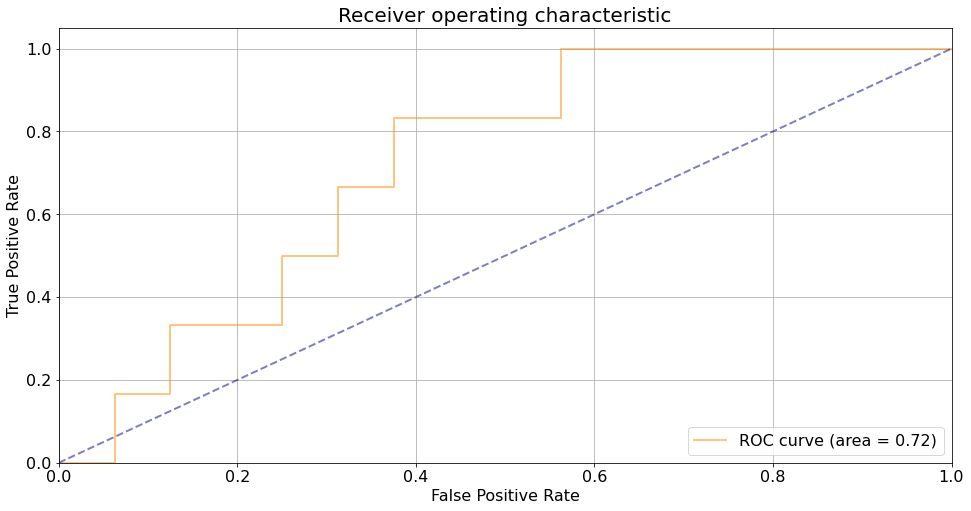

In [45]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 8))
lw = 2

plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc, alpha=0.5)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--', alpha=0.5)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('Receiver operating characteristic', fontsize=20)
plt.legend(loc="lower right", fontsize=16)
plt.show()

In [46]:
from catboost.utils import get_fpr_curve
from catboost.utils import get_fnr_curve

(thresholds, fpr) = get_fpr_curve(curve=curve)
(thresholds, fnr) = get_fnr_curve(curve=curve)

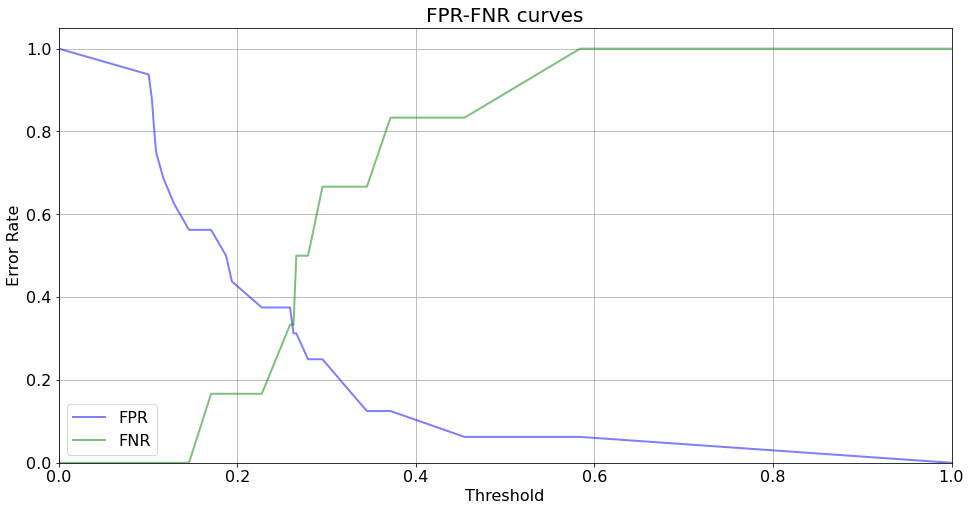

In [47]:
plt.figure(figsize=(16, 8))
lw = 2

plt.plot(thresholds, fpr, color='blue', lw=lw, label='FPR', alpha=0.5)
plt.plot(thresholds, fnr, color='green', lw=lw, label='FNR', alpha=0.5)

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.grid(True)
plt.xlabel('Threshold', fontsize=16)
plt.ylabel('Error Rate', fontsize=16)
plt.title('FPR-FNR curves', fontsize=20)
plt.legend(loc="lower left", fontsize=16)
plt.show()

In [48]:
from catboost.utils import select_threshold

print(select_threshold(model=model, data=eval_pool, FNR=0.01))
print(select_threshold(model=model, data=eval_pool, FPR=0.01))

0.1459570101628182
1.0


In [49]:
from sklearn.metrics import f1_score, classification_report
pred = model.predict(X_test)
cls = classification_report(y_test, pred)
print(cls)

              precision    recall  f1-score   support

           0       0.81      0.94      0.87        18
           1       0.75      0.43      0.55         7

    accuracy                           0.80        25
   macro avg       0.78      0.69      0.71        25
weighted avg       0.79      0.80      0.78        25



In [51]:
my_best_model = model.save_model('호흡기_model.bin')
print(model.get_params())
print(model.random_seed_)
print(model.learning_rate_)

{'custom_loss': ['Accuracy'], 'logging_level': 'Silent', 'random_seed': 40, 'learning_rate': 0.005, 'iterations': 1200}
40
0.004999999888241291
